# CAD - Skin Lesion Classification with Deep Learning
## Kaouther Mouheb - Rachika Elhassna Hamadache


\
Challenge 1
<!-- &emsp; -->
> This notebook contains the code for the binary classification of skin lesions. Different models are trained for this purpose, and the best performing ones are used on the test set for prediction.
\
\
The provided training dataset contains: 
*   Training set: 15195 images
*   Validation set: 3796 images







* **Mount Drive**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


* **Check GPU type**

In [2]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Mon Jan 16 14:34:59 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   50C    P8    11W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# **Libraries**



In this section, we import the packages and libraries needed for the pipeline.

In [3]:
!pip install opencv-python-headless==4.5.2.52

!pip install git+https://github.com/albumentations-team/albumentations

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.2/38.2 MB 32.4 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.7.0.68
    Uninstalling opencv-python-headless-4.7.0.68:
      Successfully uninstalled opencv-python-headless-4.7.0.68
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/albumentations-team/albumentations to /tmp/pip-req-build-yqi8mi37
  Running command git clone --filter=blob:none --quiet https://github.com/albumentations-team/albumentations /tmp/pip-req-build-yqi8mi37
  Resolved https://github.com/albumentations-team/albumentations to commit 2a1826d49c9442ae28cf33ddef658c8e24505cf8
  Preparing metadata (setup.py) ... done
  Created wheel for albumentations: filename=albumentations-1.3.0-py3-none-any.whl size=124568 sha256=5984e

In [4]:
# General
import sys
import copy
import time
import logging
import cv2 as cv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage import io
from PIL import Image, ImageOps 
from collections import Counter
from typing import Optional, Sequence

# Sci-kit learn
from sklearn.utils import class_weight
from sklearn.metrics import accuracy_score, cohen_kappa_score, confusion_matrix, roc_curve, auc

#Pytorch 
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms.functional as TF
from torch import Tensor
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
import albumentations as Alb

# Progress bar and Tensorboard
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter

# Torchvision models
from torchvision.models import resnet50, ResNet50_Weights, resnet34, ResNet34_Weights
from torchvision.models import resnext50_32x4d, ResNeXt50_32X4D_Weights
from torchvision.models import swin_t, Swin_T_Weights, swin_b, Swin_B_Weights
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights, efficientnet_b3, EfficientNet_B3_Weights
from torchvision.models import efficientnet_b4, EfficientNet_B4_Weights, efficientnet_b5, EfficientNet_B5_Weights
from torchvision.models import efficientnet_b6, EfficientNet_B6_Weights

# **Helper functions**

In this section, we define the different utils and helper functions that will be usefull for the rest of the notebook.

##  *Visualization*

In [5]:
def imshow(inp, title=None):
    """
    Imshow for Tensor: a Function that uses Matplotlib's PyPlot to show an image stored in a pytorch tensor.
    inputs: 
        inp   --> image stored in tensor.
        title --> title to be displayed with the image.
    returns: 
        None.
    """
    inp = inp.numpy().transpose((1, 2, 0))
    # Computed mean and std from the training dataset
    mean = np.array([0.6696, 0.5261, 0.5197])  
    std = np.array([0.1304, 0.1476, 0.1595])
    # Normalization
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

In [6]:
def visualize_model(model, loader, device, num_images=6):
    """
    Imshow for Tensor: a function to visualize some images and their predictions with the corresponding ground truth labels.
    inputs: 
        model      --> model  to predict the classes.
        loader     --> PyTorch dataloader to get the images.
        device     --> CUDA or CPU.
        num_images --> the number of images to show.
    returns: 
        None.
    """
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for batch in loader:
            inputs = batch["image"].to(device)
            labels = batch["label"].to(device)

            outputs = model(inputs)
            outputs_sig = torch.sigmoid(outputs)
            preds = ((outputs_sig>0.5)*1).int().cpu().numpy() 

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {preds[j]}')
                imshow(inputs.cpu().data[j])
                print(f'Actual: {labels[j]}, predicted: {preds[j]}')

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

In [7]:
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    cm = confusion_matrix(y_true, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    # print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

In [66]:
def plot_roc(labels, preds, flag, model_name, n_classes):
    '''param : labels  --> True classification label
                preds  --> Predicted classification label
                flag   --> Boolean variable to determine if the ROC curves would be plotted (flag==True) or not (flag==False)
                clf    --> String containing the model's name
      return : roc_auc --> Dictionary of AUC values for each class'''  

    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    # n_classes = 2
    # class_names = ['Others', 'Nev']
    colors = ['#f06e93', '#327ba8']
    for i in range(n_classes):
        actuals = (np.array(labels) == i+1).astype(np.uint8)  # Creating a one-vs-rest array for each class
        print(actuals.shape)
        print(preds.shape)
        fpr[i], tpr[i], _ = roc_curve(actuals, preds[:, i])  # Computing the FPR and TPR
        roc_auc[i] = auc(fpr[i], tpr[i])  # Computing the AUC values for class i

    if(flag == True):  # If flag is True, then display the ROC curves
      for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], color=colors[i], label='ROC curve for {0} (area = {1:0.2f})'.format('Nevus/Others', roc_auc[i]))  # roc_auc_score

      plt.plot([0, 1], [0, 1], 'k--')
      plt.xlim([0.0, 1.0])
      plt.ylim([0.0, 1.05])
      plt.xlabel('False Positive Rate')
      plt.ylabel('True Positive Rate')
      plt.title('Receiver Operating Characteristic [ROC] for {0}'.format(model_name))
      plt.legend(loc="lower right")
      plt.show()
    return roc_auc

## Models

In the following cells, we define functions that create image classification models from torchvision.models and modifiy their last layer (the classifier) to have 1 output instead of 1000. 

In [ ]:
def make_resnet34(pretrained = True, device = 'cpu'):
  """ Function to create a ResNet model with 1 output neuron"""
  if pretrained:
    weights = models.ResNet34_Weights.DEFAULT
    model = models.resnet34(weights=weights)
  else:
    model = models.resnet34(weights=None)
  num_ftrs = model.fc.in_features
  # Here, the size of each output sample is set to 1, as the task we have is binary.
  model.fc = nn.Linear(num_ftrs, 1)
  model = model.to(device)
  return model

In [ ]:
def make_resnet50(pretrained = True, device = 'cpu'):
  """ Function to create a ResNet model with 1 output neuron"""
  if pretrained:
    weights = models.ResNet50_Weights.DEFAULT
    model = models.resnet50(weights=weights)
  else:
    model = models.resnet50(weights=None)
  num_ftrs = model.fc.in_features
  # Here, the size of each output sample is set to 1, as the task we have is binary.
  model.fc = nn.Linear(num_ftrs, 1)
  model = model.to(device)
  return model

In [9]:
def make_resnext_50(pretrained = True, device = 'cpu'):
  """ Function to create a ResNeXt50 model with 1 output neuron"""
  if pretrained:
    weights = models.ResNeXt50_32X4D_Weights.DEFAULT
    model = models.resnext50_32x4d(weights=weights)
  else:  
    model = models.resnext50_32x4d(weights=None)
  num_ftrs = model.fc.in_features
  # Here, the size of each output sample is set to 1, as the task we have is binary.
  model.fc = nn.Linear(num_ftrs, 1)
  model = model.to(device)
  return model

In [ ]:
def make_swin_t(pretrained=True, device = 'cpu'):
  """ Function to create a SwinTransformer_Tiny model with 1 output neuron"""
  if pretrained:
    weights = models.Swin_T_Weights.DEFAULT  
    model = models.swin_t(weights=weights)
  else:
    model = models.swin_t(weights=None)
  # Here, the size of each output sample is set to 1, as the task we have is binary.
  num_ftrs = model.head.in_features
  model.head = torch.nn.Linear(in_features=num_ftrs, out_features=1, bias=True)
  model = model.to(device)
  return model

In [10]:
def make_swin_b(pretrained=True, device = 'cpu'):
  """ Function to create a SwinTransformer_Base model with 1 output neuron"""
  if pretrained:
    weights = models.Swin_B_Weights.DEFAULT  
    model = models.swin_b(weights=weights)
  else:
    model = models.swin_b(weights=None)
  # Here, the size of each output sample is set to 1, as the task we have is binary.
  num_ftrs = model.head.in_features
  model.head = torch.nn.Linear(in_features=num_ftrs, out_features=1, bias=True)
  model = model.to(device)
  return model

In [ ]:
def make_efficientnet_b2(pretrained=True, device = 'cpu'):
  """ Function to create a EfficientNet_B2 model with 1 output neuron"""
  if pretrained:
    weights = models.EfficientNet_B2_Weights.DEFAULT  
    model = models.efficientnet_b2(weights=weights)
  else:
    model = models.efficientnet_b2(weights=None)
  # Here, the size of each output sample is set to 1, as the task we have is binary.
  num_ftrs = model.classifier[1].in_features
  model.classifier[1] = nn.Linear(num_ftrs, 1)
  model = model.to(device)
  return model

In [11]:
def make_efficientnet_b3(pretrained=True, device = 'cpu'):
  """ Function to create a EfficientNet_B3 model with 1 output neuron"""
  if pretrained:
    weights = models.EfficientNet_B3_Weights.DEFAULT  
    model = models.efficientnet_b3(weights=weights)
  else:
    model = models.efficientnet_b3(weights=None)
  # Here, the size of each output sample is set to 1, as the task we have is binary.
  num_ftrs = model.classifier[1].in_features
  model.classifier[1] = nn.Linear(num_ftrs, 1)
  model = model.to(device)
  return model

In [ ]:
def make_efficientnet_b4(pretrained=True, device = 'cpu'):
  """ Function to create a EfficientNet_B4 model with 1 output neuron"""
  if pretrained:
    weights = models.EfficientNet_B4_Weights.DEFAULT  
    model = models.efficientnet_b4(weights=weights)
  else:
    model = models.efficientnet_b4(weights=None)
  # Here, the size of each output sample is set to 1, as the task we have is binary.
  num_ftrs = model.classifier[1].in_features
  model.classifier[1] = nn.Linear(num_ftrs, 1)
  model = model.to(device)
  return model

In [ ]:
def make_efficientnet_b5(pretrained=True, device = 'cpu'):
  """ Function to create a EfficientNet_B5 model with 1 output neuron"""
  if pretrained:
    weights = models.EfficientNet_B5_Weights.DEFAULT  
    model = models.efficientnet_b5(weights=weights)
  else:
    model = models.efficientnet_b5(weights=None)
  # Here, the size of each output sample is set to 1, as the task we have is binary.
  num_ftrs = model.classifier[1].in_features
  model.classifier[1] = nn.Linear(num_ftrs, 1)
  model = model.to(device)
  return model

In [ ]:
def make_efficientnet_b6(pretrained=True, device = 'cpu'):
  """ Function to create a EfficientNet_B6 model with 1 output neuron"""
  if pretrained:
    weights = models.EfficientNet_B6_Weights.DEFAULT  
    model = models.efficientnet_b6(weights=weights)
  else:
    model = models.efficientnet_b6(weights=None)
  # Here, the size of each output sample is set to 1, as the task we have is binary.
  num_ftrs = model.classifier[1].in_features
  model.classifier[1] = nn.Linear(num_ftrs, 1)
  model = model.to(device)
  return model

## Training

In [12]:
# Training function
def train_model(model, dataloaders, criterion, optimizer, scheduler, 
                checkpoint_path, early_stop_patience=10, num_epochs=25, 
                writer_path= '', load_checkpoint=None):  
    """ 
    Function to train a model 
    inputs:
        model               --> model to be trained
        dataloaders         --> dict of 2 dataloaders: one for train and another for validation
        criterion           --> loss function
        optimizer           --> optimization algorithm to be used
        scheduler           --> LR scheduler
        checkpoint_path     --> path for loading the checkpoints
        early_stop_patience --> early stop if no improvement in the loss after this much epochs
        num_epochs=25       --> maximum number of epochs 
        writer_path         --> path for tensorboard writer
        load_checkpoint     --> path for the checkpoints to be loaded (None otherwise)
    returns:
        model
    """

    since = time.time()

    best_weights_p = checkpoint_path[:-4] + '_best.pth'

    writers = {
        'train': SummaryWriter(writer_path + '/log'),
        'val': SummaryWriter(writer_path + '/log_val')
    }

    best_model_wts = copy.deepcopy(model.state_dict()) # initialize best weights with initial model weights
    best_loss = 1e8 # as bad as it gets 
    best_acc = 0.0 # as bad as it gets 
    best_kappa = 0.0 # as bad as it gets 
    early_stop_c = 0 # initialize early stopping count
    prev_epoch = -1

    if load_checkpoint is not None:
      checkpoint = torch.load(load_checkpoint)
      optimizer.load_state_dict(checkpoint['optimizer_state'])
      model.load_state_dict(checkpoint['model_state'])
      scheduler.load_state_dict(checkpoint['scheduler_state'])  
      criterion = checkpoint['criterion']
      prev_epoch = checkpoint['epoch']
      best_loss = checkpoint['best_loss']
      best_acc = checkpoint['best_acc']
      best_kappa = checkpoint['best_kappa']
      early_stop_c = checkpoint['early_stop_c']


    for epoch in range(prev_epoch+1, num_epochs): # iterate over the whole dataset (epoch)
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 15)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']: 
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0 # keep track of epoch loss
            running_labels = [] # list to hold labels over all the epoch
            running_preds = [] # list to hold the model predictions over all the epoch

            # Iterate over data
            for batch in tqdm(dataloaders[phase]): # iterate over each batch in the loader

                inputs = batch["image"].to(DEVICE) # fetch data and move to GPU/CPU
                labels = batch["label"].to(DEVICE) # fetch data and move to GPU/CPU

                # Zero the parameter gradients
                optimizer.zero_grad()

                # -- Forward --
                # Track history only if in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs) # forward pass 
                    labels = labels.unsqueeze(1) 
                    labels = labels.float() 
                    outputs_sig = torch.sigmoid(outputs)
                    preds = ((outputs_sig>0.5)*1).float()  # get the label
                    loss = criterion(outputs, labels) # calculate the loss of the batch

                    # -- Backward + optimize only if in training phase --
                    if phase == 'train':
                        loss.backward() # backpropagation
                        optimizer.step() # update weights 

                # Statistics
                running_loss += loss.item() * inputs.size(0)
                running_labels = running_labels + labels.int().cpu().tolist()
                running_preds = running_preds + preds.int().cpu().tolist()


            print('\n preds:', running_preds, '\n labs:', running_labels)
            epoch_loss = running_loss / dataset_sizes[phase] # average loss of the epoch
            epoch_acc = accuracy_score(running_labels, running_preds) # accuracy of the epoch
            epoch_kappa = cohen_kappa_score(running_labels, running_preds) # kappa of the epoch

            if phase == 'val':
              scheduler.step(epoch_loss) # update LR dynamically 
              lr_ = optimizer.param_groups[0]['lr'] # save current learning rate to writer
              writers['train'].add_scalar('info/lr', lr_, epoch)

            logging.info( '%s epoch %d : loss : %.4f, acc: %.4f, kappa: %.4f' %
                (phase, epoch+1, epoch_loss, epoch_acc, epoch_kappa))
            
            # Save stats to writer for tracking
            writers[phase].add_scalar('info/loss', epoch_loss, epoch)
            writers[phase].add_scalar('info/acc', epoch_acc, epoch)
            writers[phase].add_scalar('info/kappa', epoch_kappa, epoch)

            # Update best parameters
            if phase == 'val':
              if epoch_loss < best_loss:  # a new best val loss achieved 
                best_loss = epoch_loss  # update the best loss
                early_stop_c = 0  # new minimum found, reset ES counter
              else:
                early_stop_c += 1  # increment ES counter

              if epoch_kappa > best_kappa: # a new best val kappa score achieved 
                best_kappa = epoch_kappa # update the best kappa

              if epoch_acc > best_acc: # new best accuracy achieved
                best_acc = epoch_acc  # update accuracy tracker
                best_model_wts = copy.deepcopy(model.state_dict()) # update best weights tracker
                torch.save(best_model_wts, best_weights_p)

        torch.save({
            'model_state': model.state_dict(),
            'criterion': criterion,
            'optimizer_state': optimizer.state_dict(),
            'scheduler_state': scheduler.state_dict(),
            'epoch': epoch,
            'best_loss': best_loss,
            'best_acc': best_acc,
            'best_kappa': best_kappa,
            'early_stop_c': early_stop_c
            }, checkpoint_path)

        if early_stop_c > early_stop_patience: # if no val loss minimum was found in the last ES Patience epochs then stop training
            print(f'EARLY STOP AFTER {epoch + 1} EPOCHS')         
            break   

        print()
    # Print statistics 
    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val loss: {best_loss:4f}')
    print(f"Best val acc: {best_acc}")
    print(f"Best val kappa: {best_kappa}")

    # Load best model weights
    model.load_state_dict(best_model_wts)
    writers['train'].close()
    writers['val'].close()
    return model

## Testing

In [13]:
def test_model(model, loader, device, criterion): 
    """ 
    Function to test a model's performance on the test set 
    inputs: 
        model     --> model to be tested
        loader    --> test loader 
        device    --> Cuda or CPU
        criterion --> loss function
    returns: 
        test loss, test accuracy and test kappa
    """           
    since = time.time()

    model.eval()   # Set model to evaluate mode

    running_loss = 0.0
    running_corrects = 0
    running_labels = []
    running_preds = []

    # Iterate over data.
    with torch.no_grad():
        for batch in tqdm(loader):
            inputs = batch["image"].to(DEVICE)
            labels = batch["label"].to(DEVICE)

            labels = labels.unsqueeze(1) 
            labels = labels.float() 
            
            # Get model predictions
            outputs = model(inputs)
            outputs_sig = torch.sigmoid(outputs)
            preds = ((outputs_sig>0.5)*1).float()   
            # Compute the loss  
            loss = criterion(outputs, labels)

            # Statistics
            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)
            running_labels = running_labels + labels.int().cpu().tolist()
            running_preds = running_preds + preds.int().cpu().tolist()

        print('\n preds:', running_preds, '\n labs:', running_labels)
        test_loss = running_loss / dataset_sizes['val'] 
        test_acc = accuracy_score(running_labels, running_preds)
        test_kappa = cohen_kappa_score(running_labels, running_preds)
        print(f'Test Loss: {test_loss:.4f} Acc: {test_acc:.4f} Kappa: {test_kappa:.4f}')
    
        time_elapsed = time.time() - since
        print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

        model.train()

        return test_loss, test_acc, test_kappa

# **Dataset Definition and Split**

## Custom ISIC2019 Dataset

Here, we create a custom Pytorch dataset class for ISIC2019 data

In [14]:
class Challenge1Dataset(Dataset):
    """Challenge 1 dataset"""

    def __init__(self, csv_file, image_folder, img_transform=None, augment = False):
        """
        Args:
            csv_file (string): Path to the csv file with image paths & classification labels.
            image_folder (string): Path to the folder where the images are located.
            img_transform (callable, optional): Optional transform to be applied on a sample.
            augment (boolean): Whether to perform data augmentation or not.
        """
        self.df = pd.read_csv(csv_file).drop("Unnamed: 0", axis = 1) # pandas dataframe containing the image IDs and classification labels  
        self.image_folder = image_folder # path to the folder containing the original images 
        self.img_transform = img_transform # image transform for the images
        self.augment = augment # whether to perform data augmentation or not
        self.labels = self.df["label"].values.tolist()
        

    def __len__(self):
        return len(self.df) # return the number of images in the dataset

    
    def get_labels(self):
        return self.labels # return the class of images in the dataset


    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
       
        img_id = '/' + self.df.iloc[idx]['image_id'] # obtain image file name  
        
        if(img_id[1:4]=='nev'):
          class_folder = '/nevus'
        else:
          class_folder = '/others'

        img_path = self.image_folder + class_folder + img_id + '.jpg' # file path of the original image 
        image = Image.open(img_path)  # open the original image as RGB

        label = self.df.iloc[idx]['label'] # get the image's correct class

        # If augment = T perform data augmentation: 
        if self.augment:
          image_np = np.array(image) # albumentations only works with np arrays, so convert from PIL 
          aug_transform = Alb.Compose(
                                      [   
                                          Alb.SmallestMaxSize(max_size=260),
                                          Alb.RandomResizedCrop(height=256, width=256, p = 0.7, scale=(0.4, 1.0), ratio=(0.75, 4/3)),
                                          Alb.Affine(scale=(0.8, 1.2), rotate=(0.0, 90.0), shear=(0.0, 20.0), mode=1, p=0.8),
                                          Alb.Flip(p=0.9),
                                          Alb.ColorJitter(brightness=[0.7, 1.3], contrast=[0.7, 1.3], saturation=[0.9, 1.1], hue=0.05, p=0.6),
                                      ]
                                  )
          augmentations = aug_transform(image=image_np) # apply the transform 
          image = Image.fromarray(augmentations["image"]) # convert back to PIL to use torchvision transforms

        # If a transform is provided apply it (Preprocessing)
        if self.img_transform:
            image = self.img_transform(image)

        # return the image and its class
        return {
            'image': image,
            'label': label,
      }

* **Data paths**

In [15]:
tr = pd.read_csv('/content/drive/MyDrive/CAD_Dataset/Challenge1/train.csv')
print('Length of train data:', len(tr['image_id']))
vl = pd.read_csv('/content/drive/MyDrive/CAD_Dataset/Challenge1/val.csv')
print('Length of validation data:', len(vl['image_id']))

Length of train data: 15195
Length of validation data: 3796


In [16]:
# Data paths (Please change to the corresponding path if not the same in your device)

# Image directories
train_img_folder = '/content/drive/MyDrive/CAD_Dataset/Challenge1/train/train'
val_img_folder = '/content/drive/MyDrive/CAD_Dataset/Challenge1/val/val'
test_img_folder = '/content/drive/MyDrive/CAD_Dataset/Challenge1_test/testX'

# CSV paths
train_csv_path = '/content/drive/MyDrive/CAD_Dataset/Challenge1/train.csv'
val_csv_path = '/content/drive/MyDrive/CAD_Dataset/Challenge1/val.csv'
test_csv_path = '/content/drive/MyDrive/CAD_Dataset/Challenge1/test.csv'

#number of samples in each set
dataset_sizes = {
    'train': 15195,
    'val':3796
}

## Calculating the mean and std

In [ ]:
# # +++++  RUN ONLY ONCE  +++++
# # Uncomment this cell to run it and compute the mean and std of the training data

# # Transforms for preprocessing, we will use the same for all datasets here
# NEW_SIZE = 256
# img_transforms = transforms.Compose([
#                                       transforms.Resize(NEW_SIZE+4),
#                                       transforms.CenterCrop(NEW_SIZE),
#                                       transforms.ToTensor(),
#                                   ]) 
# df = pd.read_csv(train_csv_path)

# mean = torch.zeros((1,3))
# stdv = torch.zeros((1,3))
# for idx, row in tqdm(df.iterrows()):
#   print(idx)
#   img_id = '/' + row['image_id'] # obtain image file name  

#   if(img_id[1:4]=='nev'):
#     class_folder = '/nevus'
#   else:
#     class_folder = '/others'

#   img_path = train_img_folder + class_folder + img_id + '.jpg' # file path of the original image 
#   img = Image.open(img_path)
#   img = img_transforms(img)

#   mean += torch.mean(img, axis = [1,2])
#   stdv += torch.std(img, axis = [1,2])

# mean = mean/len(df)
# stdv = stdv/len(df)
# print(f"mean: {mean}")
# print(f"std: {stdv}")

0it [00:00, ?it/s]

0


1it [00:00,  1.87it/s]

1


2it [00:00,  2.31it/s]

2


3it [00:01,  2.57it/s]

3


4it [00:01,  2.53it/s]

4


5it [00:02,  2.45it/s]

5


6it [00:02,  2.42it/s]

6


7it [00:02,  2.63it/s]

7


8it [00:03,  2.22it/s]

8


9it [00:03,  2.12it/s]

9


10it [00:04,  2.43it/s]

10


11it [00:04,  2.65it/s]

11


12it [00:05,  2.39it/s]

12


13it [00:05,  2.41it/s]

13


14it [00:05,  2.57it/s]

14


15it [00:06,  2.55it/s]

15


16it [00:06,  2.38it/s]

16


17it [00:06,  2.67it/s]

17


18it [00:07,  2.76it/s]

18


19it [00:07,  2.52it/s]

19


20it [00:08,  2.61it/s]

20


21it [00:08,  2.68it/s]

21


22it [00:08,  2.75it/s]

22


23it [00:09,  2.52it/s]

23


24it [00:09,  2.57it/s]

24


25it [00:09,  2.70it/s]

25


26it [00:10,  2.66it/s]

26


27it [00:10,  2.55it/s]

27


28it [00:11,  2.84it/s]

28


29it [00:11,  2.74it/s]

29


30it [00:11,  2.66it/s]

30


31it [00:12,  2.92it/s]

31


32it [00:12,  3.16it/s]

32


33it [00:12,  2.99it/s]

33


34it [00:13,  2.99it/s]

34


35it [00:13,  2.94it/s]

35


36it [00:13,  3.08it/s]

36


37it [00:13,  3.25it/s]

37


38it [00:14,  2.88it/s]

38


39it [00:14,  2.57it/s]

39


40it [00:15,  2.68it/s]

40


41it [00:15,  2.50it/s]

41


42it [00:16,  2.46it/s]

42


43it [00:16,  2.36it/s]

43


44it [00:16,  2.45it/s]

44


45it [00:17,  2.42it/s]

45


46it [00:17,  2.41it/s]

46


47it [00:18,  2.53it/s]

47


48it [00:18,  2.86it/s]

48


49it [00:18,  3.05it/s]

49


50it [00:18,  3.43it/s]

50


51it [00:19,  3.08it/s]

51


52it [00:19,  3.41it/s]

52


53it [00:19,  3.23it/s]

53


54it [00:20,  3.50it/s]

54


55it [00:20,  3.65it/s]

55


56it [00:20,  3.19it/s]

56


57it [00:21,  2.93it/s]

57


58it [00:21,  2.88it/s]

58


59it [00:21,  2.99it/s]

59


60it [00:22,  3.02it/s]

60


61it [00:22,  2.89it/s]

61


62it [00:22,  3.13it/s]

62


63it [00:23,  2.80it/s]

63


64it [00:23,  3.08it/s]

64


65it [00:23,  3.20it/s]

65


66it [00:23,  3.38it/s]

66


67it [00:24,  3.60it/s]

67


68it [00:24,  3.83it/s]

68


69it [00:24,  3.42it/s]

69


70it [00:25,  3.59it/s]

70


71it [00:25,  3.09it/s]

71


72it [00:25,  2.93it/s]

72


73it [00:26,  3.10it/s]

73


74it [00:26,  3.18it/s]

74


75it [00:26,  3.11it/s]

75


76it [00:27,  2.82it/s]

76


77it [00:27,  2.78it/s]

77


78it [00:27,  2.73it/s]

78


79it [00:28,  2.66it/s]

79


80it [00:28,  2.95it/s]

80


81it [00:28,  2.90it/s]

81


82it [00:29,  3.24it/s]

82


83it [00:29,  3.30it/s]

83


84it [00:29,  3.40it/s]

84


85it [00:29,  3.68it/s]

85


86it [00:30,  3.69it/s]

86


87it [00:30,  3.45it/s]

87


88it [00:30,  3.55it/s]

88


89it [00:31,  3.48it/s]

89


90it [00:31,  3.23it/s]

90


91it [00:31,  2.86it/s]

91


92it [00:32,  3.13it/s]

92


93it [00:32,  2.86it/s]

93


94it [00:32,  2.90it/s]

94


95it [00:33,  2.75it/s]

95


96it [00:33,  2.97it/s]

96


97it [00:33,  3.25it/s]

97


98it [00:34,  3.05it/s]

98


99it [00:34,  2.97it/s]

99


100it [00:34,  3.30it/s]

100


101it [00:35,  3.55it/s]

101


102it [00:35,  3.74it/s]

102


103it [00:35,  3.67it/s]

103


104it [00:35,  3.29it/s]

104


105it [00:36,  3.04it/s]

105


106it [00:36,  2.89it/s]

106


107it [00:36,  3.10it/s]

107


108it [00:37,  2.95it/s]

108


109it [00:37,  3.00it/s]

109


110it [00:38,  2.94it/s]

110


111it [00:38,  2.92it/s]

111


112it [00:38,  2.86it/s]

112


113it [00:39,  3.01it/s]

113


114it [00:39,  3.29it/s]

114


115it [00:39,  3.27it/s]

115


116it [00:39,  3.07it/s]

116


117it [00:40,  3.10it/s]

117


118it [00:40,  3.38it/s]

118


119it [00:40,  3.03it/s]

119


120it [00:41,  3.06it/s]

120


121it [00:41,  3.22it/s]

121


122it [00:41,  3.14it/s]

122


123it [00:42,  3.30it/s]

123


124it [00:42,  3.03it/s]

124


125it [00:42,  2.99it/s]

125


126it [00:43,  2.89it/s]

126


127it [00:43,  2.93it/s]

127


128it [00:43,  3.20it/s]

128


129it [00:44,  3.43it/s]

129


130it [00:44,  3.23it/s]

130


131it [00:44,  3.42it/s]

131


132it [00:44,  3.67it/s]

132


133it [00:45,  3.67it/s]

133


134it [00:45,  3.94it/s]

134


136it [00:45,  4.17it/s]

135
136


137it [00:46,  3.66it/s]

137


138it [00:46,  3.33it/s]

138


139it [00:46,  3.11it/s]

139


141it [00:47,  3.82it/s]

140
141


142it [00:47,  3.35it/s]

142


143it [00:47,  3.45it/s]

143


144it [00:48,  3.56it/s]

144


145it [00:48,  3.75it/s]

145


146it [00:48,  2.93it/s]

146


147it [00:49,  3.09it/s]

147


148it [00:49,  3.21it/s]

148


149it [00:49,  3.52it/s]

149


150it [00:50,  3.28it/s]

150


151it [00:50,  3.16it/s]

151


152it [00:50,  3.45it/s]

152


153it [00:51,  3.11it/s]

153


154it [00:51,  2.84it/s]

154


155it [00:51,  3.14it/s]

155


156it [00:52,  3.25it/s]

156


157it [00:52,  3.48it/s]

157


158it [00:52,  3.29it/s]

158


159it [00:53,  2.88it/s]

159


160it [00:53,  2.85it/s]

160


161it [00:53,  2.80it/s]

161


162it [00:54,  2.96it/s]

162


163it [00:54,  3.26it/s]

163


164it [00:54,  3.41it/s]

164


165it [00:54,  3.14it/s]

165


166it [00:55,  2.93it/s]

166


168it [00:55,  3.32it/s]

167
168


169it [00:56,  3.52it/s]

169


170it [00:56,  3.71it/s]

170


171it [00:56,  3.38it/s]

171


172it [00:57,  3.25it/s]

172


173it [00:57,  3.59it/s]

173


174it [00:57,  3.32it/s]

174


175it [00:58,  3.10it/s]

175


176it [00:58,  3.03it/s]

176


177it [00:58,  3.13it/s]

177


178it [00:58,  3.32it/s]

178


179it [00:59,  3.13it/s]

179


180it [00:59,  3.03it/s]

180


181it [00:59,  3.15it/s]

181


182it [01:00,  3.19it/s]

182


183it [01:00,  3.01it/s]

183


184it [01:00,  2.93it/s]

184


185it [01:01,  3.18it/s]

185


186it [01:01,  3.48it/s]

186


187it [01:01,  3.24it/s]

187


188it [01:02,  3.45it/s]

188


189it [01:02,  3.47it/s]

189


190it [01:02,  3.53it/s]

190


191it [01:02,  3.66it/s]

191


192it [01:03,  3.79it/s]

192


193it [01:03,  3.46it/s]

193


194it [01:03,  3.78it/s]

194


195it [01:03,  3.91it/s]

195


196it [01:04,  4.00it/s]

196


197it [01:04,  3.73it/s]

197


198it [01:04,  3.86it/s]

198


199it [01:05,  2.94it/s]

199


200it [01:05,  3.13it/s]

200


201it [01:05,  3.22it/s]

201


202it [01:06,  3.19it/s]

202


203it [01:06,  3.41it/s]

203


204it [01:06,  3.32it/s]

204


205it [01:06,  3.48it/s]

205


206it [01:07,  3.41it/s]

206


208it [01:07,  3.95it/s]

207
208


209it [01:07,  3.84it/s]

209


210it [01:08,  3.48it/s]

210


211it [01:08,  3.24it/s]

211


212it [01:08,  3.39it/s]

212


213it [01:09,  3.19it/s]

213


214it [01:09,  3.37it/s]

214


215it [01:09,  3.50it/s]

215


216it [01:10,  3.22it/s]

216


217it [01:10,  3.23it/s]

217


218it [01:10,  3.26it/s]

218


219it [01:11,  3.33it/s]

219


220it [01:11,  3.13it/s]

220


221it [01:11,  3.01it/s]

221


222it [01:11,  3.28it/s]

222


223it [01:12,  3.49it/s]

223


225it [01:12,  3.69it/s]

224
225


226it [01:13,  3.40it/s]

226


227it [01:13,  3.35it/s]

227


228it [01:13,  3.18it/s]

228


229it [01:14,  3.38it/s]

229


230it [01:14,  3.32it/s]

230


231it [01:14,  3.46it/s]

231


232it [01:14,  3.68it/s]

232


233it [01:15,  2.88it/s]

233


234it [01:15,  3.22it/s]

234


235it [01:15,  3.41it/s]

235


236it [01:16,  3.42it/s]

236


237it [01:16,  3.13it/s]

237


238it [01:16,  2.85it/s]

238


239it [01:17,  3.05it/s]

239


240it [01:17,  3.11it/s]

240


241it [01:17,  2.85it/s]

241


242it [01:18,  2.97it/s]

242


243it [01:18,  2.81it/s]

243


244it [01:18,  2.87it/s]

244


245it [01:19,  2.83it/s]

245


246it [01:19,  2.71it/s]

246


247it [01:20,  2.78it/s]

247


248it [01:20,  2.88it/s]

248


249it [01:20,  2.89it/s]

249


250it [01:21,  2.99it/s]

250


251it [01:21,  3.30it/s]

251


252it [01:21,  3.43it/s]

252


253it [01:21,  3.22it/s]

253


254it [01:22,  3.44it/s]

254


255it [01:22,  3.24it/s]

255


256it [01:22,  3.07it/s]

256


257it [01:23,  3.00it/s]

257


258it [01:23,  3.17it/s]

258


259it [01:23,  3.35it/s]

259


260it [01:24,  3.47it/s]

260


261it [01:24,  3.21it/s]

261


262it [01:24,  3.13it/s]

262


264it [01:25,  3.74it/s]

263
264


265it [01:25,  3.23it/s]

265


266it [01:25,  3.40it/s]

266


267it [01:26,  3.28it/s]

267


268it [01:26,  3.42it/s]

268


269it [01:26,  3.08it/s]

269


270it [01:27,  3.19it/s]

270


271it [01:27,  3.36it/s]

271


272it [01:27,  3.39it/s]

272


273it [01:27,  3.50it/s]

273


274it [01:28,  3.66it/s]

274


275it [01:28,  3.68it/s]

275


276it [01:28,  3.75it/s]

276


277it [01:28,  3.90it/s]

277


278it [01:29,  3.64it/s]

278


279it [01:29,  3.26it/s]

279


280it [01:29,  3.22it/s]

280


281it [01:30,  3.42it/s]

281


282it [01:30,  3.09it/s]

282


283it [01:30,  3.00it/s]

283


284it [01:31,  3.26it/s]

284


285it [01:31,  3.02it/s]

285


286it [01:31,  3.18it/s]

286


287it [01:32,  3.41it/s]

287


288it [01:32,  3.10it/s]

288


289it [01:32,  2.90it/s]

289


290it [01:33,  3.03it/s]

290


291it [01:33,  3.31it/s]

291


292it [01:33,  3.46it/s]

292


293it [01:34,  3.15it/s]

293


295it [01:34,  3.85it/s]

294
295


296it [01:34,  3.47it/s]

296


297it [01:35,  3.22it/s]

297


298it [01:35,  3.47it/s]

298


299it [01:35,  2.92it/s]

299


300it [01:36,  2.96it/s]

300


301it [01:36,  3.04it/s]

301


302it [01:36,  3.04it/s]

302


303it [01:37,  2.91it/s]

303


304it [01:37,  3.18it/s]

304


305it [01:37,  2.99it/s]

305


306it [01:38,  3.30it/s]

306


307it [01:38,  3.44it/s]

307


308it [01:38,  3.56it/s]

308


309it [01:38,  3.44it/s]

309


310it [01:39,  3.52it/s]

310


311it [01:39,  3.19it/s]

311


312it [01:40,  2.85it/s]

312


313it [01:40,  3.04it/s]

313


314it [01:40,  3.00it/s]

314


315it [01:41,  2.88it/s]

315


316it [01:41,  2.73it/s]

316


317it [01:41,  2.68it/s]

317


318it [01:42,  2.74it/s]

318


319it [01:42,  2.82it/s]

319


320it [01:42,  3.15it/s]

320


321it [01:43,  2.89it/s]

321


322it [01:43,  2.81it/s]

322


323it [01:43,  2.79it/s]

323


324it [01:44,  2.87it/s]

324


325it [01:44,  3.11it/s]

325


326it [01:44,  3.10it/s]

326


327it [01:45,  3.20it/s]

327


328it [01:45,  2.92it/s]

328


329it [01:45,  2.97it/s]

329


330it [01:46,  3.22it/s]

330


331it [01:46,  3.03it/s]

331


332it [01:46,  2.89it/s]

332


333it [01:47,  2.85it/s]

333


334it [01:47,  3.14it/s]

334


335it [01:47,  2.97it/s]

335


337it [01:48,  3.73it/s]

336
337


338it [01:48,  3.87it/s]

338


339it [01:48,  3.52it/s]

339


340it [01:49,  3.40it/s]

340


341it [01:49,  3.58it/s]

341


342it [01:49,  3.55it/s]

342


343it [01:50,  3.20it/s]

343


344it [01:50,  3.46it/s]

344


345it [01:50,  3.28it/s]

345


346it [01:50,  3.52it/s]

346


347it [01:51,  3.31it/s]

347


348it [01:51,  3.04it/s]

348


349it [01:51,  3.13it/s]

349


350it [01:52,  3.09it/s]

350


352it [01:52,  3.53it/s]

351
352


353it [01:53,  3.37it/s]

353


354it [01:53,  3.54it/s]

354


355it [01:53,  3.45it/s]

355


356it [01:53,  3.70it/s]

356


357it [01:54,  3.27it/s]

357


358it [01:54,  2.92it/s]

358


359it [01:54,  2.98it/s]

359


360it [01:55,  2.85it/s]

360


361it [01:55,  2.73it/s]

361


362it [01:56,  2.62it/s]

362


363it [01:56,  2.72it/s]

363


364it [01:56,  2.94it/s]

364


365it [01:57,  2.99it/s]

365


366it [01:57,  3.32it/s]

366


367it [01:57,  3.11it/s]

367


368it [01:57,  3.42it/s]

368


369it [01:58,  3.70it/s]

369


370it [01:58,  3.79it/s]

370


371it [01:58,  3.93it/s]

371


372it [01:58,  3.70it/s]

372


373it [01:59,  3.76it/s]

373


374it [01:59,  3.51it/s]

374


376it [02:00,  3.65it/s]

375
376


377it [02:00,  3.29it/s]

377


378it [02:00,  3.43it/s]

378


379it [02:01,  3.35it/s]

379


380it [02:01,  3.61it/s]

380


381it [02:01,  3.41it/s]

381


382it [02:01,  3.17it/s]

382


383it [02:02,  3.01it/s]

383


384it [02:02,  3.04it/s]

384


385it [02:03,  2.92it/s]

385


386it [02:03,  2.85it/s]

386


388it [02:03,  3.51it/s]

387
388


389it [02:04,  3.21it/s]

389


390it [02:04,  3.44it/s]

390


391it [02:04,  3.63it/s]

391


392it [02:04,  3.57it/s]

392


393it [02:05,  3.36it/s]

393


394it [02:05,  3.40it/s]

394


395it [02:05,  3.35it/s]

395


396it [02:06,  3.61it/s]

396


397it [02:06,  3.14it/s]

397


398it [02:06,  3.03it/s]

398


399it [02:07,  3.34it/s]

399


400it [02:07,  3.32it/s]

400


401it [02:07,  3.12it/s]

401


402it [02:08,  3.39it/s]

402


403it [02:08,  3.62it/s]

403


404it [02:08,  3.68it/s]

404


405it [02:08,  3.77it/s]

405


406it [02:09,  3.54it/s]

406


407it [02:09,  3.44it/s]

407


408it [02:09,  3.36it/s]

408


409it [02:10,  3.13it/s]

409


410it [02:10,  3.39it/s]

410


411it [02:10,  3.25it/s]

411


412it [02:10,  3.47it/s]

412


413it [02:11,  3.65it/s]

413


414it [02:11,  3.70it/s]

414


415it [02:11,  3.78it/s]

415


416it [02:12,  3.31it/s]

416


417it [02:12,  3.62it/s]

417


418it [02:12,  3.47it/s]

418


419it [02:12,  3.42it/s]

419


420it [02:13,  3.22it/s]

420


421it [02:13,  3.47it/s]

421


422it [02:13,  3.39it/s]

422


423it [02:14,  3.59it/s]

423


424it [02:14,  3.59it/s]

424


425it [02:14,  3.31it/s]

425


426it [02:14,  3.46it/s]

426


427it [02:15,  3.15it/s]

427


428it [02:15,  3.44it/s]

428


429it [02:15,  3.14it/s]

429


430it [02:16,  2.90it/s]

430


431it [02:16,  2.87it/s]

431


433it [02:17,  3.47it/s]

432


434it [02:17,  3.36it/s]

433
434


435it [02:17,  3.20it/s]

435


436it [02:18,  3.14it/s]

436


437it [02:18,  3.34it/s]

437


438it [02:18,  3.50it/s]

438


439it [02:19,  3.31it/s]

439


440it [02:19,  2.99it/s]

440


441it [02:19,  3.34it/s]

441


442it [02:20,  3.07it/s]

442


443it [02:20,  3.04it/s]

443


444it [02:20,  3.26it/s]

444


445it [02:20,  3.59it/s]

445


446it [02:21,  3.50it/s]

446


447it [02:21,  3.21it/s]

447


448it [02:21,  3.46it/s]

448


449it [02:22,  3.07it/s]

449


450it [02:22,  3.03it/s]

450


451it [02:22,  3.25it/s]

451


452it [02:22,  3.45it/s]

452


453it [02:23,  3.12it/s]

453


454it [02:23,  3.04it/s]

454


455it [02:24,  2.94it/s]

455


456it [02:24,  3.15it/s]

456


457it [02:24,  3.28it/s]

457


458it [02:24,  3.45it/s]

458


459it [02:25,  3.00it/s]

459


460it [02:25,  2.84it/s]

460


461it [02:25,  3.18it/s]

461


462it [02:26,  3.29it/s]

462


463it [02:26,  3.63it/s]

463


464it [02:26,  3.59it/s]

464


465it [02:26,  3.66it/s]

465


466it [02:27,  3.21it/s]

466


467it [02:27,  3.27it/s]

467


468it [02:27,  3.43it/s]

468


469it [02:28,  3.22it/s]

469


470it [02:28,  3.24it/s]

470


471it [02:29,  2.29it/s]

471


472it [02:29,  2.48it/s]

472


473it [02:29,  2.85it/s]

473


474it [02:30,  2.85it/s]

474


475it [02:30,  2.88it/s]

475


476it [02:30,  3.01it/s]

476


477it [02:31,  3.30it/s]

477


478it [02:31,  2.82it/s]

478


479it [02:31,  3.12it/s]

479


480it [02:32,  3.39it/s]

480


481it [02:32,  3.13it/s]

481


482it [02:32,  3.12it/s]

482


483it [02:33,  3.38it/s]

483


484it [02:33,  3.69it/s]

484


485it [02:33,  3.78it/s]

485


486it [02:33,  3.87it/s]

486


487it [02:34,  3.50it/s]

487


488it [02:34,  3.44it/s]

488


489it [02:34,  2.62it/s]

489


490it [02:35,  2.73it/s]

490


491it [02:35,  2.65it/s]

491


492it [02:36,  2.64it/s]

492


493it [02:36,  2.98it/s]

493


494it [02:36,  2.78it/s]

494


495it [02:36,  3.01it/s]

495


496it [02:37,  2.89it/s]

496


497it [02:37,  2.69it/s]

497


498it [02:38,  2.49it/s]

498


499it [02:38,  2.68it/s]

499


500it [02:38,  2.85it/s]

500


501it [02:39,  2.74it/s]

501


502it [02:39,  2.74it/s]

502


503it [02:39,  3.08it/s]

503


504it [02:40,  3.31it/s]

504


505it [02:40,  3.31it/s]

505


506it [02:40,  3.21it/s]

506


507it [02:41,  3.01it/s]

507


508it [02:41,  2.76it/s]

508


509it [02:41,  3.05it/s]

509


511it [02:42,  3.69it/s]

510
511


512it [02:42,  3.49it/s]

512


513it [02:42,  3.66it/s]

513


514it [02:43,  3.83it/s]

514


515it [02:43,  3.88it/s]

515


516it [02:43,  3.31it/s]

516


517it [02:43,  3.48it/s]

517


518it [02:44,  3.49it/s]

518


519it [02:44,  3.22it/s]

519


520it [02:44,  3.51it/s]

520


521it [02:45,  3.19it/s]

521


522it [02:45,  3.19it/s]

522


523it [02:45,  3.19it/s]

523


524it [02:46,  3.20it/s]

524


525it [02:46,  3.18it/s]

525


526it [02:46,  3.37it/s]

526


527it [02:47,  3.26it/s]

527


528it [02:47,  3.01it/s]

528


529it [02:47,  3.03it/s]

529


530it [02:47,  3.38it/s]

530


531it [02:48,  3.33it/s]

531


532it [02:48,  3.53it/s]

532


533it [02:48,  3.60it/s]

533


534it [02:49,  3.10it/s]

534


535it [02:49,  3.07it/s]

535


536it [02:49,  3.33it/s]

536


537it [02:50,  3.53it/s]

537


538it [02:50,  3.49it/s]

538


539it [02:50,  3.66it/s]

539


540it [02:50,  3.26it/s]

540


541it [02:51,  3.05it/s]

541


542it [02:51,  3.37it/s]

542


543it [02:51,  3.27it/s]

543


544it [02:52,  2.96it/s]

544


545it [02:52,  3.00it/s]

545


546it [02:52,  2.98it/s]

546


547it [02:53,  3.02it/s]

547


548it [02:53,  3.07it/s]

548


549it [02:53,  3.08it/s]

549


550it [02:54,  3.35it/s]

550


551it [02:54,  3.16it/s]

551


552it [02:54,  3.33it/s]

552


553it [02:55,  2.53it/s]

553


554it [02:55,  2.84it/s]

554


555it [02:55,  2.91it/s]

555


556it [02:56,  2.89it/s]

556


557it [02:56,  3.13it/s]

557


558it [02:56,  3.31it/s]

558


559it [02:57,  3.61it/s]

559


560it [02:57,  3.47it/s]

560


561it [02:57,  3.31it/s]

561


562it [02:58,  3.24it/s]

562


563it [02:58,  3.22it/s]

563


564it [02:58,  3.53it/s]

564


565it [02:58,  3.45it/s]

565


566it [02:59,  2.78it/s]

566


567it [02:59,  2.82it/s]

567


568it [03:00,  2.78it/s]

568


569it [03:00,  2.67it/s]

569


570it [03:00,  2.71it/s]

570


571it [03:01,  2.97it/s]

571


572it [03:01,  2.92it/s]

572


573it [03:01,  2.88it/s]

573


574it [03:02,  2.69it/s]

574


575it [03:02,  2.96it/s]

575


576it [03:02,  2.98it/s]

576


577it [03:03,  2.96it/s]

577


578it [03:03,  2.98it/s]

578


579it [03:03,  2.99it/s]

579


580it [03:04,  3.29it/s]

580


581it [03:04,  3.50it/s]

581


582it [03:04,  3.73it/s]

582


583it [03:04,  3.62it/s]

583


585it [03:05,  3.78it/s]

584
585


586it [03:05,  3.77it/s]

586


587it [03:06,  3.53it/s]

587


588it [03:06,  3.40it/s]

588


589it [03:06,  3.11it/s]

589


590it [03:06,  3.32it/s]

590


591it [03:07,  3.59it/s]

591


592it [03:07,  3.37it/s]

592


593it [03:07,  3.28it/s]

593


594it [03:08,  3.51it/s]

594


595it [03:08,  3.50it/s]

595


597it [03:08,  4.20it/s]

596
597


598it [03:09,  3.77it/s]

598


599it [03:09,  3.22it/s]

599


600it [03:09,  3.41it/s]

600


601it [03:10,  3.19it/s]

601


602it [03:10,  3.06it/s]

602


603it [03:10,  3.00it/s]

603


604it [03:11,  3.14it/s]

604


605it [03:11,  3.09it/s]

605


606it [03:11,  3.26it/s]

606


607it [03:12,  3.25it/s]

607


608it [03:12,  3.28it/s]

608


609it [03:12,  3.16it/s]

609


610it [03:13,  2.94it/s]

610


611it [03:13,  2.93it/s]

611


612it [03:13,  2.97it/s]

612


613it [03:13,  3.35it/s]

613


614it [03:14,  3.56it/s]

614


615it [03:14,  3.81it/s]

615


616it [03:14,  3.64it/s]

616


617it [03:15,  3.52it/s]

617


618it [03:15,  3.42it/s]

618


619it [03:15,  3.30it/s]

619


620it [03:15,  3.52it/s]

620


621it [03:16,  3.69it/s]

621


622it [03:16,  3.52it/s]

622


623it [03:16,  3.69it/s]

623


624it [03:17,  3.35it/s]

624


625it [03:17,  3.41it/s]

625


626it [03:17,  3.60it/s]

626


627it [03:17,  3.74it/s]

627


628it [03:18,  3.37it/s]

628


629it [03:18,  3.29it/s]

629


630it [03:18,  3.05it/s]

630


631it [03:19,  3.22it/s]

631


632it [03:19,  3.42it/s]

632


633it [03:19,  3.68it/s]

633


634it [03:19,  3.54it/s]

634


635it [03:20,  3.14it/s]

635


636it [03:21,  1.68it/s]

636


637it [03:21,  1.94it/s]

637


638it [03:22,  2.14it/s]

638


639it [03:22,  2.51it/s]

639


640it [03:22,  2.68it/s]

640


641it [03:23,  2.86it/s]

641


642it [03:23,  3.08it/s]

642


643it [03:23,  2.77it/s]

643


644it [03:24,  2.66it/s]

644


645it [03:24,  2.62it/s]

645


646it [03:24,  2.72it/s]

646


647it [03:25,  3.02it/s]

647


648it [03:25,  3.06it/s]

648


649it [03:25,  3.30it/s]

649


650it [03:26,  3.18it/s]

650


651it [03:26,  3.17it/s]

651


652it [03:26,  2.93it/s]

652


653it [03:27,  2.84it/s]

653


655it [03:27,  3.34it/s]

654
655


656it [03:28,  3.04it/s]

656


657it [03:28,  2.89it/s]

657


658it [03:28,  2.94it/s]

658


659it [03:29,  2.98it/s]

659


660it [03:29,  3.04it/s]

660


661it [03:29,  3.03it/s]

661


662it [03:30,  3.07it/s]

662


664it [03:30,  3.52it/s]

663
664


665it [03:30,  3.79it/s]

665


666it [03:31,  3.27it/s]

666


667it [03:31,  3.29it/s]

667


668it [03:31,  2.98it/s]

668


669it [03:32,  3.06it/s]

669


670it [03:32,  2.84it/s]

670


671it [03:32,  3.03it/s]

671


672it [03:33,  3.01it/s]

672


673it [03:33,  3.33it/s]

673


674it [03:33,  3.38it/s]

674


675it [03:34,  3.54it/s]

675


676it [03:34,  3.43it/s]

676


677it [03:34,  3.58it/s]

677


678it [03:34,  3.54it/s]

678


679it [03:35,  3.41it/s]

679


680it [03:35,  3.32it/s]

680


681it [03:35,  3.03it/s]

681


682it [03:36,  3.05it/s]

682


683it [03:36,  3.01it/s]

683


684it [03:36,  3.21it/s]

684


685it [03:37,  3.20it/s]

685


686it [03:37,  3.51it/s]

686


687it [03:37,  3.69it/s]

687


689it [03:38,  3.87it/s]

688
689


691it [03:38,  4.03it/s]

690
691


692it [03:39,  3.39it/s]

692


693it [03:39,  3.16it/s]

693


694it [03:39,  3.20it/s]

694


695it [03:40,  3.14it/s]

695


696it [03:40,  2.37it/s]

696


697it [03:41,  2.51it/s]

697


698it [03:41,  2.55it/s]

698


699it [03:41,  2.66it/s]

699


700it [03:42,  2.95it/s]

700


701it [03:42,  2.01it/s]

701


702it [03:43,  2.15it/s]

702


703it [03:43,  2.43it/s]

703


704it [03:43,  2.72it/s]

704


705it [03:44,  3.04it/s]

705


706it [03:44,  3.08it/s]

706


707it [03:44,  3.32it/s]

707


708it [03:45,  2.99it/s]

708


710it [03:45,  3.63it/s]

709
710


711it [03:45,  3.46it/s]

711


712it [03:46,  3.21it/s]

712


713it [03:46,  3.00it/s]

713


714it [03:47,  2.83it/s]

714


715it [03:47,  3.13it/s]

715


716it [03:47,  3.34it/s]

716


717it [03:47,  3.09it/s]

717


718it [03:48,  3.41it/s]

718


719it [03:48,  3.52it/s]

719


720it [03:48,  3.68it/s]

720


721it [03:48,  3.77it/s]

721


722it [03:49,  3.75it/s]

722


723it [03:49,  3.77it/s]

723


724it [03:49,  3.81it/s]

724


725it [03:50,  3.49it/s]

725


726it [03:50,  3.71it/s]

726


727it [03:50,  3.86it/s]

727


728it [03:50,  3.48it/s]

728


729it [03:51,  3.32it/s]

729


730it [03:51,  3.20it/s]

730


731it [03:51,  3.05it/s]

731


732it [03:52,  3.09it/s]

732


733it [03:52,  3.02it/s]

733


734it [03:52,  3.35it/s]

734


735it [03:53,  2.96it/s]

735


736it [03:53,  2.74it/s]

736


737it [03:53,  2.69it/s]

737


738it [03:54,  2.61it/s]

738


739it [03:54,  2.74it/s]

739


740it [03:55,  2.59it/s]

740


741it [03:55,  2.67it/s]

741


742it [03:55,  2.83it/s]

742


743it [03:56,  3.08it/s]

743


744it [03:56,  3.43it/s]

744


745it [03:56,  3.40it/s]

745


746it [03:56,  3.26it/s]

746


747it [03:57,  3.55it/s]

747


748it [03:57,  3.30it/s]

748


749it [03:57,  3.47it/s]

749


750it [03:58,  3.56it/s]

750


751it [03:58,  3.49it/s]

751


752it [03:58,  3.33it/s]

752


753it [03:58,  3.60it/s]

753


754it [03:59,  3.26it/s]

754


755it [03:59,  3.45it/s]

755


756it [03:59,  3.36it/s]

756


757it [04:00,  3.18it/s]

757


758it [04:00,  3.17it/s]

758


759it [04:00,  3.16it/s]

759


760it [04:01,  3.00it/s]

760


761it [04:01,  3.27it/s]

761


762it [04:01,  3.25it/s]

762


763it [04:02,  3.29it/s]

763


764it [04:02,  3.40it/s]

764


765it [04:02,  3.34it/s]

765


766it [04:03,  3.05it/s]

766


767it [04:03,  3.19it/s]

767


768it [04:03,  3.02it/s]

768


769it [04:03,  3.00it/s]

769


771it [04:04,  3.45it/s]

770
771


772it [04:04,  3.83it/s]

772


773it [04:05,  3.54it/s]

773


774it [04:05,  3.19it/s]

774


775it [04:05,  3.00it/s]

775


776it [04:06,  3.03it/s]

776


777it [04:06,  3.00it/s]

777


778it [04:06,  3.07it/s]

778


779it [04:07,  3.32it/s]

779


780it [04:07,  3.53it/s]

780


782it [04:07,  3.78it/s]

781
782


783it [04:08,  3.51it/s]

783


784it [04:08,  3.68it/s]

784


785it [04:08,  3.57it/s]

785


786it [04:08,  3.35it/s]

786


787it [04:09,  3.08it/s]

787


788it [04:09,  3.31it/s]

788


789it [04:09,  3.43it/s]

789


790it [04:10,  3.32it/s]

790


791it [04:10,  3.17it/s]

791


792it [04:10,  3.22it/s]

792


793it [04:11,  3.18it/s]

793


794it [04:11,  3.26it/s]

794


795it [04:11,  3.15it/s]

795


796it [04:12,  3.07it/s]

796


797it [04:12,  3.02it/s]

797


798it [04:12,  3.06it/s]

798


799it [04:13,  3.01it/s]

799


800it [04:13,  3.26it/s]

800


801it [04:13,  3.50it/s]

801


802it [04:13,  3.63it/s]

802


803it [04:14,  3.42it/s]

803


804it [04:14,  3.32it/s]

804


805it [04:14,  3.35it/s]

805


806it [04:15,  3.09it/s]

806


807it [04:15,  3.34it/s]

807


808it [04:15,  3.29it/s]

808


809it [04:16,  3.30it/s]

809


810it [04:16,  3.40it/s]

810


811it [04:16,  3.40it/s]

811


812it [04:17,  3.04it/s]

812


813it [04:17,  3.17it/s]

813


814it [04:17,  3.15it/s]

814


816it [04:18,  3.63it/s]

815
816


817it [04:18,  3.23it/s]

817


819it [04:19,  3.75it/s]

818
819


820it [04:19,  3.63it/s]

820


821it [04:19,  3.73it/s]

821


822it [04:19,  3.58it/s]

822


823it [04:20,  3.70it/s]

823


824it [04:20,  3.78it/s]

824


826it [04:20,  3.80it/s]

825
826


827it [04:21,  3.46it/s]

827


828it [04:21,  3.30it/s]

828


829it [04:21,  3.63it/s]

829


830it [04:22,  3.50it/s]

830


831it [04:22,  3.39it/s]

831


832it [04:22,  3.45it/s]

832


834it [04:23,  3.72it/s]

833
834


835it [04:23,  3.48it/s]

835


836it [04:23,  3.53it/s]

836


837it [04:24,  3.31it/s]

837


838it [04:24,  3.27it/s]

838


839it [04:24,  3.35it/s]

839


840it [04:25,  3.31it/s]

840


841it [04:25,  3.25it/s]

841


842it [04:25,  3.23it/s]

842


843it [04:26,  3.37it/s]

843


844it [04:26,  3.32it/s]

844


845it [04:26,  3.04it/s]

845


846it [04:27,  2.83it/s]

846


847it [04:27,  2.82it/s]

847


848it [04:27,  3.13it/s]

848


849it [04:27,  3.35it/s]

849


850it [04:28,  3.61it/s]

850


851it [04:28,  3.36it/s]

851


852it [04:28,  3.48it/s]

852


853it [04:29,  3.18it/s]

853


854it [04:29,  3.45it/s]

854


855it [04:30,  2.16it/s]

855


856it [04:30,  2.29it/s]

856


857it [04:30,  2.61it/s]

857


858it [04:31,  2.71it/s]

858


859it [04:31,  2.83it/s]

859


860it [04:31,  3.08it/s]

860


861it [04:32,  2.96it/s]

861


862it [04:32,  3.03it/s]

862


863it [04:32,  3.18it/s]

863


864it [04:33,  3.45it/s]

864


865it [04:33,  3.57it/s]

865


866it [04:33,  3.33it/s]

866


867it [04:34,  2.81it/s]

867


868it [04:34,  2.90it/s]

868


869it [04:34,  2.95it/s]

869


870it [04:35,  3.02it/s]

870


871it [04:35,  3.31it/s]

871


872it [04:35,  3.23it/s]

872


873it [04:35,  3.46it/s]

873


874it [04:36,  3.28it/s]

874


875it [04:36,  3.19it/s]

875


876it [04:36,  3.18it/s]

876


877it [04:37,  3.50it/s]

877


878it [04:37,  3.33it/s]

878


879it [04:37,  3.20it/s]

879


880it [04:38,  3.08it/s]

880


881it [04:38,  2.95it/s]

881


882it [04:38,  3.14it/s]

882


883it [04:39,  3.04it/s]

883


884it [04:39,  3.03it/s]

884


885it [04:39,  2.92it/s]

885


886it [04:40,  2.99it/s]

886


887it [04:40,  2.90it/s]

887


888it [04:40,  2.58it/s]

888


889it [04:41,  2.88it/s]

889


890it [04:41,  3.16it/s]

890


891it [04:41,  3.19it/s]

891


892it [04:42,  3.06it/s]

892


893it [04:42,  3.09it/s]

893


894it [04:42,  3.33it/s]

894


895it [04:43,  3.22it/s]

895


896it [04:43,  3.18it/s]

896


897it [04:43,  3.01it/s]

897


898it [04:44,  3.16it/s]

898


899it [04:44,  3.18it/s]

899


900it [04:44,  2.97it/s]

900


901it [04:45,  2.85it/s]

901


902it [04:45,  3.12it/s]

902


903it [04:45,  3.04it/s]

903


904it [04:46,  3.04it/s]

904


905it [04:46,  3.04it/s]

905


906it [04:46,  3.02it/s]

906


907it [04:47,  3.07it/s]

907


908it [04:47,  3.43it/s]

908


909it [04:47,  3.03it/s]

909


910it [04:47,  3.33it/s]

910


911it [04:48,  3.24it/s]

911


912it [04:48,  3.14it/s]

912


913it [04:48,  3.40it/s]

913


914it [04:49,  2.91it/s]

914


915it [04:49,  2.95it/s]

915


916it [04:49,  3.28it/s]

916


917it [04:50,  2.52it/s]

917


918it [04:50,  2.64it/s]

918


919it [04:51,  2.71it/s]

919


920it [04:51,  2.84it/s]

920


921it [04:51,  3.14it/s]

921


922it [04:51,  3.33it/s]

922


923it [04:52,  3.14it/s]

923


924it [04:52,  3.40it/s]

924


925it [04:52,  3.24it/s]

925


926it [04:53,  3.17it/s]

926


927it [04:53,  2.67it/s]

927


928it [04:54,  2.73it/s]

928


930it [04:54,  3.21it/s]

929
930


931it [04:55,  2.45it/s]

931


932it [04:55,  2.63it/s]

932


933it [04:55,  2.97it/s]

933


934it [04:56,  3.04it/s]

934


935it [04:56,  3.36it/s]

935


936it [04:56,  3.30it/s]

936


937it [04:56,  3.22it/s]

937


938it [04:57,  3.42it/s]

938


939it [04:57,  3.35it/s]

939


940it [04:57,  3.15it/s]

940


941it [04:58,  2.96it/s]

941


943it [04:58,  3.62it/s]

942
943


944it [04:59,  3.25it/s]

944


945it [04:59,  3.53it/s]

945


946it [04:59,  3.40it/s]

946


947it [04:59,  3.13it/s]

947


948it [05:00,  3.15it/s]

948


949it [05:00,  3.26it/s]

949


950it [05:00,  3.51it/s]

950


951it [05:01,  3.29it/s]

951


952it [05:01,  3.11it/s]

952


953it [05:01,  2.95it/s]

953


954it [05:02,  2.99it/s]

954


955it [05:02,  3.24it/s]

955


956it [05:02,  3.27it/s]

956


957it [05:03,  3.36it/s]

957


958it [05:03,  3.58it/s]

958


959it [05:03,  3.40it/s]

959


960it [05:03,  3.26it/s]

960


961it [05:04,  3.51it/s]

961


962it [05:04,  3.28it/s]

962


963it [05:04,  3.13it/s]

963


964it [05:05,  3.14it/s]

964


965it [05:05,  3.12it/s]

965


966it [05:05,  3.22it/s]

966


967it [05:06,  3.06it/s]

967


968it [05:06,  2.95it/s]

968


969it [05:06,  3.05it/s]

969


970it [05:07,  3.00it/s]

970


971it [05:07,  2.97it/s]

971


972it [05:07,  3.26it/s]

972


973it [05:08,  3.15it/s]

973


974it [05:08,  3.08it/s]

974


975it [05:08,  3.07it/s]

975


976it [05:09,  3.06it/s]

976


977it [05:09,  2.98it/s]

977


978it [05:09,  2.99it/s]

978


979it [05:10,  3.01it/s]

979


980it [05:10,  2.96it/s]

980


981it [05:10,  2.92it/s]

981


982it [05:11,  2.73it/s]

982


983it [05:11,  2.97it/s]

983


984it [05:11,  2.70it/s]

984


985it [05:12,  2.64it/s]

985


986it [05:12,  2.72it/s]

986


987it [05:12,  3.03it/s]

987


988it [05:13,  3.03it/s]

988


989it [05:13,  3.33it/s]

989


990it [05:14,  2.44it/s]

990


991it [05:14,  2.62it/s]

991


992it [05:14,  2.77it/s]

992


993it [05:15,  3.09it/s]

993


994it [05:15,  3.19it/s]

994


995it [05:15,  3.13it/s]

995


996it [05:16,  3.10it/s]

996


997it [05:16,  3.08it/s]

997


998it [05:16,  3.10it/s]

998


999it [05:17,  2.83it/s]

999


1000it [05:17,  3.00it/s]

1000


1001it [05:17,  3.02it/s]

1001


1002it [05:18,  3.11it/s]

1002


1003it [05:18,  2.98it/s]

1003


1004it [05:18,  3.16it/s]

1004


1005it [05:19,  3.02it/s]

1005


1006it [05:19,  3.14it/s]

1006


1007it [05:19,  3.32it/s]

1007


1008it [05:19,  3.59it/s]

1008


1009it [05:20,  3.46it/s]

1009


1010it [05:20,  3.20it/s]

1010


1011it [05:20,  3.15it/s]

1011


1012it [05:21,  3.17it/s]

1012


1013it [05:21,  3.33it/s]

1013


1014it [05:21,  3.24it/s]

1014


1015it [05:22,  3.09it/s]

1015


1016it [05:22,  2.48it/s]

1016


1017it [05:22,  2.80it/s]

1017


1018it [05:23,  2.79it/s]

1018


1019it [05:23,  2.94it/s]

1019


1020it [05:23,  3.22it/s]

1020


1021it [05:24,  3.18it/s]

1021


1022it [05:24,  2.97it/s]

1022


1023it [05:24,  2.99it/s]

1023


1024it [05:25,  3.18it/s]

1024


1025it [05:25,  3.55it/s]

1025


1026it [05:25,  3.44it/s]

1026


1027it [05:25,  3.25it/s]

1027


1028it [05:26,  3.18it/s]

1028


1029it [05:26,  3.25it/s]

1029


1030it [05:26,  3.24it/s]

1030


1031it [05:27,  3.27it/s]

1031


1032it [05:27,  3.25it/s]

1032


1033it [05:27,  3.09it/s]

1033


1034it [05:28,  3.06it/s]

1034


1035it [05:28,  3.31it/s]

1035


1036it [05:28,  3.34it/s]

1036


1037it [05:29,  3.26it/s]

1037


1038it [05:29,  3.02it/s]

1038


1039it [05:29,  3.02it/s]

1039


1040it [05:30,  3.03it/s]

1040


1041it [05:30,  3.07it/s]

1041


1042it [05:30,  3.30it/s]

1042


1043it [05:31,  3.13it/s]

1043


1045it [05:31,  3.48it/s]

1044
1045


1046it [05:31,  3.68it/s]

1046


1048it [05:32,  4.20it/s]

1047
1048


1049it [05:32,  4.39it/s]

1049


1050it [05:32,  4.08it/s]

1050


1051it [05:33,  3.28it/s]

1051


1052it [05:33,  3.18it/s]

1052


1053it [05:33,  3.05it/s]

1053


1054it [05:34,  3.28it/s]

1054


1055it [05:34,  3.11it/s]

1055


1056it [05:34,  3.31it/s]

1056


1057it [05:34,  3.58it/s]

1057


1058it [05:35,  3.72it/s]

1058


1059it [05:35,  3.62it/s]

1059


1060it [05:35,  3.33it/s]

1060


1061it [05:36,  3.04it/s]

1061


1062it [05:36,  2.90it/s]

1062


1063it [05:36,  2.95it/s]

1063


1064it [05:37,  2.43it/s]

1064


1065it [05:37,  2.77it/s]

1065


1066it [05:38,  2.74it/s]

1066


1067it [05:38,  3.12it/s]

1067


1068it [05:38,  3.22it/s]

1068


1069it [05:39,  2.82it/s]

1069


1070it [05:39,  3.03it/s]

1070


1071it [05:39,  2.96it/s]

1071


1072it [05:40,  2.98it/s]

1072


1073it [05:40,  2.96it/s]

1073


1074it [05:40,  2.98it/s]

1074


1075it [05:41,  3.03it/s]

1075


1076it [05:41,  3.06it/s]

1076


1077it [05:41,  3.00it/s]

1077


1078it [05:42,  3.04it/s]

1078


1080it [05:42,  3.51it/s]

1079
1080


1081it [05:42,  3.75it/s]

1081


1082it [05:43,  3.85it/s]

1082


1083it [05:43,  3.88it/s]

1083


1084it [05:43,  3.60it/s]

1084


1085it [05:44,  3.04it/s]

1085


1086it [05:44,  3.27it/s]

1086


1087it [05:44,  3.24it/s]

1087


1088it [05:44,  3.23it/s]

1088


1089it [05:45,  3.14it/s]

1089


1090it [05:45,  3.26it/s]

1090


1091it [05:45,  3.31it/s]

1091


1092it [05:46,  3.57it/s]

1092


1093it [05:46,  3.73it/s]

1093


1094it [05:46,  3.35it/s]

1094


1095it [05:47,  3.09it/s]

1095


1096it [05:47,  3.10it/s]

1096


1097it [05:47,  3.06it/s]

1097


1098it [05:48,  2.89it/s]

1098


1099it [05:48,  3.14it/s]

1099


1100it [05:48,  3.08it/s]

1100


1101it [05:49,  3.01it/s]

1101


1102it [05:49,  2.96it/s]

1102


1103it [05:49,  3.11it/s]

1103


1104it [05:50,  2.76it/s]

1104


1105it [05:50,  2.85it/s]

1105


1106it [05:50,  2.94it/s]

1106


1107it [05:51,  2.76it/s]

1107


1108it [05:51,  2.83it/s]

1108


1109it [05:51,  2.83it/s]

1109


1110it [05:52,  3.17it/s]

1110


1112it [05:52,  3.55it/s]

1111
1112


1113it [05:52,  3.71it/s]

1113


1114it [05:53,  3.89it/s]

1114


1115it [05:53,  3.46it/s]

1115


1116it [05:53,  3.29it/s]

1116


1117it [05:54,  3.23it/s]

1117


1118it [05:54,  3.25it/s]

1118


1119it [05:54,  3.41it/s]

1119


1120it [05:55,  3.20it/s]

1120


1121it [05:55,  3.19it/s]

1121


1122it [05:55,  3.40it/s]

1122


1123it [05:55,  3.62it/s]

1123


1124it [05:56,  3.77it/s]

1124


1125it [05:56,  3.35it/s]

1125


1126it [05:56,  3.52it/s]

1126


1127it [05:57,  3.22it/s]

1127


1128it [05:57,  3.18it/s]

1128


1129it [05:57,  3.44it/s]

1129


1130it [05:58,  3.16it/s]

1130


1131it [05:58,  3.17it/s]

1131


1132it [05:58,  3.12it/s]

1132


1133it [05:58,  3.42it/s]

1133


1134it [05:59,  3.67it/s]

1134


1135it [05:59,  3.52it/s]

1135


1136it [05:59,  3.13it/s]

1136


1137it [06:00,  3.11it/s]

1137


1138it [06:00,  2.89it/s]

1138


1139it [06:00,  3.14it/s]

1139


1140it [06:01,  3.37it/s]

1140


1141it [06:01,  3.27it/s]

1141


1142it [06:01,  3.17it/s]

1142


1143it [06:02,  3.13it/s]

1143


1144it [06:02,  3.03it/s]

1144


1145it [06:02,  3.00it/s]

1145


1146it [06:03,  2.85it/s]

1146


1147it [06:03,  2.95it/s]

1147


1148it [06:03,  2.94it/s]

1148


1149it [06:04,  3.20it/s]

1149


1150it [06:04,  3.40it/s]

1150


1151it [06:04,  3.19it/s]

1151


1152it [06:04,  3.46it/s]

1152


1153it [06:05,  3.64it/s]

1153


1154it [06:05,  3.82it/s]

1154


1155it [06:05,  3.91it/s]

1155


1156it [06:05,  3.58it/s]

1156


1157it [06:06,  3.36it/s]

1157


1158it [06:06,  3.29it/s]

1158


1159it [06:06,  3.23it/s]

1159


1160it [06:07,  3.05it/s]

1160


1161it [06:07,  3.26it/s]

1161


1162it [06:07,  3.18it/s]

1162


1163it [06:08,  3.04it/s]

1163


1164it [06:08,  3.08it/s]

1164


1165it [06:08,  3.24it/s]

1165


1166it [06:09,  3.26it/s]

1166


1167it [06:09,  3.30it/s]

1167


1168it [06:09,  3.56it/s]

1168


1169it [06:09,  3.38it/s]

1169


1170it [06:10,  3.20it/s]

1170


1171it [06:10,  3.03it/s]

1171


1172it [06:11,  2.35it/s]

1172


1173it [06:11,  2.69it/s]

1173


1174it [06:11,  3.09it/s]

1174


1175it [06:12,  3.19it/s]

1175


1176it [06:12,  3.20it/s]

1176


1177it [06:12,  3.47it/s]

1177


1178it [06:13,  3.17it/s]

1178


1179it [06:13,  2.94it/s]

1179


1180it [06:13,  3.20it/s]

1180


1181it [06:13,  3.47it/s]

1181


1182it [06:14,  3.65it/s]

1182


1183it [06:14,  3.65it/s]

1183


1184it [06:14,  3.49it/s]

1184


1185it [06:15,  3.52it/s]

1185


1186it [06:15,  3.39it/s]

1186


1187it [06:15,  3.45it/s]

1187


1188it [06:15,  3.65it/s]

1188


1189it [06:16,  3.44it/s]

1189


1190it [06:16,  3.52it/s]

1190


1191it [06:16,  3.07it/s]

1191


1192it [06:17,  3.07it/s]

1192


1193it [06:17,  3.31it/s]

1193


1194it [06:17,  2.91it/s]

1194


1195it [06:18,  3.24it/s]

1195


1196it [06:18,  3.43it/s]

1196


1197it [06:18,  3.67it/s]

1197


1198it [06:18,  3.50it/s]

1198


1199it [06:19,  2.51it/s]

1199


1200it [06:19,  2.69it/s]

1200


1201it [06:20,  2.99it/s]

1201


1202it [06:20,  2.37it/s]

1202


1203it [06:21,  2.69it/s]

1203


1204it [06:21,  2.94it/s]

1204


1205it [06:21,  2.98it/s]

1205


1206it [06:21,  3.05it/s]

1206


1207it [06:22,  3.03it/s]

1207


1208it [06:22,  3.23it/s]

1208


1209it [06:22,  3.22it/s]

1209


1211it [06:23,  3.74it/s]

1210
1211


1212it [06:23,  4.05it/s]

1212


1213it [06:23,  3.75it/s]

1213


1214it [06:24,  3.58it/s]

1214


1215it [06:24,  3.38it/s]

1215


1216it [06:24,  3.34it/s]

1216


1217it [06:24,  3.63it/s]

1217


1218it [06:25,  3.51it/s]

1218


1219it [06:25,  3.62it/s]

1219


1220it [06:25,  3.47it/s]

1220


1221it [06:26,  3.71it/s]

1221


1222it [06:26,  3.34it/s]

1222


1223it [06:26,  3.54it/s]

1223


1224it [06:27,  3.29it/s]

1224


1225it [06:27,  3.12it/s]

1225


1226it [06:27,  3.23it/s]

1226


1227it [06:27,  3.53it/s]

1227


1228it [06:28,  3.32it/s]

1228


1229it [06:28,  3.60it/s]

1229


1230it [06:28,  3.42it/s]

1230


1231it [06:29,  3.08it/s]

1231


1232it [06:29,  3.08it/s]

1232


1233it [06:29,  3.37it/s]

1233


1234it [06:29,  3.57it/s]

1234


1235it [06:30,  3.73it/s]

1235


1236it [06:30,  3.57it/s]

1236


1237it [06:30,  3.74it/s]

1237


1238it [06:30,  3.97it/s]

1238


1239it [06:31,  3.53it/s]

1239


1240it [06:31,  3.68it/s]

1240


1241it [06:31,  3.78it/s]

1241


1242it [06:32,  3.31it/s]

1242


1243it [06:32,  3.40it/s]

1243


1244it [06:32,  3.70it/s]

1244


1245it [06:32,  3.89it/s]

1245


1246it [06:33,  3.51it/s]

1246


1247it [06:33,  3.68it/s]

1247


1248it [06:33,  3.37it/s]

1248


1249it [06:34,  3.57it/s]

1249


1250it [06:34,  3.28it/s]

1250


1251it [06:34,  3.01it/s]

1251


1252it [06:35,  3.04it/s]

1252


1253it [06:35,  3.10it/s]

1253


1254it [06:35,  3.29it/s]

1254


1255it [06:36,  3.24it/s]

1255


1256it [06:36,  2.54it/s]

1256


1257it [06:37,  2.57it/s]

1257


1258it [06:37,  2.61it/s]

1258


1259it [06:37,  2.57it/s]

1259


1260it [06:38,  2.86it/s]

1260


1261it [06:38,  2.74it/s]

1261


1262it [06:38,  2.71it/s]

1262


1263it [06:39,  2.69it/s]

1263


1264it [06:39,  2.99it/s]

1264


1265it [06:39,  3.02it/s]

1265


1266it [06:40,  3.10it/s]

1266


1267it [06:40,  3.06it/s]

1267


1268it [06:40,  3.30it/s]

1268


1269it [06:41,  3.15it/s]

1269


1270it [06:41,  3.09it/s]

1270


1271it [06:41,  3.33it/s]

1271


1272it [06:41,  3.22it/s]

1272


1273it [06:42,  3.37it/s]

1273


1274it [06:42,  3.24it/s]

1274


1275it [06:42,  3.55it/s]

1275


1276it [06:43,  3.51it/s]

1276


1277it [06:43,  3.73it/s]

1277


1278it [06:43,  3.44it/s]

1278


1279it [06:43,  3.56it/s]

1279


1280it [06:44,  3.45it/s]

1280


1281it [06:44,  3.42it/s]

1281


1282it [06:44,  3.56it/s]

1282


1283it [06:45,  3.41it/s]

1283


1284it [06:45,  3.23it/s]

1284


1285it [06:45,  3.08it/s]

1285


1286it [06:46,  3.03it/s]

1286


1287it [06:46,  3.28it/s]

1287


1288it [06:46,  3.40it/s]

1288


1289it [06:47,  3.14it/s]

1289


1290it [06:47,  3.36it/s]

1290


1291it [06:47,  3.33it/s]

1291


1292it [06:47,  3.61it/s]

1292


1293it [06:48,  3.42it/s]

1293


1294it [06:48,  3.18it/s]

1294


1295it [06:48,  3.49it/s]

1295


1296it [06:48,  3.72it/s]

1296


1297it [06:49,  3.86it/s]

1297


1298it [06:49,  3.43it/s]

1298


1299it [06:49,  3.16it/s]

1299


1300it [06:50,  3.03it/s]

1300


1301it [06:50,  2.62it/s]

1301


1303it [06:51,  3.09it/s]

1302
1303


1304it [06:51,  3.00it/s]

1304


1305it [06:52,  3.05it/s]

1305


1306it [06:52,  2.80it/s]

1306


1307it [06:52,  3.08it/s]

1307


1308it [06:53,  2.98it/s]

1308


1309it [06:53,  2.96it/s]

1309


1310it [06:53,  3.07it/s]

1310


1311it [06:54,  2.97it/s]

1311


1312it [06:54,  3.01it/s]

1312


1313it [06:54,  3.35it/s]

1313


1314it [06:54,  3.25it/s]

1314


1315it [06:55,  2.07it/s]

1315


1316it [06:56,  2.33it/s]

1316


1317it [06:56,  2.54it/s]

1317


1318it [06:56,  2.67it/s]

1318


1319it [06:57,  2.75it/s]

1319


1320it [06:57,  3.00it/s]

1320


1321it [06:57,  3.26it/s]

1321


1322it [06:57,  3.27it/s]

1322


1323it [06:58,  2.98it/s]

1323


1324it [06:58,  2.90it/s]

1324


1325it [06:59,  3.02it/s]

1325


1326it [06:59,  3.29it/s]

1326


1327it [06:59,  3.42it/s]

1327


1328it [06:59,  3.25it/s]

1328


1329it [07:00,  2.54it/s]

1329


1330it [07:00,  2.61it/s]

1330


1331it [07:01,  2.77it/s]

1331


1332it [07:01,  2.81it/s]

1332


1333it [07:01,  2.85it/s]

1333


1334it [07:02,  2.86it/s]

1334


1335it [07:02,  2.97it/s]

1335


1336it [07:02,  2.74it/s]

1336


1337it [07:03,  2.87it/s]

1337


1338it [07:03,  3.14it/s]

1338


1339it [07:03,  2.99it/s]

1339


1340it [07:04,  3.24it/s]

1340


1341it [07:04,  3.02it/s]

1341


1342it [07:05,  2.49it/s]

1342


1343it [07:05,  2.77it/s]

1343


1344it [07:05,  2.80it/s]

1344


1345it [07:05,  3.07it/s]

1345


1346it [07:06,  3.11it/s]

1346


1347it [07:06,  3.12it/s]

1347


1348it [07:06,  3.18it/s]

1348


1349it [07:07,  3.42it/s]

1349


1350it [07:07,  2.52it/s]

1350


1351it [07:08,  2.60it/s]

1351


1352it [07:08,  2.41it/s]

1352


1353it [07:08,  2.74it/s]

1353


1354it [07:09,  2.62it/s]

1354


1355it [07:09,  2.95it/s]

1355


1356it [07:09,  3.07it/s]

1356


1357it [07:10,  3.19it/s]

1357


1358it [07:10,  3.18it/s]

1358


1359it [07:10,  3.50it/s]

1359


1360it [07:10,  3.33it/s]

1360


1361it [07:11,  3.16it/s]

1361


1362it [07:11,  2.99it/s]

1362


1363it [07:11,  2.94it/s]

1363


1364it [07:12,  2.88it/s]

1364


1365it [07:12,  2.90it/s]

1365


1366it [07:13,  2.95it/s]

1366


1367it [07:13,  2.84it/s]

1367


1368it [07:13,  3.16it/s]

1368


1370it [07:14,  3.64it/s]

1369
1370


1371it [07:14,  3.47it/s]

1371


1372it [07:14,  3.72it/s]

1372


1373it [07:14,  3.96it/s]

1373


1374it [07:15,  3.66it/s]

1374


1376it [07:15,  3.68it/s]

1375
1376


1377it [07:16,  3.70it/s]

1377


1378it [07:16,  3.42it/s]

1378


1379it [07:16,  3.32it/s]

1379


1380it [07:16,  3.56it/s]

1380


1381it [07:17,  3.27it/s]

1381


1382it [07:17,  3.14it/s]

1382


1383it [07:17,  3.42it/s]

1383


1384it [07:18,  3.22it/s]

1384


1385it [07:18,  2.90it/s]

1385


1386it [07:18,  2.97it/s]

1386


1387it [07:19,  3.22it/s]

1387


1388it [07:19,  2.95it/s]

1388


1389it [07:19,  2.94it/s]

1389


1390it [07:20,  2.98it/s]

1390


1391it [07:20,  3.00it/s]

1391


1392it [07:20,  3.00it/s]

1392


1393it [07:21,  3.00it/s]

1393


1394it [07:21,  2.97it/s]

1394


1395it [07:21,  2.94it/s]

1395


1396it [07:22,  2.96it/s]

1396


1397it [07:22,  2.73it/s]

1397


1398it [07:23,  2.88it/s]

1398


1399it [07:23,  2.88it/s]

1399


1400it [07:23,  2.96it/s]

1400


1401it [07:24,  3.01it/s]

1401


1402it [07:24,  3.19it/s]

1402


1403it [07:24,  3.53it/s]

1403


1404it [07:24,  3.67it/s]

1404


1405it [07:25,  3.44it/s]

1405


1406it [07:25,  3.07it/s]

1406


1407it [07:25,  3.05it/s]

1407


1408it [07:26,  3.28it/s]

1408


1409it [07:26,  3.12it/s]

1409


1410it [07:26,  3.11it/s]

1410


1411it [07:27,  3.27it/s]

1411


1412it [07:27,  3.32it/s]

1412


1413it [07:27,  3.50it/s]

1413


1414it [07:27,  3.64it/s]

1414


1415it [07:28,  3.73it/s]

1415


1416it [07:28,  3.00it/s]

1416


1417it [07:28,  3.13it/s]

1417


1418it [07:29,  3.10it/s]

1418


1419it [07:29,  2.96it/s]

1419


1421it [07:30,  3.50it/s]

1420
1421


1422it [07:30,  3.33it/s]

1422


1423it [07:30,  3.17it/s]

1423


1424it [07:31,  3.10it/s]

1424


1425it [07:31,  3.17it/s]

1425


1426it [07:31,  3.19it/s]

1426


1427it [07:31,  3.37it/s]

1427


1428it [07:32,  3.21it/s]

1428


1429it [07:32,  3.49it/s]

1429


1430it [07:32,  3.19it/s]

1430


1431it [07:33,  2.86it/s]

1431


1432it [07:33,  2.89it/s]

1432


1433it [07:34,  2.87it/s]

1433


1434it [07:34,  2.80it/s]

1434


1435it [07:34,  2.83it/s]

1435


1436it [07:35,  2.90it/s]

1436


1437it [07:35,  2.85it/s]

1437


1438it [07:35,  2.81it/s]

1438


1439it [07:36,  2.22it/s]

1439


1440it [07:36,  2.40it/s]

1440


1441it [07:37,  2.58it/s]

1441


1442it [07:37,  2.90it/s]

1442


1443it [07:37,  3.16it/s]

1443


1444it [07:37,  3.18it/s]

1444


1446it [07:38,  3.54it/s]

1445
1446


1447it [07:38,  3.72it/s]

1447


1448it [07:39,  3.52it/s]

1448


1449it [07:39,  3.22it/s]

1449


1450it [07:39,  3.16it/s]

1450


1451it [07:39,  3.36it/s]

1451


1452it [07:40,  3.26it/s]

1452


1453it [07:40,  3.03it/s]

1453


1454it [07:41,  2.88it/s]

1454


1455it [07:41,  3.01it/s]

1455


1456it [07:41,  2.99it/s]

1456


1458it [07:42,  3.76it/s]

1457
1458


1459it [07:42,  3.27it/s]

1459


1460it [07:43,  2.45it/s]

1460


1461it [07:43,  2.59it/s]

1461


1462it [07:43,  2.36it/s]

1462


1463it [07:44,  2.43it/s]

1463


1464it [07:44,  2.79it/s]

1464


1465it [07:44,  3.21it/s]

1465


1466it [07:45,  3.37it/s]

1466


1467it [07:45,  3.55it/s]

1467


1468it [07:45,  3.43it/s]

1468


1469it [07:45,  3.27it/s]

1469


1470it [07:46,  3.21it/s]

1470


1471it [07:46,  3.29it/s]

1471


1472it [07:46,  3.51it/s]

1472


1473it [07:47,  3.45it/s]

1473


1474it [07:47,  3.26it/s]

1474


1475it [07:47,  3.45it/s]

1475


1476it [07:48,  3.39it/s]

1476


1477it [07:48,  3.28it/s]

1477


1478it [07:48,  3.47it/s]

1478


1479it [07:49,  2.82it/s]

1479


1480it [07:49,  2.67it/s]

1480


1481it [07:49,  2.90it/s]

1481


1482it [07:50,  2.71it/s]

1482


1483it [07:50,  3.07it/s]

1483


1484it [07:50,  3.09it/s]

1484


1485it [07:51,  3.08it/s]

1485


1487it [07:51,  3.55it/s]

1486
1487


1488it [07:51,  3.65it/s]

1488


1489it [07:52,  3.69it/s]

1489


1490it [07:52,  3.78it/s]

1490


1491it [07:52,  3.60it/s]

1491


1492it [07:53,  3.20it/s]

1492


1493it [07:53,  3.42it/s]

1493


1494it [07:53,  3.23it/s]

1494


1495it [07:54,  3.04it/s]

1495


1497it [07:54,  3.79it/s]

1496
1497


1498it [07:54,  3.50it/s]

1498


1499it [07:55,  3.09it/s]

1499


1500it [07:55,  3.15it/s]

1500


1501it [07:55,  3.31it/s]

1501


1502it [07:56,  3.16it/s]

1502


1503it [07:56,  3.04it/s]

1503


1505it [07:57,  3.46it/s]

1504
1505


1507it [07:57,  3.78it/s]

1506
1507


1508it [07:58,  2.29it/s]

1508


1509it [07:58,  2.61it/s]

1509


1510it [07:58,  2.76it/s]

1510


1511it [07:59,  2.81it/s]

1511


1512it [07:59,  2.91it/s]

1512


1513it [07:59,  2.85it/s]

1513


1514it [08:00,  3.07it/s]

1514


1515it [08:00,  2.86it/s]

1515


1516it [08:00,  3.17it/s]

1516


1517it [08:01,  3.16it/s]

1517


1518it [08:01,  3.05it/s]

1518


1519it [08:01,  3.00it/s]

1519


1520it [08:02,  3.29it/s]

1520


1521it [08:02,  3.06it/s]

1521


1522it [08:02,  2.94it/s]

1522


1523it [08:03,  3.03it/s]

1523


1524it [08:03,  3.42it/s]

1524


1525it [08:03,  3.39it/s]

1525


1526it [08:03,  3.52it/s]

1526


1527it [08:04,  3.78it/s]

1527


1528it [08:04,  3.57it/s]

1528


1529it [08:04,  3.56it/s]

1529


1530it [08:05,  3.37it/s]

1530


1531it [08:05,  3.60it/s]

1531


1532it [08:05,  3.17it/s]

1532


1533it [08:05,  3.31it/s]

1533


1534it [08:06,  3.38it/s]

1534


1535it [08:06,  3.27it/s]

1535


1536it [08:06,  3.59it/s]

1536


1537it [08:07,  3.23it/s]

1537


1538it [08:07,  2.42it/s]

1538


1539it [08:08,  2.54it/s]

1539


1540it [08:08,  2.61it/s]

1540


1541it [08:08,  2.79it/s]

1541


1542it [08:09,  3.05it/s]

1542


1543it [08:09,  3.20it/s]

1543


1545it [08:09,  3.55it/s]

1544
1545


1546it [08:10,  3.33it/s]

1546


1547it [08:10,  3.30it/s]

1547


1548it [08:10,  3.07it/s]

1548


1549it [08:11,  3.34it/s]

1549


1550it [08:11,  3.51it/s]

1550


1551it [08:11,  3.59it/s]

1551


1552it [08:11,  3.61it/s]

1552


1553it [08:12,  3.44it/s]

1553


1554it [08:12,  3.65it/s]

1554


1555it [08:13,  2.78it/s]

1555


1556it [08:13,  2.81it/s]

1556


1557it [08:13,  2.76it/s]

1557


1558it [08:14,  2.73it/s]

1558


1559it [08:14,  2.81it/s]

1559


1560it [08:14,  3.01it/s]

1560


1561it [08:15,  3.34it/s]

1561


1562it [08:15,  3.21it/s]

1562


1563it [08:15,  3.39it/s]

1563


1564it [08:16,  2.99it/s]

1564


1565it [08:16,  3.24it/s]

1565


1566it [08:16,  3.13it/s]

1566


1567it [08:17,  2.92it/s]

1567


1568it [08:17,  3.00it/s]

1568


1569it [08:17,  3.27it/s]

1569


1570it [08:17,  3.14it/s]

1570


1571it [08:18,  3.01it/s]

1571


1572it [08:18,  3.00it/s]

1572


1573it [08:18,  3.01it/s]

1573


1574it [08:19,  3.00it/s]

1574


1575it [08:19,  2.90it/s]

1575


1576it [08:19,  3.15it/s]

1576


1577it [08:20,  3.00it/s]

1577


1578it [08:20,  3.01it/s]

1578


1579it [08:20,  2.97it/s]

1579


1580it [08:21,  2.97it/s]

1580


1581it [08:21,  2.98it/s]

1581


1582it [08:21,  3.24it/s]

1582


1583it [08:22,  3.42it/s]

1583


1584it [08:22,  3.13it/s]

1584


1585it [08:22,  3.26it/s]

1585


1586it [08:23,  3.29it/s]

1586


1587it [08:23,  3.02it/s]

1587


1588it [08:23,  3.23it/s]

1588


1589it [08:24,  3.14it/s]

1589


1590it [08:24,  3.13it/s]

1590


1591it [08:24,  3.36it/s]

1591


1592it [08:24,  3.55it/s]

1592


1593it [08:25,  3.43it/s]

1593


1594it [08:25,  3.55it/s]

1594


1595it [08:25,  3.67it/s]

1595


1596it [08:25,  3.90it/s]

1596


1597it [08:26,  4.09it/s]

1597


1598it [08:26,  4.02it/s]

1598


1600it [08:27,  3.86it/s]

1599
1600


1601it [08:27,  3.43it/s]

1601


1602it [08:27,  3.52it/s]

1602


1603it [08:27,  3.30it/s]

1603


1604it [08:28,  3.28it/s]

1604


1605it [08:28,  3.60it/s]

1605


1606it [08:28,  3.36it/s]

1606


1607it [08:29,  3.54it/s]

1607


1608it [08:29,  3.38it/s]

1608


1609it [08:29,  3.73it/s]

1609


1610it [08:30,  3.19it/s]

1610


1611it [08:30,  3.37it/s]

1611


1612it [08:30,  3.23it/s]

1612


1613it [08:31,  3.11it/s]

1613


1614it [08:31,  3.04it/s]

1614


1615it [08:31,  3.02it/s]

1615


1616it [08:31,  3.13it/s]

1616


1617it [08:32,  3.19it/s]

1617


1618it [08:32,  3.19it/s]

1618


1619it [08:32,  3.05it/s]

1619


1620it [08:33,  3.08it/s]

1620


1621it [08:33,  3.14it/s]

1621


1622it [08:33,  3.11it/s]

1622


1623it [08:34,  3.35it/s]

1623


1624it [08:34,  3.27it/s]

1624


1625it [08:34,  3.54it/s]

1625


1626it [08:34,  3.68it/s]

1626


1627it [08:35,  3.49it/s]

1627


1629it [08:35,  3.88it/s]

1628
1629


1630it [08:36,  3.64it/s]

1630


1631it [08:36,  2.39it/s]

1631


1632it [08:37,  2.48it/s]

1632


1633it [08:37,  2.81it/s]

1633


1634it [08:37,  2.63it/s]

1634


1635it [08:38,  2.96it/s]

1635


1636it [08:38,  3.14it/s]

1636


1637it [08:38,  3.26it/s]

1637


1638it [08:39,  3.01it/s]

1638


1639it [08:39,  3.07it/s]

1639


1640it [08:39,  2.87it/s]

1640


1641it [08:40,  2.94it/s]

1641


1642it [08:40,  3.12it/s]

1642


1643it [08:40,  3.00it/s]

1643


1644it [08:41,  2.97it/s]

1644


1645it [08:41,  3.01it/s]

1645


1646it [08:41,  3.08it/s]

1646


1647it [08:42,  3.09it/s]

1647


1648it [08:42,  3.08it/s]

1648


1649it [08:42,  3.23it/s]

1649


1650it [08:42,  3.46it/s]

1650


1651it [08:43,  3.33it/s]

1651


1652it [08:43,  3.06it/s]

1652


1653it [08:43,  3.28it/s]

1653


1654it [08:44,  3.08it/s]

1654


1655it [08:44,  3.04it/s]

1655


1656it [08:44,  3.28it/s]

1656


1657it [08:45,  3.50it/s]

1657


1658it [08:45,  3.26it/s]

1658


1659it [08:45,  3.56it/s]

1659


1660it [08:45,  3.68it/s]

1660


1661it [08:46,  3.37it/s]

1661


1662it [08:46,  3.55it/s]

1662


1663it [08:46,  3.36it/s]

1663


1664it [08:47,  3.55it/s]

1664


1665it [08:47,  3.42it/s]

1665


1666it [08:47,  3.27it/s]

1666


1667it [08:47,  3.48it/s]

1667


1668it [08:48,  3.54it/s]

1668


1669it [08:48,  3.41it/s]

1669


1670it [08:48,  3.33it/s]

1670


1671it [08:49,  3.62it/s]

1671


1672it [08:49,  3.45it/s]

1672


1673it [08:49,  3.36it/s]

1673


1674it [08:50,  3.20it/s]

1674


1675it [08:50,  3.39it/s]

1675


1676it [08:50,  3.11it/s]

1676


1677it [08:51,  2.92it/s]

1677


1678it [08:51,  2.95it/s]

1678


1679it [08:51,  3.28it/s]

1679


1680it [08:51,  3.51it/s]

1680


1681it [08:52,  3.38it/s]

1681


1682it [08:52,  2.82it/s]

1682


1683it [08:53,  2.83it/s]

1683


1684it [08:53,  3.02it/s]

1684


1685it [08:53,  3.19it/s]

1685


1686it [08:53,  3.14it/s]

1686


1687it [08:54,  3.44it/s]

1687


1688it [08:54,  3.60it/s]

1688


1689it [08:54,  3.22it/s]

1689


1690it [08:55,  3.37it/s]

1690


1691it [08:55,  3.22it/s]

1691


1692it [08:55,  3.18it/s]

1692


1693it [08:55,  3.31it/s]

1693


1694it [08:56,  3.45it/s]

1694


1695it [08:56,  3.32it/s]

1695


1696it [08:56,  3.30it/s]

1696


1697it [08:57,  3.35it/s]

1697


1698it [08:57,  3.53it/s]

1698


1699it [08:57,  3.18it/s]

1699


1700it [08:58,  3.45it/s]

1700


1701it [08:58,  3.15it/s]

1701


1702it [08:58,  3.44it/s]

1702


1703it [08:59,  3.12it/s]

1703


1704it [08:59,  3.38it/s]

1704


1705it [08:59,  3.14it/s]

1705


1706it [08:59,  3.23it/s]

1706


1707it [09:00,  3.39it/s]

1707


1708it [09:00,  2.81it/s]

1708


1709it [09:01,  2.91it/s]

1709


1710it [09:01,  2.92it/s]

1710


1711it [09:01,  3.18it/s]

1711


1712it [09:01,  3.30it/s]

1712


1714it [09:02,  3.57it/s]

1713
1714


1715it [09:02,  3.29it/s]

1715


1716it [09:03,  3.21it/s]

1716


1717it [09:03,  3.13it/s]

1717


1718it [09:03,  3.48it/s]

1718


1719it [09:04,  3.18it/s]

1719


1720it [09:04,  3.38it/s]

1720


1721it [09:04,  3.18it/s]

1721


1722it [09:04,  3.36it/s]

1722


1723it [09:05,  3.31it/s]

1723


1724it [09:05,  3.51it/s]

1724


1725it [09:05,  3.36it/s]

1725


1726it [09:06,  3.27it/s]

1726


1727it [09:06,  3.51it/s]

1727


1728it [09:06,  3.46it/s]

1728


1729it [09:06,  3.25it/s]

1729


1730it [09:07,  3.27it/s]

1730


1731it [09:07,  3.12it/s]

1731


1732it [09:07,  3.48it/s]

1732


1733it [09:08,  2.97it/s]

1733


1734it [09:08,  3.16it/s]

1734


1735it [09:09,  2.82it/s]

1735


1736it [09:09,  3.14it/s]

1736


1737it [09:09,  3.22it/s]

1737


1738it [09:09,  3.09it/s]

1738


1739it [09:10,  3.35it/s]

1739


1740it [09:10,  3.33it/s]

1740


1741it [09:10,  3.20it/s]

1741


1742it [09:11,  3.39it/s]

1742


1743it [09:11,  3.17it/s]

1743


1744it [09:11,  3.03it/s]

1744


1745it [09:12,  3.15it/s]

1745


1746it [09:12,  3.37it/s]

1746


1747it [09:12,  3.66it/s]

1747


1748it [09:12,  3.77it/s]

1748


1749it [09:13,  3.49it/s]

1749


1750it [09:13,  3.49it/s]

1750


1751it [09:13,  3.66it/s]

1751


1752it [09:13,  3.66it/s]

1752


1753it [09:14,  3.32it/s]

1753


1754it [09:14,  3.05it/s]

1754


1755it [09:14,  3.23it/s]

1755


1756it [09:15,  3.24it/s]

1756


1757it [09:15,  3.06it/s]

1757


1758it [09:16,  2.83it/s]

1758


1759it [09:16,  2.79it/s]

1759


1760it [09:16,  3.05it/s]

1760


1761it [09:16,  3.29it/s]

1761


1762it [09:17,  3.44it/s]

1762


1763it [09:17,  3.47it/s]

1763


1764it [09:17,  3.34it/s]

1764


1765it [09:18,  3.21it/s]

1765


1766it [09:18,  3.44it/s]

1766


1767it [09:18,  3.37it/s]

1767


1768it [09:18,  3.37it/s]

1768


1769it [09:19,  3.70it/s]

1769


1770it [09:19,  3.57it/s]

1770


1771it [09:19,  3.47it/s]

1771


1772it [09:20,  3.39it/s]

1772


1773it [09:20,  3.43it/s]

1773


1774it [09:20,  3.12it/s]

1774


1775it [09:21,  3.03it/s]

1775


1776it [09:21,  3.05it/s]

1776


1777it [09:21,  3.18it/s]

1777


1778it [09:22,  2.96it/s]

1778


1779it [09:22,  2.84it/s]

1779


1780it [09:22,  2.92it/s]

1780


1781it [09:23,  2.74it/s]

1781


1782it [09:23,  2.84it/s]

1782


1783it [09:23,  2.86it/s]

1783


1784it [09:24,  2.92it/s]

1784


1785it [09:29,  1.71s/it]

1785


1786it [09:29,  1.32s/it]

1786


1787it [09:29,  1.00it/s]

1787


1788it [09:30,  1.30it/s]

1788


1789it [09:30,  1.64it/s]

1789


1790it [09:30,  2.00it/s]

1790


1791it [09:30,  2.23it/s]

1791


1792it [09:31,  2.39it/s]

1792


1793it [09:31,  2.67it/s]

1793


1795it [09:31,  3.41it/s]

1794
1795


1796it [09:32,  3.48it/s]

1796


1797it [09:32,  3.28it/s]

1797


1798it [09:32,  3.49it/s]

1798


1799it [09:33,  3.53it/s]

1799


1800it [09:33,  3.14it/s]

1800


1801it [09:33,  3.13it/s]

1801


1803it [09:34,  3.75it/s]

1802
1803


1804it [09:34,  3.92it/s]

1804


1805it [09:34,  3.45it/s]

1805


1806it [09:35,  3.17it/s]

1806


1807it [09:35,  3.17it/s]

1807


1808it [09:35,  3.20it/s]

1808


1809it [09:36,  3.08it/s]

1809


1810it [09:36,  3.32it/s]

1810


1811it [09:36,  3.12it/s]

1811


1812it [09:37,  3.35it/s]

1812


1813it [09:37,  3.16it/s]

1813


1814it [09:38,  2.38it/s]

1814


1815it [09:38,  2.60it/s]

1815


1816it [09:38,  2.65it/s]

1816


1817it [09:38,  2.81it/s]

1817


1818it [09:39,  2.87it/s]

1818


1819it [09:39,  3.09it/s]

1819


1820it [09:39,  3.40it/s]

1820


1821it [09:40,  3.50it/s]

1821


1822it [09:40,  3.60it/s]

1822


1823it [09:40,  3.68it/s]

1823


1824it [09:40,  3.44it/s]

1824


1825it [09:41,  3.18it/s]

1825


1826it [09:41,  3.42it/s]

1826


1827it [09:41,  3.24it/s]

1827


1828it [09:42,  3.26it/s]

1828


1829it [09:42,  3.00it/s]

1829


1830it [09:42,  3.27it/s]

1830


1831it [09:43,  3.27it/s]

1831


1832it [09:43,  3.38it/s]

1832


1833it [09:43,  3.49it/s]

1833


1835it [09:44,  3.51it/s]

1834
1835


1837it [09:44,  4.02it/s]

1836
1837


1838it [09:44,  3.97it/s]

1838


1839it [09:45,  3.66it/s]

1839


1840it [09:45,  3.53it/s]

1840


1841it [09:46,  3.15it/s]

1841


1842it [09:46,  3.11it/s]

1842


1843it [09:46,  3.03it/s]

1843


1844it [09:47,  2.89it/s]

1844


1845it [09:47,  3.20it/s]

1845


1846it [09:47,  3.31it/s]

1846


1847it [09:47,  3.57it/s]

1847


1848it [09:48,  3.12it/s]

1848


1849it [09:48,  3.33it/s]

1849


1850it [09:48,  3.53it/s]

1850


1851it [09:48,  3.67it/s]

1851


1852it [09:49,  3.22it/s]

1852


1853it [09:49,  3.51it/s]

1853


1854it [09:49,  3.64it/s]

1854


1855it [09:50,  3.67it/s]

1855


1856it [09:50,  3.43it/s]

1856


1858it [09:50,  3.89it/s]

1857
1858


1859it [09:51,  3.87it/s]

1859


1860it [09:51,  3.98it/s]

1860


1861it [09:51,  2.92it/s]

1861


1862it [09:52,  2.91it/s]

1862


1863it [09:52,  2.98it/s]

1863


1864it [09:52,  3.06it/s]

1864


1865it [09:53,  3.04it/s]

1865


1866it [09:53,  3.02it/s]

1866


1867it [09:53,  2.92it/s]

1867


1868it [09:54,  2.83it/s]

1868


1869it [09:54,  2.86it/s]

1869


1870it [09:55,  2.80it/s]

1870


1871it [09:55,  2.92it/s]

1871


1872it [09:55,  2.85it/s]

1872


1873it [09:56,  3.11it/s]

1873


1874it [09:56,  3.31it/s]

1874


1875it [09:56,  3.50it/s]

1875


1876it [09:56,  3.62it/s]

1876


1877it [09:57,  3.67it/s]

1877


1878it [09:57,  3.79it/s]

1878


1879it [09:57,  3.62it/s]

1879


1880it [09:57,  3.36it/s]

1880


1881it [09:58,  3.49it/s]

1881


1882it [09:58,  3.29it/s]

1882


1883it [09:58,  3.20it/s]

1883


1884it [09:59,  3.11it/s]

1884


1885it [09:59,  3.46it/s]

1885


1886it [09:59,  3.56it/s]

1886


1887it [09:59,  3.55it/s]

1887


1888it [10:00,  3.57it/s]

1888


1889it [10:00,  3.25it/s]

1889


1890it [10:00,  3.03it/s]

1890


1891it [10:01,  3.21it/s]

1891


1892it [10:01,  3.38it/s]

1892


1893it [10:01,  3.68it/s]

1893


1894it [10:02,  3.45it/s]

1894


1895it [10:02,  3.23it/s]

1895


1896it [10:02,  3.40it/s]

1896


1897it [10:02,  3.50it/s]

1897


1898it [10:03,  3.22it/s]

1898


1899it [10:03,  3.35it/s]

1899


1900it [10:03,  3.12it/s]

1900


1901it [10:04,  3.35it/s]

1901


1902it [10:04,  3.01it/s]

1902


1903it [10:04,  2.92it/s]

1903


1904it [10:05,  2.89it/s]

1904


1905it [10:05,  2.81it/s]

1905


1906it [10:06,  2.75it/s]

1906


1907it [10:06,  3.02it/s]

1907


1908it [10:06,  3.05it/s]

1908


1909it [10:07,  2.97it/s]

1909


1910it [10:07,  3.26it/s]

1910


1911it [10:07,  2.41it/s]

1911


1912it [10:08,  2.57it/s]

1912


1913it [10:08,  2.79it/s]

1913


1914it [10:08,  2.73it/s]

1914


1915it [10:09,  2.82it/s]

1915


1916it [10:09,  2.83it/s]

1916


1917it [10:09,  2.84it/s]

1917


1918it [10:10,  3.07it/s]

1918


1919it [10:10,  3.18it/s]

1919


1920it [10:10,  3.15it/s]

1920


1921it [10:11,  3.17it/s]

1921


1922it [10:11,  3.21it/s]

1922


1923it [10:11,  3.11it/s]

1923


1924it [10:12,  2.94it/s]

1924


1925it [10:12,  2.78it/s]

1925


1926it [10:12,  2.96it/s]

1926


1927it [10:13,  3.04it/s]

1927


1928it [10:13,  3.04it/s]

1928


1929it [10:13,  3.00it/s]

1929


1930it [10:14,  3.00it/s]

1930


1931it [10:14,  3.29it/s]

1931


1932it [10:14,  3.39it/s]

1932


1933it [10:15,  3.22it/s]

1933


1934it [10:15,  3.19it/s]

1934


1935it [10:15,  3.32it/s]

1935


1936it [10:16,  2.98it/s]

1936


1937it [10:16,  2.93it/s]

1937


1938it [10:16,  3.20it/s]

1938


1939it [10:17,  2.88it/s]

1939


1940it [10:17,  3.11it/s]

1940


1941it [10:17,  2.93it/s]

1941


1942it [10:18,  2.90it/s]

1942


1943it [10:18,  3.07it/s]

1943


1944it [10:18,  3.12it/s]

1944


1945it [10:18,  3.20it/s]

1945


1946it [10:19,  3.14it/s]

1946


1947it [10:19,  3.09it/s]

1947


1948it [10:19,  3.10it/s]

1948


1949it [10:20,  3.35it/s]

1949


1950it [10:20,  3.53it/s]

1950


1951it [10:20,  3.20it/s]

1951


1952it [10:21,  3.08it/s]

1952


1953it [10:21,  3.32it/s]

1953


1954it [10:21,  3.11it/s]

1954


1955it [10:22,  3.31it/s]

1955


1956it [10:22,  3.48it/s]

1956


1957it [10:22,  3.34it/s]

1957


1958it [10:22,  3.65it/s]

1958


1959it [10:23,  3.74it/s]

1959


1960it [10:23,  3.56it/s]

1960


1961it [10:23,  3.37it/s]

1961


1963it [10:24,  3.93it/s]

1962
1963


1964it [10:24,  3.91it/s]

1964


1965it [10:24,  3.70it/s]

1965


1966it [10:25,  3.28it/s]

1966


1967it [10:25,  3.41it/s]

1967


1968it [10:25,  3.30it/s]

1968


1969it [10:26,  3.03it/s]

1969


1970it [10:26,  2.76it/s]

1970


1971it [10:26,  2.75it/s]

1971


1972it [10:27,  2.89it/s]

1972


1973it [10:27,  2.98it/s]

1973


1974it [10:28,  2.05it/s]

1974


1975it [10:28,  2.24it/s]

1975


1976it [10:29,  2.42it/s]

1976


1977it [10:29,  2.55it/s]

1977


1978it [10:29,  2.68it/s]

1978


1979it [10:30,  2.79it/s]

1979


1980it [10:30,  2.88it/s]

1980


1981it [10:30,  3.03it/s]

1981


1982it [10:30,  3.17it/s]

1982


1983it [10:31,  3.16it/s]

1983


1984it [10:31,  3.07it/s]

1984


1985it [10:31,  3.00it/s]

1985


1986it [10:32,  3.26it/s]

1986


1987it [10:32,  3.24it/s]

1987


1988it [10:32,  3.20it/s]

1988


1989it [10:33,  3.19it/s]

1989


1990it [10:33,  3.14it/s]

1990


1991it [10:33,  3.38it/s]

1991


1992it [10:34,  3.27it/s]

1992


1993it [10:34,  3.24it/s]

1993


1994it [10:34,  3.50it/s]

1994


1995it [10:34,  3.65it/s]

1995


1996it [10:35,  3.58it/s]

1996


1997it [10:35,  3.31it/s]

1997


1998it [10:35,  3.49it/s]

1998


1999it [10:36,  3.27it/s]

1999


2000it [10:36,  3.15it/s]

2000


2001it [10:36,  3.53it/s]

2001


2002it [10:36,  3.37it/s]

2002


2003it [10:37,  3.57it/s]

2003


2004it [10:37,  3.40it/s]

2004


2005it [10:37,  3.50it/s]

2005


2006it [10:38,  3.36it/s]

2006


2007it [10:38,  3.59it/s]

2007


2008it [10:38,  3.46it/s]

2008


2009it [10:39,  3.20it/s]

2009


2010it [10:39,  3.07it/s]

2010


2011it [10:39,  3.11it/s]

2011


2012it [10:39,  3.34it/s]

2012


2013it [10:40,  3.20it/s]

2013


2015it [10:40,  3.72it/s]

2014
2015


2016it [10:41,  3.62it/s]

2016


2017it [10:41,  3.43it/s]

2017


2018it [10:41,  3.55it/s]

2018


2019it [10:41,  3.67it/s]

2019


2020it [10:42,  3.36it/s]

2020


2021it [10:42,  3.57it/s]

2021


2022it [10:42,  3.38it/s]

2022


2023it [10:43,  3.18it/s]

2023


2024it [10:43,  2.95it/s]

2024


2025it [10:43,  3.01it/s]

2025


2026it [10:44,  3.27it/s]

2026


2028it [10:44,  3.57it/s]

2027
2028


2029it [10:45,  3.28it/s]

2029


2030it [10:45,  3.26it/s]

2030


2031it [10:45,  3.44it/s]

2031


2032it [10:45,  3.27it/s]

2032


2033it [10:46,  3.55it/s]

2033


2034it [10:46,  3.15it/s]

2034


2035it [10:46,  3.41it/s]

2035


2036it [10:47,  3.60it/s]

2036


2037it [10:47,  3.74it/s]

2037


2038it [10:47,  3.72it/s]

2038


2039it [10:47,  3.84it/s]

2039


2040it [10:48,  3.79it/s]

2040


2041it [10:48,  3.59it/s]

2041


2042it [10:48,  3.71it/s]

2042


2043it [10:48,  3.49it/s]

2043


2044it [10:49,  3.39it/s]

2044


2045it [10:49,  2.94it/s]

2045


2046it [10:50,  2.91it/s]

2046


2047it [10:50,  2.98it/s]

2047


2048it [10:50,  3.29it/s]

2048


2049it [10:50,  3.34it/s]

2049


2050it [10:51,  3.49it/s]

2050


2052it [10:51,  4.02it/s]

2051
2052


2053it [10:51,  3.72it/s]

2053


2054it [10:52,  3.48it/s]

2054


2055it [10:52,  2.66it/s]

2055


2056it [10:53,  2.78it/s]

2056


2057it [10:53,  2.86it/s]

2057


2058it [10:53,  2.88it/s]

2058


2059it [10:54,  2.94it/s]

2059


2060it [10:54,  3.04it/s]

2060


2061it [10:54,  2.96it/s]

2061


2062it [10:55,  3.06it/s]

2062


2063it [10:55,  3.28it/s]

2063


2065it [10:55,  3.40it/s]

2064
2065


2066it [10:56,  3.19it/s]

2066


2067it [10:56,  3.04it/s]

2067


2068it [10:57,  3.01it/s]

2068


2069it [10:57,  3.28it/s]

2069


2070it [10:57,  3.00it/s]

2070


2071it [10:58,  2.90it/s]

2071


2072it [10:58,  3.09it/s]

2072


2073it [10:58,  3.12it/s]

2073


2074it [10:58,  3.12it/s]

2074


2075it [10:59,  3.21it/s]

2075


2076it [10:59,  3.52it/s]

2076


2077it [10:59,  3.56it/s]

2077


2078it [10:59,  3.77it/s]

2078


2079it [11:00,  2.97it/s]

2079


2080it [11:00,  2.86it/s]

2080


2081it [11:01,  2.43it/s]

2081


2082it [11:01,  2.70it/s]

2082


2083it [11:02,  2.73it/s]

2083


2084it [11:02,  3.03it/s]

2084


2085it [11:02,  2.93it/s]

2085


2086it [11:03,  2.83it/s]

2086


2087it [11:03,  2.86it/s]

2087


2088it [11:03,  2.92it/s]

2088


2089it [11:04,  2.94it/s]

2089


2090it [11:04,  3.14it/s]

2090


2091it [11:04,  3.08it/s]

2091


2092it [11:04,  3.33it/s]

2092


2093it [11:05,  2.94it/s]

2093


2094it [11:05,  3.33it/s]

2094


2095it [11:05,  3.20it/s]

2095


2096it [11:06,  3.14it/s]

2096


2097it [11:06,  3.40it/s]

2097


2098it [11:06,  3.20it/s]

2098


2099it [11:07,  3.17it/s]

2099


2100it [11:07,  3.38it/s]

2100


2101it [11:07,  3.56it/s]

2101


2102it [11:08,  3.12it/s]

2102


2103it [11:08,  2.99it/s]

2103


2104it [11:08,  3.14it/s]

2104


2105it [11:09,  3.12it/s]

2105


2106it [11:09,  3.42it/s]

2106


2107it [11:09,  3.55it/s]

2107


2108it [11:09,  3.22it/s]

2108


2109it [11:10,  3.56it/s]

2109


2110it [11:10,  3.38it/s]

2110


2111it [11:10,  3.28it/s]

2111


2112it [11:10,  3.64it/s]

2112


2113it [11:11,  3.58it/s]

2113


2114it [11:11,  3.47it/s]

2114


2115it [11:11,  3.64it/s]

2115


2116it [11:12,  3.52it/s]

2116


2117it [11:12,  3.65it/s]

2117


2118it [11:12,  3.71it/s]

2118


2119it [11:12,  3.35it/s]

2119


2120it [11:13,  3.28it/s]

2120


2121it [11:13,  3.12it/s]

2121


2122it [11:13,  3.34it/s]

2122


2123it [11:14,  3.22it/s]

2123


2124it [11:14,  3.21it/s]

2124


2125it [11:14,  3.11it/s]

2125


2126it [11:15,  3.00it/s]

2126


2127it [11:15,  3.24it/s]

2127


2128it [11:15,  2.97it/s]

2128


2129it [11:16,  3.32it/s]

2129


2130it [11:16,  3.08it/s]

2130


2131it [11:16,  2.89it/s]

2131


2132it [11:17,  2.95it/s]

2132


2133it [11:17,  3.20it/s]

2133


2134it [11:17,  3.28it/s]

2134


2135it [11:18,  3.05it/s]

2135


2136it [11:18,  3.28it/s]

2136


2137it [11:18,  3.42it/s]

2137


2138it [11:19,  3.21it/s]

2138


2139it [11:19,  3.06it/s]

2139


2140it [11:19,  3.26it/s]

2140


2141it [11:20,  2.96it/s]

2141


2142it [11:20,  3.07it/s]

2142


2143it [11:20,  3.09it/s]

2143


2144it [11:21,  2.94it/s]

2144


2145it [11:21,  2.95it/s]

2145


2146it [11:21,  3.10it/s]

2146


2147it [11:22,  2.94it/s]

2147


2148it [11:22,  2.97it/s]

2148


2149it [11:22,  2.98it/s]

2149


2150it [11:23,  3.02it/s]

2150


2151it [11:23,  2.96it/s]

2151


2152it [11:23,  2.95it/s]

2152


2153it [11:24,  2.93it/s]

2153


2154it [11:24,  3.12it/s]

2154


2155it [11:24,  3.08it/s]

2155


2156it [11:25,  3.05it/s]

2156


2157it [11:25,  3.06it/s]

2157


2158it [11:25,  3.39it/s]

2158


2159it [11:25,  3.57it/s]

2159


2160it [11:26,  3.43it/s]

2160


2161it [11:26,  3.59it/s]

2161


2162it [11:26,  3.62it/s]

2162


2163it [11:26,  3.78it/s]

2163


2164it [11:27,  3.42it/s]

2164


2165it [11:27,  3.34it/s]

2165


2166it [11:27,  3.24it/s]

2166


2167it [11:28,  3.28it/s]

2167


2168it [11:28,  2.98it/s]

2168


2169it [11:28,  2.95it/s]

2169


2170it [11:29,  3.00it/s]

2170


2171it [11:29,  3.29it/s]

2171


2172it [11:29,  3.47it/s]

2172


2173it [11:30,  3.54it/s]

2173


2174it [11:30,  3.41it/s]

2174


2175it [11:30,  3.12it/s]

2175


2176it [11:30,  3.35it/s]

2176


2177it [11:31,  3.62it/s]

2177


2178it [11:31,  3.19it/s]

2178


2179it [11:31,  3.03it/s]

2179


2180it [11:32,  2.97it/s]

2180


2181it [11:32,  3.12it/s]

2181


2182it [11:32,  3.09it/s]

2182


2183it [11:33,  3.23it/s]

2183


2184it [11:33,  3.16it/s]

2184


2185it [11:33,  3.34it/s]

2185


2186it [11:34,  3.19it/s]

2186


2187it [11:34,  3.13it/s]

2187


2188it [11:34,  3.28it/s]

2188


2189it [11:34,  3.51it/s]

2189


2190it [11:35,  3.24it/s]

2190


2191it [11:35,  3.17it/s]

2191


2192it [11:36,  2.86it/s]

2192


2193it [11:36,  2.91it/s]

2193


2194it [11:36,  3.05it/s]

2194


2195it [11:36,  3.30it/s]

2195


2196it [11:37,  3.20it/s]

2196


2197it [11:37,  3.42it/s]

2197


2198it [11:37,  3.59it/s]

2198


2199it [11:38,  2.50it/s]

2199


2200it [11:38,  2.61it/s]

2200


2201it [11:39,  2.91it/s]

2201


2202it [11:39,  2.96it/s]

2202


2203it [11:39,  2.99it/s]

2203


2204it [11:40,  3.08it/s]

2204


2206it [11:40,  3.48it/s]

2205
2206


2207it [11:40,  3.38it/s]

2207


2208it [11:41,  3.26it/s]

2208


2209it [11:41,  3.55it/s]

2209


2210it [11:41,  3.26it/s]

2210


2211it [11:42,  3.16it/s]

2211


2212it [11:42,  3.30it/s]

2212


2213it [11:42,  3.23it/s]

2213


2214it [11:43,  3.20it/s]

2214


2215it [11:43,  2.98it/s]

2215


2216it [11:43,  3.22it/s]

2216


2217it [11:43,  3.27it/s]

2217


2218it [11:44,  3.40it/s]

2218


2219it [11:44,  3.28it/s]

2219


2220it [11:44,  3.23it/s]

2220


2221it [11:45,  3.58it/s]

2221


2222it [11:45,  3.21it/s]

2222


2223it [11:45,  3.22it/s]

2223


2224it [11:46,  3.27it/s]

2224


2225it [11:46,  3.24it/s]

2225


2226it [11:46,  3.05it/s]

2226


2227it [11:47,  3.13it/s]

2227


2228it [11:47,  2.92it/s]

2228


2229it [11:47,  2.95it/s]

2229


2230it [11:48,  2.91it/s]

2230


2231it [11:48,  3.08it/s]

2231


2233it [11:48,  3.61it/s]

2232
2233


2234it [11:49,  3.24it/s]

2234


2235it [11:49,  3.18it/s]

2235


2236it [11:49,  3.33it/s]

2236


2237it [11:50,  3.23it/s]

2237


2238it [11:50,  3.03it/s]

2238


2239it [11:50,  3.21it/s]

2239


2240it [11:51,  3.31it/s]

2240


2241it [11:51,  3.48it/s]

2241


2242it [11:51,  3.37it/s]

2242


2243it [11:52,  3.14it/s]

2243


2244it [11:52,  3.24it/s]

2244


2245it [11:52,  3.02it/s]

2245


2246it [11:52,  3.30it/s]

2246


2247it [11:53,  3.26it/s]

2247


2248it [11:53,  3.23it/s]

2248


2249it [11:53,  3.17it/s]

2249


2250it [11:54,  3.14it/s]

2250


2251it [11:54,  3.36it/s]

2251


2252it [11:54,  3.10it/s]

2252


2253it [11:55,  2.80it/s]

2253


2254it [11:55,  2.60it/s]

2254


2255it [11:56,  2.94it/s]

2255


2256it [11:56,  3.19it/s]

2256


2257it [11:56,  3.40it/s]

2257


2258it [11:56,  2.99it/s]

2258


2259it [11:57,  2.89it/s]

2259


2260it [11:57,  2.84it/s]

2260


2261it [11:58,  2.95it/s]

2261


2262it [11:58,  3.01it/s]

2262


2263it [11:58,  3.05it/s]

2263


2264it [11:58,  3.10it/s]

2264


2265it [11:59,  3.34it/s]

2265


2266it [11:59,  3.26it/s]

2266


2267it [11:59,  3.28it/s]

2267


2268it [12:00,  3.17it/s]

2268


2269it [12:00,  3.35it/s]

2269


2270it [12:00,  3.54it/s]

2270


2271it [12:01,  3.13it/s]

2271


2272it [12:01,  3.10it/s]

2272


2273it [12:01,  3.06it/s]

2273


2274it [12:02,  3.10it/s]

2274


2275it [12:02,  3.26it/s]

2275


2276it [12:02,  3.01it/s]

2276


2277it [12:02,  3.24it/s]

2277


2278it [12:03,  2.97it/s]

2278


2279it [12:03,  3.23it/s]

2279


2280it [12:03,  3.26it/s]

2280


2281it [12:04,  3.46it/s]

2281


2282it [12:04,  3.37it/s]

2282


2283it [12:04,  3.60it/s]

2283


2284it [12:05,  3.33it/s]

2284


2285it [12:05,  3.15it/s]

2285


2286it [12:05,  3.37it/s]

2286


2287it [12:06,  3.11it/s]

2287


2288it [12:06,  2.99it/s]

2288


2289it [12:06,  3.08it/s]

2289


2290it [12:07,  3.11it/s]

2290


2291it [12:07,  3.10it/s]

2291


2292it [12:07,  3.07it/s]

2292


2293it [12:08,  3.05it/s]

2293


2294it [12:08,  3.14it/s]

2294


2295it [12:08,  3.05it/s]

2295


2296it [12:08,  3.40it/s]

2296


2297it [12:09,  3.58it/s]

2297


2298it [12:09,  3.69it/s]

2298


2299it [12:09,  3.96it/s]

2299


2300it [12:09,  4.19it/s]

2300


2301it [12:10,  3.64it/s]

2301


2302it [12:10,  3.51it/s]

2302


2303it [12:10,  3.57it/s]

2303


2304it [12:11,  3.58it/s]

2304


2305it [12:11,  3.28it/s]

2305


2306it [12:11,  3.15it/s]

2306


2307it [12:12,  3.16it/s]

2307


2308it [12:12,  3.20it/s]

2308


2309it [12:12,  3.39it/s]

2309


2310it [12:12,  3.54it/s]

2310


2311it [12:13,  3.67it/s]

2311


2312it [12:13,  3.41it/s]

2312


2314it [12:13,  3.91it/s]

2313
2314


2315it [12:14,  4.17it/s]

2315


2316it [12:14,  3.90it/s]

2316


2317it [12:14,  3.43it/s]

2317


2318it [12:15,  3.11it/s]

2318


2319it [12:15,  2.92it/s]

2319


2320it [12:15,  3.05it/s]

2320


2321it [12:16,  3.12it/s]

2321


2322it [12:16,  2.79it/s]

2322


2323it [12:17,  2.40it/s]

2323


2324it [12:17,  2.60it/s]

2324


2325it [12:17,  2.69it/s]

2325


2326it [12:18,  2.87it/s]

2326


2328it [12:18,  3.33it/s]

2327
2328


2329it [12:18,  3.61it/s]

2329


2330it [12:19,  3.91it/s]

2330


2331it [12:19,  3.79it/s]

2331


2332it [12:19,  3.59it/s]

2332


2333it [12:19,  3.57it/s]

2333


2334it [12:20,  3.76it/s]

2334


2335it [12:20,  3.42it/s]

2335


2336it [12:20,  3.46it/s]

2336


2338it [12:21,  3.79it/s]

2337
2338


2339it [12:21,  3.58it/s]

2339


2340it [12:21,  3.82it/s]

2340


2341it [12:22,  3.62it/s]

2341


2342it [12:22,  3.33it/s]

2342


2343it [12:22,  3.12it/s]

2343


2344it [12:23,  2.96it/s]

2344


2345it [12:23,  2.92it/s]

2345


2346it [12:23,  3.27it/s]

2346


2347it [12:24,  3.12it/s]

2347


2348it [12:24,  2.91it/s]

2348


2349it [12:24,  3.16it/s]

2349


2350it [12:25,  3.18it/s]

2350


2351it [12:25,  3.07it/s]

2351


2352it [12:25,  3.08it/s]

2352


2353it [12:26,  3.27it/s]

2353


2354it [12:26,  3.40it/s]

2354


2355it [12:26,  3.29it/s]

2355


2356it [12:26,  3.53it/s]

2356


2357it [12:27,  3.73it/s]

2357


2358it [12:27,  3.45it/s]

2358


2359it [12:27,  3.08it/s]

2359


2360it [12:28,  3.00it/s]

2360


2361it [12:28,  2.90it/s]

2361


2362it [12:28,  3.16it/s]

2362


2363it [12:29,  2.96it/s]

2363


2364it [12:29,  3.23it/s]

2364


2365it [12:29,  2.81it/s]

2365


2366it [12:30,  2.90it/s]

2366


2367it [12:30,  2.99it/s]

2367


2368it [12:31,  2.67it/s]

2368


2369it [12:31,  2.97it/s]

2369


2370it [12:31,  3.01it/s]

2370


2371it [12:32,  2.78it/s]

2371


2372it [12:32,  2.91it/s]

2372


2373it [12:32,  3.15it/s]

2373


2374it [12:32,  3.17it/s]

2374


2375it [12:33,  3.49it/s]

2375


2377it [12:33,  3.68it/s]

2376
2377


2378it [12:33,  3.84it/s]

2378


2379it [12:34,  3.85it/s]

2379


2380it [12:34,  3.96it/s]

2380


2381it [12:34,  3.87it/s]

2381


2382it [12:35,  3.48it/s]

2382


2383it [12:35,  3.30it/s]

2383


2384it [12:35,  3.08it/s]

2384


2385it [12:36,  3.08it/s]

2385


2386it [12:36,  3.12it/s]

2386


2387it [12:36,  3.49it/s]

2387


2388it [12:36,  3.41it/s]

2388


2389it [12:37,  3.29it/s]

2389


2390it [12:37,  3.06it/s]

2390


2391it [12:37,  3.33it/s]

2391


2392it [12:38,  3.13it/s]

2392


2393it [12:38,  3.07it/s]

2393


2394it [12:38,  3.07it/s]

2394


2395it [12:39,  2.94it/s]

2395


2396it [12:39,  3.22it/s]

2396


2397it [12:39,  3.05it/s]

2397


2398it [12:40,  3.08it/s]

2398


2399it [12:40,  3.00it/s]

2399


2400it [12:40,  2.91it/s]

2400


2401it [12:41,  3.18it/s]

2401


2402it [12:41,  3.43it/s]

2402


2403it [12:41,  3.28it/s]

2403


2404it [12:42,  3.16it/s]

2404


2405it [12:42,  3.10it/s]

2405


2406it [12:42,  3.32it/s]

2406


2407it [12:43,  3.05it/s]

2407


2408it [12:43,  2.93it/s]

2408


2409it [12:43,  2.98it/s]

2409


2410it [12:44,  3.01it/s]

2410


2411it [12:44,  3.24it/s]

2411


2412it [12:44,  3.43it/s]

2412


2413it [12:45,  2.95it/s]

2413


2414it [12:45,  2.82it/s]

2414


2415it [12:45,  2.87it/s]

2415


2416it [12:45,  3.21it/s]

2416


2417it [12:46,  3.24it/s]

2417


2418it [12:46,  3.19it/s]

2418


2419it [12:46,  3.18it/s]

2419


2420it [12:47,  3.01it/s]

2420


2421it [12:47,  3.33it/s]

2421


2422it [12:47,  3.49it/s]

2422


2423it [12:48,  3.58it/s]

2423


2424it [12:48,  3.41it/s]

2424


2425it [12:48,  3.46it/s]

2425


2426it [12:48,  3.47it/s]

2426


2427it [12:49,  3.14it/s]

2427


2428it [12:49,  2.98it/s]

2428


2429it [12:50,  2.75it/s]

2429


2430it [12:50,  3.02it/s]

2430


2431it [12:50,  3.27it/s]

2431


2432it [12:50,  3.33it/s]

2432


2433it [12:51,  3.40it/s]

2433


2434it [12:51,  3.29it/s]

2434


2435it [12:51,  3.24it/s]

2435


2436it [12:52,  3.42it/s]

2436


2437it [12:52,  3.57it/s]

2437


2438it [12:52,  3.78it/s]

2438


2439it [12:52,  3.93it/s]

2439


2440it [12:53,  3.65it/s]

2440


2441it [12:53,  3.71it/s]

2441


2442it [12:53,  3.80it/s]

2442


2443it [12:53,  3.75it/s]

2443


2444it [12:54,  3.44it/s]

2444


2445it [12:54,  3.60it/s]

2445


2446it [12:54,  3.79it/s]

2446


2447it [12:55,  3.48it/s]

2447


2449it [12:55,  3.70it/s]

2448
2449


2450it [12:55,  3.82it/s]

2450


2451it [12:56,  3.50it/s]

2451


2452it [12:56,  3.77it/s]

2452


2453it [12:56,  3.53it/s]

2453


2454it [12:57,  3.40it/s]

2454


2455it [12:57,  3.28it/s]

2455


2456it [12:57,  3.25it/s]

2456


2457it [12:58,  2.99it/s]

2457


2458it [12:58,  3.23it/s]

2458


2459it [12:58,  3.11it/s]

2459


2460it [12:59,  2.92it/s]

2460


2461it [12:59,  3.17it/s]

2461


2462it [12:59,  3.17it/s]

2462


2463it [12:59,  3.42it/s]

2463


2464it [13:00,  3.62it/s]

2464


2465it [13:00,  3.22it/s]

2465


2466it [13:00,  3.49it/s]

2466


2467it [13:01,  3.37it/s]

2467


2468it [13:01,  3.32it/s]

2468


2469it [13:01,  3.46it/s]

2469


2470it [13:01,  3.41it/s]

2470


2472it [13:02,  3.76it/s]

2471
2472


2473it [13:02,  3.41it/s]

2473


2474it [13:03,  3.19it/s]

2474


2475it [13:03,  3.18it/s]

2475


2476it [13:03,  3.38it/s]

2476


2477it [13:04,  3.23it/s]

2477


2478it [13:04,  3.21it/s]

2478


2479it [13:04,  3.39it/s]

2479


2480it [13:04,  3.31it/s]

2480


2481it [13:05,  3.03it/s]

2481


2482it [13:05,  3.32it/s]

2482


2483it [13:05,  3.54it/s]

2483


2484it [13:06,  3.40it/s]

2484


2485it [13:06,  3.68it/s]

2485


2486it [13:06,  3.95it/s]

2486


2487it [13:06,  3.63it/s]

2487


2488it [13:07,  3.42it/s]

2488


2489it [13:07,  3.10it/s]

2489


2490it [13:08,  2.85it/s]

2490


2491it [13:08,  2.91it/s]

2491


2492it [13:08,  3.00it/s]

2492


2493it [13:08,  3.09it/s]

2493


2494it [13:09,  2.92it/s]

2494


2495it [13:09,  3.30it/s]

2495


2496it [13:09,  3.17it/s]

2496


2497it [13:10,  3.05it/s]

2497


2498it [13:10,  3.04it/s]

2498


2499it [13:10,  3.38it/s]

2499


2500it [13:11,  3.35it/s]

2500


2501it [13:11,  3.46it/s]

2501


2502it [13:11,  3.40it/s]

2502


2503it [13:11,  3.54it/s]

2503


2504it [13:12,  3.65it/s]

2504


2505it [13:12,  3.31it/s]

2505


2506it [13:12,  3.10it/s]

2506


2507it [13:13,  3.08it/s]

2507


2508it [13:13,  3.02it/s]

2508


2509it [13:13,  3.29it/s]

2509


2510it [13:14,  3.39it/s]

2510


2511it [13:14,  3.31it/s]

2511


2512it [13:14,  3.41it/s]

2512


2513it [13:15,  3.16it/s]

2513


2514it [13:15,  3.05it/s]

2514


2515it [13:15,  2.95it/s]

2515


2516it [13:16,  3.21it/s]

2516


2517it [13:16,  3.26it/s]

2517


2519it [13:16,  3.57it/s]

2518
2519


2520it [13:17,  3.89it/s]

2520


2521it [13:17,  3.83it/s]

2521


2522it [13:17,  3.51it/s]

2522


2524it [13:18,  3.72it/s]

2523
2524


2525it [13:18,  3.14it/s]

2525


2526it [13:18,  3.37it/s]

2526


2527it [13:19,  3.40it/s]

2527


2528it [13:19,  3.28it/s]

2528


2530it [13:20,  3.61it/s]

2529
2530


2531it [13:20,  3.27it/s]

2531


2532it [13:20,  3.53it/s]

2532


2533it [13:21,  3.41it/s]

2533


2535it [13:21,  3.85it/s]

2534
2535


2536it [13:21,  4.07it/s]

2536


2537it [13:21,  3.97it/s]

2537


2538it [13:22,  4.08it/s]

2538


2539it [13:22,  3.66it/s]

2539


2541it [13:23,  3.06it/s]

2540
2541


2542it [13:23,  3.39it/s]

2542


2543it [13:23,  3.29it/s]

2543


2544it [13:24,  3.06it/s]

2544


2545it [13:24,  3.24it/s]

2545


2547it [13:25,  3.54it/s]

2546
2547


2548it [13:25,  3.40it/s]

2548


2550it [13:25,  3.93it/s]

2549
2550


2551it [13:26,  3.95it/s]

2551


2552it [13:26,  4.19it/s]

2552


2553it [13:26,  4.13it/s]

2553


2554it [13:26,  4.32it/s]

2554


2555it [13:26,  4.38it/s]

2555


2556it [13:27,  4.09it/s]

2556


2558it [13:27,  3.95it/s]

2557
2558


2559it [13:28,  3.93it/s]

2559


2560it [13:28,  3.90it/s]

2560


2561it [13:28,  3.94it/s]

2561


2562it [13:28,  3.68it/s]

2562


2563it [13:29,  3.71it/s]

2563


2564it [13:29,  3.60it/s]

2564


2565it [13:29,  3.32it/s]

2565


2567it [13:30,  3.92it/s]

2566
2567


2568it [13:30,  3.85it/s]

2568


2570it [13:30,  4.09it/s]

2569


2571it [13:31,  4.24it/s]

2570
2571


2572it [13:31,  4.37it/s]

2572


2573it [13:31,  3.96it/s]

2573


2574it [13:31,  4.00it/s]

2574


2575it [13:32,  4.24it/s]

2575


2576it [13:32,  3.95it/s]

2576


2577it [13:32,  4.00it/s]

2577


2578it [13:32,  4.01it/s]

2578


2579it [13:33,  4.05it/s]

2579


2580it [13:33,  3.42it/s]

2580


2581it [13:33,  3.31it/s]

2581


2582it [13:34,  3.55it/s]

2582


2583it [13:34,  3.67it/s]

2583


2585it [13:34,  3.87it/s]

2584
2585


2586it [13:35,  3.55it/s]

2586


2587it [13:35,  3.46it/s]

2587


2588it [13:35,  3.32it/s]

2588


2589it [13:36,  3.38it/s]

2589


2590it [13:36,  3.24it/s]

2590


2591it [13:36,  3.52it/s]

2591


2592it [13:37,  3.23it/s]

2592


2593it [13:37,  3.48it/s]

2593


2594it [13:37,  3.35it/s]

2594


2595it [13:37,  3.32it/s]

2595


2596it [13:38,  3.28it/s]

2596


2597it [13:38,  3.55it/s]

2597


2598it [13:38,  3.48it/s]

2598


2599it [13:39,  3.78it/s]

2599


2600it [13:39,  3.79it/s]

2600


2601it [13:39,  4.06it/s]

2601


2602it [13:39,  4.17it/s]

2602


2603it [13:40,  3.72it/s]

2603


2604it [13:40,  3.52it/s]

2604


2605it [13:41,  2.31it/s]

2605


2606it [13:41,  2.64it/s]

2606


2608it [13:41,  3.50it/s]

2607
2608


2609it [13:42,  3.84it/s]

2609


2610it [13:42,  3.56it/s]

2610


2612it [13:42,  4.10it/s]

2611
2612


2613it [13:42,  4.24it/s]

2613


2614it [13:43,  4.27it/s]

2614


2615it [13:43,  4.39it/s]

2615


2616it [13:43,  3.99it/s]

2616


2617it [13:43,  4.02it/s]

2617


2618it [13:44,  3.30it/s]

2618


2619it [13:44,  3.00it/s]

2619


2620it [13:45,  3.31it/s]

2620


2622it [13:45,  3.94it/s]

2621
2622


2623it [13:45,  3.94it/s]

2623


2624it [13:45,  3.93it/s]

2624


2625it [13:46,  3.45it/s]

2625


2626it [13:46,  3.45it/s]

2626


2627it [13:46,  3.25it/s]

2627


2628it [13:47,  3.20it/s]

2628


2629it [13:47,  3.11it/s]

2629


2630it [13:47,  3.18it/s]

2630


2631it [13:48,  3.17it/s]

2631


2632it [13:48,  3.17it/s]

2632


2633it [13:48,  3.41it/s]

2633


2634it [13:49,  3.46it/s]

2634


2635it [13:49,  3.33it/s]

2635


2636it [13:49,  3.61it/s]

2636


2637it [13:49,  3.48it/s]

2637


2638it [13:50,  3.41it/s]

2638


2639it [13:50,  3.61it/s]

2639


2640it [13:50,  3.77it/s]

2640


2641it [13:51,  3.58it/s]

2641


2642it [13:51,  3.39it/s]

2642


2643it [13:51,  3.22it/s]

2643


2644it [13:51,  3.43it/s]

2644


2645it [13:52,  3.40it/s]

2645


2646it [13:52,  3.12it/s]

2646


2647it [13:52,  3.32it/s]

2647


2648it [13:53,  3.50it/s]

2648


2649it [13:53,  3.53it/s]

2649


2650it [13:53,  3.70it/s]

2650


2651it [13:53,  3.92it/s]

2651


2652it [13:54,  3.88it/s]

2652


2653it [13:54,  4.00it/s]

2653


2654it [13:54,  4.13it/s]

2654


2655it [13:55,  3.50it/s]

2655


2656it [13:55,  3.05it/s]

2656


2657it [13:55,  3.41it/s]

2657


2658it [13:55,  3.37it/s]

2658


2659it [13:56,  3.61it/s]

2659


2660it [13:56,  3.70it/s]

2660


2661it [13:56,  3.38it/s]

2661


2662it [13:57,  3.13it/s]

2662


2663it [13:57,  3.11it/s]

2663


2664it [13:57,  3.13it/s]

2664


2665it [13:58,  3.39it/s]

2665


2666it [13:58,  3.63it/s]

2666


2667it [13:58,  3.81it/s]

2667


2668it [13:58,  3.59it/s]

2668


2669it [13:59,  3.78it/s]

2669


2670it [13:59,  4.00it/s]

2670


2671it [13:59,  4.13it/s]

2671


2672it [13:59,  4.11it/s]

2672


2673it [13:59,  4.12it/s]

2673


2674it [14:00,  3.86it/s]

2674


2676it [14:00,  4.47it/s]

2675
2676


2677it [14:01,  2.94it/s]

2677


2678it [14:01,  2.86it/s]

2678


2679it [14:01,  2.87it/s]

2679


2681it [14:02,  3.46it/s]

2680
2681


2683it [14:02,  4.11it/s]

2682
2683


2684it [14:03,  3.64it/s]

2684


2685it [14:03,  3.46it/s]

2685


2686it [14:03,  3.34it/s]

2686


2687it [14:04,  3.59it/s]

2687


2688it [14:04,  3.40it/s]

2688


2689it [14:04,  3.15it/s]

2689


2690it [14:05,  3.44it/s]

2690


2691it [14:05,  3.56it/s]

2691


2692it [14:05,  3.81it/s]

2692


2693it [14:05,  3.43it/s]

2693


2694it [14:06,  3.46it/s]

2694


2695it [14:06,  3.42it/s]

2695


2696it [14:06,  3.23it/s]

2696


2697it [14:07,  3.34it/s]

2697


2698it [14:07,  3.38it/s]

2698


2700it [14:07,  3.92it/s]

2699
2700


2702it [14:08,  3.96it/s]

2701
2702


2704it [14:08,  4.19it/s]

2703
2704


2705it [14:09,  3.97it/s]

2705


2706it [14:09,  3.83it/s]

2706


2707it [14:09,  3.72it/s]

2707


2708it [14:09,  3.79it/s]

2708


2709it [14:10,  3.15it/s]

2709


2710it [14:10,  3.40it/s]

2710


2712it [14:11,  3.99it/s]

2711
2712


2713it [14:11,  4.11it/s]

2713


2714it [14:11,  4.00it/s]

2714


2715it [14:11,  3.81it/s]

2715


2716it [14:12,  3.74it/s]

2716


2717it [14:12,  3.82it/s]

2717


2718it [14:12,  3.95it/s]

2718


2719it [14:12,  3.90it/s]

2719


2720it [14:13,  3.23it/s]

2720


2721it [14:13,  3.58it/s]

2721


2722it [14:13,  3.68it/s]

2722


2723it [14:13,  3.95it/s]

2723


2724it [14:14,  2.64it/s]

2724


2725it [14:14,  2.93it/s]

2725


2727it [14:15,  3.68it/s]

2726
2727


2728it [14:15,  3.53it/s]

2728


2729it [14:15,  3.56it/s]

2729


2730it [14:16,  3.34it/s]

2730


2731it [14:16,  3.15it/s]

2731


2732it [14:17,  2.60it/s]

2732


2733it [14:17,  3.00it/s]

2733


2734it [14:17,  3.28it/s]

2734


2736it [14:18,  3.68it/s]

2735
2736


2737it [14:18,  3.72it/s]

2737


2738it [14:18,  3.68it/s]

2738


2740it [14:19,  3.95it/s]

2739
2740


2741it [14:19,  3.69it/s]

2741


2743it [14:19,  4.19it/s]

2742
2743


2744it [14:20,  4.19it/s]

2744


2745it [14:20,  3.33it/s]

2745


2746it [14:20,  3.19it/s]

2746


2748it [14:21,  3.86it/s]

2747
2748


2749it [14:21,  3.60it/s]

2749


2750it [14:21,  3.50it/s]

2750


2751it [14:22,  3.72it/s]

2751


2752it [14:22,  3.39it/s]

2752


2753it [14:22,  3.23it/s]

2753


2754it [14:23,  3.49it/s]

2754


2756it [14:23,  3.78it/s]

2755
2756


2757it [14:23,  3.62it/s]

2757


2758it [14:24,  3.69it/s]

2758


2759it [14:24,  3.89it/s]

2759


2760it [14:24,  3.69it/s]

2760


2761it [14:24,  3.82it/s]

2761


2762it [14:25,  3.83it/s]

2762


2763it [14:25,  3.03it/s]

2763


2764it [14:25,  3.09it/s]

2764


2765it [14:26,  3.43it/s]

2765


2767it [14:26,  3.90it/s]

2766
2767


2768it [14:26,  3.54it/s]

2768


2769it [14:27,  3.31it/s]

2769


2770it [14:27,  3.19it/s]

2770


2771it [14:27,  3.42it/s]

2771


2772it [14:28,  2.98it/s]

2772


2773it [14:28,  3.33it/s]

2773


2774it [14:28,  3.32it/s]

2774


2776it [14:29,  3.82it/s]

2775
2776


2777it [14:29,  4.06it/s]

2777


2778it [14:29,  3.55it/s]

2778


2779it [14:30,  3.21it/s]

2779


2780it [14:30,  2.95it/s]

2780


2781it [14:30,  3.02it/s]

2781


2782it [14:31,  3.38it/s]

2782


2783it [14:31,  3.35it/s]

2783


2784it [14:31,  3.30it/s]

2784


2786it [14:32,  3.98it/s]

2785
2786


2787it [14:32,  4.15it/s]

2787


2788it [14:32,  3.62it/s]

2788


2789it [14:32,  3.91it/s]

2789


2790it [14:33,  3.69it/s]

2790


2791it [14:33,  3.90it/s]

2791


2792it [14:33,  3.93it/s]

2792


2793it [14:34,  3.65it/s]

2793


2794it [14:34,  3.82it/s]

2794


2795it [14:34,  3.75it/s]

2795


2796it [14:34,  3.93it/s]

2796


2797it [14:35,  3.68it/s]

2797


2798it [14:35,  3.66it/s]

2798


2799it [14:35,  3.75it/s]

2799


2800it [14:36,  3.42it/s]

2800


2801it [14:36,  3.34it/s]

2801


2802it [14:36,  3.62it/s]

2802


2803it [14:36,  3.16it/s]

2803


2804it [14:37,  3.43it/s]

2804


2806it [14:37,  3.75it/s]

2805
2806


2807it [14:38,  3.51it/s]

2807


2808it [14:38,  3.62it/s]

2808


2809it [14:38,  3.25it/s]

2809


2810it [14:38,  3.38it/s]

2810


2811it [14:39,  3.19it/s]

2811


2812it [14:39,  3.08it/s]

2812


2813it [14:40,  2.98it/s]

2813


2814it [14:40,  3.25it/s]

2814


2815it [14:40,  3.47it/s]

2815


2817it [14:40,  3.89it/s]

2816
2817


2818it [14:41,  3.42it/s]

2818


2819it [14:41,  3.47it/s]

2819


2820it [14:41,  3.69it/s]

2820


2821it [14:42,  3.36it/s]

2821


2822it [14:42,  3.52it/s]

2822


2823it [14:42,  3.70it/s]

2823


2824it [14:42,  3.85it/s]

2824


2825it [14:43,  3.47it/s]

2825


2826it [14:43,  3.44it/s]

2826


2827it [14:43,  3.38it/s]

2827


2828it [14:44,  3.12it/s]

2828


2829it [14:44,  3.33it/s]

2829


2830it [14:44,  3.15it/s]

2830


2832it [14:45,  3.70it/s]

2831
2832


2833it [14:45,  3.80it/s]

2833


2834it [14:45,  3.37it/s]

2834


2835it [14:46,  3.58it/s]

2835


2836it [14:46,  3.46it/s]

2836


2837it [14:46,  3.65it/s]

2837


2838it [14:47,  3.41it/s]

2838


2839it [14:47,  3.15it/s]

2839


2840it [14:47,  3.09it/s]

2840


2841it [14:48,  3.31it/s]

2841


2842it [14:48,  3.54it/s]

2842


2843it [14:48,  3.18it/s]

2843


2844it [14:48,  3.33it/s]

2844


2845it [14:49,  3.20it/s]

2845


2846it [14:49,  2.95it/s]

2846


2847it [14:50,  2.90it/s]

2847


2848it [14:50,  2.98it/s]

2848


2849it [14:50,  2.87it/s]

2849


2850it [14:51,  2.95it/s]

2850


2851it [14:51,  3.29it/s]

2851


2852it [14:51,  3.53it/s]

2852


2853it [14:51,  3.46it/s]

2853


2854it [14:52,  3.44it/s]

2854


2855it [14:52,  3.71it/s]

2855


2857it [14:52,  3.83it/s]

2856
2857


2858it [14:53,  3.89it/s]

2858


2859it [14:53,  3.81it/s]

2859


2860it [14:53,  3.59it/s]

2860


2861it [14:54,  3.34it/s]

2861


2862it [14:54,  3.54it/s]

2862


2863it [14:54,  3.28it/s]

2863


2864it [14:54,  3.25it/s]

2864


2866it [14:55,  3.64it/s]

2865
2866


2867it [14:56,  2.19it/s]

2867


2868it [14:56,  2.52it/s]

2868


2869it [14:56,  2.85it/s]

2869


2871it [14:57,  3.53it/s]

2870
2871


2872it [14:57,  3.66it/s]

2872


2873it [14:57,  3.47it/s]

2873


2874it [14:58,  3.77it/s]

2874


2875it [14:58,  3.87it/s]

2875


2876it [14:58,  3.63it/s]

2876


2877it [14:58,  3.80it/s]

2877


2878it [14:59,  3.27it/s]

2878


2879it [14:59,  3.06it/s]

2879


2880it [14:59,  3.04it/s]

2880


2881it [15:00,  2.73it/s]

2881


2882it [15:00,  2.68it/s]

2882


2883it [15:01,  2.73it/s]

2883


2884it [15:01,  2.75it/s]

2884


2885it [15:01,  3.07it/s]

2885


2886it [15:01,  3.43it/s]

2886


2887it [15:02,  2.82it/s]

2887


2888it [15:02,  2.74it/s]

2888


2889it [15:03,  2.84it/s]

2889


2890it [15:03,  2.70it/s]

2890


2891it [15:03,  3.01it/s]

2891


2892it [15:04,  3.10it/s]

2892


2893it [15:04,  3.09it/s]

2893


2894it [15:04,  3.12it/s]

2894


2896it [15:05,  3.82it/s]

2895
2896


2897it [15:05,  3.33it/s]

2897


2898it [15:05,  3.32it/s]

2898


2899it [15:06,  3.61it/s]

2899


2900it [15:06,  3.53it/s]

2900


2901it [15:06,  3.03it/s]

2901


2902it [15:07,  2.94it/s]

2902


2903it [15:07,  3.24it/s]

2903


2904it [15:07,  3.23it/s]

2904


2906it [15:08,  3.92it/s]

2905
2906


2907it [15:08,  3.51it/s]

2907


2908it [15:08,  3.79it/s]

2908


2909it [15:09,  3.53it/s]

2909


2910it [15:09,  3.24it/s]

2910


2911it [15:09,  3.09it/s]

2911


2912it [15:10,  3.05it/s]

2912


2913it [15:10,  3.14it/s]

2913


2914it [15:10,  3.21it/s]

2914


2915it [15:11,  3.40it/s]

2915


2916it [15:11,  3.27it/s]

2916


2917it [15:11,  3.14it/s]

2917


2918it [15:12,  3.14it/s]

2918


2919it [15:12,  3.13it/s]

2919


2920it [15:12,  3.21it/s]

2920


2921it [15:12,  3.25it/s]

2921


2922it [15:13,  3.22it/s]

2922


2923it [15:13,  3.21it/s]

2923


2924it [15:13,  3.25it/s]

2924


2925it [15:14,  3.10it/s]

2925


2926it [15:14,  3.43it/s]

2926


2927it [15:14,  3.13it/s]

2927


2928it [15:15,  3.04it/s]

2928


2929it [15:15,  3.11it/s]

2929


2930it [15:15,  3.05it/s]

2930


2931it [15:16,  3.00it/s]

2931


2932it [15:16,  3.13it/s]

2932


2934it [15:16,  3.82it/s]

2933
2934


2935it [15:17,  3.64it/s]

2935


2936it [15:17,  3.51it/s]

2936


2937it [15:17,  3.29it/s]

2937


2938it [15:18,  3.24it/s]

2938


2939it [15:18,  3.51it/s]

2939


2940it [15:18,  3.30it/s]

2940


2941it [15:18,  3.49it/s]

2941


2943it [15:19,  3.70it/s]

2942
2943


2944it [15:19,  3.46it/s]

2944


2945it [15:20,  3.47it/s]

2945


2946it [15:20,  3.65it/s]

2946


2947it [15:20,  3.68it/s]

2947


2948it [15:20,  3.49it/s]

2948


2949it [15:21,  3.38it/s]

2949


2950it [15:21,  3.13it/s]

2950


2952it [15:22,  3.58it/s]

2951
2952


2953it [15:22,  3.42it/s]

2953


2954it [15:22,  3.51it/s]

2954


2955it [15:23,  3.32it/s]

2955


2956it [15:23,  2.97it/s]

2956


2957it [15:23,  3.34it/s]

2957


2958it [15:23,  3.45it/s]

2958


2959it [15:24,  3.76it/s]

2959


2960it [15:24,  3.41it/s]

2960


2961it [15:24,  3.39it/s]

2961


2962it [15:25,  3.29it/s]

2962


2963it [15:25,  3.12it/s]

2963


2964it [15:25,  3.43it/s]

2964


2965it [15:26,  3.28it/s]

2965


2966it [15:26,  3.51it/s]

2966


2967it [15:26,  3.73it/s]

2967


2968it [15:26,  3.57it/s]

2968


2969it [15:27,  3.79it/s]

2969


2970it [15:27,  3.53it/s]

2970


2971it [15:27,  3.32it/s]

2971


2972it [15:28,  3.45it/s]

2972


2973it [15:28,  3.43it/s]

2973


2974it [15:28,  3.72it/s]

2974


2975it [15:28,  3.87it/s]

2975


2976it [15:29,  3.59it/s]

2976


2977it [15:29,  3.43it/s]

2977


2978it [15:29,  3.31it/s]

2978


2979it [15:30,  3.34it/s]

2979


2980it [15:30,  3.57it/s]

2980


2981it [15:30,  3.24it/s]

2981


2982it [15:30,  3.21it/s]

2982


2983it [15:31,  3.49it/s]

2983


2984it [15:31,  3.35it/s]

2984


2985it [15:31,  3.37it/s]

2985


2986it [15:32,  3.57it/s]

2986


2987it [15:32,  3.83it/s]

2987


2988it [15:32,  3.46it/s]

2988


2989it [15:32,  3.29it/s]

2989


2990it [15:33,  3.20it/s]

2990


2991it [15:33,  3.16it/s]

2991


2992it [15:34,  2.92it/s]

2992


2993it [15:34,  2.85it/s]

2993


2995it [15:34,  3.43it/s]

2994
2995


2996it [15:35,  3.62it/s]

2996


2997it [15:35,  3.72it/s]

2997


2998it [15:35,  3.65it/s]

2998


2999it [15:35,  3.91it/s]

2999


3000it [15:36,  3.94it/s]

3000


3001it [15:36,  3.97it/s]

3001


3002it [15:36,  3.80it/s]

3002


3003it [15:36,  3.55it/s]

3003


3004it [15:37,  3.38it/s]

3004


3005it [15:37,  3.56it/s]

3005


3006it [15:37,  3.39it/s]

3006


3007it [15:38,  2.93it/s]

3007


3008it [15:38,  2.96it/s]

3008


3009it [15:39,  2.92it/s]

3009


3010it [15:39,  2.96it/s]

3010


3011it [15:39,  3.02it/s]

3011


3012it [15:39,  3.32it/s]

3012


3013it [15:40,  3.46it/s]

3013


3015it [15:40,  3.99it/s]

3014
3015


3016it [15:40,  4.08it/s]

3016


3017it [15:41,  3.69it/s]

3017


3019it [15:41,  3.83it/s]

3018
3019


3020it [15:41,  3.68it/s]

3020


3021it [15:42,  3.48it/s]

3021


3022it [15:42,  3.63it/s]

3022


3023it [15:42,  3.87it/s]

3023


3024it [15:43,  3.94it/s]

3024


3025it [15:43,  3.55it/s]

3025


3026it [15:43,  3.35it/s]

3026


3028it [15:44,  3.58it/s]

3027
3028


3029it [15:44,  3.35it/s]

3029


3030it [15:44,  3.33it/s]

3030


3031it [15:45,  3.41it/s]

3031


3032it [15:45,  3.31it/s]

3032


3033it [15:45,  3.28it/s]

3033


3034it [15:46,  3.10it/s]

3034


3035it [15:46,  3.31it/s]

3035


3036it [15:46,  3.11it/s]

3036


3037it [15:47,  3.08it/s]

3037


3038it [15:47,  3.33it/s]

3038


3039it [15:47,  3.58it/s]

3039


3040it [15:47,  3.47it/s]

3040


3041it [15:48,  3.35it/s]

3041


3043it [15:48,  3.94it/s]

3042
3043


3044it [15:48,  4.25it/s]

3044


3045it [15:49,  4.19it/s]

3045


3046it [15:49,  4.10it/s]

3046


3047it [15:49,  3.67it/s]

3047


3048it [15:49,  3.66it/s]

3048


3049it [15:50,  3.88it/s]

3049


3050it [15:50,  3.99it/s]

3050


3051it [15:50,  4.02it/s]

3051


3052it [15:50,  4.19it/s]

3052


3053it [15:51,  3.82it/s]

3053


3054it [15:51,  3.42it/s]

3054


3055it [15:51,  3.49it/s]

3055


3056it [15:52,  3.35it/s]

3056


3057it [15:52,  3.36it/s]

3057


3058it [15:52,  3.53it/s]

3058


3059it [15:53,  3.48it/s]

3059


3060it [15:53,  3.25it/s]

3060


3061it [15:53,  3.26it/s]

3061


3062it [15:54,  3.09it/s]

3062


3063it [15:54,  3.36it/s]

3063


3064it [15:54,  3.60it/s]

3064


3065it [15:54,  3.36it/s]

3065


3066it [15:55,  3.13it/s]

3066


3067it [15:55,  3.28it/s]

3067


3068it [15:55,  3.12it/s]

3068


3069it [15:56,  3.01it/s]

3069


3070it [15:56,  3.25it/s]

3070


3071it [15:56,  3.09it/s]

3071


3072it [15:57,  3.18it/s]

3072


3073it [15:57,  3.47it/s]

3073


3074it [15:57,  3.72it/s]

3074


3075it [15:57,  3.84it/s]

3075


3076it [15:58,  3.87it/s]

3076


3077it [15:58,  3.66it/s]

3077


3078it [15:58,  3.84it/s]

3078


3079it [15:58,  3.41it/s]

3079


3080it [15:59,  3.15it/s]

3080


3081it [15:59,  3.42it/s]

3081


3083it [15:59,  3.98it/s]

3082
3083


3084it [16:00,  2.99it/s]

3084


3085it [16:00,  3.23it/s]

3085


3086it [16:01,  2.88it/s]

3086


3087it [16:01,  3.07it/s]

3087


3088it [16:01,  3.08it/s]

3088


3089it [16:02,  3.01it/s]

3089


3090it [16:02,  2.99it/s]

3090


3091it [16:02,  3.11it/s]

3091


3092it [16:03,  3.11it/s]

3092


3093it [16:03,  3.39it/s]

3093


3094it [16:03,  3.62it/s]

3094


3095it [16:03,  3.64it/s]

3095


3096it [16:04,  3.73it/s]

3096


3097it [16:04,  3.96it/s]

3097


3098it [16:04,  4.03it/s]

3098


3099it [16:04,  3.78it/s]

3099


3100it [16:05,  3.92it/s]

3100


3101it [16:05,  3.94it/s]

3101


3102it [16:05,  4.16it/s]

3102


3103it [16:05,  3.59it/s]

3103


3104it [16:06,  3.79it/s]

3104


3105it [16:06,  3.20it/s]

3105


3106it [16:06,  3.33it/s]

3106


3107it [16:07,  3.15it/s]

3107


3108it [16:07,  3.39it/s]

3108


3109it [16:07,  3.30it/s]

3109


3110it [16:08,  3.28it/s]

3110


3111it [16:08,  2.40it/s]

3111


3112it [16:08,  2.75it/s]

3112


3113it [16:09,  2.76it/s]

3113


3114it [16:09,  2.80it/s]

3114


3115it [16:10,  2.86it/s]

3115


3116it [16:10,  3.06it/s]

3116


3117it [16:10,  2.82it/s]

3117


3118it [16:10,  3.08it/s]

3118


3119it [16:11,  3.33it/s]

3119


3121it [16:11,  3.73it/s]

3120
3121


3122it [16:11,  3.96it/s]

3122


3123it [16:12,  4.04it/s]

3123


3124it [16:12,  4.07it/s]

3124


3125it [16:12,  4.22it/s]

3125


3127it [16:13,  4.34it/s]

3126
3127


3128it [16:13,  3.91it/s]

3128


3129it [16:13,  3.24it/s]

3129


3130it [16:14,  3.11it/s]

3130


3131it [16:14,  3.24it/s]

3131


3132it [16:14,  3.48it/s]

3132


3134it [16:15,  3.79it/s]

3133
3134


3136it [16:15,  4.18it/s]

3135
3136


3137it [16:15,  4.14it/s]

3137


3138it [16:16,  4.34it/s]

3138


3139it [16:16,  4.24it/s]

3139


3140it [16:16,  3.91it/s]

3140


3141it [16:16,  3.95it/s]

3141


3142it [16:17,  4.02it/s]

3142


3143it [16:17,  3.57it/s]

3143


3144it [16:17,  3.81it/s]

3144


3145it [16:18,  3.36it/s]

3145


3146it [16:18,  3.61it/s]

3146


3147it [16:18,  3.62it/s]

3147


3148it [16:18,  3.37it/s]

3148


3150it [16:19,  3.59it/s]

3149
3150


3151it [16:19,  3.39it/s]

3151


3152it [16:20,  3.40it/s]

3152


3153it [16:20,  3.37it/s]

3153


3154it [16:20,  3.55it/s]

3154


3155it [16:20,  3.38it/s]

3155


3156it [16:21,  3.60it/s]

3156


3158it [16:21,  4.00it/s]

3157
3158


3160it [16:22,  3.96it/s]

3159
3160


3161it [16:22,  3.53it/s]

3161


3162it [16:22,  3.09it/s]

3162


3163it [16:23,  3.34it/s]

3163


3164it [16:23,  3.53it/s]

3164


3165it [16:23,  3.68it/s]

3165


3166it [16:23,  3.95it/s]

3166


3167it [16:24,  3.87it/s]

3167


3168it [16:24,  3.76it/s]

3168


3169it [16:24,  3.87it/s]

3169


3170it [16:24,  3.84it/s]

3170


3171it [16:25,  3.55it/s]

3171


3172it [16:25,  3.80it/s]

3172


3173it [16:25,  3.90it/s]

3173


3174it [16:26,  3.98it/s]

3174


3175it [16:26,  3.55it/s]

3175


3176it [16:26,  3.36it/s]

3176


3177it [16:27,  3.24it/s]

3177


3179it [16:27,  3.65it/s]

3178
3179


3180it [16:27,  3.91it/s]

3180


3181it [16:27,  4.13it/s]

3181


3182it [16:28,  3.99it/s]

3182


3183it [16:28,  3.66it/s]

3183


3185it [16:28,  4.12it/s]

3184
3185


3186it [16:29,  3.65it/s]

3186


3187it [16:29,  3.59it/s]

3187


3188it [16:29,  3.32it/s]

3188


3189it [16:30,  3.17it/s]

3189


3190it [16:30,  3.53it/s]

3190


3191it [16:30,  3.69it/s]

3191


3192it [16:31,  2.66it/s]

3192


3193it [16:31,  2.65it/s]

3193


3194it [16:32,  2.80it/s]

3194


3195it [16:32,  2.94it/s]

3195


3196it [16:32,  3.32it/s]

3196


3197it [16:32,  3.45it/s]

3197


3198it [16:33,  3.37it/s]

3198


3199it [16:33,  3.07it/s]

3199


3200it [16:33,  3.39it/s]

3200


3201it [16:34,  3.21it/s]

3201


3202it [16:34,  3.24it/s]

3202


3203it [16:34,  3.04it/s]

3203


3204it [16:35,  3.26it/s]

3204


3205it [16:35,  3.08it/s]

3205


3206it [16:35,  3.21it/s]

3206


3207it [16:36,  3.16it/s]

3207


3208it [16:36,  3.53it/s]

3208


3209it [16:36,  3.65it/s]

3209


3210it [16:36,  3.89it/s]

3210


3211it [16:36,  4.05it/s]

3211


3213it [16:37,  4.39it/s]

3212
3213


3214it [16:37,  3.52it/s]

3214


3215it [16:38,  3.29it/s]

3215


3216it [16:38,  3.52it/s]

3216


3217it [16:38,  3.65it/s]

3217


3218it [16:38,  3.51it/s]

3218


3219it [16:39,  3.58it/s]

3219


3220it [16:39,  3.86it/s]

3220


3221it [16:39,  3.55it/s]

3221


3222it [16:39,  3.86it/s]

3222


3223it [16:40,  3.50it/s]

3223


3224it [16:40,  3.64it/s]

3224


3225it [16:40,  3.70it/s]

3225


3226it [16:41,  3.40it/s]

3226


3227it [16:41,  3.39it/s]

3227


3228it [16:41,  3.18it/s]

3228


3229it [16:42,  2.98it/s]

3229


3230it [16:42,  3.01it/s]

3230


3231it [16:42,  2.86it/s]

3231


3232it [16:43,  2.79it/s]

3232


3233it [16:43,  2.82it/s]

3233


3234it [16:43,  3.07it/s]

3234


3235it [16:44,  3.07it/s]

3235


3236it [16:46,  1.16it/s]

3236


3237it [16:46,  1.44it/s]

3237


3238it [16:46,  1.77it/s]

3238


3239it [16:47,  2.14it/s]

3239


3240it [16:47,  2.40it/s]

3240


3241it [16:47,  2.63it/s]

3241


3242it [16:48,  2.60it/s]

3242


3243it [16:48,  2.89it/s]

3243


3244it [16:48,  2.86it/s]

3244


3245it [16:49,  2.78it/s]

3245


3246it [16:49,  3.10it/s]

3246


3247it [16:49,  3.44it/s]

3247


3248it [16:49,  3.73it/s]

3248


3250it [16:50,  3.53it/s]

3249
3250


3252it [16:50,  4.02it/s]

3251
3252


3253it [16:51,  4.03it/s]

3253


3254it [16:51,  3.80it/s]

3254


3255it [16:51,  3.91it/s]

3255


3256it [16:51,  3.77it/s]

3256


3257it [16:52,  3.79it/s]

3257


3258it [16:52,  3.82it/s]

3258


3259it [16:52,  3.89it/s]

3259


3260it [16:53,  3.76it/s]

3260


3261it [16:53,  4.02it/s]

3261


3262it [16:53,  3.97it/s]

3262


3263it [16:53,  3.35it/s]

3263


3264it [16:54,  3.34it/s]

3264


3265it [16:54,  3.16it/s]

3265


3266it [16:54,  3.26it/s]

3266


3268it [16:55,  3.64it/s]

3267
3268


3269it [16:55,  3.80it/s]

3269


3270it [16:55,  3.65it/s]

3270


3271it [16:56,  3.66it/s]

3271


3272it [16:56,  3.79it/s]

3272


3273it [16:56,  3.81it/s]

3273


3274it [16:56,  3.98it/s]

3274


3275it [16:57,  4.07it/s]

3275


3276it [16:57,  4.25it/s]

3276


3277it [16:57,  3.55it/s]

3277


3278it [16:57,  3.66it/s]

3278


3279it [16:58,  3.81it/s]

3279


3280it [16:58,  3.18it/s]

3280


3281it [16:58,  3.19it/s]

3281


3282it [16:59,  3.15it/s]

3282


3283it [16:59,  2.88it/s]

3283


3284it [16:59,  3.10it/s]

3284


3285it [17:00,  3.40it/s]

3285


3286it [17:00,  3.51it/s]

3286


3287it [17:00,  3.36it/s]

3287


3288it [17:01,  3.13it/s]

3288


3289it [17:01,  3.12it/s]

3289


3290it [17:01,  3.36it/s]

3290


3291it [17:02,  3.20it/s]

3291


3292it [17:02,  3.45it/s]

3292


3293it [17:02,  3.29it/s]

3293


3294it [17:02,  3.26it/s]

3294


3295it [17:03,  3.29it/s]

3295


3296it [17:03,  3.00it/s]

3296


3297it [17:04,  2.80it/s]

3297


3298it [17:04,  3.11it/s]

3298


3299it [17:04,  3.20it/s]

3299


3300it [17:04,  3.10it/s]

3300


3301it [17:05,  3.16it/s]

3301


3302it [17:05,  3.20it/s]

3302


3303it [17:05,  3.31it/s]

3303


3304it [17:06,  3.46it/s]

3304


3305it [17:06,  3.26it/s]

3305


3306it [17:06,  3.44it/s]

3306


3307it [17:06,  3.69it/s]

3307


3308it [17:07,  3.78it/s]

3308


3309it [17:07,  3.54it/s]

3309


3311it [17:07,  4.09it/s]

3310
3311


3312it [17:08,  4.07it/s]

3312


3314it [17:08,  4.08it/s]

3313
3314


3316it [17:09,  4.66it/s]

3315
3316


3317it [17:09,  4.44it/s]

3317


3318it [17:09,  3.82it/s]

3318


3319it [17:09,  3.49it/s]

3319


3320it [17:10,  3.59it/s]

3320


3321it [17:10,  3.44it/s]

3321


3322it [17:10,  3.34it/s]

3322


3323it [17:11,  3.33it/s]

3323


3324it [17:11,  3.16it/s]

3324


3325it [17:11,  2.98it/s]

3325


3327it [17:12,  3.53it/s]

3326
3327


3329it [17:12,  4.26it/s]

3328
3329


3330it [17:13,  3.23it/s]

3330


3331it [17:13,  3.14it/s]

3331


3332it [17:13,  3.05it/s]

3332


3333it [17:14,  3.21it/s]

3333


3334it [17:14,  3.14it/s]

3334


3335it [17:14,  3.14it/s]

3335


3336it [17:15,  3.12it/s]

3336


3337it [17:15,  3.15it/s]

3337


3338it [17:15,  2.92it/s]

3338


3339it [17:16,  3.17it/s]

3339


3340it [17:16,  3.20it/s]

3340


3342it [17:17,  3.37it/s]

3341
3342


3343it [17:17,  3.70it/s]

3343


3344it [17:17,  3.77it/s]

3344


3345it [17:17,  3.96it/s]

3345


3346it [17:18,  3.78it/s]

3346


3347it [17:18,  3.62it/s]

3347


3349it [17:18,  4.13it/s]

3348
3349


3351it [17:19,  4.17it/s]

3350
3351


3352it [17:19,  3.81it/s]

3352


3353it [17:19,  3.98it/s]

3353


3354it [17:20,  3.69it/s]

3354


3355it [17:20,  3.88it/s]

3355


3356it [17:20,  3.54it/s]

3356


3357it [17:21,  3.20it/s]

3357


3359it [17:21,  3.37it/s]

3358
3359


3361it [17:22,  3.57it/s]

3360
3361


3362it [17:22,  3.76it/s]

3362


3363it [17:22,  3.72it/s]

3363


3364it [17:23,  3.07it/s]

3364


3365it [17:23,  3.14it/s]

3365


3366it [17:23,  3.26it/s]

3366


3367it [17:24,  3.06it/s]

3367


3368it [17:24,  3.24it/s]

3368


3369it [17:24,  3.60it/s]

3369


3370it [17:24,  3.82it/s]

3370


3371it [17:25,  3.85it/s]

3371


3372it [17:25,  3.65it/s]

3372


3373it [17:25,  3.72it/s]

3373


3374it [17:25,  3.84it/s]

3374


3375it [17:26,  3.07it/s]

3375


3376it [17:26,  2.92it/s]

3376


3377it [17:26,  3.22it/s]

3377


3379it [17:27,  3.53it/s]

3378
3379


3380it [17:27,  3.31it/s]

3380


3381it [17:28,  3.25it/s]

3381


3382it [17:28,  3.37it/s]

3382


3383it [17:28,  3.16it/s]

3383


3384it [17:29,  3.31it/s]

3384


3385it [17:29,  3.64it/s]

3385


3386it [17:29,  3.81it/s]

3386


3387it [17:29,  3.87it/s]

3387


3388it [17:30,  3.91it/s]

3388


3389it [17:30,  3.86it/s]

3389


3390it [17:30,  3.62it/s]

3390


3391it [17:30,  3.63it/s]

3391


3392it [17:31,  3.84it/s]

3392


3393it [17:31,  3.60it/s]

3393


3394it [17:31,  3.29it/s]

3394


3395it [17:32,  3.56it/s]

3395


3396it [17:32,  2.65it/s]

3396


3397it [17:32,  2.90it/s]

3397


3398it [17:33,  2.81it/s]

3398


3399it [17:33,  2.63it/s]

3399


3400it [17:34,  2.63it/s]

3400


3401it [17:34,  2.65it/s]

3401


3402it [17:34,  2.92it/s]

3402


3403it [17:35,  2.44it/s]

3403


3405it [17:35,  3.09it/s]

3404
3405


3406it [17:36,  3.00it/s]

3406


3407it [17:36,  3.36it/s]

3407


3408it [17:36,  2.99it/s]

3408


3409it [17:37,  2.94it/s]

3409


3410it [17:37,  3.32it/s]

3410


3411it [17:37,  3.08it/s]

3411


3412it [17:38,  2.97it/s]

3412


3413it [17:38,  3.03it/s]

3413


3414it [17:38,  3.27it/s]

3414


3416it [17:39,  3.99it/s]

3415
3416


3417it [17:39,  4.25it/s]

3417


3418it [17:39,  3.93it/s]

3418


3419it [17:39,  3.28it/s]

3419


3421it [17:40,  3.35it/s]

3420
3421


3422it [17:40,  3.50it/s]

3422


3423it [17:41,  3.65it/s]

3423


3424it [17:41,  3.30it/s]

3424


3425it [17:41,  3.23it/s]

3425


3426it [17:42,  3.45it/s]

3426


3427it [17:42,  3.69it/s]

3427


3428it [17:42,  3.41it/s]

3428


3430it [17:43,  4.06it/s]

3429
3430


3431it [17:43,  3.64it/s]

3431


3432it [17:43,  3.66it/s]

3432


3433it [17:43,  3.41it/s]

3433


3435it [17:44,  3.89it/s]

3434
3435


3436it [17:44,  3.48it/s]

3436


3437it [17:45,  3.76it/s]

3437


3438it [17:45,  3.10it/s]

3438


3439it [17:45,  3.27it/s]

3439


3440it [17:46,  3.42it/s]

3440


3442it [17:46,  4.03it/s]

3441
3442


3443it [17:46,  3.62it/s]

3443


3444it [17:46,  3.88it/s]

3444


3445it [17:47,  3.94it/s]

3445


3446it [17:47,  4.16it/s]

3446


3447it [17:47,  4.14it/s]

3447


3448it [17:47,  4.12it/s]

3448


3449it [17:48,  3.85it/s]

3449


3450it [17:48,  3.74it/s]

3450


3451it [17:48,  3.60it/s]

3451


3452it [17:49,  3.71it/s]

3452


3453it [17:49,  3.85it/s]

3453


3454it [17:49,  3.87it/s]

3454


3455it [17:49,  3.85it/s]

3455


3456it [17:50,  3.49it/s]

3456


3457it [17:50,  3.38it/s]

3457


3458it [17:50,  3.37it/s]

3458


3459it [17:51,  3.34it/s]

3459


3460it [17:51,  3.35it/s]

3460


3461it [17:51,  3.27it/s]

3461


3462it [17:52,  3.28it/s]

3462


3464it [17:52,  3.50it/s]

3463
3464


3465it [17:52,  3.48it/s]

3465


3467it [17:53,  3.96it/s]

3466
3467


3468it [17:53,  3.71it/s]

3468


3470it [17:54,  3.98it/s]

3469
3470


3471it [17:54,  3.49it/s]

3471


3472it [17:54,  3.38it/s]

3472


3473it [17:55,  3.55it/s]

3473


3474it [17:55,  3.76it/s]

3474


3475it [17:55,  3.54it/s]

3475


3476it [17:55,  3.19it/s]

3476


3477it [17:56,  3.14it/s]

3477


3478it [17:56,  3.17it/s]

3478


3480it [17:57,  3.77it/s]

3479
3480


3481it [17:57,  3.87it/s]

3481


3482it [17:57,  3.69it/s]

3482


3483it [17:57,  3.47it/s]

3483


3484it [17:58,  3.31it/s]

3484


3486it [17:58,  3.46it/s]

3485
3486


3487it [17:59,  3.74it/s]

3487


3488it [17:59,  3.45it/s]

3488


3489it [17:59,  3.64it/s]

3489


3490it [18:00,  3.33it/s]

3490


3491it [18:00,  3.15it/s]

3491


3492it [18:00,  3.47it/s]

3492


3493it [18:00,  3.20it/s]

3493


3494it [18:01,  2.64it/s]

3494


3495it [18:01,  2.86it/s]

3495


3496it [18:02,  3.16it/s]

3496


3497it [18:02,  3.38it/s]

3497


3498it [18:02,  3.37it/s]

3498


3499it [18:03,  2.14it/s]

3499


3500it [18:03,  2.33it/s]

3500


3502it [18:04,  3.22it/s]

3501
3502


3503it [18:04,  3.02it/s]

3503


3504it [18:04,  3.40it/s]

3504


3505it [18:05,  3.28it/s]

3505


3506it [18:05,  3.21it/s]

3506


3507it [18:05,  3.33it/s]

3507


3508it [18:05,  3.37it/s]

3508


3509it [18:06,  3.20it/s]

3509


3510it [18:06,  3.07it/s]

3510


3511it [18:07,  2.99it/s]

3511


3512it [18:07,  3.21it/s]

3512


3513it [18:07,  3.55it/s]

3513


3514it [18:07,  3.41it/s]

3514


3515it [18:08,  3.04it/s]

3515


3516it [18:08,  3.37it/s]

3516


3517it [18:08,  3.69it/s]

3517


3518it [18:09,  3.46it/s]

3518


3519it [18:09,  3.59it/s]

3519


3520it [18:09,  3.38it/s]

3520


3521it [18:09,  3.21it/s]

3521


3522it [18:10,  3.40it/s]

3522


3523it [18:10,  3.60it/s]

3523


3524it [18:10,  3.62it/s]

3524


3525it [18:10,  3.79it/s]

3525


3526it [18:11,  3.56it/s]

3526


3527it [18:11,  3.14it/s]

3527


3528it [18:11,  3.39it/s]

3528


3529it [18:12,  3.72it/s]

3529


3530it [18:12,  3.56it/s]

3530


3531it [18:12,  3.40it/s]

3531


3532it [18:13,  3.32it/s]

3532


3533it [18:13,  3.63it/s]

3533


3534it [18:13,  3.59it/s]

3534


3535it [18:13,  3.63it/s]

3535


3536it [18:14,  3.81it/s]

3536


3537it [18:14,  3.43it/s]

3537


3538it [18:14,  3.61it/s]

3538


3539it [18:14,  3.51it/s]

3539


3540it [18:15,  3.61it/s]

3540


3541it [18:15,  3.87it/s]

3541


3542it [18:15,  3.85it/s]

3542


3544it [18:16,  4.26it/s]

3543
3544


3545it [18:16,  4.30it/s]

3545


3546it [18:16,  4.27it/s]

3546


3547it [18:16,  4.12it/s]

3547


3548it [18:17,  4.16it/s]

3548


3549it [18:17,  4.28it/s]

3549


3550it [18:17,  3.38it/s]

3550


3551it [18:18,  3.61it/s]

3551


3552it [18:18,  3.62it/s]

3552


3553it [18:18,  3.69it/s]

3553


3554it [18:18,  3.75it/s]

3554


3555it [18:19,  3.56it/s]

3555


3556it [18:19,  3.22it/s]

3556


3557it [18:19,  3.49it/s]

3557


3558it [18:20,  3.46it/s]

3558


3559it [18:20,  3.42it/s]

3559


3560it [18:20,  3.26it/s]

3560


3561it [18:21,  3.06it/s]

3561


3562it [18:21,  3.41it/s]

3562


3563it [18:21,  3.31it/s]

3563


3564it [18:21,  3.24it/s]

3564


3566it [18:22,  3.89it/s]

3565
3566


3567it [18:22,  3.91it/s]

3567


3568it [18:22,  3.61it/s]

3568


3570it [18:23,  4.00it/s]

3569
3570


3571it [18:23,  4.19it/s]

3571


3572it [18:23,  4.28it/s]

3572


3573it [18:24,  4.10it/s]

3573


3574it [18:24,  4.02it/s]

3574


3575it [18:24,  3.99it/s]

3575


3576it [18:24,  3.96it/s]

3576


3578it [18:25,  4.23it/s]

3577
3578


3579it [18:25,  3.73it/s]

3579


3580it [18:25,  3.36it/s]

3580


3581it [18:26,  3.29it/s]

3581


3582it [18:26,  3.51it/s]

3582


3583it [18:26,  3.46it/s]

3583


3584it [18:27,  3.54it/s]

3584


3585it [18:27,  3.32it/s]

3585


3586it [18:27,  3.53it/s]

3586


3587it [18:27,  3.66it/s]

3587


3588it [18:28,  3.37it/s]

3588


3589it [18:28,  3.62it/s]

3589


3590it [18:28,  3.57it/s]

3590


3591it [18:29,  3.27it/s]

3591


3592it [18:29,  3.15it/s]

3592


3593it [18:29,  3.34it/s]

3593


3594it [18:30,  3.50it/s]

3594


3595it [18:30,  3.53it/s]

3595


3596it [18:30,  3.76it/s]

3596


3597it [18:30,  3.51it/s]

3597


3598it [18:31,  3.30it/s]

3598


3599it [18:31,  3.50it/s]

3599


3600it [18:31,  3.76it/s]

3600


3601it [18:31,  3.82it/s]

3601


3602it [18:32,  3.39it/s]

3602


3603it [18:32,  3.63it/s]

3603


3605it [18:33,  3.80it/s]

3604
3605


3606it [18:33,  3.78it/s]

3606


3607it [18:33,  3.92it/s]

3607


3608it [18:33,  3.98it/s]

3608


3609it [18:34,  3.66it/s]

3609


3611it [18:34,  4.16it/s]

3610
3611


3612it [18:34,  3.93it/s]

3612


3613it [18:35,  4.01it/s]

3613


3614it [18:35,  3.47it/s]

3614


3615it [18:35,  3.78it/s]

3615


3616it [18:35,  3.99it/s]

3616


3617it [18:36,  3.49it/s]

3617


3618it [18:36,  3.72it/s]

3618


3619it [18:36,  3.93it/s]

3619


3620it [18:37,  2.59it/s]

3620


3622it [18:37,  3.16it/s]

3621
3622


3623it [18:38,  3.50it/s]

3623


3624it [18:38,  3.73it/s]

3624


3625it [18:38,  3.95it/s]

3625


3626it [18:38,  3.99it/s]

3626


3627it [18:39,  3.67it/s]

3627


3628it [18:39,  3.83it/s]

3628


3629it [18:39,  3.43it/s]

3629


3630it [18:40,  3.40it/s]

3630


3632it [18:40,  3.72it/s]

3631
3632


3633it [18:40,  3.55it/s]

3633


3634it [18:41,  3.31it/s]

3634


3635it [18:41,  3.43it/s]

3635


3636it [18:41,  3.22it/s]

3636


3637it [18:42,  3.46it/s]

3637


3638it [18:42,  3.62it/s]

3638


3639it [18:42,  3.80it/s]

3639


3640it [18:42,  3.62it/s]

3640


3641it [18:43,  2.21it/s]

3641


3642it [18:43,  2.62it/s]

3642


3643it [18:44,  2.82it/s]

3643


3644it [18:44,  2.85it/s]

3644


3645it [18:44,  3.17it/s]

3645


3646it [18:45,  3.39it/s]

3646


3647it [18:45,  3.50it/s]

3647


3648it [18:45,  3.26it/s]

3648


3649it [18:46,  3.05it/s]

3649


3650it [18:46,  3.03it/s]

3650


3651it [18:46,  3.01it/s]

3651


3652it [18:47,  3.18it/s]

3652


3653it [18:47,  3.24it/s]

3653


3654it [18:47,  3.16it/s]

3654


3655it [18:47,  3.16it/s]

3655


3656it [18:48,  3.31it/s]

3656


3657it [18:48,  3.48it/s]

3657


3658it [18:48,  3.67it/s]

3658


3659it [18:49,  3.51it/s]

3659


3660it [18:49,  3.53it/s]

3660


3661it [18:50,  2.46it/s]

3661


3662it [18:50,  2.36it/s]

3662


3663it [18:50,  2.59it/s]

3663


3664it [18:51,  2.87it/s]

3664


3665it [18:51,  2.80it/s]

3665


3666it [18:51,  2.93it/s]

3666


3667it [18:52,  2.95it/s]

3667


3668it [18:52,  3.14it/s]

3668


3669it [18:52,  3.51it/s]

3669


3670it [18:52,  3.71it/s]

3670


3671it [18:52,  3.93it/s]

3671


3672it [18:53,  3.50it/s]

3672


3673it [18:53,  3.82it/s]

3673


3674it [18:53,  3.45it/s]

3674


3675it [18:54,  3.30it/s]

3675


3676it [18:54,  3.18it/s]

3676


3677it [18:54,  3.32it/s]

3677


3678it [18:55,  3.43it/s]

3678


3679it [18:55,  3.38it/s]

3679


3680it [18:55,  3.24it/s]

3680


3681it [18:56,  2.99it/s]

3681


3683it [18:56,  3.73it/s]

3682
3683


3684it [18:56,  3.41it/s]

3684


3685it [18:57,  3.26it/s]

3685


3686it [18:57,  3.22it/s]

3686


3688it [18:58,  3.83it/s]

3687
3688


3690it [18:58,  3.84it/s]

3689
3690


3691it [18:58,  3.51it/s]

3691


3692it [18:59,  3.39it/s]

3692


3693it [18:59,  3.22it/s]

3693


3694it [18:59,  3.11it/s]

3694


3695it [19:00,  3.35it/s]

3695


3696it [19:00,  3.58it/s]

3696


3697it [19:00,  3.84it/s]

3697


3698it [19:00,  3.45it/s]

3698


3700it [19:01,  3.44it/s]

3699
3700


3701it [19:01,  3.82it/s]

3701


3702it [19:02,  3.46it/s]

3702


3703it [19:02,  3.53it/s]

3703


3704it [19:02,  3.30it/s]

3704


3705it [19:03,  3.45it/s]

3705


3706it [19:03,  3.27it/s]

3706


3707it [19:03,  2.99it/s]

3707


3708it [19:04,  2.99it/s]

3708


3709it [19:04,  3.08it/s]

3709


3710it [19:04,  3.21it/s]

3710


3711it [19:05,  2.33it/s]

3711


3712it [19:05,  2.55it/s]

3712


3713it [19:06,  2.56it/s]

3713


3714it [19:06,  2.21it/s]

3714


3715it [19:06,  2.45it/s]

3715


3716it [19:07,  2.80it/s]

3716


3717it [19:07,  2.74it/s]

3717


3718it [19:07,  2.82it/s]

3718


3719it [19:08,  2.95it/s]

3719


3720it [19:08,  2.83it/s]

3720


3721it [19:08,  2.95it/s]

3721


3722it [19:09,  3.19it/s]

3722


3723it [19:09,  3.22it/s]

3723


3725it [19:10,  3.47it/s]

3724
3725


3726it [19:10,  3.62it/s]

3726


3727it [19:10,  3.74it/s]

3727


3728it [19:10,  3.94it/s]

3728


3729it [19:11,  3.70it/s]

3729


3731it [19:11,  4.19it/s]

3730
3731


3732it [19:11,  3.69it/s]

3732


3733it [19:12,  3.10it/s]

3733


3734it [19:12,  2.91it/s]

3734


3735it [19:13,  2.99it/s]

3735


3736it [19:13,  3.31it/s]

3736


3737it [19:13,  3.55it/s]

3737


3738it [19:13,  3.70it/s]

3738


3739it [19:13,  3.74it/s]

3739


3740it [19:14,  3.58it/s]

3740


3741it [19:14,  3.78it/s]

3741


3743it [19:15,  3.76it/s]

3742
3743


3744it [19:15,  3.92it/s]

3744


3745it [19:15,  4.15it/s]

3745


3746it [19:15,  3.65it/s]

3746


3747it [19:16,  3.58it/s]

3747


3748it [19:16,  3.46it/s]

3748


3749it [19:16,  3.05it/s]

3749


3750it [19:17,  3.09it/s]

3750


3751it [19:17,  2.95it/s]

3751


3752it [19:17,  3.32it/s]

3752


3753it [19:18,  3.44it/s]

3753


3754it [19:18,  3.32it/s]

3754


3755it [19:18,  3.29it/s]

3755


3756it [19:18,  3.28it/s]

3756


3757it [19:19,  3.18it/s]

3757


3758it [19:19,  3.44it/s]

3758


3759it [19:19,  3.58it/s]

3759


3760it [19:20,  3.74it/s]

3760


3761it [19:20,  3.73it/s]

3761


3762it [19:20,  3.63it/s]

3762


3763it [19:20,  3.71it/s]

3763


3764it [19:21,  3.82it/s]

3764


3766it [19:21,  4.19it/s]

3765
3766


3767it [19:21,  4.18it/s]

3767


3768it [19:22,  4.17it/s]

3768


3769it [19:22,  3.53it/s]

3769


3770it [19:22,  3.26it/s]

3770


3771it [19:23,  3.09it/s]

3771


3773it [19:23,  3.58it/s]

3772
3773


3774it [19:23,  3.30it/s]

3774


3776it [19:24,  3.73it/s]

3775
3776


3777it [19:24,  3.85it/s]

3777


3778it [19:25,  3.26it/s]

3778


3779it [19:25,  3.17it/s]

3779


3780it [19:25,  3.09it/s]

3780


3781it [19:26,  3.20it/s]

3781


3782it [19:26,  3.43it/s]

3782


3784it [19:26,  3.98it/s]

3783
3784


3785it [19:27,  3.57it/s]

3785


3786it [19:27,  3.26it/s]

3786


3787it [19:27,  3.60it/s]

3787


3788it [19:28,  3.36it/s]

3788


3789it [19:28,  3.69it/s]

3789


3790it [19:28,  3.39it/s]

3790


3791it [19:28,  3.45it/s]

3791


3792it [19:29,  3.41it/s]

3792


3794it [19:29,  3.70it/s]

3793
3794


3795it [19:30,  3.45it/s]

3795


3796it [19:30,  3.27it/s]

3796


3797it [19:30,  3.60it/s]

3797


3798it [19:30,  3.27it/s]

3798


3799it [19:31,  3.05it/s]

3799


3800it [19:31,  3.03it/s]

3800


3801it [19:31,  3.42it/s]

3801


3802it [19:32,  2.99it/s]

3802


3803it [19:32,  3.08it/s]

3803


3805it [19:33,  3.47it/s]

3804
3805


3806it [19:33,  3.43it/s]

3806


3807it [19:34,  2.47it/s]

3807


3808it [19:34,  2.55it/s]

3808


3809it [19:34,  2.65it/s]

3809


3810it [19:35,  3.05it/s]

3810


3811it [19:35,  3.14it/s]

3811


3812it [19:35,  3.05it/s]

3812


3813it [19:36,  3.06it/s]

3813


3814it [19:36,  3.11it/s]

3814


3815it [19:36,  3.12it/s]

3815


3817it [19:37,  3.62it/s]

3816
3817


3818it [19:37,  3.92it/s]

3818


3819it [19:37,  3.93it/s]

3819


3820it [19:37,  3.79it/s]

3820


3821it [19:38,  3.58it/s]

3821


3822it [19:38,  2.49it/s]

3822


3823it [19:39,  2.84it/s]

3823


3824it [19:39,  3.04it/s]

3824


3825it [19:39,  3.39it/s]

3825


3826it [19:39,  3.15it/s]

3826


3827it [19:40,  2.98it/s]

3827


3828it [19:40,  3.19it/s]

3828


3829it [19:40,  3.45it/s]

3829


3830it [19:41,  3.09it/s]

3830


3831it [19:41,  3.09it/s]

3831


3832it [19:41,  2.92it/s]

3832


3833it [19:42,  2.99it/s]

3833


3834it [19:42,  3.18it/s]

3834


3835it [19:42,  3.21it/s]

3835


3837it [19:43,  3.50it/s]

3836
3837


3838it [19:43,  3.71it/s]

3838


3839it [19:43,  3.56it/s]

3839


3840it [19:44,  3.76it/s]

3840


3841it [19:44,  3.93it/s]

3841


3842it [19:44,  4.18it/s]

3842


3843it [19:45,  3.44it/s]

3843


3844it [19:45,  3.38it/s]

3844


3845it [19:45,  3.13it/s]

3845


3846it [19:46,  2.96it/s]

3846


3848it [19:46,  3.81it/s]

3847
3848


3849it [19:46,  3.52it/s]

3849


3850it [19:47,  3.38it/s]

3850


3851it [19:47,  3.68it/s]

3851


3852it [19:47,  3.29it/s]

3852


3853it [19:47,  3.49it/s]

3853


3854it [19:48,  3.33it/s]

3854


3855it [19:48,  3.37it/s]

3855


3856it [19:48,  3.53it/s]

3856


3857it [19:49,  3.57it/s]

3857


3858it [19:49,  3.46it/s]

3858


3859it [19:49,  3.08it/s]

3859


3860it [19:50,  3.42it/s]

3860


3861it [19:50,  3.51it/s]

3861


3862it [19:50,  3.78it/s]

3862


3863it [19:50,  3.34it/s]

3863


3864it [19:51,  3.31it/s]

3864


3865it [19:51,  3.24it/s]

3865


3866it [19:51,  3.57it/s]

3866


3867it [19:52,  3.51it/s]

3867


3868it [19:52,  3.39it/s]

3868


3869it [19:52,  3.22it/s]

3869


3870it [19:53,  2.91it/s]

3870


3871it [19:53,  3.03it/s]

3871


3872it [19:53,  2.93it/s]

3872


3873it [19:54,  3.08it/s]

3873


3874it [19:54,  3.12it/s]

3874


3875it [19:54,  3.15it/s]

3875


3876it [19:54,  3.37it/s]

3876


3877it [19:55,  3.13it/s]

3877


3878it [19:55,  2.63it/s]

3878


3879it [19:56,  2.71it/s]

3879


3880it [19:56,  2.76it/s]

3880


3881it [19:56,  3.15it/s]

3881


3882it [19:57,  3.12it/s]

3882


3883it [19:57,  3.38it/s]

3883


3884it [19:57,  3.31it/s]

3884


3886it [19:58,  3.63it/s]

3885
3886


3887it [19:58,  3.32it/s]

3887


3888it [19:58,  3.14it/s]

3888


3889it [19:59,  2.97it/s]

3889


3890it [19:59,  3.14it/s]

3890


3891it [19:59,  3.11it/s]

3891


3892it [20:00,  3.11it/s]

3892


3893it [20:00,  3.15it/s]

3893


3894it [20:00,  3.44it/s]

3894


3895it [20:00,  3.56it/s]

3895


3897it [20:01,  3.57it/s]

3896
3897


3898it [20:01,  3.40it/s]

3898


3899it [20:02,  3.34it/s]

3899


3900it [20:02,  3.61it/s]

3900


3901it [20:02,  3.55it/s]

3901


3902it [20:03,  3.53it/s]

3902


3903it [20:03,  3.42it/s]

3903


3904it [20:03,  3.35it/s]

3904


3905it [20:03,  3.22it/s]

3905


3906it [20:04,  3.47it/s]

3906


3907it [20:04,  3.29it/s]

3907


3908it [20:04,  3.22it/s]

3908


3909it [20:05,  3.45it/s]

3909


3910it [20:05,  3.48it/s]

3910


3911it [20:05,  3.62it/s]

3911


3912it [20:05,  3.58it/s]

3912


3913it [20:06,  3.25it/s]

3913


3914it [20:06,  3.51it/s]

3914


3915it [20:06,  3.09it/s]

3915


3916it [20:07,  3.06it/s]

3916


3917it [20:07,  2.97it/s]

3917


3918it [20:07,  3.21it/s]

3918


3919it [20:08,  3.25it/s]

3919


3920it [20:08,  3.62it/s]

3920


3921it [20:08,  3.86it/s]

3921


3922it [20:08,  3.95it/s]

3922


3923it [20:09,  3.87it/s]

3923


3925it [20:09,  3.91it/s]

3924
3925


3926it [20:10,  3.46it/s]

3926


3927it [20:10,  3.76it/s]

3927


3928it [20:10,  3.38it/s]

3928


3929it [20:10,  3.28it/s]

3929


3930it [20:11,  3.64it/s]

3930


3931it [20:11,  3.38it/s]

3931


3932it [20:11,  3.31it/s]

3932


3933it [20:12,  3.52it/s]

3933


3934it [20:12,  3.66it/s]

3934


3935it [20:12,  3.79it/s]

3935


3936it [20:12,  3.80it/s]

3936


3937it [20:13,  3.45it/s]

3937


3938it [20:13,  3.64it/s]

3938


3939it [20:13,  3.83it/s]

3939


3941it [20:14,  4.15it/s]

3940
3941


3942it [20:14,  3.65it/s]

3942


3943it [20:14,  3.33it/s]

3943


3944it [20:15,  3.52it/s]

3944


3945it [20:15,  3.34it/s]

3945


3946it [20:15,  3.34it/s]

3946


3947it [20:15,  3.26it/s]

3947


3948it [20:16,  2.99it/s]

3948


3949it [20:16,  2.89it/s]

3949


3950it [20:17,  2.72it/s]

3950


3951it [20:17,  3.04it/s]

3951


3952it [20:17,  3.33it/s]

3952


3953it [20:17,  3.35it/s]

3953


3954it [20:18,  3.33it/s]

3954


3955it [20:18,  3.20it/s]

3955


3956it [20:18,  3.24it/s]

3956


3957it [20:19,  3.03it/s]

3957


3958it [20:19,  2.96it/s]

3958


3959it [20:19,  2.94it/s]

3959


3960it [20:20,  2.86it/s]

3960


3961it [20:20,  2.77it/s]

3961


3962it [20:21,  2.94it/s]

3962


3963it [20:21,  2.99it/s]

3963


3964it [20:21,  3.27it/s]

3964


3965it [20:22,  2.96it/s]

3965


3966it [20:22,  3.09it/s]

3966


3967it [20:22,  3.28it/s]

3967


3968it [20:22,  3.21it/s]

3968


3969it [20:23,  3.38it/s]

3969


3970it [20:23,  3.43it/s]

3970


3971it [20:23,  3.30it/s]

3971


3972it [20:24,  3.26it/s]

3972


3973it [20:24,  3.48it/s]

3973


3974it [20:24,  3.27it/s]

3974


3975it [20:25,  3.08it/s]

3975


3976it [20:25,  3.02it/s]

3976


3977it [20:25,  3.29it/s]

3977


3978it [20:25,  3.10it/s]

3978


3979it [20:26,  2.95it/s]

3979


3980it [20:26,  3.29it/s]

3980


3981it [20:26,  3.23it/s]

3981


3982it [20:27,  3.25it/s]

3982


3983it [20:27,  3.50it/s]

3983


3984it [20:27,  3.55it/s]

3984


3985it [20:27,  3.57it/s]

3985


3986it [20:28,  3.64it/s]

3986


3987it [20:28,  3.16it/s]

3987


3988it [20:29,  3.02it/s]

3988


3989it [20:29,  2.96it/s]

3989


3990it [20:29,  2.92it/s]

3990


3991it [20:30,  2.99it/s]

3991


3992it [20:30,  2.76it/s]

3992


3993it [20:30,  2.73it/s]

3993


3994it [20:31,  2.76it/s]

3994


3995it [20:31,  2.79it/s]

3995


3997it [20:32,  3.32it/s]

3996
3997


3998it [20:32,  3.68it/s]

3998


3999it [20:32,  3.61it/s]

3999


4000it [20:32,  3.82it/s]

4000


4001it [20:33,  3.71it/s]

4001


4002it [20:33,  3.47it/s]

4002


4003it [20:33,  3.20it/s]

4003


4004it [20:34,  3.16it/s]

4004


4005it [20:34,  3.08it/s]

4005


4006it [20:34,  3.27it/s]

4006


4007it [20:34,  3.41it/s]

4007


4008it [20:35,  3.25it/s]

4008


4009it [20:35,  3.12it/s]

4009


4010it [20:35,  3.34it/s]

4010


4011it [20:36,  3.14it/s]

4011


4012it [20:36,  3.03it/s]

4012


4013it [20:36,  3.11it/s]

4013


4014it [20:37,  3.14it/s]

4014


4015it [20:37,  3.05it/s]

4015


4016it [20:37,  3.26it/s]

4016


4017it [20:38,  3.00it/s]

4017


4018it [20:38,  3.38it/s]

4018


4019it [20:38,  3.45it/s]

4019


4020it [20:39,  3.44it/s]

4020


4021it [20:39,  3.63it/s]

4021


4022it [20:39,  2.95it/s]

4022


4023it [20:40,  2.98it/s]

4023


4024it [20:40,  2.99it/s]

4024


4025it [20:40,  3.13it/s]

4025


4026it [20:40,  3.37it/s]

4026


4027it [20:41,  3.24it/s]

4027


4028it [20:41,  3.42it/s]

4028


4029it [20:41,  3.31it/s]

4029


4030it [20:42,  3.49it/s]

4030


4031it [20:42,  3.32it/s]

4031


4032it [20:42,  2.99it/s]

4032


4033it [20:43,  3.04it/s]

4033


4034it [20:43,  3.22it/s]

4034


4035it [20:43,  3.53it/s]

4035


4036it [20:43,  3.55it/s]

4036


4037it [20:44,  3.23it/s]

4037


4039it [20:44,  3.47it/s]

4038
4039


4040it [20:45,  3.30it/s]

4040


4041it [20:45,  3.51it/s]

4041


4042it [20:45,  3.12it/s]

4042


4043it [20:46,  2.64it/s]

4043


4044it [20:46,  2.67it/s]

4044


4045it [20:47,  2.83it/s]

4045


4046it [20:47,  3.02it/s]

4046


4047it [20:47,  3.33it/s]

4047


4048it [20:47,  3.48it/s]

4048


4049it [20:48,  3.21it/s]

4049


4050it [20:48,  3.26it/s]

4050


4051it [20:48,  3.24it/s]

4051


4052it [20:49,  3.26it/s]

4052


4053it [20:49,  3.61it/s]

4053


4054it [20:49,  3.78it/s]

4054


4055it [20:49,  3.85it/s]

4055


4056it [20:50,  3.48it/s]

4056


4057it [20:50,  3.20it/s]

4057


4058it [20:50,  3.49it/s]

4058


4059it [20:51,  3.27it/s]

4059


4060it [20:51,  3.27it/s]

4060


4061it [20:51,  3.48it/s]

4061


4062it [20:51,  3.43it/s]

4062


4063it [20:52,  3.50it/s]

4063


4064it [20:52,  3.26it/s]

4064


4065it [20:52,  3.41it/s]

4065


4066it [20:53,  3.21it/s]

4066


4067it [20:53,  3.36it/s]

4067


4068it [20:53,  3.06it/s]

4068


4069it [20:54,  3.00it/s]

4069


4070it [20:54,  3.14it/s]

4070


4071it [20:54,  3.20it/s]

4071


4072it [20:55,  3.17it/s]

4072


4073it [20:55,  3.24it/s]

4073


4074it [20:55,  3.34it/s]

4074


4075it [20:55,  3.49it/s]

4075


4076it [20:56,  3.55it/s]

4076


4077it [20:56,  3.18it/s]

4077


4078it [20:56,  3.21it/s]

4078


4079it [20:57,  3.06it/s]

4079


4080it [20:57,  2.92it/s]

4080


4081it [20:57,  2.88it/s]

4081


4082it [20:58,  2.98it/s]

4082


4083it [20:58,  3.21it/s]

4083


4084it [20:58,  2.91it/s]

4084


4086it [20:59,  3.41it/s]

4085
4086


4087it [20:59,  3.54it/s]

4087


4088it [21:00,  3.63it/s]

4088


4089it [21:00,  3.60it/s]

4089


4090it [21:00,  3.29it/s]

4090


4091it [21:00,  3.42it/s]

4091


4092it [21:01,  3.50it/s]

4092


4093it [21:01,  3.57it/s]

4093


4094it [21:02,  2.68it/s]

4094


4095it [21:02,  3.00it/s]

4095


4096it [21:02,  3.11it/s]

4096


4097it [21:02,  3.07it/s]

4097


4098it [21:03,  3.07it/s]

4098


4099it [21:03,  2.85it/s]

4099


4100it [21:03,  2.98it/s]

4100


4101it [21:04,  3.22it/s]

4101


4102it [21:04,  3.05it/s]

4102


4103it [21:04,  3.36it/s]

4103


4104it [21:05,  3.34it/s]

4104


4105it [21:05,  3.61it/s]

4105


4106it [21:05,  3.34it/s]

4106


4107it [21:05,  3.65it/s]

4107


4108it [21:06,  3.49it/s]

4108


4109it [21:06,  3.25it/s]

4109


4110it [21:06,  3.07it/s]

4110


4111it [21:07,  2.95it/s]

4111


4112it [21:07,  3.22it/s]

4112


4113it [21:07,  3.57it/s]

4113


4114it [21:08,  3.72it/s]

4114


4115it [21:08,  3.54it/s]

4115


4116it [21:08,  3.26it/s]

4116


4117it [21:08,  3.26it/s]

4117


4118it [21:09,  3.38it/s]

4118


4119it [21:09,  3.37it/s]

4119


4120it [21:09,  3.51it/s]

4120


4121it [21:10,  3.24it/s]

4121


4122it [21:10,  3.33it/s]

4122


4123it [21:10,  3.57it/s]

4123


4124it [21:10,  3.64it/s]

4124


4126it [21:11,  4.03it/s]

4125
4126


4127it [21:11,  4.09it/s]

4127


4128it [21:12,  3.62it/s]

4128


4129it [21:12,  3.28it/s]

4129


4130it [21:12,  3.07it/s]

4130


4131it [21:13,  3.27it/s]

4131


4133it [21:13,  3.68it/s]

4132
4133


4134it [21:13,  3.25it/s]

4134


4135it [21:14,  3.52it/s]

4135


4136it [21:14,  3.26it/s]

4136


4137it [21:14,  3.07it/s]

4137


4139it [21:15,  3.66it/s]

4138
4139


4140it [21:15,  3.62it/s]

4140


4141it [21:15,  3.55it/s]

4141


4142it [21:16,  3.60it/s]

4142


4143it [21:16,  3.74it/s]

4143


4144it [21:16,  3.84it/s]

4144


4146it [21:17,  4.08it/s]

4145
4146


4147it [21:17,  4.17it/s]

4147


4148it [21:17,  4.22it/s]

4148


4149it [21:17,  4.18it/s]

4149


4150it [21:18,  4.00it/s]

4150


4151it [21:18,  3.26it/s]

4151


4152it [21:18,  3.21it/s]

4152


4153it [21:19,  3.39it/s]

4153


4154it [21:19,  3.37it/s]

4154


4155it [21:19,  3.12it/s]

4155


4156it [21:20,  3.18it/s]

4156


4157it [21:20,  3.04it/s]

4157


4158it [21:20,  3.29it/s]

4158


4159it [21:20,  3.49it/s]

4159


4160it [21:21,  3.68it/s]

4160


4161it [21:21,  3.49it/s]

4161


4162it [21:21,  3.55it/s]

4162


4163it [21:22,  3.51it/s]

4163


4164it [21:22,  3.75it/s]

4164


4165it [21:22,  3.79it/s]

4165


4166it [21:22,  3.40it/s]

4166


4167it [21:23,  2.76it/s]

4167


4168it [21:23,  3.14it/s]

4168


4169it [21:23,  3.44it/s]

4169


4170it [21:24,  3.47it/s]

4170


4171it [21:24,  3.19it/s]

4171


4172it [21:24,  3.34it/s]

4172


4173it [21:25,  3.22it/s]

4173


4174it [21:25,  3.31it/s]

4174


4175it [21:25,  3.49it/s]

4175


4176it [21:25,  3.59it/s]

4176


4177it [21:26,  3.63it/s]

4177


4178it [21:26,  3.92it/s]

4178


4179it [21:26,  4.04it/s]

4179


4180it [21:26,  4.00it/s]

4180


4181it [21:27,  3.81it/s]

4181


4182it [21:27,  3.28it/s]

4182


4183it [21:27,  3.16it/s]

4183


4184it [21:28,  3.33it/s]

4184


4185it [21:28,  3.08it/s]

4185


4186it [21:28,  3.28it/s]

4186


4187it [21:29,  3.48it/s]

4187


4188it [21:29,  2.72it/s]

4188


4189it [21:29,  2.98it/s]

4189


4190it [21:30,  3.20it/s]

4190


4191it [21:30,  3.48it/s]

4191


4192it [21:30,  3.64it/s]

4192


4193it [21:30,  3.68it/s]

4193


4194it [21:31,  3.74it/s]

4194


4195it [21:31,  3.81it/s]

4195


4196it [21:31,  3.41it/s]

4196


4198it [21:32,  3.87it/s]

4197
4198


4199it [21:32,  3.17it/s]

4199


4200it [21:32,  3.39it/s]

4200


4201it [21:33,  3.21it/s]

4201


4202it [21:33,  3.11it/s]

4202


4203it [21:33,  3.13it/s]

4203


4204it [21:34,  2.95it/s]

4204


4205it [21:34,  3.09it/s]

4205


4206it [21:34,  3.29it/s]

4206


4207it [21:35,  3.16it/s]

4207


4208it [21:35,  2.98it/s]

4208


4209it [21:36,  2.74it/s]

4209


4210it [21:36,  3.00it/s]

4210


4211it [21:36,  3.32it/s]

4211


4212it [21:36,  3.20it/s]

4212


4213it [21:37,  3.46it/s]

4213


4214it [21:37,  3.55it/s]

4214


4215it [21:37,  3.57it/s]

4215


4216it [21:37,  3.46it/s]

4216


4217it [21:38,  3.63it/s]

4217


4218it [21:38,  3.70it/s]

4218


4219it [21:38,  3.73it/s]

4219


4220it [21:38,  3.79it/s]

4220


4221it [21:39,  3.71it/s]

4221


4222it [21:39,  3.62it/s]

4222


4223it [21:39,  3.71it/s]

4223


4224it [21:40,  3.86it/s]

4224


4225it [21:40,  4.01it/s]

4225


4226it [21:40,  3.75it/s]

4226


4227it [21:40,  3.85it/s]

4227


4228it [21:41,  3.35it/s]

4228


4229it [21:41,  3.27it/s]

4229


4230it [21:41,  3.39it/s]

4230


4231it [21:42,  3.47it/s]

4231


4232it [21:42,  3.59it/s]

4232


4233it [21:42,  3.89it/s]

4233


4234it [21:42,  3.63it/s]

4234


4235it [21:43,  3.59it/s]

4235


4236it [21:43,  3.72it/s]

4236


4237it [21:43,  3.42it/s]

4237


4238it [21:43,  3.52it/s]

4238


4239it [21:44,  3.78it/s]

4239


4240it [21:44,  3.26it/s]

4240


4241it [21:44,  2.97it/s]

4241


4242it [21:45,  2.90it/s]

4242


4243it [21:45,  3.22it/s]

4243


4244it [21:45,  3.35it/s]

4244


4245it [21:46,  2.88it/s]

4245


4246it [21:46,  2.94it/s]

4246


4247it [21:46,  2.97it/s]

4247


4248it [21:47,  2.99it/s]

4248


4249it [21:47,  3.15it/s]

4249


4250it [21:47,  3.24it/s]

4250


4251it [21:48,  3.35it/s]

4251


4252it [21:48,  3.32it/s]

4252


4253it [21:48,  3.09it/s]

4253


4254it [21:49,  3.31it/s]

4254


4255it [21:49,  3.46it/s]

4255


4256it [21:49,  3.53it/s]

4256


4257it [21:49,  3.63it/s]

4257


4258it [21:50,  3.61it/s]

4258


4259it [21:50,  3.73it/s]

4259


4260it [21:50,  3.77it/s]

4260


4261it [21:50,  3.88it/s]

4261


4262it [21:51,  3.89it/s]

4262


4263it [21:51,  3.38it/s]

4263


4264it [21:51,  3.48it/s]

4264


4265it [21:52,  3.35it/s]

4265


4266it [21:52,  3.51it/s]

4266


4267it [21:52,  3.66it/s]

4267


4268it [21:52,  3.39it/s]

4268


4269it [21:53,  3.32it/s]

4269


4270it [21:53,  3.44it/s]

4270


4271it [21:53,  3.33it/s]

4271


4272it [21:54,  3.45it/s]

4272


4273it [21:54,  3.64it/s]

4273


4274it [21:54,  3.69it/s]

4274


4275it [21:54,  3.61it/s]

4275


4276it [21:55,  3.44it/s]

4276


4277it [21:55,  3.53it/s]

4277


4278it [21:55,  3.50it/s]

4278


4279it [21:56,  3.53it/s]

4279


4280it [21:56,  3.25it/s]

4280


4281it [21:56,  3.08it/s]

4281


4282it [21:57,  2.88it/s]

4282


4283it [21:57,  3.12it/s]

4283


4284it [21:57,  3.35it/s]

4284


4285it [21:58,  3.07it/s]

4285


4286it [21:58,  3.46it/s]

4286


4287it [21:59,  2.41it/s]

4287


4288it [21:59,  2.55it/s]

4288


4289it [21:59,  2.89it/s]

4289


4290it [21:59,  3.01it/s]

4290


4291it [22:00,  3.16it/s]

4291


4292it [22:00,  3.40it/s]

4292


4293it [22:00,  3.35it/s]

4293


4294it [22:01,  3.33it/s]

4294


4295it [22:01,  3.33it/s]

4295


4296it [22:01,  3.38it/s]

4296


4297it [22:01,  3.21it/s]

4297


4298it [22:02,  3.40it/s]

4298


4299it [22:02,  3.09it/s]

4299


4300it [22:02,  2.94it/s]

4300


4301it [22:03,  3.26it/s]

4301


4302it [22:03,  3.53it/s]

4302


4303it [22:03,  3.61it/s]

4303


4304it [22:03,  3.66it/s]

4304


4305it [22:04,  3.85it/s]

4305


4306it [22:04,  4.08it/s]

4306


4307it [22:04,  3.66it/s]

4307


4308it [22:05,  3.34it/s]

4308


4309it [22:05,  3.51it/s]

4309


4310it [22:05,  3.53it/s]

4310


4311it [22:05,  3.63it/s]

4311


4312it [22:06,  3.74it/s]

4312


4313it [22:06,  3.61it/s]

4313


4314it [22:06,  3.15it/s]

4314


4315it [22:07,  3.02it/s]

4315


4316it [22:07,  3.30it/s]

4316


4317it [22:07,  3.38it/s]

4317


4318it [22:07,  3.55it/s]

4318


4320it [22:08,  3.94it/s]

4319
4320


4321it [22:08,  3.97it/s]

4321


4322it [22:09,  3.70it/s]

4322


4324it [22:09,  3.63it/s]

4323
4324


4325it [22:09,  3.75it/s]

4325


4326it [22:10,  3.80it/s]

4326


4327it [22:10,  3.50it/s]

4327


4328it [22:10,  3.46it/s]

4328


4329it [22:11,  3.56it/s]

4329


4330it [22:11,  3.65it/s]

4330


4331it [22:11,  3.69it/s]

4331


4332it [22:11,  3.73it/s]

4332


4333it [22:12,  3.89it/s]

4333


4334it [22:12,  3.59it/s]

4334


4335it [22:12,  3.66it/s]

4335


4336it [22:12,  3.63it/s]

4336


4337it [22:13,  3.29it/s]

4337


4338it [22:13,  3.46it/s]

4338


4339it [22:13,  3.63it/s]

4339


4340it [22:13,  3.84it/s]

4340


4341it [22:14,  3.40it/s]

4341


4342it [22:14,  3.53it/s]

4342


4343it [22:14,  3.73it/s]

4343


4344it [22:15,  3.47it/s]

4344


4345it [22:15,  3.51it/s]

4345


4346it [22:15,  3.75it/s]

4346


4347it [22:15,  3.59it/s]

4347


4348it [22:16,  3.37it/s]

4348


4349it [22:16,  3.44it/s]

4349


4350it [22:16,  3.47it/s]

4350


4352it [22:17,  3.84it/s]

4351
4352


4353it [22:17,  3.45it/s]

4353


4354it [22:17,  3.74it/s]

4354


4355it [22:18,  3.20it/s]

4355


4356it [22:18,  3.32it/s]

4356


4357it [22:18,  3.33it/s]

4357


4358it [22:19,  3.55it/s]

4358


4359it [22:19,  3.82it/s]

4359


4360it [22:19,  3.51it/s]

4360


4361it [22:20,  3.55it/s]

4361


4362it [22:20,  3.41it/s]

4362


4363it [22:20,  3.16it/s]

4363


4364it [22:20,  3.40it/s]

4364


4365it [22:21,  3.22it/s]

4365


4366it [22:21,  3.26it/s]

4366


4367it [22:21,  3.27it/s]

4367


4368it [22:22,  3.08it/s]

4368


4369it [22:22,  3.40it/s]

4369


4370it [22:22,  3.26it/s]

4370


4371it [22:23,  2.73it/s]

4371


4372it [22:23,  2.90it/s]

4372


4373it [22:23,  2.94it/s]

4373


4374it [22:24,  3.20it/s]

4374


4375it [22:24,  3.36it/s]

4375


4376it [22:24,  3.18it/s]

4376


4377it [22:25,  3.16it/s]

4377


4378it [22:25,  3.26it/s]

4378


4379it [22:25,  3.21it/s]

4379


4380it [22:25,  3.45it/s]

4380


4381it [22:26,  3.12it/s]

4381


4382it [22:26,  3.44it/s]

4382


4383it [22:26,  3.31it/s]

4383


4384it [22:27,  3.44it/s]

4384


4385it [22:27,  3.30it/s]

4385


4386it [22:27,  3.48it/s]

4386


4387it [22:28,  3.36it/s]

4387


4388it [22:28,  3.30it/s]

4388


4389it [22:28,  2.81it/s]

4389


4390it [22:29,  3.09it/s]

4390


4391it [22:29,  3.22it/s]

4391


4392it [22:29,  3.36it/s]

4392


4393it [22:29,  3.49it/s]

4393


4394it [22:30,  3.21it/s]

4394


4395it [22:30,  3.10it/s]

4395


4396it [22:30,  3.28it/s]

4396


4397it [22:31,  3.23it/s]

4397


4398it [22:31,  3.38it/s]

4398


4399it [22:31,  3.46it/s]

4399


4400it [22:32,  3.10it/s]

4400


4401it [22:32,  3.05it/s]

4401


4402it [22:32,  3.11it/s]

4402


4403it [22:33,  3.38it/s]

4403


4404it [22:33,  3.21it/s]

4404


4405it [22:33,  3.35it/s]

4405


4406it [22:33,  3.53it/s]

4406


4407it [22:34,  3.43it/s]

4407


4408it [22:34,  3.56it/s]

4408


4409it [22:34,  3.64it/s]

4409


4410it [22:34,  3.85it/s]

4410


4411it [22:35,  3.90it/s]

4411


4412it [22:35,  3.73it/s]

4412


4413it [22:35,  3.41it/s]

4413


4414it [22:36,  3.45it/s]

4414


4415it [22:36,  3.52it/s]

4415


4416it [22:36,  3.13it/s]

4416


4417it [22:37,  3.06it/s]

4417


4418it [22:37,  2.92it/s]

4418


4419it [22:37,  3.29it/s]

4419


4420it [22:38,  3.47it/s]

4420


4421it [22:38,  3.20it/s]

4421


4422it [22:38,  3.47it/s]

4422


4423it [22:38,  3.20it/s]

4423


4424it [22:39,  3.05it/s]

4424


4425it [22:39,  3.31it/s]

4425


4426it [22:39,  3.26it/s]

4426


4427it [22:40,  3.18it/s]

4427


4428it [22:40,  3.37it/s]

4428


4429it [22:40,  3.29it/s]

4429


4431it [22:41,  3.45it/s]

4430
4431


4432it [22:41,  3.13it/s]

4432


4433it [22:42,  3.42it/s]

4433


4434it [22:42,  3.44it/s]

4434


4435it [22:42,  3.65it/s]

4435


4436it [22:42,  3.69it/s]

4436


4437it [22:43,  3.86it/s]

4437


4438it [22:43,  3.67it/s]

4438


4440it [22:43,  4.12it/s]

4439
4440


4441it [22:44,  4.10it/s]

4441


4442it [22:44,  3.98it/s]

4442


4443it [22:44,  3.46it/s]

4443


4444it [22:44,  3.64it/s]

4444


4445it [22:45,  3.73it/s]

4445


4446it [22:45,  3.49it/s]

4446


4447it [22:45,  3.52it/s]

4447


4448it [22:45,  3.82it/s]

4448


4449it [22:46,  3.81it/s]

4449


4450it [22:46,  3.62it/s]

4450


4451it [22:46,  3.56it/s]

4451


4452it [22:47,  3.86it/s]

4452


4453it [22:47,  3.84it/s]

4453


4454it [22:47,  3.86it/s]

4454


4455it [22:47,  3.62it/s]

4455


4456it [22:48,  3.63it/s]

4456


4457it [22:48,  3.69it/s]

4457


4458it [22:48,  3.89it/s]

4458


4459it [22:48,  3.63it/s]

4459


4460it [22:49,  3.87it/s]

4460


4461it [22:49,  4.00it/s]

4461


4463it [22:49,  3.95it/s]

4462


4464it [22:50,  4.27it/s]

4463
4464


4465it [22:50,  3.43it/s]

4465


4466it [22:50,  3.30it/s]

4466


4467it [22:51,  3.22it/s]

4467


4468it [22:51,  3.29it/s]

4468


4469it [22:51,  3.12it/s]

4469


4470it [22:52,  2.98it/s]

4470


4471it [22:52,  2.98it/s]

4471


4472it [22:52,  3.19it/s]

4472


4473it [22:53,  3.08it/s]

4473


4474it [22:53,  3.35it/s]

4474


4475it [22:53,  3.45it/s]

4475


4476it [22:54,  3.20it/s]

4476


4477it [22:54,  3.39it/s]

4477


4478it [22:54,  3.20it/s]

4478


4479it [22:55,  3.06it/s]

4479


4480it [22:55,  3.30it/s]

4480


4481it [22:55,  3.57it/s]

4481


4482it [22:55,  3.54it/s]

4482


4483it [22:56,  3.61it/s]

4483


4484it [22:56,  3.28it/s]

4484


4485it [22:56,  3.58it/s]

4485


4486it [22:56,  3.64it/s]

4486


4487it [22:57,  3.61it/s]

4487


4488it [22:57,  3.80it/s]

4488


4489it [22:57,  3.79it/s]

4489


4490it [22:58,  3.53it/s]

4490


4491it [22:58,  3.35it/s]

4491


4492it [22:58,  3.46it/s]

4492


4494it [22:59,  3.93it/s]

4493
4494


4495it [22:59,  3.48it/s]

4495


4496it [22:59,  3.52it/s]

4496


4497it [23:00,  3.27it/s]

4497


4498it [23:00,  3.46it/s]

4498


4499it [23:00,  3.46it/s]

4499


4500it [23:00,  3.56it/s]

4500


4501it [23:01,  3.52it/s]

4501


4503it [23:01,  3.61it/s]

4502
4503


4504it [23:02,  3.37it/s]

4504


4505it [23:02,  3.40it/s]

4505


4506it [23:02,  3.35it/s]

4506


4507it [23:03,  2.95it/s]

4507


4508it [23:03,  3.14it/s]

4508


4509it [23:03,  3.31it/s]

4509


4510it [23:03,  3.37it/s]

4510


4511it [23:04,  3.29it/s]

4511


4512it [23:04,  3.33it/s]

4512


4513it [23:04,  3.27it/s]

4513


4515it [23:05,  3.69it/s]

4514
4515


4516it [23:05,  3.72it/s]

4516


4517it [23:06,  3.23it/s]

4517


4518it [23:06,  3.38it/s]

4518


4519it [23:06,  3.42it/s]

4519


4520it [23:06,  3.36it/s]

4520


4521it [23:07,  3.41it/s]

4521


4522it [23:07,  3.61it/s]

4522


4523it [23:07,  3.81it/s]

4523


4524it [23:07,  3.69it/s]

4524


4526it [23:08,  3.71it/s]

4525
4526


4527it [23:08,  3.68it/s]

4527


4528it [23:09,  3.82it/s]

4528


4529it [23:09,  3.62it/s]

4529


4531it [23:09,  4.06it/s]

4530
4531


4532it [23:10,  3.72it/s]

4532


4533it [23:10,  3.50it/s]

4533


4534it [23:10,  3.30it/s]

4534


4535it [23:11,  3.44it/s]

4535


4536it [23:11,  3.57it/s]

4536


4537it [23:11,  3.65it/s]

4537


4538it [23:11,  3.68it/s]

4538


4539it [23:12,  3.54it/s]

4539


4540it [23:12,  2.99it/s]

4540


4541it [23:12,  2.96it/s]

4541


4542it [23:13,  2.96it/s]

4542


4543it [23:13,  2.87it/s]

4543


4544it [23:13,  3.01it/s]

4544


4545it [23:14,  3.22it/s]

4545


4546it [23:14,  3.38it/s]

4546


4547it [23:14,  3.09it/s]

4547


4548it [23:15,  3.06it/s]

4548


4549it [23:15,  3.25it/s]

4549


4550it [23:15,  3.04it/s]

4550


4551it [23:16,  2.94it/s]

4551


4552it [23:16,  3.03it/s]

4552


4553it [23:16,  3.13it/s]

4553


4554it [23:17,  3.37it/s]

4554


4555it [23:17,  3.28it/s]

4555


4556it [23:17,  3.24it/s]

4556


4557it [23:17,  3.23it/s]

4557


4558it [23:18,  3.19it/s]

4558


4559it [23:18,  3.43it/s]

4559


4560it [23:18,  3.15it/s]

4560


4561it [23:19,  3.40it/s]

4561


4562it [23:19,  3.42it/s]

4562


4563it [23:19,  3.33it/s]

4563


4564it [23:20,  3.36it/s]

4564


4565it [23:20,  3.14it/s]

4565


4566it [23:20,  3.27it/s]

4566


4567it [23:20,  3.44it/s]

4567


4569it [23:21,  3.84it/s]

4568
4569


4570it [23:21,  4.06it/s]

4570


4571it [23:21,  4.16it/s]

4571


4572it [23:22,  3.94it/s]

4572


4573it [23:22,  3.85it/s]

4573


4574it [23:22,  3.84it/s]

4574


4575it [23:22,  3.82it/s]

4575


4576it [23:23,  3.41it/s]

4576


4577it [23:24,  2.39it/s]

4577


4578it [23:24,  2.61it/s]

4578


4579it [23:24,  2.71it/s]

4579


4580it [23:24,  2.91it/s]

4580


4581it [23:25,  2.89it/s]

4581


4582it [23:25,  2.97it/s]

4582


4583it [23:25,  2.91it/s]

4583


4584it [23:26,  2.96it/s]

4584


4585it [23:26,  3.34it/s]

4585


4586it [23:26,  3.21it/s]

4586


4587it [23:27,  3.40it/s]

4587


4588it [23:27,  3.06it/s]

4588


4589it [23:27,  3.10it/s]

4589


4590it [23:28,  3.27it/s]

4590


4591it [23:28,  3.41it/s]

4591


4592it [23:28,  3.60it/s]

4592


4594it [23:29,  3.76it/s]

4593
4594


4595it [23:29,  3.97it/s]

4595


4596it [23:29,  3.57it/s]

4596


4597it [23:29,  3.75it/s]

4597


4598it [23:30,  3.82it/s]

4598


4599it [23:30,  3.63it/s]

4599


4600it [23:30,  3.84it/s]

4600


4601it [23:30,  3.94it/s]

4601


4602it [23:31,  3.90it/s]

4602


4603it [23:31,  3.92it/s]

4603


4604it [23:31,  4.06it/s]

4604


4605it [23:32,  3.71it/s]

4605


4606it [23:32,  3.81it/s]

4606


4607it [23:32,  3.81it/s]

4607


4608it [23:32,  3.89it/s]

4608


4609it [23:33,  3.51it/s]

4609


4610it [23:33,  3.60it/s]

4610


4611it [23:33,  3.59it/s]

4611


4612it [23:34,  3.08it/s]

4612


4613it [23:34,  2.92it/s]

4613


4614it [23:34,  3.22it/s]

4614


4615it [23:34,  3.38it/s]

4615


4616it [23:35,  3.50it/s]

4616


4618it [23:35,  3.92it/s]

4617
4618


4620it [23:36,  4.25it/s]

4619
4620


4621it [23:36,  4.26it/s]

4621


4623it [23:36,  3.86it/s]

4622
4623


4624it [23:37,  3.78it/s]

4624


4625it [23:37,  3.91it/s]

4625


4626it [23:37,  4.02it/s]

4626


4627it [23:38,  3.49it/s]

4627


4628it [23:38,  3.36it/s]

4628


4629it [23:38,  3.47it/s]

4629


4630it [23:38,  3.42it/s]

4630


4631it [23:39,  3.28it/s]

4631


4632it [23:39,  3.42it/s]

4632


4633it [23:39,  3.54it/s]

4633


4634it [23:40,  3.58it/s]

4634


4635it [23:40,  3.47it/s]

4635


4636it [23:40,  3.49it/s]

4636


4637it [23:40,  3.57it/s]

4637


4638it [23:41,  3.55it/s]

4638


4639it [23:41,  3.64it/s]

4639


4640it [23:41,  3.79it/s]

4640


4641it [23:42,  3.34it/s]

4641


4642it [23:42,  2.86it/s]

4642


4643it [23:42,  3.06it/s]

4643


4644it [23:43,  3.03it/s]

4644


4645it [23:43,  3.26it/s]

4645


4646it [23:43,  3.46it/s]

4646


4647it [23:44,  3.40it/s]

4647


4648it [23:44,  3.67it/s]

4648


4649it [23:44,  3.90it/s]

4649


4650it [23:44,  3.94it/s]

4650


4651it [23:44,  3.88it/s]

4651


4652it [23:45,  3.77it/s]

4652


4653it [23:45,  3.95it/s]

4653


4654it [23:45,  3.94it/s]

4654


4655it [23:45,  3.93it/s]

4655


4656it [23:46,  3.48it/s]

4656


4657it [23:46,  3.27it/s]

4657


4658it [23:46,  3.48it/s]

4658


4659it [23:47,  3.65it/s]

4659


4660it [23:47,  3.80it/s]

4660


4661it [23:47,  3.77it/s]

4661


4662it [23:47,  3.74it/s]

4662


4663it [23:48,  3.91it/s]

4663


4664it [23:48,  3.68it/s]

4664


4665it [23:48,  3.95it/s]

4665


4666it [23:49,  3.75it/s]

4666


4667it [23:49,  3.79it/s]

4667


4668it [23:49,  3.62it/s]

4668


4669it [23:49,  3.62it/s]

4669


4670it [23:50,  3.85it/s]

4670


4671it [23:50,  3.27it/s]

4671


4672it [23:50,  3.42it/s]

4672


4673it [23:51,  3.46it/s]

4673


4674it [23:51,  3.32it/s]

4674


4675it [23:51,  3.44it/s]

4675


4676it [23:51,  3.53it/s]

4676


4677it [23:52,  3.85it/s]

4677


4678it [23:52,  3.77it/s]

4678


4679it [23:52,  3.95it/s]

4679


4680it [23:52,  3.93it/s]

4680


4681it [23:53,  3.87it/s]

4681


4682it [23:53,  3.87it/s]

4682


4683it [23:53,  3.94it/s]

4683


4684it [23:53,  3.83it/s]

4684


4685it [23:54,  3.36it/s]

4685


4686it [23:54,  3.60it/s]

4686


4687it [23:54,  3.36it/s]

4687


4688it [23:55,  2.90it/s]

4688


4689it [23:55,  3.01it/s]

4689


4690it [23:55,  2.92it/s]

4690


4691it [23:56,  2.85it/s]

4691


4692it [23:56,  2.91it/s]

4692


4693it [23:57,  2.95it/s]

4693


4694it [23:57,  2.94it/s]

4694


4695it [23:57,  3.26it/s]

4695


4696it [23:57,  3.31it/s]

4696


4697it [23:58,  3.35it/s]

4697


4698it [23:58,  3.66it/s]

4698


4699it [23:58,  3.71it/s]

4699


4700it [23:58,  3.55it/s]

4700


4701it [23:59,  3.50it/s]

4701


4702it [23:59,  3.68it/s]

4702


4703it [23:59,  3.44it/s]

4703


4704it [24:00,  3.73it/s]

4704


4705it [24:00,  3.70it/s]

4705


4706it [24:00,  3.40it/s]

4706


4707it [24:00,  3.51it/s]

4707


4708it [24:01,  3.58it/s]

4708


4709it [24:01,  3.82it/s]

4709


4710it [24:01,  3.84it/s]

4710


4711it [24:01,  3.86it/s]

4711


4712it [24:02,  3.82it/s]

4712


4713it [24:02,  3.75it/s]

4713


4714it [24:02,  3.78it/s]

4714


4715it [24:02,  3.80it/s]

4715


4717it [24:03,  4.19it/s]

4716
4717


4718it [24:03,  4.29it/s]

4718


4719it [24:03,  4.43it/s]

4719


4720it [24:04,  3.74it/s]

4720


4721it [24:04,  3.85it/s]

4721


4722it [24:04,  3.87it/s]

4722


4723it [24:04,  3.87it/s]

4723


4724it [24:05,  3.82it/s]

4724


4725it [24:05,  3.82it/s]

4725


4726it [24:05,  3.76it/s]

4726


4727it [24:06,  3.87it/s]

4727


4728it [24:06,  3.85it/s]

4728


4729it [24:06,  3.81it/s]

4729


4730it [24:06,  3.83it/s]

4730


4731it [24:07,  4.00it/s]

4731


4732it [24:07,  3.66it/s]

4732


4733it [24:07,  3.66it/s]

4733


4734it [24:07,  3.66it/s]

4734


4735it [24:08,  3.71it/s]

4735


4736it [24:08,  3.49it/s]

4736


4737it [24:08,  3.66it/s]

4737


4738it [24:08,  3.70it/s]

4738


4739it [24:09,  3.30it/s]

4739


4740it [24:09,  3.18it/s]

4740


4741it [24:09,  3.48it/s]

4741


4742it [24:10,  3.37it/s]

4742


4743it [24:10,  3.53it/s]

4743


4744it [24:10,  3.61it/s]

4744


4745it [24:11,  3.44it/s]

4745


4746it [24:11,  3.23it/s]

4746


4747it [24:11,  3.30it/s]

4747


4748it [24:12,  3.38it/s]

4748


4749it [24:12,  3.19it/s]

4749


4750it [24:12,  3.24it/s]

4750


4751it [24:12,  3.27it/s]

4751


4753it [24:13,  3.84it/s]

4752
4753


4754it [24:13,  3.48it/s]

4754


4755it [24:14,  3.55it/s]

4755


4756it [24:14,  3.21it/s]

4756


4757it [24:14,  3.34it/s]

4757


4758it [24:14,  3.60it/s]

4758


4759it [24:15,  3.63it/s]

4759


4760it [24:15,  3.64it/s]

4760


4761it [24:15,  3.08it/s]

4761


4762it [24:16,  3.41it/s]

4762


4763it [24:16,  3.35it/s]

4763


4764it [24:16,  3.63it/s]

4764


4765it [24:16,  3.87it/s]

4765


4766it [24:17,  3.31it/s]

4766


4767it [24:17,  3.50it/s]

4767


4768it [24:18,  2.80it/s]

4768


4769it [24:18,  2.74it/s]

4769


4770it [24:18,  2.90it/s]

4770


4771it [24:18,  3.10it/s]

4771


4772it [24:19,  3.29it/s]

4772


4773it [24:19,  3.62it/s]

4773


4774it [24:19,  3.31it/s]

4774


4775it [24:20,  3.41it/s]

4775


4776it [24:20,  3.44it/s]

4776


4777it [24:20,  3.71it/s]

4777


4778it [24:20,  3.86it/s]

4778


4779it [24:21,  3.85it/s]

4779


4780it [24:21,  3.79it/s]

4780


4781it [24:21,  4.06it/s]

4781


4782it [24:21,  4.16it/s]

4782


4783it [24:22,  3.79it/s]

4783


4784it [24:22,  3.79it/s]

4784


4785it [24:22,  4.05it/s]

4785


4786it [24:22,  4.00it/s]

4786


4787it [24:23,  3.96it/s]

4787


4788it [24:23,  3.69it/s]

4788


4789it [24:23,  3.77it/s]

4789


4790it [24:24,  3.47it/s]

4790


4791it [24:24,  3.57it/s]

4791


4792it [24:24,  3.70it/s]

4792


4793it [24:24,  3.72it/s]

4793


4794it [24:25,  3.68it/s]

4794


4795it [24:25,  3.71it/s]

4795


4796it [24:25,  3.59it/s]

4796


4797it [24:25,  3.66it/s]

4797


4798it [24:26,  3.90it/s]

4798


4799it [24:26,  3.62it/s]

4799


4800it [24:26,  3.68it/s]

4800


4801it [24:26,  3.67it/s]

4801


4802it [24:27,  3.86it/s]

4802


4803it [24:27,  3.89it/s]

4803


4804it [24:27,  4.11it/s]

4804


4805it [24:27,  3.98it/s]

4805


4806it [24:28,  3.70it/s]

4806


4807it [24:28,  3.81it/s]

4807


4808it [24:28,  3.38it/s]

4808


4809it [24:29,  3.07it/s]

4809


4811it [24:29,  3.50it/s]

4810
4811


4812it [24:29,  3.86it/s]

4812


4813it [24:30,  4.01it/s]

4813


4814it [24:30,  4.05it/s]

4814


4815it [24:30,  3.72it/s]

4815


4817it [24:31,  4.17it/s]

4816
4817


4818it [24:31,  4.06it/s]

4818


4819it [24:31,  3.58it/s]

4819


4820it [24:32,  3.43it/s]

4820


4822it [24:32,  3.96it/s]

4821
4822


4823it [24:32,  4.10it/s]

4823


4824it [24:33,  3.96it/s]

4824


4825it [24:33,  3.81it/s]

4825


4826it [24:33,  3.84it/s]

4826


4827it [24:33,  3.77it/s]

4827


4828it [24:34,  3.63it/s]

4828


4829it [24:34,  3.49it/s]

4829


4830it [24:34,  3.12it/s]

4830


4831it [24:35,  3.27it/s]

4831


4832it [24:35,  3.56it/s]

4832


4833it [24:35,  3.69it/s]

4833


4834it [24:35,  3.80it/s]

4834


4835it [24:36,  3.82it/s]

4835


4836it [24:36,  3.91it/s]

4836


4838it [24:36,  4.19it/s]

4837
4838


4839it [24:37,  4.25it/s]

4839


4840it [24:37,  4.38it/s]

4840


4841it [24:37,  4.27it/s]

4841


4842it [24:37,  4.21it/s]

4842


4844it [24:38,  4.28it/s]

4843
4844


4845it [24:38,  3.76it/s]

4845


4846it [24:38,  3.55it/s]

4846


4847it [24:39,  3.74it/s]

4847


4848it [24:39,  3.91it/s]

4848


4849it [24:39,  3.75it/s]

4849


4850it [24:39,  3.84it/s]

4850


4851it [24:40,  3.72it/s]

4851


4852it [24:40,  3.73it/s]

4852


4853it [24:40,  3.74it/s]

4853


4854it [24:41,  3.44it/s]

4854


4855it [24:41,  3.53it/s]

4855


4856it [24:41,  3.67it/s]

4856


4857it [24:41,  3.62it/s]

4857


4858it [24:42,  3.82it/s]

4858


4859it [24:42,  3.82it/s]

4859


4860it [24:42,  3.96it/s]

4860


4861it [24:42,  4.01it/s]

4861


4862it [24:43,  4.12it/s]

4862


4863it [24:43,  3.98it/s]

4863


4864it [24:43,  3.93it/s]

4864


4865it [24:43,  4.03it/s]

4865


4866it [24:44,  4.02it/s]

4866


4867it [24:44,  3.80it/s]

4867


4868it [24:44,  4.07it/s]

4868


4869it [24:44,  3.96it/s]

4869


4870it [24:45,  3.46it/s]

4870


4871it [24:45,  3.52it/s]

4871


4872it [24:45,  3.48it/s]

4872


4873it [24:46,  3.28it/s]

4873


4875it [24:46,  3.51it/s]

4874
4875


4876it [24:46,  3.83it/s]

4876


4877it [24:47,  3.75it/s]

4877


4878it [24:47,  3.85it/s]

4878


4879it [24:47,  3.91it/s]

4879


4880it [24:47,  3.76it/s]

4880


4881it [24:48,  3.47it/s]

4881


4882it [24:48,  3.62it/s]

4882


4883it [24:48,  3.69it/s]

4883


4884it [24:49,  3.64it/s]

4884


4885it [24:49,  3.49it/s]

4885


4886it [24:49,  3.41it/s]

4886


4887it [24:50,  3.43it/s]

4887


4888it [24:50,  3.32it/s]

4888


4889it [24:50,  3.21it/s]

4889


4890it [24:50,  3.36it/s]

4890


4891it [24:51,  2.80it/s]

4891


4892it [24:51,  3.08it/s]

4892


4894it [24:52,  3.77it/s]

4893
4894


4895it [24:52,  3.91it/s]

4895


4896it [24:52,  3.85it/s]

4896


4897it [24:52,  4.03it/s]

4897


4898it [24:53,  3.67it/s]

4898


4899it [24:53,  3.71it/s]

4899


4901it [24:53,  4.23it/s]

4900
4901


4902it [24:54,  3.71it/s]

4902


4903it [24:54,  3.52it/s]

4903


4904it [24:54,  3.49it/s]

4904


4905it [24:55,  3.55it/s]

4905


4906it [24:55,  3.72it/s]

4906


4907it [24:55,  3.63it/s]

4907


4909it [24:56,  4.08it/s]

4908
4909


4911it [24:56,  4.18it/s]

4910
4911


4912it [24:56,  4.08it/s]

4912


4913it [24:57,  4.03it/s]

4913


4914it [24:57,  3.81it/s]

4914


4915it [24:57,  3.80it/s]

4915


4916it [24:57,  3.66it/s]

4916


4917it [24:58,  3.72it/s]

4917


4918it [24:58,  3.71it/s]

4918


4919it [24:58,  3.44it/s]

4919


4920it [24:59,  2.96it/s]

4920


4921it [24:59,  3.02it/s]

4921


4922it [24:59,  2.93it/s]

4922


4923it [25:00,  3.23it/s]

4923


4924it [25:00,  3.49it/s]

4924


4925it [25:00,  3.28it/s]

4925


4927it [25:01,  3.79it/s]

4926
4927


4928it [25:01,  4.02it/s]

4928


4929it [25:01,  3.28it/s]

4929


4930it [25:02,  3.08it/s]

4930


4932it [25:02,  3.52it/s]

4931
4932


4934it [25:03,  4.23it/s]

4933
4934


4935it [25:03,  3.93it/s]

4935


4936it [25:03,  3.28it/s]

4936


4937it [25:04,  3.17it/s]

4937


4938it [25:04,  3.34it/s]

4938


4939it [25:04,  3.65it/s]

4939


4940it [25:04,  3.87it/s]

4940


4942it [25:05,  4.26it/s]

4941
4942


4943it [25:05,  4.11it/s]

4943


4944it [25:05,  4.10it/s]

4944


4945it [25:06,  4.14it/s]

4945


4946it [25:06,  4.22it/s]

4946


4947it [25:06,  4.24it/s]

4947


4948it [25:06,  4.19it/s]

4948


4949it [25:06,  4.39it/s]

4949


4950it [25:07,  4.24it/s]

4950


4951it [25:07,  4.17it/s]

4951


4952it [25:07,  4.21it/s]

4952


4953it [25:07,  4.23it/s]

4953


4954it [25:08,  4.37it/s]

4954


4955it [25:08,  4.22it/s]

4955


4956it [25:08,  4.06it/s]

4956


4957it [25:08,  3.94it/s]

4957


4958it [25:09,  4.10it/s]

4958


4959it [25:09,  3.80it/s]

4959


4960it [25:09,  3.55it/s]

4960


4961it [25:09,  3.85it/s]

4961


4962it [25:10,  3.87it/s]

4962


4963it [25:10,  3.89it/s]

4963


4964it [25:10,  3.83it/s]

4964


4965it [25:10,  4.00it/s]

4965


4967it [25:11,  4.21it/s]

4966
4967


4968it [25:11,  4.21it/s]

4968


4969it [25:12,  3.79it/s]

4969


4970it [25:12,  3.80it/s]

4970


4971it [25:12,  3.52it/s]

4971


4972it [25:13,  3.07it/s]

4972


4973it [25:13,  3.12it/s]

4973


4974it [25:13,  3.27it/s]

4974


4975it [25:13,  3.40it/s]

4975


4976it [25:14,  3.50it/s]

4976


4977it [25:14,  3.59it/s]

4977


4978it [25:14,  3.64it/s]

4978


4979it [25:14,  3.72it/s]

4979


4980it [25:15,  3.45it/s]

4980


4981it [25:15,  3.54it/s]

4981


4983it [25:15,  4.02it/s]

4982


4984it [25:16,  4.27it/s]

4983
4984


4985it [25:16,  3.92it/s]

4985


4986it [25:16,  3.89it/s]

4986


4987it [25:17,  3.59it/s]

4987


4988it [25:17,  3.75it/s]

4988


4989it [25:17,  3.61it/s]

4989


4990it [25:17,  3.80it/s]

4990


4991it [25:18,  3.32it/s]

4991


4992it [25:18,  3.54it/s]

4992


4993it [25:18,  3.29it/s]

4993


4994it [25:19,  3.36it/s]

4994


4995it [25:19,  3.33it/s]

4995


4996it [25:19,  3.43it/s]

4996


4997it [25:19,  3.46it/s]

4997


4998it [25:20,  3.58it/s]

4998


4999it [25:20,  3.72it/s]

4999


5000it [25:20,  3.63it/s]

5000


5001it [25:21,  3.36it/s]

5001


5003it [25:21,  3.67it/s]

5002
5003


5004it [25:21,  3.67it/s]

5004


5005it [25:22,  3.59it/s]

5005


5006it [25:22,  3.39it/s]

5006


5007it [25:22,  3.54it/s]

5007


5008it [25:23,  3.58it/s]

5008


5009it [25:23,  3.65it/s]

5009


5010it [25:23,  3.21it/s]

5010


5011it [25:24,  2.99it/s]

5011


5012it [25:24,  3.03it/s]

5012


5013it [25:24,  3.27it/s]

5013


5014it [25:24,  3.58it/s]

5014


5016it [25:25,  3.86it/s]

5015
5016


5017it [25:25,  3.62it/s]

5017


5018it [25:25,  3.69it/s]

5018


5019it [25:26,  3.62it/s]

5019


5020it [25:26,  3.79it/s]

5020


5021it [25:26,  3.13it/s]

5021


5022it [25:27,  3.27it/s]

5022


5024it [25:27,  3.83it/s]

5023
5024


5025it [25:28,  3.40it/s]

5025


5026it [25:28,  3.36it/s]

5026


5027it [25:28,  3.16it/s]

5027


5028it [25:28,  3.14it/s]

5028


5029it [25:29,  3.19it/s]

5029


5030it [25:29,  3.49it/s]

5030


5031it [25:29,  3.73it/s]

5031


5032it [25:30,  3.59it/s]

5032


5033it [25:30,  3.83it/s]

5033


5034it [25:30,  3.87it/s]

5034


5035it [25:30,  3.66it/s]

5035


5036it [25:31,  3.59it/s]

5036


5037it [25:31,  3.90it/s]

5037


5038it [25:31,  3.93it/s]

5038


5039it [25:31,  3.44it/s]

5039


5040it [25:32,  3.62it/s]

5040


5041it [25:32,  3.78it/s]

5041


5042it [25:32,  3.94it/s]

5042


5043it [25:32,  3.57it/s]

5043


5044it [25:33,  3.60it/s]

5044


5046it [25:33,  4.01it/s]

5045
5046


5047it [25:33,  3.90it/s]

5047


5048it [25:34,  3.59it/s]

5048


5049it [25:34,  3.06it/s]

5049


5050it [25:35,  3.31it/s]

5050


5052it [25:35,  3.81it/s]

5051
5052


5053it [25:35,  3.62it/s]

5053


5054it [25:35,  3.92it/s]

5054


5055it [25:36,  4.10it/s]

5055


5056it [25:36,  3.92it/s]

5056


5057it [25:36,  3.75it/s]

5057


5058it [25:37,  3.86it/s]

5058


5059it [25:37,  3.93it/s]

5059


5060it [25:37,  4.03it/s]

5060


5061it [25:37,  4.01it/s]

5061


5062it [25:37,  4.08it/s]

5062


5063it [25:38,  3.99it/s]

5063


5064it [25:38,  4.20it/s]

5064


5065it [25:38,  4.08it/s]

5065


5066it [25:39,  3.63it/s]

5066


5067it [25:39,  3.85it/s]

5067


5068it [25:39,  3.44it/s]

5068


5069it [25:39,  3.59it/s]

5069


5070it [25:40,  3.87it/s]

5070


5071it [25:40,  3.54it/s]

5071


5072it [25:40,  3.36it/s]

5072


5073it [25:41,  3.57it/s]

5073


5074it [25:41,  3.66it/s]

5074


5075it [25:41,  3.89it/s]

5075


5076it [25:41,  3.99it/s]

5076


5077it [25:41,  3.94it/s]

5077


5078it [25:42,  3.93it/s]

5078


5079it [25:42,  3.72it/s]

5079


5080it [25:42,  3.91it/s]

5080


5081it [25:42,  4.13it/s]

5081


5082it [25:43,  3.80it/s]

5082


5084it [25:43,  3.71it/s]

5083
5084


5085it [25:44,  3.47it/s]

5085


5087it [25:44,  3.92it/s]

5086
5087


5088it [25:44,  3.85it/s]

5088


5089it [25:45,  3.97it/s]

5089


5090it [25:45,  3.96it/s]

5090


5091it [25:45,  3.65it/s]

5091


5092it [25:46,  2.76it/s]

5092


5093it [25:46,  2.81it/s]

5093


5094it [25:46,  3.21it/s]

5094


5096it [25:47,  3.76it/s]

5095
5096


5097it [25:47,  3.79it/s]

5097


5098it [25:47,  3.78it/s]

5098


5099it [25:48,  3.88it/s]

5099


5101it [25:48,  4.10it/s]

5100
5101


5102it [25:48,  3.87it/s]

5102


5103it [25:49,  3.80it/s]

5103


5104it [25:49,  3.71it/s]

5104


5105it [25:49,  3.69it/s]

5105


5106it [25:50,  3.43it/s]

5106


5107it [25:50,  3.01it/s]

5107


5108it [25:50,  3.31it/s]

5108


5109it [25:50,  3.45it/s]

5109


5110it [25:51,  3.71it/s]

5110


5111it [25:51,  3.76it/s]

5111


5112it [25:51,  3.69it/s]

5112


5113it [25:52,  3.32it/s]

5113


5114it [25:52,  3.48it/s]

5114


5115it [25:52,  3.20it/s]

5115


5116it [25:52,  3.28it/s]

5116


5117it [25:53,  3.38it/s]

5117


5118it [25:53,  3.58it/s]

5118


5119it [25:53,  3.85it/s]

5119


5120it [25:53,  3.90it/s]

5120


5121it [25:54,  4.08it/s]

5121


5122it [25:54,  3.83it/s]

5122


5123it [25:54,  3.81it/s]

5123


5124it [25:55,  3.78it/s]

5124


5126it [25:55,  3.74it/s]

5125
5126


5127it [25:55,  3.98it/s]

5127


5128it [25:56,  3.62it/s]

5128


5129it [25:56,  3.05it/s]

5129


5130it [25:56,  2.97it/s]

5130


5131it [25:57,  3.21it/s]

5131


5132it [25:57,  3.16it/s]

5132


5133it [25:57,  3.44it/s]

5133


5134it [25:58,  3.44it/s]

5134


5135it [25:58,  3.58it/s]

5135


5136it [25:58,  3.71it/s]

5136


5137it [25:58,  3.82it/s]

5137


5138it [25:59,  3.94it/s]

5138


5139it [25:59,  3.83it/s]

5139


5140it [25:59,  3.66it/s]

5140


5142it [26:00,  4.10it/s]

5141
5142


5143it [26:00,  3.69it/s]

5143


5144it [26:00,  3.25it/s]

5144


5145it [26:01,  3.39it/s]

5145


5146it [26:01,  3.54it/s]

5146


5147it [26:01,  3.69it/s]

5147


5148it [26:01,  3.37it/s]

5148


5149it [26:02,  3.43it/s]

5149


5150it [26:02,  3.65it/s]

5150


5151it [26:02,  3.61it/s]

5151


5152it [26:02,  3.60it/s]

5152


5153it [26:03,  3.66it/s]

5153


5154it [26:03,  3.27it/s]

5154


5155it [26:03,  3.57it/s]

5155


5156it [26:04,  3.41it/s]

5156


5157it [26:04,  3.75it/s]

5157


5158it [26:04,  3.50it/s]

5158


5159it [26:05,  3.38it/s]

5159


5160it [26:05,  3.12it/s]

5160


5161it [26:05,  3.37it/s]

5161


5163it [26:06,  4.07it/s]

5162
5163


5164it [26:06,  4.02it/s]

5164


5165it [26:06,  3.84it/s]

5165


5166it [26:06,  3.91it/s]

5166


5167it [26:07,  3.82it/s]

5167


5168it [26:07,  4.00it/s]

5168


5169it [26:07,  3.47it/s]

5169


5170it [26:07,  3.51it/s]

5170


5171it [26:08,  3.63it/s]

5171


5172it [26:08,  3.47it/s]

5172


5173it [26:08,  3.46it/s]

5173


5174it [26:09,  3.45it/s]

5174


5175it [26:09,  3.22it/s]

5175


5176it [26:09,  3.55it/s]

5176


5177it [26:09,  3.54it/s]

5177


5178it [26:10,  3.36it/s]

5178


5179it [26:10,  3.28it/s]

5179


5180it [26:10,  3.60it/s]

5180


5181it [26:11,  3.38it/s]

5181


5182it [26:11,  3.48it/s]

5182


5183it [26:11,  3.40it/s]

5183


5184it [26:12,  3.24it/s]

5184


5185it [26:12,  3.51it/s]

5185


5186it [26:12,  3.54it/s]

5186


5187it [26:12,  3.39it/s]

5187


5188it [26:13,  3.50it/s]

5188


5189it [26:13,  3.62it/s]

5189


5191it [26:13,  3.88it/s]

5190
5191


5192it [26:14,  4.13it/s]

5192


5193it [26:14,  3.76it/s]

5193


5194it [26:14,  3.61it/s]

5194


5195it [26:15,  3.78it/s]

5195


5196it [26:15,  3.82it/s]

5196


5197it [26:15,  3.94it/s]

5197


5198it [26:15,  3.91it/s]

5198


5199it [26:16,  3.97it/s]

5199


5200it [26:16,  4.11it/s]

5200


5201it [26:16,  4.13it/s]

5201


5202it [26:16,  3.79it/s]

5202


5203it [26:17,  3.75it/s]

5203


5204it [26:17,  3.75it/s]

5204


5205it [26:17,  3.89it/s]

5205


5206it [26:17,  4.10it/s]

5206


5207it [26:18,  4.01it/s]

5207


5208it [26:18,  4.10it/s]

5208


5209it [26:18,  3.74it/s]

5209


5210it [26:18,  3.78it/s]

5210


5211it [26:19,  3.72it/s]

5211


5212it [26:19,  3.59it/s]

5212


5213it [26:19,  3.27it/s]

5213


5214it [26:20,  3.24it/s]

5214


5215it [26:20,  3.39it/s]

5215


5216it [26:20,  2.99it/s]

5216


5217it [26:21,  3.34it/s]

5217


5218it [26:21,  3.40it/s]

5218


5219it [26:21,  3.74it/s]

5219


5220it [26:21,  4.01it/s]

5220


5222it [26:22,  4.26it/s]

5221
5222


5223it [26:22,  2.70it/s]

5223


5224it [26:23,  3.07it/s]

5224


5225it [26:23,  3.07it/s]

5225


5226it [26:23,  3.43it/s]

5226


5227it [26:23,  3.27it/s]

5227


5228it [26:24,  3.46it/s]

5228


5229it [26:24,  3.55it/s]

5229


5230it [26:24,  3.62it/s]

5230


5231it [26:25,  3.30it/s]

5231


5232it [26:25,  2.28it/s]

5232


5233it [26:26,  2.59it/s]

5233


5235it [26:26,  3.14it/s]

5234
5235


5236it [26:27,  3.10it/s]

5236


5237it [26:27,  3.29it/s]

5237


5238it [26:27,  3.56it/s]

5238


5239it [26:27,  3.82it/s]

5239


5241it [26:28,  4.19it/s]

5240
5241


5242it [26:28,  4.23it/s]

5242


5243it [26:28,  4.24it/s]

5243


5244it [26:29,  3.55it/s]

5244


5245it [26:29,  3.56it/s]

5245


5246it [26:29,  3.67it/s]

5246


5248it [26:29,  4.23it/s]

5247
5248


5249it [26:30,  4.17it/s]

5249


5250it [26:30,  4.26it/s]

5250


5251it [26:30,  3.83it/s]

5251


5252it [26:31,  3.83it/s]

5252


5253it [26:31,  4.02it/s]

5253


5254it [26:31,  3.81it/s]

5254


5256it [26:32,  4.08it/s]

5255
5256


5257it [26:32,  3.78it/s]

5257


5259it [26:32,  3.79it/s]

5258
5259


5260it [26:33,  3.92it/s]

5260


5261it [26:33,  3.91it/s]

5261


5262it [26:33,  4.12it/s]

5262


5263it [26:33,  4.26it/s]

5263


5264it [26:34,  3.96it/s]

5264


5265it [26:34,  4.09it/s]

5265


5266it [26:34,  3.88it/s]

5266


5267it [26:34,  3.92it/s]

5267


5268it [26:35,  4.12it/s]

5268


5269it [26:35,  4.29it/s]

5269


5271it [26:35,  4.58it/s]

5270
5271


5272it [26:35,  4.53it/s]

5272


5273it [26:36,  3.72it/s]

5273


5275it [26:36,  4.29it/s]

5274
5275


5276it [26:36,  4.40it/s]

5276


5277it [26:37,  4.49it/s]

5277


5278it [26:37,  4.29it/s]

5278


5279it [26:37,  3.99it/s]

5279


5281it [26:38,  3.95it/s]

5280
5281


5282it [26:38,  3.99it/s]

5282


5283it [26:38,  3.97it/s]

5283


5284it [26:38,  3.89it/s]

5284


5285it [26:39,  3.49it/s]

5285


5286it [26:39,  3.40it/s]

5286


5287it [26:39,  3.66it/s]

5287


5288it [26:40,  3.69it/s]

5288


5289it [26:40,  3.37it/s]

5289


5290it [26:40,  3.66it/s]

5290


5291it [26:41,  2.74it/s]

5291


5292it [26:41,  2.91it/s]

5292


5293it [26:41,  3.18it/s]

5293


5294it [26:42,  2.64it/s]

5294


5295it [26:42,  2.79it/s]

5295


5296it [26:43,  2.81it/s]

5296


5297it [26:43,  3.08it/s]

5297


5298it [26:43,  3.26it/s]

5298


5299it [26:43,  3.44it/s]

5299


5300it [26:44,  3.58it/s]

5300


5301it [26:44,  3.75it/s]

5301


5302it [26:44,  3.82it/s]

5302


5303it [26:44,  3.69it/s]

5303


5305it [26:45,  4.07it/s]

5304
5305


5306it [26:45,  3.62it/s]

5306


5307it [26:45,  3.36it/s]

5307


5308it [26:46,  3.47it/s]

5308


5309it [26:46,  3.57it/s]

5309


5310it [26:46,  3.30it/s]

5310


5312it [26:47,  3.90it/s]

5311
5312


5313it [26:47,  3.63it/s]

5313


5314it [26:47,  3.86it/s]

5314


5315it [26:48,  3.87it/s]

5315


5316it [26:48,  3.50it/s]

5316


5317it [26:48,  3.41it/s]

5317


5318it [26:49,  3.45it/s]

5318


5319it [26:49,  3.16it/s]

5319


5320it [26:49,  3.49it/s]

5320


5322it [26:50,  3.81it/s]

5321
5322


5323it [26:50,  4.06it/s]

5323


5324it [26:50,  3.98it/s]

5324


5325it [26:50,  3.91it/s]

5325


5326it [26:51,  3.39it/s]

5326


5327it [26:51,  3.12it/s]

5327


5328it [26:51,  3.10it/s]

5328


5329it [26:52,  3.35it/s]

5329


5330it [26:52,  3.47it/s]

5330


5331it [26:52,  3.54it/s]

5331


5332it [26:52,  3.76it/s]

5332


5333it [26:53,  3.95it/s]

5333


5334it [26:53,  3.89it/s]

5334


5335it [26:53,  3.86it/s]

5335


5337it [26:54,  4.11it/s]

5336
5337


5338it [26:54,  3.33it/s]

5338


5339it [26:54,  3.52it/s]

5339


5340it [26:55,  3.58it/s]

5340


5341it [26:55,  3.69it/s]

5341


5342it [26:55,  3.39it/s]

5342


5343it [26:56,  2.92it/s]

5343


5344it [26:56,  2.97it/s]

5344


5345it [26:56,  3.36it/s]

5345


5346it [26:56,  3.52it/s]

5346


5347it [26:57,  3.77it/s]

5347


5348it [26:57,  3.73it/s]

5348


5349it [26:57,  3.45it/s]

5349


5350it [26:58,  3.71it/s]

5350


5351it [26:58,  3.96it/s]

5351


5352it [26:58,  3.97it/s]

5352


5353it [26:58,  4.19it/s]

5353


5354it [26:59,  3.65it/s]

5354


5355it [26:59,  3.32it/s]

5355


5356it [26:59,  3.55it/s]

5356


5357it [26:59,  3.81it/s]

5357


5358it [27:00,  3.45it/s]

5358


5359it [27:00,  3.39it/s]

5359


5360it [27:00,  3.59it/s]

5360


5361it [27:00,  3.84it/s]

5361


5362it [27:01,  3.67it/s]

5362


5363it [27:01,  3.71it/s]

5363


5364it [27:01,  3.32it/s]

5364


5365it [27:02,  2.86it/s]

5365


5366it [27:02,  3.15it/s]

5366


5367it [27:02,  3.43it/s]

5367


5368it [27:03,  3.23it/s]

5368


5369it [27:03,  3.43it/s]

5369


5370it [27:03,  3.73it/s]

5370


5371it [27:03,  3.81it/s]

5371


5372it [27:04,  3.69it/s]

5372


5373it [27:04,  3.71it/s]

5373


5374it [27:04,  4.00it/s]

5374


5375it [27:04,  3.92it/s]

5375


5376it [27:05,  3.97it/s]

5376


5378it [27:05,  4.16it/s]

5377
5378


5379it [27:06,  3.49it/s]

5379


5380it [27:06,  3.55it/s]

5380


5381it [27:06,  3.66it/s]

5381


5382it [27:06,  3.45it/s]

5382


5384it [27:07,  3.37it/s]

5383
5384


5385it [27:07,  3.50it/s]

5385


5387it [27:08,  3.63it/s]

5386
5387


5388it [27:08,  3.76it/s]

5388


5389it [27:08,  3.50it/s]

5389


5390it [27:09,  3.36it/s]

5390


5392it [27:09,  3.54it/s]

5391
5392


5393it [27:10,  3.86it/s]

5393


5394it [27:10,  3.50it/s]

5394


5395it [27:10,  3.65it/s]

5395


5396it [27:11,  3.33it/s]

5396


5397it [27:11,  3.18it/s]

5397


5398it [27:11,  3.19it/s]

5398


5399it [27:11,  3.28it/s]

5399


5400it [27:12,  3.38it/s]

5400


5401it [27:12,  3.70it/s]

5401


5402it [27:12,  3.39it/s]

5402


5403it [27:13,  2.74it/s]

5403


5404it [27:13,  2.98it/s]

5404


5405it [27:13,  3.22it/s]

5405


5406it [27:14,  3.22it/s]

5406


5407it [27:14,  3.28it/s]

5407


5408it [27:14,  3.19it/s]

5408


5409it [27:15,  3.43it/s]

5409


5410it [27:15,  3.19it/s]

5410


5411it [27:15,  3.53it/s]

5411


5412it [27:15,  3.37it/s]

5412


5413it [27:16,  3.55it/s]

5413


5414it [27:16,  3.46it/s]

5414


5415it [27:16,  3.61it/s]

5415


5416it [27:17,  3.69it/s]

5416


5417it [27:17,  3.69it/s]

5417


5418it [27:17,  3.87it/s]

5418


5419it [27:17,  3.74it/s]

5419


5420it [27:18,  3.77it/s]

5420


5421it [27:18,  3.97it/s]

5421


5422it [27:18,  4.07it/s]

5422


5423it [27:18,  3.43it/s]

5423


5424it [27:19,  3.44it/s]

5424


5425it [27:19,  3.60it/s]

5425


5427it [27:19,  4.04it/s]

5426
5427


5428it [27:20,  4.19it/s]

5428


5430it [27:20,  4.28it/s]

5429
5430


5432it [27:21,  4.49it/s]

5431
5432


5433it [27:21,  4.61it/s]

5433


5434it [27:21,  4.08it/s]

5434


5435it [27:21,  4.27it/s]

5435


5436it [27:22,  4.09it/s]

5436


5437it [27:22,  3.67it/s]

5437


5438it [27:22,  3.84it/s]

5438


5439it [27:22,  3.64it/s]

5439


5440it [27:23,  3.32it/s]

5440


5441it [27:23,  3.55it/s]

5441


5442it [27:23,  3.15it/s]

5442


5444it [27:24,  3.43it/s]

5443
5444


5445it [27:24,  3.46it/s]

5445


5446it [27:24,  3.65it/s]

5446


5447it [27:25,  3.15it/s]

5447


5448it [27:25,  3.05it/s]

5448


5449it [27:26,  3.12it/s]

5449


5450it [27:26,  3.47it/s]

5450


5451it [27:26,  3.23it/s]

5451


5452it [27:26,  3.38it/s]

5452


5453it [27:27,  3.59it/s]

5453


5454it [27:27,  3.53it/s]

5454


5455it [27:27,  3.58it/s]

5455


5456it [27:28,  3.47it/s]

5456


5457it [27:28,  3.21it/s]

5457


5458it [27:28,  3.33it/s]

5458


5459it [27:28,  3.55it/s]

5459


5460it [27:29,  3.48it/s]

5460


5461it [27:29,  3.36it/s]

5461


5462it [27:29,  3.12it/s]

5462


5463it [27:30,  3.48it/s]

5463


5464it [27:30,  3.63it/s]

5464


5465it [27:30,  3.51it/s]

5465


5466it [27:30,  3.57it/s]

5466


5467it [27:31,  3.37it/s]

5467


5468it [27:31,  3.30it/s]

5468


5469it [27:31,  3.29it/s]

5469


5470it [27:32,  3.47it/s]

5470


5471it [27:32,  3.28it/s]

5471


5472it [27:32,  3.30it/s]

5472


5473it [27:33,  3.20it/s]

5473


5474it [27:33,  3.16it/s]

5474


5475it [27:33,  3.44it/s]

5475


5477it [27:34,  3.96it/s]

5476
5477


5478it [27:34,  3.66it/s]

5478


5479it [27:34,  3.54it/s]

5479


5480it [27:35,  3.54it/s]

5480


5481it [27:35,  3.76it/s]

5481


5482it [27:35,  3.63it/s]

5482


5483it [27:35,  3.72it/s]

5483


5484it [27:36,  3.85it/s]

5484


5485it [27:36,  3.91it/s]

5485


5486it [27:36,  4.04it/s]

5486


5487it [27:36,  4.24it/s]

5487


5488it [27:37,  3.95it/s]

5488


5489it [27:37,  3.90it/s]

5489


5491it [27:37,  4.08it/s]

5490
5491


5492it [27:38,  4.04it/s]

5492


5493it [27:38,  3.43it/s]

5493


5494it [27:38,  3.47it/s]

5494


5495it [27:39,  3.23it/s]

5495


5496it [27:39,  3.39it/s]

5496


5498it [27:39,  3.98it/s]

5497
5498


5499it [27:40,  3.49it/s]

5499


5500it [27:40,  3.45it/s]

5500


5501it [27:40,  3.70it/s]

5501


5502it [27:40,  3.71it/s]

5502


5503it [27:41,  3.22it/s]

5503


5504it [27:41,  3.39it/s]

5504


5505it [27:41,  3.36it/s]

5505


5506it [27:42,  3.24it/s]

5506


5507it [27:43,  2.15it/s]

5507


5508it [27:43,  2.31it/s]

5508


5509it [27:43,  2.62it/s]

5509


5510it [27:43,  2.86it/s]

5510


5511it [27:44,  3.08it/s]

5511


5512it [27:44,  3.31it/s]

5512


5513it [27:44,  3.64it/s]

5513


5514it [27:44,  3.68it/s]

5514


5515it [27:45,  3.50it/s]

5515


5516it [27:45,  3.27it/s]

5516


5517it [27:46,  2.75it/s]

5517


5518it [27:46,  3.17it/s]

5518


5519it [27:46,  3.20it/s]

5519


5520it [27:46,  2.95it/s]

5520


5521it [27:47,  3.22it/s]

5521


5522it [27:47,  3.43it/s]

5522


5523it [27:47,  3.37it/s]

5523


5524it [27:48,  3.47it/s]

5524


5525it [27:48,  3.43it/s]

5525


5526it [27:48,  3.25it/s]

5526


5527it [27:48,  3.37it/s]

5527


5528it [27:49,  3.46it/s]

5528


5529it [27:49,  3.55it/s]

5529


5530it [27:49,  3.67it/s]

5530


5531it [27:50,  3.51it/s]

5531


5532it [27:50,  3.58it/s]

5532


5533it [27:50,  3.64it/s]

5533


5534it [27:50,  3.57it/s]

5534


5535it [27:51,  3.37it/s]

5535


5536it [27:51,  3.22it/s]

5536


5538it [27:52,  3.63it/s]

5537
5538


5539it [27:52,  3.44it/s]

5539


5540it [27:52,  3.76it/s]

5540


5541it [27:52,  3.74it/s]

5541


5542it [27:53,  3.99it/s]

5542


5543it [27:53,  3.89it/s]

5543


5544it [27:53,  3.88it/s]

5544


5545it [27:53,  3.83it/s]

5545


5546it [27:54,  3.98it/s]

5546


5547it [27:54,  3.93it/s]

5547


5549it [27:54,  4.33it/s]

5548
5549


5550it [27:55,  3.81it/s]

5550


5551it [27:55,  3.80it/s]

5551


5552it [27:55,  3.66it/s]

5552


5553it [27:56,  3.42it/s]

5553


5554it [27:56,  3.62it/s]

5554


5555it [27:56,  3.61it/s]

5555


5556it [27:56,  3.07it/s]

5556


5557it [27:57,  3.35it/s]

5557


5558it [27:57,  3.49it/s]

5558


5559it [27:57,  3.48it/s]

5559


5560it [27:58,  3.56it/s]

5560


5561it [27:58,  3.63it/s]

5561


5562it [27:58,  3.89it/s]

5562


5563it [27:58,  3.91it/s]

5563


5564it [27:59,  3.79it/s]

5564


5565it [27:59,  3.58it/s]

5565


5566it [27:59,  3.87it/s]

5566


5567it [27:59,  3.83it/s]

5567


5568it [28:00,  3.62it/s]

5568


5570it [28:00,  4.01it/s]

5569
5570


5571it [28:00,  3.47it/s]

5571


5572it [28:01,  3.56it/s]

5572


5573it [28:01,  3.56it/s]

5573


5575it [28:01,  3.98it/s]

5574
5575


5576it [28:02,  4.10it/s]

5576


5577it [28:02,  4.12it/s]

5577


5578it [28:02,  4.27it/s]

5578


5579it [28:02,  4.13it/s]

5579


5580it [28:03,  4.29it/s]

5580


5581it [28:03,  3.78it/s]

5581


5582it [28:03,  3.55it/s]

5582


5583it [28:04,  3.30it/s]

5583


5584it [28:04,  3.09it/s]

5584


5585it [28:04,  3.21it/s]

5585


5586it [28:05,  3.08it/s]

5586


5587it [28:05,  3.09it/s]

5587


5588it [28:05,  3.43it/s]

5588


5589it [28:05,  3.58it/s]

5589


5590it [28:06,  3.53it/s]

5590


5591it [28:06,  3.55it/s]

5591


5592it [28:06,  3.62it/s]

5592


5593it [28:07,  3.55it/s]

5593


5594it [28:07,  3.37it/s]

5594


5595it [28:07,  3.30it/s]

5595


5597it [28:08,  3.54it/s]

5596
5597


5599it [28:08,  4.08it/s]

5598
5599


5600it [28:08,  4.46it/s]

5600


5602it [28:09,  4.26it/s]

5601
5602


5604it [28:09,  4.27it/s]

5603
5604


5605it [28:10,  4.38it/s]

5605


5606it [28:10,  4.22it/s]

5606


5608it [28:10,  4.07it/s]

5607
5608


5610it [28:11,  4.31it/s]

5609
5610


5611it [28:11,  4.23it/s]

5611


5612it [28:11,  4.28it/s]

5612


5613it [28:12,  4.32it/s]

5613


5614it [28:12,  4.35it/s]

5614


5616it [28:12,  4.20it/s]

5615
5616


5617it [28:13,  4.28it/s]

5617


5618it [28:13,  3.70it/s]

5618


5619it [28:13,  3.76it/s]

5619


5620it [28:13,  3.93it/s]

5620


5621it [28:14,  3.89it/s]

5621


5622it [28:14,  4.09it/s]

5622


5623it [28:14,  3.64it/s]

5623


5624it [28:15,  3.33it/s]

5624


5625it [28:15,  3.29it/s]

5625


5626it [28:15,  3.54it/s]

5626


5627it [28:15,  3.59it/s]

5627


5628it [28:16,  3.38it/s]

5628


5629it [28:16,  3.30it/s]

5629


5630it [28:16,  3.09it/s]

5630


5631it [28:17,  3.33it/s]

5631


5632it [28:17,  3.64it/s]

5632


5633it [28:17,  3.81it/s]

5633


5634it [28:17,  3.80it/s]

5634


5635it [28:18,  3.63it/s]

5635


5636it [28:18,  3.74it/s]

5636


5637it [28:18,  3.15it/s]

5637


5638it [28:19,  3.37it/s]

5638


5639it [28:19,  3.35it/s]

5639


5640it [28:19,  3.52it/s]

5640


5641it [28:19,  3.37it/s]

5641


5643it [28:20,  3.92it/s]

5642
5643


5644it [28:20,  4.06it/s]

5644


5645it [28:20,  3.93it/s]

5645


5646it [28:21,  3.99it/s]

5646


5647it [28:21,  3.99it/s]

5647


5648it [28:21,  4.08it/s]

5648


5649it [28:21,  4.11it/s]

5649


5650it [28:22,  4.17it/s]

5650


5651it [28:22,  3.94it/s]

5651


5652it [28:22,  3.93it/s]

5652


5654it [28:23,  4.13it/s]

5653
5654


5655it [28:23,  4.01it/s]

5655


5656it [28:23,  4.11it/s]

5656


5657it [28:23,  3.51it/s]

5657


5658it [28:24,  3.39it/s]

5658


5659it [28:24,  3.60it/s]

5659


5660it [28:24,  3.72it/s]

5660


5661it [28:25,  3.76it/s]

5661


5662it [28:25,  3.33it/s]

5662


5663it [28:25,  3.43it/s]

5663


5664it [28:26,  3.22it/s]

5664


5665it [28:26,  3.45it/s]

5665


5666it [28:26,  3.22it/s]

5666


5667it [28:26,  3.46it/s]

5667


5668it [28:27,  3.53it/s]

5668


5669it [28:27,  3.83it/s]

5669


5670it [28:27,  3.94it/s]

5670


5672it [28:28,  4.14it/s]

5671
5672


5673it [28:28,  3.67it/s]

5673


5674it [28:28,  3.84it/s]

5674


5675it [28:29,  3.45it/s]

5675


5677it [28:29,  3.33it/s]

5676
5677


5678it [28:29,  3.32it/s]

5678


5679it [28:30,  3.15it/s]

5679


5680it [28:30,  3.29it/s]

5680


5681it [28:30,  3.47it/s]

5681


5682it [28:31,  3.12it/s]

5682


5683it [28:31,  3.28it/s]

5683


5684it [28:31,  3.27it/s]

5684


5685it [28:32,  3.47it/s]

5685


5686it [28:32,  3.11it/s]

5686


5687it [28:32,  3.38it/s]

5687


5688it [28:32,  3.50it/s]

5688


5689it [28:33,  3.58it/s]

5689


5690it [28:33,  3.64it/s]

5690


5691it [28:33,  3.53it/s]

5691


5692it [28:34,  3.69it/s]

5692


5693it [28:34,  3.69it/s]

5693


5694it [28:34,  3.94it/s]

5694


5695it [28:34,  3.69it/s]

5695


5696it [28:35,  3.50it/s]

5696


5697it [28:35,  3.64it/s]

5697


5698it [28:35,  3.64it/s]

5698


5700it [28:36,  3.80it/s]

5699
5700


5701it [28:36,  3.80it/s]

5701


5702it [28:36,  3.43it/s]

5702


5703it [28:37,  3.38it/s]

5703


5704it [28:37,  3.62it/s]

5704


5705it [28:37,  3.72it/s]

5705


5706it [28:37,  3.57it/s]

5706


5707it [28:38,  3.36it/s]

5707


5708it [28:38,  3.70it/s]

5708


5709it [28:38,  3.87it/s]

5709


5710it [28:39,  3.35it/s]

5710


5711it [28:39,  3.67it/s]

5711


5712it [28:39,  3.71it/s]

5712


5713it [28:39,  3.37it/s]

5713


5714it [28:40,  3.42it/s]

5714


5715it [28:40,  3.43it/s]

5715


5716it [28:40,  3.28it/s]

5716


5717it [28:41,  3.45it/s]

5717


5718it [28:41,  3.35it/s]

5718


5719it [28:41,  3.27it/s]

5719


5720it [28:41,  3.47it/s]

5720


5721it [28:42,  3.67it/s]

5721


5722it [28:42,  3.30it/s]

5722


5723it [28:43,  2.69it/s]

5723


5724it [28:43,  2.70it/s]

5724


5725it [28:43,  2.89it/s]

5725


5726it [28:44,  3.14it/s]

5726


5727it [28:44,  2.95it/s]

5727


5728it [28:44,  2.97it/s]

5728


5729it [28:45,  3.08it/s]

5729


5730it [28:45,  3.40it/s]

5730


5731it [28:45,  3.30it/s]

5731


5733it [28:46,  3.61it/s]

5732
5733


5734it [28:46,  3.50it/s]

5734


5735it [28:46,  3.77it/s]

5735


5736it [28:46,  3.97it/s]

5736


5737it [28:47,  4.04it/s]

5737


5738it [28:47,  3.74it/s]

5738


5739it [28:47,  3.73it/s]

5739


5741it [28:48,  4.04it/s]

5740
5741


5742it [28:48,  3.88it/s]

5742


5743it [28:48,  3.55it/s]

5743


5744it [28:49,  3.61it/s]

5744


5745it [28:49,  3.68it/s]

5745


5746it [28:49,  3.76it/s]

5746


5747it [28:49,  3.37it/s]

5747


5749it [28:50,  3.73it/s]

5748
5749


5750it [28:50,  3.91it/s]

5750


5751it [28:50,  4.16it/s]

5751


5752it [28:51,  3.38it/s]

5752


5753it [28:51,  3.43it/s]

5753


5754it [28:51,  3.52it/s]

5754


5755it [28:52,  3.04it/s]

5755


5756it [28:52,  3.15it/s]

5756


5757it [28:52,  3.36it/s]

5757


5758it [28:53,  3.32it/s]

5758


5759it [28:53,  3.00it/s]

5759


5760it [28:53,  3.16it/s]

5760


5761it [28:54,  2.60it/s]

5761


5762it [28:54,  3.02it/s]

5762


5763it [28:54,  3.40it/s]

5763


5764it [28:55,  3.46it/s]

5764


5765it [28:55,  3.53it/s]

5765


5766it [28:55,  3.39it/s]

5766


5767it [28:55,  3.53it/s]

5767


5768it [28:56,  3.57it/s]

5768


5769it [28:56,  3.79it/s]

5769


5770it [28:56,  3.85it/s]

5770


5771it [28:56,  4.02it/s]

5771


5772it [28:57,  3.58it/s]

5772


5773it [28:57,  3.28it/s]

5773


5775it [28:58,  3.82it/s]

5774
5775


5776it [28:58,  3.95it/s]

5776


5777it [28:58,  4.17it/s]

5777


5778it [28:58,  4.26it/s]

5778


5779it [28:59,  3.89it/s]

5779


5780it [28:59,  3.93it/s]

5780


5781it [28:59,  3.87it/s]

5781


5782it [28:59,  3.73it/s]

5782


5784it [29:00,  4.18it/s]

5783
5784


5786it [29:00,  4.53it/s]

5785
5786


5787it [29:00,  4.14it/s]

5787


5788it [29:01,  3.64it/s]

5788


5789it [29:01,  3.64it/s]

5789


5790it [29:01,  3.19it/s]

5790


5791it [29:02,  2.97it/s]

5791


5792it [29:02,  3.11it/s]

5792


5793it [29:02,  3.37it/s]

5793


5794it [29:03,  3.47it/s]

5794


5795it [29:03,  3.15it/s]

5795


5796it [29:03,  3.29it/s]

5796


5797it [29:04,  3.41it/s]

5797


5798it [29:04,  3.50it/s]

5798


5799it [29:04,  3.60it/s]

5799


5800it [29:04,  3.52it/s]

5800


5801it [29:05,  3.60it/s]

5801


5802it [29:05,  3.62it/s]

5802


5803it [29:05,  3.84it/s]

5803


5804it [29:06,  3.28it/s]

5804


5805it [29:06,  3.13it/s]

5805


5807it [29:06,  3.73it/s]

5806
5807


5808it [29:07,  3.10it/s]

5808


5809it [29:07,  3.44it/s]

5809


5810it [29:07,  3.56it/s]

5810


5811it [29:08,  3.62it/s]

5811


5812it [29:08,  3.61it/s]

5812


5813it [29:08,  3.31it/s]

5813


5814it [29:08,  3.47it/s]

5814


5815it [29:09,  3.69it/s]

5815


5816it [29:09,  3.69it/s]

5816


5817it [29:09,  3.85it/s]

5817


5818it [29:09,  4.00it/s]

5818


5819it [29:10,  4.00it/s]

5819


5820it [29:10,  4.08it/s]

5820


5821it [29:10,  3.87it/s]

5821


5822it [29:11,  3.47it/s]

5822


5823it [29:11,  3.37it/s]

5823


5824it [29:11,  3.52it/s]

5824


5825it [29:11,  3.71it/s]

5825


5826it [29:12,  3.54it/s]

5826


5827it [29:12,  3.59it/s]

5827


5828it [29:12,  3.57it/s]

5828


5829it [29:13,  3.25it/s]

5829


5830it [29:13,  3.13it/s]

5830


5831it [29:13,  2.99it/s]

5831


5832it [29:14,  3.10it/s]

5832


5833it [29:14,  3.21it/s]

5833


5834it [29:14,  3.14it/s]

5834


5835it [29:14,  3.50it/s]

5835


5836it [29:15,  3.37it/s]

5836


5837it [29:15,  3.47it/s]

5837


5838it [29:15,  3.28it/s]

5838


5839it [29:16,  3.27it/s]

5839


5840it [29:16,  3.25it/s]

5840


5841it [29:16,  3.50it/s]

5841


5842it [29:17,  3.58it/s]

5842


5843it [29:17,  3.66it/s]

5843


5844it [29:17,  3.50it/s]

5844


5845it [29:18,  3.08it/s]

5845


5846it [29:18,  3.36it/s]

5846


5847it [29:18,  3.44it/s]

5847


5848it [29:18,  3.46it/s]

5848


5849it [29:19,  3.69it/s]

5849


5850it [29:19,  3.78it/s]

5850


5851it [29:19,  3.53it/s]

5851


5852it [29:19,  3.69it/s]

5852


5853it [29:20,  3.31it/s]

5853


5854it [29:20,  3.48it/s]

5854


5855it [29:20,  3.61it/s]

5855


5856it [29:21,  3.51it/s]

5856


5857it [29:21,  3.67it/s]

5857


5858it [29:21,  3.75it/s]

5858


5859it [29:21,  3.40it/s]

5859


5860it [29:22,  3.50it/s]

5860


5861it [29:22,  3.57it/s]

5861


5862it [29:22,  3.88it/s]

5862


5863it [29:22,  3.86it/s]

5863


5864it [29:23,  3.54it/s]

5864


5865it [29:23,  3.36it/s]

5865


5866it [29:23,  3.52it/s]

5866


5867it [29:24,  3.66it/s]

5867


5868it [29:24,  3.40it/s]

5868


5869it [29:24,  3.53it/s]

5869


5870it [29:24,  3.66it/s]

5870


5871it [29:25,  3.77it/s]

5871


5872it [29:25,  3.71it/s]

5872


5873it [29:25,  3.71it/s]

5873


5874it [29:25,  3.78it/s]

5874


5875it [29:26,  4.02it/s]

5875


5876it [29:26,  3.56it/s]

5876


5877it [29:26,  3.81it/s]

5877


5878it [29:26,  4.00it/s]

5878


5879it [29:27,  3.58it/s]

5879


5880it [29:27,  3.86it/s]

5880


5881it [29:27,  3.38it/s]

5881


5882it [29:28,  3.65it/s]

5882


5883it [29:28,  3.72it/s]

5883


5884it [29:28,  3.36it/s]

5884


5885it [29:29,  3.26it/s]

5885


5886it [29:29,  3.11it/s]

5886


5887it [29:29,  3.29it/s]

5887


5888it [29:29,  3.42it/s]

5888


5889it [29:30,  3.17it/s]

5889


5890it [29:30,  3.42it/s]

5890


5891it [29:30,  3.53it/s]

5891


5892it [29:31,  3.61it/s]

5892


5893it [29:31,  3.51it/s]

5893


5894it [29:31,  3.58it/s]

5894


5895it [29:31,  3.64it/s]

5895


5896it [29:32,  3.52it/s]

5896


5897it [29:32,  3.57it/s]

5897


5898it [29:32,  3.79it/s]

5898


5899it [29:32,  4.00it/s]

5899


5900it [29:33,  3.58it/s]

5900


5901it [29:33,  3.59it/s]

5901


5902it [29:33,  3.73it/s]

5902


5903it [29:34,  3.44it/s]

5903


5904it [29:34,  3.56it/s]

5904


5905it [29:34,  3.42it/s]

5905


5906it [29:35,  3.38it/s]

5906


5907it [29:35,  3.05it/s]

5907


5908it [29:35,  3.10it/s]

5908


5909it [29:36,  3.18it/s]

5909


5910it [29:36,  3.18it/s]

5910


5911it [29:36,  3.18it/s]

5911


5912it [29:37,  3.12it/s]

5912


5913it [29:37,  2.98it/s]

5913


5914it [29:37,  3.04it/s]

5914


5915it [29:37,  3.24it/s]

5915


5916it [29:38,  3.45it/s]

5916


5917it [29:38,  3.13it/s]

5917


5918it [29:38,  3.31it/s]

5918


5919it [29:39,  3.51it/s]

5919


5920it [29:39,  3.66it/s]

5920


5921it [29:39,  3.68it/s]

5921


5922it [29:39,  3.48it/s]

5922


5924it [29:40,  3.75it/s]

5923
5924


5925it [29:40,  3.95it/s]

5925


5926it [29:40,  3.84it/s]

5926


5927it [29:41,  3.80it/s]

5927


5928it [29:41,  4.04it/s]

5928


5929it [29:41,  3.55it/s]

5929


5930it [29:42,  3.58it/s]

5930


5931it [29:42,  3.68it/s]

5931


5932it [29:42,  3.70it/s]

5932


5933it [29:42,  3.48it/s]

5933


5934it [29:43,  3.70it/s]

5934


5935it [29:43,  3.58it/s]

5935


5936it [29:43,  3.58it/s]

5936


5937it [29:44,  3.59it/s]

5937


5938it [29:44,  3.63it/s]

5938


5939it [29:44,  3.48it/s]

5939


5940it [29:44,  3.50it/s]

5940


5942it [29:45,  3.64it/s]

5941
5942


5943it [29:45,  3.81it/s]

5943


5944it [29:45,  4.01it/s]

5944


5945it [29:46,  3.38it/s]

5945


5946it [29:46,  3.40it/s]

5946


5947it [29:46,  3.45it/s]

5947


5948it [29:47,  3.52it/s]

5948


5949it [29:47,  3.56it/s]

5949


5950it [29:47,  3.65it/s]

5950


5951it [29:47,  3.51it/s]

5951


5952it [29:48,  3.54it/s]

5952


5953it [29:48,  3.59it/s]

5953


5954it [29:48,  3.40it/s]

5954


5955it [29:49,  3.49it/s]

5955


5956it [29:49,  3.36it/s]

5956


5957it [29:49,  3.54it/s]

5957


5958it [29:50,  3.26it/s]

5958


5959it [29:50,  3.46it/s]

5959


5960it [29:50,  3.39it/s]

5960


5961it [29:50,  3.29it/s]

5961


5962it [29:51,  3.40it/s]

5962


5963it [29:51,  3.38it/s]

5963


5964it [29:51,  3.50it/s]

5964


5965it [29:51,  3.72it/s]

5965


5966it [29:52,  3.46it/s]

5966


5967it [29:52,  3.32it/s]

5967


5968it [29:52,  3.49it/s]

5968


5970it [29:53,  3.78it/s]

5969
5970


5971it [29:53,  3.98it/s]

5971


5972it [29:53,  3.96it/s]

5972


5973it [29:54,  3.95it/s]

5973


5974it [29:54,  4.09it/s]

5974


5975it [29:54,  3.73it/s]

5975


5976it [29:55,  3.24it/s]

5976


5977it [29:55,  3.19it/s]

5977


5979it [29:55,  3.66it/s]

5978
5979


5980it [29:56,  3.82it/s]

5980


5981it [29:56,  3.88it/s]

5981


5982it [29:56,  4.11it/s]

5982


5983it [29:56,  3.73it/s]

5983


5984it [29:57,  3.44it/s]

5984


5985it [29:57,  2.97it/s]

5985


5986it [29:57,  3.21it/s]

5986


5987it [29:58,  3.31it/s]

5987


5988it [29:58,  3.11it/s]

5988


5990it [29:59,  3.66it/s]

5989
5990


5991it [29:59,  4.08it/s]

5991


5992it [29:59,  4.24it/s]

5992


5993it [29:59,  4.07it/s]

5993


5994it [29:59,  4.25it/s]

5994


5995it [30:00,  4.34it/s]

5995


5996it [30:00,  4.26it/s]

5996


5997it [30:00,  3.96it/s]

5997


5998it [30:00,  3.81it/s]

5998


5999it [30:01,  3.80it/s]

5999


6000it [30:01,  3.37it/s]

6000


6001it [30:01,  3.48it/s]

6001


6002it [30:02,  3.42it/s]

6002


6003it [30:02,  3.33it/s]

6003


6004it [30:02,  3.43it/s]

6004


6005it [30:03,  3.51it/s]

6005


6006it [30:03,  3.60it/s]

6006


6007it [30:03,  3.26it/s]

6007


6008it [30:03,  3.31it/s]

6008


6009it [30:04,  3.15it/s]

6009


6010it [30:04,  3.27it/s]

6010


6011it [30:04,  3.12it/s]

6011


6012it [30:05,  2.93it/s]

6012


6013it [30:05,  3.09it/s]

6013


6014it [30:05,  3.31it/s]

6014


6015it [30:06,  3.45it/s]

6015


6016it [30:06,  3.48it/s]

6016


6017it [30:06,  3.55it/s]

6017


6018it [30:07,  3.28it/s]

6018


6019it [30:07,  3.10it/s]

6019


6020it [30:07,  2.82it/s]

6020


6021it [30:08,  2.99it/s]

6021


6022it [30:08,  2.82it/s]

6022


6024it [30:09,  3.32it/s]

6023
6024


6025it [30:09,  3.55it/s]

6025


6026it [30:09,  3.64it/s]

6026


6027it [30:09,  3.62it/s]

6027


6028it [30:10,  3.52it/s]

6028


6029it [30:10,  3.00it/s]

6029


6030it [30:10,  3.19it/s]

6030


6031it [30:11,  3.47it/s]

6031


6032it [30:11,  3.41it/s]

6032


6033it [30:11,  3.61it/s]

6033


6034it [30:11,  3.74it/s]

6034


6035it [30:12,  3.88it/s]

6035


6036it [30:12,  3.86it/s]

6036


6037it [30:12,  3.59it/s]

6037


6038it [30:12,  3.84it/s]

6038


6039it [30:13,  3.64it/s]

6039


6040it [30:13,  3.88it/s]

6040


6041it [30:13,  4.09it/s]

6041


6042it [30:13,  4.14it/s]

6042


6043it [30:14,  3.78it/s]

6043


6044it [30:14,  3.80it/s]

6044


6045it [30:14,  4.04it/s]

6045


6046it [30:14,  4.10it/s]

6046


6047it [30:15,  4.11it/s]

6047


6048it [30:15,  3.66it/s]

6048


6049it [30:15,  3.88it/s]

6049


6050it [30:16,  3.69it/s]

6050


6051it [30:16,  3.53it/s]

6051


6052it [30:16,  3.24it/s]

6052


6053it [30:16,  3.50it/s]

6053


6054it [30:17,  3.14it/s]

6054


6055it [30:17,  3.27it/s]

6055


6056it [30:17,  3.37it/s]

6056


6057it [30:18,  3.51it/s]

6057


6058it [30:18,  3.42it/s]

6058


6059it [30:18,  3.04it/s]

6059


6060it [30:19,  2.75it/s]

6060


6061it [30:19,  3.04it/s]

6061


6062it [30:19,  2.79it/s]

6062


6063it [30:20,  2.79it/s]

6063


6064it [30:20,  3.07it/s]

6064


6065it [30:20,  3.01it/s]

6065


6066it [30:21,  3.38it/s]

6066


6067it [30:21,  3.27it/s]

6067


6068it [30:21,  3.15it/s]

6068


6069it [30:22,  3.43it/s]

6069


6070it [30:22,  3.47it/s]

6070


6071it [30:22,  3.63it/s]

6071


6072it [30:22,  3.85it/s]

6072


6073it [30:23,  3.82it/s]

6073


6074it [30:23,  2.65it/s]

6074


6075it [30:23,  2.90it/s]

6075


6076it [30:24,  2.79it/s]

6076


6077it [30:24,  2.91it/s]

6077


6078it [30:24,  3.28it/s]

6078


6079it [30:25,  3.38it/s]

6079


6080it [30:25,  3.34it/s]

6080


6081it [30:25,  3.33it/s]

6081


6082it [30:26,  3.66it/s]

6082


6083it [30:26,  3.80it/s]

6083


6084it [30:26,  3.72it/s]

6084


6085it [30:26,  3.46it/s]

6085


6086it [30:27,  3.46it/s]

6086


6087it [30:27,  3.18it/s]

6087


6088it [30:27,  3.41it/s]

6088


6089it [30:28,  3.54it/s]

6089


6090it [30:28,  3.72it/s]

6090


6091it [30:28,  3.35it/s]

6091


6092it [30:28,  3.47it/s]

6092


6093it [30:29,  3.22it/s]

6093


6094it [30:29,  3.35it/s]

6094


6095it [30:30,  2.54it/s]

6095


6096it [30:30,  2.87it/s]

6096


6097it [30:30,  3.06it/s]

6097


6098it [30:30,  3.41it/s]

6098


6099it [30:31,  3.17it/s]

6099


6100it [30:31,  2.98it/s]

6100


6101it [30:31,  3.01it/s]

6101


6102it [30:32,  2.80it/s]

6102


6103it [30:32,  3.02it/s]

6103


6104it [30:32,  3.03it/s]

6104


6105it [30:33,  3.25it/s]

6105


6106it [30:33,  3.35it/s]

6106


6107it [30:33,  3.44it/s]

6107


6108it [30:33,  3.74it/s]

6108


6109it [30:34,  3.32it/s]

6109


6110it [30:34,  3.31it/s]

6110


6111it [30:34,  3.57it/s]

6111


6112it [30:35,  3.61it/s]

6112


6113it [30:35,  3.60it/s]

6113


6114it [30:35,  3.84it/s]

6114


6115it [30:35,  3.84it/s]

6115


6116it [30:36,  3.99it/s]

6116


6117it [30:36,  3.52it/s]

6117


6118it [30:36,  3.11it/s]

6118


6119it [30:37,  3.01it/s]

6119


6120it [30:37,  3.25it/s]

6120


6121it [30:37,  3.15it/s]

6121


6122it [30:38,  3.49it/s]

6122


6123it [30:38,  3.40it/s]

6123


6124it [30:38,  3.47it/s]

6124


6125it [30:39,  3.03it/s]

6125


6126it [30:39,  3.27it/s]

6126


6127it [30:39,  3.57it/s]

6127


6128it [30:39,  3.26it/s]

6128


6129it [30:40,  3.20it/s]

6129


6130it [30:40,  3.43it/s]

6130


6131it [30:40,  3.07it/s]

6131


6132it [30:41,  2.95it/s]

6132


6133it [30:41,  3.10it/s]

6133


6134it [30:41,  2.98it/s]

6134


6135it [30:42,  3.18it/s]

6135


6136it [30:42,  3.29it/s]

6136


6137it [30:42,  3.14it/s]

6137


6138it [30:43,  3.42it/s]

6138


6139it [30:43,  3.20it/s]

6139


6141it [30:43,  3.64it/s]

6140
6141


6142it [30:44,  3.33it/s]

6142


6143it [30:44,  3.18it/s]

6143


6144it [30:44,  3.22it/s]

6144


6145it [30:45,  3.00it/s]

6145


6147it [30:45,  3.52it/s]

6146
6147


6148it [30:46,  3.50it/s]

6148


6149it [30:46,  3.43it/s]

6149


6150it [30:46,  3.53it/s]

6150


6151it [30:46,  3.64it/s]

6151


6153it [30:47,  4.14it/s]

6152
6153


6154it [30:47,  4.23it/s]

6154


6155it [30:47,  3.90it/s]

6155


6156it [30:48,  3.79it/s]

6156


6157it [30:48,  3.41it/s]

6157


6158it [30:48,  3.19it/s]

6158


6159it [30:49,  3.02it/s]

6159


6160it [30:49,  3.28it/s]

6160


6161it [30:49,  3.45it/s]

6161


6162it [30:50,  3.22it/s]

6162


6164it [30:50,  3.79it/s]

6163
6164


6165it [30:50,  4.04it/s]

6165


6166it [30:50,  4.21it/s]

6166


6167it [30:51,  4.02it/s]

6167


6169it [30:51,  4.31it/s]

6168


6170it [30:51,  3.99it/s]

6169
6170


6171it [30:52,  3.83it/s]

6171


6172it [30:52,  3.53it/s]

6172


6173it [30:52,  3.71it/s]

6173


6174it [30:53,  3.81it/s]

6174


6175it [30:53,  3.46it/s]

6175


6176it [30:53,  3.49it/s]

6176


6177it [30:54,  3.49it/s]

6177


6178it [30:54,  3.33it/s]

6178


6179it [30:54,  3.56it/s]

6179


6180it [30:54,  3.86it/s]

6180


6181it [30:55,  3.45it/s]

6181


6182it [30:55,  3.53it/s]

6182


6183it [30:55,  3.60it/s]

6183


6184it [30:55,  3.56it/s]

6184


6185it [30:56,  3.62it/s]

6185


6186it [30:56,  3.48it/s]

6186


6187it [30:56,  3.46it/s]

6187


6188it [30:57,  3.69it/s]

6188


6189it [30:57,  3.55it/s]

6189


6190it [30:57,  3.44it/s]

6190


6191it [30:57,  3.58it/s]

6191


6192it [30:58,  3.33it/s]

6192


6193it [30:58,  3.24it/s]

6193


6194it [30:58,  3.42it/s]

6194


6195it [30:59,  3.59it/s]

6195


6196it [30:59,  3.66it/s]

6196


6197it [30:59,  3.81it/s]

6197


6198it [30:59,  3.53it/s]

6198


6199it [31:00,  3.37it/s]

6199


6200it [31:00,  3.41it/s]

6200


6201it [31:00,  3.50it/s]

6201


6202it [31:01,  3.62it/s]

6202


6203it [31:01,  3.45it/s]

6203


6204it [31:01,  3.56it/s]

6204


6205it [31:01,  3.58it/s]

6205


6206it [31:02,  3.78it/s]

6206


6207it [31:02,  3.37it/s]

6207


6208it [31:02,  3.54it/s]

6208


6209it [31:03,  3.67it/s]

6209


6210it [31:03,  3.46it/s]

6210


6211it [31:03,  3.62it/s]

6211


6212it [31:03,  3.62it/s]

6212


6213it [31:04,  3.80it/s]

6213


6214it [31:04,  3.76it/s]

6214


6215it [31:05,  2.49it/s]

6215


6216it [31:05,  2.70it/s]

6216


6217it [31:05,  2.84it/s]

6217


6218it [31:06,  3.00it/s]

6218


6219it [31:06,  3.10it/s]

6219


6220it [31:06,  3.08it/s]

6220


6222it [31:07,  3.64it/s]

6221
6222


6223it [31:07,  3.91it/s]

6223


6225it [31:07,  4.15it/s]

6224
6225


6226it [31:07,  4.34it/s]

6226


6227it [31:08,  4.26it/s]

6227


6228it [31:08,  3.99it/s]

6228


6229it [31:09,  2.96it/s]

6229


6230it [31:09,  2.92it/s]

6230


6231it [31:09,  3.31it/s]

6231


6232it [31:09,  3.58it/s]

6232


6233it [31:10,  3.60it/s]

6233


6234it [31:10,  3.68it/s]

6234


6235it [31:10,  3.81it/s]

6235


6236it [31:10,  3.49it/s]

6236


6237it [31:11,  3.69it/s]

6237


6238it [31:11,  3.70it/s]

6238


6239it [31:11,  3.77it/s]

6239


6240it [31:11,  3.90it/s]

6240


6241it [31:12,  3.36it/s]

6241


6242it [31:12,  3.16it/s]

6242


6243it [31:13,  3.00it/s]

6243


6244it [31:13,  3.24it/s]

6244


6245it [31:13,  3.15it/s]

6245


6246it [31:13,  3.17it/s]

6246


6247it [31:14,  3.49it/s]

6247


6248it [31:14,  3.59it/s]

6248


6249it [31:14,  3.68it/s]

6249


6250it [31:14,  3.77it/s]

6250


6251it [31:15,  3.85it/s]

6251


6252it [31:15,  4.03it/s]

6252


6254it [31:15,  4.33it/s]

6253
6254


6255it [31:16,  3.91it/s]

6255


6256it [31:16,  3.78it/s]

6256


6257it [31:16,  3.34it/s]

6257


6258it [31:17,  3.47it/s]

6258


6259it [31:17,  3.53it/s]

6259


6260it [31:17,  3.81it/s]

6260


6261it [31:17,  3.98it/s]

6261


6262it [31:18,  3.81it/s]

6262


6263it [31:18,  3.79it/s]

6263


6264it [31:18,  3.85it/s]

6264


6265it [31:18,  3.94it/s]

6265


6266it [31:19,  4.16it/s]

6266


6267it [31:19,  4.16it/s]

6267


6268it [31:19,  4.29it/s]

6268


6269it [31:19,  4.11it/s]

6269


6270it [31:20,  4.01it/s]

6270


6271it [31:20,  3.74it/s]

6271


6272it [31:20,  3.41it/s]

6272


6273it [31:21,  3.32it/s]

6273


6274it [31:21,  3.10it/s]

6274


6276it [31:21,  3.45it/s]

6275
6276


6277it [31:22,  3.37it/s]

6277


6278it [31:22,  3.32it/s]

6278


6279it [31:22,  3.14it/s]

6279


6280it [31:23,  3.30it/s]

6280


6281it [31:23,  3.28it/s]

6281


6282it [31:23,  3.41it/s]

6282


6283it [31:24,  3.49it/s]

6283


6284it [31:24,  3.53it/s]

6284


6285it [31:24,  3.57it/s]

6285


6286it [31:24,  3.69it/s]

6286


6287it [31:25,  3.74it/s]

6287


6288it [31:25,  3.64it/s]

6288


6289it [31:25,  3.77it/s]

6289


6291it [31:26,  4.19it/s]

6290
6291


6292it [31:26,  4.09it/s]

6292


6293it [31:26,  3.71it/s]

6293


6294it [31:26,  3.79it/s]

6294


6295it [31:27,  3.56it/s]

6295


6296it [31:27,  3.44it/s]

6296


6297it [31:27,  3.68it/s]

6297


6298it [31:28,  3.70it/s]

6298


6299it [31:28,  3.74it/s]

6299


6300it [31:28,  3.99it/s]

6300


6301it [31:28,  4.10it/s]

6301


6302it [31:28,  4.17it/s]

6302


6303it [31:29,  3.72it/s]

6303


6304it [31:29,  3.55it/s]

6304


6305it [31:29,  3.70it/s]

6305


6307it [31:30,  4.26it/s]

6306
6307


6308it [31:30,  4.36it/s]

6308


6309it [31:30,  4.26it/s]

6309


6310it [31:30,  4.22it/s]

6310


6311it [31:31,  3.98it/s]

6311


6312it [31:31,  3.87it/s]

6312


6313it [31:31,  3.51it/s]

6313


6315it [31:32,  3.86it/s]

6314
6315


6316it [31:32,  4.00it/s]

6316


6317it [31:32,  3.60it/s]

6317


6318it [31:33,  3.60it/s]

6318


6319it [31:33,  3.75it/s]

6319


6320it [31:33,  3.88it/s]

6320


6321it [31:34,  3.60it/s]

6321


6323it [31:34,  3.84it/s]

6322
6323


6324it [31:34,  3.95it/s]

6324


6325it [31:35,  2.68it/s]

6325


6326it [31:35,  2.82it/s]

6326


6327it [31:35,  3.14it/s]

6327


6328it [31:36,  3.34it/s]

6328


6329it [31:36,  3.44it/s]

6329


6330it [31:36,  3.33it/s]

6330


6331it [31:37,  3.02it/s]

6331


6332it [31:37,  2.98it/s]

6332


6333it [31:37,  2.91it/s]

6333


6334it [31:38,  3.16it/s]

6334


6335it [31:38,  3.30it/s]

6335


6336it [31:38,  3.37it/s]

6336


6337it [31:39,  3.31it/s]

6337


6338it [31:39,  3.20it/s]

6338


6339it [31:39,  3.01it/s]

6339


6340it [31:40,  3.20it/s]

6340


6341it [31:40,  3.24it/s]

6341


6342it [31:40,  3.45it/s]

6342


6343it [31:41,  2.52it/s]

6343


6344it [31:41,  2.69it/s]

6344


6346it [31:42,  3.17it/s]

6345
6346


6347it [31:42,  3.21it/s]

6347


6348it [31:42,  3.50it/s]

6348


6349it [31:42,  3.32it/s]

6349


6350it [31:43,  3.13it/s]

6350


6351it [31:43,  3.28it/s]

6351


6352it [31:43,  3.24it/s]

6352


6353it [31:44,  2.99it/s]

6353


6355it [31:45,  3.02it/s]

6354
6355


6356it [31:45,  3.16it/s]

6356


6357it [31:45,  3.37it/s]

6357


6359it [31:46,  3.58it/s]

6358
6359


6360it [31:46,  3.34it/s]

6360


6361it [31:46,  3.41it/s]

6361


6362it [31:47,  3.35it/s]

6362


6363it [31:47,  3.58it/s]

6363


6364it [31:47,  3.77it/s]

6364


6365it [31:47,  3.78it/s]

6365


6366it [31:48,  3.75it/s]

6366


6367it [31:48,  3.82it/s]

6367


6368it [31:48,  3.93it/s]

6368


6369it [31:48,  3.96it/s]

6369


6370it [31:48,  4.12it/s]

6370


6372it [31:49,  4.04it/s]

6371
6372


6373it [31:49,  4.25it/s]

6373


6374it [31:49,  4.13it/s]

6374


6375it [31:50,  3.69it/s]

6375


6376it [31:50,  3.28it/s]

6376


6377it [31:50,  3.60it/s]

6377


6378it [31:51,  3.50it/s]

6378


6379it [31:51,  3.73it/s]

6379


6380it [31:51,  4.01it/s]

6380


6381it [31:52,  3.54it/s]

6381


6382it [31:52,  3.74it/s]

6382


6383it [31:52,  3.50it/s]

6383


6385it [31:53,  3.93it/s]

6384
6385


6386it [31:53,  4.08it/s]

6386


6387it [31:53,  3.80it/s]

6387


6388it [31:53,  3.50it/s]

6388


6390it [31:54,  3.94it/s]

6389
6390


6391it [31:54,  3.41it/s]

6391


6392it [31:55,  3.50it/s]

6392


6393it [31:55,  3.60it/s]

6393


6395it [31:55,  4.27it/s]

6394
6395


6396it [31:56,  3.51it/s]

6396


6397it [31:56,  3.53it/s]

6397


6398it [31:56,  3.59it/s]

6398


6399it [31:56,  3.74it/s]

6399


6400it [31:57,  3.73it/s]

6400


6401it [31:57,  3.18it/s]

6401


6402it [31:57,  3.35it/s]

6402


6403it [31:58,  3.57it/s]

6403


6404it [31:58,  3.54it/s]

6404


6405it [31:58,  3.31it/s]

6405


6406it [31:59,  3.29it/s]

6406


6407it [31:59,  3.27it/s]

6407


6408it [31:59,  3.01it/s]

6408


6409it [32:00,  3.09it/s]

6409


6410it [32:00,  3.44it/s]

6410


6411it [32:00,  3.18it/s]

6411


6412it [32:00,  3.18it/s]

6412


6413it [32:01,  3.13it/s]

6413


6414it [32:01,  3.30it/s]

6414


6415it [32:01,  3.30it/s]

6415


6416it [32:02,  3.40it/s]

6416


6417it [32:02,  3.20it/s]

6417


6418it [32:02,  3.07it/s]

6418


6419it [32:03,  3.17it/s]

6419


6420it [32:03,  2.86it/s]

6420


6421it [32:03,  3.07it/s]

6421


6422it [32:04,  3.34it/s]

6422


6423it [32:04,  3.62it/s]

6423


6424it [32:04,  3.52it/s]

6424


6425it [32:04,  3.16it/s]

6425


6426it [32:05,  3.32it/s]

6426


6427it [32:05,  3.40it/s]

6427


6428it [32:05,  3.20it/s]

6428


6429it [32:06,  3.33it/s]

6429


6431it [32:06,  3.89it/s]

6430
6431


6433it [32:06,  4.29it/s]

6432
6433


6434it [32:07,  4.30it/s]

6434


6435it [32:07,  3.57it/s]

6435


6436it [32:07,  3.42it/s]

6436


6437it [32:08,  2.48it/s]

6437


6439it [32:09,  3.19it/s]

6438
6439


6440it [32:09,  3.36it/s]

6440


6441it [32:09,  3.48it/s]

6441


6442it [32:09,  3.63it/s]

6442


6443it [32:10,  3.76it/s]

6443


6444it [32:10,  3.80it/s]

6444


6445it [32:10,  3.49it/s]

6445


6446it [32:10,  3.58it/s]

6446


6448it [32:11,  3.98it/s]

6447
6448


6449it [32:11,  3.99it/s]

6449


6450it [32:11,  4.17it/s]

6450


6451it [32:12,  3.88it/s]

6451


6453it [32:12,  4.30it/s]

6452
6453


6454it [32:12,  4.26it/s]

6454


6455it [32:13,  4.24it/s]

6455


6456it [32:13,  4.04it/s]

6456


6457it [32:13,  3.90it/s]

6457


6458it [32:13,  3.63it/s]

6458


6459it [32:14,  3.65it/s]

6459


6461it [32:14,  4.09it/s]

6460
6461


6462it [32:14,  3.61it/s]

6462


6463it [32:15,  3.71it/s]

6463


6464it [32:15,  3.41it/s]

6464


6465it [32:15,  3.31it/s]

6465


6466it [32:16,  3.06it/s]

6466


6467it [32:16,  3.23it/s]

6467


6468it [32:16,  2.90it/s]

6468


6469it [32:17,  3.21it/s]

6469


6470it [32:17,  3.30it/s]

6470


6471it [32:17,  3.56it/s]

6471


6472it [32:18,  3.59it/s]

6472


6473it [32:18,  3.68it/s]

6473


6474it [32:18,  3.84it/s]

6474


6475it [32:18,  3.85it/s]

6475


6476it [32:19,  3.84it/s]

6476


6477it [32:19,  3.63it/s]

6477


6478it [32:19,  3.67it/s]

6478


6479it [32:19,  3.28it/s]

6479


6480it [32:20,  3.41it/s]

6480


6481it [32:20,  3.27it/s]

6481


6482it [32:20,  3.38it/s]

6482


6484it [32:21,  3.92it/s]

6483
6484


6485it [32:21,  3.96it/s]

6485


6486it [32:21,  3.58it/s]

6486


6487it [32:22,  3.59it/s]

6487


6488it [32:22,  3.31it/s]

6488


6489it [32:22,  3.45it/s]

6489


6490it [32:22,  3.72it/s]

6490


6491it [32:23,  3.49it/s]

6491


6492it [32:23,  3.66it/s]

6492


6493it [32:23,  3.52it/s]

6493


6494it [32:24,  3.33it/s]

6494


6495it [32:24,  3.45it/s]

6495


6496it [32:24,  3.31it/s]

6496


6497it [32:25,  3.10it/s]

6497


6498it [32:25,  3.26it/s]

6498


6499it [32:25,  3.35it/s]

6499


6500it [32:25,  3.57it/s]

6500


6501it [32:26,  3.58it/s]

6501


6502it [32:26,  3.48it/s]

6502


6503it [32:26,  3.37it/s]

6503


6504it [32:27,  3.61it/s]

6504


6505it [32:27,  3.27it/s]

6505


6506it [32:27,  3.43it/s]

6506


6507it [32:28,  3.32it/s]

6507


6508it [32:28,  3.36it/s]

6508


6509it [32:28,  3.10it/s]

6509


6510it [32:28,  3.32it/s]

6510


6511it [32:29,  3.29it/s]

6511


6512it [32:29,  3.30it/s]

6512


6513it [32:29,  3.48it/s]

6513


6514it [32:30,  3.53it/s]

6514


6515it [32:30,  3.57it/s]

6515


6516it [32:30,  3.65it/s]

6516


6517it [32:31,  3.28it/s]

6517


6518it [32:31,  3.21it/s]

6518


6519it [32:31,  3.20it/s]

6519


6520it [32:31,  3.49it/s]

6520


6521it [32:32,  3.69it/s]

6521


6522it [32:32,  3.67it/s]

6522


6523it [32:32,  3.51it/s]

6523


6524it [32:33,  3.34it/s]

6524


6525it [32:33,  3.49it/s]

6525


6526it [32:33,  3.76it/s]

6526


6527it [32:33,  3.72it/s]

6527


6528it [32:34,  3.67it/s]

6528


6529it [32:34,  3.67it/s]

6529


6530it [32:34,  3.32it/s]

6530


6531it [32:35,  3.20it/s]

6531


6532it [32:35,  3.07it/s]

6532


6533it [32:35,  3.08it/s]

6533


6534it [32:36,  3.05it/s]

6534


6535it [32:36,  3.02it/s]

6535


6536it [32:36,  2.99it/s]

6536


6537it [32:37,  2.56it/s]

6537


6538it [32:37,  2.83it/s]

6538


6539it [32:37,  2.92it/s]

6539


6540it [32:38,  3.11it/s]

6540


6541it [32:38,  3.49it/s]

6541


6542it [32:38,  3.51it/s]

6542


6543it [32:38,  3.47it/s]

6543


6544it [32:39,  3.15it/s]

6544


6545it [32:39,  3.27it/s]

6545


6546it [32:39,  3.14it/s]

6546


6547it [32:40,  2.88it/s]

6547


6548it [32:40,  3.16it/s]

6548


6549it [32:40,  3.51it/s]

6549


6551it [32:41,  3.51it/s]

6550
6551


6552it [32:42,  2.47it/s]

6552


6553it [32:42,  2.68it/s]

6553


6554it [32:42,  2.69it/s]

6554


6555it [32:43,  2.97it/s]

6555


6556it [32:43,  2.88it/s]

6556


6557it [32:43,  2.78it/s]

6557


6558it [32:44,  3.12it/s]

6558


6559it [32:44,  3.34it/s]

6559


6560it [32:44,  3.32it/s]

6560


6561it [32:44,  3.23it/s]

6561


6562it [32:45,  3.41it/s]

6562


6563it [32:45,  3.37it/s]

6563


6564it [32:45,  3.51it/s]

6564


6565it [32:45,  3.68it/s]

6565


6566it [32:46,  3.91it/s]

6566


6567it [32:46,  3.91it/s]

6567


6568it [32:46,  3.93it/s]

6568


6569it [32:46,  3.95it/s]

6569


6570it [32:47,  3.49it/s]

6570


6571it [32:47,  3.73it/s]

6571


6572it [32:47,  3.71it/s]

6572


6573it [32:48,  3.74it/s]

6573


6574it [32:48,  3.48it/s]

6574


6575it [32:48,  3.47it/s]

6575


6576it [32:48,  3.68it/s]

6576


6577it [32:49,  3.70it/s]

6577


6578it [32:49,  3.93it/s]

6578


6579it [32:49,  3.93it/s]

6579


6580it [32:49,  4.01it/s]

6580


6581it [32:50,  3.95it/s]

6581


6582it [32:50,  3.75it/s]

6582


6583it [32:50,  3.69it/s]

6583


6584it [32:51,  3.62it/s]

6584


6585it [32:51,  3.84it/s]

6585


6586it [32:51,  3.70it/s]

6586


6587it [32:51,  3.75it/s]

6587


6588it [32:52,  3.90it/s]

6588


6589it [32:52,  3.55it/s]

6589


6590it [32:52,  3.16it/s]

6590


6591it [32:53,  3.13it/s]

6591


6592it [32:53,  3.18it/s]

6592


6594it [32:53,  3.75it/s]

6593


6595it [32:54,  4.05it/s]

6594
6595


6596it [32:54,  3.99it/s]

6596


6597it [32:54,  3.52it/s]

6597


6598it [32:54,  3.49it/s]

6598


6599it [32:55,  3.52it/s]

6599


6600it [32:55,  3.45it/s]

6600


6601it [32:55,  3.21it/s]

6601


6602it [32:56,  3.43it/s]

6602


6603it [32:56,  3.47it/s]

6603


6604it [32:56,  3.48it/s]

6604


6605it [32:56,  3.59it/s]

6605


6606it [32:57,  3.23it/s]

6606


6608it [32:57,  3.86it/s]

6607
6608


6609it [32:58,  3.87it/s]

6609


6610it [32:58,  3.99it/s]

6610


6611it [32:58,  3.91it/s]

6611


6612it [32:58,  3.88it/s]

6612


6613it [32:59,  3.76it/s]

6613


6614it [32:59,  3.23it/s]

6614


6615it [32:59,  3.46it/s]

6615


6616it [32:59,  3.58it/s]

6616


6617it [33:00,  3.79it/s]

6617


6618it [33:00,  3.25it/s]

6618


6620it [33:01,  3.37it/s]

6619
6620


6621it [33:01,  3.46it/s]

6621


6623it [33:01,  3.97it/s]

6622
6623


6624it [33:02,  4.22it/s]

6624


6625it [33:02,  4.21it/s]

6625


6626it [33:02,  4.07it/s]

6626


6627it [33:03,  2.86it/s]

6627


6628it [33:03,  2.96it/s]

6628


6629it [33:03,  3.20it/s]

6629


6630it [33:04,  3.31it/s]

6630


6631it [33:04,  3.46it/s]

6631


6632it [33:04,  3.49it/s]

6632


6633it [33:04,  3.37it/s]

6633


6634it [33:05,  3.56it/s]

6634


6635it [33:05,  3.58it/s]

6635


6636it [33:05,  3.38it/s]

6636


6637it [33:06,  3.43it/s]

6637


6638it [33:06,  3.65it/s]

6638


6639it [33:06,  3.22it/s]

6639


6640it [33:07,  3.20it/s]

6640


6641it [33:07,  3.41it/s]

6641


6643it [33:07,  3.85it/s]

6642
6643


6644it [33:08,  3.61it/s]

6644


6645it [33:08,  3.36it/s]

6645


6646it [33:08,  3.44it/s]

6646


6647it [33:08,  3.55it/s]

6647


6648it [33:09,  3.29it/s]

6648


6649it [33:09,  3.49it/s]

6649


6650it [33:09,  3.75it/s]

6650


6651it [33:09,  4.03it/s]

6651


6652it [33:10,  3.90it/s]

6652


6653it [33:10,  3.83it/s]

6653


6654it [33:10,  3.38it/s]

6654


6655it [33:11,  3.25it/s]

6655


6656it [33:11,  3.33it/s]

6656


6657it [33:11,  3.49it/s]

6657


6658it [33:12,  3.33it/s]

6658


6659it [33:12,  3.50it/s]

6659


6660it [33:12,  3.55it/s]

6660


6661it [33:12,  3.46it/s]

6661


6662it [33:13,  3.31it/s]

6662


6664it [33:13,  3.83it/s]

6663
6664


6665it [33:14,  3.44it/s]

6665


6666it [33:14,  3.54it/s]

6666


6667it [33:14,  3.80it/s]

6667


6668it [33:14,  3.89it/s]

6668


6669it [33:15,  3.40it/s]

6669


6670it [33:15,  3.23it/s]

6670


6671it [33:15,  3.15it/s]

6671


6672it [33:16,  3.41it/s]

6672


6673it [33:16,  3.43it/s]

6673


6674it [33:16,  3.63it/s]

6674


6675it [33:16,  3.88it/s]

6675


6676it [33:17,  4.09it/s]

6676


6677it [33:17,  3.94it/s]

6677


6678it [33:17,  3.93it/s]

6678


6679it [33:17,  3.75it/s]

6679


6680it [33:18,  3.48it/s]

6680


6681it [33:18,  3.76it/s]

6681


6682it [33:18,  3.84it/s]

6682


6683it [33:18,  3.77it/s]

6683


6684it [33:19,  2.63it/s]

6684


6685it [33:19,  2.75it/s]

6685


6686it [33:20,  3.17it/s]

6686


6687it [33:20,  3.30it/s]

6687


6689it [33:20,  3.73it/s]

6688
6689


6690it [33:21,  3.79it/s]

6690


6691it [33:21,  3.51it/s]

6691


6692it [33:21,  3.81it/s]

6692


6693it [33:21,  3.92it/s]

6693


6694it [33:22,  3.58it/s]

6694


6695it [33:22,  3.64it/s]

6695


6696it [33:22,  3.73it/s]

6696


6697it [33:23,  3.86it/s]

6697


6698it [33:23,  3.94it/s]

6698


6699it [33:23,  4.05it/s]

6699


6700it [33:23,  4.17it/s]

6700


6701it [33:23,  4.15it/s]

6701


6702it [33:24,  4.19it/s]

6702


6703it [33:24,  3.84it/s]

6703


6704it [33:24,  3.96it/s]

6704


6705it [33:25,  3.84it/s]

6705


6706it [33:25,  3.64it/s]

6706


6707it [33:25,  3.36it/s]

6707


6708it [33:25,  3.33it/s]

6708


6709it [33:26,  3.44it/s]

6709


6710it [33:26,  3.58it/s]

6710


6711it [33:26,  3.80it/s]

6711


6712it [33:26,  3.84it/s]

6712


6713it [33:27,  3.79it/s]

6713


6714it [33:27,  3.82it/s]

6714


6715it [33:27,  3.82it/s]

6715


6716it [33:28,  3.82it/s]

6716


6717it [33:28,  3.86it/s]

6717


6718it [33:28,  3.94it/s]

6718


6719it [33:28,  4.11it/s]

6719


6720it [33:29,  3.81it/s]

6720


6721it [33:29,  4.01it/s]

6721


6722it [33:29,  3.60it/s]

6722


6723it [33:29,  3.43it/s]

6723


6724it [33:30,  3.41it/s]

6724


6725it [33:30,  3.50it/s]

6725


6726it [33:30,  3.53it/s]

6726


6727it [33:31,  3.23it/s]

6727


6728it [33:31,  3.48it/s]

6728


6729it [33:31,  3.55it/s]

6729


6731it [33:32,  4.01it/s]

6730
6731


6732it [33:32,  3.64it/s]

6732


6733it [33:32,  3.46it/s]

6733


6734it [33:32,  3.67it/s]

6734


6735it [33:33,  3.71it/s]

6735


6736it [33:33,  3.83it/s]

6736


6737it [33:33,  3.96it/s]

6737


6738it [33:34,  3.57it/s]

6738


6739it [33:34,  3.69it/s]

6739


6740it [33:34,  3.75it/s]

6740


6741it [33:34,  3.77it/s]

6741


6742it [33:35,  3.51it/s]

6742


6743it [33:35,  3.63it/s]

6743


6744it [33:35,  3.55it/s]

6744


6745it [33:36,  3.38it/s]

6745


6746it [33:36,  2.90it/s]

6746


6747it [33:36,  3.09it/s]

6747


6748it [33:37,  3.13it/s]

6748


6749it [33:37,  2.97it/s]

6749


6750it [33:37,  3.17it/s]

6750


6751it [33:37,  3.40it/s]

6751


6752it [33:38,  3.33it/s]

6752


6753it [33:38,  3.51it/s]

6753


6754it [33:38,  3.66it/s]

6754


6755it [33:39,  3.84it/s]

6755


6756it [33:39,  3.52it/s]

6756


6757it [33:39,  3.64it/s]

6757


6758it [33:39,  3.66it/s]

6758


6759it [33:40,  3.78it/s]

6759


6760it [33:40,  3.57it/s]

6760


6761it [33:40,  3.66it/s]

6761


6762it [33:41,  3.20it/s]

6762


6763it [33:41,  3.28it/s]

6763


6764it [33:41,  3.41it/s]

6764


6766it [33:42,  3.95it/s]

6765
6766


6768it [33:42,  4.21it/s]

6767
6768


6769it [33:42,  4.20it/s]

6769


6770it [33:43,  4.32it/s]

6770


6771it [33:43,  4.23it/s]

6771


6772it [33:43,  3.87it/s]

6772


6773it [33:43,  3.68it/s]

6773


6774it [33:44,  3.59it/s]

6774


6775it [33:44,  3.76it/s]

6775


6776it [33:44,  3.36it/s]

6776


6778it [33:45,  3.88it/s]

6777
6778


6780it [33:45,  4.40it/s]

6779
6780


6781it [33:45,  4.24it/s]

6781


6782it [33:46,  3.77it/s]

6782


6783it [33:46,  3.93it/s]

6783


6784it [33:46,  3.68it/s]

6784


6785it [33:47,  3.43it/s]

6785


6786it [33:47,  3.68it/s]

6786


6787it [33:47,  3.45it/s]

6787


6788it [33:47,  3.53it/s]

6788


6789it [33:48,  3.72it/s]

6789


6790it [33:48,  3.51it/s]

6790


6791it [33:48,  3.56it/s]

6791


6792it [33:49,  3.46it/s]

6792


6793it [33:49,  3.53it/s]

6793


6794it [33:49,  3.59it/s]

6794


6795it [33:49,  3.43it/s]

6795


6796it [33:50,  3.27it/s]

6796


6797it [33:50,  3.62it/s]

6797


6798it [33:50,  3.79it/s]

6798


6799it [33:52,  1.62it/s]

6799


6800it [33:52,  1.92it/s]

6800


6801it [33:52,  2.31it/s]

6801


6803it [33:53,  2.97it/s]

6802
6803


6805it [33:53,  3.75it/s]

6804
6805


6806it [33:53,  3.84it/s]

6806


6807it [33:54,  4.05it/s]

6807


6808it [33:54,  4.22it/s]

6808


6810it [33:54,  4.18it/s]

6809
6810


6811it [33:55,  4.12it/s]

6811


6812it [33:55,  4.02it/s]

6812


6813it [33:55,  3.81it/s]

6813


6814it [33:55,  3.42it/s]

6814


6815it [33:56,  3.75it/s]

6815


6817it [33:56,  4.09it/s]

6816
6817


6819it [33:57,  4.16it/s]

6818
6819


6820it [33:57,  4.25it/s]

6820


6821it [33:57,  3.63it/s]

6821


6822it [33:58,  3.37it/s]

6822


6823it [33:58,  3.67it/s]

6823


6824it [33:58,  3.80it/s]

6824


6825it [33:58,  3.78it/s]

6825


6827it [33:59,  4.03it/s]

6826
6827


6828it [33:59,  3.94it/s]

6828


6829it [33:59,  3.94it/s]

6829


6830it [34:00,  3.58it/s]

6830


6831it [34:00,  3.70it/s]

6831


6832it [34:00,  3.72it/s]

6832


6833it [34:00,  3.50it/s]

6833


6834it [34:01,  2.99it/s]

6834


6835it [34:01,  3.19it/s]

6835


6836it [34:01,  3.47it/s]

6836


6837it [34:02,  3.75it/s]

6837


6838it [34:02,  3.98it/s]

6838


6839it [34:02,  4.18it/s]

6839


6841it [34:02,  4.66it/s]

6840
6841


6842it [34:03,  4.28it/s]

6842


6843it [34:03,  3.92it/s]

6843


6844it [34:03,  3.58it/s]

6844


6845it [34:04,  3.64it/s]

6845


6846it [34:04,  3.29it/s]

6846


6847it [34:04,  3.12it/s]

6847


6848it [34:05,  3.40it/s]

6848


6849it [34:05,  3.68it/s]

6849


6850it [34:05,  3.50it/s]

6850


6851it [34:05,  3.53it/s]

6851


6852it [34:06,  3.32it/s]

6852


6853it [34:06,  3.51it/s]

6853


6854it [34:06,  3.73it/s]

6854


6855it [34:06,  3.87it/s]

6855


6856it [34:07,  3.55it/s]

6856


6857it [34:07,  3.65it/s]

6857


6858it [34:07,  3.88it/s]

6858


6860it [34:08,  4.09it/s]

6859
6860


6861it [34:08,  4.22it/s]

6861


6862it [34:08,  3.61it/s]

6862


6863it [34:09,  3.31it/s]

6863


6864it [34:09,  3.50it/s]

6864


6865it [34:09,  3.35it/s]

6865


6866it [34:10,  3.37it/s]

6866


6867it [34:10,  3.28it/s]

6867


6868it [34:10,  3.24it/s]

6868


6869it [34:11,  3.08it/s]

6869


6870it [34:11,  3.35it/s]

6870


6871it [34:11,  3.42it/s]

6871


6872it [34:11,  3.74it/s]

6872


6873it [34:12,  3.60it/s]

6873


6875it [34:12,  4.19it/s]

6874
6875


6877it [34:12,  4.41it/s]

6876
6877


6878it [34:13,  4.40it/s]

6878


6879it [34:13,  4.29it/s]

6879


6881it [34:13,  4.53it/s]

6880
6881


6882it [34:14,  3.89it/s]

6882


6883it [34:14,  3.68it/s]

6883


6884it [34:14,  3.71it/s]

6884


6885it [34:14,  3.76it/s]

6885


6886it [34:15,  3.93it/s]

6886


6887it [34:15,  3.88it/s]

6887


6888it [34:15,  3.49it/s]

6888


6889it [34:16,  3.68it/s]

6889


6890it [34:16,  3.65it/s]

6890


6891it [34:16,  3.94it/s]

6891


6892it [34:16,  4.06it/s]

6892


6893it [34:17,  3.95it/s]

6893


6894it [34:17,  3.66it/s]

6894


6895it [34:17,  3.38it/s]

6895


6897it [34:18,  3.94it/s]

6896
6897


6898it [34:18,  3.45it/s]

6898


6899it [34:18,  3.60it/s]

6899


6900it [34:19,  3.42it/s]

6900


6901it [34:19,  3.12it/s]

6901


6902it [34:19,  3.03it/s]

6902


6903it [34:20,  2.91it/s]

6903


6904it [34:20,  3.08it/s]

6904


6905it [34:20,  2.81it/s]

6905


6906it [34:21,  2.96it/s]

6906


6907it [34:21,  2.69it/s]

6907


6908it [34:22,  2.73it/s]

6908


6909it [34:22,  3.12it/s]

6909


6910it [34:22,  3.28it/s]

6910


6911it [34:22,  3.48it/s]

6911


6912it [34:23,  3.57it/s]

6912


6913it [34:23,  3.62it/s]

6913


6914it [34:23,  3.34it/s]

6914


6915it [34:23,  3.18it/s]

6915


6916it [34:24,  3.50it/s]

6916


6917it [34:24,  3.53it/s]

6917


6918it [34:24,  3.41it/s]

6918


6919it [34:25,  3.34it/s]

6919


6920it [34:25,  3.02it/s]

6920


6921it [34:25,  3.21it/s]

6921


6922it [34:26,  3.10it/s]

6922


6923it [34:26,  3.03it/s]

6923


6924it [34:26,  3.41it/s]

6924


6925it [34:26,  3.53it/s]

6925


6926it [34:27,  3.79it/s]

6926


6927it [34:27,  3.43it/s]

6927


6928it [34:27,  3.54it/s]

6928


6929it [34:28,  3.62it/s]

6929


6930it [34:28,  3.81it/s]

6930


6931it [34:28,  3.99it/s]

6931


6932it [34:28,  4.01it/s]

6932


6933it [34:29,  3.69it/s]

6933


6934it [34:29,  3.53it/s]

6934


6935it [34:29,  3.37it/s]

6935


6936it [34:30,  2.72it/s]

6936


6937it [34:30,  3.01it/s]

6937


6938it [34:30,  3.29it/s]

6938


6939it [34:31,  3.29it/s]

6939


6940it [34:31,  3.55it/s]

6940


6941it [34:31,  3.52it/s]

6941


6942it [34:31,  3.75it/s]

6942


6943it [34:32,  3.82it/s]

6943


6944it [34:32,  3.62it/s]

6944


6945it [34:32,  3.04it/s]

6945


6946it [34:33,  2.88it/s]

6946


6947it [34:33,  3.15it/s]

6947


6948it [34:33,  3.30it/s]

6948


6949it [34:33,  3.62it/s]

6949


6950it [34:34,  3.79it/s]

6950


6951it [34:34,  3.85it/s]

6951


6952it [34:34,  3.87it/s]

6952


6953it [34:34,  3.91it/s]

6953


6954it [34:35,  4.06it/s]

6954


6955it [34:35,  4.02it/s]

6955


6956it [34:35,  3.55it/s]

6956


6957it [34:36,  3.57it/s]

6957


6958it [34:36,  3.57it/s]

6958


6959it [34:36,  3.22it/s]

6959


6960it [34:36,  3.34it/s]

6960


6961it [34:37,  3.57it/s]

6961


6962it [34:37,  3.67it/s]

6962


6963it [34:37,  3.07it/s]

6963


6964it [34:38,  3.30it/s]

6964


6965it [34:38,  3.07it/s]

6965


6966it [34:38,  3.22it/s]

6966


6967it [34:39,  3.34it/s]

6967


6968it [34:39,  3.37it/s]

6968


6969it [34:39,  3.46it/s]

6969


6970it [34:39,  3.54it/s]

6970


6971it [34:40,  3.24it/s]

6971


6972it [34:40,  3.44it/s]

6972


6974it [34:40,  3.93it/s]

6973
6974


6975it [34:41,  4.11it/s]

6975


6976it [34:41,  4.16it/s]

6976


6977it [34:41,  3.54it/s]

6977


6978it [34:42,  3.67it/s]

6978


6979it [34:42,  3.53it/s]

6979


6980it [34:42,  3.43it/s]

6980


6981it [34:42,  3.57it/s]

6981


6982it [34:43,  3.67it/s]

6982


6983it [34:43,  3.42it/s]

6983


6985it [34:43,  3.99it/s]

6984
6985


6986it [34:44,  3.53it/s]

6986


6987it [34:44,  3.09it/s]

6987


6988it [34:45,  3.08it/s]

6988


6989it [34:45,  3.23it/s]

6989


6991it [34:45,  3.79it/s]

6990
6991


6992it [34:46,  3.30it/s]

6992


6993it [34:46,  3.36it/s]

6993


6994it [34:46,  3.48it/s]

6994


6995it [34:46,  3.79it/s]

6995


6996it [34:47,  3.88it/s]

6996


6997it [34:47,  4.06it/s]

6997


6998it [34:47,  3.39it/s]

6998


6999it [34:48,  3.37it/s]

6999


7000it [34:48,  3.45it/s]

7000


7001it [34:48,  3.48it/s]

7001


7002it [34:48,  3.49it/s]

7002


7003it [34:49,  3.54it/s]

7003


7004it [34:49,  3.60it/s]

7004


7005it [34:49,  3.28it/s]

7005


7006it [34:50,  3.36it/s]

7006


7007it [34:50,  3.12it/s]

7007


7008it [34:50,  3.00it/s]

7008


7009it [34:51,  3.21it/s]

7009


7010it [34:51,  3.05it/s]

7010


7011it [34:51,  3.39it/s]

7011


7012it [34:51,  3.47it/s]

7012


7013it [34:52,  3.61it/s]

7013


7014it [34:52,  3.38it/s]

7014


7015it [34:52,  3.32it/s]

7015


7016it [34:53,  3.45it/s]

7016


7017it [34:53,  3.58it/s]

7017


7018it [34:53,  3.61it/s]

7018


7019it [34:53,  3.43it/s]

7019


7020it [34:54,  3.49it/s]

7020


7021it [34:54,  3.14it/s]

7021


7022it [34:54,  3.21it/s]

7022


7023it [34:55,  3.39it/s]

7023


7024it [34:55,  3.64it/s]

7024


7025it [34:55,  3.81it/s]

7025


7026it [34:56,  3.26it/s]

7026


7027it [34:56,  3.10it/s]

7027


7028it [34:56,  2.91it/s]

7028


7030it [34:57,  3.49it/s]

7029
7030


7031it [34:57,  3.55it/s]

7031


7032it [34:57,  3.58it/s]

7032


7033it [34:58,  3.60it/s]

7033


7034it [34:58,  3.56it/s]

7034


7035it [34:58,  3.32it/s]

7035


7036it [34:59,  3.05it/s]

7036


7037it [35:00,  1.51it/s]

7037


7038it [35:00,  1.80it/s]

7038


7039it [35:01,  1.98it/s]

7039


7040it [35:01,  2.29it/s]

7040


7041it [35:01,  2.52it/s]

7041


7042it [35:02,  2.74it/s]

7042


7043it [35:02,  2.99it/s]

7043


7044it [35:02,  3.35it/s]

7044


7045it [35:02,  3.52it/s]

7045


7046it [35:03,  3.81it/s]

7046


7047it [35:03,  2.61it/s]

7047


7048it [35:04,  2.73it/s]

7048


7049it [35:04,  2.57it/s]

7049


7050it [35:04,  2.54it/s]

7050


7051it [35:05,  2.61it/s]

7051


7052it [35:05,  2.82it/s]

7052


7053it [35:05,  3.17it/s]

7053


7054it [35:06,  3.18it/s]

7054


7055it [35:06,  3.35it/s]

7055


7056it [35:06,  3.60it/s]

7056


7057it [35:06,  3.28it/s]

7057


7058it [35:07,  2.87it/s]

7058


7059it [35:07,  2.86it/s]

7059


7060it [35:08,  3.05it/s]

7060


7061it [35:08,  3.21it/s]

7061


7062it [35:08,  3.33it/s]

7062


7063it [35:08,  3.36it/s]

7063


7064it [35:09,  3.42it/s]

7064


7065it [35:09,  3.55it/s]

7065


7066it [35:09,  3.25it/s]

7066


7067it [35:10,  3.54it/s]

7067


7068it [35:10,  3.51it/s]

7068


7070it [35:10,  3.92it/s]

7069
7070


7071it [35:10,  4.20it/s]

7071


7072it [35:11,  3.44it/s]

7072


7073it [35:11,  3.54it/s]

7073


7074it [35:11,  3.68it/s]

7074


7075it [35:12,  3.94it/s]

7075


7076it [35:12,  3.41it/s]

7076


7077it [35:12,  3.36it/s]

7077


7078it [35:13,  3.56it/s]

7078


7079it [35:13,  3.47it/s]

7079


7080it [35:13,  3.18it/s]

7080


7081it [35:14,  2.97it/s]

7081


7082it [35:14,  3.16it/s]

7082


7083it [35:14,  2.87it/s]

7083


7084it [35:15,  2.82it/s]

7084


7085it [35:15,  3.05it/s]

7085


7086it [35:15,  2.95it/s]

7086


7087it [35:16,  2.98it/s]

7087


7088it [35:16,  2.85it/s]

7088


7089it [35:16,  3.10it/s]

7089


7090it [35:17,  2.89it/s]

7090


7092it [35:17,  3.38it/s]

7091
7092


7093it [35:18,  3.18it/s]

7093


7094it [35:18,  3.52it/s]

7094


7096it [35:18,  3.72it/s]

7095
7096


7097it [35:19,  3.29it/s]

7097


7098it [35:19,  3.12it/s]

7098


7100it [35:19,  3.93it/s]

7099
7100


7102it [35:20,  4.44it/s]

7101
7102


7103it [35:20,  4.23it/s]

7103


7104it [35:20,  4.27it/s]

7104


7105it [35:21,  4.31it/s]

7105


7106it [35:21,  4.09it/s]

7106


7107it [35:21,  3.97it/s]

7107


7108it [35:21,  4.08it/s]

7108


7109it [35:22,  3.96it/s]

7109


7110it [35:22,  3.57it/s]

7110


7111it [35:22,  3.50it/s]

7111


7113it [35:23,  4.02it/s]

7112
7113


7114it [35:23,  3.92it/s]

7114


7115it [35:23,  3.82it/s]

7115


7116it [35:24,  3.68it/s]

7116


7117it [35:24,  3.77it/s]

7117


7118it [35:24,  3.96it/s]

7118


7119it [35:24,  3.39it/s]

7119


7120it [35:25,  3.62it/s]

7120


7121it [35:25,  3.86it/s]

7121


7122it [35:25,  3.14it/s]

7122


7123it [35:26,  3.15it/s]

7123


7124it [35:26,  3.34it/s]

7124


7125it [35:26,  3.09it/s]

7125


7126it [35:26,  3.46it/s]

7126


7127it [35:27,  3.71it/s]

7127


7128it [35:27,  3.71it/s]

7128


7129it [35:27,  3.43it/s]

7129


7130it [35:28,  3.56it/s]

7130


7131it [35:28,  3.68it/s]

7131


7133it [35:28,  4.14it/s]

7132
7133


7134it [35:28,  4.29it/s]

7134


7136it [35:29,  4.36it/s]

7135
7136


7137it [35:29,  3.75it/s]

7137


7138it [35:30,  3.76it/s]

7138


7139it [35:30,  3.35it/s]

7139


7140it [35:30,  3.62it/s]

7140


7141it [35:30,  3.65it/s]

7141


7142it [35:31,  3.40it/s]

7142


7143it [35:31,  3.20it/s]

7143


7145it [35:32,  3.91it/s]

7144
7145


7146it [35:32,  3.45it/s]

7146


7147it [35:32,  3.49it/s]

7147


7148it [35:32,  3.43it/s]

7148


7149it [35:33,  3.26it/s]

7149


7150it [35:33,  3.36it/s]

7150


7151it [35:33,  3.11it/s]

7151


7153it [35:34,  3.48it/s]

7152
7153


7154it [35:34,  3.76it/s]

7154


7155it [35:34,  3.64it/s]

7155


7156it [35:35,  3.21it/s]

7156


7157it [35:35,  2.93it/s]

7157


7158it [35:36,  3.15it/s]

7158


7159it [35:36,  2.41it/s]

7159


7161it [35:37,  3.02it/s]

7160
7161


7162it [35:37,  3.35it/s]

7162


7163it [35:37,  3.57it/s]

7163


7164it [35:37,  3.74it/s]

7164


7165it [35:38,  3.80it/s]

7165


7166it [35:38,  3.82it/s]

7166


7167it [35:38,  3.60it/s]

7167


7168it [35:39,  3.62it/s]

7168


7169it [35:39,  3.92it/s]

7169


7170it [35:39,  3.87it/s]

7170


7171it [35:39,  3.86it/s]

7171


7172it [35:40,  3.92it/s]

7172


7173it [35:40,  3.42it/s]

7173


7174it [35:40,  3.23it/s]

7174


7175it [35:41,  3.35it/s]

7175


7176it [35:41,  3.12it/s]

7176


7177it [35:41,  3.25it/s]

7177


7178it [35:41,  3.37it/s]

7178


7179it [35:42,  3.46it/s]

7179


7180it [35:42,  3.51it/s]

7180


7181it [35:42,  3.15it/s]

7181


7183it [35:43,  3.91it/s]

7182
7183


7184it [35:43,  4.25it/s]

7184


7185it [35:43,  4.12it/s]

7185


7186it [35:43,  4.10it/s]

7186


7187it [35:44,  3.52it/s]

7187


7188it [35:44,  3.66it/s]

7188


7189it [35:44,  3.29it/s]

7189


7191it [35:45,  3.82it/s]

7190
7191


7192it [35:45,  3.88it/s]

7192


7193it [35:45,  3.92it/s]

7193


7194it [35:46,  4.09it/s]

7194


7195it [35:46,  3.40it/s]

7195


7196it [35:46,  3.18it/s]

7196


7197it [35:47,  3.31it/s]

7197


7198it [35:47,  3.34it/s]

7198


7199it [35:47,  2.98it/s]

7199


7200it [35:48,  3.34it/s]

7200


7201it [35:48,  3.65it/s]

7201


7202it [35:48,  3.67it/s]

7202


7203it [35:48,  3.66it/s]

7203


7204it [35:49,  3.79it/s]

7204


7205it [35:49,  3.68it/s]

7205


7206it [35:49,  3.68it/s]

7206


7207it [35:49,  3.66it/s]

7207


7208it [35:50,  3.34it/s]

7208


7210it [35:50,  3.62it/s]

7209
7210


7211it [35:51,  3.93it/s]

7211


7212it [35:51,  3.94it/s]

7212


7213it [35:51,  3.94it/s]

7213


7214it [35:51,  3.36it/s]

7214


7215it [35:52,  3.50it/s]

7215


7216it [35:52,  3.32it/s]

7216


7217it [35:52,  3.45it/s]

7217


7218it [35:53,  3.26it/s]

7218


7219it [35:53,  2.90it/s]

7219


7220it [35:53,  3.02it/s]

7220


7221it [35:54,  3.03it/s]

7221


7222it [35:54,  3.08it/s]

7222


7223it [35:54,  3.30it/s]

7223


7225it [35:55,  3.99it/s]

7224
7225


7226it [35:55,  3.34it/s]

7226


7227it [35:55,  3.53it/s]

7227


7228it [35:56,  3.21it/s]

7228


7229it [35:56,  3.41it/s]

7229


7230it [35:56,  3.49it/s]

7230


7231it [35:57,  3.20it/s]

7231


7233it [35:57,  3.84it/s]

7232
7233


7234it [35:57,  4.20it/s]

7234


7235it [35:58,  4.08it/s]

7235


7236it [35:58,  3.59it/s]

7236


7237it [35:58,  3.79it/s]

7237


7238it [35:58,  3.91it/s]

7238


7239it [35:59,  3.61it/s]

7239


7240it [35:59,  3.64it/s]

7240


7241it [35:59,  3.63it/s]

7241


7242it [36:00,  3.52it/s]

7242


7243it [36:00,  3.67it/s]

7243


7244it [36:00,  3.81it/s]

7244


7245it [36:00,  3.87it/s]

7245


7246it [36:01,  3.81it/s]

7246


7247it [36:01,  3.52it/s]

7247


7249it [36:01,  4.00it/s]

7248
7249


7250it [36:02,  4.13it/s]

7250


7251it [36:02,  4.33it/s]

7251


7252it [36:02,  4.10it/s]

7252


7253it [36:02,  4.22it/s]

7253


7254it [36:03,  3.96it/s]

7254


7255it [36:03,  3.65it/s]

7255


7256it [36:03,  3.75it/s]

7256


7257it [36:03,  3.29it/s]

7257


7258it [36:04,  3.19it/s]

7258


7259it [36:04,  3.25it/s]

7259


7261it [36:05,  3.81it/s]

7260
7261


7262it [36:05,  3.96it/s]

7262


7263it [36:05,  4.09it/s]

7263


7264it [36:05,  3.58it/s]

7264


7265it [36:06,  3.38it/s]

7265


7266it [36:06,  3.42it/s]

7266


7267it [36:06,  3.12it/s]

7267


7268it [36:07,  3.46it/s]

7268


7270it [36:07,  3.84it/s]

7269


7271it [36:07,  4.11it/s]

7270
7271


7272it [36:08,  4.04it/s]

7272


7273it [36:08,  3.84it/s]

7273


7274it [36:08,  3.73it/s]

7274


7275it [36:08,  3.66it/s]

7275


7276it [36:09,  3.27it/s]

7276


7277it [36:09,  3.46it/s]

7277


7278it [36:09,  3.60it/s]

7278


7279it [36:09,  3.85it/s]

7279


7280it [36:10,  3.33it/s]

7280


7281it [36:10,  3.62it/s]

7281


7282it [36:10,  3.25it/s]

7282


7283it [36:11,  3.27it/s]

7283


7284it [36:11,  3.47it/s]

7284


7285it [36:11,  3.25it/s]

7285


7286it [36:12,  3.51it/s]

7286


7287it [36:12,  3.67it/s]

7287


7288it [36:12,  3.80it/s]

7288


7289it [36:12,  3.36it/s]

7289


7290it [36:13,  3.42it/s]

7290


7291it [36:13,  3.55it/s]

7291


7292it [36:13,  3.33it/s]

7292


7293it [36:14,  3.58it/s]

7293


7294it [36:14,  3.35it/s]

7294


7295it [36:14,  3.58it/s]

7295


7297it [36:15,  3.71it/s]

7296
7297


7298it [36:15,  4.09it/s]

7298


7299it [36:15,  3.48it/s]

7299


7300it [36:16,  3.62it/s]

7300


7301it [36:16,  3.57it/s]

7301


7302it [36:16,  3.75it/s]

7302


7304it [36:16,  4.21it/s]

7303
7304


7305it [36:17,  3.90it/s]

7305


7307it [36:17,  4.12it/s]

7306
7307


7308it [36:17,  4.36it/s]

7308


7309it [36:18,  4.08it/s]

7309


7310it [36:18,  4.03it/s]

7310


7311it [36:18,  4.18it/s]

7311


7312it [36:19,  3.66it/s]

7312


7314it [36:19,  3.73it/s]

7313
7314


7315it [36:19,  3.54it/s]

7315


7316it [36:20,  3.70it/s]

7316


7317it [36:20,  3.84it/s]

7317


7319it [36:20,  4.25it/s]

7318
7319


7320it [36:21,  4.19it/s]

7320


7321it [36:21,  3.62it/s]

7321


7322it [36:21,  3.89it/s]

7322


7323it [36:21,  3.79it/s]

7323


7324it [36:22,  3.61it/s]

7324


7325it [36:22,  3.73it/s]

7325


7326it [36:22,  3.67it/s]

7326


7327it [36:23,  3.66it/s]

7327


7328it [36:23,  3.17it/s]

7328


7329it [36:23,  3.23it/s]

7329


7330it [36:24,  3.39it/s]

7330


7331it [36:24,  3.53it/s]

7331


7332it [36:24,  3.83it/s]

7332


7333it [36:24,  3.77it/s]

7333


7334it [36:25,  3.92it/s]

7334


7335it [36:25,  3.84it/s]

7335


7336it [36:25,  4.02it/s]

7336


7337it [36:25,  3.88it/s]

7337


7338it [36:26,  3.91it/s]

7338


7339it [36:26,  3.55it/s]

7339


7341it [36:26,  3.94it/s]

7340
7341


7342it [36:27,  3.83it/s]

7342


7344it [36:27,  4.24it/s]

7343
7344


7345it [36:27,  4.16it/s]

7345


7346it [36:28,  4.10it/s]

7346


7348it [36:28,  4.10it/s]

7347
7348


7349it [36:28,  4.19it/s]

7349


7350it [36:29,  4.32it/s]

7350


7351it [36:29,  4.41it/s]

7351


7352it [36:29,  3.73it/s]

7352


7353it [36:29,  3.90it/s]

7353


7354it [36:30,  3.51it/s]

7354


7355it [36:30,  3.66it/s]

7355


7356it [36:30,  3.66it/s]

7356


7357it [36:30,  3.67it/s]

7357


7358it [36:31,  3.24it/s]

7358


7359it [36:31,  3.38it/s]

7359


7360it [36:31,  3.51it/s]

7360


7361it [36:32,  3.56it/s]

7361


7362it [36:32,  3.63it/s]

7362


7363it [36:32,  3.84it/s]

7363


7364it [36:32,  3.78it/s]

7364


7365it [36:33,  3.56it/s]

7365


7366it [36:33,  3.83it/s]

7366


7367it [36:33,  3.40it/s]

7367


7369it [36:34,  3.97it/s]

7368
7369


7370it [36:34,  3.73it/s]

7370


7371it [36:34,  3.96it/s]

7371


7372it [36:35,  3.95it/s]

7372


7373it [36:35,  3.53it/s]

7373


7374it [36:35,  3.70it/s]

7374


7375it [36:35,  3.73it/s]

7375


7377it [36:36,  4.05it/s]

7376
7377


7378it [36:36,  3.85it/s]

7378


7379it [36:36,  4.01it/s]

7379


7381it [36:37,  4.52it/s]

7380
7381


7382it [36:37,  4.02it/s]

7382


7383it [36:37,  4.01it/s]

7383


7384it [36:38,  3.65it/s]

7384


7385it [36:38,  3.65it/s]

7385


7386it [36:38,  3.70it/s]

7386


7387it [36:38,  3.73it/s]

7387


7388it [36:39,  3.69it/s]

7388


7389it [36:39,  3.77it/s]

7389


7391it [36:39,  4.25it/s]

7390
7391


7392it [36:40,  4.12it/s]

7392


7393it [36:40,  3.65it/s]

7393


7394it [36:40,  3.85it/s]

7394


7395it [36:41,  3.55it/s]

7395


7397it [36:41,  4.00it/s]

7396
7397


7398it [36:41,  3.24it/s]

7398


7399it [36:42,  3.03it/s]

7399


7400it [36:42,  2.96it/s]

7400


7401it [36:43,  2.89it/s]

7401


7402it [36:43,  3.01it/s]

7402


7403it [36:43,  3.28it/s]

7403


7404it [36:43,  3.59it/s]

7404


7406it [36:44,  4.08it/s]

7405
7406


7407it [36:44,  4.22it/s]

7407


7408it [36:44,  4.19it/s]

7408


7409it [36:44,  3.99it/s]

7409


7410it [36:45,  3.41it/s]

7410


7411it [36:45,  3.19it/s]

7411


7412it [36:46,  3.36it/s]

7412


7413it [36:46,  3.14it/s]

7413


7414it [36:46,  3.08it/s]

7414


7415it [36:46,  3.31it/s]

7415


7416it [36:47,  3.45it/s]

7416


7417it [36:47,  3.21it/s]

7417


7418it [36:48,  2.93it/s]

7418


7419it [36:48,  3.09it/s]

7419


7420it [36:48,  2.96it/s]

7420


7421it [36:48,  3.15it/s]

7421


7422it [36:49,  3.20it/s]

7422


7423it [36:49,  3.13it/s]

7423


7424it [36:49,  2.92it/s]

7424


7425it [36:50,  3.32it/s]

7425


7427it [36:50,  3.68it/s]

7426
7427


7428it [36:51,  2.75it/s]

7428


7429it [36:51,  2.85it/s]

7429


7430it [36:51,  2.79it/s]

7430


7431it [36:52,  2.82it/s]

7431


7432it [36:52,  2.61it/s]

7432


7433it [36:52,  2.97it/s]

7433


7434it [36:53,  2.87it/s]

7434


7435it [36:53,  2.86it/s]

7435


7437it [36:54,  3.66it/s]

7436
7437


7438it [36:54,  3.83it/s]

7438


7439it [36:54,  3.48it/s]

7439


7440it [36:55,  3.17it/s]

7440


7441it [36:55,  3.35it/s]

7441


7442it [36:55,  3.50it/s]

7442


7443it [36:55,  3.20it/s]

7443


7444it [36:56,  3.14it/s]

7444


7445it [36:56,  3.09it/s]

7445


7446it [36:56,  3.42it/s]

7446


7447it [36:57,  3.50it/s]

7447


7448it [36:57,  3.69it/s]

7448


7449it [36:57,  3.24it/s]

7449


7450it [36:57,  3.58it/s]

7450


7451it [36:58,  3.32it/s]

7451


7452it [36:58,  3.37it/s]

7452


7453it [36:58,  3.51it/s]

7453


7454it [36:59,  3.53it/s]

7454


7455it [36:59,  3.70it/s]

7455


7456it [36:59,  3.94it/s]

7456


7457it [36:59,  4.05it/s]

7457


7458it [37:00,  4.19it/s]

7458


7459it [37:00,  3.95it/s]

7459


7460it [37:00,  3.50it/s]

7460


7461it [37:01,  3.32it/s]

7461


7462it [37:01,  3.21it/s]

7462


7464it [37:01,  3.76it/s]

7463
7464


7465it [37:02,  4.02it/s]

7465


7466it [37:02,  3.99it/s]

7466


7468it [37:02,  4.26it/s]

7467
7468


7469it [37:02,  4.53it/s]

7469


7470it [37:03,  3.74it/s]

7470


7471it [37:03,  3.29it/s]

7471


7472it [37:03,  3.48it/s]

7472


7473it [37:04,  3.09it/s]

7473


7474it [37:04,  3.43it/s]

7474


7475it [37:04,  3.20it/s]

7475


7476it [37:05,  3.18it/s]

7476


7477it [37:05,  3.43it/s]

7477


7478it [37:05,  3.26it/s]

7478


7479it [37:06,  3.44it/s]

7479


7480it [37:06,  3.17it/s]

7480


7481it [37:06,  3.07it/s]

7481


7482it [37:07,  3.28it/s]

7482


7484it [37:07,  4.03it/s]

7483
7484


7485it [37:07,  3.53it/s]

7485


7486it [37:08,  3.61it/s]

7486


7487it [37:08,  3.42it/s]

7487


7488it [37:08,  3.45it/s]

7488


7489it [37:08,  3.38it/s]

7489


7490it [37:09,  3.12it/s]

7490


7491it [37:09,  3.19it/s]

7491


7492it [37:09,  3.20it/s]

7492


7493it [37:10,  3.48it/s]

7493


7494it [37:10,  3.57it/s]

7494


7495it [37:11,  2.49it/s]

7495


7496it [37:11,  2.57it/s]

7496


7497it [37:11,  2.70it/s]

7497


7498it [37:12,  2.72it/s]

7498


7499it [37:12,  2.70it/s]

7499


7500it [37:12,  2.99it/s]

7500


7501it [37:13,  3.27it/s]

7501


7502it [37:13,  3.09it/s]

7502


7503it [37:13,  3.24it/s]

7503


7504it [37:14,  3.14it/s]

7504


7505it [37:14,  3.17it/s]

7505


7506it [37:14,  3.32it/s]

7506


7507it [37:14,  3.39it/s]

7507


7508it [37:15,  3.30it/s]

7508


7509it [37:15,  3.29it/s]

7509


7511it [37:15,  3.86it/s]

7510
7511


7512it [37:16,  3.82it/s]

7512


7513it [37:16,  3.88it/s]

7513


7514it [37:16,  3.81it/s]

7514


7515it [37:17,  3.27it/s]

7515


7516it [37:17,  3.54it/s]

7516


7518it [37:17,  3.71it/s]

7517
7518


7519it [37:18,  3.82it/s]

7519


7520it [37:18,  3.92it/s]

7520


7521it [37:18,  3.83it/s]

7521


7522it [37:18,  4.00it/s]

7522


7523it [37:19,  3.90it/s]

7523


7524it [37:19,  3.42it/s]

7524


7525it [37:19,  3.21it/s]

7525


7526it [37:20,  3.15it/s]

7526


7527it [37:20,  3.11it/s]

7527


7528it [37:20,  3.01it/s]

7528


7530it [37:21,  3.41it/s]

7529
7530


7531it [37:21,  3.27it/s]

7531


7532it [37:22,  3.52it/s]

7532


7533it [37:22,  3.17it/s]

7533


7534it [37:22,  3.15it/s]

7534


7535it [37:23,  3.42it/s]

7535


7536it [37:23,  3.08it/s]

7536


7537it [37:23,  3.04it/s]

7537


7538it [37:24,  3.21it/s]

7538


7539it [37:24,  3.10it/s]

7539


7540it [37:24,  3.18it/s]

7540


7541it [37:25,  2.97it/s]

7541


7542it [37:25,  2.84it/s]

7542


7543it [37:25,  3.15it/s]

7543


7544it [37:25,  3.20it/s]

7544


7545it [37:26,  3.42it/s]

7545


7546it [37:26,  3.60it/s]

7546


7547it [37:26,  3.36it/s]

7547


7548it [37:27,  3.49it/s]

7548


7549it [37:27,  3.73it/s]

7549


7550it [37:27,  3.74it/s]

7550


7551it [37:27,  3.78it/s]

7551


7552it [37:28,  3.77it/s]

7552


7553it [37:28,  3.41it/s]

7553


7555it [37:28,  3.88it/s]

7554
7555


7556it [37:29,  4.03it/s]

7556


7557it [37:29,  3.60it/s]

7557


7558it [37:29,  3.69it/s]

7558


7559it [37:30,  3.70it/s]

7559


7560it [37:30,  3.94it/s]

7560


7561it [37:30,  3.50it/s]

7561


7562it [37:30,  3.51it/s]

7562


7564it [37:31,  2.75it/s]

7563
7564


7565it [37:32,  2.90it/s]

7565


7566it [37:32,  2.88it/s]

7566


7567it [37:32,  2.95it/s]

7567


7568it [37:33,  2.80it/s]

7568


7569it [37:33,  2.88it/s]

7569


7570it [37:33,  3.12it/s]

7570


7571it [37:34,  3.17it/s]

7571


7572it [37:34,  3.31it/s]

7572


7574it [37:34,  3.42it/s]

7573
7574


7575it [37:35,  3.69it/s]

7575


7576it [37:35,  3.69it/s]

7576


7577it [37:35,  3.69it/s]

7577


7578it [37:35,  3.99it/s]

7578


7579it [37:36,  3.63it/s]

7579


7580it [37:36,  3.76it/s]

7580


7581it [37:36,  3.44it/s]

7581


7582it [37:37,  3.45it/s]

7582


7583it [37:37,  3.18it/s]

7583


7584it [37:37,  3.03it/s]

7584


7586it [37:38,  3.64it/s]

7585
7586


7588it [37:38,  3.93it/s]

7587
7588


7589it [37:39,  4.03it/s]

7589


7590it [37:39,  3.66it/s]

7590


7592it [37:39,  3.81it/s]

7591
7592


7593it [37:40,  3.33it/s]

7593


7594it [37:40,  3.14it/s]

7594


7596it [37:41,  3.67it/s]

7595
7596


7597it [37:41,  3.81it/s]

7597


7598it [37:41,  4.03it/s]

7598


7599it [37:41,  3.62it/s]

7599


7600it [37:42,  3.65it/s]

7600


7601it [37:42,  3.78it/s]

7601


7602it [37:42,  3.48it/s]

7602


7603it [37:43,  3.64it/s]

7603


7604it [37:43,  3.55it/s]

7604


7605it [37:43,  3.85it/s]

7605


7606it [37:43,  3.46it/s]

7606


7607it [37:44,  3.68it/s]

7607


7608it [37:44,  3.84it/s]

7608


7609it [37:44,  3.78it/s]

7609


7610it [37:45,  3.51it/s]

7610


7611it [37:45,  3.31it/s]

7611


7612it [37:45,  3.46it/s]

7612


7613it [37:45,  3.63it/s]

7613


7614it [37:46,  3.74it/s]

7614


7615it [37:46,  3.81it/s]

7615


7617it [37:46,  3.90it/s]

7616
7617


7618it [37:47,  3.38it/s]

7618


7619it [37:47,  3.30it/s]

7619


7620it [37:47,  3.48it/s]

7620


7621it [37:48,  3.16it/s]

7621


7623it [37:48,  3.52it/s]

7622
7623


7624it [37:49,  3.55it/s]

7624


7625it [37:49,  3.45it/s]

7625


7626it [37:49,  3.34it/s]

7626


7627it [37:49,  3.52it/s]

7627


7628it [37:50,  3.64it/s]

7628


7630it [37:50,  3.94it/s]

7629
7630


7631it [37:50,  3.78it/s]

7631


7632it [37:51,  3.93it/s]

7632


7633it [37:51,  3.61it/s]

7633


7634it [37:51,  3.44it/s]

7634


7635it [37:52,  3.72it/s]

7635


7636it [37:52,  3.96it/s]

7636


7637it [37:52,  4.02it/s]

7637


7638it [37:52,  4.02it/s]

7638


7639it [37:53,  3.88it/s]

7639


7640it [37:53,  2.92it/s]

7640


7641it [37:53,  3.07it/s]

7641


7642it [37:54,  3.07it/s]

7642


7644it [37:54,  3.38it/s]

7643
7644


7645it [37:55,  3.31it/s]

7645


7646it [37:55,  3.21it/s]

7646


7647it [37:55,  3.44it/s]

7647


7648it [37:55,  3.50it/s]

7648


7649it [37:56,  3.42it/s]

7649


7650it [37:56,  3.61it/s]

7650


7651it [37:56,  3.69it/s]

7651


7652it [37:57,  3.50it/s]

7652


7653it [37:57,  3.71it/s]

7653


7655it [37:57,  4.27it/s]

7654
7655


7656it [37:58,  3.62it/s]

7656


7657it [37:58,  3.83it/s]

7657


7658it [37:58,  3.83it/s]

7658


7659it [37:58,  3.89it/s]

7659


7660it [37:59,  3.21it/s]

7660


7661it [37:59,  3.40it/s]

7661


7662it [37:59,  3.38it/s]

7662


7663it [38:00,  3.31it/s]

7663


7664it [38:00,  3.57it/s]

7664


7665it [38:00,  3.53it/s]

7665


7666it [38:00,  3.29it/s]

7666


7667it [38:01,  3.46it/s]

7667


7668it [38:01,  3.31it/s]

7668


7669it [38:01,  3.57it/s]

7669


7670it [38:02,  3.60it/s]

7670


7671it [38:02,  3.54it/s]

7671


7672it [38:02,  3.56it/s]

7672


7673it [38:02,  3.75it/s]

7673


7674it [38:03,  3.66it/s]

7674


7675it [38:03,  3.64it/s]

7675


7676it [38:03,  3.55it/s]

7676


7677it [38:04,  3.28it/s]

7677


7678it [38:04,  2.47it/s]

7678


7679it [38:05,  2.56it/s]

7679


7680it [38:05,  2.87it/s]

7680


7682it [38:05,  3.56it/s]

7681
7682


7683it [38:06,  3.41it/s]

7683


7684it [38:06,  3.40it/s]

7684


7685it [38:06,  3.49it/s]

7685


7686it [38:07,  2.92it/s]

7686


7687it [38:07,  3.09it/s]

7687


7688it [38:07,  3.17it/s]

7688


7689it [38:08,  2.99it/s]

7689


7690it [38:08,  3.05it/s]

7690


7691it [38:08,  3.42it/s]

7691


7692it [38:08,  3.58it/s]

7692


7693it [38:09,  3.65it/s]

7693


7694it [38:09,  3.86it/s]

7694


7695it [38:09,  3.47it/s]

7695


7696it [38:09,  3.39it/s]

7696


7697it [38:10,  3.39it/s]

7697


7698it [38:10,  3.72it/s]

7698


7699it [38:10,  3.45it/s]

7699


7700it [38:11,  3.48it/s]

7700


7701it [38:11,  3.26it/s]

7701


7702it [38:11,  3.46it/s]

7702


7703it [38:11,  3.66it/s]

7703


7704it [38:12,  3.60it/s]

7704


7705it [38:12,  3.29it/s]

7705


7706it [38:12,  3.30it/s]

7706


7707it [38:13,  3.38it/s]

7707


7708it [38:13,  3.62it/s]

7708


7709it [38:13,  3.78it/s]

7709


7710it [38:13,  3.97it/s]

7710


7711it [38:14,  3.52it/s]

7711


7712it [38:14,  3.59it/s]

7712


7713it [38:14,  3.59it/s]

7713


7714it [38:15,  3.34it/s]

7714


7715it [38:15,  3.59it/s]

7715


7716it [38:15,  3.77it/s]

7716


7717it [38:15,  3.95it/s]

7717


7718it [38:16,  4.12it/s]

7718


7719it [38:16,  4.21it/s]

7719


7720it [38:16,  4.01it/s]

7720


7721it [38:16,  3.96it/s]

7721


7722it [38:17,  3.88it/s]

7722


7723it [38:17,  3.45it/s]

7723


7724it [38:17,  3.42it/s]

7724


7726it [38:18,  3.91it/s]

7725
7726


7727it [38:18,  3.84it/s]

7727


7728it [38:18,  3.51it/s]

7728


7729it [38:18,  3.84it/s]

7729


7731it [38:19,  4.32it/s]

7730
7731


7732it [38:19,  4.29it/s]

7732


7733it [38:19,  3.75it/s]

7733


7735it [38:20,  4.20it/s]

7734
7735


7736it [38:20,  4.29it/s]

7736


7737it [38:21,  3.50it/s]

7737


7738it [38:21,  3.69it/s]

7738


7739it [38:21,  3.70it/s]

7739


7740it [38:21,  3.79it/s]

7740


7741it [38:22,  3.55it/s]

7741


7742it [38:22,  3.76it/s]

7742


7743it [38:22,  3.74it/s]

7743


7744it [38:22,  3.90it/s]

7744


7745it [38:23,  4.05it/s]

7745


7746it [38:23,  3.97it/s]

7746


7747it [38:23,  4.19it/s]

7747


7748it [38:23,  4.04it/s]

7748


7749it [38:24,  4.22it/s]

7749


7750it [38:24,  4.26it/s]

7750


7751it [38:24,  3.78it/s]

7751


7752it [38:24,  3.72it/s]

7752


7753it [38:25,  3.92it/s]

7753


7754it [38:25,  3.54it/s]

7754


7756it [38:25,  3.94it/s]

7755
7756


7757it [38:26,  3.66it/s]

7757


7758it [38:26,  3.93it/s]

7758


7759it [38:26,  3.74it/s]

7759


7761it [38:27,  4.10it/s]

7760
7761


7762it [38:27,  3.84it/s]

7762


7763it [38:27,  3.78it/s]

7763


7764it [38:27,  4.01it/s]

7764


7765it [38:28,  4.10it/s]

7765


7766it [38:28,  4.13it/s]

7766


7767it [38:28,  3.61it/s]

7767


7768it [38:29,  3.60it/s]

7768


7769it [38:29,  3.27it/s]

7769


7770it [38:29,  3.56it/s]

7770


7771it [38:29,  3.72it/s]

7771


7772it [38:30,  3.30it/s]

7772


7773it [38:30,  3.45it/s]

7773


7774it [38:30,  3.67it/s]

7774


7775it [38:31,  3.35it/s]

7775


7776it [38:31,  3.39it/s]

7776


7777it [38:31,  3.60it/s]

7777


7779it [38:32,  4.12it/s]

7778
7779


7780it [38:32,  4.15it/s]

7780


7781it [38:32,  4.19it/s]

7781


7782it [38:32,  3.85it/s]

7782


7783it [38:33,  4.07it/s]

7783


7784it [38:33,  4.24it/s]

7784


7785it [38:33,  3.77it/s]

7785


7786it [38:33,  3.42it/s]

7786


7787it [38:34,  3.54it/s]

7787


7788it [38:34,  3.83it/s]

7788


7789it [38:34,  3.89it/s]

7789


7790it [38:34,  3.85it/s]

7790


7791it [38:35,  3.69it/s]

7791


7793it [38:35,  4.20it/s]

7792
7793


7795it [38:36,  4.47it/s]

7794
7795


7796it [38:36,  4.71it/s]

7796


7797it [38:36,  4.43it/s]

7797


7798it [38:36,  3.93it/s]

7798


7799it [38:37,  3.45it/s]

7799


7800it [38:37,  3.75it/s]

7800


7801it [38:37,  3.59it/s]

7801


7802it [38:38,  3.57it/s]

7802


7803it [38:38,  3.49it/s]

7803


7804it [38:38,  3.52it/s]

7804


7805it [38:38,  3.74it/s]

7805


7806it [38:39,  3.93it/s]

7806


7808it [38:39,  4.31it/s]

7807
7808


7810it [38:39,  4.54it/s]

7809
7810


7811it [38:40,  3.90it/s]

7811


7812it [38:40,  3.60it/s]

7812


7813it [38:40,  3.68it/s]

7813


7814it [38:41,  3.25it/s]

7814


7815it [38:41,  3.09it/s]

7815


7816it [38:41,  3.19it/s]

7816


7817it [38:42,  3.47it/s]

7817


7818it [38:42,  3.74it/s]

7818


7819it [38:42,  3.33it/s]

7819


7820it [38:43,  3.05it/s]

7820


7821it [38:43,  3.06it/s]

7821


7823it [38:43,  3.57it/s]

7822
7823


7824it [38:44,  3.82it/s]

7824


7825it [38:44,  4.09it/s]

7825


7826it [38:44,  4.11it/s]

7826


7827it [38:44,  3.92it/s]

7827


7828it [38:45,  3.73it/s]

7828


7829it [38:45,  2.48it/s]

7829


7830it [38:46,  2.54it/s]

7830


7831it [38:46,  2.59it/s]

7831


7832it [38:46,  2.80it/s]

7832


7834it [38:47,  3.45it/s]

7833
7834


7835it [38:47,  3.20it/s]

7835


7836it [38:48,  3.22it/s]

7836


7837it [38:48,  3.18it/s]

7837


7838it [38:48,  3.48it/s]

7838


7839it [38:49,  3.16it/s]

7839


7840it [38:49,  3.43it/s]

7840


7841it [38:49,  3.67it/s]

7841


7843it [38:50,  3.75it/s]

7842
7843


7844it [38:50,  3.97it/s]

7844


7845it [38:50,  3.86it/s]

7845


7847it [38:51,  3.84it/s]

7846
7847


7848it [38:51,  3.42it/s]

7848


7849it [38:51,  3.54it/s]

7849


7850it [38:51,  3.53it/s]

7850


7851it [38:52,  3.61it/s]

7851


7852it [38:52,  3.61it/s]

7852


7853it [38:52,  3.62it/s]

7853


7854it [38:53,  2.68it/s]

7854


7855it [38:53,  2.87it/s]

7855


7856it [38:54,  2.95it/s]

7856


7857it [38:54,  2.98it/s]

7857


7858it [38:54,  3.26it/s]

7858


7859it [38:54,  3.16it/s]

7859


7860it [38:55,  3.03it/s]

7860


7861it [38:55,  3.14it/s]

7861


7863it [38:56,  3.41it/s]

7862
7863


7864it [38:56,  3.22it/s]

7864


7865it [38:56,  3.43it/s]

7865


7866it [38:56,  3.55it/s]

7866


7867it [38:57,  3.28it/s]

7867


7868it [38:57,  3.47it/s]

7868


7869it [38:57,  3.69it/s]

7869


7870it [38:58,  3.90it/s]

7870


7871it [38:58,  3.95it/s]

7871


7872it [38:58,  3.85it/s]

7872


7873it [38:58,  3.93it/s]

7873


7874it [38:59,  3.72it/s]

7874


7876it [38:59,  4.25it/s]

7875
7876


7877it [38:59,  4.40it/s]

7877


7878it [38:59,  4.41it/s]

7878


7879it [39:00,  3.78it/s]

7879


7880it [39:00,  3.95it/s]

7880


7881it [39:00,  4.04it/s]

7881


7882it [39:01,  3.83it/s]

7882


7883it [39:01,  3.85it/s]

7883


7884it [39:01,  3.96it/s]

7884


7885it [39:01,  3.68it/s]

7885


7887it [39:02,  4.02it/s]

7886
7887


7888it [39:02,  4.04it/s]

7888


7889it [39:02,  3.67it/s]

7889


7890it [39:03,  3.62it/s]

7890


7891it [39:03,  3.62it/s]

7891


7892it [39:03,  3.79it/s]

7892


7893it [39:03,  3.97it/s]

7893


7894it [39:04,  4.00it/s]

7894


7895it [39:04,  3.65it/s]

7895


7896it [39:04,  3.81it/s]

7896


7897it [39:04,  3.94it/s]

7897


7898it [39:05,  4.17it/s]

7898


7899it [39:05,  3.74it/s]

7899


7900it [39:05,  3.68it/s]

7900


7902it [39:06,  4.22it/s]

7901
7902


7903it [39:06,  3.99it/s]

7903


7904it [39:07,  2.58it/s]

7904


7905it [39:07,  2.94it/s]

7905


7906it [39:07,  3.07it/s]

7906


7907it [39:08,  2.97it/s]

7907


7908it [39:08,  2.76it/s]

7908


7909it [39:08,  3.01it/s]

7909


7910it [39:09,  3.26it/s]

7910


7911it [39:09,  3.36it/s]

7911


7912it [39:09,  3.58it/s]

7912


7913it [39:09,  3.66it/s]

7913


7914it [39:10,  3.40it/s]

7914


7915it [39:10,  3.26it/s]

7915


7916it [39:10,  3.35it/s]

7916


7917it [39:11,  3.17it/s]

7917


7918it [39:11,  3.48it/s]

7918


7919it [39:11,  3.71it/s]

7919


7920it [39:11,  3.92it/s]

7920


7921it [39:12,  3.52it/s]

7921


7922it [39:12,  3.04it/s]

7922


7923it [39:12,  3.34it/s]

7923


7924it [39:13,  3.45it/s]

7924


7926it [39:13,  4.05it/s]

7925
7926


7927it [39:13,  4.35it/s]

7927


7928it [39:13,  4.31it/s]

7928


7929it [39:14,  4.43it/s]

7929


7930it [39:14,  4.04it/s]

7930


7931it [39:14,  3.57it/s]

7931


7932it [39:15,  3.29it/s]

7932


7933it [39:15,  3.61it/s]

7933


7934it [39:15,  3.14it/s]

7934


7935it [39:16,  3.17it/s]

7935


7936it [39:16,  3.23it/s]

7936


7937it [39:16,  3.12it/s]

7937


7938it [39:17,  2.94it/s]

7938


7939it [39:17,  3.05it/s]

7939


7940it [39:17,  3.38it/s]

7940


7941it [39:17,  3.10it/s]

7941


7942it [39:18,  3.28it/s]

7942


7943it [39:18,  3.16it/s]

7943


7944it [39:18,  3.08it/s]

7944


7945it [39:19,  3.35it/s]

7945


7946it [39:19,  3.49it/s]

7946


7947it [39:19,  3.70it/s]

7947


7948it [39:19,  3.96it/s]

7948


7949it [39:20,  4.00it/s]

7949


7950it [39:20,  3.46it/s]

7950


7951it [39:20,  3.23it/s]

7951


7952it [39:21,  3.21it/s]

7952


7953it [39:21,  3.34it/s]

7953


7954it [39:21,  3.32it/s]

7954


7955it [39:22,  3.51it/s]

7955


7956it [39:22,  3.71it/s]

7956


7957it [39:22,  3.63it/s]

7957


7958it [39:22,  3.81it/s]

7958


7959it [39:23,  3.81it/s]

7959


7960it [39:23,  3.92it/s]

7960


7961it [39:23,  3.60it/s]

7961


7962it [39:23,  3.42it/s]

7962


7963it [39:24,  3.54it/s]

7963


7965it [39:24,  3.67it/s]

7964
7965


7966it [39:24,  4.00it/s]

7966


7967it [39:25,  3.74it/s]

7967


7968it [39:25,  3.89it/s]

7968


7969it [39:25,  3.39it/s]

7969


7970it [39:26,  3.22it/s]

7970


7971it [39:26,  3.38it/s]

7971


7972it [39:26,  3.02it/s]

7972


7973it [39:27,  3.03it/s]

7973


7975it [39:27,  3.57it/s]

7974
7975


7976it [39:27,  3.49it/s]

7976


7977it [39:28,  3.11it/s]

7977


7978it [39:28,  3.25it/s]

7978


7979it [39:28,  3.31it/s]

7979


7980it [39:29,  2.91it/s]

7980


7981it [39:29,  3.00it/s]

7981


7982it [39:29,  3.21it/s]

7982


7983it [39:30,  3.55it/s]

7983


7984it [39:30,  3.79it/s]

7984


7985it [39:30,  3.60it/s]

7985


7986it [39:31,  3.21it/s]

7986


7987it [39:31,  3.14it/s]

7987


7988it [39:31,  3.29it/s]

7988


7989it [39:31,  3.57it/s]

7989


7990it [39:32,  3.63it/s]

7990


7991it [39:32,  3.30it/s]

7991


7992it [39:32,  3.57it/s]

7992


7993it [39:33,  3.33it/s]

7993


7994it [39:33,  3.58it/s]

7994


7996it [39:33,  3.89it/s]

7995
7996


7997it [39:34,  3.51it/s]

7997


7998it [39:34,  3.41it/s]

7998


7999it [39:34,  3.60it/s]

7999


8000it [39:35,  3.38it/s]

8000


8001it [39:35,  3.70it/s]

8001


8002it [39:35,  3.99it/s]

8002


8004it [39:36,  4.03it/s]

8003
8004


8005it [39:36,  4.05it/s]

8005


8007it [39:36,  4.12it/s]

8006
8007


8008it [39:37,  3.53it/s]

8008


8009it [39:37,  2.99it/s]

8009


8010it [39:37,  3.13it/s]

8010


8011it [39:38,  3.41it/s]

8011


8012it [39:38,  3.06it/s]

8012


8013it [39:38,  3.26it/s]

8013


8014it [39:39,  2.99it/s]

8014


8015it [39:39,  3.09it/s]

8015


8016it [39:39,  3.14it/s]

8016


8017it [39:40,  3.07it/s]

8017


8018it [39:40,  3.06it/s]

8018


8019it [39:40,  2.87it/s]

8019


8020it [39:41,  3.02it/s]

8020


8021it [39:41,  3.33it/s]

8021


8022it [39:41,  3.21it/s]

8022


8023it [39:41,  3.30it/s]

8023


8025it [39:42,  3.88it/s]

8024
8025


8026it [39:42,  3.50it/s]

8026


8027it [39:43,  3.73it/s]

8027


8028it [39:43,  3.54it/s]

8028


8029it [39:43,  3.66it/s]

8029


8030it [39:43,  3.39it/s]

8030


8031it [39:44,  3.21it/s]

8031


8032it [39:44,  3.14it/s]

8032


8033it [39:44,  3.30it/s]

8033


8034it [39:45,  3.46it/s]

8034


8035it [39:45,  3.47it/s]

8035


8036it [39:45,  3.44it/s]

8036


8037it [39:46,  3.39it/s]

8037


8039it [39:46,  3.76it/s]

8038
8039


8040it [39:46,  3.65it/s]

8040


8041it [39:47,  3.63it/s]

8041


8042it [39:47,  3.91it/s]

8042


8043it [39:47,  4.03it/s]

8043


8044it [39:47,  3.92it/s]

8044


8045it [39:48,  4.15it/s]

8045


8046it [39:48,  3.29it/s]

8046


8048it [39:48,  3.81it/s]

8047
8048


8049it [39:49,  3.60it/s]

8049


8050it [39:49,  3.79it/s]

8050


8051it [39:49,  3.77it/s]

8051


8052it [39:50,  3.42it/s]

8052


8053it [39:50,  3.70it/s]

8053


8054it [39:50,  3.36it/s]

8054


8055it [39:50,  3.35it/s]

8055


8056it [39:51,  3.43it/s]

8056


8057it [39:51,  3.39it/s]

8057


8058it [39:51,  3.16it/s]

8058


8059it [39:52,  3.02it/s]

8059


8060it [39:52,  3.20it/s]

8060


8061it [39:52,  3.41it/s]

8061


8062it [39:53,  3.62it/s]

8062


8063it [39:53,  3.67it/s]

8063


8064it [39:53,  3.83it/s]

8064


8066it [39:54,  3.92it/s]

8065
8066


8067it [39:54,  4.16it/s]

8067


8069it [39:54,  3.91it/s]

8068
8069


8070it [39:55,  4.08it/s]

8070


8071it [39:55,  4.06it/s]

8071


8072it [39:55,  3.60it/s]

8072


8073it [39:56,  3.32it/s]

8073


8074it [39:56,  3.54it/s]

8074


8075it [39:56,  3.45it/s]

8075


8077it [39:57,  3.79it/s]

8076


8078it [39:57,  3.32it/s]

8077
8078


8079it [39:57,  2.81it/s]

8079


8080it [39:58,  3.08it/s]

8080


8081it [39:58,  3.22it/s]

8081


8082it [39:58,  3.10it/s]

8082


8083it [39:59,  3.45it/s]

8083


8085it [39:59,  3.69it/s]

8084


8086it [39:59,  3.37it/s]

8085
8086


8087it [40:00,  3.10it/s]

8087


8088it [40:00,  2.94it/s]

8088


8089it [40:00,  2.94it/s]

8089


8090it [40:01,  3.06it/s]

8090


8091it [40:01,  3.34it/s]

8091


8092it [40:01,  3.59it/s]

8092


8094it [40:02,  4.00it/s]

8093
8094


8095it [40:02,  3.74it/s]

8095


8097it [40:02,  4.12it/s]

8096
8097


8098it [40:03,  4.35it/s]

8098


8099it [40:03,  4.32it/s]

8099


8100it [40:03,  4.44it/s]

8100


8101it [40:03,  3.80it/s]

8101


8102it [40:04,  4.04it/s]

8102


8103it [40:04,  3.78it/s]

8103


8104it [40:04,  3.41it/s]

8104


8105it [40:05,  3.37it/s]

8105


8107it [40:05,  3.92it/s]

8106
8107


8108it [40:05,  3.77it/s]

8108


8110it [40:06,  4.01it/s]

8109
8110


8111it [40:06,  3.54it/s]

8111


8112it [40:07,  3.08it/s]

8112


8113it [40:07,  2.91it/s]

8113


8114it [40:07,  3.23it/s]

8114


8116it [40:08,  3.54it/s]

8115
8116


8117it [40:08,  3.66it/s]

8117


8118it [40:08,  3.36it/s]

8118


8119it [40:09,  3.31it/s]

8119


8120it [40:09,  3.14it/s]

8120


8121it [40:09,  3.37it/s]

8121


8122it [40:10,  3.31it/s]

8122


8123it [40:10,  3.26it/s]

8123


8124it [40:10,  3.54it/s]

8124


8125it [40:10,  3.55it/s]

8125


8126it [40:11,  3.55it/s]

8126


8127it [40:11,  3.33it/s]

8127


8128it [40:11,  3.40it/s]

8128


8129it [40:12,  3.56it/s]

8129


8130it [40:12,  3.63it/s]

8130


8131it [40:12,  3.63it/s]

8131


8132it [40:12,  3.90it/s]

8132


8133it [40:13,  4.06it/s]

8133


8134it [40:13,  4.24it/s]

8134


8135it [40:13,  4.06it/s]

8135


8136it [40:13,  3.69it/s]

8136


8137it [40:14,  3.40it/s]

8137


8138it [40:14,  3.23it/s]

8138


8139it [40:14,  3.58it/s]

8139


8140it [40:15,  3.60it/s]

8140


8141it [40:15,  3.54it/s]

8141


8142it [40:15,  3.80it/s]

8142


8143it [40:15,  3.99it/s]

8143


8144it [40:16,  3.57it/s]

8144


8145it [40:16,  3.65it/s]

8145


8146it [40:16,  3.44it/s]

8146


8147it [40:17,  3.46it/s]

8147


8149it [40:17,  3.71it/s]

8148
8149


8150it [40:17,  3.25it/s]

8150


8151it [40:18,  3.47it/s]

8151


8153it [40:18,  4.04it/s]

8152
8153


8154it [40:18,  4.12it/s]

8154


8155it [40:19,  4.20it/s]

8155


8156it [40:19,  4.19it/s]

8156


8157it [40:19,  4.31it/s]

8157


8158it [40:19,  3.90it/s]

8158


8159it [40:20,  3.80it/s]

8159


8160it [40:20,  3.24it/s]

8160


8161it [40:20,  3.50it/s]

8161


8162it [40:21,  2.71it/s]

8162


8163it [40:21,  2.90it/s]

8163


8164it [40:21,  3.17it/s]

8164


8165it [40:22,  3.16it/s]

8165


8167it [40:22,  3.63it/s]

8166
8167


8168it [40:22,  3.84it/s]

8168


8169it [40:23,  3.74it/s]

8169


8171it [40:23,  4.30it/s]

8170
8171


8173it [40:24,  4.60it/s]

8172
8173


8174it [40:24,  4.53it/s]

8174


8175it [40:24,  3.83it/s]

8175


8176it [40:24,  4.08it/s]

8176


8177it [40:25,  3.80it/s]

8177


8178it [40:25,  3.66it/s]

8178


8179it [40:25,  3.88it/s]

8179


8180it [40:25,  3.99it/s]

8180


8181it [40:26,  4.03it/s]

8181


8182it [40:26,  3.53it/s]

8182


8184it [40:26,  3.87it/s]

8183
8184


8185it [40:27,  3.96it/s]

8185


8186it [40:27,  3.88it/s]

8186


8187it [40:27,  3.86it/s]

8187


8189it [40:28,  4.31it/s]

8188
8189


8190it [40:28,  4.37it/s]

8190


8191it [40:28,  3.69it/s]

8191


8192it [40:28,  3.98it/s]

8192


8193it [40:29,  4.16it/s]

8193


8194it [40:29,  3.96it/s]

8194


8195it [40:29,  3.45it/s]

8195


8196it [40:30,  3.05it/s]

8196


8197it [40:30,  3.27it/s]

8197


8198it [40:30,  3.34it/s]

8198


8199it [40:31,  3.35it/s]

8199


8200it [40:31,  3.42it/s]

8200


8201it [40:31,  3.44it/s]

8201


8202it [40:31,  3.62it/s]

8202


8203it [40:32,  3.29it/s]

8203


8204it [40:32,  3.40it/s]

8204


8205it [40:32,  3.55it/s]

8205


8206it [40:33,  3.23it/s]

8206


8207it [40:33,  3.27it/s]

8207


8208it [40:33,  3.56it/s]

8208


8209it [40:33,  3.62it/s]

8209


8210it [40:34,  3.88it/s]

8210


8211it [40:34,  3.92it/s]

8211


8213it [40:34,  3.88it/s]

8212
8213


8214it [40:35,  3.44it/s]

8214


8215it [40:35,  3.51it/s]

8215


8216it [40:35,  3.24it/s]

8216


8217it [40:36,  3.51it/s]

8217


8218it [40:36,  3.19it/s]

8218


8220it [40:37,  3.42it/s]

8219
8220


8222it [40:37,  3.58it/s]

8221
8222


8223it [40:38,  3.50it/s]

8223


8224it [40:38,  3.22it/s]

8224


8225it [40:38,  3.23it/s]

8225


8226it [40:38,  3.33it/s]

8226


8227it [40:39,  3.34it/s]

8227


8229it [40:39,  3.57it/s]

8228
8229


8230it [40:40,  3.40it/s]

8230


8231it [40:40,  3.24it/s]

8231


8232it [40:40,  3.54it/s]

8232


8233it [40:40,  3.62it/s]

8233


8234it [40:41,  3.63it/s]

8234


8235it [40:41,  3.87it/s]

8235


8236it [40:41,  3.97it/s]

8236


8237it [40:41,  3.75it/s]

8237


8238it [40:42,  3.97it/s]

8238


8239it [40:42,  3.39it/s]

8239


8240it [40:42,  3.23it/s]

8240


8241it [40:43,  2.86it/s]

8241


8242it [40:43,  2.85it/s]

8242


8243it [40:44,  2.76it/s]

8243


8244it [40:44,  3.13it/s]

8244


8245it [40:44,  3.47it/s]

8245


8246it [40:44,  3.33it/s]

8246


8247it [40:45,  3.55it/s]

8247


8248it [40:45,  3.66it/s]

8248


8249it [40:45,  3.35it/s]

8249


8250it [40:46,  3.33it/s]

8250


8251it [40:46,  3.15it/s]

8251


8252it [40:46,  2.97it/s]

8252


8253it [40:47,  3.23it/s]

8253


8254it [40:47,  3.42it/s]

8254


8255it [40:47,  3.63it/s]

8255


8256it [40:47,  3.80it/s]

8256


8257it [40:47,  3.88it/s]

8257


8258it [40:48,  3.72it/s]

8258


8259it [40:48,  3.77it/s]

8259


8260it [40:48,  3.62it/s]

8260


8261it [40:49,  3.56it/s]

8261


8263it [40:49,  3.68it/s]

8262
8263


8264it [40:49,  3.61it/s]

8264


8265it [40:50,  3.71it/s]

8265


8266it [40:50,  3.73it/s]

8266


8267it [40:50,  3.97it/s]

8267


8268it [40:50,  3.87it/s]

8268


8269it [40:51,  3.99it/s]

8269


8270it [40:51,  3.81it/s]

8270


8271it [40:51,  4.04it/s]

8271


8272it [40:52,  3.43it/s]

8272


8274it [40:52,  3.74it/s]

8273
8274


8275it [40:52,  3.72it/s]

8275


8276it [40:53,  3.97it/s]

8276


8277it [40:53,  3.68it/s]

8277


8278it [40:53,  3.66it/s]

8278


8280it [40:54,  3.75it/s]

8279
8280


8281it [40:54,  3.80it/s]

8281


8282it [40:54,  3.65it/s]

8282


8283it [40:55,  3.50it/s]

8283


8284it [40:55,  3.23it/s]

8284


8285it [40:55,  3.35it/s]

8285


8286it [40:56,  3.54it/s]

8286


8287it [40:56,  3.77it/s]

8287


8288it [40:56,  3.97it/s]

8288


8289it [40:56,  4.05it/s]

8289


8290it [40:57,  3.68it/s]

8290


8292it [40:57,  3.84it/s]

8291
8292


8294it [40:58,  3.89it/s]

8293
8294


8295it [40:58,  3.54it/s]

8295


8296it [40:58,  3.83it/s]

8296


8297it [40:58,  3.53it/s]

8297


8298it [40:59,  3.80it/s]

8298


8299it [40:59,  3.80it/s]

8299


8301it [40:59,  4.21it/s]

8300
8301


8302it [41:00,  3.63it/s]

8302


8304it [41:00,  3.95it/s]

8303
8304


8305it [41:00,  4.12it/s]

8305


8306it [41:01,  3.92it/s]

8306


8307it [41:01,  3.64it/s]

8307


8308it [41:01,  3.80it/s]

8308


8309it [41:02,  3.83it/s]

8309


8310it [41:02,  3.81it/s]

8310


8311it [41:02,  3.97it/s]

8311


8313it [41:03,  4.14it/s]

8312
8313


8314it [41:03,  4.08it/s]

8314


8315it [41:03,  3.48it/s]

8315


8316it [41:03,  3.56it/s]

8316


8317it [41:04,  3.88it/s]

8317


8318it [41:04,  3.84it/s]

8318


8319it [41:04,  3.35it/s]

8319


8320it [41:05,  3.14it/s]

8320


8321it [41:05,  3.23it/s]

8321


8322it [41:05,  3.30it/s]

8322


8323it [41:05,  3.57it/s]

8323


8324it [41:06,  3.45it/s]

8324


8325it [41:06,  3.56it/s]

8325


8326it [41:06,  3.72it/s]

8326


8327it [41:07,  3.34it/s]

8327


8328it [41:07,  3.28it/s]

8328


8329it [41:07,  3.41it/s]

8329


8330it [41:08,  3.41it/s]

8330


8331it [41:08,  3.65it/s]

8331


8332it [41:08,  3.73it/s]

8332


8334it [41:09,  3.74it/s]

8333
8334


8335it [41:09,  3.98it/s]

8335


8336it [41:09,  3.91it/s]

8336


8337it [41:09,  4.16it/s]

8337


8338it [41:09,  4.34it/s]

8338


8339it [41:10,  3.98it/s]

8339


8340it [41:10,  3.77it/s]

8340


8341it [41:10,  3.98it/s]

8341


8343it [41:11,  4.34it/s]

8342
8343


8344it [41:11,  3.87it/s]

8344


8345it [41:11,  3.53it/s]

8345


8346it [41:12,  3.58it/s]

8346


8348it [41:12,  4.16it/s]

8347
8348


8349it [41:12,  3.71it/s]

8349


8350it [41:13,  3.38it/s]

8350


8351it [41:13,  3.60it/s]

8351


8352it [41:13,  3.25it/s]

8352


8353it [41:14,  3.33it/s]

8353


8354it [41:14,  2.45it/s]

8354


8355it [41:15,  2.79it/s]

8355


8356it [41:15,  3.11it/s]

8356


8357it [41:15,  3.19it/s]

8357


8358it [41:15,  3.47it/s]

8358


8359it [41:16,  3.07it/s]

8359


8360it [41:16,  3.32it/s]

8360


8361it [41:16,  3.61it/s]

8361


8362it [41:16,  3.75it/s]

8362


8363it [41:17,  3.99it/s]

8363


8364it [41:17,  3.73it/s]

8364


8365it [41:17,  3.95it/s]

8365


8366it [41:17,  3.88it/s]

8366


8367it [41:18,  3.35it/s]

8367


8368it [41:18,  3.21it/s]

8368


8369it [41:19,  3.01it/s]

8369


8370it [41:19,  3.37it/s]

8370


8371it [41:19,  3.64it/s]

8371


8372it [41:19,  3.64it/s]

8372


8373it [41:20,  3.69it/s]

8373


8374it [41:20,  3.88it/s]

8374


8375it [41:20,  3.64it/s]

8375


8377it [41:21,  4.00it/s]

8376
8377


8378it [41:21,  3.96it/s]

8378


8379it [41:21,  3.63it/s]

8379


8380it [41:21,  3.76it/s]

8380


8381it [41:22,  3.77it/s]

8381


8383it [41:22,  3.56it/s]

8382
8383


8384it [41:23,  3.69it/s]

8384


8385it [41:23,  3.78it/s]

8385


8386it [41:23,  3.91it/s]

8386


8387it [41:23,  3.84it/s]

8387


8388it [41:24,  3.89it/s]

8388


8389it [41:24,  3.83it/s]

8389


8390it [41:24,  3.47it/s]

8390


8391it [41:24,  3.47it/s]

8391


8392it [41:25,  3.31it/s]

8392


8393it [41:25,  3.11it/s]

8393


8394it [41:25,  2.99it/s]

8394


8395it [41:26,  3.32it/s]

8395


8396it [41:26,  3.31it/s]

8396


8397it [41:26,  3.02it/s]

8397


8398it [41:27,  3.19it/s]

8398


8399it [41:27,  3.20it/s]

8399


8400it [41:27,  3.34it/s]

8400


8401it [41:28,  3.53it/s]

8401


8402it [41:28,  2.97it/s]

8402


8403it [41:28,  3.09it/s]

8403


8404it [41:28,  3.38it/s]

8404


8405it [41:29,  3.30it/s]

8405


8406it [41:29,  3.53it/s]

8406


8407it [41:29,  3.42it/s]

8407


8408it [41:30,  3.63it/s]

8408


8409it [41:30,  3.65it/s]

8409


8410it [41:30,  3.78it/s]

8410


8412it [41:31,  3.86it/s]

8411
8412


8414it [41:31,  3.84it/s]

8413
8414


8415it [41:32,  3.28it/s]

8415


8416it [41:32,  3.52it/s]

8416


8417it [41:32,  3.30it/s]

8417


8418it [41:32,  3.36it/s]

8418


8419it [41:33,  3.48it/s]

8419


8420it [41:33,  3.36it/s]

8420


8421it [41:33,  3.09it/s]

8421


8422it [41:34,  2.90it/s]

8422


8423it [41:34,  3.13it/s]

8423


8424it [41:34,  3.45it/s]

8424


8425it [41:35,  3.22it/s]

8425


8426it [41:35,  3.29it/s]

8426


8428it [41:36,  3.57it/s]

8427
8428


8429it [41:36,  3.38it/s]

8429


8430it [41:36,  3.57it/s]

8430


8431it [41:36,  3.53it/s]

8431


8432it [41:37,  3.67it/s]

8432


8433it [41:37,  3.18it/s]

8433


8434it [41:38,  2.67it/s]

8434


8435it [41:38,  2.69it/s]

8435


8436it [41:38,  2.76it/s]

8436


8437it [41:39,  2.89it/s]

8437


8438it [41:39,  3.12it/s]

8438


8439it [41:39,  3.42it/s]

8439


8440it [41:39,  3.67it/s]

8440


8442it [41:40,  3.67it/s]

8441
8442


8443it [41:40,  3.53it/s]

8443


8444it [41:41,  3.27it/s]

8444


8445it [41:41,  3.63it/s]

8445


8446it [41:41,  3.30it/s]

8446


8447it [41:41,  3.32it/s]

8447


8448it [41:42,  3.66it/s]

8448


8449it [41:42,  3.82it/s]

8449


8450it [41:42,  3.54it/s]

8450


8451it [41:42,  3.77it/s]

8451


8453it [41:43,  3.16it/s]

8452
8453


8454it [41:43,  3.47it/s]

8454


8455it [41:44,  3.39it/s]

8455


8456it [41:44,  3.48it/s]

8456


8457it [41:44,  3.49it/s]

8457


8458it [41:45,  3.47it/s]

8458


8459it [41:45,  3.57it/s]

8459


8460it [41:45,  3.26it/s]

8460


8462it [41:46,  3.85it/s]

8461
8462


8464it [41:46,  4.25it/s]

8463
8464


8465it [41:46,  3.57it/s]

8465


8466it [41:47,  3.20it/s]

8466


8467it [41:47,  3.04it/s]

8467


8468it [41:48,  2.73it/s]

8468


8469it [41:48,  2.94it/s]

8469


8470it [41:48,  2.84it/s]

8470


8471it [41:49,  3.19it/s]

8471


8472it [41:49,  3.00it/s]

8472


8473it [41:49,  3.02it/s]

8473


8474it [41:50,  3.23it/s]

8474


8475it [41:50,  3.10it/s]

8475


8476it [41:50,  3.22it/s]

8476


8477it [41:50,  3.38it/s]

8477


8478it [41:51,  2.97it/s]

8478


8479it [41:51,  3.16it/s]

8479


8480it [41:51,  3.45it/s]

8480


8481it [41:52,  3.46it/s]

8481


8482it [41:52,  3.18it/s]

8482


8483it [41:52,  3.23it/s]

8483


8484it [41:53,  3.31it/s]

8484


8485it [41:53,  3.03it/s]

8485


8487it [41:53,  3.62it/s]

8486
8487


8488it [41:54,  3.31it/s]

8488


8489it [41:54,  3.23it/s]

8489


8490it [41:54,  3.38it/s]

8490


8491it [41:55,  3.31it/s]

8491


8492it [41:55,  3.53it/s]

8492


8493it [41:55,  3.38it/s]

8493


8494it [41:56,  3.54it/s]

8494


8495it [41:56,  3.49it/s]

8495


8497it [41:56,  3.86it/s]

8496
8497


8498it [41:57,  3.38it/s]

8498


8499it [41:57,  3.59it/s]

8499


8500it [41:57,  3.29it/s]

8500


8501it [41:58,  3.63it/s]

8501


8502it [41:58,  3.46it/s]

8502


8503it [41:58,  3.07it/s]

8503


8504it [41:59,  3.16it/s]

8504


8505it [41:59,  3.36it/s]

8505


8506it [41:59,  3.50it/s]

8506


8507it [41:59,  3.37it/s]

8507


8508it [42:00,  3.16it/s]

8508


8509it [42:00,  3.36it/s]

8509


8510it [42:00,  3.70it/s]

8510


8511it [42:01,  3.28it/s]

8511


8512it [42:01,  3.22it/s]

8512


8513it [42:01,  3.09it/s]

8513


8515it [42:02,  3.60it/s]

8514
8515


8516it [42:02,  3.16it/s]

8516


8517it [42:02,  3.46it/s]

8517


8518it [42:03,  3.47it/s]

8518


8519it [42:03,  3.55it/s]

8519


8520it [42:03,  3.62it/s]

8520


8521it [42:04,  3.45it/s]

8521


8522it [42:04,  3.21it/s]

8522


8523it [42:04,  3.38it/s]

8523


8524it [42:05,  3.14it/s]

8524


8525it [42:05,  3.13it/s]

8525


8526it [42:05,  3.51it/s]

8526


8527it [42:05,  3.65it/s]

8527


8528it [42:06,  3.72it/s]

8528


8529it [42:06,  3.39it/s]

8529


8530it [42:06,  3.16it/s]

8530


8531it [42:07,  3.32it/s]

8531


8532it [42:07,  3.40it/s]

8532


8533it [42:07,  3.33it/s]

8533


8534it [42:07,  3.61it/s]

8534


8535it [42:08,  3.68it/s]

8535


8536it [42:08,  3.10it/s]

8536


8537it [42:08,  3.13it/s]

8537


8538it [42:09,  3.12it/s]

8538


8539it [42:09,  3.02it/s]

8539


8540it [42:09,  3.34it/s]

8540


8541it [42:10,  3.14it/s]

8541


8542it [42:10,  3.25it/s]

8542


8543it [42:10,  3.07it/s]

8543


8544it [42:11,  2.91it/s]

8544


8545it [42:11,  3.08it/s]

8545


8546it [42:11,  3.10it/s]

8546


8547it [42:11,  3.43it/s]

8547


8548it [42:12,  3.52it/s]

8548


8550it [42:12,  3.49it/s]

8549
8550


8551it [42:13,  3.19it/s]

8551


8552it [42:13,  3.03it/s]

8552


8553it [42:13,  3.20it/s]

8553


8554it [42:14,  3.40it/s]

8554


8555it [42:14,  3.58it/s]

8555


8556it [42:14,  3.06it/s]

8556


8557it [42:15,  3.20it/s]

8557


8558it [42:15,  3.24it/s]

8558


8559it [42:15,  3.54it/s]

8559


8561it [42:16,  3.67it/s]

8560
8561


8562it [42:16,  3.79it/s]

8562


8563it [42:16,  3.72it/s]

8563


8564it [42:17,  3.59it/s]

8564


8565it [42:17,  3.39it/s]

8565


8566it [42:17,  3.53it/s]

8566


8567it [42:17,  3.57it/s]

8567


8568it [42:18,  3.47it/s]

8568


8569it [42:18,  3.57it/s]

8569


8570it [42:18,  3.61it/s]

8570


8571it [42:19,  3.28it/s]

8571


8572it [42:19,  2.66it/s]

8572


8573it [42:19,  3.00it/s]

8573


8574it [42:20,  3.20it/s]

8574


8575it [42:20,  3.05it/s]

8575


8576it [42:20,  3.42it/s]

8576


8577it [42:20,  3.64it/s]

8577


8578it [42:21,  2.73it/s]

8578


8579it [42:21,  3.00it/s]

8579


8580it [42:22,  3.12it/s]

8580


8581it [42:22,  3.33it/s]

8581


8582it [42:22,  3.44it/s]

8582


8583it [42:22,  3.45it/s]

8583


8584it [42:23,  3.61it/s]

8584


8585it [42:23,  3.73it/s]

8585


8586it [42:23,  3.45it/s]

8586


8587it [42:23,  3.41it/s]

8587


8588it [42:24,  3.68it/s]

8588


8589it [42:24,  3.50it/s]

8589


8590it [42:24,  3.42it/s]

8590


8591it [42:25,  3.33it/s]

8591


8592it [42:25,  2.98it/s]

8592


8594it [42:26,  3.65it/s]

8593
8594


8595it [42:26,  3.91it/s]

8595


8596it [42:26,  3.53it/s]

8596


8597it [42:26,  3.57it/s]

8597


8598it [42:27,  3.58it/s]

8598


8599it [42:27,  3.28it/s]

8599


8600it [42:27,  3.11it/s]

8600


8601it [42:28,  3.23it/s]

8601


8602it [42:28,  3.45it/s]

8602


8603it [42:28,  3.24it/s]

8603


8604it [42:28,  3.61it/s]

8604


8605it [42:29,  3.46it/s]

8605


8606it [42:29,  3.43it/s]

8606


8607it [42:29,  3.47it/s]

8607


8608it [42:30,  3.58it/s]

8608


8609it [42:30,  3.41it/s]

8609


8610it [42:30,  3.29it/s]

8610


8612it [42:31,  3.76it/s]

8611
8612


8613it [42:31,  3.89it/s]

8613


8614it [42:31,  3.96it/s]

8614


8615it [42:31,  4.03it/s]

8615


8616it [42:32,  3.97it/s]

8616


8617it [42:32,  3.43it/s]

8617


8618it [42:32,  3.08it/s]

8618


8619it [42:33,  3.40it/s]

8619


8620it [42:33,  3.41it/s]

8620


8621it [42:33,  3.60it/s]

8621


8622it [42:34,  3.28it/s]

8622


8623it [42:34,  3.13it/s]

8623


8624it [42:34,  3.28it/s]

8624


8625it [42:35,  3.33it/s]

8625


8626it [42:35,  3.35it/s]

8626


8627it [42:35,  3.42it/s]

8627


8628it [42:35,  3.72it/s]

8628


8629it [42:36,  3.86it/s]

8629


8630it [42:36,  4.04it/s]

8630


8631it [42:36,  3.82it/s]

8631


8632it [42:36,  3.62it/s]

8632


8633it [42:37,  3.27it/s]

8633


8635it [42:37,  3.58it/s]

8634
8635


8636it [42:38,  3.67it/s]

8636


8637it [42:38,  3.24it/s]

8637


8638it [42:38,  3.44it/s]

8638


8639it [42:39,  3.20it/s]

8639


8640it [42:39,  3.38it/s]

8640


8641it [42:39,  3.57it/s]

8641


8642it [42:39,  3.51it/s]

8642


8643it [42:40,  3.20it/s]

8643


8644it [42:40,  3.35it/s]

8644


8645it [42:40,  3.52it/s]

8645


8646it [42:40,  3.69it/s]

8646


8647it [42:41,  3.24it/s]

8647


8648it [42:41,  3.39it/s]

8648


8649it [42:41,  3.65it/s]

8649


8650it [42:42,  3.50it/s]

8650


8651it [42:42,  3.48it/s]

8651


8652it [42:42,  3.55it/s]

8652


8653it [42:42,  3.80it/s]

8653


8654it [42:43,  3.21it/s]

8654


8655it [42:43,  3.12it/s]

8655


8656it [42:43,  3.26it/s]

8656


8657it [42:44,  3.40it/s]

8657


8658it [42:44,  3.44it/s]

8658


8659it [42:44,  3.44it/s]

8659


8660it [42:45,  3.22it/s]

8660


8661it [42:45,  3.00it/s]

8661


8662it [42:45,  3.28it/s]

8662


8663it [42:46,  3.25it/s]

8663


8664it [42:46,  3.22it/s]

8664


8665it [42:46,  3.35it/s]

8665


8666it [42:47,  3.16it/s]

8666


8667it [42:47,  3.41it/s]

8667


8668it [42:47,  3.34it/s]

8668


8669it [42:47,  3.37it/s]

8669


8670it [42:48,  3.43it/s]

8670


8671it [42:48,  3.33it/s]

8671


8672it [42:48,  3.28it/s]

8672


8673it [42:49,  3.41it/s]

8673


8674it [42:49,  3.53it/s]

8674


8675it [42:49,  3.16it/s]

8675


8676it [42:49,  3.39it/s]

8676


8677it [42:50,  3.66it/s]

8677


8678it [42:50,  3.74it/s]

8678


8679it [42:50,  3.65it/s]

8679


8680it [42:51,  3.75it/s]

8680


8681it [42:51,  3.92it/s]

8681


8682it [42:51,  3.84it/s]

8682


8683it [42:51,  3.61it/s]

8683


8684it [42:52,  3.65it/s]

8684


8685it [42:52,  3.89it/s]

8685


8686it [42:52,  3.85it/s]

8686


8687it [42:52,  4.09it/s]

8687


8688it [42:53,  3.56it/s]

8688


8689it [42:53,  3.32it/s]

8689


8690it [42:53,  3.63it/s]

8690


8692it [42:54,  4.24it/s]

8691
8692


8693it [42:54,  3.78it/s]

8693


8694it [42:54,  3.75it/s]

8694


8695it [42:55,  3.44it/s]

8695


8696it [42:55,  3.54it/s]

8696


8697it [42:55,  3.34it/s]

8697


8698it [42:56,  3.14it/s]

8698


8699it [42:56,  3.33it/s]

8699


8700it [42:56,  3.66it/s]

8700


8701it [42:56,  3.81it/s]

8701


8702it [42:56,  4.00it/s]

8702


8703it [42:57,  3.54it/s]

8703


8704it [42:57,  3.33it/s]

8704


8705it [42:58,  2.98it/s]

8705


8706it [42:58,  3.29it/s]

8706


8707it [42:58,  3.18it/s]

8707


8708it [42:58,  3.53it/s]

8708


8709it [42:59,  3.59it/s]

8709


8710it [42:59,  3.25it/s]

8710


8711it [42:59,  3.37it/s]

8711


8712it [42:59,  3.72it/s]

8712


8713it [43:00,  3.96it/s]

8713


8714it [43:00,  3.51it/s]

8714


8715it [43:00,  3.69it/s]

8715


8716it [43:01,  2.41it/s]

8716


8717it [43:01,  2.84it/s]

8717


8718it [43:01,  3.12it/s]

8718


8719it [43:02,  3.01it/s]

8719


8720it [43:02,  3.15it/s]

8720


8721it [43:02,  3.44it/s]

8721


8722it [43:03,  3.67it/s]

8722


8723it [43:03,  3.83it/s]

8723


8724it [43:03,  3.71it/s]

8724


8725it [43:03,  3.84it/s]

8725


8726it [43:04,  3.03it/s]

8726


8727it [43:04,  3.22it/s]

8727


8728it [43:04,  3.43it/s]

8728


8729it [43:05,  3.58it/s]

8729


8730it [43:05,  3.48it/s]

8730


8731it [43:05,  2.98it/s]

8731


8732it [43:06,  3.03it/s]

8732


8733it [43:06,  3.32it/s]

8733


8734it [43:06,  3.30it/s]

8734


8735it [43:07,  3.29it/s]

8735


8736it [43:07,  3.24it/s]

8736


8737it [43:07,  3.57it/s]

8737


8738it [43:07,  3.27it/s]

8738


8739it [43:08,  3.22it/s]

8739


8740it [43:08,  3.28it/s]

8740


8741it [43:08,  3.27it/s]

8741


8742it [43:09,  3.63it/s]

8742


8743it [43:09,  3.41it/s]

8743


8744it [43:09,  3.51it/s]

8744


8745it [43:09,  3.50it/s]

8745


8746it [43:10,  3.76it/s]

8746


8747it [43:10,  3.25it/s]

8747


8748it [43:10,  3.48it/s]

8748


8749it [43:11,  3.27it/s]

8749


8750it [43:11,  3.61it/s]

8750


8751it [43:11,  3.16it/s]

8751


8752it [43:12,  3.33it/s]

8752


8753it [43:12,  3.45it/s]

8753


8754it [43:13,  2.29it/s]

8754


8755it [43:13,  2.47it/s]

8755


8756it [43:13,  2.73it/s]

8756


8757it [43:14,  2.71it/s]

8757


8758it [43:14,  2.89it/s]

8758


8759it [43:14,  3.17it/s]

8759


8761it [43:15,  3.71it/s]

8760
8761


8762it [43:15,  3.61it/s]

8762


8763it [43:15,  3.45it/s]

8763


8764it [43:15,  3.65it/s]

8764


8765it [43:16,  2.69it/s]

8765


8766it [43:16,  2.88it/s]

8766


8767it [43:17,  2.99it/s]

8767


8768it [43:17,  2.45it/s]

8768


8769it [43:18,  2.55it/s]

8769


8770it [43:18,  2.72it/s]

8770


8771it [43:18,  2.96it/s]

8771


8772it [43:18,  3.06it/s]

8772


8773it [43:19,  3.23it/s]

8773


8774it [43:19,  3.28it/s]

8774


8775it [43:19,  3.57it/s]

8775


8776it [43:19,  3.78it/s]

8776


8777it [43:20,  3.71it/s]

8777


8778it [43:20,  3.32it/s]

8778


8779it [43:20,  3.44it/s]

8779


8780it [43:21,  3.51it/s]

8780


8781it [43:21,  3.65it/s]

8781


8782it [43:21,  3.25it/s]

8782


8783it [43:22,  3.17it/s]

8783


8784it [43:22,  3.24it/s]

8784


8786it [43:22,  4.05it/s]

8785
8786


8788it [43:23,  4.55it/s]

8787
8788


8789it [43:23,  4.58it/s]

8789


8790it [43:23,  4.31it/s]

8790


8791it [43:23,  4.25it/s]

8791


8792it [43:24,  3.69it/s]

8792


8793it [43:24,  3.76it/s]

8793


8794it [43:24,  3.79it/s]

8794


8795it [43:25,  3.01it/s]

8795


8796it [43:25,  2.63it/s]

8796


8797it [43:25,  2.94it/s]

8797


8799it [43:26,  3.63it/s]

8798
8799


8800it [43:26,  3.97it/s]

8800


8801it [43:26,  3.99it/s]

8801


8802it [43:27,  3.59it/s]

8802


8803it [43:27,  3.16it/s]

8803


8804it [43:28,  2.84it/s]

8804


8805it [43:28,  2.18it/s]

8805


8806it [43:29,  2.49it/s]

8806


8807it [43:29,  2.90it/s]

8807


8808it [43:29,  3.03it/s]

8808


8809it [43:29,  3.22it/s]

8809


8810it [43:30,  3.45it/s]

8810


8811it [43:30,  3.29it/s]

8811


8812it [43:30,  3.65it/s]

8812


8814it [43:30,  4.22it/s]

8813
8814


8815it [43:31,  3.69it/s]

8815


8816it [43:31,  3.63it/s]

8816


8817it [43:31,  3.31it/s]

8817


8818it [43:32,  3.41it/s]

8818


8819it [43:32,  3.71it/s]

8819


8820it [43:32,  3.40it/s]

8820


8821it [43:33,  3.57it/s]

8821


8822it [43:33,  3.58it/s]

8822


8823it [43:33,  3.37it/s]

8823


8824it [43:33,  3.52it/s]

8824


8825it [43:34,  3.69it/s]

8825


8826it [43:34,  3.88it/s]

8826


8827it [43:34,  3.47it/s]

8827


8828it [43:35,  3.21it/s]

8828


8830it [43:35,  3.90it/s]

8829
8830


8831it [43:35,  4.11it/s]

8831


8832it [43:36,  4.02it/s]

8832


8833it [43:36,  4.24it/s]

8833


8834it [43:36,  4.36it/s]

8834


8835it [43:36,  3.94it/s]

8835


8837it [43:37,  4.14it/s]

8836
8837


8838it [43:37,  4.04it/s]

8838


8839it [43:37,  4.00it/s]

8839


8840it [43:38,  3.70it/s]

8840


8841it [43:38,  3.66it/s]

8841


8842it [43:38,  3.89it/s]

8842


8843it [43:38,  3.84it/s]

8843


8844it [43:39,  3.32it/s]

8844


8845it [43:39,  3.24it/s]

8845


8846it [43:39,  3.58it/s]

8846


8847it [43:40,  3.56it/s]

8847


8849it [43:40,  3.66it/s]

8848
8849


8851it [43:41,  3.80it/s]

8850
8851


8852it [43:41,  3.83it/s]

8852


8854it [43:41,  3.73it/s]

8853
8854


8855it [43:42,  3.90it/s]

8855


8857it [43:42,  4.35it/s]

8856
8857


8858it [43:42,  4.24it/s]

8858


8859it [43:43,  2.73it/s]

8859


8860it [43:43,  2.81it/s]

8860


8861it [43:44,  3.00it/s]

8861


8862it [43:44,  3.23it/s]

8862


8863it [43:44,  3.59it/s]

8863


8865it [43:45,  4.01it/s]

8864
8865


8866it [43:45,  3.83it/s]

8866


8867it [43:45,  3.76it/s]

8867


8868it [43:45,  3.55it/s]

8868


8869it [43:46,  3.29it/s]

8869


8871it [43:46,  3.74it/s]

8870
8871


8872it [43:47,  3.93it/s]

8872


8873it [43:47,  3.88it/s]

8873


8875it [43:47,  4.08it/s]

8874
8875


8876it [43:47,  4.11it/s]

8876


8877it [43:48,  4.13it/s]

8877


8878it [43:48,  4.21it/s]

8878


8879it [43:48,  4.04it/s]

8879


8881it [43:49,  4.29it/s]

8880
8881


8882it [43:49,  3.58it/s]

8882


8883it [43:49,  3.67it/s]

8883


8884it [43:50,  3.29it/s]

8884


8885it [43:50,  3.05it/s]

8885


8887it [43:51,  3.55it/s]

8886
8887


8888it [43:51,  3.87it/s]

8888


8889it [43:51,  3.72it/s]

8889


8890it [43:51,  3.58it/s]

8890


8891it [43:52,  3.82it/s]

8891


8892it [43:52,  3.95it/s]

8892


8893it [43:52,  4.17it/s]

8893


8895it [43:53,  3.60it/s]

8894
8895


8896it [43:53,  3.99it/s]

8896


8897it [43:53,  3.57it/s]

8897


8898it [43:54,  3.35it/s]

8898


8899it [43:54,  3.21it/s]

8899


8900it [43:54,  3.19it/s]

8900


8901it [43:55,  3.27it/s]

8901


8903it [43:55,  3.76it/s]

8902
8903


8904it [43:55,  3.39it/s]

8904


8905it [43:56,  2.50it/s]

8905


8906it [43:56,  2.74it/s]

8906


8907it [43:57,  3.08it/s]

8907


8909it [43:57,  3.30it/s]

8908
8909


8910it [43:57,  3.55it/s]

8910


8911it [43:58,  3.68it/s]

8911


8912it [43:58,  3.40it/s]

8912


8913it [43:58,  3.21it/s]

8913


8914it [43:59,  3.53it/s]

8914


8915it [43:59,  3.61it/s]

8915


8916it [43:59,  3.45it/s]

8916


8917it [43:59,  3.58it/s]

8917


8918it [44:00,  3.45it/s]

8918


8919it [44:00,  3.28it/s]

8919


8920it [44:00,  3.43it/s]

8920


8922it [44:01,  4.09it/s]

8921
8922


8923it [44:01,  3.97it/s]

8923


8924it [44:01,  3.98it/s]

8924


8925it [44:01,  4.00it/s]

8925


8926it [44:02,  4.17it/s]

8926


8928it [44:02,  4.45it/s]

8927
8928


8929it [44:02,  3.94it/s]

8929


8930it [44:03,  3.91it/s]

8930


8931it [44:03,  4.09it/s]

8931


8932it [44:03,  4.09it/s]

8932


8933it [44:03,  4.22it/s]

8933


8934it [44:04,  3.75it/s]

8934


8935it [44:04,  3.31it/s]

8935


8936it [44:04,  3.47it/s]

8936


8937it [44:05,  3.78it/s]

8937


8938it [44:05,  3.92it/s]

8938


8939it [44:05,  4.04it/s]

8939


8940it [44:05,  3.56it/s]

8940


8941it [44:06,  3.77it/s]

8941


8942it [44:06,  3.47it/s]

8942


8943it [44:06,  3.29it/s]

8943


8944it [44:07,  3.56it/s]

8944


8945it [44:07,  3.41it/s]

8945


8946it [44:07,  3.56it/s]

8946


8947it [44:07,  3.65it/s]

8947


8948it [44:08,  3.78it/s]

8948


8949it [44:08,  3.64it/s]

8949


8950it [44:08,  3.48it/s]

8950


8952it [44:09,  3.85it/s]

8951
8952


8953it [44:09,  4.02it/s]

8953


8954it [44:09,  3.68it/s]

8954


8955it [44:09,  3.79it/s]

8955


8956it [44:10,  3.65it/s]

8956


8957it [44:10,  3.48it/s]

8957


8958it [44:10,  3.74it/s]

8958


8959it [44:11,  3.54it/s]

8959


8960it [44:11,  3.22it/s]

8960


8961it [44:11,  3.37it/s]

8961


8962it [44:12,  2.98it/s]

8962


8963it [44:12,  3.35it/s]

8963


8964it [44:12,  3.61it/s]

8964


8965it [44:13,  3.14it/s]

8965


8966it [44:13,  3.13it/s]

8966


8967it [44:13,  3.33it/s]

8967


8968it [44:13,  3.25it/s]

8968


8969it [44:14,  3.53it/s]

8969


8970it [44:14,  3.84it/s]

8970


8971it [44:14,  3.64it/s]

8971


8972it [44:14,  3.85it/s]

8972


8973it [44:15,  3.70it/s]

8973


8974it [44:15,  3.81it/s]

8974


8975it [44:15,  3.43it/s]

8975


8976it [44:16,  3.14it/s]

8976


8978it [44:16,  3.37it/s]

8977
8978


8979it [44:17,  3.39it/s]

8979


8981it [44:17,  3.97it/s]

8980
8981


8982it [44:17,  3.96it/s]

8982


8983it [44:18,  3.91it/s]

8983


8984it [44:18,  2.68it/s]

8984


8985it [44:18,  3.04it/s]

8985


8987it [44:19,  3.40it/s]

8986
8987


8988it [44:19,  3.75it/s]

8988


8990it [44:20,  4.10it/s]

8989
8990


8991it [44:20,  4.04it/s]

8991


8992it [44:20,  4.17it/s]

8992


8993it [44:20,  4.17it/s]

8993


8994it [44:21,  4.08it/s]

8994


8995it [44:21,  3.68it/s]

8995


8996it [44:21,  3.75it/s]

8996


8997it [44:21,  3.87it/s]

8997


8999it [44:22,  3.94it/s]

8998
8999


9000it [44:22,  4.04it/s]

9000


9001it [44:23,  3.32it/s]

9001


9002it [44:23,  3.51it/s]

9002


9003it [44:23,  3.11it/s]

9003


9004it [44:24,  2.98it/s]

9004


9005it [44:24,  3.02it/s]

9005


9006it [44:24,  3.25it/s]

9006


9007it [44:24,  3.42it/s]

9007


9008it [44:25,  3.69it/s]

9008


9009it [44:25,  3.63it/s]

9009


9010it [44:25,  3.86it/s]

9010


9011it [44:25,  3.80it/s]

9011


9012it [44:26,  3.42it/s]

9012


9013it [44:26,  3.45it/s]

9013


9014it [44:26,  3.72it/s]

9014


9015it [44:27,  3.39it/s]

9015


9016it [44:27,  3.22it/s]

9016


9017it [44:27,  3.34it/s]

9017


9018it [44:28,  3.11it/s]

9018


9019it [44:28,  2.98it/s]

9019


9020it [44:28,  3.21it/s]

9020


9021it [44:29,  3.51it/s]

9021


9022it [44:29,  3.69it/s]

9022


9023it [44:29,  3.13it/s]

9023


9024it [44:30,  3.02it/s]

9024


9025it [44:30,  2.89it/s]

9025


9026it [44:30,  2.94it/s]

9026


9027it [44:31,  3.00it/s]

9027


9028it [44:31,  3.29it/s]

9028


9029it [44:31,  3.03it/s]

9029


9030it [44:32,  2.96it/s]

9030


9031it [44:32,  3.17it/s]

9031


9032it [44:32,  3.25it/s]

9032


9033it [44:32,  3.12it/s]

9033


9034it [44:33,  3.47it/s]

9034


9035it [44:33,  3.57it/s]

9035


9036it [44:33,  3.79it/s]

9036


9037it [44:33,  3.59it/s]

9037


9038it [44:34,  3.21it/s]

9038


9039it [44:34,  3.39it/s]

9039


9040it [44:34,  3.71it/s]

9040


9041it [44:35,  3.49it/s]

9041


9042it [44:35,  3.60it/s]

9042


9043it [44:35,  3.19it/s]

9043


9044it [44:36,  3.31it/s]

9044


9045it [44:36,  3.34it/s]

9045


9046it [44:36,  3.09it/s]

9046


9047it [44:37,  3.27it/s]

9047


9048it [44:37,  3.49it/s]

9048


9049it [44:37,  3.48it/s]

9049


9050it [44:37,  3.63it/s]

9050


9051it [44:38,  3.78it/s]

9051


9052it [44:38,  3.94it/s]

9052


9053it [44:38,  4.04it/s]

9053


9054it [44:38,  4.01it/s]

9054


9055it [44:39,  3.93it/s]

9055


9056it [44:39,  3.96it/s]

9056


9057it [44:39,  3.92it/s]

9057


9058it [44:39,  3.81it/s]

9058


9059it [44:40,  3.51it/s]

9059


9060it [44:40,  3.54it/s]

9060


9062it [44:40,  3.91it/s]

9061
9062


9064it [44:41,  4.21it/s]

9063
9064


9065it [44:41,  4.01it/s]

9065


9066it [44:41,  3.91it/s]

9066


9067it [44:42,  3.92it/s]

9067


9068it [44:42,  3.95it/s]

9068


9069it [44:42,  3.90it/s]

9069


9070it [44:42,  3.62it/s]

9070


9071it [44:43,  3.54it/s]

9071


9072it [44:43,  3.54it/s]

9072


9073it [44:43,  3.57it/s]

9073


9074it [44:44,  3.51it/s]

9074


9075it [44:44,  3.22it/s]

9075


9076it [44:44,  3.10it/s]

9076


9078it [44:45,  3.40it/s]

9077
9078


9079it [44:45,  3.22it/s]

9079


9080it [44:46,  3.25it/s]

9080


9081it [44:46,  3.41it/s]

9081


9082it [44:46,  3.38it/s]

9082


9083it [44:46,  3.15it/s]

9083


9084it [44:47,  3.32it/s]

9084


9085it [44:47,  3.14it/s]

9085


9087it [44:48,  3.70it/s]

9086
9087


9088it [44:48,  3.23it/s]

9088


9089it [44:48,  3.31it/s]

9089


9090it [44:49,  3.43it/s]

9090


9091it [44:49,  3.64it/s]

9091


9093it [44:49,  3.82it/s]

9092
9093


9094it [44:50,  3.91it/s]

9094


9095it [44:50,  3.45it/s]

9095


9096it [44:50,  2.90it/s]

9096


9097it [44:51,  3.26it/s]

9097


9098it [44:51,  3.15it/s]

9098


9099it [44:51,  2.92it/s]

9099


9100it [44:52,  2.99it/s]

9100


9101it [44:52,  2.97it/s]

9101


9102it [44:52,  3.16it/s]

9102


9103it [44:53,  2.29it/s]

9103


9104it [44:53,  2.38it/s]

9104


9105it [44:54,  2.53it/s]

9105


9106it [44:54,  2.69it/s]

9106


9107it [44:54,  2.83it/s]

9107


9108it [44:55,  2.69it/s]

9108


9109it [44:55,  3.03it/s]

9109


9110it [44:55,  3.24it/s]

9110


9111it [44:56,  3.19it/s]

9111


9112it [44:56,  3.39it/s]

9112


9113it [44:56,  3.26it/s]

9113


9114it [44:56,  3.51it/s]

9114


9115it [44:57,  3.36it/s]

9115


9116it [44:57,  3.22it/s]

9116


9117it [44:57,  3.35it/s]

9117


9118it [44:58,  3.42it/s]

9118


9119it [44:58,  3.62it/s]

9119


9120it [44:58,  3.50it/s]

9120


9121it [44:58,  3.59it/s]

9121


9122it [44:59,  3.84it/s]

9122


9123it [44:59,  3.48it/s]

9123


9124it [44:59,  3.64it/s]

9124


9125it [44:59,  3.74it/s]

9125


9126it [45:00,  3.82it/s]

9126


9127it [45:00,  3.74it/s]

9127


9128it [45:00,  3.88it/s]

9128


9129it [45:00,  3.93it/s]

9129


9130it [45:01,  4.17it/s]

9130


9131it [45:01,  3.62it/s]

9131


9132it [45:01,  3.25it/s]

9132


9133it [45:02,  3.21it/s]

9133


9134it [45:02,  3.37it/s]

9134


9135it [45:02,  3.32it/s]

9135


9136it [45:03,  3.50it/s]

9136


9137it [45:03,  3.14it/s]

9137


9138it [45:03,  3.34it/s]

9138


9139it [45:03,  3.40it/s]

9139


9140it [45:04,  3.44it/s]

9140


9141it [45:04,  3.46it/s]

9141


9142it [45:04,  3.58it/s]

9142


9143it [45:05,  3.78it/s]

9143


9144it [45:05,  3.90it/s]

9144


9146it [45:05,  4.23it/s]

9145
9146


9147it [45:05,  4.28it/s]

9147


9148it [45:06,  3.64it/s]

9148


9149it [45:06,  3.46it/s]

9149


9150it [45:06,  3.58it/s]

9150


9151it [45:07,  3.44it/s]

9151


9152it [45:07,  3.62it/s]

9152


9153it [45:07,  3.88it/s]

9153


9154it [45:07,  3.84it/s]

9154


9155it [45:08,  3.77it/s]

9155


9156it [45:08,  3.45it/s]

9156


9157it [45:08,  3.40it/s]

9157


9158it [45:09,  3.18it/s]

9158


9160it [45:09,  3.16it/s]

9159
9160


9161it [45:10,  3.12it/s]

9161


9162it [45:10,  3.21it/s]

9162


9163it [45:10,  3.24it/s]

9163


9164it [45:11,  3.37it/s]

9164


9165it [45:11,  3.72it/s]

9165


9166it [45:11,  3.87it/s]

9166


9167it [45:11,  3.53it/s]

9167


9168it [45:12,  3.27it/s]

9168


9170it [45:12,  3.88it/s]

9169
9170


9171it [45:13,  3.48it/s]

9171


9172it [45:13,  3.22it/s]

9172


9173it [45:13,  3.24it/s]

9173


9174it [45:13,  3.44it/s]

9174


9175it [45:14,  3.46it/s]

9175


9176it [45:14,  3.51it/s]

9176


9178it [45:15,  3.71it/s]

9177
9178


9179it [45:15,  3.85it/s]

9179


9181it [45:15,  3.97it/s]

9180
9181


9182it [45:16,  4.05it/s]

9182


9183it [45:16,  4.07it/s]

9183


9184it [45:16,  3.85it/s]

9184


9185it [45:16,  3.62it/s]

9185


9186it [45:17,  3.42it/s]

9186


9187it [45:17,  3.72it/s]

9187


9188it [45:17,  3.93it/s]

9188


9189it [45:17,  3.94it/s]

9189


9190it [45:18,  3.71it/s]

9190


9191it [45:18,  3.95it/s]

9191


9192it [45:18,  3.98it/s]

9192


9193it [45:18,  3.94it/s]

9193


9194it [45:19,  3.22it/s]

9194


9195it [45:19,  3.18it/s]

9195


9196it [45:20,  3.05it/s]

9196


9197it [45:20,  3.27it/s]

9197


9198it [45:20,  3.52it/s]

9198


9200it [45:21,  3.66it/s]

9199
9200


9201it [45:21,  3.89it/s]

9201


9202it [45:21,  3.98it/s]

9202


9203it [45:21,  3.80it/s]

9203


9204it [45:22,  3.92it/s]

9204


9205it [45:22,  4.03it/s]

9205


9207it [45:22,  4.40it/s]

9206
9207


9208it [45:23,  3.72it/s]

9208


9209it [45:23,  3.98it/s]

9209


9210it [45:23,  3.74it/s]

9210


9211it [45:23,  3.89it/s]

9211


9212it [45:24,  3.49it/s]

9212


9213it [45:24,  3.67it/s]

9213


9214it [45:24,  3.62it/s]

9214


9215it [45:24,  3.85it/s]

9215


9217it [45:25,  4.12it/s]

9216
9217


9218it [45:25,  4.18it/s]

9218


9219it [45:25,  4.19it/s]

9219


9220it [45:26,  3.67it/s]

9220


9221it [45:26,  3.64it/s]

9221


9222it [45:26,  3.52it/s]

9222


9223it [45:27,  3.74it/s]

9223


9225it [45:27,  4.02it/s]

9224
9225


9226it [45:27,  4.29it/s]

9226


9227it [45:28,  3.67it/s]

9227


9228it [45:28,  3.69it/s]

9228


9229it [45:28,  3.57it/s]

9229


9230it [45:29,  2.28it/s]

9230


9231it [45:29,  2.62it/s]

9231


9232it [45:30,  2.68it/s]

9232


9233it [45:30,  3.03it/s]

9233


9234it [45:30,  3.39it/s]

9234


9236it [45:30,  3.94it/s]

9235
9236


9238it [45:31,  4.39it/s]

9237
9238


9239it [45:31,  4.46it/s]

9239


9240it [45:31,  3.81it/s]

9240


9241it [45:32,  3.93it/s]

9241


9242it [45:32,  4.05it/s]

9242


9243it [45:32,  3.56it/s]

9243


9244it [45:33,  3.22it/s]

9244


9245it [45:33,  3.27it/s]

9245


9246it [45:33,  3.44it/s]

9246


9247it [45:33,  3.40it/s]

9247


9248it [45:34,  3.46it/s]

9248


9249it [45:34,  3.72it/s]

9249


9250it [45:35,  2.54it/s]

9250


9251it [45:35,  2.89it/s]

9251


9252it [45:35,  2.97it/s]

9252


9253it [45:36,  3.01it/s]

9253


9255it [45:36,  3.70it/s]

9254
9255


9256it [45:36,  3.85it/s]

9256


9257it [45:36,  4.02it/s]

9257


9258it [45:37,  3.72it/s]

9258


9259it [45:37,  3.83it/s]

9259


9261it [45:38,  3.82it/s]

9260
9261


9262it [45:38,  3.55it/s]

9262


9263it [45:38,  3.21it/s]

9263


9264it [45:39,  3.11it/s]

9264


9265it [45:39,  3.41it/s]

9265


9266it [45:39,  3.47it/s]

9266


9267it [45:39,  3.58it/s]

9267


9269it [45:40,  3.73it/s]

9268
9269


9270it [45:40,  3.95it/s]

9270


9272it [45:41,  4.32it/s]

9271
9272


9274it [45:41,  4.58it/s]

9273
9274


9275it [45:41,  4.72it/s]

9275


9276it [45:42,  3.90it/s]

9276


9277it [45:42,  2.62it/s]

9277


9279it [45:43,  3.09it/s]

9278
9279


9280it [45:43,  3.16it/s]

9280


9281it [45:43,  3.07it/s]

9281


9282it [45:44,  3.19it/s]

9282


9283it [45:44,  3.34it/s]

9283


9284it [45:44,  3.20it/s]

9284


9285it [45:45,  3.06it/s]

9285


9286it [45:45,  3.18it/s]

9286


9287it [45:45,  3.08it/s]

9287


9289it [45:46,  3.37it/s]

9288
9289


9290it [45:46,  3.40it/s]

9290


9291it [45:46,  3.66it/s]

9291


9292it [45:47,  3.82it/s]

9292


9293it [45:47,  3.50it/s]

9293


9294it [45:47,  3.83it/s]

9294


9296it [45:48,  4.01it/s]

9295
9296


9297it [45:48,  3.71it/s]

9297


9298it [45:48,  3.65it/s]

9298


9299it [45:49,  3.60it/s]

9299


9300it [45:49,  3.55it/s]

9300


9301it [45:49,  3.58it/s]

9301


9302it [45:49,  3.71it/s]

9302


9303it [45:50,  3.17it/s]

9303


9304it [45:50,  3.33it/s]

9304


9306it [45:50,  3.95it/s]

9305


9307it [45:51,  3.70it/s]

9306
9307


9308it [45:51,  3.75it/s]

9308


9309it [45:51,  3.32it/s]

9309


9310it [45:52,  3.53it/s]

9310


9311it [45:52,  3.34it/s]

9311


9313it [45:52,  3.97it/s]

9312
9313


9314it [45:53,  3.86it/s]

9314


9316it [45:53,  4.19it/s]

9315
9316


9317it [45:53,  3.78it/s]

9317


9318it [45:54,  3.83it/s]

9318


9319it [45:54,  3.75it/s]

9319


9320it [45:54,  4.00it/s]

9320


9321it [45:54,  3.87it/s]

9321


9323it [45:55,  4.26it/s]

9322
9323


9324it [45:55,  4.17it/s]

9324


9325it [45:55,  4.22it/s]

9325


9326it [45:56,  3.73it/s]

9326


9327it [45:56,  3.78it/s]

9327


9328it [45:56,  3.37it/s]

9328


9329it [45:57,  3.20it/s]

9329


9331it [45:57,  3.81it/s]

9330
9331


9333it [45:58,  3.95it/s]

9332
9333


9334it [45:58,  3.92it/s]

9334


9335it [45:58,  3.68it/s]

9335


9336it [45:58,  3.82it/s]

9336


9338it [45:59,  3.92it/s]

9337
9338


9339it [45:59,  3.61it/s]

9339


9340it [46:00,  3.49it/s]

9340


9341it [46:00,  3.22it/s]

9341


9342it [46:00,  3.44it/s]

9342


9343it [46:00,  3.64it/s]

9343


9344it [46:01,  3.20it/s]

9344


9346it [46:01,  3.79it/s]

9345
9346


9348it [46:02,  3.66it/s]

9347
9348

9349it [46:02,  4.08it/s]


9349


9350it [46:02,  4.28it/s]

9350


9351it [46:03,  4.25it/s]

9351


9352it [46:03,  3.90it/s]

9352


9354it [46:03,  4.19it/s]

9353
9354


9355it [46:04,  3.69it/s]

9355


9356it [46:04,  3.65it/s]

9356


9357it [46:04,  3.70it/s]

9357


9358it [46:05,  3.37it/s]

9358


9359it [46:05,  3.62it/s]

9359


9360it [46:05,  3.51it/s]

9360


9361it [46:05,  3.76it/s]

9361


9362it [46:06,  2.66it/s]

9362


9363it [46:06,  2.93it/s]

9363


9364it [46:07,  2.92it/s]

9364


9365it [46:07,  3.12it/s]

9365


9367it [46:07,  3.84it/s]

9366
9367


9368it [46:08,  3.69it/s]

9368


9370it [46:08,  3.79it/s]

9369
9370


9372it [46:09,  3.76it/s]

9371
9372


9373it [46:09,  3.42it/s]

9373


9374it [46:09,  3.24it/s]

9374


9376it [46:10,  3.87it/s]

9375
9376


9377it [46:10,  3.34it/s]

9377


9378it [46:10,  3.61it/s]

9378


9379it [46:11,  3.34it/s]

9379


9380it [46:11,  3.66it/s]

9380


9382it [46:11,  3.74it/s]

9381
9382


9384it [46:12,  3.94it/s]

9383
9384


9386it [46:12,  4.25it/s]

9385
9386


9387it [46:13,  4.30it/s]

9387


9388it [46:13,  3.78it/s]

9388


9389it [46:13,  3.43it/s]

9389


9390it [46:14,  3.19it/s]

9390


9391it [46:14,  3.40it/s]

9391


9392it [46:14,  3.53it/s]

9392


9393it [46:14,  3.78it/s]

9393


9394it [46:15,  3.87it/s]

9394


9395it [46:15,  3.48it/s]

9395


9396it [46:15,  3.51it/s]

9396


9397it [46:16,  3.65it/s]

9397


9398it [46:16,  3.71it/s]

9398


9400it [46:16,  4.27it/s]

9399
9400


9401it [46:16,  4.26it/s]

9401


9402it [46:17,  3.83it/s]

9402


9403it [46:17,  3.99it/s]

9403


9404it [46:17,  3.62it/s]

9404


9405it [46:18,  3.62it/s]

9405


9406it [46:18,  3.66it/s]

9406


9407it [46:18,  3.96it/s]

9407


9408it [46:18,  3.98it/s]

9408


9409it [46:19,  3.94it/s]

9409


9410it [46:19,  3.52it/s]

9410


9411it [46:19,  3.83it/s]

9411


9412it [46:19,  3.94it/s]

9412


9413it [46:20,  4.01it/s]

9413


9414it [46:20,  4.20it/s]

9414


9415it [46:20,  3.61it/s]

9415


9416it [46:20,  3.86it/s]

9416


9417it [46:21,  3.50it/s]

9417


9418it [46:21,  3.33it/s]

9418


9419it [46:21,  3.49it/s]

9419


9420it [46:22,  3.65it/s]

9420


9422it [46:22,  3.94it/s]

9421
9422


9423it [46:23,  3.16it/s]

9423


9424it [46:23,  3.51it/s]

9424


9425it [46:23,  3.35it/s]

9425


9427it [46:24,  3.91it/s]

9426
9427


9428it [46:24,  4.09it/s]

9428


9429it [46:24,  2.60it/s]

9429


9430it [46:25,  2.75it/s]

9430


9431it [46:25,  2.76it/s]

9431


9432it [46:25,  3.07it/s]

9432


9434it [46:26,  3.69it/s]

9433
9434


9435it [46:26,  3.80it/s]

9435


9436it [46:26,  3.91it/s]

9436


9437it [46:27,  3.95it/s]

9437


9438it [46:27,  4.05it/s]

9438


9439it [46:27,  3.74it/s]

9439


9440it [46:27,  3.42it/s]

9440


9442it [46:28,  3.54it/s]

9441
9442


9443it [46:28,  3.99it/s]

9443


9444it [46:28,  4.15it/s]

9444


9446it [46:29,  4.50it/s]

9445
9446


9448it [46:29,  4.07it/s]

9447
9448


9449it [46:30,  3.71it/s]

9449


9450it [46:30,  3.91it/s]

9450


9451it [46:30,  4.16it/s]

9451


9452it [46:31,  3.56it/s]

9452


9453it [46:31,  3.57it/s]

9453


9455it [46:31,  3.64it/s]

9454
9455


9456it [46:32,  3.77it/s]

9456


9457it [46:32,  3.26it/s]

9457


9458it [46:32,  3.43it/s]

9458


9459it [46:33,  3.16it/s]

9459


9460it [46:33,  3.27it/s]

9460


9461it [46:33,  3.43it/s]

9461


9463it [46:34,  3.45it/s]

9462
9463


9464it [46:34,  3.37it/s]

9464


9465it [46:35,  3.15it/s]

9465


9466it [46:35,  2.29it/s]

9466


9467it [46:36,  2.43it/s]

9467


9469it [46:36,  2.99it/s]

9468
9469


9470it [46:36,  3.28it/s]

9470


9471it [46:37,  3.47it/s]

9471


9472it [46:37,  3.48it/s]

9472


9473it [46:37,  3.21it/s]

9473


9475it [46:38,  3.88it/s]

9474
9475


9476it [46:38,  3.93it/s]

9476


9477it [46:38,  3.75it/s]

9477


9478it [46:39,  3.79it/s]

9478


9480it [46:39,  4.02it/s]

9479
9480


9482it [46:39,  4.46it/s]

9481
9482


9484it [46:40,  4.71it/s]

9483
9484


9485it [46:40,  4.35it/s]

9485


9486it [46:40,  4.02it/s]

9486


9487it [46:41,  3.85it/s]

9487


9488it [46:41,  3.92it/s]

9488


9489it [46:41,  3.76it/s]

9489


9490it [46:41,  3.63it/s]

9490


9491it [46:42,  3.88it/s]

9491


9492it [46:42,  4.03it/s]

9492


9493it [46:42,  4.07it/s]

9493


9494it [46:42,  4.18it/s]

9494


9495it [46:43,  3.66it/s]

9495


9496it [46:43,  3.40it/s]

9496


9497it [46:43,  3.58it/s]

9497


9498it [46:44,  3.76it/s]

9498


9499it [46:44,  3.52it/s]

9499


9500it [46:44,  3.60it/s]

9500


9501it [46:45,  3.31it/s]

9501


9502it [46:45,  3.64it/s]

9502


9503it [46:45,  3.30it/s]

9503


9504it [46:45,  3.22it/s]

9504


9505it [46:46,  3.35it/s]

9505


9506it [46:46,  3.57it/s]

9506


9507it [46:46,  3.81it/s]

9507


9508it [46:47,  3.36it/s]

9508


9509it [46:47,  3.60it/s]

9509


9510it [46:47,  3.44it/s]

9510


9511it [46:47,  3.26it/s]

9511


9512it [46:48,  3.30it/s]

9512


9514it [46:48,  3.74it/s]

9513
9514


9515it [46:49,  3.49it/s]

9515


9517it [46:49,  3.88it/s]

9516
9517


9518it [46:49,  3.70it/s]

9518


9519it [46:50,  3.37it/s]

9519


9520it [46:50,  3.39it/s]

9520


9521it [46:50,  3.37it/s]

9521


9522it [46:51,  3.17it/s]

9522


9523it [46:51,  3.43it/s]

9523


9524it [46:51,  3.26it/s]

9524


9525it [46:52,  2.97it/s]

9525


9526it [46:52,  3.14it/s]

9526


9527it [46:52,  3.23it/s]

9527


9528it [46:52,  3.48it/s]

9528


9529it [46:53,  3.47it/s]

9529


9530it [46:53,  2.64it/s]

9530


9531it [46:54,  2.74it/s]

9531


9532it [46:54,  3.08it/s]

9532


9533it [46:54,  3.25it/s]

9533


9534it [46:54,  3.61it/s]

9534


9535it [46:55,  3.35it/s]

9535


9536it [46:55,  3.48it/s]

9536


9537it [46:55,  3.49it/s]

9537


9538it [46:56,  3.39it/s]

9538


9539it [46:56,  3.39it/s]

9539


9540it [46:56,  3.14it/s]

9540


9541it [46:56,  3.50it/s]

9541


9542it [46:57,  3.71it/s]

9542


9543it [46:57,  3.70it/s]

9543


9544it [46:57,  3.90it/s]

9544


9545it [46:57,  3.82it/s]

9545


9547it [46:58,  4.01it/s]

9546
9547


9548it [46:58,  3.56it/s]

9548


9549it [46:59,  3.70it/s]

9549


9551it [46:59,  3.96it/s]

9550
9551


9552it [46:59,  3.56it/s]

9552


9553it [47:00,  3.55it/s]

9553


9555it [47:00,  3.91it/s]

9554
9555


9556it [47:00,  3.75it/s]

9556


9557it [47:01,  3.64it/s]

9557


9558it [47:01,  3.92it/s]

9558


9560it [47:01,  4.25it/s]

9559
9560


9561it [47:02,  4.19it/s]

9561


9562it [47:02,  4.28it/s]

9562


9563it [47:02,  3.97it/s]

9563


9564it [47:02,  3.87it/s]

9564


9565it [47:03,  3.66it/s]

9565


9566it [47:03,  3.68it/s]

9566


9567it [47:03,  3.76it/s]

9567


9569it [47:04,  3.99it/s]

9568
9569


9570it [47:04,  4.26it/s]

9570


9571it [47:04,  3.83it/s]

9571


9573it [47:05,  4.20it/s]

9572
9573


9575it [47:05,  4.70it/s]

9574
9575


9576it [47:05,  4.82it/s]

9576


9577it [47:05,  4.54it/s]

9577


9578it [47:06,  4.42it/s]

9578


9579it [47:06,  4.41it/s]

9579


9580it [47:06,  3.78it/s]

9580


9582it [47:07,  3.17it/s]

9581
9582


9584it [47:08,  3.84it/s]

9583
9584


9585it [47:08,  4.25it/s]

9585


9586it [47:08,  4.11it/s]

9586


9587it [47:08,  3.91it/s]

9587


9588it [47:09,  3.65it/s]

9588


9590it [47:09,  4.00it/s]

9589
9590


9591it [47:09,  4.01it/s]

9591


9592it [47:10,  3.79it/s]

9592


9593it [47:10,  4.04it/s]

9593


9594it [47:10,  4.22it/s]

9594


9595it [47:10,  3.98it/s]

9595


9596it [47:11,  4.06it/s]

9596


9597it [47:11,  3.70it/s]

9597


9598it [47:11,  3.66it/s]

9598


9599it [47:11,  3.77it/s]

9599


9600it [47:12,  3.81it/s]

9600


9601it [47:12,  3.23it/s]

9601


9603it [47:13,  3.56it/s]

9602
9603


9604it [47:13,  3.15it/s]

9604


9605it [47:13,  3.16it/s]

9605


9606it [47:14,  3.44it/s]

9606


9607it [47:14,  3.76it/s]

9607


9609it [47:14,  3.93it/s]

9608
9609


9610it [47:14,  4.20it/s]

9610


9611it [47:15,  3.57it/s]

9611


9612it [47:15,  3.41it/s]

9612


9613it [47:16,  3.18it/s]

9613


9614it [47:16,  3.37it/s]

9614


9615it [47:16,  3.59it/s]

9615


9616it [47:16,  3.59it/s]

9616


9617it [47:17,  3.64it/s]

9617


9618it [47:17,  3.18it/s]

9618


9620it [47:17,  3.76it/s]

9619
9620


9621it [47:18,  3.88it/s]

9621


9622it [47:18,  4.11it/s]

9622


9623it [47:18,  4.27it/s]

9623


9624it [47:18,  3.73it/s]

9624


9625it [47:19,  3.71it/s]

9625


9626it [47:19,  3.94it/s]

9626


9627it [47:19,  4.02it/s]

9627


9629it [47:20,  3.37it/s]

9628
9629


9630it [47:20,  3.66it/s]

9630


9631it [47:20,  3.38it/s]

9631


9632it [47:21,  3.53it/s]

9632


9633it [47:21,  3.29it/s]

9633


9634it [47:21,  3.14it/s]

9634


9635it [47:22,  3.00it/s]

9635


9636it [47:22,  3.14it/s]

9636


9638it [47:23,  3.74it/s]

9637
9638


9639it [47:23,  3.84it/s]

9639


9640it [47:23,  4.02it/s]

9640


9641it [47:23,  4.04it/s]

9641


9643it [47:24,  4.13it/s]

9642
9643


9644it [47:24,  3.96it/s]

9644


9645it [47:24,  3.55it/s]

9645


9646it [47:25,  2.90it/s]

9646


9647it [47:25,  3.26it/s]

9647


9648it [47:25,  3.53it/s]

9648


9649it [47:26,  3.41it/s]

9649


9650it [47:26,  3.58it/s]

9650


9651it [47:26,  3.85it/s]

9651


9652it [47:26,  3.97it/s]

9652


9653it [47:27,  4.11it/s]

9653


9654it [47:27,  3.50it/s]

9654


9655it [47:27,  3.42it/s]

9655


9656it [47:28,  3.34it/s]

9656


9658it [47:28,  3.37it/s]

9657
9658


9659it [47:28,  3.64it/s]

9659


9660it [47:29,  3.20it/s]

9660


9661it [47:29,  2.88it/s]

9661


9662it [47:30,  3.04it/s]

9662


9663it [47:30,  3.13it/s]

9663


9665it [47:30,  3.88it/s]

9664
9665


9666it [47:30,  4.12it/s]

9666


9667it [47:31,  4.20it/s]

9667


9668it [47:31,  3.85it/s]

9668


9669it [47:31,  3.85it/s]

9669


9671it [47:32,  4.30it/s]

9670
9671


9672it [47:32,  4.00it/s]

9672


9673it [47:32,  4.05it/s]

9673


9674it [47:33,  3.54it/s]

9674


9675it [47:33,  3.75it/s]

9675


9676it [47:33,  3.50it/s]

9676


9677it [47:33,  3.45it/s]

9677


9678it [47:34,  3.24it/s]

9678


9680it [47:34,  3.54it/s]

9679
9680


9681it [47:35,  3.12it/s]

9681


9682it [47:35,  3.48it/s]

9682


9683it [47:35,  3.40it/s]

9683


9684it [47:36,  3.27it/s]

9684


9685it [47:36,  3.54it/s]

9685


9686it [47:36,  3.38it/s]

9686


9687it [47:36,  3.63it/s]

9687


9688it [47:37,  3.65it/s]

9688


9689it [47:37,  3.00it/s]

9689


9690it [47:37,  3.34it/s]

9690


9691it [47:38,  3.39it/s]

9691


9692it [47:38,  3.49it/s]

9692


9693it [47:38,  3.75it/s]

9693


9695it [47:39,  3.77it/s]

9694
9695


9696it [47:39,  3.22it/s]

9696


9697it [47:39,  3.16it/s]

9697


9698it [47:40,  3.30it/s]

9698


9699it [47:40,  3.45it/s]

9699


9700it [47:40,  3.66it/s]

9700


9701it [47:40,  3.37it/s]

9701


9702it [47:41,  3.30it/s]

9702


9704it [47:41,  3.65it/s]

9703
9704


9705it [47:42,  4.03it/s]

9705


9706it [47:42,  4.10it/s]

9706


9707it [47:42,  4.24it/s]

9707


9709it [47:42,  4.47it/s]

9708
9709


9710it [47:43,  3.81it/s]

9710


9711it [47:43,  4.02it/s]

9711


9712it [47:43,  3.87it/s]

9712


9713it [47:44,  3.79it/s]

9713


9714it [47:44,  3.62it/s]

9714


9715it [47:44,  3.58it/s]

9715


9716it [47:44,  3.44it/s]

9716


9717it [47:45,  3.14it/s]

9717


9718it [47:45,  3.00it/s]

9718


9719it [47:45,  3.12it/s]

9719


9720it [47:46,  3.27it/s]

9720


9721it [47:46,  3.59it/s]

9721


9722it [47:46,  3.62it/s]

9722


9723it [47:46,  3.79it/s]

9723


9724it [47:47,  3.39it/s]

9724


9725it [47:47,  3.60it/s]

9725


9726it [47:47,  3.78it/s]

9726


9727it [47:48,  3.70it/s]

9727


9728it [47:48,  3.88it/s]

9728


9729it [47:48,  3.49it/s]

9729


9730it [47:48,  3.49it/s]

9730


9731it [47:49,  3.27it/s]

9731


9732it [47:49,  3.51it/s]

9732


9733it [47:49,  3.28it/s]

9733


9734it [47:50,  3.45it/s]

9734


9735it [47:50,  3.20it/s]

9735


9736it [47:50,  3.49it/s]

9736


9737it [47:51,  3.59it/s]

9737


9738it [47:51,  3.73it/s]

9738


9740it [47:51,  4.18it/s]

9739
9740


9741it [47:51,  4.42it/s]

9741


9742it [47:52,  4.51it/s]

9742


9743it [47:52,  3.82it/s]

9743


9744it [47:52,  3.38it/s]

9744


9745it [47:53,  3.08it/s]

9745


9746it [47:53,  3.45it/s]

9746


9747it [47:53,  3.72it/s]

9747


9749it [47:54,  3.68it/s]

9748
9749


9750it [47:54,  3.85it/s]

9750


9751it [47:54,  3.62it/s]

9751


9753it [47:55,  3.89it/s]

9752
9753


9754it [47:55,  2.57it/s]

9754


9755it [47:56,  2.92it/s]

9755


9756it [47:56,  3.32it/s]

9756


9757it [47:56,  3.35it/s]

9757


9758it [47:56,  3.54it/s]

9758


9759it [47:57,  3.73it/s]

9759


9760it [47:57,  3.92it/s]

9760


9761it [47:57,  3.92it/s]

9761


9762it [47:58,  3.37it/s]

9762


9763it [47:58,  3.66it/s]

9763


9764it [47:58,  3.60it/s]

9764


9765it [47:58,  3.81it/s]

9765


9766it [47:59,  3.56it/s]

9766


9767it [47:59,  3.53it/s]

9767


9768it [47:59,  3.78it/s]

9768


9769it [47:59,  3.99it/s]

9769


9770it [48:00,  4.15it/s]

9770


9771it [48:00,  4.20it/s]

9771


9772it [48:00,  3.48it/s]

9772


9773it [48:01,  2.39it/s]

9773


9774it [48:01,  2.51it/s]

9774


9776it [48:02,  3.10it/s]

9775
9776


9777it [48:02,  3.48it/s]

9777


9778it [48:02,  3.75it/s]

9778


9779it [48:02,  3.94it/s]

9779


9780it [48:03,  3.73it/s]

9780


9782it [48:03,  4.08it/s]

9781
9782


9783it [48:04,  3.81it/s]

9783


9784it [48:04,  3.29it/s]

9784


9785it [48:04,  3.07it/s]

9785


9786it [48:05,  3.12it/s]

9786


9787it [48:05,  3.03it/s]

9787


9788it [48:05,  3.11it/s]

9788


9789it [48:05,  3.50it/s]

9789


9790it [48:06,  3.54it/s]

9790


9791it [48:06,  3.38it/s]

9791


9792it [48:06,  3.43it/s]

9792


9794it [48:07,  3.68it/s]

9793
9794


9795it [48:07,  3.54it/s]

9795


9796it [48:07,  3.48it/s]

9796


9797it [48:08,  3.53it/s]

9797


9798it [48:08,  3.66it/s]

9798


9799it [48:08,  3.42it/s]

9799


9800it [48:09,  3.34it/s]

9800


9801it [48:09,  3.11it/s]

9801


9802it [48:09,  3.29it/s]

9802


9803it [48:10,  3.06it/s]

9803


9804it [48:10,  2.95it/s]

9804


9805it [48:10,  3.07it/s]

9805


9806it [48:11,  3.13it/s]

9806


9807it [48:11,  3.32it/s]

9807


9808it [48:11,  3.60it/s]

9808


9809it [48:11,  3.54it/s]

9809


9810it [48:12,  2.78it/s]

9810


9811it [48:12,  3.02it/s]

9811


9812it [48:13,  2.88it/s]

9812


9813it [48:13,  2.89it/s]

9813


9814it [48:13,  2.91it/s]

9814


9815it [48:14,  2.78it/s]

9815


9816it [48:14,  3.06it/s]

9816


9817it [48:14,  3.35it/s]

9817


9818it [48:15,  3.00it/s]

9818


9819it [48:15,  3.27it/s]

9819


9820it [48:15,  3.28it/s]

9820


9821it [48:16,  3.04it/s]

9821


9822it [48:16,  2.73it/s]

9822


9823it [48:16,  3.05it/s]

9823


9824it [48:17,  2.90it/s]

9824


9825it [48:17,  2.89it/s]

9825


9826it [48:17,  3.07it/s]

9826


9827it [48:18,  2.95it/s]

9827


9828it [48:18,  2.84it/s]

9828


9829it [48:18,  2.99it/s]

9829


9830it [48:19,  2.99it/s]

9830


9831it [48:19,  2.92it/s]

9831


9832it [48:19,  3.04it/s]

9832


9833it [48:20,  3.18it/s]

9833


9834it [48:20,  3.30it/s]

9834


9835it [48:20,  3.55it/s]

9835


9836it [48:20,  3.27it/s]

9836


9837it [48:21,  3.22it/s]

9837


9838it [48:21,  2.99it/s]

9838


9839it [48:22,  2.83it/s]

9839


9840it [48:22,  2.96it/s]

9840


9841it [48:22,  3.18it/s]

9841


9842it [48:22,  3.02it/s]

9842


9843it [48:23,  3.36it/s]

9843


9844it [48:23,  3.13it/s]

9844


9845it [48:23,  3.46it/s]

9845


9846it [48:24,  3.38it/s]

9846


9847it [48:24,  3.26it/s]

9847


9848it [48:24,  3.48it/s]

9848


9849it [48:24,  3.55it/s]

9849


9850it [48:25,  3.71it/s]

9850


9851it [48:25,  3.84it/s]

9851


9852it [48:25,  3.92it/s]

9852


9853it [48:25,  3.49it/s]

9853


9854it [48:26,  3.59it/s]

9854


9855it [48:26,  3.25it/s]

9855


9856it [48:26,  3.11it/s]

9856


9857it [48:27,  3.18it/s]

9857


9858it [48:27,  3.28it/s]

9858


9859it [48:27,  3.14it/s]

9859


9860it [48:28,  3.17it/s]

9860


9861it [48:28,  2.86it/s]

9861


9862it [48:29,  2.84it/s]

9862


9863it [48:29,  3.16it/s]

9863


9864it [48:29,  3.47it/s]

9864


9865it [48:29,  3.18it/s]

9865


9866it [48:30,  3.20it/s]

9866


9867it [48:30,  3.47it/s]

9867


9868it [48:30,  3.44it/s]

9868


9869it [48:30,  3.71it/s]

9869


9870it [48:31,  3.84it/s]

9870


9871it [48:31,  3.50it/s]

9871


9872it [48:31,  3.43it/s]

9872


9873it [48:32,  3.41it/s]

9873


9874it [48:32,  3.53it/s]

9874


9875it [48:32,  3.68it/s]

9875


9876it [48:32,  3.34it/s]

9876


9877it [48:33,  3.15it/s]

9877


9878it [48:33,  3.01it/s]

9878


9879it [48:33,  3.25it/s]

9879


9880it [48:34,  3.09it/s]

9880


9881it [48:34,  2.99it/s]

9881


9882it [48:35,  2.90it/s]

9882


9883it [48:35,  3.27it/s]

9883


9884it [48:35,  3.53it/s]

9884


9885it [48:35,  3.23it/s]

9885


9886it [48:36,  3.28it/s]

9886


9887it [48:36,  3.23it/s]

9887


9888it [48:36,  3.02it/s]

9888


9889it [48:37,  3.10it/s]

9889


9890it [48:37,  2.97it/s]

9890


9891it [48:37,  3.01it/s]

9891


9892it [48:38,  3.39it/s]

9892


9893it [48:38,  3.68it/s]

9893


9894it [48:38,  3.81it/s]

9894


9895it [48:38,  3.69it/s]

9895


9896it [48:39,  3.40it/s]

9896


9897it [48:39,  3.55it/s]

9897


9898it [48:39,  3.34it/s]

9898


9899it [48:40,  3.32it/s]

9899


9900it [48:40,  3.29it/s]

9900


9901it [48:40,  3.16it/s]

9901


9903it [48:41,  3.81it/s]

9902
9903


9904it [48:41,  4.00it/s]

9904


9905it [48:41,  4.07it/s]

9905


9906it [48:41,  4.22it/s]

9906


9907it [48:42,  4.06it/s]

9907


9908it [48:42,  4.09it/s]

9908


9909it [48:42,  4.03it/s]

9909


9910it [48:42,  4.10it/s]

9910


9911it [48:43,  3.74it/s]

9911


9912it [48:43,  3.75it/s]

9912


9913it [48:43,  3.28it/s]

9913


9914it [48:43,  3.54it/s]

9914


9915it [48:44,  3.30it/s]

9915


9916it [48:44,  3.02it/s]

9916


9917it [48:45,  2.79it/s]

9917


9918it [48:45,  2.89it/s]

9918


9920it [48:46,  3.33it/s]

9919
9920


9921it [48:46,  3.63it/s]

9921


9923it [48:46,  4.08it/s]

9922
9923


9924it [48:46,  4.15it/s]

9924


9925it [48:47,  4.33it/s]

9925


9927it [48:47,  4.49it/s]

9926
9927


9928it [48:47,  4.41it/s]

9928


9930it [48:48,  4.10it/s]

9929
9930


9931it [48:48,  3.67it/s]

9931


9932it [48:48,  3.53it/s]

9932


9933it [48:49,  3.22it/s]

9933


9934it [48:49,  3.28it/s]

9934


9935it [48:50,  3.11it/s]

9935


9936it [48:50,  3.11it/s]

9936


9937it [48:50,  2.95it/s]

9937


9938it [48:50,  3.26it/s]

9938


9939it [48:51,  3.44it/s]

9939


9940it [48:51,  3.30it/s]

9940


9941it [48:51,  3.31it/s]

9941


9942it [48:52,  3.37it/s]

9942


9943it [48:52,  3.05it/s]

9943


9944it [48:52,  2.99it/s]

9944


9945it [48:53,  3.25it/s]

9945


9946it [48:53,  3.61it/s]

9946


9947it [48:53,  3.32it/s]

9947


9948it [48:53,  3.67it/s]

9948


9949it [48:54,  3.66it/s]

9949


9950it [48:54,  2.76it/s]

9950


9951it [48:54,  3.03it/s]

9951


9952it [48:55,  3.00it/s]

9952


9953it [48:55,  3.13it/s]

9953


9954it [48:55,  3.17it/s]

9954


9955it [48:56,  3.44it/s]

9955


9956it [48:56,  3.44it/s]

9956


9957it [48:56,  3.55it/s]

9957


9958it [48:56,  3.77it/s]

9958


9959it [48:57,  3.59it/s]

9959


9960it [48:57,  3.77it/s]

9960


9961it [48:57,  3.64it/s]

9961


9962it [48:57,  3.81it/s]

9962


9963it [48:58,  3.79it/s]

9963


9964it [48:58,  3.70it/s]

9964


9965it [48:58,  3.80it/s]

9965


9966it [48:59,  3.99it/s]

9966


9967it [48:59,  4.00it/s]

9967


9968it [48:59,  3.76it/s]

9968


9969it [48:59,  4.00it/s]

9969


9970it [48:59,  4.21it/s]

9970


9972it [49:00,  4.47it/s]

9971
9972


9973it [49:00,  4.55it/s]

9973


9975it [49:01,  4.22it/s]

9974
9975


9976it [49:01,  4.28it/s]

9976


9977it [49:01,  4.10it/s]

9977


9978it [49:01,  4.07it/s]

9978


9979it [49:02,  3.71it/s]

9979


9980it [49:02,  3.56it/s]

9980


9981it [49:02,  3.75it/s]

9981


9982it [49:03,  3.21it/s]

9982


9983it [49:03,  3.49it/s]

9983


9984it [49:03,  3.57it/s]

9984


9985it [49:03,  3.45it/s]

9985


9986it [49:04,  3.50it/s]

9986


9988it [49:04,  3.98it/s]

9987
9988


9989it [49:05,  3.67it/s]

9989


9990it [49:05,  3.60it/s]

9990


9991it [49:05,  3.71it/s]

9991


9992it [49:05,  3.36it/s]

9992


9993it [49:06,  3.19it/s]

9993


9994it [49:06,  3.39it/s]

9994


9995it [49:06,  3.68it/s]

9995


9996it [49:07,  3.70it/s]

9996


9997it [49:07,  3.70it/s]

9997


9998it [49:07,  3.95it/s]

9998


9999it [49:07,  3.99it/s]

9999


10000it [49:08,  3.80it/s]

10000


10001it [49:08,  3.94it/s]

10001


10002it [49:08,  3.74it/s]

10002


10003it [49:08,  3.64it/s]

10003


10005it [49:09,  4.13it/s]

10004
10005


10006it [49:09,  4.12it/s]

10006


10007it [49:09,  4.02it/s]

10007


10008it [49:10,  4.20it/s]

10008


10009it [49:10,  3.65it/s]

10009


10010it [49:10,  3.62it/s]

10010


10011it [49:11,  3.37it/s]

10011


10012it [49:11,  3.20it/s]

10012


10013it [49:11,  3.43it/s]

10013


10014it [49:11,  3.43it/s]

10014


10015it [49:12,  3.51it/s]

10015


10016it [49:12,  3.65it/s]

10016


10017it [49:12,  3.41it/s]

10017


10018it [49:13,  3.44it/s]

10018


10019it [49:13,  3.24it/s]

10019


10020it [49:13,  3.33it/s]

10020


10022it [49:14,  3.96it/s]

10021
10022


10023it [49:14,  4.03it/s]

10023


10024it [49:14,  3.95it/s]

10024


10025it [49:14,  3.90it/s]

10025


10026it [49:15,  3.66it/s]

10026


10027it [49:15,  3.82it/s]

10027


10029it [49:15,  4.16it/s]

10028
10029


10030it [49:16,  4.33it/s]

10030


10032it [49:16,  4.17it/s]

10031
10032


10033it [49:16,  3.54it/s]

10033


10034it [49:17,  3.61it/s]

10034


10035it [49:17,  3.66it/s]

10035


10036it [49:17,  3.65it/s]

10036


10037it [49:18,  3.78it/s]

10037


10038it [49:18,  3.31it/s]

10038


10039it [49:18,  3.54it/s]

10039


10040it [49:18,  3.30it/s]

10040


10041it [49:19,  3.27it/s]

10041


10043it [49:19,  3.97it/s]

10042
10043


10044it [49:19,  4.00it/s]

10044


10045it [49:20,  3.41it/s]

10045


10046it [49:20,  3.65it/s]

10046


10047it [49:20,  3.71it/s]

10047


10049it [49:21,  3.72it/s]

10048
10049


10050it [49:21,  3.53it/s]

10050


10051it [49:21,  3.62it/s]

10051


10052it [49:22,  3.31it/s]

10052


10053it [49:22,  3.23it/s]

10053


10055it [49:23,  3.82it/s]

10054
10055


10056it [49:23,  3.56it/s]

10056


10057it [49:23,  3.74it/s]

10057


10058it [49:23,  3.54it/s]

10058


10059it [49:24,  3.55it/s]

10059


10060it [49:24,  3.74it/s]

10060


10061it [49:24,  3.78it/s]

10061


10062it [49:25,  3.61it/s]

10062


10063it [49:25,  3.53it/s]

10063


10064it [49:25,  3.54it/s]

10064


10066it [49:26,  3.87it/s]

10065
10066


10067it [49:26,  3.92it/s]

10067


10068it [49:26,  4.11it/s]

10068


10069it [49:26,  3.65it/s]

10069


10070it [49:27,  3.85it/s]

10070


10071it [49:27,  3.72it/s]

10071


10072it [49:27,  3.33it/s]

10072


10073it [49:28,  2.89it/s]

10073


10074it [49:28,  3.13it/s]

10074


10075it [49:28,  2.95it/s]

10075


10076it [49:29,  3.21it/s]

10076


10077it [49:30,  1.66it/s]

10077


10078it [49:30,  2.03it/s]

10078


10079it [49:30,  2.40it/s]

10079


10080it [49:31,  2.40it/s]

10080


10081it [49:31,  2.80it/s]

10081


10082it [49:31,  2.92it/s]

10082


10083it [49:32,  3.11it/s]

10083


10084it [49:32,  3.25it/s]

10084


10085it [49:32,  3.04it/s]

10085


10086it [49:33,  3.42it/s]

10086


10087it [49:33,  3.67it/s]

10087


10088it [49:33,  3.68it/s]

10088


10089it [49:33,  3.43it/s]

10089


10090it [49:34,  3.68it/s]

10090


10091it [49:34,  3.73it/s]

10091


10092it [49:34,  3.59it/s]

10092


10093it [49:34,  3.79it/s]

10093


10094it [49:35,  3.81it/s]

10094


10096it [49:35,  3.09it/s]

10095
10096


10097it [49:36,  3.47it/s]

10097


10099it [49:36,  4.09it/s]

10098
10099


10100it [49:36,  4.18it/s]

10100


10101it [49:37,  4.04it/s]

10101


10102it [49:37,  4.07it/s]

10102


10103it [49:37,  3.89it/s]

10103


10104it [49:37,  3.75it/s]

10104


10105it [49:38,  3.72it/s]

10105


10106it [49:38,  3.73it/s]

10106


10108it [49:38,  4.21it/s]

10107
10108


10109it [49:39,  4.25it/s]

10109


10110it [49:39,  4.22it/s]

10110


10111it [49:39,  3.95it/s]

10111


10112it [49:39,  3.43it/s]

10112


10113it [49:40,  3.28it/s]

10113


10114it [49:40,  3.05it/s]

10114


10115it [49:41,  2.90it/s]

10115


10116it [49:41,  3.12it/s]

10116


10117it [49:41,  3.33it/s]

10117


10118it [49:41,  3.43it/s]

10118


10119it [49:42,  3.42it/s]

10119


10120it [49:42,  3.33it/s]

10120


10121it [49:42,  3.54it/s]

10121


10123it [49:43,  4.25it/s]

10122
10123


10124it [49:43,  4.03it/s]

10124


10125it [49:43,  3.57it/s]

10125


10126it [49:44,  3.50it/s]

10126


10127it [49:44,  3.45it/s]

10127


10128it [49:44,  3.22it/s]

10128


10129it [49:44,  3.51it/s]

10129


10130it [49:45,  3.72it/s]

10130


10131it [49:45,  3.41it/s]

10131


10132it [49:45,  3.28it/s]

10132


10133it [49:46,  3.54it/s]

10133


10134it [49:46,  3.79it/s]

10134


10135it [49:46,  3.82it/s]

10135


10136it [49:46,  3.32it/s]

10136


10137it [49:47,  3.48it/s]

10137


10138it [49:47,  3.63it/s]

10138


10139it [49:47,  3.80it/s]

10139


10140it [49:47,  3.72it/s]

10140


10141it [49:48,  3.63it/s]

10141


10142it [49:48,  3.32it/s]

10142


10143it [49:48,  3.18it/s]

10143


10144it [49:49,  3.43it/s]

10144


10145it [49:49,  2.40it/s]

10145


10146it [49:50,  2.45it/s]

10146


10147it [49:50,  2.59it/s]

10147


10148it [49:50,  2.98it/s]

10148


10149it [49:51,  3.31it/s]

10149


10150it [49:51,  3.56it/s]

10150


10151it [49:51,  3.76it/s]

10151


10152it [49:51,  4.01it/s]

10152


10153it [49:52,  4.04it/s]

10153


10154it [49:52,  4.13it/s]

10154


10155it [49:52,  4.15it/s]

10155


10156it [49:52,  3.77it/s]

10156


10157it [49:53,  3.78it/s]

10157


10158it [49:53,  3.82it/s]

10158


10159it [49:53,  3.48it/s]

10159


10160it [49:53,  3.64it/s]

10160


10161it [49:54,  3.67it/s]

10161


10162it [49:54,  3.81it/s]

10162


10164it [49:54,  4.25it/s]

10163
10164


10165it [49:55,  3.57it/s]

10165


10166it [49:55,  3.86it/s]

10166


10168it [49:55,  4.05it/s]

10167
10168


10169it [49:56,  4.11it/s]

10169


10170it [49:56,  4.06it/s]

10170


10171it [49:56,  3.99it/s]

10171


10172it [49:56,  3.65it/s]

10172


10173it [49:57,  3.71it/s]

10173


10174it [49:57,  3.65it/s]

10174


10176it [49:58,  3.86it/s]

10175
10176


10177it [49:58,  4.25it/s]

10177


10178it [49:58,  4.11it/s]

10178


10179it [49:58,  4.21it/s]

10179


10180it [49:58,  4.04it/s]

10180


10181it [49:59,  3.76it/s]

10181


10182it [49:59,  3.38it/s]

10182


10183it [49:59,  3.58it/s]

10183


10184it [50:00,  3.35it/s]

10184


10185it [50:00,  3.44it/s]

10185


10186it [50:00,  3.37it/s]

10186


10187it [50:01,  3.19it/s]

10187


10188it [50:01,  3.04it/s]

10188


10189it [50:01,  3.12it/s]

10189


10190it [50:02,  3.11it/s]

10190


10191it [50:02,  3.15it/s]

10191


10193it [50:02,  3.85it/s]

10192
10193


10194it [50:03,  3.42it/s]

10194


10195it [50:03,  3.65it/s]

10195


10196it [50:03,  3.79it/s]

10196


10197it [50:04,  3.36it/s]

10197


10198it [50:04,  3.71it/s]

10198


10199it [50:04,  3.61it/s]

10199


10200it [50:04,  3.29it/s]

10200


10201it [50:05,  3.39it/s]

10201


10202it [50:05,  3.21it/s]

10202


10203it [50:05,  3.52it/s]

10203


10204it [50:06,  3.68it/s]

10204


10205it [50:06,  3.33it/s]

10205


10206it [50:06,  3.61it/s]

10206


10207it [50:07,  3.31it/s]

10207


10208it [50:07,  3.16it/s]

10208


10209it [50:07,  3.34it/s]

10209


10210it [50:07,  3.52it/s]

10210


10211it [50:08,  3.25it/s]

10211


10213it [50:08,  3.85it/s]

10212
10213


10214it [50:08,  3.60it/s]

10214


10215it [50:09,  3.34it/s]

10215


10216it [50:09,  3.53it/s]

10216


10217it [50:09,  3.37it/s]

10217


10218it [50:10,  3.47it/s]

10218


10220it [50:10,  3.58it/s]

10219
10220


10221it [50:11,  3.46it/s]

10221


10223it [50:11,  4.03it/s]

10222
10223


10224it [50:11,  4.01it/s]

10224


10225it [50:11,  4.05it/s]

10225


10226it [50:12,  3.58it/s]

10226


10227it [50:12,  3.61it/s]

10227


10228it [50:13,  3.20it/s]

10228


10229it [50:13,  3.40it/s]

10229


10230it [50:13,  3.49it/s]

10230


10231it [50:13,  3.82it/s]

10231


10232it [50:13,  3.80it/s]

10232


10233it [50:14,  3.64it/s]

10233


10234it [50:14,  3.34it/s]

10234


10235it [50:14,  3.47it/s]

10235


10236it [50:15,  3.79it/s]

10236


10237it [50:15,  3.70it/s]

10237


10238it [50:15,  3.54it/s]

10238


10239it [50:16,  3.23it/s]

10239


10240it [50:16,  3.42it/s]

10240


10241it [50:16,  3.54it/s]

10241


10242it [50:16,  3.76it/s]

10242


10243it [50:17,  3.32it/s]

10243


10244it [50:17,  3.39it/s]

10244


10245it [50:17,  3.62it/s]

10245


10246it [50:18,  3.30it/s]

10246


10247it [50:18,  3.33it/s]

10247


10249it [50:18,  3.57it/s]

10248
10249


10251it [50:19,  3.67it/s]

10250
10251


10252it [50:19,  3.27it/s]

10252


10253it [50:20,  3.44it/s]

10253


10254it [50:20,  3.66it/s]

10254


10255it [50:20,  3.82it/s]

10255


10256it [50:21,  2.83it/s]

10256


10257it [50:21,  3.16it/s]

10257


10258it [50:21,  3.13it/s]

10258


10259it [50:21,  3.41it/s]

10259


10260it [50:22,  3.57it/s]

10260


10261it [50:22,  3.49it/s]

10261


10262it [50:22,  3.46it/s]

10262


10263it [50:23,  3.19it/s]

10263


10264it [50:23,  3.26it/s]

10264


10265it [50:23,  3.26it/s]

10265


10266it [50:24,  3.48it/s]

10266


10267it [50:24,  3.46it/s]

10267


10268it [50:24,  3.44it/s]

10268


10269it [50:24,  3.58it/s]

10269


10270it [50:25,  3.67it/s]

10270


10271it [50:25,  3.70it/s]

10271


10272it [50:25,  3.70it/s]

10272


10273it [50:25,  3.74it/s]

10273


10274it [50:26,  3.33it/s]

10274


10275it [50:26,  3.20it/s]

10275


10276it [50:26,  3.02it/s]

10276


10277it [50:27,  3.34it/s]

10277


10278it [50:27,  3.36it/s]

10278


10280it [50:28,  3.67it/s]

10279
10280


10281it [50:28,  3.38it/s]

10281


10282it [50:28,  3.63it/s]

10282


10283it [50:28,  3.39it/s]

10283


10284it [50:29,  3.15it/s]

10284


10285it [50:29,  3.47it/s]

10285


10286it [50:29,  3.41it/s]

10286


10287it [50:30,  3.13it/s]

10287


10288it [50:30,  3.39it/s]

10288


10289it [50:30,  3.61it/s]

10289


10290it [50:30,  3.83it/s]

10290


10291it [50:31,  2.78it/s]

10291


10292it [50:31,  3.13it/s]

10292


10293it [50:32,  3.26it/s]

10293


10294it [50:32,  3.46it/s]

10294


10295it [50:32,  3.74it/s]

10295


10296it [50:32,  3.40it/s]

10296


10298it [50:33,  3.89it/s]

10297
10298


10300it [50:33,  3.97it/s]

10299
10300


10301it [50:34,  4.18it/s]

10301


10302it [50:34,  4.24it/s]

10302


10303it [50:34,  3.04it/s]

10303


10304it [50:35,  3.03it/s]

10304


10305it [50:35,  2.91it/s]

10305


10306it [50:35,  3.16it/s]

10306


10308it [50:36,  3.80it/s]

10307
10308


10309it [50:36,  2.74it/s]

10309


10310it [50:37,  2.82it/s]

10310


10312it [50:37,  3.61it/s]

10311
10312


10313it [50:37,  3.98it/s]

10313


10314it [50:38,  3.81it/s]

10314


10315it [50:38,  3.62it/s]

10315


10316it [50:38,  3.66it/s]

10316


10317it [50:38,  3.74it/s]

10317


10318it [50:39,  3.37it/s]

10318


10319it [50:39,  3.33it/s]

10319


10320it [50:40,  2.70it/s]

10320


10321it [50:40,  2.87it/s]

10321


10322it [50:40,  3.03it/s]

10322


10323it [50:40,  3.17it/s]

10323


10324it [50:41,  3.19it/s]

10324


10325it [50:41,  3.14it/s]

10325


10326it [50:41,  3.28it/s]

10326


10327it [50:42,  3.44it/s]

10327


10328it [50:42,  3.53it/s]

10328


10329it [50:42,  3.23it/s]

10329


10330it [50:43,  3.06it/s]

10330


10331it [50:43,  3.29it/s]

10331


10332it [50:43,  2.50it/s]

10332


10333it [50:44,  2.82it/s]

10333


10334it [50:44,  2.97it/s]

10334


10335it [50:44,  2.89it/s]

10335


10336it [50:45,  2.86it/s]

10336


10337it [50:45,  2.85it/s]

10337


10338it [50:45,  3.05it/s]

10338


10339it [50:46,  3.34it/s]

10339


10340it [50:46,  3.65it/s]

10340


10341it [50:46,  3.88it/s]

10341


10342it [50:46,  3.63it/s]

10342


10343it [50:47,  3.56it/s]

10343


10344it [50:47,  3.61it/s]

10344


10345it [50:47,  3.76it/s]

10345


10346it [50:47,  3.66it/s]

10346


10347it [50:48,  3.92it/s]

10347


10348it [50:48,  3.95it/s]

10348


10349it [50:48,  3.76it/s]

10349


10350it [50:48,  3.78it/s]

10350


10351it [50:49,  3.42it/s]

10351


10352it [50:49,  3.49it/s]

10352


10353it [50:49,  3.74it/s]

10353


10354it [50:50,  3.58it/s]

10354


10355it [50:50,  3.22it/s]

10355


10356it [50:50,  3.18it/s]

10356


10357it [50:51,  3.50it/s]

10357


10358it [50:51,  3.51it/s]

10358


10359it [50:51,  3.45it/s]

10359


10360it [50:51,  3.60it/s]

10360


10362it [50:52,  4.11it/s]

10361
10362


10363it [50:52,  3.57it/s]

10363


10364it [50:52,  3.49it/s]

10364


10365it [50:53,  3.17it/s]

10365


10367it [50:53,  3.68it/s]

10366
10367


10368it [50:54,  3.53it/s]

10368


10369it [50:54,  3.10it/s]

10369


10370it [50:54,  2.94it/s]

10370


10372it [50:55,  3.43it/s]

10371
10372


10373it [50:55,  3.23it/s]

10373


10374it [50:56,  3.36it/s]

10374


10375it [50:56,  3.16it/s]

10375


10376it [50:56,  3.43it/s]

10376


10377it [50:56,  3.40it/s]

10377


10378it [50:57,  3.25it/s]

10378


10379it [50:57,  3.07it/s]

10379


10380it [50:57,  3.26it/s]

10380


10381it [50:58,  3.39it/s]

10381


10382it [50:58,  3.41it/s]

10382


10384it [50:58,  3.94it/s]

10383
10384


10385it [50:59,  4.04it/s]

10385


10386it [50:59,  3.71it/s]

10386


10387it [50:59,  3.31it/s]

10387


10388it [51:00,  3.06it/s]

10388


10389it [51:00,  3.44it/s]

10389


10390it [51:00,  3.73it/s]

10390


10391it [51:00,  3.54it/s]

10391


10392it [51:01,  3.34it/s]

10392


10394it [51:01,  3.58it/s]

10393
10394


10395it [51:02,  3.27it/s]

10395


10396it [51:02,  3.47it/s]

10396


10397it [51:02,  3.24it/s]

10397


10398it [51:03,  3.49it/s]

10398


10399it [51:03,  3.80it/s]

10399


10400it [51:04,  2.47it/s]

10400


10401it [51:04,  2.78it/s]

10401


10402it [51:04,  3.18it/s]

10402


10403it [51:04,  3.33it/s]

10403


10404it [51:05,  3.41it/s]

10404


10405it [51:05,  3.64it/s]

10405


10406it [51:05,  3.92it/s]

10406


10407it [51:05,  3.33it/s]

10407


10408it [51:06,  3.36it/s]

10408


10409it [51:06,  3.62it/s]

10409


10410it [51:06,  3.46it/s]

10410


10411it [51:06,  3.48it/s]

10411


10412it [51:07,  3.36it/s]

10412


10413it [51:07,  3.58it/s]

10413


10414it [51:07,  3.60it/s]

10414


10415it [51:08,  3.70it/s]

10415


10416it [51:08,  3.31it/s]

10416


10417it [51:08,  3.33it/s]

10417


10419it [51:09,  4.04it/s]

10418
10419


10420it [51:09,  3.92it/s]

10420


10421it [51:09,  4.00it/s]

10421


10422it [51:09,  3.64it/s]

10422


10423it [51:10,  3.59it/s]

10423


10424it [51:10,  3.80it/s]

10424


10425it [51:10,  3.83it/s]

10425


10426it [51:10,  3.92it/s]

10426


10427it [51:11,  3.54it/s]

10427


10428it [51:11,  3.55it/s]

10428


10430it [51:12,  4.06it/s]

10429
10430


10431it [51:12,  3.90it/s]

10431


10432it [51:12,  4.07it/s]

10432


10433it [51:12,  3.65it/s]

10433


10434it [51:13,  3.79it/s]

10434


10435it [51:13,  3.69it/s]

10435


10436it [51:13,  3.65it/s]

10436


10437it [51:13,  3.63it/s]

10437


10438it [51:14,  3.80it/s]

10438


10439it [51:14,  3.94it/s]

10439


10440it [51:14,  3.91it/s]

10440


10441it [51:14,  3.99it/s]

10441


10443it [51:15,  4.38it/s]

10442
10443


10444it [51:15,  4.27it/s]

10444


10445it [51:15,  4.34it/s]

10445


10446it [51:16,  3.89it/s]

10446


10447it [51:16,  3.75it/s]

10447


10448it [51:16,  3.95it/s]

10448


10450it [51:17,  4.28it/s]

10449
10450


10451it [51:17,  4.51it/s]

10451


10453it [51:17,  4.65it/s]

10452
10453


10454it [51:17,  4.73it/s]

10454


10455it [51:18,  4.62it/s]

10455


10457it [51:18,  4.77it/s]

10456
10457


10459it [51:19,  4.65it/s]

10458
10459


10460it [51:19,  4.37it/s]

10460


10461it [51:19,  4.44it/s]

10461


10462it [51:20,  3.11it/s]

10462


10464it [51:20,  3.50it/s]

10463
10464


10466it [51:21,  4.06it/s]

10465
10466


10468it [51:21,  4.45it/s]

10467
10468


10469it [51:21,  4.46it/s]

10469


10470it [51:21,  3.85it/s]

10470


10471it [51:22,  4.08it/s]

10471


10473it [51:22,  4.08it/s]

10472
10473


10474it [51:22,  4.05it/s]

10474


10475it [51:23,  4.09it/s]

10475


10476it [51:23,  4.21it/s]

10476


10477it [51:23,  4.24it/s]

10477


10478it [51:24,  3.56it/s]

10478


10479it [51:24,  3.62it/s]

10479


10480it [51:24,  3.52it/s]

10480


10481it [51:24,  3.63it/s]

10481


10482it [51:25,  3.49it/s]

10482


10483it [51:25,  3.42it/s]

10483


10484it [51:25,  3.40it/s]

10484


10485it [51:26,  2.71it/s]

10485


10487it [51:26,  3.48it/s]

10486
10487


10488it [51:26,  3.66it/s]

10488


10489it [51:27,  3.78it/s]

10489


10490it [51:27,  3.22it/s]

10490


10491it [51:27,  3.52it/s]

10491


10493it [51:28,  3.93it/s]

10492
10493

10494it [51:28,  4.23it/s]


10494


10496it [51:28,  4.72it/s]

10495
10496


10497it [51:29,  4.01it/s]

10497


10499it [51:29,  3.79it/s]

10498
10499


10500it [51:30,  3.56it/s]

10500


10501it [51:30,  3.85it/s]

10501


10502it [51:30,  3.59it/s]

10502


10503it [51:31,  3.28it/s]

10503


10504it [51:31,  3.50it/s]

10504


10505it [51:31,  3.44it/s]

10505


10506it [51:31,  3.45it/s]

10506


10507it [51:32,  2.23it/s]

10507


10508it [51:32,  2.63it/s]

10508


10509it [51:33,  2.91it/s]

10509


10511it [51:33,  3.57it/s]

10510
10511


10512it [51:33,  3.72it/s]

10512


10513it [51:34,  3.62it/s]

10513


10514it [51:34,  3.67it/s]

10514


10515it [51:34,  3.32it/s]

10515


10516it [51:35,  3.38it/s]

10516


10517it [51:35,  3.62it/s]

10517


10518it [51:35,  3.53it/s]

10518


10520it [51:36,  4.05it/s]

10519
10520


10521it [51:36,  4.20it/s]

10521


10522it [51:36,  3.95it/s]

10522


10523it [51:36,  3.76it/s]

10523


10524it [51:37,  3.40it/s]

10524


10525it [51:37,  3.59it/s]

10525


10526it [51:37,  3.45it/s]

10526


10527it [51:38,  3.60it/s]

10527


10528it [51:38,  3.53it/s]

10528


10529it [51:38,  3.77it/s]

10529


10530it [51:38,  3.80it/s]

10530


10531it [51:39,  3.45it/s]

10531


10532it [51:39,  3.70it/s]

10532


10533it [51:39,  3.73it/s]

10533


10534it [51:39,  3.92it/s]

10534


10535it [51:40,  3.38it/s]

10535


10537it [51:40,  3.53it/s]

10536
10537


10538it [51:41,  3.75it/s]

10538


10540it [51:41,  4.27it/s]

10539
10540


10541it [51:41,  3.86it/s]

10541


10542it [51:42,  3.64it/s]

10542


10543it [51:42,  3.81it/s]

10543


10544it [51:42,  3.95it/s]

10544


10545it [51:42,  4.18it/s]

10545


10546it [51:43,  3.88it/s]

10546


10548it [51:43,  4.27it/s]

10547
10548


10549it [51:43,  3.68it/s]

10549


10550it [51:44,  3.88it/s]

10550


10552it [51:44,  3.81it/s]

10551
10552


10554it [51:45,  3.88it/s]

10553
10554


10556it [51:45,  3.90it/s]

10555


10557it [51:45,  4.10it/s]

10556
10557


10558it [51:46,  3.49it/s]

10558


10559it [51:46,  3.78it/s]

10559


10560it [51:46,  3.70it/s]

10560


10561it [51:47,  3.64it/s]

10561


10562it [51:47,  3.32it/s]

10562


10563it [51:47,  3.56it/s]

10563


10564it [51:47,  3.53it/s]

10564


10565it [51:48,  3.41it/s]

10565


10566it [51:48,  3.29it/s]

10566


10568it [51:49,  3.98it/s]

10567
10568


10569it [51:49,  4.34it/s]

10569


10570it [51:49,  4.43it/s]

10570


10571it [51:49,  4.27it/s]

10571


10572it [51:49,  4.20it/s]

10572


10573it [51:50,  3.58it/s]

10573


10574it [51:50,  3.81it/s]

10574


10575it [51:50,  3.68it/s]

10575


10577it [51:51,  4.03it/s]

10576
10577


10578it [51:51,  4.00it/s]

10578


10579it [51:51,  4.09it/s]

10579


10580it [51:52,  4.00it/s]

10580


10581it [51:52,  3.44it/s]

10581


10582it [51:53,  2.50it/s]

10582


10583it [51:53,  2.68it/s]

10583


10584it [51:53,  2.86it/s]

10584


10586it [51:54,  3.55it/s]

10585
10586


10587it [51:54,  3.55it/s]

10587


10588it [51:54,  3.76it/s]

10588


10589it [51:54,  4.01it/s]

10589


10590it [51:55,  3.51it/s]

10590


10591it [51:55,  3.19it/s]

10591


10592it [51:55,  2.96it/s]

10592


10593it [51:56,  3.33it/s]

10593


10594it [51:56,  3.69it/s]

10594


10595it [51:56,  3.34it/s]

10595


10597it [51:57,  3.97it/s]

10596
10597


10598it [51:57,  3.35it/s]

10598


10599it [51:57,  3.67it/s]

10599


10600it [51:58,  3.60it/s]

10600


10602it [51:58,  3.77it/s]

10601
10602


10603it [51:58,  3.99it/s]

10603


10604it [51:59,  4.20it/s]

10604


10605it [51:59,  3.66it/s]

10605


10606it [51:59,  3.26it/s]

10606


10607it [52:00,  3.61it/s]

10607


10608it [52:00,  3.23it/s]

10608


10609it [52:00,  3.51it/s]

10609


10610it [52:00,  3.80it/s]

10610


10611it [52:01,  3.49it/s]

10611


10612it [52:01,  2.76it/s]

10612


10613it [52:02,  2.73it/s]

10613


10614it [52:02,  3.08it/s]

10614


10615it [52:02,  3.43it/s]

10615


10617it [52:03,  3.76it/s]

10616
10617


10618it [52:03,  4.06it/s]

10618


10619it [52:03,  3.82it/s]

10619


10620it [52:03,  4.05it/s]

10620


10621it [52:03,  4.16it/s]

10621


10622it [52:04,  3.55it/s]

10622


10623it [52:04,  3.76it/s]

10623


10624it [52:04,  3.78it/s]

10624


10625it [52:05,  3.44it/s]

10625


10627it [52:05,  4.00it/s]

10626
10627


10629it [52:06,  3.91it/s]

10628
10629


10630it [52:06,  3.64it/s]

10630


10631it [52:06,  3.59it/s]

10631


10632it [52:07,  3.36it/s]

10632


10633it [52:07,  3.50it/s]

10633


10635it [52:07,  4.10it/s]

10634
10635


10636it [52:07,  4.38it/s]

10636


10637it [52:08,  4.24it/s]

10637


10638it [52:08,  4.05it/s]

10638


10640it [52:08,  4.33it/s]

10639
10640


10642it [52:09,  4.59it/s]

10641
10642


10643it [52:09,  4.04it/s]

10643


10644it [52:10,  2.03it/s]

10644


10645it [52:11,  2.04it/s]

10645


10647it [52:11,  2.71it/s]

10646
10647


10648it [52:11,  3.17it/s]

10648


10649it [52:12,  3.19it/s]

10649


10650it [52:12,  3.07it/s]

10650


10651it [52:12,  3.30it/s]

10651


10652it [52:13,  3.63it/s]

10652


10653it [52:13,  3.53it/s]

10653


10654it [52:13,  3.84it/s]

10654


10655it [52:13,  4.03it/s]

10655


10656it [52:14,  3.80it/s]

10656


10657it [52:14,  3.56it/s]

10657


10658it [52:14,  3.85it/s]

10658


10660it [52:15,  3.95it/s]

10659
10660


10661it [52:15,  3.52it/s]

10661


10662it [52:15,  3.77it/s]

10662


10663it [52:16,  3.54it/s]

10663


10665it [52:16,  4.15it/s]

10664
10665


10666it [52:16,  3.92it/s]

10666


10667it [52:16,  4.05it/s]

10667


10669it [52:17,  4.17it/s]

10668
10669


10670it [52:17,  4.24it/s]

10670


10671it [52:18,  3.65it/s]

10671


10672it [52:18,  3.31it/s]

10672


10673it [52:18,  3.02it/s]

10673


10674it [52:19,  3.16it/s]

10674


10675it [52:19,  3.20it/s]

10675


10676it [52:19,  3.23it/s]

10676


10677it [52:20,  2.91it/s]

10677


10678it [52:20,  3.15it/s]

10678


10679it [52:20,  3.39it/s]

10679


10680it [52:20,  3.71it/s]

10680


10681it [52:21,  3.48it/s]

10681


10682it [52:21,  3.81it/s]

10682


10684it [52:21,  4.26it/s]

10683
10684


10685it [52:21,  4.53it/s]

10685


10686it [52:22,  4.09it/s]

10686


10687it [52:22,  4.28it/s]

10687


10688it [52:22,  3.95it/s]

10688


10689it [52:23,  3.36it/s]

10689


10690it [52:23,  3.36it/s]

10690


10691it [52:23,  3.59it/s]

10691


10692it [52:24,  3.52it/s]

10692


10693it [52:24,  3.35it/s]

10693


10694it [52:24,  2.87it/s]

10694


10695it [52:25,  2.93it/s]

10695


10696it [52:25,  2.84it/s]

10696


10697it [52:25,  2.92it/s]

10697


10698it [52:26,  2.75it/s]

10698


10700it [52:26,  3.42it/s]

10699
10700


10702it [52:27,  3.56it/s]

10701
10702


10703it [52:27,  3.78it/s]

10703


10704it [52:27,  3.37it/s]

10704


10705it [52:28,  3.53it/s]

10705


10706it [52:28,  3.53it/s]

10706


10707it [52:28,  3.50it/s]

10707


10708it [52:28,  3.65it/s]

10708


10710it [52:29,  3.87it/s]

10709
10710


10711it [52:29,  3.28it/s]

10711


10712it [52:30,  3.55it/s]

10712


10713it [52:30,  3.11it/s]

10713


10714it [52:30,  3.26it/s]

10714


10715it [52:31,  3.42it/s]

10715


10716it [52:31,  3.65it/s]

10716


10718it [52:31,  4.09it/s]

10717
10718


10719it [52:31,  4.02it/s]

10719


10720it [52:32,  3.53it/s]

10720


10722it [52:32,  4.02it/s]

10721
10722


10723it [52:33,  4.09it/s]

10723


10724it [52:33,  3.86it/s]

10724


10725it [52:33,  3.99it/s]

10725


10726it [52:33,  4.12it/s]

10726


10727it [52:34,  3.83it/s]

10727


10728it [52:34,  3.28it/s]

10728


10729it [52:34,  3.39it/s]

10729


10730it [52:34,  3.63it/s]

10730


10731it [52:35,  3.56it/s]

10731


10732it [52:35,  3.43it/s]

10732


10733it [52:35,  3.26it/s]

10733


10734it [52:36,  3.31it/s]

10734


10735it [52:36,  3.42it/s]

10735


10736it [52:36,  3.08it/s]

10736


10737it [52:37,  3.42it/s]

10737


10738it [52:37,  3.23it/s]

10738


10739it [52:37,  3.22it/s]

10739


10740it [52:38,  3.18it/s]

10740


10741it [52:38,  3.23it/s]

10741


10742it [52:38,  3.04it/s]

10742


10743it [52:39,  3.26it/s]

10743


10744it [52:39,  3.12it/s]

10744


10745it [52:39,  3.38it/s]

10745


10746it [52:39,  3.15it/s]

10746


10747it [52:40,  3.00it/s]

10747


10748it [52:40,  3.12it/s]

10748


10749it [52:40,  3.29it/s]

10749


10750it [52:41,  3.45it/s]

10750


10751it [52:41,  3.37it/s]

10751


10752it [52:41,  2.95it/s]

10752


10753it [52:42,  3.13it/s]

10753


10754it [52:42,  3.45it/s]

10754


10755it [52:42,  3.33it/s]

10755


10756it [52:42,  3.62it/s]

10756


10757it [52:43,  3.64it/s]

10757


10758it [52:43,  3.72it/s]

10758


10759it [52:43,  3.64it/s]

10759


10760it [52:44,  3.16it/s]

10760


10761it [52:44,  2.88it/s]

10761


10762it [52:44,  3.23it/s]

10762


10763it [52:45,  3.07it/s]

10763


10764it [52:45,  2.97it/s]

10764


10765it [52:45,  3.20it/s]

10765


10766it [52:46,  3.25it/s]

10766


10767it [52:46,  3.36it/s]

10767


10768it [52:46,  3.13it/s]

10768


10769it [52:47,  3.32it/s]

10769


10770it [52:47,  3.24it/s]

10770


10771it [52:47,  3.53it/s]

10771


10772it [52:47,  3.81it/s]

10772


10773it [52:48,  3.62it/s]

10773


10775it [52:48,  4.00it/s]

10774
10775


10776it [52:48,  3.99it/s]

10776


10777it [52:49,  3.85it/s]

10777


10778it [52:49,  3.53it/s]

10778


10779it [52:49,  3.75it/s]

10779


10780it [52:50,  3.36it/s]

10780


10781it [52:50,  3.71it/s]

10781


10782it [52:50,  3.97it/s]

10782


10784it [52:50,  3.97it/s]

10783
10784


10785it [52:51,  3.70it/s]

10785


10786it [52:51,  3.46it/s]

10786


10787it [52:51,  3.20it/s]

10787


10788it [52:52,  3.35it/s]

10788


10789it [52:52,  3.05it/s]

10789


10790it [52:52,  3.07it/s]

10790


10791it [52:53,  3.35it/s]

10791


10792it [52:53,  3.07it/s]

10792


10793it [52:53,  3.32it/s]

10793


10794it [52:54,  3.47it/s]

10794


10795it [52:54,  3.70it/s]

10795


10796it [52:54,  3.61it/s]

10796


10797it [52:54,  3.46it/s]

10797


10798it [52:55,  3.57it/s]

10798


10799it [52:55,  3.44it/s]

10799


10800it [52:55,  3.72it/s]

10800


10801it [52:55,  3.69it/s]

10801


10803it [52:56,  3.90it/s]

10802
10803


10804it [52:56,  4.10it/s]

10804


10805it [52:56,  3.82it/s]

10805


10806it [52:57,  4.05it/s]

10806


10807it [52:57,  3.48it/s]

10807


10808it [52:57,  3.43it/s]

10808


10809it [52:58,  3.22it/s]

10809


10810it [52:58,  3.49it/s]

10810


10812it [52:58,  3.89it/s]

10811
10812


10813it [52:59,  3.90it/s]

10813


10814it [52:59,  3.57it/s]

10814


10815it [52:59,  3.61it/s]

10815


10816it [53:00,  3.40it/s]

10816


10817it [53:00,  3.42it/s]

10817


10818it [53:00,  3.68it/s]

10818


10819it [53:00,  3.84it/s]

10819


10820it [53:01,  3.84it/s]

10820


10821it [53:01,  3.83it/s]

10821


10822it [53:01,  3.52it/s]

10822


10823it [53:01,  3.68it/s]

10823


10824it [53:02,  3.22it/s]

10824


10825it [53:02,  2.61it/s]

10825


10826it [53:03,  2.54it/s]

10826


10827it [53:03,  2.97it/s]

10827


10829it [53:03,  3.67it/s]

10828
10829


10830it [53:04,  3.84it/s]

10830


10831it [53:04,  3.32it/s]

10831


10832it [53:04,  3.08it/s]

10832


10833it [53:05,  3.13it/s]

10833


10834it [53:05,  3.16it/s]

10834


10835it [53:05,  3.02it/s]

10835


10836it [53:06,  3.11it/s]

10836


10837it [53:06,  2.94it/s]

10837


10838it [53:06,  3.20it/s]

10838


10839it [53:07,  3.45it/s]

10839


10840it [53:07,  3.70it/s]

10840


10841it [53:07,  3.27it/s]

10841


10842it [53:08,  3.36it/s]

10842


10843it [53:08,  3.38it/s]

10843


10844it [53:08,  3.26it/s]

10844


10845it [53:09,  3.07it/s]

10845


10846it [53:09,  3.35it/s]

10846


10847it [53:09,  3.04it/s]

10847


10849it [53:10,  3.33it/s]

10848
10849


10850it [53:10,  3.64it/s]

10850


10851it [53:10,  3.31it/s]

10851


10852it [53:11,  3.08it/s]

10852


10853it [53:11,  2.84it/s]

10853


10854it [53:11,  3.20it/s]

10854


10855it [53:12,  2.61it/s]

10855


10856it [53:12,  2.64it/s]

10856


10857it [53:12,  2.99it/s]

10857


10858it [53:13,  3.29it/s]

10858


10859it [53:13,  3.61it/s]

10859


10860it [53:13,  3.52it/s]

10860


10862it [53:14,  3.68it/s]

10861
10862


10863it [53:14,  3.06it/s]

10863


10864it [53:15,  3.12it/s]

10864


10865it [53:15,  3.40it/s]

10865


10866it [53:15,  3.65it/s]

10866


10868it [53:15,  4.18it/s]

10867
10868


10869it [53:16,  4.02it/s]

10869


10870it [53:16,  3.71it/s]

10870


10871it [53:16,  3.88it/s]

10871


10872it [53:17,  3.80it/s]

10872


10873it [53:17,  3.84it/s]

10873


10874it [53:17,  3.54it/s]

10874


10875it [53:17,  3.36it/s]

10875


10876it [53:18,  3.07it/s]

10876


10877it [53:18,  3.23it/s]

10877


10878it [53:18,  3.55it/s]

10878


10879it [53:19,  3.24it/s]

10879


10881it [53:19,  3.79it/s]

10880
10881


10882it [53:19,  3.61it/s]

10882


10883it [53:20,  3.90it/s]

10883


10884it [53:20,  3.90it/s]

10884


10885it [53:20,  3.73it/s]

10885


10886it [53:21,  3.65it/s]

10886


10887it [53:21,  3.49it/s]

10887


10888it [53:21,  3.13it/s]

10888


10889it [53:21,  3.35it/s]

10889


10890it [53:22,  3.38it/s]

10890


10892it [53:22,  3.77it/s]

10891
10892


10894it [53:23,  4.20it/s]

10893
10894


10895it [53:23,  3.86it/s]

10895


10896it [53:23,  3.89it/s]

10896


10897it [53:24,  3.73it/s]

10897


10898it [53:24,  3.83it/s]

10898


10899it [53:24,  3.49it/s]

10899


10900it [53:24,  3.30it/s]

10900


10901it [53:25,  3.09it/s]

10901


10902it [53:25,  3.42it/s]

10902


10903it [53:25,  3.28it/s]

10903


10904it [53:26,  3.01it/s]

10904


10905it [53:26,  2.92it/s]

10905


10907it [53:27,  3.34it/s]

10906
10907


10908it [53:27,  3.60it/s]

10908


10909it [53:27,  3.18it/s]

10909


10910it [53:28,  3.39it/s]

10910


10912it [53:28,  3.70it/s]

10911
10912


10913it [53:28,  3.48it/s]

10913


10915it [53:29,  3.61it/s]

10914
10915


10917it [53:29,  3.94it/s]

10916
10917


10918it [53:30,  4.03it/s]

10918


10919it [53:30,  4.04it/s]

10919


10920it [53:30,  3.52it/s]

10920


10921it [53:31,  3.32it/s]

10921


10922it [53:31,  3.49it/s]

10922


10923it [53:31,  3.41it/s]

10923


10925it [53:32,  3.53it/s]

10924
10925


10926it [53:32,  3.63it/s]

10926


10927it [53:32,  3.84it/s]

10927


10928it [53:33,  3.99it/s]

10928


10929it [53:33,  3.81it/s]

10929


10930it [53:33,  3.65it/s]

10930


10931it [53:33,  3.86it/s]

10931


10932it [53:34,  3.76it/s]

10932


10933it [53:34,  3.62it/s]

10933


10934it [53:34,  3.64it/s]

10934


10935it [53:34,  3.54it/s]

10935


10937it [53:35,  3.90it/s]

10936
10937


10938it [53:35,  4.04it/s]

10938


10939it [53:35,  4.15it/s]

10939


10940it [53:36,  3.84it/s]

10940


10941it [53:36,  3.79it/s]

10941


10942it [53:36,  3.36it/s]

10942


10943it [53:37,  3.44it/s]

10943


10944it [53:37,  3.71it/s]

10944


10945it [53:37,  3.95it/s]

10945


10946it [53:37,  4.08it/s]

10946


10947it [53:38,  4.04it/s]

10947


10948it [53:38,  3.88it/s]

10948


10949it [53:38,  3.40it/s]

10949


10950it [53:39,  3.42it/s]

10950


10952it [53:39,  3.47it/s]

10951
10952


10953it [53:39,  3.68it/s]

10953


10954it [53:40,  3.72it/s]

10954


10955it [53:40,  3.63it/s]

10955


10956it [53:40,  3.23it/s]

10956


10957it [53:41,  3.22it/s]

10957


10958it [53:41,  3.10it/s]

10958


10959it [53:41,  3.27it/s]

10959


10960it [53:42,  3.21it/s]

10960


10961it [53:42,  3.51it/s]

10961


10962it [53:42,  3.29it/s]

10962


10963it [53:43,  3.04it/s]

10963


10964it [53:43,  3.34it/s]

10964


10965it [53:43,  3.68it/s]

10965


10967it [53:44,  3.70it/s]

10966
10967


10969it [53:44,  4.13it/s]

10968
10969


10970it [53:44,  3.43it/s]

10970


10971it [53:45,  3.76it/s]

10971


10972it [53:45,  3.47it/s]

10972


10973it [53:45,  3.12it/s]

10973


10974it [53:46,  3.44it/s]

10974


10975it [53:46,  3.46it/s]

10975


10976it [53:46,  3.65it/s]

10976


10978it [53:46,  4.09it/s]

10977
10978


10979it [53:47,  4.23it/s]

10979


10980it [53:47,  4.13it/s]

10980


10981it [53:47,  3.62it/s]

10981


10982it [53:48,  3.82it/s]

10982


10983it [53:48,  3.94it/s]

10983


10984it [53:48,  4.13it/s]

10984


10986it [53:48,  4.30it/s]

10985
10986


10987it [53:49,  4.29it/s]

10987


10988it [53:49,  4.43it/s]

10988


10989it [53:49,  3.82it/s]

10989


10990it [53:49,  3.96it/s]

10990


10991it [53:50,  3.40it/s]

10991


10993it [53:50,  3.62it/s]

10992
10993


10994it [53:51,  3.82it/s]

10994


10996it [53:51,  4.30it/s]

10995
10996


10997it [53:51,  4.14it/s]

10997


10998it [53:52,  4.05it/s]

10998


10999it [53:52,  3.50it/s]

10999


11000it [53:52,  3.68it/s]

11000


11001it [53:52,  3.54it/s]

11001


11002it [53:53,  3.72it/s]

11002


11003it [53:53,  3.31it/s]

11003


11005it [53:54,  3.99it/s]

11004
11005


11006it [53:54,  4.45it/s]

11006


11007it [53:54,  3.76it/s]

11007


11008it [53:54,  3.90it/s]

11008


11009it [53:55,  3.57it/s]

11009


11010it [53:55,  3.26it/s]

11010


11011it [53:55,  3.32it/s]

11011


11012it [53:55,  3.68it/s]

11012


11013it [53:56,  3.55it/s]

11013


11014it [53:56,  3.17it/s]

11014


11015it [53:56,  3.40it/s]

11015


11016it [53:57,  3.42it/s]

11016


11018it [53:57,  3.81it/s]

11017
11018


11019it [53:57,  3.69it/s]

11019


11020it [53:58,  3.51it/s]

11020


11021it [53:58,  3.55it/s]

11021


11022it [53:59,  2.52it/s]

11022


11023it [53:59,  2.94it/s]

11023


11024it [53:59,  2.94it/s]

11024


11025it [54:00,  3.26it/s]

11025


11026it [54:00,  3.54it/s]

11026


11027it [54:00,  3.53it/s]

11027


11028it [54:00,  3.65it/s]

11028


11029it [54:01,  3.54it/s]

11029


11030it [54:01,  3.05it/s]

11030


11031it [54:01,  3.08it/s]

11031


11032it [54:02,  3.43it/s]

11032


11033it [54:02,  3.51it/s]

11033


11034it [54:02,  3.72it/s]

11034


11036it [54:03,  3.87it/s]

11035
11036


11038it [54:03,  4.39it/s]

11037
11038


11039it [54:03,  4.43it/s]

11039


11040it [54:03,  4.28it/s]

11040


11041it [54:04,  4.21it/s]

11041


11042it [54:04,  4.33it/s]

11042


11043it [54:04,  4.38it/s]

11043


11044it [54:04,  4.33it/s]

11044


11045it [54:05,  4.23it/s]

11045


11046it [54:05,  4.25it/s]

11046


11047it [54:06,  2.58it/s]

11047


11048it [54:06,  2.80it/s]

11048


11050it [54:06,  3.29it/s]

11049
11050


11051it [54:07,  3.63it/s]

11051


11052it [54:07,  3.91it/s]

11052


11053it [54:07,  3.99it/s]

11053


11055it [54:07,  4.47it/s]

11054
11055


11056it [54:08,  4.13it/s]

11056


11057it [54:08,  3.59it/s]

11057


11058it [54:08,  3.76it/s]

11058


11059it [54:09,  3.81it/s]

11059


11060it [54:09,  4.03it/s]

11060


11061it [54:09,  3.99it/s]

11061


11062it [54:09,  4.08it/s]

11062


11063it [54:10,  3.77it/s]

11063


11064it [54:10,  3.38it/s]

11064


11065it [54:10,  3.24it/s]

11065


11066it [54:11,  3.43it/s]

11066


11067it [54:11,  3.19it/s]

11067


11069it [54:11,  3.90it/s]

11068
11069


11070it [54:12,  4.23it/s]

11070


11071it [54:12,  4.27it/s]

11071


11072it [54:12,  4.07it/s]

11072


11074it [54:13,  4.09it/s]

11073
11074


11075it [54:13,  4.34it/s]

11075


11076it [54:13,  4.13it/s]

11076


11077it [54:13,  4.01it/s]

11077


11078it [54:14,  3.79it/s]

11078


11079it [54:14,  3.60it/s]

11079


11080it [54:15,  2.34it/s]

11080


11081it [54:15,  2.54it/s]

11081


11082it [54:15,  2.83it/s]

11082


11083it [54:15,  3.19it/s]

11083


11084it [54:16,  3.29it/s]

11084


11085it [54:16,  2.96it/s]

11085


11086it [54:16,  3.31it/s]

11086


11088it [54:17,  3.83it/s]

11087
11088


11089it [54:17,  3.36it/s]

11089


11090it [54:17,  3.69it/s]

11090


11091it [54:18,  3.54it/s]

11091


11092it [54:18,  3.70it/s]

11092


11093it [54:18,  3.95it/s]

11093


11094it [54:18,  3.97it/s]

11094


11095it [54:19,  3.98it/s]

11095


11096it [54:19,  3.92it/s]

11096


11097it [54:19,  3.38it/s]

11097


11098it [54:20,  3.05it/s]

11098


11099it [54:20,  3.36it/s]

11099


11100it [54:20,  3.14it/s]

11100


11101it [54:21,  2.98it/s]

11101


11102it [54:21,  2.90it/s]

11102


11103it [54:21,  2.90it/s]

11103


11104it [54:22,  3.07it/s]

11104


11105it [54:22,  3.06it/s]

11105


11106it [54:22,  2.92it/s]

11106


11107it [54:23,  2.94it/s]

11107


11108it [54:23,  3.20it/s]

11108


11109it [54:23,  3.27it/s]

11109


11110it [54:24,  3.41it/s]

11110


11111it [54:24,  3.59it/s]

11111


11112it [54:24,  3.75it/s]

11112


11113it [54:24,  3.29it/s]

11113


11114it [54:25,  3.39it/s]

11114


11115it [54:25,  3.11it/s]

11115


11116it [54:25,  3.14it/s]

11116


11117it [54:26,  2.91it/s]

11117


11118it [54:26,  3.22it/s]

11118


11119it [54:26,  3.02it/s]

11119


11121it [54:27,  3.61it/s]

11120
11121


11122it [54:27,  3.70it/s]

11122


11123it [54:27,  3.74it/s]

11123


11124it [54:28,  3.84it/s]

11124


11125it [54:28,  3.90it/s]

11125


11126it [54:28,  3.96it/s]

11126


11127it [54:28,  3.95it/s]

11127


11128it [54:29,  3.95it/s]

11128


11129it [54:29,  4.05it/s]

11129


11130it [54:29,  3.83it/s]

11130


11131it [54:30,  3.07it/s]

11131


11132it [54:30,  3.09it/s]

11132


11133it [54:30,  3.23it/s]

11133


11134it [54:30,  3.38it/s]

11134


11135it [54:31,  3.24it/s]

11135


11136it [54:31,  3.12it/s]

11136


11137it [54:31,  3.37it/s]

11137


11138it [54:32,  3.67it/s]

11138


11139it [54:32,  3.90it/s]

11139


11140it [54:32,  4.03it/s]

11140


11141it [54:33,  3.36it/s]

11141


11142it [54:33,  3.29it/s]

11142


11143it [54:33,  3.41it/s]

11143


11144it [54:33,  3.32it/s]

11144


11145it [54:34,  3.07it/s]

11145


11147it [54:34,  3.69it/s]

11146
11147


11148it [54:35,  3.46it/s]

11148


11149it [54:35,  3.19it/s]

11149


11150it [54:35,  2.98it/s]

11150


11151it [54:36,  3.24it/s]

11151


11152it [54:36,  3.21it/s]

11152


11153it [54:36,  2.91it/s]

11153


11154it [54:37,  3.00it/s]

11154


11155it [54:37,  3.22it/s]

11155


11156it [54:37,  3.07it/s]

11156


11157it [54:37,  3.43it/s]

11157


11158it [54:38,  3.60it/s]

11158


11159it [54:38,  3.36it/s]

11159


11160it [54:38,  3.41it/s]

11160


11161it [54:39,  3.21it/s]

11161


11162it [54:39,  3.32it/s]

11162


11163it [54:39,  3.40it/s]

11163


11164it [54:39,  3.55it/s]

11164


11165it [54:40,  3.81it/s]

11165


11166it [54:40,  3.48it/s]

11166


11167it [54:40,  3.71it/s]

11167


11168it [54:40,  3.91it/s]

11168


11169it [54:41,  3.98it/s]

11169


11170it [54:41,  3.53it/s]

11170


11172it [54:42,  3.82it/s]

11171
11172


11173it [54:42,  3.76it/s]

11173


11174it [54:42,  3.43it/s]

11174


11175it [54:42,  3.62it/s]

11175


11176it [54:43,  3.48it/s]

11176


11177it [54:43,  3.64it/s]

11177


11178it [54:43,  3.22it/s]

11178


11179it [54:44,  3.40it/s]

11179


11180it [54:44,  3.26it/s]

11180


11181it [54:44,  3.21it/s]

11181


11182it [54:45,  3.38it/s]

11182


11183it [54:45,  3.46it/s]

11183


11184it [54:45,  3.69it/s]

11184


11185it [54:45,  3.54it/s]

11185


11186it [54:46,  3.70it/s]

11186


11187it [54:46,  3.84it/s]

11187


11188it [54:46,  3.58it/s]

11188


11189it [54:46,  3.72it/s]

11189


11190it [54:47,  3.56it/s]

11190


11191it [54:47,  3.41it/s]

11191


11192it [54:47,  3.61it/s]

11192


11194it [54:48,  3.68it/s]

11193
11194


11195it [54:48,  3.27it/s]

11195


11196it [54:49,  3.32it/s]

11196


11198it [54:49,  3.81it/s]

11197
11198


11199it [54:49,  3.42it/s]

11199


11201it [54:50,  3.58it/s]

11200
11201


11202it [54:50,  3.72it/s]

11202


11203it [54:50,  3.70it/s]

11203


11204it [54:51,  3.62it/s]

11204


11205it [54:51,  3.43it/s]

11205


11206it [54:51,  3.53it/s]

11206


11207it [54:52,  3.77it/s]

11207


11208it [54:52,  3.95it/s]

11208


11209it [54:52,  3.66it/s]

11209


11210it [54:52,  3.72it/s]

11210


11211it [54:53,  3.71it/s]

11211


11212it [54:53,  3.70it/s]

11212


11213it [54:53,  3.25it/s]

11213


11214it [54:54,  3.22it/s]

11214


11215it [54:54,  3.46it/s]

11215


11216it [54:54,  3.66it/s]

11216


11217it [54:54,  3.48it/s]

11217


11218it [54:55,  3.18it/s]

11218


11219it [54:55,  3.56it/s]

11219


11220it [54:55,  3.69it/s]

11220


11221it [54:56,  3.50it/s]

11221


11222it [54:56,  3.30it/s]

11222


11223it [54:56,  3.58it/s]

11223


11224it [54:57,  3.26it/s]

11224


11225it [54:57,  3.46it/s]

11225


11226it [54:57,  3.18it/s]

11226


11227it [54:57,  3.12it/s]

11227


11228it [54:58,  3.05it/s]

11228


11229it [54:58,  3.41it/s]

11229


11230it [54:58,  3.17it/s]

11230


11231it [54:59,  3.49it/s]

11231


11232it [54:59,  3.56it/s]

11232


11233it [54:59,  3.64it/s]

11233


11234it [54:59,  3.61it/s]

11234


11235it [55:00,  3.44it/s]

11235


11236it [55:00,  3.15it/s]

11236


11237it [55:00,  3.28it/s]

11237


11238it [55:01,  3.48it/s]

11238


11239it [55:01,  3.73it/s]

11239


11240it [55:01,  3.47it/s]

11240


11241it [55:01,  3.65it/s]

11241


11242it [55:02,  3.71it/s]

11242


11243it [55:02,  3.89it/s]

11243


11244it [55:02,  3.21it/s]

11244


11245it [55:03,  3.44it/s]

11245


11246it [55:03,  3.75it/s]

11246


11247it [55:03,  3.43it/s]

11247


11248it [55:04,  3.19it/s]

11248


11249it [55:04,  3.30it/s]

11249


11250it [55:04,  3.25it/s]

11250


11251it [55:04,  3.57it/s]

11251


11252it [55:05,  3.72it/s]

11252


11254it [55:05,  4.22it/s]

11253
11254


11255it [55:05,  4.06it/s]

11255


11257it [55:06,  4.12it/s]

11256
11257


11258it [55:06,  3.92it/s]

11258


11259it [55:06,  4.06it/s]

11259


11260it [55:07,  4.19it/s]

11260


11261it [55:07,  3.79it/s]

11261


11262it [55:07,  3.87it/s]

11262


11263it [55:07,  3.42it/s]

11263


11264it [55:08,  3.55it/s]

11264


11265it [55:08,  3.46it/s]

11265


11266it [55:08,  3.35it/s]

11266


11267it [55:09,  3.24it/s]

11267


11268it [55:09,  3.01it/s]

11268


11269it [55:09,  3.34it/s]

11269


11270it [55:10,  3.12it/s]

11270


11271it [55:10,  3.18it/s]

11271


11272it [55:10,  3.51it/s]

11272


11273it [55:10,  3.45it/s]

11273


11274it [55:11,  3.52it/s]

11274


11275it [55:11,  3.26it/s]

11275


11276it [55:11,  3.28it/s]

11276


11277it [55:12,  3.00it/s]

11277


11278it [55:12,  3.03it/s]

11278


11279it [55:12,  3.20it/s]

11279


11280it [55:13,  3.15it/s]

11280


11281it [55:13,  3.30it/s]

11281


11282it [55:13,  3.02it/s]

11282


11284it [55:14,  3.31it/s]

11283


11285it [55:14,  3.72it/s]

11284
11285


11286it [55:15,  3.38it/s]

11286


11287it [55:15,  3.08it/s]

11287


11288it [55:15,  3.04it/s]

11288


11289it [55:16,  2.54it/s]

11289


11290it [55:16,  2.80it/s]

11290


11291it [55:16,  2.95it/s]

11291


11292it [55:17,  3.26it/s]

11292


11293it [55:17,  3.58it/s]

11293


11294it [55:17,  3.26it/s]

11294


11295it [55:17,  3.60it/s]

11295


11296it [55:18,  3.80it/s]

11296


11298it [55:18,  4.08it/s]

11297
11298


11299it [55:18,  4.00it/s]

11299


11300it [55:19,  4.07it/s]

11300


11301it [55:19,  4.21it/s]

11301


11302it [55:19,  4.34it/s]

11302


11303it [55:19,  3.78it/s]

11303


11305it [55:20,  3.74it/s]

11304
11305


11307it [55:21,  3.01it/s]

11306
11307


11308it [55:21,  3.26it/s]

11308


11309it [55:21,  3.54it/s]

11309


11310it [55:22,  3.03it/s]

11310


11311it [55:22,  3.16it/s]

11311


11312it [55:22,  3.42it/s]

11312


11313it [55:23,  3.28it/s]

11313


11314it [55:23,  3.10it/s]

11314


11315it [55:23,  3.27it/s]

11315


11316it [55:23,  3.58it/s]

11316


11317it [55:24,  3.28it/s]

11317


11318it [55:24,  3.26it/s]

11318


11319it [55:24,  3.13it/s]

11319


11320it [55:25,  3.09it/s]

11320


11321it [55:25,  3.08it/s]

11321


11322it [55:25,  3.33it/s]

11322


11323it [55:26,  3.16it/s]

11323


11325it [55:26,  3.68it/s]

11324
11325


11326it [55:27,  3.40it/s]

11326


11327it [55:27,  2.97it/s]

11327


11328it [55:27,  3.34it/s]

11328


11329it [55:27,  3.47it/s]

11329


11330it [55:28,  3.45it/s]

11330


11331it [55:28,  3.57it/s]

11331


11332it [55:28,  3.31it/s]

11332


11333it [55:29,  3.65it/s]

11333


11334it [55:29,  3.77it/s]

11334


11335it [55:29,  3.87it/s]

11335


11336it [55:29,  3.86it/s]

11336


11337it [55:30,  3.52it/s]

11337


11338it [55:30,  3.55it/s]

11338


11339it [55:30,  3.67it/s]

11339


11340it [55:30,  3.82it/s]

11340


11341it [55:31,  3.98it/s]

11341


11342it [55:31,  3.17it/s]

11342


11343it [55:31,  3.24it/s]

11343


11344it [55:32,  3.26it/s]

11344


11345it [55:32,  2.95it/s]

11345


11346it [55:32,  2.82it/s]

11346


11347it [55:33,  2.26it/s]

11347


11348it [55:33,  2.65it/s]

11348


11349it [55:34,  2.80it/s]

11349


11350it [55:34,  2.73it/s]

11350


11351it [55:34,  2.68it/s]

11351


11352it [55:35,  2.88it/s]

11352


11353it [55:35,  2.87it/s]

11353


11354it [55:35,  2.83it/s]

11354


11355it [55:36,  2.83it/s]

11355


11356it [55:36,  3.17it/s]

11356


11357it [55:36,  3.48it/s]

11357


11358it [55:37,  3.59it/s]

11358


11360it [55:37,  3.87it/s]

11359
11360


11361it [55:37,  4.10it/s]

11361


11363it [55:38,  4.14it/s]

11362
11363


11364it [55:38,  3.92it/s]

11364


11365it [55:38,  3.48it/s]

11365


11366it [55:39,  3.45it/s]

11366


11367it [55:39,  3.21it/s]

11367


11368it [55:39,  3.47it/s]

11368


11370it [55:40,  3.51it/s]

11369
11370


11371it [55:40,  3.75it/s]

11371


11372it [55:40,  3.39it/s]

11372


11373it [55:41,  3.71it/s]

11373


11374it [55:41,  3.75it/s]

11374


11376it [55:41,  3.99it/s]

11375
11376


11377it [55:42,  4.02it/s]

11377


11378it [55:42,  3.98it/s]

11378


11379it [55:42,  4.04it/s]

11379


11380it [55:42,  3.58it/s]

11380


11381it [55:43,  3.24it/s]

11381


11382it [55:43,  3.08it/s]

11382


11383it [55:43,  3.41it/s]

11383


11384it [55:44,  3.15it/s]

11384


11385it [55:44,  2.88it/s]

11385


11386it [55:45,  2.71it/s]

11386


11388it [55:45,  3.44it/s]

11387
11388


11389it [55:45,  3.69it/s]

11389


11390it [55:46,  3.74it/s]

11390


11391it [55:46,  3.87it/s]

11391


11392it [55:46,  3.97it/s]

11392


11393it [55:46,  4.03it/s]

11393


11394it [55:47,  3.73it/s]

11394


11395it [55:47,  3.47it/s]

11395


11396it [55:47,  3.70it/s]

11396


11397it [55:47,  3.84it/s]

11397


11398it [55:48,  3.88it/s]

11398


11399it [55:48,  3.62it/s]

11399


11400it [55:48,  3.24it/s]

11400


11401it [55:49,  3.21it/s]

11401


11402it [55:49,  3.06it/s]

11402


11403it [55:49,  3.26it/s]

11403


11404it [55:50,  3.19it/s]

11404


11405it [55:50,  3.41it/s]

11405


11406it [55:50,  3.55it/s]

11406


11407it [55:50,  3.72it/s]

11407


11408it [55:51,  3.28it/s]

11408


11409it [55:51,  3.02it/s]

11409


11410it [55:51,  3.18it/s]

11410


11411it [55:52,  3.02it/s]

11411


11412it [55:52,  3.15it/s]

11412


11413it [55:52,  3.49it/s]

11413


11414it [55:53,  3.64it/s]

11414


11415it [55:53,  3.84it/s]

11415


11416it [55:53,  3.95it/s]

11416


11417it [55:53,  3.56it/s]

11417


11418it [55:54,  3.49it/s]

11418


11420it [55:54,  4.15it/s]

11419
11420


11421it [55:54,  4.15it/s]

11421


11422it [55:55,  3.89it/s]

11422


11424it [55:55,  4.24it/s]

11423
11424


11425it [55:55,  4.32it/s]

11425


11426it [55:56,  4.16it/s]

11426


11427it [55:56,  4.02it/s]

11427


11428it [55:56,  4.05it/s]

11428


11429it [55:56,  4.03it/s]

11429


11430it [55:57,  3.97it/s]

11430


11431it [55:57,  3.45it/s]

11431


11432it [55:57,  3.41it/s]

11432


11433it [55:57,  3.64it/s]

11433


11434it [55:58,  3.91it/s]

11434


11436it [55:58,  4.19it/s]

11435
11436


11438it [55:59,  3.93it/s]

11437
11438


11439it [55:59,  3.85it/s]

11439


11440it [55:59,  3.74it/s]

11440


11441it [56:00,  3.47it/s]

11441


11442it [56:00,  3.11it/s]

11442


11443it [56:00,  3.28it/s]

11443


11444it [56:00,  3.49it/s]

11444


11445it [56:01,  3.47it/s]

11445


11446it [56:01,  3.36it/s]

11446


11448it [56:02,  2.39it/s]

11447
11448


11450it [56:03,  3.05it/s]

11449
11450


11451it [56:03,  3.33it/s]

11451


11452it [56:03,  3.46it/s]

11452


11453it [56:04,  3.66it/s]

11453


11454it [56:04,  3.70it/s]

11454


11455it [56:04,  3.87it/s]

11455


11456it [56:04,  3.84it/s]

11456


11457it [56:05,  3.50it/s]

11457


11458it [56:05,  3.38it/s]

11458


11459it [56:05,  3.38it/s]

11459


11461it [56:06,  3.90it/s]

11460
11461


11462it [56:06,  4.10it/s]

11462


11463it [56:06,  3.91it/s]

11463


11464it [56:07,  3.65it/s]

11464


11466it [56:07,  3.77it/s]

11465
11466


11467it [56:07,  3.98it/s]

11467


11468it [56:08,  4.17it/s]

11468


11469it [56:08,  3.60it/s]

11469


11470it [56:08,  3.33it/s]

11470


11471it [56:09,  3.06it/s]

11471


11472it [56:09,  3.07it/s]

11472


11473it [56:09,  3.11it/s]

11473


11474it [56:10,  3.19it/s]

11474


11475it [56:10,  3.26it/s]

11475


11476it [56:10,  3.42it/s]

11476


11477it [56:11,  3.04it/s]

11477


11478it [56:11,  2.91it/s]

11478


11479it [56:11,  3.25it/s]

11479


11480it [56:11,  3.00it/s]

11480


11481it [56:12,  2.94it/s]

11481


11482it [56:12,  3.08it/s]

11482


11483it [56:12,  3.06it/s]

11483


11484it [56:13,  3.38it/s]

11484


11485it [56:13,  3.60it/s]

11485


11486it [56:13,  3.36it/s]

11486


11487it [56:14,  2.99it/s]

11487


11488it [56:14,  2.83it/s]

11488


11489it [56:14,  2.84it/s]

11489


11490it [56:15,  2.76it/s]

11490


11491it [56:15,  2.88it/s]

11491


11492it [56:15,  3.11it/s]

11492


11493it [56:16,  2.95it/s]

11493


11494it [56:16,  3.15it/s]

11494


11495it [56:16,  2.97it/s]

11495


11496it [56:17,  3.22it/s]

11496


11497it [56:17,  3.14it/s]

11497


11498it [56:17,  3.13it/s]

11498


11499it [56:18,  3.05it/s]

11499


11500it [56:18,  2.93it/s]

11500


11501it [56:18,  2.86it/s]

11501


11502it [56:19,  2.72it/s]

11502


11503it [56:19,  2.90it/s]

11503


11504it [56:20,  2.78it/s]

11504


11505it [56:20,  3.02it/s]

11505


11506it [56:20,  3.27it/s]

11506


11507it [56:20,  3.01it/s]

11507


11508it [56:21,  2.87it/s]

11508


11509it [56:21,  3.08it/s]

11509


11510it [56:21,  3.35it/s]

11510


11511it [56:22,  3.43it/s]

11511


11512it [56:22,  3.14it/s]

11512


11513it [56:22,  3.14it/s]

11513


11514it [56:23,  3.40it/s]

11514


11515it [56:23,  3.16it/s]

11515


11516it [56:23,  3.39it/s]

11516


11517it [56:24,  3.11it/s]

11517


11518it [56:24,  3.33it/s]

11518


11519it [56:24,  3.54it/s]

11519


11520it [56:24,  3.43it/s]

11520


11521it [56:25,  3.22it/s]

11521


11522it [56:25,  3.02it/s]

11522


11524it [56:26,  3.65it/s]

11523
11524


11525it [56:26,  3.41it/s]

11525


11526it [56:26,  3.53it/s]

11526


11527it [56:26,  3.66it/s]

11527


11528it [56:27,  3.56it/s]

11528


11529it [56:27,  3.36it/s]

11529


11530it [56:27,  3.42it/s]

11530


11531it [56:28,  3.55it/s]

11531


11532it [56:28,  3.48it/s]

11532


11533it [56:28,  3.52it/s]

11533


11534it [56:28,  3.71it/s]

11534


11535it [56:29,  3.57it/s]

11535


11536it [56:29,  3.26it/s]

11536


11537it [56:29,  3.29it/s]

11537


11538it [56:30,  3.33it/s]

11538


11539it [56:30,  3.10it/s]

11539


11540it [56:30,  3.27it/s]

11540


11541it [56:31,  2.99it/s]

11541


11542it [56:31,  3.08it/s]

11542


11543it [56:31,  3.02it/s]

11543


11544it [56:32,  3.25it/s]

11544


11545it [56:32,  3.37it/s]

11545


11546it [56:32,  3.64it/s]

11546


11547it [56:32,  3.38it/s]

11547


11548it [56:33,  3.62it/s]

11548


11549it [56:33,  3.50it/s]

11549


11550it [56:33,  3.12it/s]

11550


11551it [56:34,  3.34it/s]

11551


11552it [56:34,  3.17it/s]

11552


11554it [56:34,  3.78it/s]

11553
11554


11555it [56:35,  3.86it/s]

11555


11556it [56:35,  4.00it/s]

11556


11558it [56:35,  4.01it/s]

11557
11558


11559it [56:36,  4.11it/s]

11559


11560it [56:36,  2.65it/s]

11560


11561it [56:37,  3.02it/s]

11561


11562it [56:37,  2.34it/s]

11562


11563it [56:37,  2.58it/s]

11563


11564it [56:38,  2.77it/s]

11564


11565it [56:38,  2.73it/s]

11565


11566it [56:38,  2.82it/s]

11566


11567it [56:39,  2.81it/s]

11567


11568it [56:39,  3.08it/s]

11568


11569it [56:39,  3.39it/s]

11569


11571it [56:40,  3.96it/s]

11570
11571


11572it [56:40,  3.16it/s]

11572


11573it [56:41,  3.10it/s]

11573


11574it [56:41,  2.97it/s]

11574


11575it [56:41,  2.89it/s]

11575


11576it [56:42,  3.19it/s]

11576


11577it [56:42,  3.31it/s]

11577


11579it [56:42,  3.88it/s]

11578
11579


11580it [56:42,  3.92it/s]

11580


11581it [56:43,  3.50it/s]

11581


11583it [56:43,  3.94it/s]

11582
11583


11584it [56:44,  3.43it/s]

11584


11585it [56:44,  3.46it/s]

11585


11586it [56:44,  3.36it/s]

11586


11587it [56:44,  3.64it/s]

11587


11588it [56:45,  3.30it/s]

11588


11589it [56:45,  3.13it/s]

11589


11590it [56:45,  3.29it/s]

11590


11591it [56:46,  3.49it/s]

11591


11592it [56:46,  3.29it/s]

11592


11593it [56:46,  3.41it/s]

11593


11594it [56:47,  3.53it/s]

11594


11595it [56:47,  3.71it/s]

11595


11596it [56:47,  3.32it/s]

11596


11597it [56:47,  3.57it/s]

11597


11598it [56:48,  3.87it/s]

11598


11599it [56:48,  4.05it/s]

11599


11600it [56:48,  3.97it/s]

11600


11602it [56:49,  4.15it/s]

11601
11602


11603it [56:49,  3.60it/s]

11603


11604it [56:49,  3.91it/s]

11604


11605it [56:50,  3.47it/s]

11605


11606it [56:50,  2.89it/s]

11606


11607it [56:50,  3.30it/s]

11607


11608it [56:51,  3.30it/s]

11608


11609it [56:51,  3.45it/s]

11609


11610it [56:51,  3.77it/s]

11610


11611it [56:51,  3.56it/s]

11611


11612it [56:52,  3.32it/s]

11612


11613it [56:52,  3.15it/s]

11613


11614it [56:52,  3.43it/s]

11614


11615it [56:52,  3.63it/s]

11615


11616it [56:53,  3.68it/s]

11616


11617it [56:53,  3.72it/s]

11617


11618it [56:53,  3.88it/s]

11618


11619it [56:53,  4.00it/s]

11619


11620it [56:54,  4.03it/s]

11620


11621it [56:54,  4.00it/s]

11621


11622it [56:54,  3.92it/s]

11622


11623it [56:55,  3.63it/s]

11623


11624it [56:55,  3.52it/s]

11624


11625it [56:55,  3.70it/s]

11625


11626it [56:56,  3.09it/s]

11626


11627it [56:56,  3.28it/s]

11627


11628it [56:56,  3.62it/s]

11628


11629it [56:56,  3.28it/s]

11629


11630it [56:57,  3.21it/s]

11630


11631it [56:57,  3.39it/s]

11631


11632it [56:57,  3.31it/s]

11632


11633it [56:58,  3.31it/s]

11633


11634it [56:58,  3.18it/s]

11634


11635it [56:58,  3.08it/s]

11635


11636it [56:59,  3.39it/s]

11636


11637it [56:59,  3.47it/s]

11637


11638it [56:59,  3.38it/s]

11638


11639it [56:59,  3.18it/s]

11639


11640it [57:00,  3.46it/s]

11640


11642it [57:00,  3.56it/s]

11641
11642


11643it [57:01,  3.60it/s]

11643


11644it [57:01,  3.71it/s]

11644


11645it [57:01,  3.79it/s]

11645


11646it [57:01,  3.48it/s]

11646


11648it [57:02,  3.64it/s]

11647
11648


11649it [57:02,  3.85it/s]

11649


11650it [57:02,  3.84it/s]

11650


11651it [57:03,  3.36it/s]

11651


11652it [57:03,  3.43it/s]

11652


11653it [57:03,  3.17it/s]

11653


11654it [57:04,  3.37it/s]

11654


11655it [57:04,  3.66it/s]

11655


11656it [57:04,  3.44it/s]

11656


11657it [57:04,  3.70it/s]

11657


11658it [57:05,  3.98it/s]

11658


11659it [57:05,  2.90it/s]

11659


11660it [57:05,  3.26it/s]

11660


11661it [57:06,  3.29it/s]

11661


11662it [57:06,  3.42it/s]

11662


11663it [57:06,  3.51it/s]

11663


11665it [57:07,  4.07it/s]

11664
11665

11666it [57:07,  4.32it/s]


11666


11667it [57:07,  4.25it/s]

11667


11668it [57:07,  3.78it/s]

11668


11669it [57:08,  3.65it/s]

11669


11670it [57:08,  3.66it/s]

11670


11671it [57:08,  3.12it/s]

11671


11672it [57:09,  2.99it/s]

11672


11673it [57:09,  3.25it/s]

11673


11674it [57:09,  3.22it/s]

11674


11675it [57:10,  3.35it/s]

11675


11676it [57:10,  3.54it/s]

11676


11677it [57:10,  3.41it/s]

11677


11678it [57:11,  3.60it/s]

11678


11679it [58:01, 15.47s/it]

11679


11680it [58:02, 10.92s/it]

11680


11682it [58:02,  5.45s/it]

11681
11682


11683it [58:02,  3.92s/it]

11683


11684it [58:03,  2.80s/it]

11684


11685it [58:03,  2.03s/it]

11685


11687it [58:03,  1.10s/it]

11686
11687


11688it [58:04,  1.15it/s]

11688


11689it [58:04,  1.43it/s]

11689


11690it [58:04,  1.76it/s]

11690


11691it [58:04,  2.12it/s]

11691


11692it [58:05,  2.37it/s]

11692


11693it [58:05,  2.31it/s]

11693


11694it [58:06,  2.40it/s]

11694


11695it [58:06,  2.67it/s]

11695


11696it [58:06,  2.97it/s]

11696


11697it [58:06,  3.13it/s]

11697


11698it [58:07,  2.96it/s]

11698


11699it [58:07,  3.17it/s]

11699


11701it [58:08,  3.45it/s]

11700
11701


11702it [58:08,  3.76it/s]

11702


11703it [58:08,  3.89it/s]

11703


11704it [58:08,  3.38it/s]

11704


11705it [58:09,  3.63it/s]

11705


11706it [58:09,  3.57it/s]

11706


11708it [58:09,  3.80it/s]

11707
11708


11709it [58:10,  2.90it/s]

11709


11710it [58:10,  3.22it/s]

11710


11712it [58:11,  3.68it/s]

11711
11712


11713it [58:11,  3.43it/s]

11713


11714it [58:11,  3.63it/s]

11714


11716it [58:12,  3.70it/s]

11715
11716


11717it [58:12,  3.49it/s]

11717


11718it [58:12,  3.75it/s]

11718


11719it [58:13,  3.85it/s]

11719


11721it [58:13,  3.79it/s]

11720
11721


11722it [58:14,  3.66it/s]

11722


11723it [58:14,  3.85it/s]

11723


11724it [58:14,  3.44it/s]

11724


11725it [58:14,  3.33it/s]

11725


11726it [58:15,  3.30it/s]

11726


11727it [58:15,  3.33it/s]

11727


11728it [58:15,  3.51it/s]

11728


11729it [58:16,  3.68it/s]

11729


11730it [58:16,  3.91it/s]

11730


11731it [58:16,  4.09it/s]

11731


11732it [58:16,  3.52it/s]

11732


11733it [58:17,  3.26it/s]

11733


11734it [58:17,  3.27it/s]

11734


11736it [58:17,  3.81it/s]

11735


11737it [58:18,  3.92it/s]

11736
11737


11738it [58:18,  3.96it/s]

11738


11739it [58:18,  3.98it/s]

11739


11740it [58:18,  3.95it/s]

11740


11741it [58:19,  3.93it/s]

11741


11742it [58:19,  3.46it/s]

11742


11743it [58:19,  3.32it/s]

11743


11745it [58:20,  3.89it/s]

11744
11745


11746it [58:20,  3.31it/s]

11746


11747it [58:20,  3.55it/s]

11747


11748it [58:21,  3.73it/s]

11748


11749it [58:21,  3.72it/s]

11749


11750it [58:21,  3.95it/s]

11750


11752it [58:22,  4.04it/s]

11751
11752


11754it [58:22,  3.89it/s]

11753
11754


11755it [58:22,  4.01it/s]

11755


11756it [58:23,  3.71it/s]

11756


11758it [58:23,  4.09it/s]

11757
11758


11759it [58:24,  3.74it/s]

11759


11760it [58:24,  3.87it/s]

11760


11761it [58:24,  3.43it/s]

11761


11762it [58:24,  3.36it/s]

11762


11763it [58:25,  3.56it/s]

11763


11764it [58:25,  3.71it/s]

11764


11765it [58:25,  3.63it/s]

11765


11766it [58:26,  3.82it/s]

11766


11767it [58:26,  3.49it/s]

11767


11768it [58:26,  3.30it/s]

11768


11769it [58:27,  3.15it/s]

11769


11770it [58:27,  2.93it/s]

11770


11771it [58:27,  3.02it/s]

11771


11772it [58:28,  3.12it/s]

11772


11773it [58:28,  2.94it/s]

11773


11774it [58:28,  3.10it/s]

11774


11775it [58:29,  3.11it/s]

11775


11776it [58:29,  3.38it/s]

11776


11777it [58:29,  3.15it/s]

11777


11778it [58:30,  3.01it/s]

11778


11779it [58:30,  3.38it/s]

11779


11780it [58:30,  3.53it/s]

11780


11781it [58:30,  3.31it/s]

11781


11782it [58:31,  3.57it/s]

11782


11783it [58:31,  3.21it/s]

11783


11784it [58:31,  3.20it/s]

11784


11785it [58:32,  3.33it/s]

11785


11786it [58:32,  2.21it/s]

11786


11787it [58:33,  2.60it/s]

11787


11788it [58:33,  2.79it/s]

11788


11789it [58:33,  2.87it/s]

11789


11790it [58:34,  2.82it/s]

11790


11791it [58:34,  2.78it/s]

11791


11792it [58:34,  2.78it/s]

11792


11793it [58:35,  2.79it/s]

11793


11794it [58:35,  3.07it/s]

11794


11795it [58:35,  3.26it/s]

11795


11796it [58:35,  3.26it/s]

11796


11797it [58:36,  3.61it/s]

11797


11798it [58:36,  3.46it/s]

11798


11799it [58:36,  3.33it/s]

11799


11800it [58:37,  3.33it/s]

11800


11801it [58:37,  3.04it/s]

11801


11802it [58:37,  3.23it/s]

11802


11803it [58:38,  3.11it/s]

11803


11804it [58:38,  2.90it/s]

11804


11805it [58:38,  2.99it/s]

11805


11806it [58:39,  3.12it/s]

11806


11807it [58:39,  3.31it/s]

11807


11808it [58:39,  3.52it/s]

11808


11809it [58:39,  3.70it/s]

11809


11810it [58:40,  3.77it/s]

11810


11811it [58:40,  3.37it/s]

11811


11812it [58:40,  3.12it/s]

11812


11814it [58:41,  3.60it/s]

11813
11814


11815it [58:41,  3.56it/s]

11815


11816it [58:41,  3.66it/s]

11816


11817it [58:42,  3.70it/s]

11817


11818it [58:42,  3.14it/s]

11818


11819it [58:42,  3.34it/s]

11819


11820it [58:43,  3.11it/s]

11820


11821it [58:43,  3.15it/s]

11821


11822it [58:43,  3.42it/s]

11822


11823it [58:44,  3.52it/s]

11823


11824it [58:44,  3.70it/s]

11824


11825it [58:44,  3.71it/s]

11825


11826it [58:44,  3.63it/s]

11826


11827it [58:45,  3.87it/s]

11827


11828it [58:45,  2.54it/s]

11828


11829it [58:45,  2.82it/s]

11829


11830it [58:46,  3.05it/s]

11830


11831it [58:46,  2.23it/s]

11831


11832it [58:47,  2.37it/s]

11832


11833it [58:47,  2.57it/s]

11833


11834it [58:47,  2.93it/s]

11834


11835it [58:48,  3.06it/s]

11835


11836it [58:48,  3.40it/s]

11836


11837it [58:49,  2.37it/s]

11837


11838it [58:49,  2.58it/s]

11838


11839it [58:49,  2.54it/s]

11839


11840it [58:50,  2.78it/s]

11840


11841it [58:50,  2.23it/s]

11841


11842it [58:50,  2.66it/s]

11842


11843it [58:51,  2.98it/s]

11843


11844it [58:51,  2.80it/s]

11844


11845it [58:51,  3.11it/s]

11845


11846it [58:52,  3.14it/s]

11846


11847it [58:52,  3.42it/s]

11847


11848it [58:52,  2.99it/s]

11848


11849it [58:53,  3.24it/s]

11849


11850it [58:53,  3.36it/s]

11850


11851it [58:53,  3.23it/s]

11851


11852it [58:53,  3.45it/s]

11852


11853it [58:54,  3.60it/s]

11853


11854it [58:54,  3.42it/s]

11854


11855it [58:54,  3.14it/s]

11855


11856it [58:55,  2.67it/s]

11856


11857it [58:55,  2.81it/s]

11857


11858it [58:55,  3.17it/s]

11858


11859it [58:56,  3.00it/s]

11859


11860it [58:56,  3.34it/s]

11860


11861it [58:56,  3.57it/s]

11861


11862it [58:57,  3.10it/s]

11862


11863it [58:57,  3.02it/s]

11863


11864it [58:57,  3.05it/s]

11864


11865it [58:58,  2.96it/s]

11865


11866it [58:58,  2.98it/s]

11866


11867it [58:58,  2.91it/s]

11867


11868it [58:59,  2.95it/s]

11868


11869it [58:59,  2.79it/s]

11869


11870it [58:59,  3.10it/s]

11870


11871it [59:00,  3.20it/s]

11871


11872it [59:00,  3.21it/s]

11872


11873it [59:00,  3.37it/s]

11873


11874it [59:01,  3.46it/s]

11874


11875it [59:01,  3.39it/s]

11875


11876it [59:01,  3.36it/s]

11876


11877it [59:01,  3.17it/s]

11877


11878it [59:02,  3.11it/s]

11878


11879it [59:02,  3.06it/s]

11879


11880it [59:03,  2.94it/s]

11880


11881it [59:03,  2.85it/s]

11881


11882it [59:03,  2.81it/s]

11882


11883it [59:04,  3.14it/s]

11883


11884it [59:04,  3.40it/s]

11884


11885it [59:04,  3.47it/s]

11885


11886it [59:04,  3.63it/s]

11886


11887it [59:05,  3.59it/s]

11887


11888it [59:05,  3.36it/s]

11888


11889it [59:05,  3.34it/s]

11889


11890it [59:05,  3.68it/s]

11890


11891it [59:06,  3.07it/s]

11891


11892it [59:06,  3.37it/s]

11892


11894it [59:07,  3.36it/s]

11893
11894


11895it [59:07,  3.37it/s]

11895


11896it [59:07,  3.62it/s]

11896


11898it [59:08,  3.65it/s]

11897
11898


11899it [59:08,  3.64it/s]

11899


11900it [59:08,  3.77it/s]

11900


11901it [59:09,  3.62it/s]

11901


11902it [59:09,  3.47it/s]

11902


11904it [59:09,  3.93it/s]

11903
11904


11905it [59:10,  3.90it/s]

11905


11906it [59:10,  3.72it/s]

11906


11907it [59:10,  3.29it/s]

11907


11908it [59:11,  3.42it/s]

11908


11909it [59:11,  3.74it/s]

11909


11910it [59:11,  3.51it/s]

11910


11911it [59:11,  3.56it/s]

11911


11912it [59:12,  3.75it/s]

11912


11913it [59:12,  3.12it/s]

11913


11914it [59:12,  3.28it/s]

11914


11915it [59:13,  3.53it/s]

11915


11916it [59:13,  3.16it/s]

11916


11917it [59:13,  3.17it/s]

11917


11919it [59:14,  3.59it/s]

11918
11919


11920it [59:14,  3.53it/s]

11920


11921it [59:14,  3.75it/s]

11921


11922it [59:15,  3.45it/s]

11922


11923it [59:15,  3.62it/s]

11923


11924it [59:15,  3.72it/s]

11924


11925it [59:16,  3.55it/s]

11925


11926it [59:16,  3.74it/s]

11926


11927it [59:16,  3.85it/s]

11927


11928it [59:16,  3.97it/s]

11928


11929it [59:17,  3.53it/s]

11929


11930it [59:17,  2.18it/s]

11930


11932it [59:18,  2.86it/s]

11931
11932


11933it [59:18,  3.19it/s]

11933


11934it [59:18,  3.33it/s]

11934


11935it [59:19,  3.56it/s]

11935


11936it [59:19,  3.22it/s]

11936


11937it [59:19,  3.07it/s]

11937


11938it [59:20,  3.40it/s]

11938


11939it [59:20,  3.18it/s]

11939


11940it [59:20,  3.47it/s]

11940


11941it [59:21,  3.16it/s]

11941


11942it [59:21,  3.45it/s]

11942


11943it [59:21,  3.37it/s]

11943


11944it [59:21,  3.46it/s]

11944


11946it [59:22,  3.62it/s]

11945
11946


11947it [59:22,  3.34it/s]

11947


11948it [59:23,  3.60it/s]

11948


11949it [59:23,  3.31it/s]

11949


11950it [59:23,  3.50it/s]

11950


11952it [59:24,  3.91it/s]

11951


11953it [59:24,  3.96it/s]

11952
11953


11954it [59:24,  3.60it/s]

11954


11955it [59:25,  3.39it/s]

11955


11957it [59:25,  3.45it/s]

11956
11957


11958it [59:26,  3.14it/s]

11958


11959it [59:26,  3.00it/s]

11959


11960it [59:26,  3.23it/s]

11960


11961it [59:26,  3.42it/s]

11961


11962it [59:27,  3.62it/s]

11962


11964it [59:27,  4.19it/s]

11963
11964


11965it [59:27,  4.09it/s]

11965


11967it [59:28,  3.86it/s]

11966
11967


11968it [59:28,  3.91it/s]

11968


11969it [59:29,  3.45it/s]

11969


11970it [59:29,  3.67it/s]

11970


11971it [59:29,  3.84it/s]

11971


11972it [59:29,  3.77it/s]

11972


11973it [59:30,  2.98it/s]

11973


11974it [59:30,  2.96it/s]

11974


11975it [59:30,  3.36it/s]

11975


11976it [59:31,  3.57it/s]

11976


11977it [59:31,  3.34it/s]

11977


11978it [59:32,  2.34it/s]

11978


11980it [59:32,  3.10it/s]

11979
11980


11981it [59:32,  3.29it/s]

11981


11982it [59:33,  3.41it/s]

11982


11983it [59:33,  3.43it/s]

11983


11985it [59:33,  3.77it/s]

11984
11985


11986it [59:34,  3.30it/s]

11986


11987it [59:34,  3.57it/s]

11987


11988it [59:34,  3.46it/s]

11988


11989it [59:35,  3.61it/s]

11989


11990it [59:35,  3.73it/s]

11990


11991it [59:35,  3.75it/s]

11991


11992it [59:35,  3.75it/s]

11992


11993it [59:36,  3.85it/s]

11993


11994it [59:36,  3.73it/s]

11994


11995it [59:36,  3.61it/s]

11995


11997it [59:37,  3.79it/s]

11996
11997


11998it [59:37,  3.52it/s]

11998


11999it [59:37,  3.42it/s]

11999


12000it [59:38,  3.59it/s]

12000


12001it [59:38,  3.41it/s]

12001


12002it [59:38,  3.58it/s]

12002


12003it [59:39,  3.22it/s]

12003


12004it [59:39,  3.37it/s]

12004


12005it [59:39,  3.18it/s]

12005


12006it [59:39,  3.21it/s]

12006


12007it [59:40,  3.21it/s]

12007


12008it [59:40,  3.30it/s]

12008


12009it [59:40,  3.56it/s]

12009


12010it [59:41,  3.60it/s]

12010


12012it [59:41,  3.97it/s]

12011
12012


12013it [59:41,  4.07it/s]

12013


12014it [59:42,  3.89it/s]

12014


12015it [59:42,  3.51it/s]

12015


12016it [59:42,  3.69it/s]

12016


12017it [59:42,  3.46it/s]

12017


12018it [59:43,  3.18it/s]

12018


12019it [59:43,  3.08it/s]

12019


12020it [59:43,  3.37it/s]

12020


12021it [59:44,  3.36it/s]

12021


12022it [59:44,  3.65it/s]

12022


12024it [59:44,  4.02it/s]

12023
12024


12025it [59:45,  3.63it/s]

12025


12026it [59:45,  3.23it/s]

12026


12027it [59:45,  3.34it/s]

12027


12028it [59:46,  3.28it/s]

12028


12030it [59:46,  3.70it/s]

12029
12030


12031it [59:47,  3.32it/s]

12031


12032it [59:47,  3.29it/s]

12032


12033it [59:47,  3.29it/s]

12033


12034it [59:47,  3.40it/s]

12034


12035it [59:48,  3.63it/s]

12035


12036it [59:48,  3.68it/s]

12036


12037it [59:48,  3.54it/s]

12037


12038it [59:49,  3.27it/s]

12038


12039it [59:49,  3.41it/s]

12039


12040it [59:49,  3.65it/s]

12040


12041it [59:49,  3.61it/s]

12041


12042it [59:50,  3.29it/s]

12042


12043it [59:50,  3.61it/s]

12043


12044it [59:50,  3.33it/s]

12044


12045it [59:51,  3.66it/s]

12045


12046it [59:51,  3.76it/s]

12046


12047it [59:51,  4.00it/s]

12047


12048it [59:51,  3.50it/s]

12048


12049it [59:52,  3.39it/s]

12049


12050it [59:52,  3.54it/s]

12050


12051it [59:52,  3.79it/s]

12051


12053it [59:53,  4.30it/s]

12052
12053


12054it [59:53,  4.33it/s]

12054


12055it [59:53,  3.78it/s]

12055


12056it [59:53,  3.92it/s]

12056


12057it [59:54,  3.30it/s]

12057


12058it [59:54,  3.14it/s]

12058


12059it [59:54,  3.46it/s]

12059


12060it [59:55,  3.53it/s]

12060


12061it [59:55,  3.70it/s]

12061


12062it [59:55,  3.93it/s]

12062


12063it [59:55,  3.89it/s]

12063


12064it [59:56,  4.02it/s]

12064


12065it [59:56,  3.97it/s]

12065


12066it [59:56,  3.71it/s]

12066


12067it [59:57,  3.45it/s]

12067


12068it [59:57,  2.67it/s]

12068


12070it [59:58,  3.27it/s]

12069
12070


12071it [59:58,  3.27it/s]

12071


12072it [59:58,  3.29it/s]

12072


12073it [59:59,  3.12it/s]

12073


12074it [59:59,  2.96it/s]

12074


12075it [59:59,  2.87it/s]

12075


12076it [1:00:00,  2.58it/s]

12076


12077it [1:00:00,  2.86it/s]

12077


12079it [1:00:00,  3.54it/s]

12078
12079


12080it [1:00:01,  3.47it/s]

12080


12081it [1:00:01,  3.41it/s]

12081


12082it [1:00:01,  3.43it/s]

12082


12083it [1:00:02,  3.65it/s]

12083


12084it [1:00:02,  3.81it/s]

12084


12085it [1:00:02,  3.88it/s]

12085


12086it [1:00:02,  3.67it/s]

12086


12088it [1:00:03,  4.05it/s]

12087
12088


12089it [1:00:03,  3.34it/s]

12089


12090it [1:00:04,  3.60it/s]

12090


12091it [1:00:04,  3.37it/s]

12091


12092it [1:00:04,  3.50it/s]

12092


12093it [1:00:04,  3.39it/s]

12093


12094it [1:00:05,  3.71it/s]

12094


12095it [1:00:05,  3.37it/s]

12095


12096it [1:00:05,  3.59it/s]

12096


12098it [1:00:06,  3.66it/s]

12097
12098


12100it [1:00:06,  4.33it/s]

12099
12100


12101it [1:00:06,  4.48it/s]

12101


12102it [1:00:07,  4.41it/s]

12102


12103it [1:00:07,  4.17it/s]

12103


12104it [1:00:07,  3.59it/s]

12104


12105it [1:00:08,  3.67it/s]

12105


12106it [1:00:08,  3.36it/s]

12106


12107it [1:00:08,  3.40it/s]

12107


12108it [1:00:08,  3.68it/s]

12108


12109it [1:00:09,  3.37it/s]

12109


12110it [1:00:09,  3.70it/s]

12110


12111it [1:00:09,  3.33it/s]

12111


12112it [1:00:10,  3.33it/s]

12112


12113it [1:00:10,  3.67it/s]

12113


12114it [1:00:10,  3.56it/s]

12114


12115it [1:00:11,  3.12it/s]

12115


12116it [1:00:11,  3.25it/s]

12116


12117it [1:00:11,  3.55it/s]

12117


12118it [1:00:11,  3.32it/s]

12118


12119it [1:00:12,  3.43it/s]

12119


12121it [1:00:12,  4.03it/s]

12120
12121


12122it [1:00:12,  4.14it/s]

12122


12123it [1:00:13,  3.69it/s]

12123


12124it [1:00:13,  3.35it/s]

12124


12125it [1:00:13,  3.58it/s]

12125


12126it [1:00:14,  3.32it/s]

12126


12127it [1:00:14,  3.57it/s]

12127


12128it [1:00:14,  3.72it/s]

12128


12129it [1:00:14,  3.77it/s]

12129


12130it [1:00:15,  3.41it/s]

12130


12131it [1:00:15,  3.56it/s]

12131


12132it [1:00:15,  3.26it/s]

12132


12133it [1:00:16,  3.29it/s]

12133


12135it [1:00:16,  3.73it/s]

12134
12135


12136it [1:00:16,  3.30it/s]

12136


12138it [1:00:17,  3.90it/s]

12137
12138


12139it [1:00:17,  3.81it/s]

12139


12140it [1:00:17,  3.97it/s]

12140


12141it [1:00:18,  4.18it/s]

12141


12142it [1:00:18,  4.02it/s]

12142


12143it [1:00:18,  3.87it/s]

12143


12144it [1:00:18,  4.02it/s]

12144


12145it [1:00:19,  4.15it/s]

12145


12146it [1:00:19,  3.81it/s]

12146


12148it [1:00:19,  4.38it/s]

12147
12148


12149it [1:00:20,  4.44it/s]

12149


12150it [1:00:20,  4.00it/s]

12150


12152it [1:00:20,  4.40it/s]

12151
12152


12153it [1:00:21,  3.93it/s]

12153


12154it [1:00:21,  3.62it/s]

12154


12155it [1:00:21,  3.42it/s]

12155


12156it [1:00:22,  3.26it/s]

12156


12157it [1:00:22,  3.56it/s]

12157


12158it [1:00:22,  3.45it/s]

12158


12159it [1:00:23,  2.93it/s]

12159


12160it [1:00:23,  3.07it/s]

12160


12161it [1:00:23,  2.93it/s]

12161


12162it [1:00:24,  3.05it/s]

12162


12163it [1:00:24,  3.30it/s]

12163


12164it [1:00:24,  3.16it/s]

12164


12166it [1:00:25,  3.72it/s]

12165
12166


12167it [1:00:25,  3.80it/s]

12167


12168it [1:00:25,  3.87it/s]

12168


12169it [1:00:25,  4.07it/s]

12169


12170it [1:00:26,  3.82it/s]

12170


12171it [1:00:26,  3.33it/s]

12171


12172it [1:00:26,  3.10it/s]

12172


12173it [1:00:27,  3.00it/s]

12173


12174it [1:00:27,  2.99it/s]

12174


12175it [1:00:27,  2.89it/s]

12175


12176it [1:00:28,  2.99it/s]

12176


12177it [1:00:28,  3.31it/s]

12177


12179it [1:00:28,  3.95it/s]

12178
12179


12180it [1:00:29,  4.17it/s]

12180


12182it [1:00:29,  4.45it/s]

12181
12182


12184it [1:00:30,  4.25it/s]

12183
12184


12185it [1:00:30,  4.48it/s]

12185


12186it [1:00:30,  4.08it/s]

12186


12187it [1:00:30,  3.57it/s]

12187


12188it [1:00:31,  3.52it/s]

12188


12190it [1:00:31,  3.80it/s]

12189
12190


12191it [1:00:32,  3.54it/s]

12191


12192it [1:00:32,  3.64it/s]

12192


12193it [1:00:32,  3.51it/s]

12193


12194it [1:00:32,  3.47it/s]

12194


12195it [1:00:33,  3.32it/s]

12195


12196it [1:00:33,  3.25it/s]

12196


12197it [1:00:33,  3.50it/s]

12197


12198it [1:00:34,  3.51it/s]

12198


12200it [1:00:34,  4.01it/s]

12199
12200


12201it [1:00:34,  3.95it/s]

12201


12202it [1:00:35,  3.53it/s]

12202


12203it [1:00:35,  3.17it/s]

12203


12204it [1:00:35,  3.39it/s]

12204


12205it [1:00:35,  3.59it/s]

12205


12206it [1:00:36,  3.37it/s]

12206


12207it [1:00:36,  3.35it/s]

12207


12208it [1:00:36,  3.19it/s]

12208


12209it [1:00:37,  3.23it/s]

12209


12210it [1:00:37,  3.01it/s]

12210


12211it [1:00:38,  2.95it/s]

12211


12212it [1:00:38,  3.02it/s]

12212


12214it [1:00:38,  3.28it/s]

12213
12214

12215it [1:00:39,  3.72it/s]


12215


12216it [1:00:39,  3.91it/s]

12216


12217it [1:00:39,  3.42it/s]

12217


12218it [1:00:39,  3.53it/s]

12218


12219it [1:00:40,  3.30it/s]

12219


12220it [1:00:40,  3.36it/s]

12220


12221it [1:00:40,  3.67it/s]

12221


12222it [1:00:41,  3.97it/s]

12222


12223it [1:00:41,  3.93it/s]

12223


12225it [1:00:41,  4.14it/s]

12224
12225


12226it [1:00:42,  3.45it/s]

12226


12227it [1:00:42,  3.36it/s]

12227


12228it [1:00:42,  3.58it/s]

12228


12229it [1:00:43,  3.20it/s]

12229


12230it [1:00:43,  3.24it/s]

12230


12231it [1:00:43,  3.12it/s]

12231


12232it [1:00:44,  3.22it/s]

12232


12233it [1:00:44,  3.14it/s]

12233


12234it [1:00:44,  2.87it/s]

12234


12235it [1:00:45,  3.12it/s]

12235


12236it [1:00:45,  3.22it/s]

12236


12237it [1:00:45,  2.89it/s]

12237


12239it [1:00:46,  3.33it/s]

12238
12239


12240it [1:00:46,  3.68it/s]

12240


12241it [1:00:46,  3.87it/s]

12241


12242it [1:00:47,  3.36it/s]

12242


12243it [1:00:47,  2.21it/s]

12243


12244it [1:00:48,  2.47it/s]

12244


12245it [1:00:48,  2.27it/s]

12245


12246it [1:00:49,  2.35it/s]

12246


12247it [1:00:49,  2.45it/s]

12247


12248it [1:00:49,  2.81it/s]

12248


12249it [1:00:50,  2.95it/s]

12249


12250it [1:00:50,  3.00it/s]

12250


12251it [1:00:50,  3.31it/s]

12251


12252it [1:00:50,  3.24it/s]

12252


12253it [1:00:51,  3.24it/s]

12253


12254it [1:00:51,  3.19it/s]

12254


12256it [1:00:52,  3.62it/s]

12255
12256


12257it [1:00:52,  3.13it/s]

12257


12258it [1:00:52,  3.18it/s]

12258


12259it [1:00:53,  3.05it/s]

12259


12260it [1:00:53,  3.36it/s]

12260


12261it [1:00:53,  3.52it/s]

12261


12263it [1:00:54,  3.68it/s]

12262
12263


12264it [1:00:54,  4.01it/s]

12264


12265it [1:00:54,  4.16it/s]

12265


12266it [1:00:54,  4.16it/s]

12266


12267it [1:00:55,  3.97it/s]

12267


12268it [1:00:55,  4.02it/s]

12268


12269it [1:00:55,  3.91it/s]

12269


12270it [1:00:55,  3.90it/s]

12270


12271it [1:00:56,  3.70it/s]

12271


12272it [1:00:56,  3.89it/s]

12272


12273it [1:00:56,  3.72it/s]

12273


12274it [1:00:57,  2.89it/s]

12274


12275it [1:00:57,  2.85it/s]

12275


12276it [1:00:57,  2.97it/s]

12276


12277it [1:00:58,  2.96it/s]

12277


12278it [1:00:58,  3.35it/s]

12278


12279it [1:00:58,  3.56it/s]

12279


12280it [1:00:59,  3.31it/s]

12280


12281it [1:00:59,  3.46it/s]

12281


12282it [1:00:59,  3.64it/s]

12282


12283it [1:00:59,  3.93it/s]

12283


12284it [1:00:59,  4.12it/s]

12284


12285it [1:01:00,  4.12it/s]

12285


12286it [1:01:00,  3.60it/s]

12286


12287it [1:01:00,  3.29it/s]

12287


12288it [1:01:01,  3.41it/s]

12288


12289it [1:01:01,  3.41it/s]

12289


12290it [1:01:01,  3.16it/s]

12290


12291it [1:01:02,  3.51it/s]

12291


12292it [1:01:02,  3.21it/s]

12292


12294it [1:01:02,  3.67it/s]

12293
12294


12295it [1:01:03,  3.82it/s]

12295


12296it [1:01:03,  4.00it/s]

12296


12298it [1:01:03,  3.80it/s]

12297
12298


12300it [1:01:04,  3.96it/s]

12299
12300


12301it [1:01:04,  4.01it/s]

12301


12303it [1:01:05,  3.84it/s]

12302
12303


12304it [1:01:05,  4.03it/s]

12304


12306it [1:01:05,  4.45it/s]

12305
12306


12307it [1:01:06,  4.43it/s]

12307


12308it [1:01:06,  4.02it/s]

12308


12309it [1:01:06,  3.74it/s]

12309


12311it [1:01:07,  3.93it/s]

12310
12311


12312it [1:01:07,  4.27it/s]

12312


12314it [1:01:07,  4.09it/s]

12313
12314


12315it [1:01:08,  4.30it/s]

12315


12316it [1:01:08,  4.32it/s]

12316


12317it [1:01:08,  3.84it/s]

12317


12318it [1:01:08,  3.82it/s]

12318


12319it [1:01:09,  3.36it/s]

12319


12320it [1:01:09,  3.38it/s]

12320


12321it [1:01:09,  3.64it/s]

12321


12322it [1:01:10,  3.55it/s]

12322


12323it [1:01:10,  3.77it/s]

12323


12324it [1:01:10,  4.03it/s]

12324


12325it [1:01:10,  4.02it/s]

12325


12326it [1:01:11,  3.80it/s]

12326


12327it [1:01:11,  4.02it/s]

12327


12328it [1:01:11,  4.21it/s]

12328


12329it [1:01:11,  3.74it/s]

12329


12330it [1:01:12,  3.97it/s]

12330


12331it [1:01:12,  4.17it/s]

12331


12332it [1:01:12,  3.91it/s]

12332


12333it [1:01:12,  4.03it/s]

12333


12334it [1:01:13,  4.05it/s]

12334


12335it [1:01:13,  3.57it/s]

12335


12336it [1:01:13,  3.24it/s]

12336


12337it [1:01:14,  3.47it/s]

12337


12338it [1:01:14,  2.87it/s]

12338


12339it [1:01:14,  3.22it/s]

12339


12340it [1:01:15,  3.38it/s]

12340


12341it [1:01:15,  3.60it/s]

12341


12342it [1:01:15,  2.98it/s]

12342


12343it [1:01:16,  2.88it/s]

12343


12344it [1:01:16,  3.08it/s]

12344


12345it [1:01:16,  3.36it/s]

12345


12346it [1:01:16,  3.32it/s]

12346


12347it [1:01:17,  3.07it/s]

12347


12348it [1:01:17,  3.17it/s]

12348


12349it [1:01:17,  3.32it/s]

12349


12350it [1:01:18,  3.05it/s]

12350


12351it [1:01:18,  3.18it/s]

12351


12352it [1:01:18,  3.35it/s]

12352


12353it [1:01:19,  2.93it/s]

12353


12355it [1:01:19,  3.54it/s]

12354
12355


12356it [1:01:19,  3.82it/s]

12356


12357it [1:01:20,  3.66it/s]

12357


12358it [1:01:20,  3.75it/s]

12358


12359it [1:01:20,  3.88it/s]

12359


12360it [1:01:21,  3.61it/s]

12360


12361it [1:01:21,  3.83it/s]

12361


12362it [1:01:21,  3.36it/s]

12362


12363it [1:01:22,  3.32it/s]

12363


12364it [1:01:22,  3.01it/s]

12364


12365it [1:01:22,  2.91it/s]

12365


12366it [1:01:22,  3.27it/s]

12366


12367it [1:01:23,  3.49it/s]

12367


12368it [1:01:23,  3.65it/s]

12368


12369it [1:01:23,  3.74it/s]

12369


12370it [1:01:24,  3.48it/s]

12370


12371it [1:01:24,  3.13it/s]

12371


12372it [1:01:24,  3.16it/s]

12372


12373it [1:01:25,  3.37it/s]

12373


12374it [1:01:25,  3.68it/s]

12374


12375it [1:01:25,  3.94it/s]

12375


12376it [1:01:25,  3.86it/s]

12376


12377it [1:01:25,  3.80it/s]

12377


12378it [1:01:26,  3.32it/s]

12378


12379it [1:01:26,  3.23it/s]

12379


12380it [1:01:27,  3.22it/s]

12380


12381it [1:01:27,  3.08it/s]

12381


12382it [1:01:27,  3.15it/s]

12382


12383it [1:01:27,  3.19it/s]

12383


12384it [1:01:28,  3.22it/s]

12384


12385it [1:01:28,  2.47it/s]

12385


12386it [1:01:29,  2.80it/s]

12386


12387it [1:01:29,  2.95it/s]

12387


12388it [1:01:29,  3.11it/s]

12388


12389it [1:01:30,  2.96it/s]

12389


12390it [1:01:30,  3.20it/s]

12390


12391it [1:01:30,  3.24it/s]

12391


12392it [1:01:31,  3.02it/s]

12392


12393it [1:01:31,  3.32it/s]

12393


12394it [1:01:31,  3.46it/s]

12394


12395it [1:01:31,  3.63it/s]

12395


12397it [1:01:32,  4.11it/s]

12396
12397


12399it [1:01:32,  4.26it/s]

12398
12399


12400it [1:01:32,  3.93it/s]

12400


12401it [1:01:33,  3.53it/s]

12401


12402it [1:01:33,  3.43it/s]

12402


12404it [1:01:34,  3.49it/s]

12403
12404


12405it [1:01:34,  3.19it/s]

12405


12406it [1:01:34,  3.39it/s]

12406


12408it [1:01:35,  3.76it/s]

12407
12408


12409it [1:01:35,  3.85it/s]

12409


12410it [1:01:35,  3.96it/s]

12410


12411it [1:01:36,  3.40it/s]

12411


12412it [1:01:36,  3.35it/s]

12412


12413it [1:01:36,  3.29it/s]

12413


12414it [1:01:37,  3.00it/s]

12414


12415it [1:01:37,  2.86it/s]

12415


12416it [1:01:38,  2.87it/s]

12416


12417it [1:01:38,  2.85it/s]

12417


12419it [1:01:38,  3.35it/s]

12418
12419


12420it [1:01:39,  3.25it/s]

12420


12421it [1:01:39,  3.06it/s]

12421


12422it [1:01:39,  3.35it/s]

12422


12423it [1:01:40,  3.50it/s]

12423


12425it [1:01:40,  3.57it/s]

12424
12425


12426it [1:01:40,  3.35it/s]

12426


12427it [1:01:41,  3.22it/s]

12427


12428it [1:01:41,  3.46it/s]

12428


12429it [1:01:41,  3.46it/s]

12429


12430it [1:01:42,  3.51it/s]

12430


12431it [1:01:42,  3.63it/s]

12431


12432it [1:01:42,  3.66it/s]

12432


12433it [1:01:42,  3.76it/s]

12433


12434it [1:01:43,  3.42it/s]

12434


12436it [1:01:43,  3.67it/s]

12435
12436


12437it [1:01:43,  4.06it/s]

12437


12438it [1:01:44,  4.06it/s]

12438


12439it [1:01:44,  3.60it/s]

12439


12440it [1:01:44,  3.67it/s]

12440


12442it [1:01:45,  4.13it/s]

12441
12442


12443it [1:01:45,  3.56it/s]

12443


12444it [1:01:45,  3.69it/s]

12444


12445it [1:01:46,  3.56it/s]

12445


12446it [1:01:46,  3.20it/s]

12446


12447it [1:01:46,  3.47it/s]

12447


12448it [1:01:47,  3.70it/s]

12448


12450it [1:01:47,  4.23it/s]

12449
12450


12452it [1:01:47,  4.25it/s]

12451
12452


12454it [1:01:48,  4.31it/s]

12453
12454


12455it [1:01:48,  3.81it/s]

12455


12456it [1:01:48,  4.06it/s]

12456


12457it [1:01:49,  3.84it/s]

12457


12458it [1:01:49,  3.68it/s]

12458


12459it [1:01:49,  3.78it/s]

12459


12460it [1:01:50,  3.55it/s]

12460


12461it [1:01:50,  3.77it/s]

12461


12462it [1:01:50,  3.53it/s]

12462


12463it [1:01:51,  3.37it/s]

12463


12464it [1:01:51,  3.14it/s]

12464


12465it [1:01:51,  3.14it/s]

12465


12466it [1:01:51,  3.40it/s]

12466


12467it [1:01:52,  3.44it/s]

12467


12468it [1:01:52,  3.54it/s]

12468


12469it [1:01:52,  3.20it/s]

12469


12470it [1:01:53,  3.35it/s]

12470


12471it [1:01:53,  3.47it/s]

12471


12472it [1:01:53,  3.66it/s]

12472


12473it [1:01:53,  3.82it/s]

12473


12474it [1:01:54,  3.86it/s]

12474


12475it [1:01:54,  3.41it/s]

12475


12476it [1:01:54,  3.35it/s]

12476


12477it [1:01:55,  3.55it/s]

12477


12478it [1:01:55,  3.23it/s]

12478


12479it [1:01:55,  3.06it/s]

12479


12480it [1:01:56,  3.26it/s]

12480


12481it [1:01:56,  3.09it/s]

12481


12482it [1:01:56,  3.46it/s]

12482


12483it [1:01:57,  3.05it/s]

12483


12484it [1:01:57,  3.34it/s]

12484


12486it [1:01:57,  3.80it/s]

12485
12486


12487it [1:01:58,  3.44it/s]

12487


12488it [1:01:58,  3.69it/s]

12488


12489it [1:01:58,  3.79it/s]

12489


12490it [1:01:58,  3.61it/s]

12490


12491it [1:01:59,  3.26it/s]

12491


12492it [1:01:59,  3.53it/s]

12492


12493it [1:01:59,  3.39it/s]

12493


12494it [1:02:00,  3.00it/s]

12494


12495it [1:02:00,  3.10it/s]

12495


12496it [1:02:00,  3.21it/s]

12496


12497it [1:02:01,  3.46it/s]

12497


12498it [1:02:01,  3.02it/s]

12498


12500it [1:02:02,  3.39it/s]

12499
12500


12501it [1:02:02,  3.21it/s]

12501


12502it [1:02:02,  3.50it/s]

12502


12503it [1:02:02,  3.38it/s]

12503


12504it [1:02:03,  2.99it/s]

12504


12505it [1:02:03,  3.00it/s]

12505


12506it [1:02:03,  3.14it/s]

12506


12507it [1:02:04,  3.33it/s]

12507


12508it [1:02:04,  3.55it/s]

12508


12509it [1:02:04,  3.45it/s]

12509


12510it [1:02:05,  3.35it/s]

12510


12511it [1:02:05,  3.49it/s]

12511


12512it [1:02:05,  3.76it/s]

12512


12513it [1:02:05,  3.75it/s]

12513


12514it [1:02:06,  3.76it/s]

12514


12515it [1:02:06,  3.93it/s]

12515


12516it [1:02:06,  3.80it/s]

12516


12517it [1:02:06,  4.00it/s]

12517


12518it [1:02:07,  3.88it/s]

12518


12519it [1:02:07,  3.70it/s]

12519


12520it [1:02:07,  3.94it/s]

12520


12521it [1:02:07,  3.99it/s]

12521


12522it [1:02:08,  3.68it/s]

12522


12523it [1:02:08,  3.54it/s]

12523


12524it [1:02:08,  3.75it/s]

12524


12525it [1:02:08,  3.82it/s]

12525


12526it [1:02:09,  3.96it/s]

12526


12527it [1:02:09,  3.98it/s]

12527


12528it [1:02:09,  3.96it/s]

12528


12529it [1:02:09,  3.86it/s]

12529


12531it [1:02:10,  4.15it/s]

12530
12531


12532it [1:02:10,  4.05it/s]

12532


12533it [1:02:11,  3.68it/s]

12533


12534it [1:02:11,  3.42it/s]

12534


12535it [1:02:11,  3.08it/s]

12535


12536it [1:02:12,  2.95it/s]

12536


12537it [1:02:12,  3.26it/s]

12537


12539it [1:02:12,  3.87it/s]

12538
12539


12540it [1:02:13,  4.00it/s]

12540


12541it [1:02:13,  3.66it/s]

12541


12542it [1:02:13,  3.62it/s]

12542


12543it [1:02:13,  3.43it/s]

12543


12544it [1:02:14,  3.42it/s]

12544


12545it [1:02:14,  3.31it/s]

12545


12546it [1:02:14,  3.43it/s]

12546


12547it [1:02:15,  3.19it/s]

12547


12548it [1:02:15,  3.33it/s]

12548


12549it [1:02:15,  3.42it/s]

12549


12550it [1:02:15,  3.65it/s]

12550


12551it [1:02:16,  3.79it/s]

12551


12553it [1:02:16,  4.16it/s]

12552
12553


12554it [1:02:16,  4.05it/s]

12554


12555it [1:02:17,  3.74it/s]

12555


12556it [1:02:17,  3.86it/s]

12556


12557it [1:02:17,  3.57it/s]

12557


12558it [1:02:18,  3.74it/s]

12558


12560it [1:02:18,  3.83it/s]

12559
12560


12561it [1:02:18,  3.90it/s]

12561


12562it [1:02:19,  3.39it/s]

12562


12563it [1:02:19,  3.70it/s]

12563


12564it [1:02:19,  3.34it/s]

12564


12565it [1:02:20,  3.32it/s]

12565


12566it [1:02:20,  3.30it/s]

12566


12567it [1:02:20,  3.37it/s]

12567


12568it [1:02:20,  3.53it/s]

12568


12569it [1:02:21,  3.49it/s]

12569


12570it [1:02:21,  3.18it/s]

12570


12571it [1:02:21,  3.28it/s]

12571


12572it [1:02:22,  3.28it/s]

12572


12573it [1:02:22,  3.20it/s]

12573


12574it [1:02:22,  3.41it/s]

12574


12576it [1:02:23,  3.89it/s]

12575
12576


12577it [1:02:23,  3.95it/s]

12577


12578it [1:02:23,  4.05it/s]

12578


12579it [1:02:23,  4.19it/s]

12579


12580it [1:02:24,  3.78it/s]

12580


12581it [1:02:24,  3.54it/s]

12581


12582it [1:02:24,  3.47it/s]

12582


12583it [1:02:25,  3.22it/s]

12583


12584it [1:02:25,  3.19it/s]

12584


12586it [1:02:25,  3.85it/s]

12585
12586


12587it [1:02:26,  3.30it/s]

12587


12588it [1:02:26,  3.12it/s]

12588


12590it [1:02:27,  3.77it/s]

12589
12590


12591it [1:02:27,  3.71it/s]

12591


12592it [1:02:27,  3.67it/s]

12592


12593it [1:02:28,  3.26it/s]

12593


12594it [1:02:28,  3.51it/s]

12594


12595it [1:02:28,  3.63it/s]

12595


12596it [1:02:28,  3.71it/s]

12596


12597it [1:02:29,  3.61it/s]

12597


12598it [1:02:29,  3.67it/s]

12598


12599it [1:02:29,  3.91it/s]

12599


12600it [1:02:29,  4.15it/s]

12600


12601it [1:02:30,  4.26it/s]

12601


12602it [1:02:30,  3.62it/s]

12602


12603it [1:02:30,  3.25it/s]

12603


12604it [1:02:31,  2.99it/s]

12604


12605it [1:02:31,  2.82it/s]

12605


12606it [1:02:31,  3.20it/s]

12606


12607it [1:02:32,  3.45it/s]

12607


12608it [1:02:32,  3.68it/s]

12608


12609it [1:02:32,  3.55it/s]

12609


12610it [1:02:32,  3.25it/s]

12610


12611it [1:02:33,  3.46it/s]

12611


12612it [1:02:33,  3.54it/s]

12612


12613it [1:02:33,  3.63it/s]

12613


12614it [1:02:34,  3.27it/s]

12614


12615it [1:02:34,  3.35it/s]

12615


12616it [1:02:34,  2.79it/s]

12616


12617it [1:02:35,  2.96it/s]

12617


12618it [1:02:35,  2.86it/s]

12618


12619it [1:02:35,  2.77it/s]

12619


12620it [1:02:36,  3.02it/s]

12620


12621it [1:02:36,  3.01it/s]

12621


12622it [1:02:36,  3.05it/s]

12622


12623it [1:02:37,  3.28it/s]

12623


12624it [1:02:37,  3.26it/s]

12624


12625it [1:02:37,  3.32it/s]

12625


12626it [1:02:37,  3.43it/s]

12626


12627it [1:02:38,  3.50it/s]

12627


12628it [1:02:38,  3.23it/s]

12628


12629it [1:02:38,  3.45it/s]

12629


12630it [1:02:39,  3.46it/s]

12630


12631it [1:02:39,  3.53it/s]

12631


12632it [1:02:39,  3.33it/s]

12632


12633it [1:02:40,  3.44it/s]

12633


12634it [1:02:40,  3.73it/s]

12634


12635it [1:02:40,  3.75it/s]

12635


12636it [1:02:40,  3.86it/s]

12636


12637it [1:02:41,  3.45it/s]

12637


12638it [1:02:41,  3.61it/s]

12638


12639it [1:02:41,  3.64it/s]

12639


12640it [1:02:41,  3.85it/s]

12640


12641it [1:02:42,  3.34it/s]

12641


12642it [1:02:42,  3.54it/s]

12642


12643it [1:02:42,  3.23it/s]

12643


12644it [1:02:43,  3.23it/s]

12644


12645it [1:02:43,  3.51it/s]

12645


12646it [1:02:43,  3.38it/s]

12646


12647it [1:02:43,  3.71it/s]

12647


12648it [1:02:44,  3.38it/s]

12648


12649it [1:02:44,  3.30it/s]

12649


12650it [1:02:44,  3.50it/s]

12650


12651it [1:02:45,  3.55it/s]

12651


12652it [1:02:45,  3.44it/s]

12652


12653it [1:02:45,  3.59it/s]

12653


12654it [1:02:45,  3.80it/s]

12654


12655it [1:02:46,  4.00it/s]

12655


12656it [1:02:46,  3.86it/s]

12656


12657it [1:02:46,  3.35it/s]

12657


12658it [1:02:47,  3.14it/s]

12658


12659it [1:02:47,  3.29it/s]

12659


12660it [1:02:47,  3.08it/s]

12660


12661it [1:02:48,  3.40it/s]

12661


12662it [1:02:48,  3.30it/s]

12662


12663it [1:02:48,  3.50it/s]

12663


12664it [1:02:48,  3.62it/s]

12664


12665it [1:02:49,  3.27it/s]

12665


12666it [1:02:49,  3.58it/s]

12666


12667it [1:02:49,  3.69it/s]

12667


12668it [1:02:50,  3.53it/s]

12668


12669it [1:02:50,  3.25it/s]

12669


12670it [1:02:50,  3.03it/s]

12670


12671it [1:02:51,  3.03it/s]

12671


12672it [1:02:51,  3.08it/s]

12672


12673it [1:02:51,  2.97it/s]

12673


12674it [1:02:51,  3.34it/s]

12674


12675it [1:02:52,  3.61it/s]

12675


12676it [1:02:52,  3.26it/s]

12676


12678it [1:02:53,  3.70it/s]

12677
12678


12679it [1:02:53,  3.44it/s]

12679


12680it [1:02:53,  3.59it/s]

12680


12681it [1:02:53,  3.54it/s]

12681


12682it [1:02:54,  3.47it/s]

12682


12683it [1:02:54,  3.56it/s]

12683


12684it [1:02:54,  3.64it/s]

12684


12685it [1:02:55,  3.67it/s]

12685


12686it [1:02:55,  3.26it/s]

12686


12687it [1:02:55,  3.07it/s]

12687


12689it [1:02:56,  3.75it/s]

12688
12689


12690it [1:02:56,  3.78it/s]

12690


12691it [1:02:56,  3.79it/s]

12691


12692it [1:02:56,  3.95it/s]

12692


12693it [1:02:57,  3.94it/s]

12693


12694it [1:02:57,  4.14it/s]

12694


12695it [1:02:57,  3.62it/s]

12695


12696it [1:02:58,  3.57it/s]

12696


12697it [1:02:58,  3.69it/s]

12697


12698it [1:02:58,  3.40it/s]

12698


12699it [1:02:58,  3.52it/s]

12699


12700it [1:02:59,  3.75it/s]

12700


12701it [1:02:59,  3.98it/s]

12701


12702it [1:02:59,  3.84it/s]

12702


12703it [1:03:00,  3.34it/s]

12703


12704it [1:03:00,  3.15it/s]

12704


12705it [1:03:00,  3.15it/s]

12705


12706it [1:03:01,  3.26it/s]

12706


12707it [1:03:01,  3.47it/s]

12707


12708it [1:03:01,  3.66it/s]

12708


12709it [1:03:01,  3.91it/s]

12709


12710it [1:03:02,  3.69it/s]

12710


12711it [1:03:02,  3.80it/s]

12711


12712it [1:03:02,  3.63it/s]

12712


12713it [1:03:02,  3.72it/s]

12713


12715it [1:03:03,  3.75it/s]

12714
12715


12716it [1:03:03,  3.48it/s]

12716


12717it [1:03:04,  3.24it/s]

12717


12718it [1:03:04,  3.39it/s]

12718


12720it [1:03:04,  3.96it/s]

12719
12720


12721it [1:03:04,  4.22it/s]

12721


12722it [1:03:05,  3.54it/s]

12722


12723it [1:03:05,  3.26it/s]

12723


12724it [1:03:06,  3.22it/s]

12724


12725it [1:03:06,  3.10it/s]

12725


12726it [1:03:06,  3.14it/s]

12726


12727it [1:03:06,  3.51it/s]

12727


12728it [1:03:07,  2.41it/s]

12728


12729it [1:03:07,  2.57it/s]

12729


12730it [1:03:08,  2.59it/s]

12730


12731it [1:03:08,  2.86it/s]

12731


12732it [1:03:08,  3.05it/s]

12732


12733it [1:03:09,  3.30it/s]

12733


12734it [1:03:09,  3.48it/s]

12734


12735it [1:03:09,  3.28it/s]

12735


12736it [1:03:09,  3.52it/s]

12736


12737it [1:03:10,  3.26it/s]

12737


12738it [1:03:10,  3.39it/s]

12738


12739it [1:03:10,  3.17it/s]

12739


12740it [1:03:11,  3.52it/s]

12740


12741it [1:03:11,  3.15it/s]

12741


12743it [1:03:11,  3.93it/s]

12742
12743


12744it [1:03:12,  3.40it/s]

12744


12745it [1:03:12,  3.65it/s]

12745


12746it [1:03:12,  3.93it/s]

12746


12747it [1:03:13,  3.56it/s]

12747


12748it [1:03:13,  3.79it/s]

12748


12749it [1:03:13,  3.94it/s]

12749


12750it [1:03:13,  3.97it/s]

12750


12751it [1:03:14,  3.87it/s]

12751


12752it [1:03:14,  3.44it/s]

12752


12753it [1:03:14,  3.26it/s]

12753


12754it [1:03:15,  3.21it/s]

12754


12756it [1:03:15,  3.65it/s]

12755
12756


12757it [1:03:15,  3.85it/s]

12757


12758it [1:03:16,  3.49it/s]

12758


12759it [1:03:16,  3.61it/s]

12759


12760it [1:03:16,  3.80it/s]

12760


12761it [1:03:17,  3.36it/s]

12761


12762it [1:03:17,  3.48it/s]

12762


12763it [1:03:17,  3.39it/s]

12763


12764it [1:03:18,  3.16it/s]

12764


12765it [1:03:18,  2.79it/s]

12765


12766it [1:03:18,  3.11it/s]

12766


12767it [1:03:18,  3.49it/s]

12767


12768it [1:03:19,  3.65it/s]

12768


12769it [1:03:19,  3.53it/s]

12769


12770it [1:03:19,  3.58it/s]

12770


12771it [1:03:19,  3.72it/s]

12771


12772it [1:03:20,  3.65it/s]

12772


12773it [1:03:20,  3.91it/s]

12773


12774it [1:03:20,  4.11it/s]

12774


12775it [1:03:20,  3.95it/s]

12775


12776it [1:03:21,  3.81it/s]

12776


12777it [1:03:21,  3.64it/s]

12777


12778it [1:03:21,  3.35it/s]

12778


12779it [1:03:22,  3.30it/s]

12779


12781it [1:03:22,  3.68it/s]

12780
12781


12782it [1:03:22,  3.83it/s]

12782


12783it [1:03:23,  3.78it/s]

12783


12784it [1:03:23,  3.71it/s]

12784


12785it [1:03:23,  3.78it/s]

12785


12786it [1:03:24,  3.97it/s]

12786


12787it [1:03:24,  3.98it/s]

12787


12788it [1:03:24,  3.93it/s]

12788


12789it [1:03:24,  4.01it/s]

12789


12790it [1:03:25,  3.68it/s]

12790


12791it [1:03:25,  3.57it/s]

12791


12792it [1:03:25,  3.45it/s]

12792


12793it [1:03:26,  3.12it/s]

12793


12795it [1:03:26,  3.82it/s]

12794
12795


12796it [1:03:26,  3.71it/s]

12796


12797it [1:03:27,  3.47it/s]

12797


12798it [1:03:27,  3.57it/s]

12798


12799it [1:03:27,  3.24it/s]

12799


12800it [1:03:28,  3.01it/s]

12800


12801it [1:03:28,  3.13it/s]

12801


12802it [1:03:28,  3.20it/s]

12802


12803it [1:03:28,  3.49it/s]

12803


12804it [1:03:29,  3.74it/s]

12804


12805it [1:03:29,  3.53it/s]

12805


12807it [1:03:30,  3.84it/s]

12806
12807


12808it [1:03:30,  4.04it/s]

12808


12809it [1:03:30,  3.83it/s]

12809


12810it [1:03:30,  4.09it/s]

12810


12812it [1:03:31,  4.68it/s]

12811
12812


12814it [1:03:31,  4.17it/s]

12813
12814


12815it [1:03:31,  4.48it/s]

12815


12816it [1:03:32,  3.99it/s]

12816


12817it [1:03:32,  3.87it/s]

12817


12819it [1:03:32,  3.91it/s]

12818
12819


12820it [1:03:33,  3.51it/s]

12820


12821it [1:03:33,  3.29it/s]

12821


12822it [1:03:33,  3.45it/s]

12822


12823it [1:03:34,  3.60it/s]

12823


12824it [1:03:34,  3.82it/s]

12824


12825it [1:03:34,  3.90it/s]

12825


12826it [1:03:34,  3.48it/s]

12826


12827it [1:03:35,  3.71it/s]

12827


12828it [1:03:35,  3.58it/s]

12828


12829it [1:03:35,  3.65it/s]

12829


12830it [1:03:36,  3.38it/s]

12830


12831it [1:03:36,  3.19it/s]

12831


12832it [1:03:36,  3.08it/s]

12832


12833it [1:03:37,  3.03it/s]

12833


12834it [1:03:37,  3.29it/s]

12834


12835it [1:03:37,  3.29it/s]

12835


12836it [1:03:37,  3.61it/s]

12836


12837it [1:03:38,  3.37it/s]

12837


12838it [1:03:38,  3.33it/s]

12838


12840it [1:03:39,  3.96it/s]

12839
12840


12841it [1:03:39,  4.10it/s]

12841


12842it [1:03:39,  4.17it/s]

12842


12843it [1:03:39,  3.95it/s]

12843


12844it [1:03:40,  3.44it/s]

12844


12845it [1:03:40,  3.31it/s]

12845


12846it [1:03:40,  3.42it/s]

12846


12847it [1:03:41,  3.22it/s]

12847


12848it [1:03:41,  3.53it/s]

12848


12849it [1:03:41,  3.46it/s]

12849


12850it [1:03:41,  3.63it/s]

12850


12851it [1:03:42,  3.59it/s]

12851


12852it [1:03:42,  3.62it/s]

12852


12854it [1:03:42,  4.12it/s]

12853
12854


12855it [1:03:43,  4.37it/s]

12855


12856it [1:03:43,  3.70it/s]

12856


12857it [1:03:43,  3.87it/s]

12857


12859it [1:03:44,  4.15it/s]

12858
12859


12860it [1:03:44,  4.21it/s]

12860


12861it [1:03:44,  4.36it/s]

12861


12862it [1:03:44,  4.46it/s]

12862


12863it [1:03:44,  4.45it/s]

12863


12864it [1:03:45,  3.81it/s]

12864


12865it [1:03:45,  4.06it/s]

12865


12866it [1:03:45,  4.01it/s]

12866


12868it [1:03:46,  4.37it/s]

12867
12868


12869it [1:03:46,  4.67it/s]

12869


12870it [1:03:46,  4.41it/s]

12870


12871it [1:03:46,  4.38it/s]

12871


12872it [1:03:47,  3.39it/s]

12872


12873it [1:03:47,  3.46it/s]

12873


12874it [1:03:47,  3.32it/s]

12874


12875it [1:03:48,  3.60it/s]

12875


12876it [1:03:48,  3.54it/s]

12876


12877it [1:03:48,  3.26it/s]

12877


12878it [1:03:49,  3.58it/s]

12878


12879it [1:03:49,  3.58it/s]

12879


12880it [1:03:49,  3.80it/s]

12880


12881it [1:03:49,  3.99it/s]

12881


12882it [1:03:50,  3.52it/s]

12882


12883it [1:03:50,  3.47it/s]

12883


12884it [1:03:50,  3.19it/s]

12884


12885it [1:03:51,  3.34it/s]

12885


12886it [1:03:51,  3.58it/s]

12886


12887it [1:03:51,  3.69it/s]

12887


12888it [1:03:51,  3.97it/s]

12888


12890it [1:03:52,  4.18it/s]

12889
12890


12891it [1:03:52,  4.42it/s]

12891


12892it [1:03:52,  4.39it/s]

12892


12893it [1:03:52,  3.88it/s]

12893


12894it [1:03:53,  3.97it/s]

12894


12895it [1:03:53,  3.66it/s]

12895


12896it [1:03:53,  3.76it/s]

12896


12897it [1:03:54,  3.56it/s]

12897


12898it [1:03:54,  3.41it/s]

12898


12899it [1:03:54,  3.53it/s]

12899


12900it [1:03:54,  3.65it/s]

12900


12901it [1:03:55,  3.40it/s]

12901


12902it [1:03:55,  3.17it/s]

12902


12903it [1:03:55,  3.20it/s]

12903


12904it [1:03:56,  3.13it/s]

12904


12905it [1:03:56,  3.27it/s]

12905


12907it [1:03:56,  3.93it/s]

12906
12907


12908it [1:03:57,  4.19it/s]

12908


12909it [1:03:57,  3.92it/s]

12909


12910it [1:03:57,  3.68it/s]

12910


12911it [1:03:58,  3.31it/s]

12911


12912it [1:03:58,  3.67it/s]

12912


12913it [1:03:58,  3.65it/s]

12913


12915it [1:03:59,  3.64it/s]

12914
12915


12916it [1:03:59,  3.30it/s]

12916


12917it [1:03:59,  3.64it/s]

12917


12918it [1:04:00,  3.67it/s]

12918


12920it [1:04:00,  3.98it/s]

12919
12920


12922it [1:04:01,  3.84it/s]

12921
12922


12923it [1:04:01,  4.05it/s]

12923


12924it [1:04:01,  4.04it/s]

12924


12925it [1:04:01,  4.11it/s]

12925


12926it [1:04:02,  3.45it/s]

12926


12927it [1:04:02,  3.76it/s]

12927


12928it [1:04:02,  3.60it/s]

12928


12929it [1:04:02,  3.71it/s]

12929


12930it [1:04:03,  3.40it/s]

12930


12931it [1:04:03,  3.19it/s]

12931


12932it [1:04:03,  3.33it/s]

12932


12933it [1:04:04,  3.38it/s]

12933


12934it [1:04:04,  3.24it/s]

12934


12935it [1:04:04,  3.18it/s]

12935


12937it [1:04:05,  3.47it/s]

12936
12937


12938it [1:04:05,  3.79it/s]

12938


12940it [1:04:06,  4.27it/s]

12939
12940


12941it [1:04:06,  4.43it/s]

12941


12942it [1:04:06,  3.72it/s]

12942


12944it [1:04:07,  4.19it/s]

12943
12944


12945it [1:04:07,  4.31it/s]

12945


12946it [1:04:07,  4.38it/s]

12946


12947it [1:04:07,  4.17it/s]

12947


12948it [1:04:08,  3.94it/s]

12948


12949it [1:04:08,  3.61it/s]

12949


12950it [1:04:08,  3.78it/s]

12950


12952it [1:04:09,  4.25it/s]

12951
12952


12953it [1:04:09,  3.85it/s]

12953


12954it [1:04:09,  3.64it/s]

12954


12955it [1:04:09,  3.66it/s]

12955


12956it [1:04:10,  3.41it/s]

12956


12957it [1:04:10,  3.60it/s]

12957


12959it [1:04:10,  4.13it/s]

12958
12959


12960it [1:04:11,  3.62it/s]

12960


12961it [1:04:11,  3.29it/s]

12961


12962it [1:04:12,  3.25it/s]

12962


12964it [1:04:12,  3.93it/s]

12963
12964


12965it [1:04:12,  3.88it/s]

12965


12966it [1:04:12,  3.73it/s]

12966


12967it [1:04:13,  3.49it/s]

12967


12969it [1:04:13,  3.95it/s]

12968
12969


12970it [1:04:14,  3.02it/s]

12970


12971it [1:04:14,  3.03it/s]

12971


12972it [1:04:14,  3.32it/s]

12972


12973it [1:04:15,  3.57it/s]

12973


12974it [1:04:15,  3.79it/s]

12974


12975it [1:04:15,  3.86it/s]

12975


12976it [1:04:15,  3.67it/s]

12976


12977it [1:04:16,  3.61it/s]

12977


12978it [1:04:16,  3.70it/s]

12978


12979it [1:04:16,  3.36it/s]

12979


12980it [1:04:17,  3.22it/s]

12980


12981it [1:04:17,  3.53it/s]

12981


12982it [1:04:17,  3.58it/s]

12982


12984it [1:04:18,  4.05it/s]

12983
12984


12985it [1:04:18,  3.75it/s]

12985


12986it [1:04:18,  3.94it/s]

12986


12987it [1:04:18,  3.68it/s]

12987


12988it [1:04:19,  3.85it/s]

12988


12989it [1:04:19,  3.43it/s]

12989


12991it [1:04:20,  3.60it/s]

12990
12991


12992it [1:04:20,  3.72it/s]

12992


12993it [1:04:20,  3.53it/s]

12993


12994it [1:04:20,  3.58it/s]

12994


12995it [1:04:21,  3.31it/s]

12995


12996it [1:04:21,  3.34it/s]

12996


12997it [1:04:21,  3.34it/s]

12997


12998it [1:04:22,  3.34it/s]

12998


12999it [1:04:22,  3.62it/s]

12999


13000it [1:04:22,  3.59it/s]

13000


13001it [1:04:22,  3.55it/s]

13001


13002it [1:04:23,  3.16it/s]

13002


13003it [1:04:23,  2.93it/s]

13003


13004it [1:04:24,  2.91it/s]

13004


13005it [1:04:24,  3.15it/s]

13005


13006it [1:04:24,  3.42it/s]

13006


13007it [1:04:24,  3.13it/s]

13007


13008it [1:04:25,  3.29it/s]

13008


13009it [1:04:25,  3.54it/s]

13009


13010it [1:04:25,  3.53it/s]

13010


13011it [1:04:25,  3.74it/s]

13011


13012it [1:04:26,  3.45it/s]

13012


13013it [1:04:26,  3.26it/s]

13013


13014it [1:04:26,  3.61it/s]

13014


13015it [1:04:27,  3.53it/s]

13015


13016it [1:04:27,  3.81it/s]

13016


13017it [1:04:27,  3.60it/s]

13017


13018it [1:04:27,  3.63it/s]

13018


13019it [1:04:28,  3.61it/s]

13019


13020it [1:04:28,  3.33it/s]

13020


13021it [1:04:28,  3.38it/s]

13021


13022it [1:04:29,  3.18it/s]

13022


13023it [1:04:29,  3.45it/s]

13023


13024it [1:04:29,  3.12it/s]

13024


13026it [1:04:30,  3.70it/s]

13025
13026


13027it [1:04:30,  3.62it/s]

13027


13028it [1:04:30,  3.86it/s]

13028


13029it [1:04:31,  3.95it/s]

13029


13030it [1:04:31,  3.99it/s]

13030


13031it [1:04:31,  3.45it/s]

13031


13032it [1:04:31,  3.51it/s]

13032


13033it [1:04:32,  3.37it/s]

13033


13034it [1:04:32,  3.71it/s]

13034


13035it [1:04:32,  3.40it/s]

13035


13036it [1:04:33,  3.74it/s]

13036


13037it [1:04:33,  3.92it/s]

13037


13038it [1:04:33,  4.00it/s]

13038


13039it [1:04:33,  3.62it/s]

13039


13040it [1:04:34,  3.34it/s]

13040


13041it [1:04:34,  3.41it/s]

13041


13043it [1:04:34,  3.75it/s]

13042
13043


13044it [1:04:35,  3.64it/s]

13044


13045it [1:04:35,  3.89it/s]

13045


13046it [1:04:35,  3.52it/s]

13046


13047it [1:04:36,  3.28it/s]

13047


13049it [1:04:36,  3.93it/s]

13048
13049


13050it [1:04:36,  4.31it/s]

13050


13052it [1:04:37,  4.43it/s]

13051
13052


13053it [1:04:37,  4.43it/s]

13053


13054it [1:04:37,  4.23it/s]

13054


13055it [1:04:38,  3.82it/s]

13055


13056it [1:04:38,  3.67it/s]

13056


13057it [1:04:38,  3.60it/s]

13057


13058it [1:04:38,  3.32it/s]

13058


13059it [1:04:39,  3.27it/s]

13059


13060it [1:04:39,  3.08it/s]

13060


13061it [1:04:39,  3.26it/s]

13061


13062it [1:04:40,  3.40it/s]

13062


13063it [1:04:40,  3.57it/s]

13063


13065it [1:04:40,  4.05it/s]

13064
13065


13066it [1:04:41,  3.57it/s]

13066


13067it [1:04:41,  3.35it/s]

13067


13068it [1:04:41,  3.53it/s]

13068


13069it [1:04:42,  3.64it/s]

13069


13070it [1:04:42,  3.90it/s]

13070


13071it [1:04:42,  4.00it/s]

13071


13072it [1:04:42,  4.15it/s]

13072


13073it [1:04:43,  3.94it/s]

13073


13074it [1:04:43,  3.77it/s]

13074


13075it [1:04:43,  3.94it/s]

13075


13076it [1:04:43,  4.08it/s]

13076


13077it [1:04:44,  4.02it/s]

13077


13078it [1:04:44,  4.05it/s]

13078


13079it [1:04:44,  4.19it/s]

13079


13080it [1:04:44,  4.36it/s]

13080


13081it [1:04:45,  3.66it/s]

13081


13082it [1:04:45,  3.36it/s]

13082


13083it [1:04:45,  3.38it/s]

13083


13084it [1:04:46,  3.13it/s]

13084


13085it [1:04:46,  2.98it/s]

13085


13086it [1:04:46,  3.10it/s]

13086


13087it [1:04:47,  3.31it/s]

13087


13088it [1:04:47,  3.05it/s]

13088


13089it [1:04:47,  3.01it/s]

13089


13090it [1:04:48,  3.05it/s]

13090


13091it [1:04:48,  2.97it/s]

13091


13092it [1:04:48,  2.91it/s]

13092


13093it [1:04:49,  3.01it/s]

13093


13094it [1:04:49,  3.19it/s]

13094


13095it [1:04:49,  3.23it/s]

13095


13096it [1:04:49,  3.45it/s]

13096


13097it [1:04:50,  3.48it/s]

13097


13098it [1:04:50,  3.34it/s]

13098


13099it [1:04:50,  3.27it/s]

13099


13100it [1:04:51,  3.46it/s]

13100


13101it [1:04:51,  3.32it/s]

13101


13102it [1:04:51,  2.99it/s]

13102


13103it [1:04:52,  3.24it/s]

13103


13104it [1:04:52,  3.45it/s]

13104


13105it [1:04:52,  3.62it/s]

13105


13106it [1:04:52,  3.42it/s]

13106


13107it [1:04:53,  3.57it/s]

13107


13108it [1:04:53,  3.65it/s]

13108


13110it [1:04:53,  4.11it/s]

13109
13110


13111it [1:04:54,  4.17it/s]

13111


13112it [1:04:54,  4.34it/s]

13112


13114it [1:04:54,  4.01it/s]

13113
13114


13115it [1:04:55,  4.01it/s]

13115


13116it [1:04:55,  3.21it/s]

13116


13117it [1:04:55,  3.47it/s]

13117


13119it [1:04:56,  4.06it/s]

13118
13119


13120it [1:04:56,  4.19it/s]

13120


13121it [1:04:56,  3.78it/s]

13121


13122it [1:04:56,  3.93it/s]

13122


13123it [1:04:57,  3.84it/s]

13123


13124it [1:04:57,  3.94it/s]

13124


13125it [1:04:57,  3.76it/s]

13125


13126it [1:04:58,  3.96it/s]

13126


13127it [1:04:58,  3.62it/s]

13127


13128it [1:04:58,  3.52it/s]

13128


13129it [1:04:58,  3.48it/s]

13129


13130it [1:04:59,  3.66it/s]

13130


13131it [1:04:59,  3.71it/s]

13131


13132it [1:04:59,  3.67it/s]

13132


13133it [1:05:00,  3.48it/s]

13133


13135it [1:05:00,  3.99it/s]

13134
13135


13136it [1:05:00,  4.22it/s]

13136


13137it [1:05:00,  4.39it/s]

13137


13138it [1:05:01,  3.77it/s]

13138


13139it [1:05:01,  3.78it/s]

13139


13140it [1:05:01,  3.52it/s]

13140


13142it [1:05:02,  4.04it/s]

13141
13142


13143it [1:05:02,  3.71it/s]

13143


13144it [1:05:02,  3.78it/s]

13144


13145it [1:05:03,  3.80it/s]

13145


13146it [1:05:03,  3.98it/s]

13146


13148it [1:05:03,  3.98it/s]

13147
13148


13149it [1:05:04,  4.12it/s]

13149


13151it [1:05:04,  4.05it/s]

13150
13151


13152it [1:05:04,  4.23it/s]

13152


13153it [1:05:05,  3.74it/s]

13153


13154it [1:05:05,  3.76it/s]

13154


13155it [1:05:05,  3.59it/s]

13155


13156it [1:05:05,  3.63it/s]

13156


13157it [1:05:06,  3.16it/s]

13157


13158it [1:05:06,  3.42it/s]

13158


13159it [1:05:06,  3.67it/s]

13159


13161it [1:05:07,  3.90it/s]

13160
13161


13162it [1:05:07,  4.06it/s]

13162


13164it [1:05:08,  4.12it/s]

13163
13164


13165it [1:05:08,  4.29it/s]

13165


13166it [1:05:08,  3.72it/s]

13166


13167it [1:05:08,  3.77it/s]

13167


13168it [1:05:09,  3.65it/s]

13168


13170it [1:05:09,  4.25it/s]

13169
13170


13171it [1:05:09,  4.20it/s]

13171


13172it [1:05:10,  4.24it/s]

13172


13173it [1:05:10,  4.16it/s]

13173


13175it [1:05:10,  3.94it/s]

13174
13175


13176it [1:05:11,  4.08it/s]

13176


13177it [1:05:11,  4.11it/s]

13177


13178it [1:05:11,  3.86it/s]

13178


13179it [1:05:11,  3.55it/s]

13179


13180it [1:05:12,  3.78it/s]

13180


13181it [1:05:12,  3.96it/s]

13181


13182it [1:05:12,  3.55it/s]

13182


13183it [1:05:13,  3.09it/s]

13183


13184it [1:05:13,  3.16it/s]

13184


13185it [1:05:13,  3.46it/s]

13185


13186it [1:05:13,  3.76it/s]

13186


13187it [1:05:14,  3.67it/s]

13187


13188it [1:05:14,  3.91it/s]

13188


13189it [1:05:14,  3.65it/s]

13189


13190it [1:05:14,  3.87it/s]

13190


13191it [1:05:15,  3.78it/s]

13191


13192it [1:05:15,  4.00it/s]

13192


13193it [1:05:15,  3.81it/s]

13193


13194it [1:05:16,  3.92it/s]

13194


13195it [1:05:16,  4.01it/s]

13195


13196it [1:05:16,  4.19it/s]

13196


13197it [1:05:16,  4.27it/s]

13197


13198it [1:05:16,  4.34it/s]

13198


13199it [1:05:17,  3.65it/s]

13199


13200it [1:05:17,  3.59it/s]

13200


13201it [1:05:17,  3.80it/s]

13201


13202it [1:05:18,  3.95it/s]

13202


13203it [1:05:18,  4.08it/s]

13203


13204it [1:05:18,  3.62it/s]

13204


13205it [1:05:18,  3.55it/s]

13205


13206it [1:05:19,  3.62it/s]

13206


13207it [1:05:19,  3.44it/s]

13207


13208it [1:05:19,  2.93it/s]

13208


13209it [1:05:20,  3.22it/s]

13209


13210it [1:05:20,  3.11it/s]

13210


13212it [1:05:20,  3.76it/s]

13211
13212


13213it [1:05:21,  3.87it/s]

13213


13214it [1:05:21,  3.81it/s]

13214


13216it [1:05:21,  3.96it/s]

13215
13216


13218it [1:05:22,  4.09it/s]

13217
13218


13219it [1:05:22,  3.99it/s]

13219


13220it [1:05:22,  4.05it/s]

13220


13221it [1:05:23,  3.79it/s]

13221


13222it [1:05:23,  3.55it/s]

13222


13224it [1:05:24,  4.19it/s]

13223
13224


13225it [1:05:24,  4.23it/s]

13225


13226it [1:05:24,  3.59it/s]

13226


13227it [1:05:24,  3.42it/s]

13227


13228it [1:05:25,  3.04it/s]

13228


13229it [1:05:25,  3.18it/s]

13229


13230it [1:05:25,  3.38it/s]

13230


13231it [1:05:26,  3.58it/s]

13231


13232it [1:05:26,  3.30it/s]

13232


13233it [1:05:26,  3.63it/s]

13233


13234it [1:05:26,  3.90it/s]

13234


13235it [1:05:27,  4.12it/s]

13235


13236it [1:05:27,  4.14it/s]

13236


13237it [1:05:27,  3.63it/s]

13237


13238it [1:05:28,  3.41it/s]

13238


13239it [1:05:28,  2.85it/s]

13239


13240it [1:05:28,  3.13it/s]

13240


13241it [1:05:29,  3.34it/s]

13241


13242it [1:05:29,  3.51it/s]

13242


13243it [1:05:29,  3.61it/s]

13243


13244it [1:05:29,  3.43it/s]

13244


13246it [1:05:30,  3.55it/s]

13245
13246


13247it [1:05:30,  3.34it/s]

13247


13248it [1:05:31,  3.12it/s]

13248


13249it [1:05:31,  3.04it/s]

13249


13250it [1:05:31,  3.38it/s]

13250


13251it [1:05:31,  3.65it/s]

13251


13252it [1:05:32,  3.75it/s]

13252


13253it [1:05:32,  3.66it/s]

13253


13254it [1:05:32,  3.57it/s]

13254


13255it [1:05:32,  3.89it/s]

13255


13256it [1:05:33,  3.95it/s]

13256


13257it [1:05:33,  4.01it/s]

13257


13258it [1:05:33,  4.00it/s]

13258


13259it [1:05:34,  3.69it/s]

13259


13260it [1:05:34,  3.72it/s]

13260


13262it [1:05:34,  4.26it/s]

13261
13262


13264it [1:05:35,  4.52it/s]

13263
13264


13265it [1:05:35,  4.47it/s]

13265


13266it [1:05:35,  3.64it/s]

13266


13267it [1:05:36,  3.24it/s]

13267


13268it [1:05:36,  3.56it/s]

13268


13269it [1:05:36,  3.63it/s]

13269


13270it [1:05:36,  3.77it/s]

13270


13271it [1:05:37,  3.99it/s]

13271


13272it [1:05:37,  3.32it/s]

13272


13273it [1:05:37,  3.24it/s]

13273


13274it [1:05:38,  3.49it/s]

13274


13276it [1:05:38,  3.83it/s]

13275
13276


13278it [1:05:39,  4.19it/s]

13277
13278


13279it [1:05:39,  4.23it/s]

13279


13280it [1:05:39,  4.08it/s]

13280


13281it [1:05:39,  3.78it/s]

13281


13282it [1:05:40,  3.51it/s]

13282


13283it [1:05:40,  3.25it/s]

13283


13284it [1:05:40,  3.49it/s]

13284


13286it [1:05:41,  4.19it/s]

13285
13286


13287it [1:05:41,  3.47it/s]

13287


13288it [1:05:41,  3.77it/s]

13288


13289it [1:05:42,  3.49it/s]

13289


13291it [1:05:42,  3.61it/s]

13290
13291


13292it [1:05:42,  3.76it/s]

13292


13293it [1:05:43,  3.55it/s]

13293


13294it [1:05:43,  3.79it/s]

13294


13295it [1:05:43,  3.84it/s]

13295


13296it [1:05:44,  3.42it/s]

13296


13297it [1:05:44,  3.62it/s]

13297


13298it [1:05:44,  3.55it/s]

13298


13299it [1:05:44,  3.72it/s]

13299


13301it [1:05:45,  4.05it/s]

13300


13302it [1:05:45,  4.32it/s]

13301
13302


13303it [1:05:45,  4.16it/s]

13303


13304it [1:05:45,  4.32it/s]

13304


13305it [1:05:46,  3.62it/s]

13305


13306it [1:05:46,  3.49it/s]

13306


13307it [1:05:46,  3.61it/s]

13307


13308it [1:05:47,  3.81it/s]

13308


13310it [1:05:47,  4.25it/s]

13309
13310


13311it [1:05:47,  4.30it/s]

13311


13312it [1:05:48,  4.00it/s]

13312


13313it [1:05:48,  3.74it/s]

13313


13314it [1:05:48,  3.33it/s]

13314


13316it [1:05:49,  3.91it/s]

13315
13316


13317it [1:05:49,  4.17it/s]

13317


13318it [1:05:49,  3.91it/s]

13318


13319it [1:05:50,  3.20it/s]

13319


13320it [1:05:50,  3.44it/s]

13320


13321it [1:05:50,  3.53it/s]

13321


13322it [1:05:50,  3.63it/s]

13322


13323it [1:05:51,  3.85it/s]

13323


13324it [1:05:51,  3.81it/s]

13324


13325it [1:05:51,  3.71it/s]

13325


13326it [1:05:51,  3.83it/s]

13326


13327it [1:05:52,  3.90it/s]

13327


13328it [1:05:52,  3.97it/s]

13328


13330it [1:05:52,  3.98it/s]

13329
13330


13331it [1:05:53,  4.21it/s]

13331


13332it [1:05:53,  3.91it/s]

13332


13333it [1:05:53,  3.73it/s]

13333


13334it [1:05:53,  3.81it/s]

13334


13335it [1:05:54,  3.67it/s]

13335


13336it [1:05:54,  3.90it/s]

13336


13337it [1:05:54,  3.69it/s]

13337


13339it [1:05:55,  4.33it/s]

13338
13339


13340it [1:05:55,  3.95it/s]

13340


13342it [1:05:56,  4.06it/s]

13341
13342


13343it [1:05:56,  4.19it/s]

13343


13344it [1:05:56,  3.68it/s]

13344


13345it [1:05:56,  3.40it/s]

13345


13346it [1:05:57,  3.20it/s]

13346


13347it [1:05:57,  3.44it/s]

13347


13348it [1:05:57,  3.74it/s]

13348


13350it [1:05:58,  3.76it/s]

13349
13350


13351it [1:05:58,  4.06it/s]

13351


13352it [1:05:58,  4.05it/s]

13352


13353it [1:05:59,  3.68it/s]

13353


13354it [1:05:59,  3.80it/s]

13354


13355it [1:05:59,  3.42it/s]

13355


13357it [1:06:00,  3.97it/s]

13356
13357


13358it [1:06:00,  3.84it/s]

13358


13359it [1:06:00,  3.60it/s]

13359


13360it [1:06:00,  3.88it/s]

13360


13361it [1:06:01,  4.03it/s]

13361


13362it [1:06:01,  4.05it/s]

13362


13363it [1:06:01,  3.75it/s]

13363


13364it [1:06:02,  3.30it/s]

13364


13365it [1:06:02,  3.33it/s]

13365


13366it [1:06:02,  3.09it/s]

13366


13367it [1:06:03,  2.99it/s]

13367


13368it [1:06:03,  3.19it/s]

13368


13369it [1:06:03,  3.49it/s]

13369


13370it [1:06:03,  3.46it/s]

13370


13371it [1:06:04,  3.70it/s]

13371


13373it [1:06:04,  3.68it/s]

13372
13373


13374it [1:06:04,  3.70it/s]

13374


13375it [1:06:05,  3.87it/s]

13375


13376it [1:06:05,  3.75it/s]

13376


13378it [1:06:05,  4.20it/s]

13377
13378


13379it [1:06:06,  4.15it/s]

13379


13380it [1:06:06,  3.81it/s]

13380


13382it [1:06:07,  3.75it/s]

13381
13382


13383it [1:06:07,  3.73it/s]

13383


13385it [1:06:07,  4.28it/s]

13384
13385


13387it [1:06:08,  4.73it/s]

13386
13387


13389it [1:06:08,  4.78it/s]

13388
13389


13390it [1:06:08,  4.62it/s]

13390


13391it [1:06:09,  4.31it/s]

13391


13392it [1:06:09,  4.47it/s]

13392


13393it [1:06:09,  4.09it/s]

13393


13394it [1:06:09,  3.72it/s]

13394


13396it [1:06:10,  4.24it/s]

13395
13396


13397it [1:06:10,  4.26it/s]

13397


13398it [1:06:10,  4.34it/s]

13398


13400it [1:06:11,  4.60it/s]

13399
13400


13401it [1:06:11,  4.49it/s]

13401


13402it [1:06:11,  4.05it/s]

13402


13403it [1:06:11,  4.00it/s]

13403


13404it [1:06:12,  4.16it/s]

13404


13406it [1:06:12,  3.47it/s]

13405
13406


13407it [1:06:13,  3.41it/s]

13407


13408it [1:06:13,  3.60it/s]

13408


13409it [1:06:13,  3.77it/s]

13409


13411it [1:06:14,  4.27it/s]

13410
13411


13412it [1:06:14,  3.77it/s]

13412


13413it [1:06:14,  3.78it/s]

13413


13415it [1:06:15,  4.01it/s]

13414
13415


13417it [1:06:15,  3.97it/s]

13416
13417


13419it [1:06:16,  4.57it/s]

13418
13419


13420it [1:06:16,  4.53it/s]

13420


13421it [1:06:16,  4.63it/s]

13421


13423it [1:06:17,  4.32it/s]

13422
13423


13424it [1:06:17,  3.98it/s]

13424


13425it [1:06:17,  4.15it/s]

13425


13426it [1:06:17,  4.19it/s]

13426


13427it [1:06:18,  3.90it/s]

13427


13429it [1:06:18,  4.46it/s]

13428
13429


13431it [1:06:18,  4.70it/s]

13430
13431


13432it [1:06:19,  3.93it/s]

13432


13433it [1:06:19,  4.18it/s]

13433


13434it [1:06:19,  4.27it/s]

13434


13435it [1:06:19,  4.37it/s]

13435


13436it [1:06:20,  3.92it/s]

13436


13437it [1:06:20,  3.91it/s]

13437


13438it [1:06:20,  3.68it/s]

13438


13439it [1:06:20,  3.97it/s]

13439


13440it [1:06:21,  3.99it/s]

13440


13441it [1:06:21,  3.67it/s]

13441


13442it [1:06:21,  3.15it/s]

13442


13443it [1:06:22,  3.14it/s]

13443


13444it [1:06:22,  3.16it/s]

13444


13445it [1:06:22,  3.16it/s]

13445


13446it [1:06:23,  3.42it/s]

13446


13447it [1:06:23,  3.58it/s]

13447


13448it [1:06:23,  3.76it/s]

13448


13450it [1:06:24,  3.89it/s]

13449
13450


13451it [1:06:24,  3.44it/s]

13451


13452it [1:06:24,  3.66it/s]

13452


13453it [1:06:25,  3.35it/s]

13453


13454it [1:06:25,  3.54it/s]

13454


13455it [1:06:25,  3.54it/s]

13455


13456it [1:06:25,  3.68it/s]

13456


13458it [1:06:26,  3.84it/s]

13457
13458


13459it [1:06:26,  3.82it/s]

13459


13460it [1:06:26,  3.86it/s]

13460


13461it [1:06:27,  3.75it/s]

13461


13462it [1:06:27,  3.62it/s]

13462


13463it [1:06:27,  3.44it/s]

13463


13464it [1:06:28,  3.58it/s]

13464


13466it [1:06:28,  4.29it/s]

13465
13466


13468it [1:06:28,  4.75it/s]

13467
13468


13469it [1:06:29,  4.65it/s]

13469


13470it [1:06:29,  4.17it/s]

13470


13471it [1:06:29,  3.60it/s]

13471


13472it [1:06:29,  3.85it/s]

13472


13473it [1:06:30,  3.28it/s]

13473


13474it [1:06:30,  3.54it/s]

13474


13475it [1:06:30,  3.69it/s]

13475


13477it [1:06:31,  3.91it/s]

13476
13477


13478it [1:06:31,  3.52it/s]

13478


13480it [1:06:32,  3.92it/s]

13479
13480


13481it [1:06:32,  3.54it/s]

13481


13483it [1:06:32,  4.06it/s]

13482
13483


13484it [1:06:33,  4.38it/s]

13484


13485it [1:06:33,  4.41it/s]

13485


13486it [1:06:33,  4.37it/s]

13486


13487it [1:06:33,  3.93it/s]

13487


13488it [1:06:34,  3.50it/s]

13488


13489it [1:06:34,  3.82it/s]

13489


13490it [1:06:34,  3.59it/s]

13490


13491it [1:06:35,  3.69it/s]

13491


13492it [1:06:35,  3.78it/s]

13492


13493it [1:06:35,  3.83it/s]

13493


13494it [1:06:35,  3.75it/s]

13494


13495it [1:06:36,  3.89it/s]

13495


13496it [1:06:36,  3.89it/s]

13496


13498it [1:06:36,  3.98it/s]

13497
13498


13499it [1:06:37,  3.59it/s]

13499


13500it [1:06:37,  3.70it/s]

13500


13501it [1:06:37,  3.95it/s]

13501


13503it [1:06:38,  4.41it/s]

13502
13503


13504it [1:06:38,  4.34it/s]

13504


13505it [1:06:38,  4.39it/s]

13505


13506it [1:06:38,  4.06it/s]

13506


13507it [1:06:39,  4.01it/s]

13507


13508it [1:06:39,  4.05it/s]

13508


13509it [1:06:39,  3.67it/s]

13509


13510it [1:06:39,  3.84it/s]

13510


13511it [1:06:40,  3.98it/s]

13511


13512it [1:06:40,  3.48it/s]

13512


13513it [1:06:40,  3.55it/s]

13513


13514it [1:06:40,  3.77it/s]

13514


13516it [1:06:41,  4.39it/s]

13515
13516


13517it [1:06:41,  4.50it/s]

13517


13519it [1:06:41,  4.77it/s]

13518
13519


13520it [1:06:42,  4.47it/s]

13520


13521it [1:06:42,  4.01it/s]

13521


13522it [1:06:42,  4.24it/s]

13522


13523it [1:06:42,  4.15it/s]

13523


13524it [1:06:43,  3.90it/s]

13524


13525it [1:06:43,  3.71it/s]

13525


13526it [1:06:43,  3.73it/s]

13526


13527it [1:06:44,  3.78it/s]

13527


13529it [1:06:44,  4.06it/s]

13528
13529


13531it [1:06:45,  3.85it/s]

13530
13531


13533it [1:06:45,  4.22it/s]

13532
13533


13534it [1:06:45,  4.38it/s]

13534


13535it [1:06:46,  3.76it/s]

13535


13537it [1:06:46,  3.47it/s]

13536
13537


13538it [1:06:46,  3.85it/s]

13538


13539it [1:06:47,  3.33it/s]

13539


13540it [1:06:47,  3.29it/s]

13540


13541it [1:06:47,  3.29it/s]

13541


13542it [1:06:48,  3.18it/s]

13542


13543it [1:06:48,  3.42it/s]

13543


13544it [1:06:48,  3.41it/s]

13544


13545it [1:06:49,  3.35it/s]

13545


13546it [1:06:49,  3.22it/s]

13546


13547it [1:06:49,  3.23it/s]

13547


13549it [1:06:50,  4.02it/s]

13548
13549


13550it [1:06:50,  4.23it/s]

13550


13552it [1:06:50,  4.63it/s]

13551
13552


13553it [1:06:51,  4.11it/s]

13553


13554it [1:06:51,  4.24it/s]

13554


13555it [1:06:51,  4.31it/s]

13555


13556it [1:06:51,  4.36it/s]

13556


13557it [1:06:51,  4.49it/s]

13557


13558it [1:06:52,  4.60it/s]

13558


13560it [1:06:52,  4.71it/s]

13559


13562it [1:06:53,  4.19it/s]

13560
13561
13562


13563it [1:06:53,  4.45it/s]

13563


13564it [1:06:53,  4.35it/s]

13564


13565it [1:06:53,  4.17it/s]

13565


13567it [1:06:54,  4.43it/s]

13566
13567


13568it [1:06:54,  4.23it/s]

13568


13569it [1:06:54,  3.94it/s]

13569


13570it [1:06:55,  3.98it/s]

13570


13571it [1:06:55,  4.06it/s]

13571


13572it [1:06:55,  3.75it/s]

13572


13573it [1:06:55,  3.58it/s]

13573


13575it [1:06:56,  3.71it/s]

13574
13575


13576it [1:06:56,  3.96it/s]

13576


13577it [1:06:56,  4.06it/s]

13577


13578it [1:06:57,  3.82it/s]

13578


13579it [1:06:57,  4.06it/s]

13579


13580it [1:06:57,  4.14it/s]

13580


13581it [1:06:57,  4.14it/s]

13581


13582it [1:06:58,  4.14it/s]

13582


13583it [1:06:58,  4.00it/s]

13583


13584it [1:06:58,  4.16it/s]

13584


13585it [1:06:59,  3.38it/s]

13585


13586it [1:06:59,  3.73it/s]

13586


13587it [1:06:59,  3.77it/s]

13587


13588it [1:06:59,  3.38it/s]

13588


13589it [1:07:00,  3.65it/s]

13589


13590it [1:07:00,  3.51it/s]

13590


13591it [1:07:00,  3.64it/s]

13591


13592it [1:07:01,  3.46it/s]

13592


13593it [1:07:01,  3.27it/s]

13593


13595it [1:07:01,  3.92it/s]

13594
13595


13596it [1:07:02,  4.08it/s]

13596


13597it [1:07:02,  3.62it/s]

13597


13598it [1:07:02,  3.87it/s]

13598


13599it [1:07:02,  3.80it/s]

13599


13601it [1:07:03,  3.95it/s]

13600
13601


13602it [1:07:03,  4.20it/s]

13602


13603it [1:07:03,  3.86it/s]

13603


13604it [1:07:04,  3.86it/s]

13604


13605it [1:07:04,  4.10it/s]

13605


13606it [1:07:04,  3.78it/s]

13606


13607it [1:07:04,  3.50it/s]

13607


13608it [1:07:05,  3.65it/s]

13608


13610it [1:07:05,  4.05it/s]

13609
13610


13611it [1:07:05,  4.24it/s]

13611


13612it [1:07:06,  4.29it/s]

13612


13613it [1:07:06,  3.81it/s]

13613


13615it [1:07:07,  3.78it/s]

13614
13615


13616it [1:07:07,  3.76it/s]

13616


13617it [1:07:07,  3.41it/s]

13617


13618it [1:07:07,  3.23it/s]

13618


13619it [1:07:08,  3.46it/s]

13619


13620it [1:07:08,  3.55it/s]

13620


13621it [1:07:08,  3.68it/s]

13621


13622it [1:07:09,  3.53it/s]

13622


13623it [1:07:09,  3.34it/s]

13623


13624it [1:07:09,  3.23it/s]

13624


13625it [1:07:10,  3.26it/s]

13625


13626it [1:07:10,  3.56it/s]

13626


13627it [1:07:10,  3.38it/s]

13627


13628it [1:07:10,  3.58it/s]

13628


13629it [1:07:11,  3.21it/s]

13629


13630it [1:07:11,  3.37it/s]

13630


13631it [1:07:11,  3.11it/s]

13631


13632it [1:07:12,  3.35it/s]

13632


13633it [1:07:12,  3.60it/s]

13633


13634it [1:07:12,  3.84it/s]

13634


13635it [1:07:12,  3.69it/s]

13635


13636it [1:07:13,  3.74it/s]

13636


13637it [1:07:13,  3.81it/s]

13637


13638it [1:07:13,  3.81it/s]

13638


13639it [1:07:13,  4.04it/s]

13639


13640it [1:07:14,  3.36it/s]

13640


13641it [1:07:14,  3.37it/s]

13641


13642it [1:07:14,  3.48it/s]

13642


13643it [1:07:15,  3.42it/s]

13643


13644it [1:07:15,  3.18it/s]

13644


13645it [1:07:15,  3.44it/s]

13645


13646it [1:07:15,  3.67it/s]

13646


13647it [1:07:16,  3.52it/s]

13647


13648it [1:07:16,  3.58it/s]

13648


13649it [1:07:16,  3.72it/s]

13649


13650it [1:07:17,  3.43it/s]

13650


13652it [1:07:17,  3.76it/s]

13651
13652


13653it [1:07:17,  3.76it/s]

13653


13655it [1:07:18,  4.16it/s]

13654


13656it [1:07:18,  4.35it/s]

13655
13656


13657it [1:07:18,  4.21it/s]

13657


13658it [1:07:19,  3.73it/s]

13658


13659it [1:07:19,  3.76it/s]

13659


13660it [1:07:19,  3.64it/s]

13660


13661it [1:07:19,  3.74it/s]

13661


13662it [1:07:20,  3.88it/s]

13662


13664it [1:07:20,  4.38it/s]

13663
13664


13666it [1:07:21,  4.13it/s]

13665
13666


13667it [1:07:21,  3.77it/s]

13667


13668it [1:07:21,  3.18it/s]

13668


13669it [1:07:22,  2.98it/s]

13669


13671it [1:07:22,  3.49it/s]

13670
13671


13672it [1:07:22,  3.82it/s]

13672


13673it [1:07:23,  3.65it/s]

13673


13675it [1:07:23,  3.93it/s]

13674
13675


13676it [1:07:23,  4.04it/s]

13676


13677it [1:07:24,  3.92it/s]

13677


13678it [1:07:24,  4.09it/s]

13678


13679it [1:07:24,  3.61it/s]

13679


13681it [1:07:25,  4.18it/s]

13680
13681


13682it [1:07:25,  3.49it/s]

13682


13683it [1:07:25,  3.31it/s]

13683


13685it [1:07:26,  3.98it/s]

13684
13685


13686it [1:07:26,  3.46it/s]

13686


13687it [1:07:27,  3.41it/s]

13687


13689it [1:07:27,  3.90it/s]

13688
13689


13690it [1:07:27,  3.89it/s]

13690


13691it [1:07:28,  3.42it/s]

13691


13692it [1:07:28,  3.06it/s]

13692


13694it [1:07:29,  3.52it/s]

13693
13694


13695it [1:07:29,  2.53it/s]

13695


13696it [1:07:30,  2.59it/s]

13696


13697it [1:07:30,  2.66it/s]

13697


13699it [1:07:30,  3.13it/s]

13698
13699


13700it [1:07:31,  3.53it/s]

13700


13701it [1:07:31,  3.44it/s]

13701


13702it [1:07:31,  3.41it/s]

13702


13703it [1:07:32,  3.37it/s]

13703


13704it [1:07:32,  3.49it/s]

13704


13705it [1:07:32,  3.66it/s]

13705


13706it [1:07:32,  3.54it/s]

13706


13707it [1:07:33,  3.68it/s]

13707


13708it [1:07:33,  3.87it/s]

13708


13709it [1:07:33,  3.94it/s]

13709


13711it [1:07:34,  4.18it/s]

13710
13711


13712it [1:07:34,  3.65it/s]

13712


13713it [1:07:34,  3.58it/s]

13713


13714it [1:07:34,  3.84it/s]

13714


13715it [1:07:35,  3.60it/s]

13715


13716it [1:07:35,  3.72it/s]

13716


13717it [1:07:35,  3.94it/s]

13717


13718it [1:07:35,  3.91it/s]

13718


13719it [1:07:36,  3.56it/s]

13719


13720it [1:07:36,  3.51it/s]

13720


13721it [1:07:36,  3.50it/s]

13721


13722it [1:07:37,  3.51it/s]

13722


13724it [1:07:37,  3.73it/s]

13723
13724


13725it [1:07:38,  3.58it/s]

13725


13726it [1:07:38,  3.32it/s]

13726


13727it [1:07:38,  3.18it/s]

13727


13728it [1:07:38,  3.50it/s]

13728


13729it [1:07:39,  3.24it/s]

13729


13730it [1:07:39,  3.54it/s]

13730


13731it [1:07:39,  3.68it/s]

13731


13732it [1:07:39,  3.88it/s]

13732


13733it [1:07:40,  3.87it/s]

13733


13734it [1:07:40,  3.25it/s]

13734


13736it [1:07:41,  3.94it/s]

13735
13736


13737it [1:07:41,  2.80it/s]

13737


13738it [1:07:42,  2.75it/s]

13738


13739it [1:07:42,  3.09it/s]

13739


13740it [1:07:42,  2.91it/s]

13740


13741it [1:07:42,  3.02it/s]

13741


13742it [1:07:43,  2.98it/s]

13742


13743it [1:07:43,  2.92it/s]

13743


13744it [1:07:43,  3.28it/s]

13744


13745it [1:07:44,  3.43it/s]

13745


13747it [1:07:44,  3.99it/s]

13746
13747


13748it [1:07:44,  4.12it/s]

13748


13749it [1:07:45,  4.17it/s]

13749


13750it [1:07:45,  4.04it/s]

13750


13752it [1:07:45,  4.11it/s]

13751
13752


13754it [1:07:46,  3.99it/s]

13753
13754


13755it [1:07:46,  3.64it/s]

13755


13756it [1:07:46,  3.85it/s]

13756


13758it [1:07:47,  4.28it/s]

13757
13758


13759it [1:07:47,  4.33it/s]

13759


13761it [1:07:48,  4.45it/s]

13760
13761


13762it [1:07:48,  3.98it/s]

13762


13763it [1:07:48,  3.77it/s]

13763


13764it [1:07:48,  3.53it/s]

13764


13765it [1:07:49,  3.41it/s]

13765


13766it [1:07:49,  3.63it/s]

13766


13767it [1:07:49,  3.76it/s]

13767


13768it [1:07:50,  3.49it/s]

13768


13769it [1:07:50,  3.32it/s]

13769


13770it [1:07:50,  3.09it/s]

13770


13771it [1:07:51,  2.94it/s]

13771


13772it [1:07:51,  3.14it/s]

13772


13773it [1:07:51,  3.07it/s]

13773


13774it [1:07:51,  3.45it/s]

13774


13775it [1:07:52,  3.61it/s]

13775


13776it [1:07:52,  3.61it/s]

13776


13778it [1:07:52,  4.07it/s]

13777
13778


13779it [1:07:53,  4.19it/s]

13779


13780it [1:07:53,  3.72it/s]

13780


13781it [1:07:53,  3.85it/s]

13781


13782it [1:07:53,  3.93it/s]

13782


13783it [1:07:54,  3.69it/s]

13783


13784it [1:07:54,  3.83it/s]

13784


13785it [1:07:54,  3.31it/s]

13785


13786it [1:07:55,  3.38it/s]

13786


13787it [1:07:55,  3.71it/s]

13787


13788it [1:07:55,  3.57it/s]

13788


13789it [1:07:56,  3.20it/s]

13789


13790it [1:07:56,  3.02it/s]

13790


13791it [1:07:56,  3.37it/s]

13791


13793it [1:07:57,  3.82it/s]

13792
13793


13794it [1:07:57,  4.04it/s]

13794


13795it [1:07:57,  3.97it/s]

13795


13796it [1:07:58,  3.02it/s]

13796


13797it [1:07:58,  3.11it/s]

13797


13798it [1:07:58,  3.41it/s]

13798


13799it [1:07:58,  3.36it/s]

13799


13801it [1:07:59,  3.81it/s]

13800
13801


13802it [1:07:59,  3.30it/s]

13802


13803it [1:08:00,  3.33it/s]

13803


13804it [1:08:00,  3.23it/s]

13804


13805it [1:08:00,  3.37it/s]

13805


13806it [1:08:00,  3.64it/s]

13806


13807it [1:08:01,  3.34it/s]

13807


13808it [1:08:01,  3.04it/s]

13808


13809it [1:08:02,  2.90it/s]

13809


13810it [1:08:02,  2.92it/s]

13810


13811it [1:08:02,  3.14it/s]

13811


13812it [1:08:02,  3.35it/s]

13812


13813it [1:08:03,  2.70it/s]

13813


13814it [1:08:03,  3.05it/s]

13814


13815it [1:08:03,  3.37it/s]

13815


13816it [1:08:04,  3.07it/s]

13816


13817it [1:08:04,  3.02it/s]

13817


13818it [1:08:05,  2.93it/s]

13818


13819it [1:08:05,  2.95it/s]

13819


13820it [1:08:05,  3.32it/s]

13820


13821it [1:08:05,  3.44it/s]

13821


13822it [1:08:06,  3.71it/s]

13822


13823it [1:08:06,  3.51it/s]

13823


13824it [1:08:06,  3.48it/s]

13824


13825it [1:08:06,  3.59it/s]

13825


13826it [1:08:07,  3.64it/s]

13826


13827it [1:08:07,  3.70it/s]

13827


13828it [1:08:07,  3.81it/s]

13828


13829it [1:08:08,  3.72it/s]

13829


13830it [1:08:08,  3.50it/s]

13830


13831it [1:08:08,  2.81it/s]

13831


13832it [1:08:09,  2.99it/s]

13832


13833it [1:08:09,  3.03it/s]

13833


13834it [1:08:09,  3.36it/s]

13834


13835it [1:08:10,  3.05it/s]

13835


13836it [1:08:11,  1.99it/s]

13836


13837it [1:08:11,  2.40it/s]

13837


13838it [1:08:11,  2.71it/s]

13838


13839it [1:08:11,  3.05it/s]

13839


13840it [1:08:12,  2.91it/s]

13840


13842it [1:08:12,  3.69it/s]

13841
13842


13844it [1:08:13,  3.87it/s]

13843
13844


13845it [1:08:13,  4.04it/s]

13845


13846it [1:08:13,  4.11it/s]

13846


13847it [1:08:13,  3.81it/s]

13847


13849it [1:08:14,  4.13it/s]

13848
13849


13850it [1:08:14,  3.50it/s]

13850


13851it [1:08:14,  3.61it/s]

13851


13853it [1:08:15,  4.04it/s]

13852
13853


13854it [1:08:15,  3.98it/s]

13854


13855it [1:08:15,  4.14it/s]

13855


13856it [1:08:16,  3.62it/s]

13856


13857it [1:08:16,  3.85it/s]

13857


13858it [1:08:16,  3.66it/s]

13858


13859it [1:08:16,  3.77it/s]

13859


13861it [1:08:17,  3.96it/s]

13860
13861


13862it [1:08:17,  3.38it/s]

13862


13863it [1:08:18,  3.44it/s]

13863


13864it [1:08:18,  3.46it/s]

13864


13865it [1:08:18,  3.58it/s]

13865


13867it [1:08:19,  3.96it/s]

13866
13867


13868it [1:08:19,  4.08it/s]

13868


13869it [1:08:19,  3.58it/s]

13869


13870it [1:08:19,  3.72it/s]

13870


13871it [1:08:20,  3.61it/s]

13871


13872it [1:08:20,  3.88it/s]

13872


13873it [1:08:20,  4.00it/s]

13873


13874it [1:08:20,  3.90it/s]

13874


13875it [1:08:21,  3.35it/s]

13875


13876it [1:08:22,  2.50it/s]

13876


13877it [1:08:22,  2.66it/s]

13877


13878it [1:08:22,  2.99it/s]

13878


13879it [1:08:22,  2.98it/s]

13879


13880it [1:08:23,  2.93it/s]

13880


13881it [1:08:23,  3.22it/s]

13881


13882it [1:08:23,  3.02it/s]

13882


13883it [1:08:24,  3.34it/s]

13883


13884it [1:08:24,  3.21it/s]

13884


13885it [1:08:24,  3.24it/s]

13885


13886it [1:08:24,  3.46it/s]

13886


13887it [1:08:25,  3.20it/s]

13887


13888it [1:08:25,  3.05it/s]

13888


13889it [1:08:26,  3.08it/s]

13889


13891it [1:08:26,  3.81it/s]

13890
13891


13892it [1:08:26,  4.03it/s]

13892


13893it [1:08:26,  4.01it/s]

13893


13894it [1:08:27,  3.74it/s]

13894


13895it [1:08:27,  3.56it/s]

13895


13896it [1:08:27,  3.17it/s]

13896


13897it [1:08:28,  3.01it/s]

13897


13898it [1:08:28,  3.37it/s]

13898


13899it [1:08:28,  3.60it/s]

13899


13900it [1:08:28,  3.66it/s]

13900


13901it [1:08:29,  3.45it/s]

13901


13903it [1:08:29,  4.01it/s]

13902


13904it [1:08:29,  4.35it/s]

13903
13904


13905it [1:08:30,  4.13it/s]

13905


13906it [1:08:30,  3.71it/s]

13906


13907it [1:08:30,  3.29it/s]

13907


13908it [1:08:31,  3.18it/s]

13908


13909it [1:08:31,  3.54it/s]

13909


13910it [1:08:31,  3.69it/s]

13910


13912it [1:08:32,  3.95it/s]

13911
13912


13913it [1:08:32,  4.01it/s]

13913


13915it [1:08:32,  4.14it/s]

13914
13915


13917it [1:08:33,  3.03it/s]

13916
13917


13918it [1:08:34,  3.26it/s]

13918


13920it [1:08:34,  3.98it/s]

13919
13920


13921it [1:08:34,  4.16it/s]

13921


13922it [1:08:34,  4.06it/s]

13922


13923it [1:08:35,  4.13it/s]

13923


13924it [1:08:35,  4.26it/s]

13924


13925it [1:08:35,  3.56it/s]

13925


13926it [1:08:36,  3.31it/s]

13926


13928it [1:08:36,  3.70it/s]

13927
13928


13929it [1:08:36,  3.97it/s]

13929


13930it [1:08:37,  3.93it/s]

13930


13931it [1:08:37,  4.05it/s]

13931


13932it [1:08:37,  3.56it/s]

13932


13933it [1:08:37,  3.70it/s]

13933


13935it [1:08:38,  4.09it/s]

13934
13935


13936it [1:08:38,  4.13it/s]

13936


13937it [1:08:38,  4.19it/s]

13937


13938it [1:08:39,  3.84it/s]

13938


13939it [1:08:39,  3.46it/s]

13939


13941it [1:08:40,  3.74it/s]

13940
13941


13942it [1:08:40,  4.05it/s]

13942


13943it [1:08:40,  4.06it/s]

13943


13944it [1:08:40,  3.91it/s]

13944


13945it [1:08:41,  3.98it/s]

13945


13946it [1:08:41,  3.71it/s]

13946


13948it [1:08:41,  4.11it/s]

13947
13948


13949it [1:08:42,  4.08it/s]

13949


13950it [1:08:42,  3.64it/s]

13950


13951it [1:08:42,  3.54it/s]

13951


13952it [1:08:42,  3.57it/s]

13952


13953it [1:08:43,  3.72it/s]

13953


13954it [1:08:43,  3.84it/s]

13954


13955it [1:08:43,  3.82it/s]

13955


13956it [1:08:43,  3.92it/s]

13956


13957it [1:08:44,  3.45it/s]

13957


13958it [1:08:44,  3.11it/s]

13958


13959it [1:08:44,  3.41it/s]

13959


13960it [1:08:45,  3.58it/s]

13960


13961it [1:08:45,  3.72it/s]

13961


13962it [1:08:45,  3.34it/s]

13962


13963it [1:08:46,  3.57it/s]

13963


13964it [1:08:46,  3.68it/s]

13964


13965it [1:08:46,  3.13it/s]

13965


13966it [1:08:47,  3.09it/s]

13966


13967it [1:08:47,  3.37it/s]

13967


13968it [1:08:47,  3.60it/s]

13968


13969it [1:08:47,  3.45it/s]

13969


13970it [1:08:48,  3.75it/s]

13970


13971it [1:08:48,  3.24it/s]

13971


13972it [1:08:48,  3.24it/s]

13972


13973it [1:08:48,  3.52it/s]

13973


13974it [1:08:49,  3.31it/s]

13974


13975it [1:08:49,  3.44it/s]

13975


13976it [1:08:49,  3.14it/s]

13976


13977it [1:08:50,  3.04it/s]

13977


13978it [1:08:50,  3.21it/s]

13978


13979it [1:08:50,  3.28it/s]

13979


13980it [1:08:51,  3.12it/s]

13980


13981it [1:08:51,  3.17it/s]

13981


13982it [1:08:51,  3.17it/s]

13982


13983it [1:08:52,  3.13it/s]

13983


13984it [1:08:52,  2.99it/s]

13984


13985it [1:08:52,  2.92it/s]

13985


13986it [1:08:53,  3.14it/s]

13986


13987it [1:08:53,  3.43it/s]

13987


13988it [1:08:53,  3.77it/s]

13988


13989it [1:08:53,  3.87it/s]

13989


13990it [1:08:54,  3.39it/s]

13990


13992it [1:08:54,  3.90it/s]

13991
13992


13993it [1:08:55,  3.42it/s]

13993


13994it [1:08:55,  3.32it/s]

13994


13995it [1:08:55,  3.56it/s]

13995


13996it [1:08:55,  3.68it/s]

13996


13997it [1:08:56,  3.32it/s]

13997


13999it [1:08:56,  3.85it/s]

13998
13999


14000it [1:08:56,  4.10it/s]

14000


14001it [1:08:57,  4.07it/s]

14001


14002it [1:08:57,  3.78it/s]

14002


14003it [1:08:57,  3.97it/s]

14003


14005it [1:08:58,  4.18it/s]

14004
14005


14006it [1:08:58,  4.21it/s]

14006


14007it [1:08:58,  4.18it/s]

14007


14008it [1:08:58,  4.27it/s]

14008


14009it [1:08:59,  4.27it/s]

14009


14010it [1:08:59,  3.66it/s]

14010


14012it [1:08:59,  4.04it/s]

14011
14012


14013it [1:09:00,  3.90it/s]

14013


14014it [1:09:00,  3.50it/s]

14014


14015it [1:09:00,  3.53it/s]

14015


14016it [1:09:01,  3.80it/s]

14016


14017it [1:09:01,  3.60it/s]

14017


14018it [1:09:01,  3.73it/s]

14018


14019it [1:09:01,  3.39it/s]

14019


14020it [1:09:02,  3.15it/s]

14020


14021it [1:09:02,  3.43it/s]

14021


14022it [1:09:02,  3.42it/s]

14022


14023it [1:09:03,  3.28it/s]

14023


14024it [1:09:03,  3.61it/s]

14024


14025it [1:09:03,  3.53it/s]

14025


14026it [1:09:03,  3.57it/s]

14026


14028it [1:09:04,  3.74it/s]

14027
14028


14029it [1:09:04,  3.55it/s]

14029


14030it [1:09:05,  3.51it/s]

14030


14031it [1:09:05,  3.65it/s]

14031


14032it [1:09:05,  3.84it/s]

14032


14033it [1:09:05,  4.01it/s]

14033


14034it [1:09:06,  4.02it/s]

14034


14035it [1:09:06,  4.06it/s]

14035


14036it [1:09:06,  3.45it/s]

14036


14037it [1:09:06,  3.66it/s]

14037


14038it [1:09:07,  3.95it/s]

14038


14039it [1:09:07,  3.61it/s]

14039


14040it [1:09:07,  3.75it/s]

14040


14041it [1:09:07,  3.81it/s]

14041


14042it [1:09:08,  3.85it/s]

14042


14043it [1:09:08,  3.46it/s]

14043


14044it [1:09:08,  3.39it/s]

14044


14045it [1:09:09,  2.46it/s]

14045


14047it [1:09:10,  3.13it/s]

14046
14047


14048it [1:09:10,  2.99it/s]

14048


14049it [1:09:10,  3.36it/s]

14049


14050it [1:09:10,  3.65it/s]

14050


14051it [1:09:11,  3.86it/s]

14051


14052it [1:09:11,  3.81it/s]

14052


14054it [1:09:11,  3.96it/s]

14053
14054


14056it [1:09:12,  4.14it/s]

14055
14056


14058it [1:09:12,  4.48it/s]

14057
14058


14059it [1:09:12,  4.36it/s]

14059


14060it [1:09:13,  3.94it/s]

14060


14061it [1:09:13,  4.10it/s]

14061


14062it [1:09:13,  3.99it/s]

14062


14063it [1:09:14,  3.52it/s]

14063


14064it [1:09:14,  3.26it/s]

14064


14066it [1:09:14,  3.82it/s]

14065
14066


14067it [1:09:15,  3.45it/s]

14067


14068it [1:09:15,  3.68it/s]

14068


14069it [1:09:15,  3.59it/s]

14069


14070it [1:09:16,  3.66it/s]

14070


14071it [1:09:16,  3.84it/s]

14071


14072it [1:09:16,  3.86it/s]

14072


14074it [1:09:17,  4.06it/s]

14073
14074


14075it [1:09:17,  4.09it/s]

14075


14076it [1:09:17,  4.10it/s]

14076


14077it [1:09:17,  4.12it/s]

14077


14079it [1:09:18,  4.49it/s]

14078
14079


14080it [1:09:18,  4.55it/s]

14080


14081it [1:09:18,  3.90it/s]

14081


14082it [1:09:18,  4.16it/s]

14082


14083it [1:09:19,  4.24it/s]

14083


14084it [1:09:19,  3.85it/s]

14084


14085it [1:09:19,  4.09it/s]

14085


14086it [1:09:20,  3.72it/s]

14086


14087it [1:09:20,  3.87it/s]

14087


14088it [1:09:20,  3.39it/s]

14088


14089it [1:09:20,  3.36it/s]

14089


14090it [1:09:21,  3.09it/s]

14090


14091it [1:09:21,  3.15it/s]

14091


14092it [1:09:21,  3.53it/s]

14092


14093it [1:09:22,  3.70it/s]

14093


14094it [1:09:22,  3.57it/s]

14094


14095it [1:09:22,  3.75it/s]

14095


14096it [1:09:22,  3.93it/s]

14096


14097it [1:09:23,  3.94it/s]

14097


14098it [1:09:23,  3.94it/s]

14098


14100it [1:09:23,  3.80it/s]

14099
14100


14101it [1:09:24,  3.61it/s]

14101


14102it [1:09:24,  3.84it/s]

14102


14103it [1:09:24,  3.72it/s]

14103


14104it [1:09:24,  4.00it/s]

14104


14106it [1:09:25,  4.31it/s]

14105
14106


14107it [1:09:25,  4.57it/s]

14107


14108it [1:09:25,  4.67it/s]

14108


14109it [1:09:25,  4.66it/s]

14109


14111it [1:09:26,  4.77it/s]

14110
14111


14112it [1:09:26,  4.48it/s]

14112


14113it [1:09:27,  3.80it/s]

14113


14114it [1:09:27,  3.44it/s]

14114


14115it [1:09:27,  3.65it/s]

14115


14116it [1:09:27,  3.85it/s]

14116


14117it [1:09:28,  3.96it/s]

14117


14118it [1:09:28,  3.41it/s]

14118


14119it [1:09:28,  3.13it/s]

14119


14120it [1:09:29,  3.36it/s]

14120


14121it [1:09:29,  3.48it/s]

14121


14122it [1:09:29,  2.72it/s]

14122


14123it [1:09:30,  3.02it/s]

14123


14124it [1:09:30,  3.20it/s]

14124


14125it [1:09:30,  3.50it/s]

14125


14126it [1:09:30,  3.53it/s]

14126


14127it [1:09:31,  3.66it/s]

14127


14128it [1:09:31,  3.73it/s]

14128


14129it [1:09:31,  3.80it/s]

14129


14130it [1:09:31,  3.70it/s]

14130


14131it [1:09:32,  3.79it/s]

14131


14133it [1:09:32,  3.98it/s]

14132
14133


14134it [1:09:32,  4.08it/s]

14134


14135it [1:09:33,  3.98it/s]

14135


14136it [1:09:33,  4.06it/s]

14136


14137it [1:09:33,  4.13it/s]

14137


14138it [1:09:33,  4.17it/s]

14138


14140it [1:09:34,  4.54it/s]

14139
14140


14141it [1:09:34,  4.61it/s]

14141


14142it [1:09:34,  4.28it/s]

14142


14143it [1:09:35,  4.29it/s]

14143


14144it [1:09:35,  3.93it/s]

14144


14145it [1:09:35,  3.95it/s]

14145


14146it [1:09:35,  4.12it/s]

14146


14147it [1:09:36,  4.11it/s]

14147


14148it [1:09:36,  3.96it/s]

14148


14149it [1:09:36,  3.55it/s]

14149


14150it [1:09:36,  3.82it/s]

14150


14151it [1:09:37,  3.67it/s]

14151


14152it [1:09:37,  3.81it/s]

14152


14153it [1:09:37,  3.86it/s]

14153


14154it [1:09:37,  3.66it/s]

14154


14155it [1:09:38,  3.82it/s]

14155


14157it [1:09:38,  4.23it/s]

14156
14157


14159it [1:09:39,  4.58it/s]

14158
14159


14160it [1:09:39,  4.41it/s]

14160


14161it [1:09:39,  3.76it/s]

14161


14162it [1:09:40,  3.40it/s]

14162


14163it [1:09:40,  3.22it/s]

14163


14164it [1:09:40,  2.97it/s]

14164


14165it [1:09:41,  3.20it/s]

14165


14166it [1:09:41,  3.09it/s]

14166


14167it [1:09:41,  3.11it/s]

14167


14168it [1:09:41,  3.32it/s]

14168


14169it [1:09:42,  3.28it/s]

14169


14170it [1:09:42,  3.56it/s]

14170


14171it [1:09:42,  3.31it/s]

14171


14172it [1:09:43,  3.45it/s]

14172


14173it [1:09:43,  3.32it/s]

14173


14174it [1:09:43,  3.62it/s]

14174


14175it [1:09:43,  3.84it/s]

14175


14176it [1:09:44,  3.50it/s]

14176


14177it [1:09:44,  3.82it/s]

14177


14178it [1:09:44,  3.93it/s]

14178


14179it [1:09:44,  3.76it/s]

14179


14181it [1:09:45,  3.80it/s]

14180
14181


14182it [1:09:45,  3.49it/s]

14182


14184it [1:09:46,  3.90it/s]

14183
14184


14185it [1:09:46,  4.17it/s]

14185


14187it [1:09:46,  4.36it/s]

14186
14187


14188it [1:09:47,  4.45it/s]

14188


14189it [1:09:47,  4.24it/s]

14189


14190it [1:09:47,  3.89it/s]

14190


14191it [1:09:47,  3.92it/s]

14191


14193it [1:09:48,  4.55it/s]

14192
14193


14194it [1:09:48,  4.37it/s]

14194


14195it [1:09:48,  3.99it/s]

14195


14196it [1:09:49,  3.94it/s]

14196


14197it [1:09:49,  3.89it/s]

14197


14198it [1:09:49,  3.43it/s]

14198


14199it [1:09:50,  3.23it/s]

14199


14200it [1:09:50,  3.35it/s]

14200


14202it [1:09:50,  3.62it/s]

14201
14202


14203it [1:09:51,  3.65it/s]

14203


14204it [1:09:51,  3.52it/s]

14204


14205it [1:09:51,  3.61it/s]

14205


14206it [1:09:52,  3.68it/s]

14206


14207it [1:09:52,  3.54it/s]

14207


14208it [1:09:52,  3.65it/s]

14208


14210it [1:09:53,  3.79it/s]

14209
14210


14211it [1:09:53,  3.95it/s]

14211


14212it [1:09:53,  3.90it/s]

14212


14213it [1:09:53,  3.76it/s]

14213


14214it [1:09:54,  3.65it/s]

14214


14215it [1:09:54,  3.34it/s]

14215


14216it [1:09:54,  3.42it/s]

14216


14217it [1:09:55,  3.54it/s]

14217


14218it [1:09:55,  3.52it/s]

14218


14219it [1:09:55,  3.68it/s]

14219


14221it [1:09:56,  4.06it/s]

14220
14221


14222it [1:09:56,  3.50it/s]

14222


14223it [1:09:56,  3.41it/s]

14223


14224it [1:09:57,  3.33it/s]

14224


14225it [1:09:57,  3.57it/s]

14225


14226it [1:09:57,  3.72it/s]

14226


14227it [1:09:57,  3.65it/s]

14227


14229it [1:09:58,  4.16it/s]

14228
14229


14230it [1:09:58,  4.11it/s]

14230


14231it [1:09:58,  3.58it/s]

14231


14232it [1:09:59,  3.58it/s]

14232


14233it [1:09:59,  3.26it/s]

14233


14234it [1:09:59,  3.47it/s]

14234


14236it [1:10:00,  4.00it/s]

14235
14236


14237it [1:10:00,  3.51it/s]

14237


14238it [1:10:00,  3.23it/s]

14238


14239it [1:10:01,  3.48it/s]

14239


14240it [1:10:01,  3.54it/s]

14240


14241it [1:10:01,  3.39it/s]

14241


14242it [1:10:02,  3.24it/s]

14242


14243it [1:10:02,  3.18it/s]

14243


14244it [1:10:02,  3.06it/s]

14244


14245it [1:10:03,  3.12it/s]

14245


14246it [1:10:03,  3.44it/s]

14246


14247it [1:10:03,  3.56it/s]

14247


14248it [1:10:03,  3.53it/s]

14248


14250it [1:10:04,  3.87it/s]

14249


14251it [1:10:04,  4.15it/s]

14250
14251


14252it [1:10:04,  3.69it/s]

14252


14253it [1:10:05,  3.79it/s]

14253


14254it [1:10:05,  3.63it/s]

14254


14255it [1:10:05,  3.50it/s]

14255


14256it [1:10:06,  2.94it/s]

14256


14257it [1:10:06,  3.19it/s]

14257


14258it [1:10:06,  3.51it/s]

14258


14260it [1:10:07,  3.75it/s]

14259
14260


14262it [1:10:07,  4.27it/s]

14261


14263it [1:10:07,  4.49it/s]

14262
14263


14264it [1:10:08,  3.84it/s]

14264


14265it [1:10:08,  3.67it/s]

14265


14266it [1:10:08,  3.41it/s]

14266


14267it [1:10:09,  3.26it/s]

14267


14268it [1:10:09,  3.41it/s]

14268


14269it [1:10:09,  3.18it/s]

14269


14270it [1:10:10,  3.37it/s]

14270


14271it [1:10:10,  3.63it/s]

14271


14272it [1:10:10,  3.54it/s]

14272


14273it [1:10:10,  3.28it/s]

14273


14274it [1:10:11,  3.23it/s]

14274


14276it [1:10:11,  3.73it/s]

14275
14276


14277it [1:10:11,  4.13it/s]

14277


14278it [1:10:12,  3.57it/s]

14278


14279it [1:10:12,  3.70it/s]

14279


14280it [1:10:12,  3.53it/s]

14280


14281it [1:10:13,  3.59it/s]

14281


14282it [1:10:13,  3.56it/s]

14282


14284it [1:10:13,  4.01it/s]

14283
14284


14285it [1:10:14,  3.96it/s]

14285


14286it [1:10:14,  3.97it/s]

14286


14287it [1:10:14,  3.67it/s]

14287


14288it [1:10:15,  2.48it/s]

14288


14290it [1:10:15,  3.27it/s]

14289
14290


14291it [1:10:16,  3.48it/s]

14291


14292it [1:10:16,  3.55it/s]

14292


14293it [1:10:16,  3.85it/s]

14293


14294it [1:10:16,  3.68it/s]

14294


14295it [1:10:17,  3.41it/s]

14295


14296it [1:10:17,  3.54it/s]

14296


14298it [1:10:18,  3.70it/s]

14297
14298


14299it [1:10:18,  3.59it/s]

14299


14300it [1:10:18,  3.80it/s]

14300


14301it [1:10:18,  3.96it/s]

14301


14302it [1:10:19,  3.72it/s]

14302


14303it [1:10:19,  3.99it/s]

14303


14304it [1:10:19,  3.60it/s]

14304


14305it [1:10:19,  3.45it/s]

14305


14306it [1:10:20,  3.63it/s]

14306


14307it [1:10:20,  3.30it/s]

14307


14308it [1:10:20,  3.41it/s]

14308


14309it [1:10:21,  3.28it/s]

14309


14310it [1:10:21,  3.17it/s]

14310


14311it [1:10:21,  3.07it/s]

14311


14312it [1:10:22,  3.37it/s]

14312


14313it [1:10:22,  2.44it/s]

14313


14314it [1:10:23,  2.57it/s]

14314


14315it [1:10:23,  2.97it/s]

14315


14316it [1:10:23,  3.03it/s]

14316


14318it [1:10:24,  3.68it/s]

14317
14318


14320it [1:10:24,  3.71it/s]

14319
14320


14321it [1:10:24,  3.31it/s]

14321


14322it [1:10:25,  3.23it/s]

14322


14323it [1:10:25,  3.10it/s]

14323


14324it [1:10:26,  2.20it/s]

14324


14325it [1:10:26,  2.56it/s]

14325


14326it [1:10:26,  2.79it/s]

14326


14328it [1:10:27,  3.54it/s]

14327
14328


14329it [1:10:27,  3.87it/s]

14329


14330it [1:10:27,  3.95it/s]

14330


14332it [1:10:28,  4.19it/s]

14331
14332


14333it [1:10:28,  3.81it/s]

14333


14334it [1:10:28,  3.84it/s]

14334


14335it [1:10:29,  3.99it/s]

14335


14336it [1:10:29,  3.38it/s]

14336


14337it [1:10:29,  3.12it/s]

14337


14338it [1:10:30,  3.42it/s]

14338


14339it [1:10:30,  3.71it/s]

14339


14340it [1:10:30,  3.50it/s]

14340


14341it [1:10:30,  3.65it/s]

14341


14342it [1:10:31,  3.33it/s]

14342


14343it [1:10:31,  3.44it/s]

14343


14344it [1:10:31,  3.38it/s]

14344


14345it [1:10:32,  3.60it/s]

14345


14346it [1:10:32,  3.83it/s]

14346


14347it [1:10:32,  3.84it/s]

14347


14348it [1:10:32,  4.06it/s]

14348


14349it [1:10:32,  4.22it/s]

14349


14350it [1:10:33,  3.38it/s]

14350


14351it [1:10:33,  3.20it/s]

14351


14352it [1:10:33,  3.48it/s]

14352


14353it [1:10:34,  3.36it/s]

14353


14355it [1:10:34,  4.01it/s]

14354
14355


14356it [1:10:34,  4.05it/s]

14356


14357it [1:10:35,  4.03it/s]

14357


14358it [1:10:35,  3.53it/s]

14358


14359it [1:10:35,  3.65it/s]

14359


14360it [1:10:36,  3.51it/s]

14360


14361it [1:10:36,  3.22it/s]

14361


14362it [1:10:36,  3.24it/s]

14362


14363it [1:10:37,  3.25it/s]

14363


14364it [1:10:37,  3.43it/s]

14364


14365it [1:10:37,  3.36it/s]

14365


14366it [1:10:37,  3.59it/s]

14366


14367it [1:10:38,  3.84it/s]

14367


14368it [1:10:38,  3.57it/s]

14368


14369it [1:10:38,  3.50it/s]

14369


14370it [1:10:38,  3.80it/s]

14370


14371it [1:10:39,  3.53it/s]

14371


14372it [1:10:39,  3.37it/s]

14372


14373it [1:10:39,  3.68it/s]

14373


14375it [1:10:40,  4.05it/s]

14374
14375


14376it [1:10:40,  4.17it/s]

14376


14377it [1:10:40,  3.79it/s]

14377


14378it [1:10:41,  3.49it/s]

14378


14380it [1:10:41,  3.88it/s]

14379
14380


14381it [1:10:41,  4.15it/s]

14381


14382it [1:10:42,  3.86it/s]

14382


14383it [1:10:42,  4.03it/s]

14383


14384it [1:10:42,  3.97it/s]

14384


14385it [1:10:42,  3.60it/s]

14385


14386it [1:10:43,  3.28it/s]

14386


14387it [1:10:43,  3.10it/s]

14387


14388it [1:10:43,  3.31it/s]

14388


14389it [1:10:44,  3.40it/s]

14389


14390it [1:10:44,  3.14it/s]

14390


14391it [1:10:44,  3.17it/s]

14391


14392it [1:10:45,  2.58it/s]

14392


14393it [1:10:45,  2.64it/s]

14393


14394it [1:10:46,  2.76it/s]

14394


14395it [1:10:46,  3.10it/s]

14395


14396it [1:10:46,  3.10it/s]

14396


14397it [1:10:46,  3.39it/s]

14397


14398it [1:10:47,  3.10it/s]

14398


14399it [1:10:47,  3.35it/s]

14399


14400it [1:10:47,  3.54it/s]

14400


14401it [1:10:48,  3.66it/s]

14401


14402it [1:10:48,  3.60it/s]

14402


14403it [1:10:48,  3.80it/s]

14403


14405it [1:10:49,  3.91it/s]

14404


14406it [1:10:49,  3.87it/s]

14405
14406


14407it [1:10:49,  3.63it/s]

14407


14408it [1:10:49,  3.76it/s]

14408


14409it [1:10:50,  3.92it/s]

14409


14410it [1:10:50,  4.05it/s]

14410


14412it [1:10:50,  3.84it/s]

14411
14412


14413it [1:10:51,  3.99it/s]

14413


14414it [1:10:51,  3.59it/s]

14414


14415it [1:10:51,  3.30it/s]

14415


14416it [1:10:52,  3.40it/s]

14416


14417it [1:10:52,  3.60it/s]

14417


14418it [1:10:52,  3.76it/s]

14418


14419it [1:10:52,  3.60it/s]

14419


14420it [1:10:53,  3.25it/s]

14420


14422it [1:10:53,  3.78it/s]

14421
14422


14423it [1:10:53,  4.05it/s]

14423


14425it [1:10:54,  4.23it/s]

14424
14425


14426it [1:10:54,  3.64it/s]

14426


14427it [1:10:55,  3.46it/s]

14427


14428it [1:10:55,  3.72it/s]

14428


14429it [1:10:55,  3.58it/s]

14429


14430it [1:10:56,  3.29it/s]

14430


14431it [1:10:56,  3.55it/s]

14431


14432it [1:10:56,  3.63it/s]

14432


14434it [1:10:56,  4.03it/s]

14433
14434


14435it [1:10:57,  2.42it/s]

14435


14437it [1:10:58,  3.01it/s]

14436
14437


14438it [1:10:58,  3.13it/s]

14438


14439it [1:10:58,  3.43it/s]

14439


14440it [1:10:59,  3.58it/s]

14440


14441it [1:10:59,  3.56it/s]

14441


14442it [1:10:59,  3.69it/s]

14442


14443it [1:10:59,  3.94it/s]

14443


14444it [1:11:00,  3.53it/s]

14444


14446it [1:11:00,  3.99it/s]

14445


14447it [1:11:00,  4.35it/s]

14446
14447


14448it [1:11:01,  4.12it/s]

14448


14449it [1:11:01,  3.99it/s]

14449


14450it [1:11:01,  3.97it/s]

14450


14451it [1:11:01,  4.04it/s]

14451


14452it [1:11:02,  3.99it/s]

14452


14453it [1:11:02,  4.11it/s]

14453


14454it [1:11:02,  3.68it/s]

14454


14455it [1:11:02,  3.42it/s]

14455


14456it [1:11:03,  3.68it/s]

14456


14457it [1:11:03,  3.35it/s]

14457


14459it [1:11:04,  3.75it/s]

14458
14459


14460it [1:11:04,  3.27it/s]

14460


14461it [1:11:04,  3.45it/s]

14461


14462it [1:11:04,  3.77it/s]

14462


14463it [1:11:05,  3.96it/s]

14463


14464it [1:11:05,  4.16it/s]

14464


14466it [1:11:05,  4.36it/s]

14465
14466


14467it [1:11:06,  4.63it/s]

14467


14468it [1:11:06,  3.96it/s]

14468


14469it [1:11:06,  4.03it/s]

14469


14470it [1:11:06,  4.12it/s]

14470


14471it [1:11:07,  3.75it/s]

14471


14472it [1:11:07,  3.37it/s]

14472


14473it [1:11:07,  3.57it/s]

14473


14474it [1:11:07,  3.86it/s]

14474


14475it [1:11:08,  4.01it/s]

14475


14476it [1:11:08,  4.08it/s]

14476


14477it [1:11:08,  3.72it/s]

14477


14479it [1:11:09,  4.21it/s]

14478
14479


14480it [1:11:09,  4.39it/s]

14480


14481it [1:11:09,  3.72it/s]

14481


14482it [1:11:10,  3.44it/s]

14482


14484it [1:11:10,  3.61it/s]

14483
14484


14485it [1:11:10,  3.77it/s]

14485


14486it [1:11:11,  3.78it/s]

14486


14487it [1:11:11,  3.76it/s]

14487


14488it [1:11:11,  3.63it/s]

14488


14489it [1:11:11,  3.58it/s]

14489


14490it [1:11:12,  3.52it/s]

14490


14491it [1:11:12,  3.21it/s]

14491


14492it [1:11:12,  3.34it/s]

14492


14493it [1:11:13,  3.40it/s]

14493


14494it [1:11:13,  3.40it/s]

14494


14496it [1:11:13,  3.77it/s]

14495
14496


14497it [1:11:14,  3.31it/s]

14497


14498it [1:11:14,  3.24it/s]

14498


14500it [1:11:15,  3.43it/s]

14499
14500


14501it [1:11:15,  3.81it/s]

14501


14502it [1:11:15,  3.37it/s]

14502


14504it [1:11:16,  4.01it/s]

14503
14504


14505it [1:11:16,  4.02it/s]

14505


14506it [1:11:16,  3.46it/s]

14506


14507it [1:11:17,  3.14it/s]

14507


14508it [1:11:17,  3.28it/s]

14508


14509it [1:11:17,  3.55it/s]

14509


14510it [1:11:18,  3.76it/s]

14510


14511it [1:11:18,  3.51it/s]

14511


14512it [1:11:18,  3.17it/s]

14512


14513it [1:11:18,  3.43it/s]

14513


14514it [1:11:19,  3.57it/s]

14514


14515it [1:11:19,  3.27it/s]

14515


14516it [1:11:19,  3.53it/s]

14516


14517it [1:11:20,  3.80it/s]

14517


14518it [1:11:20,  3.92it/s]

14518


14519it [1:11:20,  3.57it/s]

14519


14520it [1:11:20,  3.80it/s]

14520


14521it [1:11:21,  3.95it/s]

14521


14522it [1:11:21,  3.77it/s]

14522


14523it [1:11:21,  3.97it/s]

14523


14524it [1:11:21,  3.41it/s]

14524


14525it [1:11:22,  3.16it/s]

14525


14526it [1:11:22,  3.00it/s]

14526


14527it [1:11:22,  3.35it/s]

14527


14528it [1:11:23,  3.58it/s]

14528


14529it [1:11:23,  3.74it/s]

14529


14530it [1:11:23,  3.52it/s]

14530


14531it [1:11:24,  3.28it/s]

14531


14532it [1:11:24,  2.96it/s]

14532


14534it [1:11:25,  3.33it/s]

14533
14534


14535it [1:11:25,  3.59it/s]

14535


14536it [1:11:25,  3.80it/s]

14536


14538it [1:11:26,  3.60it/s]

14537


14539it [1:11:26,  3.95it/s]

14538
14539


14540it [1:11:26,  3.92it/s]

14540


14541it [1:11:26,  3.73it/s]

14541


14542it [1:11:27,  3.83it/s]

14542


14544it [1:11:27,  4.22it/s]

14543
14544


14545it [1:11:27,  4.45it/s]

14545


14546it [1:11:28,  4.38it/s]

14546


14547it [1:11:28,  4.24it/s]

14547


14548it [1:11:28,  4.09it/s]

14548


14549it [1:11:28,  3.87it/s]

14549


14550it [1:11:29,  3.67it/s]

14550


14551it [1:11:29,  3.43it/s]

14551


14552it [1:11:29,  3.64it/s]

14552


14553it [1:11:30,  3.45it/s]

14553


14555it [1:11:30,  3.55it/s]

14554
14555


14556it [1:11:30,  3.30it/s]

14556


14558it [1:11:31,  3.45it/s]

14557
14558


14559it [1:11:31,  3.28it/s]

14559


14560it [1:11:32,  3.35it/s]

14560


14561it [1:11:32,  3.31it/s]

14561


14563it [1:11:32,  3.94it/s]

14562
14563


14564it [1:11:33,  3.99it/s]

14564


14565it [1:11:33,  3.97it/s]

14565


14566it [1:11:33,  4.01it/s]

14566


14567it [1:11:33,  3.77it/s]

14567


14568it [1:11:34,  3.37it/s]

14568


14569it [1:11:34,  2.77it/s]

14569


14570it [1:11:35,  2.99it/s]

14570


14571it [1:11:35,  2.95it/s]

14571


14572it [1:11:35,  3.31it/s]

14572


14574it [1:11:36,  3.96it/s]

14573
14574


14575it [1:11:36,  4.17it/s]

14575


14576it [1:11:36,  4.11it/s]

14576


14577it [1:11:36,  4.15it/s]

14577


14578it [1:11:36,  4.21it/s]

14578


14579it [1:11:37,  3.84it/s]

14579


14580it [1:11:37,  3.99it/s]

14580


14581it [1:11:37,  3.77it/s]

14581


14582it [1:11:38,  3.94it/s]

14582


14583it [1:11:38,  4.15it/s]

14583


14584it [1:11:38,  3.96it/s]

14584


14585it [1:11:38,  3.64it/s]

14585


14586it [1:11:39,  3.64it/s]

14586


14587it [1:11:39,  3.33it/s]

14587


14588it [1:11:39,  3.56it/s]

14588


14589it [1:11:40,  3.29it/s]

14589


14590it [1:11:40,  3.18it/s]

14590


14591it [1:11:40,  3.05it/s]

14591


14592it [1:11:41,  3.25it/s]

14592


14593it [1:11:41,  3.03it/s]

14593


14594it [1:11:41,  2.89it/s]

14594


14596it [1:11:42,  3.62it/s]

14595
14596


14597it [1:11:42,  3.48it/s]

14597


14598it [1:11:42,  3.39it/s]

14598


14600it [1:11:43,  3.87it/s]

14599
14600


14601it [1:11:43,  4.23it/s]

14601


14603it [1:11:44,  4.01it/s]

14602
14603


14604it [1:11:44,  4.28it/s]

14604


14605it [1:11:44,  4.42it/s]

14605


14606it [1:11:44,  3.87it/s]

14606


14607it [1:11:45,  3.40it/s]

14607


14608it [1:11:45,  3.35it/s]

14608


14609it [1:11:45,  3.17it/s]

14609


14610it [1:11:46,  3.04it/s]

14610


14611it [1:11:46,  3.34it/s]

14611


14612it [1:11:46,  3.26it/s]

14612


14613it [1:11:47,  3.12it/s]

14613


14614it [1:11:47,  3.20it/s]

14614


14615it [1:11:47,  3.40it/s]

14615


14616it [1:11:47,  3.59it/s]

14616


14617it [1:11:48,  3.68it/s]

14617


14618it [1:11:48,  3.41it/s]

14618


14619it [1:11:48,  3.66it/s]

14619


14620it [1:11:49,  3.69it/s]

14620


14621it [1:11:49,  3.49it/s]

14621


14622it [1:11:49,  3.27it/s]

14622


14623it [1:11:50,  3.19it/s]

14623


14625it [1:11:50,  3.94it/s]

14624
14625


14626it [1:11:50,  3.72it/s]

14626


14628it [1:11:51,  3.88it/s]

14627
14628


14629it [1:11:51,  4.01it/s]

14629


14630it [1:11:51,  3.70it/s]

14630


14631it [1:11:52,  3.81it/s]

14631


14632it [1:11:52,  4.04it/s]

14632


14634it [1:11:52,  3.89it/s]

14633
14634


14635it [1:11:53,  3.66it/s]

14635


14637it [1:11:53,  4.11it/s]

14636
14637


14638it [1:11:53,  4.27it/s]

14638


14639it [1:11:54,  3.88it/s]

14639


14640it [1:11:54,  3.72it/s]

14640


14641it [1:11:54,  3.87it/s]

14641


14642it [1:11:54,  3.53it/s]

14642


14643it [1:11:55,  3.39it/s]

14643


14644it [1:11:55,  3.64it/s]

14644


14645it [1:11:55,  3.50it/s]

14645


14646it [1:11:56,  3.75it/s]

14646


14647it [1:11:56,  3.62it/s]

14647


14648it [1:11:56,  3.74it/s]

14648


14649it [1:11:56,  3.54it/s]

14649


14650it [1:11:57,  3.79it/s]

14650


14651it [1:11:57,  3.74it/s]

14651


14652it [1:11:57,  3.66it/s]

14652


14653it [1:11:57,  3.55it/s]

14653


14654it [1:11:58,  3.75it/s]

14654


14655it [1:11:58,  3.95it/s]

14655


14656it [1:11:58,  3.41it/s]

14656


14657it [1:11:59,  3.41it/s]

14657


14658it [1:11:59,  3.41it/s]

14658


14659it [1:11:59,  3.65it/s]

14659


14660it [1:11:59,  3.91it/s]

14660


14661it [1:12:00,  4.14it/s]

14661


14662it [1:12:00,  3.64it/s]

14662


14663it [1:12:00,  3.55it/s]

14663


14664it [1:12:00,  3.54it/s]

14664


14665it [1:12:01,  3.33it/s]

14665


14666it [1:12:01,  3.10it/s]

14666


14667it [1:12:02,  3.14it/s]

14667


14668it [1:12:02,  3.13it/s]

14668


14669it [1:12:02,  2.99it/s]

14669


14671it [1:12:03,  3.33it/s]

14670
14671


14672it [1:12:03,  3.79it/s]

14672


14673it [1:12:03,  3.70it/s]

14673


14674it [1:12:03,  3.80it/s]

14674


14676it [1:12:04,  4.12it/s]

14675
14676


14677it [1:12:04,  3.81it/s]

14677


14678it [1:12:05,  3.24it/s]

14678


14679it [1:12:05,  3.49it/s]

14679


14680it [1:12:05,  3.41it/s]

14680


14682it [1:12:06,  3.77it/s]

14681
14682


14683it [1:12:06,  3.42it/s]

14683


14684it [1:12:06,  3.77it/s]

14684


14686it [1:12:07,  3.84it/s]

14685
14686


14688it [1:12:07,  4.34it/s]

14687
14688


14690it [1:12:08,  4.50it/s]

14689
14690


14691it [1:12:08,  4.54it/s]

14691


14692it [1:12:08,  4.63it/s]

14692


14693it [1:12:08,  4.32it/s]

14693


14694it [1:12:09,  4.18it/s]

14694


14695it [1:12:09,  4.36it/s]

14695


14696it [1:12:09,  4.47it/s]

14696


14697it [1:12:09,  4.07it/s]

14697


14698it [1:12:10,  3.97it/s]

14698


14699it [1:12:10,  4.14it/s]

14699


14700it [1:12:10,  4.18it/s]

14700


14702it [1:12:10,  4.48it/s]

14701
14702


14703it [1:12:11,  4.66it/s]

14703


14704it [1:12:11,  3.97it/s]

14704


14705it [1:12:11,  4.13it/s]

14705


14706it [1:12:12,  3.86it/s]

14706


14707it [1:12:12,  3.69it/s]

14707


14708it [1:12:12,  3.59it/s]

14708


14709it [1:12:12,  3.39it/s]

14709


14710it [1:12:13,  3.34it/s]

14710


14711it [1:12:13,  3.12it/s]

14711


14712it [1:12:13,  3.34it/s]

14712


14713it [1:12:14,  3.24it/s]

14713


14714it [1:12:14,  3.10it/s]

14714


14715it [1:12:14,  3.01it/s]

14715


14716it [1:12:15,  3.11it/s]

14716


14717it [1:12:15,  3.40it/s]

14717


14718it [1:12:15,  3.64it/s]

14718


14719it [1:12:15,  3.40it/s]

14719


14720it [1:12:16,  3.23it/s]

14720


14721it [1:12:16,  2.93it/s]

14721


14722it [1:12:16,  3.25it/s]

14722


14723it [1:12:17,  3.21it/s]

14723


14724it [1:12:17,  3.48it/s]

14724


14725it [1:12:17,  3.79it/s]

14725


14726it [1:12:17,  3.86it/s]

14726


14728it [1:12:18,  3.93it/s]

14727
14728


14729it [1:12:18,  4.13it/s]

14729


14730it [1:12:18,  4.34it/s]

14730


14731it [1:12:19,  4.43it/s]

14731


14733it [1:12:19,  4.42it/s]

14732
14733


14734it [1:12:19,  4.56it/s]

14734


14735it [1:12:20,  4.48it/s]

14735


14736it [1:12:20,  4.53it/s]

14736


14737it [1:12:20,  4.37it/s]

14737


14738it [1:12:20,  4.49it/s]

14738


14739it [1:12:21,  3.89it/s]

14739


14740it [1:12:21,  3.40it/s]

14740


14741it [1:12:21,  3.68it/s]

14741


14742it [1:12:21,  3.76it/s]

14742


14743it [1:12:22,  3.87it/s]

14743


14744it [1:12:22,  3.79it/s]

14744


14745it [1:12:23,  2.34it/s]

14745


14747it [1:12:23,  3.15it/s]

14746
14747


14748it [1:12:23,  3.56it/s]

14748


14749it [1:12:24,  3.67it/s]

14749


14750it [1:12:24,  3.70it/s]

14750


14751it [1:12:24,  3.80it/s]

14751


14752it [1:12:24,  3.92it/s]

14752


14753it [1:12:25,  4.00it/s]

14753


14755it [1:12:25,  4.31it/s]

14754
14755


14756it [1:12:25,  3.68it/s]

14756


14757it [1:12:26,  3.34it/s]

14757


14758it [1:12:26,  3.62it/s]

14758


14759it [1:12:26,  3.76it/s]

14759


14760it [1:12:26,  3.92it/s]

14760


14761it [1:12:27,  3.98it/s]

14761


14763it [1:12:27,  4.37it/s]

14762
14763


14764it [1:12:27,  3.83it/s]

14764


14765it [1:12:28,  4.00it/s]

14765


14766it [1:12:28,  3.60it/s]

14766


14768it [1:12:29,  3.81it/s]

14767
14768


14769it [1:12:29,  3.46it/s]

14769


14770it [1:12:29,  3.54it/s]

14770


14771it [1:12:29,  3.81it/s]

14771


14772it [1:12:30,  3.47it/s]

14772


14773it [1:12:30,  3.14it/s]

14773


14774it [1:12:30,  3.22it/s]

14774


14775it [1:12:31,  3.08it/s]

14775


14776it [1:12:31,  3.21it/s]

14776


14777it [1:12:31,  3.42it/s]

14777


14778it [1:12:32,  3.67it/s]

14778


14779it [1:12:32,  3.93it/s]

14779


14780it [1:12:32,  3.50it/s]

14780


14781it [1:12:32,  3.67it/s]

14781


14782it [1:12:33,  3.89it/s]

14782


14783it [1:12:33,  4.00it/s]

14783


14785it [1:12:33,  4.06it/s]

14784
14785


14786it [1:12:34,  3.88it/s]

14786


14788it [1:12:34,  3.83it/s]

14787
14788


14789it [1:12:34,  4.03it/s]

14789


14790it [1:12:35,  4.23it/s]

14790


14791it [1:12:35,  3.95it/s]

14791


14793it [1:12:35,  3.91it/s]

14792
14793


14794it [1:12:36,  3.76it/s]

14794


14795it [1:12:36,  3.41it/s]

14795


14796it [1:12:36,  3.20it/s]

14796


14797it [1:12:37,  3.44it/s]

14797


14799it [1:12:37,  3.60it/s]

14798


14800it [1:12:37,  3.73it/s]

14799
14800


14801it [1:12:38,  3.42it/s]

14801


14803it [1:12:38,  3.83it/s]

14802
14803


14804it [1:12:38,  4.15it/s]

14804


14805it [1:12:39,  4.09it/s]

14805


14806it [1:12:39,  4.27it/s]

14806


14807it [1:12:39,  3.89it/s]

14807


14808it [1:12:39,  3.97it/s]

14808


14809it [1:12:40,  3.77it/s]

14809


14810it [1:12:40,  3.60it/s]

14810


14812it [1:12:40,  4.21it/s]

14811
14812


14813it [1:12:41,  3.83it/s]

14813


14814it [1:12:41,  3.77it/s]

14814


14815it [1:12:41,  3.87it/s]

14815


14816it [1:12:42,  3.88it/s]

14816


14817it [1:12:42,  4.05it/s]

14817


14818it [1:12:42,  3.73it/s]

14818


14819it [1:12:42,  3.77it/s]

14819


14820it [1:12:43,  3.72it/s]

14820


14821it [1:12:43,  3.95it/s]

14821


14822it [1:12:43,  3.03it/s]

14822


14823it [1:12:44,  3.35it/s]

14823


14824it [1:12:44,  3.53it/s]

14824


14826it [1:12:44,  4.12it/s]

14825


14827it [1:12:45,  3.71it/s]

14826
14827


14828it [1:12:45,  3.54it/s]

14828


14829it [1:12:45,  3.21it/s]

14829


14830it [1:12:46,  3.48it/s]

14830


14831it [1:12:46,  3.28it/s]

14831


14832it [1:12:46,  3.22it/s]

14832


14833it [1:12:46,  3.58it/s]

14833


14834it [1:12:47,  3.36it/s]

14834


14835it [1:12:47,  3.64it/s]

14835


14836it [1:12:47,  3.80it/s]

14836


14838it [1:12:48,  3.92it/s]

14837
14838


14839it [1:12:48,  4.09it/s]

14839


14840it [1:12:48,  3.48it/s]

14840


14841it [1:12:49,  3.25it/s]

14841


14842it [1:12:49,  3.12it/s]

14842


14844it [1:12:50,  3.53it/s]

14843
14844


14845it [1:12:50,  3.68it/s]

14845


14847it [1:12:50,  3.86it/s]

14846
14847


14848it [1:12:51,  3.90it/s]

14848


14849it [1:12:51,  3.72it/s]

14849


14850it [1:12:51,  3.76it/s]

14850


14851it [1:12:51,  4.04it/s]

14851


14852it [1:12:52,  4.19it/s]

14852


14853it [1:12:52,  3.54it/s]

14853


14855it [1:12:52,  4.11it/s]

14854
14855


14856it [1:12:53,  4.02it/s]

14856


14857it [1:12:53,  4.05it/s]

14857


14858it [1:12:53,  3.62it/s]

14858


14859it [1:12:54,  3.32it/s]

14859


14860it [1:12:54,  3.17it/s]

14860


14862it [1:12:54,  3.51it/s]

14861


14863it [1:12:55,  3.37it/s]

14862
14863


14864it [1:12:55,  3.35it/s]

14864


14865it [1:12:55,  3.70it/s]

14865


14866it [1:12:56,  3.57it/s]

14866


14867it [1:12:56,  3.87it/s]

14867


14868it [1:12:56,  3.44it/s]

14868


14869it [1:12:57,  3.08it/s]

14869


14870it [1:12:57,  3.41it/s]

14870


14871it [1:12:57,  3.58it/s]

14871


14872it [1:12:57,  3.74it/s]

14872


14873it [1:12:58,  3.67it/s]

14873


14874it [1:12:58,  3.74it/s]

14874


14875it [1:12:58,  3.87it/s]

14875


14877it [1:12:59,  3.87it/s]

14876
14877


14878it [1:12:59,  3.97it/s]

14878


14879it [1:12:59,  3.79it/s]

14879


14880it [1:12:59,  3.84it/s]

14880


14882it [1:13:00,  4.01it/s]

14881
14882


14883it [1:13:00,  4.29it/s]

14883


14884it [1:13:00,  4.17it/s]

14884


14885it [1:13:01,  3.86it/s]

14885


14886it [1:13:01,  3.45it/s]

14886


14888it [1:13:01,  3.91it/s]

14887
14888


14889it [1:13:02,  3.99it/s]

14889


14890it [1:13:02,  4.07it/s]

14890


14891it [1:13:02,  3.54it/s]

14891


14892it [1:13:03,  3.71it/s]

14892


14893it [1:13:03,  3.68it/s]

14893


14895it [1:13:03,  3.90it/s]

14894
14895


14896it [1:13:04,  4.09it/s]

14896


14897it [1:13:04,  4.20it/s]

14897


14899it [1:13:04,  4.02it/s]

14898
14899


14901it [1:13:05,  4.35it/s]

14900
14901


14902it [1:13:05,  3.98it/s]

14902


14903it [1:13:05,  4.03it/s]

14903


14904it [1:13:06,  3.76it/s]

14904


14905it [1:13:06,  3.80it/s]

14905


14906it [1:13:06,  3.91it/s]

14906


14907it [1:13:06,  3.98it/s]

14907


14909it [1:13:07,  4.39it/s]

14908
14909


14910it [1:13:07,  4.57it/s]

14910


14911it [1:13:07,  4.45it/s]

14911


14912it [1:13:07,  4.43it/s]

14912


14913it [1:13:08,  3.74it/s]

14913


14915it [1:13:08,  3.97it/s]

14914
14915


14916it [1:13:09,  3.77it/s]

14916


14917it [1:13:09,  3.76it/s]

14917


14918it [1:13:09,  4.01it/s]

14918


14919it [1:13:09,  4.02it/s]

14919


14920it [1:13:10,  4.02it/s]

14920


14921it [1:13:10,  3.81it/s]

14921


14922it [1:13:10,  3.34it/s]

14922


14923it [1:13:10,  3.54it/s]

14923


14924it [1:13:11,  3.35it/s]

14924


14925it [1:13:11,  3.28it/s]

14925


14926it [1:13:11,  3.47it/s]

14926


14927it [1:13:12,  3.62it/s]

14927


14928it [1:13:12,  3.79it/s]

14928


14929it [1:13:12,  3.91it/s]

14929


14930it [1:13:12,  3.97it/s]

14930


14932it [1:13:13,  4.33it/s]

14931
14932


14933it [1:13:13,  4.26it/s]

14933


14934it [1:13:13,  3.61it/s]

14934


14935it [1:13:14,  3.79it/s]

14935


14936it [1:13:14,  3.65it/s]

14936


14937it [1:13:14,  3.64it/s]

14937


14938it [1:13:14,  3.85it/s]

14938


14939it [1:13:15,  3.91it/s]

14939


14941it [1:13:15,  4.34it/s]

14940
14941


14942it [1:13:15,  3.67it/s]

14942


14943it [1:13:16,  3.88it/s]

14943


14944it [1:13:16,  3.70it/s]

14944


14945it [1:13:16,  3.50it/s]

14945


14946it [1:13:17,  3.65it/s]

14946


14947it [1:13:17,  3.81it/s]

14947


14948it [1:13:17,  3.37it/s]

14948


14949it [1:13:17,  3.46it/s]

14949


14950it [1:13:18,  3.66it/s]

14950


14951it [1:13:18,  3.28it/s]

14951


14952it [1:13:18,  3.04it/s]

14952


14953it [1:13:19,  2.92it/s]

14953


14954it [1:13:19,  3.19it/s]

14954


14955it [1:13:19,  3.35it/s]

14955


14956it [1:13:20,  3.36it/s]

14956


14957it [1:13:20,  3.25it/s]

14957


14958it [1:13:20,  3.52it/s]

14958


14959it [1:13:20,  3.62it/s]

14959


14961it [1:13:21,  3.72it/s]

14960
14961


14962it [1:13:21,  3.98it/s]

14962


14963it [1:13:21,  3.80it/s]

14963


14964it [1:13:22,  3.84it/s]

14964


14965it [1:13:22,  3.91it/s]

14965


14966it [1:13:22,  3.54it/s]

14966


14967it [1:13:23,  3.79it/s]

14967


14969it [1:13:23,  4.29it/s]

14968
14969


14971it [1:13:23,  4.21it/s]

14970
14971


14973it [1:13:24,  4.00it/s]

14972
14973


14974it [1:13:24,  3.96it/s]

14974


14975it [1:13:24,  4.02it/s]

14975


14976it [1:13:25,  3.91it/s]

14976


14977it [1:13:25,  4.02it/s]

14977


14978it [1:13:25,  4.11it/s]

14978


14979it [1:13:26,  3.80it/s]

14979


14980it [1:13:26,  3.91it/s]

14980


14981it [1:13:26,  3.95it/s]

14981


14982it [1:13:26,  4.03it/s]

14982


14984it [1:13:27,  3.35it/s]

14983
14984


14985it [1:13:27,  3.62it/s]

14985


14986it [1:13:27,  3.70it/s]

14986


14987it [1:13:28,  3.75it/s]

14987


14988it [1:13:28,  3.35it/s]

14988


14990it [1:13:29,  3.58it/s]

14989
14990


14991it [1:13:29,  3.35it/s]

14991


14992it [1:13:29,  3.45it/s]

14992


14993it [1:13:30,  3.32it/s]

14993


14994it [1:13:30,  3.60it/s]

14994


14995it [1:13:30,  3.44it/s]

14995


14996it [1:13:30,  3.58it/s]

14996


14997it [1:13:31,  3.85it/s]

14997


14999it [1:13:31,  3.83it/s]

14998
14999


15000it [1:13:31,  4.15it/s]

15000


15001it [1:13:32,  3.68it/s]

15001


15002it [1:13:32,  3.38it/s]

15002


15004it [1:13:33,  3.70it/s]

15003
15004


15005it [1:13:33,  4.01it/s]

15005


15006it [1:13:33,  3.60it/s]

15006


15007it [1:13:33,  3.41it/s]

15007


15008it [1:13:34,  3.31it/s]

15008


15009it [1:13:34,  2.93it/s]

15009


15010it [1:13:35,  3.06it/s]

15010


15011it [1:13:35,  3.42it/s]

15011


15013it [1:13:35,  3.63it/s]

15012
15013


15014it [1:13:35,  3.85it/s]

15014


15015it [1:13:36,  3.64it/s]

15015


15016it [1:13:36,  3.33it/s]

15016


15017it [1:13:36,  3.21it/s]

15017


15018it [1:13:37,  3.47it/s]

15018


15019it [1:13:37,  3.41it/s]

15019


15020it [1:13:37,  3.57it/s]

15020


15021it [1:13:38,  3.75it/s]

15021


15022it [1:13:38,  3.56it/s]

15022


15023it [1:13:38,  3.64it/s]

15023


15024it [1:13:38,  3.51it/s]

15024


15025it [1:13:39,  3.28it/s]

15025


15026it [1:13:39,  3.54it/s]

15026


15027it [1:13:39,  3.14it/s]

15027


15028it [1:13:40,  3.42it/s]

15028


15029it [1:13:40,  3.58it/s]

15029


15030it [1:13:40,  3.72it/s]

15030


15031it [1:13:40,  3.87it/s]

15031


15032it [1:13:41,  4.07it/s]

15032


15033it [1:13:41,  3.77it/s]

15033


15035it [1:13:41,  4.01it/s]

15034
15035


15036it [1:13:42,  3.73it/s]

15036


15037it [1:13:42,  3.87it/s]

15037


15038it [1:13:42,  3.73it/s]

15038


15039it [1:13:42,  3.91it/s]

15039


15041it [1:13:43,  4.34it/s]

15040
15041


15042it [1:13:43,  3.67it/s]

15042


15043it [1:13:44,  3.27it/s]

15043


15044it [1:13:44,  3.51it/s]

15044


15045it [1:13:44,  3.25it/s]

15045


15047it [1:13:45,  3.97it/s]

15046
15047


15048it [1:13:45,  3.35it/s]

15048


15049it [1:13:45,  3.64it/s]

15049


15051it [1:13:46,  3.73it/s]

15050
15051


15052it [1:13:46,  3.28it/s]

15052


15053it [1:13:46,  3.46it/s]

15053


15054it [1:13:47,  3.65it/s]

15054


15055it [1:13:47,  3.81it/s]

15055


15056it [1:13:47,  3.35it/s]

15056


15057it [1:13:48,  3.52it/s]

15057


15059it [1:13:48,  3.85it/s]

15058
15059


15060it [1:13:48,  3.67it/s]

15060


15061it [1:13:49,  3.68it/s]

15061


15062it [1:13:49,  3.33it/s]

15062


15063it [1:13:49,  3.50it/s]

15063


15064it [1:13:49,  3.49it/s]

15064


15065it [1:13:50,  3.37it/s]

15065


15066it [1:13:50,  3.33it/s]

15066


15067it [1:13:50,  3.19it/s]

15067


15068it [1:13:51,  3.34it/s]

15068


15069it [1:13:51,  3.09it/s]

15069


15070it [1:13:51,  3.07it/s]

15070


15072it [1:13:52,  3.76it/s]

15071
15072


15073it [1:13:52,  3.93it/s]

15073


15074it [1:13:52,  3.47it/s]

15074


15075it [1:13:53,  3.22it/s]

15075


15076it [1:13:53,  3.42it/s]

15076


15077it [1:13:53,  3.18it/s]

15077


15078it [1:13:54,  3.52it/s]

15078


15079it [1:13:54,  3.77it/s]

15079


15080it [1:13:54,  3.95it/s]

15080


15081it [1:13:54,  3.50it/s]

15081


15082it [1:13:55,  3.78it/s]

15082


15083it [1:13:55,  3.44it/s]

15083


15084it [1:13:55,  3.49it/s]

15084


15085it [1:13:56,  3.22it/s]

15085


15086it [1:13:56,  3.34it/s]

15086


15088it [1:13:56,  3.78it/s]

15087
15088


15089it [1:13:57,  3.94it/s]

15089


15090it [1:13:57,  4.13it/s]

15090


15091it [1:13:57,  3.57it/s]

15091


15093it [1:13:58,  3.82it/s]

15092
15093


15094it [1:13:58,  3.36it/s]

15094


15095it [1:13:58,  3.29it/s]

15095


15096it [1:13:59,  3.56it/s]

15096


15097it [1:13:59,  3.25it/s]

15097


15098it [1:13:59,  3.62it/s]

15098


15099it [1:13:59,  3.75it/s]

15099


15100it [1:14:00,  3.15it/s]

15100


15101it [1:14:00,  3.36it/s]

15101


15102it [1:14:00,  3.53it/s]

15102


15104it [1:14:01,  3.95it/s]

15103
15104


15105it [1:14:01,  3.71it/s]

15105


15106it [1:14:01,  3.94it/s]

15106


15107it [1:14:02,  3.39it/s]

15107


15108it [1:14:02,  3.30it/s]

15108


15109it [1:14:02,  3.60it/s]

15109


15110it [1:14:03,  3.72it/s]

15110


15111it [1:14:03,  3.83it/s]

15111


15112it [1:14:03,  3.79it/s]

15112


15113it [1:14:03,  3.48it/s]

15113


15114it [1:14:04,  3.52it/s]

15114


15115it [1:14:04,  3.62it/s]

15115


15116it [1:14:04,  3.66it/s]

15116


15117it [1:14:05,  3.66it/s]

15117


15119it [1:14:05,  3.77it/s]

15118
15119


15120it [1:14:05,  3.80it/s]

15120


15121it [1:14:06,  3.77it/s]

15121


15122it [1:14:06,  3.85it/s]

15122


15123it [1:14:06,  4.03it/s]

15123


15124it [1:14:06,  3.97it/s]

15124


15125it [1:14:07,  3.34it/s]

15125


15126it [1:14:07,  3.57it/s]

15126


15127it [1:14:07,  3.70it/s]

15127


15128it [1:14:08,  3.35it/s]

15128


15129it [1:14:08,  3.32it/s]

15129


15131it [1:14:08,  3.72it/s]

15130
15131


15132it [1:14:09,  3.30it/s]

15132


15133it [1:14:09,  3.48it/s]

15133


15135it [1:14:09,  4.17it/s]

15134
15135


15136it [1:14:10,  3.96it/s]

15136


15137it [1:14:10,  4.11it/s]

15137


15139it [1:14:10,  4.00it/s]

15138
15139


15140it [1:14:11,  4.17it/s]

15140


15141it [1:14:11,  4.32it/s]

15141


15142it [1:14:11,  4.18it/s]

15142


15143it [1:14:11,  3.79it/s]

15143


15144it [1:14:12,  3.86it/s]

15144


15145it [1:14:12,  2.61it/s]

15145


15146it [1:14:13,  2.84it/s]

15146


15147it [1:14:13,  3.22it/s]

15147


15148it [1:14:13,  2.96it/s]

15148


15149it [1:14:13,  3.31it/s]

15149


15150it [1:14:14,  3.47it/s]

15150


15151it [1:14:14,  3.63it/s]

15151


15152it [1:14:14,  3.68it/s]

15152


15153it [1:14:14,  3.86it/s]

15153


15154it [1:14:15,  3.44it/s]

15154


15155it [1:14:15,  3.70it/s]

15155


15156it [1:14:15,  3.86it/s]

15156


15157it [1:14:16,  3.58it/s]

15157


15158it [1:14:16,  3.44it/s]

15158


15159it [1:14:16,  3.68it/s]

15159


15161it [1:14:17,  3.99it/s]

15160
15161


15162it [1:14:17,  4.16it/s]

15162


15163it [1:14:17,  3.50it/s]

15163


15164it [1:14:18,  3.23it/s]

15164


15165it [1:14:18,  3.32it/s]

15165


15166it [1:14:18,  3.65it/s]

15166


15167it [1:14:18,  3.68it/s]

15167


15168it [1:14:19,  3.34it/s]

15168


15169it [1:14:19,  3.25it/s]

15169


15170it [1:14:19,  3.01it/s]

15170


15171it [1:14:20,  3.17it/s]

15171


15172it [1:14:20,  3.26it/s]

15172


15173it [1:14:20,  3.10it/s]

15173


15174it [1:14:21,  3.43it/s]

15174


15175it [1:14:21,  3.64it/s]

15175


15177it [1:14:21,  4.12it/s]

15176
15177


15178it [1:14:21,  4.22it/s]

15178


15179it [1:14:22,  3.97it/s]

15179


15180it [1:14:22,  3.34it/s]

15180


15181it [1:14:22,  3.28it/s]

15181


15182it [1:14:23,  3.36it/s]

15182


15183it [1:14:23,  3.09it/s]

15183


15184it [1:14:23,  3.38it/s]

15184


15185it [1:14:24,  3.25it/s]

15185


15186it [1:14:24,  3.58it/s]

15186


15187it [1:14:24,  3.62it/s]

15187


15188it [1:14:24,  3.79it/s]

15188


15189it [1:14:25,  3.92it/s]

15189


15190it [1:14:25,  3.71it/s]

15190


15191it [1:14:25,  3.90it/s]

15191


15192it [1:14:26,  3.46it/s]

15192


15193it [1:14:26,  3.29it/s]

15193


15194it [1:14:26,  3.13it/s]

15194


15195it [1:14:27,  3.40it/s]

mean: tensor([[0.6696, 0.5261, 0.5197]])
std: tensor([[0.1304, 0.1476, 0.1595]])


In [ ]:
# print(f"mean: {mean}")
# print(f"std: {stdv}")

mean: tensor([[0.6696, 0.5261, 0.5197]])
std: tensor([[0.1304, 0.1476, 0.1595]])


## Prepare data

#### Parameters

In [17]:
# Parameters

DEVICE = "cuda" if torch.cuda.is_available() else "cpu" # Device used
NEW_SIZE = 256

MU = [0.6696, 0.5261, 0.5197]  # previously computed mean
STD = [0.1304, 0.1476, 0.1595]  # previously computed std

TRAIN_BATCH_SIZE = 32
TEST_BATCH_SIZE = 64 
VAL_BATCH_SIZE = 64  
NUM_WORKERS = 2

#### Data Transforms

In [18]:
# Transforms for preprocessing, we will use the same for all datasets here
img_transforms = transforms.Compose([
                                     transforms.Resize(NEW_SIZE+4),
                                     transforms.CenterCrop(NEW_SIZE),
                                     transforms.ToTensor(),
                                     transforms.Normalize(mean= MU, std=STD)
                                    ]) 

#### Datasets 

In [19]:
# Training dataset, will contain images with augmentation
dataset_train = Challenge1Dataset(csv_file=train_csv_path,
                                  image_folder= train_img_folder,
                                  img_transform = img_transforms,
                                  augment = True) # apply data augmentation to the training set

In [20]:
# Validation dataset, will contain images without augmentation
dataset_val = Challenge1Dataset(csv_file=val_csv_path, 
                            image_folder= val_img_folder, 
                            img_transform = img_transforms,
                            augment=False)


#### Data Loaders

In [21]:
# Dataloaders with the original number of samples in the dataset
train_loader = DataLoader(dataset_train, batch_size=TRAIN_BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=True)
val_loader = DataLoader(dataset_val, batch_size=VAL_BATCH_SIZE, num_workers=NUM_WORKERS)

In [22]:
dataloaders = {"train": train_loader,
              "val": val_loader}

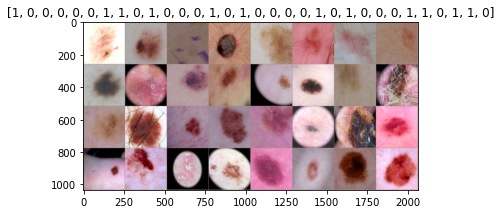

In [23]:
# Visualize a batch of training data
batch = next(iter(dataloaders['train']))
inputs = batch["image"]
classes = batch["label"]

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[x.item() for x in classes])

# Training & Evaluation

## ResNet

### 1. ResNet50 (Baseline)

#### Train

* **Tensorboard writer**

In [ ]:
logging.basicConfig(filename="/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/resnet50/resnet50_bce_adam.txt", level=logging.INFO,
                        format='[%(asctime)s.%(msecs)03d] %(message)s', datefmt='%H:%M:%S', force=True)
logging.getLogger().addHandler(logging.StreamHandler(sys.stdout))
writer_path = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/resnet50'

* **Parameters**

In [ ]:
# Parameters 
DEVICE = "cuda" if torch.cuda.is_available() else "cpu" # Device used
print('Device available:', DEVICE)

WD = 1e-8  # weight decay
LR = 1e-4  # learning rate
LR_PATIENCE = 7  # learning rate patience
ES_PATIENCE = 15  # early stopping patience
EPOCHS = 100  # maximum number of epochs

In [ ]:
# Number of samples in each set
dataset_sizes = {
    'train': len(dataset_train),
    'val':len(dataset_val),
}

* **Make model**

In [ ]:
resnet = make_resnet(True, DEVICE)  # True for pre-trained weights
criterion = nn.BCEWithLogitsLoss()  # Binary Cross-Entropy loss function
optimizer = optim.Adam(resnet.parameters(), lr = LR, weight_decay=WD)  
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience= LR_PATIENCE, factor = 0.5, mode="min")

In [ ]:
logging.info('Model:Resnet50, LR: 1e-4, LR patience = 7, loss: BCE, optim: ADAM, lr_sched: ReduceOnPlat, WD = 1e-8')

* **Train model**

In [ ]:
# Train model
checkpoint_p = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/resnet50_bce_adam.pth'
resnet = train_model(resnet, dataloaders, criterion, optimizer, lr_scheduler, checkpoint_p, early_stop_patience=ES_PATIENCE, num_epochs=EPOCHS, writer_path=writer_path)

In [ ]:
# Save best model
torch.save(resnet.state_dict(), '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/resnet50_best.pth')

#### Test

* **Load model**

In [ ]:
resnet_val = make_resnet50(False, DEVICE)
resnet_val.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/resnet50_best.pth'))

<All keys matched successfully>

* **Evaluate model on validation set**

In [ ]:
val_loss_, val_acc_, val_kappa_ = test_model(resnet_val, val_loader, DEVICE, criterion)

100%|██████████| 60/60 [01:15<00:00,  1.25s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], 

In [ ]:
logging.info('Final val loss: %.4f, acc: %.4f, kappa: %.4f' % (val_loss_, val_acc_, val_kappa_))

Final val loss: 0.3476, acc: 0.9094


* **Visualize results**

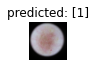

Actual: 1, predicted: [1]


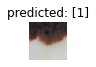

Actual: 1, predicted: [1]


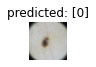

Actual: 0, predicted: [0]


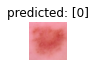

Actual: 0, predicted: [0]


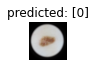

Actual: 1, predicted: [0]


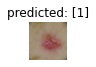

Actual: 1, predicted: [1]


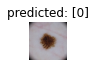

Actual: 1, predicted: [0]


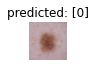

Actual: 0, predicted: [0]


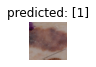

Actual: 1, predicted: [1]


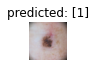

Actual: 1, predicted: [1]


In [ ]:
# Shuffle validation set and plot some of its results
val_loader_shuffled = DataLoader(dataset_val, batch_size=VAL_BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=True)
visualize_model(resnet_val, val_loader_shuffled, DEVICE, num_images=10)

### 2. ResNet34

#### Train

* **Tensorboard writer**

In [ ]:
logging.basicConfig(filename="/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/resnet34/resnet34_bce_adam.txt", level=logging.INFO,
                        format='[%(asctime)s.%(msecs)03d] %(message)s', datefmt='%H:%M:%S', force=True)
logging.getLogger().addHandler(logging.StreamHandler(sys.stdout))
writer_path = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/resnet34'

* **Parameters**

In [ ]:
# Parameters 
DEVICE = "cuda" if torch.cuda.is_available() else "cpu" # Device used
print('Device available:', DEVICE)

WD = 1e-8  # weight decay
LR = 1e-4  # learning rate
LR_PATIENCE = 7  # learning rate patience
ES_PATIENCE = 15  # early stopping patience
EPOCHS = 100  # maximum number of epochs

Device available: cuda


In [ ]:
#number of samples in each set
dataset_sizes = {
    'train': len(dataset_train),
    'val':len(dataset_val),
}

* **Make model**

In [ ]:
resnet = make_resnet34(True, DEVICE)  # True for pre-trained weights
criterion = nn.BCEWithLogitsLoss()  # Binary Cross-Entropy loss function
optimizer = optim.Adam(resnet.parameters(), lr = LR, weight_decay=WD)
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience= LR_PATIENCE, factor = 0.5, mode="min")

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

In [ ]:
logging.info('Model:Resnet34, LR: 1e-4, LR patience = 7, loss: BCE, optim: ADAM, lr_sched: ReduceOnPlat, WD = 1e-8')

Model:Resnet34, LR: 1e-4, LR patience = 7, loss: BCE, optim: ADAM, lr_sched: ReduceOnPlat, WD = 1e-8


* **Train model**

In [ ]:
# Train model 
checkpoint_p = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/resnet34_bce_adam.pth'
resnet = train_model(resnet, dataloaders, criterion, optimizer, lr_scheduler, checkpoint_p, early_stop_patience=ES_PATIENCE, num_epochs=EPOCHS, writer_path=writer_path) #, load_checkpoint = checkpoint_p)

In [ ]:
# Save best model 
torch.save(resnet.state_dict(), '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/resnet34_best.pth')

#### Test

* **Load model**

In [ ]:
resnet_val = make_resnet34(False, DEVICE)
resnet_val.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/resnet34_best.pth'))

<All keys matched successfully>

* **Evaluate model on validation set**

In [ ]:
val_loss_, val_acc_, val_kappa_ = test_model(resnet_val, val_loader, DEVICE, criterion)

100%|██████████| 60/60 [01:15<00:00,  1.25s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], 

In [ ]:
logging.info('Final val loss: %.4f, acc: %.4f, kappa: %.4f' % (val_loss_, val_acc_, val_kappa_))

Final val loss: 0.3476, acc: 0.9094


* **Visualize results**

In [ ]:
# Shuffle validation set and plot some of its results
val_loader_shuffled = DataLoader(dataset_val, batch_size=VAL_BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=True)
visualize_model(resnet_val, val_loader_shuffled, DEVICE, num_images=10)

## ResNeXt

### 1. ResNeXt50

#### Train

* **Tensorboard writer**

In [ ]:
logging.basicConfig(filename="/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/resnext50/resnext50_bce_adam.txt", level=logging.INFO,
                        format='[%(asctime)s.%(msecs)03d] %(message)s', datefmt='%H:%M:%S', force=True)
logging.getLogger().addHandler(logging.StreamHandler(sys.stdout))
writer_path = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/resnext50'

* **Parameters**

In [ ]:
# Parameters 
DEVICE = "cuda" if torch.cuda.is_available() else "cpu" # Device used
print('Device available:', DEVICE)

WD = 1e-8  # weight decay
LR = 1e-4  # learning rate
LR_PATIENCE = 7  # learning rate patience
ES_PATIENCE = 15  # early stopping patience
EPOCHS = 100  # maximum number of epochs

Device available: cuda


In [ ]:
#number of samples in each set
dataset_sizes = {
    'train': len(dataset_train),
    'val':len(dataset_val),
}

* **Make model**

In [ ]:
resnext = make_resnext_50(True, DEVICE)  # True for pre-trained weights
criterion = nn.BCEWithLogitsLoss()  # Binary Cross-Entropy loss function
optimizer = optim.Adam(resnext.parameters(), lr = LR, weight_decay=WD)
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience= LR_PATIENCE, factor = 0.5, mode="min")

In [ ]:
logging.info('Model:Resnext50, LR: 1e-4, LR patience = 7, loss: BCE, optim: ADAM, lr_sched: ReduceOnPlat, WD = 1e-8')

Model:Resnext50, LR: 1e-4, LR patience = 7, loss: BCE, optim: ADAM, lr_sched: ReduceOnPlat, WD = 1e-8


* **Train model**

In [ ]:
# Train model
checkpoint_p = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/resnext50_bce_adam.pth'
resnext = train_model(resnext, dataloaders, criterion, optimizer, lr_scheduler, checkpoint_p, early_stop_patience=ES_PATIENCE, num_epochs=EPOCHS, writer_path=writer_path)

Epoch 1/100
---------------


100%|██████████| 475/475 [06:52<00:00,  1.15it/s]


 preds: [[0], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [0], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [0], [0], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [0], [1], [0], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [0], [0], [1], [1], [1], [1], [0], [1], [1], [0], [0], [1], [0], [0], [0], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [0], [0], [1], [0], [1], [1], [0], [1], [0], [0], [0], [1], [1], [0], [1], [1], [1], [1], [1], [0], [0], [0], [0], [1], [0], [1], [1], [1], [0], [1], [0], [0], [0], [1], [1], [0], [1], [1], [0], [0], [1], [0], [1], [1], [0], [1], [1], [1], [1], [0], [0], [1], [0], [1], [1], [1], [0], [1], [1], [0], [0], [0], [0], [1], [1], [1], [1], [0], [0], [1], [0], [0], [1], [1], [1], [1], [0], [0], [0], [1], [0], [0], [1], [1], [1], [1], [1], [0], [0], [1], [1], [1], [1], [0], [1], [1], [1], 


100%|██████████| 60/60 [01:20<00:00,  1.34s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 2/100
---------------


100%|██████████| 475/475 [06:39<00:00,  1.19it/s]



 preds: [[1], [1], [1], [1], [1], [0], [0], [0], [0], [0], [1], [1], [1], [0], [1], [0], [1], [0], [0], [0], [1], [0], [0], [1], [0], [0], [0], [0], [1], [1], [0], [0], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [0], [1], [0], [1], [1], [1], [0], [0], [0], [1], [0], [0], [1], [1], [0], [1], [0], [0], [0], [0], [0], [1], [1], [0], [0], [1], [1], [0], [0], [0], [1], [0], [1], [1], [0], [1], [0], [0], [0], [0], [1], [1], [1], [0], [0], [0], [1], [0], [0], [1], [0], [0], [1], [0], [1], [1], [0], [1], [0], [1], [0], [0], [0], [1], [0], [0], [0], [0], [1], [0], [0], [0], [1], [0], [1], [1], [0], [0], [0], [0], [0], [1], [1], [1], [0], [1], [0], [1], [1], [1], [0], [0], [1], [1], [0], [1], [0], [1], [1], [0], [0], [1], [1], [0], [1], [1], [0], [0], [0], [0], [0], [0], [1], [0], [0], [0], [0], [1], [1], [0], [1], [0], [0], [0], [0], [0], [0], [1], [1], [1], [0], [0], [0], [0], [0], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [0], [1], [0], [0], [0], [1], [0], [1], [0], 

100%|██████████| 60/60 [01:21<00:00,  1.35s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 3/100
---------------


100%|██████████| 475/475 [06:39<00:00,  1.19it/s]



 preds: [[0], [1], [0], [1], [0], [0], [1], [0], [0], [1], [0], [1], [1], [0], [1], [1], [1], [1], [0], [1], [0], [1], [1], [0], [1], [0], [1], [0], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [1], [1], [1], [0], [0], [0], [0], [0], [1], [1], [0], [0], [0], [1], [1], [1], [0], [1], [0], [0], [1], [0], [0], [0], [1], [1], [1], [1], [0], [0], [0], [0], [1], [0], [1], [1], [1], [0], [1], [0], [1], [0], [1], [1], [0], [1], [0], [0], [0], [1], [0], [0], [1], [1], [0], [0], [1], [1], [0], [0], [0], [1], [1], [1], [1], [0], [1], [1], [1], [0], [1], [1], [0], [0], [0], [1], [0], [0], [0], [0], [0], [1], [0], [1], [0], [1], [1], [0], [0], [0], [1], [0], [0], [1], [0], [1], [0], [0], [0], [1], [1], [1], [0], [1], [1], [1], [0], [1], [0], [0], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [0], [0], [0], [1], [0], [0], [0], [1], [1], [1], [1], [1], [1], [0], [0], [1], [0], [0], [1], [0], [0], [1], [0], [1], [0], [0], [1], [1], [1], [0], [1], [1], [0], [1], [0], [0], [0], [0], 

100%|██████████| 60/60 [01:19<00:00,  1.33s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 4/100
---------------


100%|██████████| 475/475 [06:41<00:00,  1.18it/s]



 preds: [[1], [1], [1], [1], [1], [0], [0], [0], [0], [0], [0], [1], [0], [1], [0], [0], [0], [1], [1], [1], [0], [0], [0], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [0], [1], [0], [1], [0], [1], [1], [0], [0], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [1], [1], [0], [1], [0], [0], [0], [0], [0], [0], [1], [0], [1], [0], [0], [1], [1], [1], [0], [0], [0], [1], [1], [0], [0], [0], [0], [1], [0], [1], [0], [0], [1], [1], [1], [1], [1], [0], [0], [1], [0], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [0], [0], [0], [1], [0], [0], [1], [0], [0], [0], [0], [1], [0], [1], [1], [0], [1], [1], [0], [0], [0], [0], [1], [1], [0], [1], [1], [0], [0], [0], [0], [0], [0], [1], [0], [1], [1], [0], [1], [0], [0], [0], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [1], [0], [1], [1], [0], [0], [1], [0], [0], [1], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [1], [1], [1], [1], [0], [1], [0], [1], [0], [0], [1], [1], [1], [1], [1], [0], [1], [0], [1], 

100%|██████████| 60/60 [01:20<00:00,  1.34s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 5/100
---------------


100%|██████████| 475/475 [06:41<00:00,  1.18it/s]



 preds: [[1], [1], [1], [0], [0], [1], [1], [0], [0], [1], [1], [0], [1], [0], [0], [1], [0], [1], [1], [1], [1], [1], [1], [0], [0], [0], [0], [1], [0], [1], [1], [1], [0], [0], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [0], [1], [1], [1], [0], [0], [0], [0], [0], [0], [0], [1], [0], [0], [0], [0], [1], [0], [0], [1], [0], [1], [1], [0], [0], [0], [0], [1], [0], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [0], [0], [0], [1], [0], [1], [0], [1], [1], [0], [0], [0], [1], [0], [1], [1], [0], [0], [0], [1], [0], [0], [1], [0], [0], [0], [1], [1], [1], [1], [1], [1], [0], [0], [1], [0], [1], [1], [1], [0], [0], [0], [1], [0], [1], [0], [1], [1], [0], [0], [1], [0], [1], [0], [0], [1], [0], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [0], [0], [0], [0], [1], [0], [0], [0], [1], [1], [0], [0], [0], [0], [0], [0], [1], [0], [0], [1], [0], [1], [1], [1], [1], [1], [0], [0], [1], [0], [1], [1], [1], [0], [0], [1], [0], [0], [0], [1], [1], [1], [0], [1], [1], 

100%|██████████| 60/60 [01:21<00:00,  1.35s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], 


Epoch 6/100
---------------


100%|██████████| 475/475 [06:37<00:00,  1.19it/s]



 preds: [[1], [0], [1], [0], [0], [0], [1], [0], [0], [1], [1], [0], [1], [0], [0], [1], [0], [0], [1], [0], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [0], [0], [1], [1], [1], [1], [0], [0], [0], [0], [1], [1], [0], [0], [0], [0], [1], [0], [0], [1], [1], [0], [1], [1], [1], [0], [0], [0], [0], [0], [0], [1], [1], [0], [0], [1], [0], [0], [0], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [0], [0], [1], [0], [1], [1], [0], [0], [1], [0], [0], [1], [0], [0], [1], [0], [0], [1], [0], [0], [1], [0], [0], [0], [0], [1], [0], [0], [1], [1], [0], [1], [0], [1], [0], [1], [0], [1], [1], [1], [1], [1], [0], [0], [0], [0], [0], [0], [1], [1], [0], [0], [0], [0], [1], [0], [0], [1], [0], [0], [0], [0], [0], [1], [0], [0], [1], [0], [0], [1], [1], [0], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [0], [0], [1], [0], [1], [0], [0], [0], [1], [0], [0], [0], [1], [1], [0], [1], [1], [0], [0], [1], [0], [1], [1], [1], [1], [1], [0], [0], [0], [0], [1], [0], [0], [0], [1], [0], [1], 

100%|██████████| 60/60 [01:18<00:00,  1.31s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 7/100
---------------


100%|██████████| 475/475 [06:39<00:00,  1.19it/s]



 preds: [[0], [1], [1], [1], [0], [0], [1], [0], [1], [0], [1], [1], [1], [1], [0], [0], [0], [0], [0], [0], [1], [0], [0], [0], [1], [0], [1], [1], [0], [1], [0], [0], [1], [1], [1], [0], [1], [1], [0], [1], [0], [0], [0], [1], [0], [0], [1], [0], [1], [0], [0], [0], [1], [0], [0], [1], [1], [0], [0], [1], [0], [0], [0], [0], [0], [0], [1], [1], [1], [0], [0], [1], [1], [0], [0], [0], [0], [1], [1], [0], [0], [1], [0], [1], [1], [1], [0], [1], [0], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [0], [1], [0], [1], [1], [0], [0], [1], [0], [0], [1], [1], [0], [0], [0], [0], [1], [1], [1], [0], [1], [1], [1], [0], [1], [0], [1], [0], [0], [0], [0], [0], [0], [1], [0], [1], [0], [1], [1], [0], [1], [0], [1], [0], [1], [0], [1], [0], [1], [1], [1], [0], [1], [0], [0], [0], [1], [1], [1], [0], [0], [1], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [0], [0], [1], [0], [1], [0], [0], [1], [1], [1], [0], [0], [1], [1], [1], [0], [0], [1], [0], [0], [1], [1], [1], [1], [1], [0], [0], 

100%|██████████| 60/60 [01:19<00:00,  1.32s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 8/100
---------------


100%|██████████| 475/475 [06:36<00:00,  1.20it/s]



 preds: [[1], [0], [1], [0], [0], [1], [1], [0], [0], [1], [1], [1], [0], [1], [1], [1], [0], [1], [0], [1], [1], [0], [1], [1], [0], [0], [1], [1], [1], [0], [0], [0], [0], [0], [0], [0], [0], [0], [1], [0], [0], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [0], [0], [0], [0], [0], [0], [1], [1], [1], [1], [1], [0], [0], [0], [0], [1], [0], [0], [0], [0], [1], [0], [1], [1], [0], [0], [0], [1], [1], [1], [1], [0], [1], [0], [0], [1], [0], [0], [1], [1], [1], [1], [1], [1], [1], [1], [0], [0], [1], [0], [0], [0], [1], [1], [0], [0], [1], [0], [1], [1], [0], [0], [0], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [0], [1], [0], [0], [1], [1], [0], [1], [0], [1], [1], [0], [1], [0], [1], [1], [0], [1], [0], [0], [1], [0], [0], [1], [1], [1], [1], [0], [0], [1], [0], [1], [1], [1], [0], [0], [1], [1], [0], [0], [1], [1], [0], [1], [0], [0], [1], [0], [1], [0], [0], [1], [0], [0], [1], [1], [0], [1], [1], [0], [0], [1], [1], [0], [1], [0], [1], [0], [0], [1], [1], [1], [0], [1], 

100%|██████████| 60/60 [01:20<00:00,  1.34s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 9/100
---------------


100%|██████████| 475/475 [06:38<00:00,  1.19it/s]



 preds: [[1], [1], [1], [0], [0], [1], [0], [1], [0], [1], [0], [1], [0], [1], [0], [1], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [1], [1], [0], [1], [1], [0], [0], [1], [1], [1], [0], [1], [0], [0], [1], [1], [0], [0], [0], [0], [0], [1], [1], [1], [1], [0], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [0], [1], [1], [0], [0], [0], [1], [1], [1], [0], [1], [1], [0], [0], [1], [1], [1], [0], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [0], [0], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [1], [0], [1], [1], [0], [0], [0], [0], [0], [0], [0], [0], [0], [1], [0], [1], [0], [1], [0], [1], [1], [0], [0], [0], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [0], [1], [1], [0], [1], [0], [0], [0], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [1], [1], [1], [0], [0], [1], [0], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [0], [0], [1], [1], [1], [0], [0], [0], [1], [1], [0], [0], [0], [0], [1], [1], [0], [0], [0], [0], 

100%|██████████| 60/60 [01:19<00:00,  1.33s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 10/100
---------------


100%|██████████| 475/475 [06:38<00:00,  1.19it/s]



 preds: [[0], [0], [0], [1], [1], [0], [0], [1], [1], [0], [1], [0], [0], [0], [0], [1], [1], [1], [1], [0], [0], [1], [1], [1], [0], [1], [0], [0], [0], [0], [0], [1], [1], [1], [1], [1], [0], [0], [1], [1], [1], [0], [1], [0], [0], [0], [0], [0], [1], [1], [1], [1], [0], [0], [0], [1], [0], [0], [0], [0], [0], [1], [0], [1], [1], [0], [1], [1], [0], [0], [1], [0], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [1], [1], [0], [1], [1], [1], [0], [1], [0], [1], [1], [0], [0], [1], [0], [0], [0], [1], [1], [0], [0], [1], [1], [0], [1], [1], [0], [0], [0], [1], [1], [1], [1], [0], [0], [0], [0], [0], [1], [0], [0], [1], [0], [1], [0], [0], [0], [0], [1], [0], [0], [0], [1], [0], [1], [0], [1], [0], [1], [1], [0], [1], [1], [1], [1], [1], [1], [0], [0], [1], [0], [1], [1], [0], [1], [1], [0], [1], [0], [1], [1], [1], [1], [1], [0], [1], [0], [0], [1], [1], [0], [1], [0], [1], [1], [0], [0], [1], [1], [0], [1], [0], [0], [0], [0], [1], [0], [0], 

100%|██████████| 60/60 [01:18<00:00,  1.31s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 11/100
---------------


100%|██████████| 475/475 [06:45<00:00,  1.17it/s]



 preds: [[1], [1], [1], [0], [0], [0], [0], [1], [0], [1], [0], [0], [0], [1], [1], [1], [1], [0], [0], [1], [0], [0], [0], [1], [0], [0], [1], [0], [0], [1], [1], [0], [1], [1], [1], [1], [0], [1], [0], [1], [0], [0], [1], [0], [0], [0], [0], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [0], [0], [1], [1], [1], [0], [0], [0], [1], [1], [0], [0], [1], [0], [0], [1], [1], [1], [0], [1], [0], [1], [0], [1], [1], [1], [1], [1], [1], [0], [1], [1], [0], [1], [0], [1], [0], [1], [1], [1], [0], [1], [1], [0], [0], [1], [1], [0], [0], [0], [0], [1], [0], [0], [1], [1], [0], [0], [1], [1], [0], [1], [0], [1], [0], [0], [0], [0], [0], [0], [0], [1], [1], [1], [0], [0], [0], [1], [0], [0], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [0], [0], [0], [0], [0], [0], [0], [0], [1], [0], [0], [1], [0], [1], [0], [0], [0], [1], [0], [0], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [0], [0], [1], [1], [0], [0], [1], [1], [1], [0], [1], [0], [0], [0], [0], [0], [0], 

100%|██████████| 60/60 [01:18<00:00,  1.32s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 12/100
---------------


100%|██████████| 475/475 [06:43<00:00,  1.18it/s]



 preds: [[0], [0], [1], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [0], [0], [1], [1], [0], [0], [0], [0], [0], [1], [0], [1], [0], [1], [1], [1], [0], [0], [0], [1], [0], [0], [0], [1], [0], [1], [0], [0], [1], [0], [0], [1], [1], [0], [1], [1], [1], [0], [0], [0], [0], [1], [0], [1], [1], [0], [1], [0], [0], [1], [1], [1], [0], [0], [1], [1], [0], [1], [1], [0], [1], [0], [1], [0], [1], [1], [0], [1], [1], [0], [1], [1], [0], [0], [0], [1], [1], [0], [0], [1], [0], [1], [1], [0], [0], [1], [0], [1], [1], [1], [0], [1], [1], [0], [0], [1], [0], [1], [0], [1], [0], [0], [1], [0], [1], [1], [0], [1], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [0], [0], [0], [0], [0], [0], [1], [0], [1], [1], [1], [1], [1], [1], [0], [0], [0], [1], [0], [1], [1], [1], [1], [1], [0], [1], [0], [0], [1], [0], [1], [1], [0], [1], [1], [1], [0], [0], [1], [0], [1], [0], [1], [0], [1], [1], [1], [0], [0], [1], [0], [1], [0], [1], [0], [0], [0], [0], [0], [1], [0], [0], [1], [0], [1], [0], [0], 

100%|██████████| 60/60 [01:19<00:00,  1.32s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 13/100
---------------


100%|██████████| 475/475 [06:45<00:00,  1.17it/s]



 preds: [[1], [0], [0], [0], [0], [1], [0], [1], [1], [1], [0], [1], [0], [0], [0], [1], [1], [0], [1], [0], [1], [1], [0], [0], [1], [1], [0], [1], [0], [0], [1], [0], [0], [0], [1], [0], [0], [1], [0], [1], [1], [0], [0], [1], [1], [1], [1], [0], [1], [0], [0], [1], [1], [1], [1], [1], [1], [1], [0], [0], [0], [0], [0], [1], [0], [1], [0], [0], [1], [1], [0], [1], [0], [1], [0], [0], [0], [0], [1], [0], [0], [0], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [0], [0], [1], [0], [0], [1], [0], [1], [1], [0], [1], [0], [0], [1], [1], [1], [0], [0], [1], [0], [1], [0], [0], [0], [1], [1], [0], [0], [0], [0], [1], [1], [1], [0], [0], [1], [1], [0], [1], [1], [0], [1], [0], [1], [0], [1], [0], [0], [1], [1], [1], [1], [1], [1], [1], [0], [1], [0], [0], [1], [1], [1], [1], [1], [0], [0], [0], [1], [1], [0], [1], [1], [0], [1], [0], [1], [0], [1], [1], [0], [0], [0], [1], [1], [1], [0], [1], [1], [1], [0], [1], [0], [0], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [1], [1], [0], 

100%|██████████| 60/60 [01:19<00:00,  1.33s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 14/100
---------------


100%|██████████| 475/475 [06:46<00:00,  1.17it/s]



 preds: [[0], [1], [0], [1], [1], [0], [1], [1], [1], [0], [1], [0], [0], [0], [1], [0], [1], [0], [0], [1], [0], [1], [1], [0], [1], [0], [0], [1], [0], [0], [0], [1], [1], [0], [0], [0], [1], [1], [1], [1], [0], [1], [1], [0], [1], [0], [0], [0], [0], [0], [0], [1], [1], [0], [1], [1], [0], [0], [1], [0], [0], [0], [1], [0], [1], [0], [1], [1], [1], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [0], [0], [0], [1], [0], [0], [0], [0], [1], [0], [0], [0], [1], [0], [1], [1], [1], [1], [0], [0], [1], [0], [0], [0], [0], [1], [1], [1], [1], [0], [0], [1], [1], [1], [1], [0], [1], [1], [0], [0], [1], [0], [1], [0], [1], [1], [1], [1], [0], [0], [1], [0], [0], [0], [0], [1], [1], [0], [0], [1], [0], [1], [1], [1], [0], [1], [0], [1], [1], [0], [1], [1], [0], [1], [1], [0], [0], [1], [0], [1], [0], [1], [1], [0], [0], [1], [1], [1], [0], [0], [1], [1], [1], [0], [0], [1], [1], [0], [0], [0], [1], [1], [0], [1], [0], [1], [0], [1], [1], [0], [1], [0], [0], [1], [0], [1], [0], [0], [1], 

100%|██████████| 60/60 [01:19<00:00,  1.33s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 15/100
---------------


100%|██████████| 475/475 [06:45<00:00,  1.17it/s]



 preds: [[1], [0], [1], [0], [1], [1], [0], [1], [1], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [1], [0], [0], [0], [0], [1], [0], [1], [1], [0], [0], [1], [1], [1], [1], [0], [1], [0], [0], [1], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [1], [0], [0], [1], [1], [0], [0], [1], [1], [1], [1], [0], [1], [0], [0], [1], [0], [0], [1], [0], [1], [0], [1], [0], [0], [0], [1], [1], [0], [0], [1], [0], [1], [0], [0], [0], [1], [0], [0], [0], [1], [0], [0], [1], [0], [0], [0], [1], [0], [0], [0], [0], [1], [1], [1], [1], [1], [0], [0], [1], [0], [1], [0], [0], [1], [1], [0], [0], [0], [0], [0], [0], [1], [0], [0], [0], [0], [0], [1], [1], [1], [1], [0], [1], [0], [1], [0], [0], [1], [1], [0], [0], [1], [0], [1], [0], [1], [0], [1], [0], [1], [1], [0], [0], [1], [1], [0], [0], [1], [1], [1], [0], [0], [1], [0], [1], [0], [0], [1], [0], [0], [0], [0], [0], [1], [0], [1], [1], [0], [0], [0], [0], [1], [0], [1], [0], [0], [0], 

100%|██████████| 60/60 [01:19<00:00,  1.32s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 16/100
---------------


100%|██████████| 475/475 [06:46<00:00,  1.17it/s]



 preds: [[1], [1], [1], [1], [1], [0], [1], [1], [0], [1], [1], [0], [0], [1], [0], [1], [0], [1], [1], [1], [1], [1], [0], [0], [0], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [0], [1], [1], [1], [0], [0], [0], [1], [1], [1], [0], [0], [0], [0], [0], [0], [1], [0], [1], [0], [0], [1], [0], [1], [1], [1], [0], [1], [1], [1], [1], [0], [0], [0], [1], [0], [0], [1], [1], [0], [1], [1], [1], [0], [0], [1], [1], [0], [0], [1], [1], [1], [1], [1], [0], [0], [1], [1], [1], [1], [1], [0], [0], [0], [1], [0], [0], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [0], [0], [1], [0], [0], [0], [1], [0], [1], [0], [1], [1], [1], [1], [0], [0], [1], [1], [0], [1], [1], [0], [0], [0], [1], [0], [0], [1], [1], [1], [1], [1], [0], [0], [0], [1], [1], [0], [0], [1], [1], [1], [1], [0], [1], [0], [0], [0], [1], [0], [0], [1], [0], [0], [1], [0], [1], [1], [1], [1], [1], [0], [0], [1], [0], [1], [1], [1], [1], [1], [1], [0], [0], [0], [1], [0], [1], [1], [0], [0], [0], [0], [1], 

100%|██████████| 60/60 [01:20<00:00,  1.35s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [0], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 17/100
---------------


100%|██████████| 475/475 [06:47<00:00,  1.17it/s]



 preds: [[1], [0], [0], [0], [1], [1], [0], [0], [0], [0], [0], [0], [1], [0], [1], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [1], [1], [0], [1], [0], [1], [0], [0], [0], [0], [0], [1], [0], [1], [1], [0], [0], [0], [0], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [1], [1], [1], [0], [0], [1], [1], [1], [1], [0], [0], [1], [1], [0], [0], [0], [0], [0], [0], [0], [1], [1], [0], [1], [0], [0], [0], [1], [1], [0], [0], [1], [1], [0], [1], [1], [1], [1], [1], [1], [0], [0], [1], [0], [1], [0], [1], [0], [1], [1], [0], [1], [0], [0], [0], [0], [1], [1], [0], [1], [1], [1], [0], [0], [0], [1], [1], [1], [1], [1], [0], [0], [0], [0], [1], [0], [0], [0], [0], [1], [0], [0], [1], [0], [1], [0], [1], [0], [0], [1], [0], [1], [0], [1], [0], [1], [0], [0], [1], [1], [1], [1], [0], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [1], [1], [0], [1], [1], [1], [1], [0], [0], [0], [0], [0], [1], [0], [1], [0], [1], [1], [1], [0], [0], [0], [1], [0], [0], [1], [1], [0], [1], [0], [0], 

100%|██████████| 60/60 [01:21<00:00,  1.35s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 18/100
---------------


100%|██████████| 475/475 [06:44<00:00,  1.17it/s]



 preds: [[0], [1], [1], [1], [1], [0], [0], [0], [0], [0], [1], [0], [0], [0], [0], [0], [0], [1], [1], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [0], [0], [1], [1], [0], [1], [0], [1], [0], [0], [0], [0], [0], [1], [0], [0], [0], [0], [1], [1], [1], [0], [1], [1], [0], [1], [0], [1], [0], [0], [0], [0], [1], [0], [0], [0], [1], [1], [1], [1], [1], [0], [0], [0], [1], [0], [0], [1], [0], [1], [0], [1], [0], [1], [0], [0], [0], [0], [0], [0], [1], [1], [0], [1], [0], [0], [1], [0], [1], [0], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [0], [0], [0], [1], [1], [0], [0], [0], [0], [0], [1], [0], [0], [1], [0], [0], [1], [1], [0], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [0], [0], [1], [1], [1], [0], [0], [0], [0], [1], [1], [0], [0], [1], [1], [0], [0], [0], [0], [1], [1], [1], [1], [0], [0], [1], [0], [0], [0], [1], [0], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [0], [1], [0], [1], [0], [1], [1], [1], [1], [0], [0], [1], 

100%|██████████| 60/60 [01:21<00:00,  1.36s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 19/100
---------------


100%|██████████| 475/475 [06:48<00:00,  1.16it/s]



 preds: [[1], [0], [0], [0], [1], [0], [0], [0], [0], [1], [0], [0], [1], [1], [1], [1], [0], [0], [0], [1], [1], [1], [0], [1], [1], [0], [1], [1], [1], [1], [1], [1], [0], [0], [0], [0], [0], [1], [1], [0], [0], [0], [0], [0], [0], [1], [0], [1], [0], [1], [1], [1], [0], [1], [1], [1], [0], [1], [0], [1], [1], [0], [0], [0], [0], [1], [1], [1], [0], [0], [1], [0], [1], [0], [0], [0], [1], [0], [0], [0], [0], [1], [1], [1], [0], [1], [0], [1], [1], [1], [0], [1], [1], [0], [0], [0], [1], [0], [1], [1], [0], [0], [1], [1], [1], [0], [1], [0], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [1], [1], [1], [0], [0], [1], [0], [0], [0], [0], [0], [1], [0], [1], [1], [1], [1], [0], [1], [1], [0], [1], [0], [1], [1], [1], [0], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [0], [0], [0], [1], [1], [1], [1], [0], [1], [1], [0], [0], [1], [0], [0], [1], [0], [1], [0], [0], [1], [0], [0], [1], [0], [0], [0], [1], [1], [0], [0], [0], [0], [0], [1], [1], [1], [0], [1], [0], [0], 

100%|██████████| 60/60 [01:20<00:00,  1.34s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 20/100
---------------


100%|██████████| 475/475 [06:44<00:00,  1.18it/s]



 preds: [[1], [0], [1], [0], [0], [0], [0], [0], [1], [1], [1], [1], [0], [1], [1], [0], [1], [1], [0], [0], [1], [1], [0], [0], [0], [1], [1], [0], [0], [1], [1], [1], [0], [1], [1], [0], [0], [0], [0], [1], [0], [0], [1], [1], [1], [0], [1], [0], [1], [0], [1], [0], [1], [0], [1], [0], [1], [0], [0], [1], [1], [1], [0], [0], [0], [1], [0], [1], [0], [0], [1], [1], [1], [0], [1], [0], [1], [1], [1], [0], [1], [0], [0], [0], [0], [0], [0], [1], [0], [0], [1], [1], [1], [0], [0], [0], [0], [0], [0], [0], [1], [1], [1], [1], [0], [0], [1], [1], [1], [1], [1], [1], [0], [1], [1], [0], [1], [0], [1], [0], [0], [1], [0], [1], [0], [1], [1], [1], [0], [1], [1], [0], [0], [1], [1], [0], [1], [0], [0], [1], [0], [0], [0], [0], [0], [0], [1], [1], [0], [1], [0], [1], [1], [1], [0], [0], [0], [1], [1], [0], [1], [1], [1], [1], [0], [0], [1], [0], [1], [1], [0], [1], [0], [1], [0], [0], [0], [1], [1], [1], [1], [0], [1], [0], [0], [1], [1], [0], [1], [1], [0], [1], [0], [1], [1], [0], [0], [1], 

100%|██████████| 60/60 [01:19<00:00,  1.33s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 21/100
---------------


100%|██████████| 475/475 [06:43<00:00,  1.18it/s]



 preds: [[0], [1], [0], [1], [0], [1], [0], [0], [0], [1], [1], [1], [1], [1], [1], [1], [0], [0], [1], [0], [1], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [1], [1], [0], [1], [0], [1], [0], [0], [1], [1], [1], [0], [0], [1], [0], [0], [0], [0], [0], [1], [0], [0], [1], [0], [0], [0], [1], [0], [1], [1], [0], [1], [1], [1], [0], [0], [0], [1], [1], [1], [1], [1], [0], [1], [0], [1], [0], [0], [1], [0], [0], [0], [0], [1], [1], [0], [0], [1], [1], [1], [1], [0], [0], [1], [1], [1], [1], [0], [0], [0], [1], [0], [1], [1], [1], [1], [0], [0], [1], [0], [0], [1], [0], [0], [0], [1], [1], [0], [0], [0], [1], [0], [1], [0], [0], [0], [1], [0], [0], [1], [1], [0], [1], [1], [1], [1], [0], [0], [0], [1], [0], [0], [0], [0], [1], [1], [1], [0], [0], [0], [0], [1], [1], [1], [0], [1], [0], [1], [1], [1], [0], [1], [1], [0], [0], [1], [1], [1], [1], [0], [1], [1], [1], [0], [0], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [0], [0], [0], [0], [0], [0], [1], 

100%|██████████| 60/60 [01:19<00:00,  1.33s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 22/100
---------------


100%|██████████| 475/475 [06:44<00:00,  1.18it/s]



 preds: [[0], [0], [1], [1], [0], [1], [0], [0], [1], [1], [1], [0], [1], [0], [1], [1], [0], [0], [0], [0], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [0], [0], [0], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [0], [0], [1], [0], [1], [1], [0], [0], [1], [0], [0], [1], [1], [1], [1], [1], [1], [0], [0], [0], [0], [1], [0], [0], [0], [1], [0], [0], [1], [0], [1], [1], [0], [0], [0], [1], [1], [1], [0], [0], [1], [1], [1], [0], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [0], [1], [0], [0], [1], [0], [1], [1], [0], [0], [0], [0], [0], [1], [1], [1], [1], [0], [1], [1], [0], [1], [0], [1], [0], [0], [1], [0], [1], [0], [1], [1], [1], [0], [1], [0], [1], [1], [0], [1], [1], [0], [0], [1], [0], [0], [0], [0], [1], [0], [0], [0], [1], [1], [1], [1], [0], [1], [0], [1], [0], [0], [1], [0], [0], [1], [0], [1], [1], [0], [0], [0], [1], [1], [1], [0], [1], [1], [1], [0], [0], [1], [1], [1], [1], 

100%|██████████| 60/60 [01:19<00:00,  1.32s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 23/100
---------------


100%|██████████| 475/475 [06:42<00:00,  1.18it/s]



 preds: [[1], [0], [0], [0], [0], [1], [1], [1], [0], [1], [0], [1], [0], [1], [0], [1], [1], [1], [1], [1], [1], [0], [0], [1], [0], [1], [0], [1], [1], [1], [1], [1], [1], [0], [0], [1], [0], [0], [1], [1], [1], [0], [0], [0], [0], [1], [1], [1], [1], [1], [1], [1], [0], [0], [1], [1], [0], [0], [0], [1], [0], [1], [0], [0], [1], [1], [0], [0], [0], [0], [0], [1], [1], [0], [0], [1], [0], [1], [0], [0], [1], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [0], [1], [1], [0], [1], [0], [0], [1], [0], [0], [1], [0], [1], [1], [1], [1], [0], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [1], [1], [1], [0], [1], [0], [1], [0], [1], [0], [1], [0], [0], [1], [0], [0], [0], [0], [1], [0], [1], [1], [1], [0], [0], [1], [1], [0], [0], [0], [1], [1], [1], [0], [0], [1], [1], [1], [1], [0], [1], [0], [0], [0], [0], [0], [0], [1], [0], [0], [1], [0], [1], [1], [0], [1], [0], [0], [0], [0], [0], [1], [0], [1], [0], [0], [0], [0], [1], 

100%|██████████| 60/60 [01:19<00:00,  1.33s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 24/100
---------------


100%|██████████| 475/475 [06:45<00:00,  1.17it/s]



 preds: [[0], [1], [0], [0], [0], [1], [1], [1], [1], [1], [1], [1], [1], [0], [0], [1], [0], [0], [0], [1], [0], [1], [1], [1], [1], [0], [0], [1], [1], [0], [0], [1], [0], [1], [1], [0], [0], [1], [0], [0], [1], [1], [1], [0], [0], [0], [1], [1], [0], [0], [1], [0], [1], [0], [1], [1], [1], [1], [1], [1], [0], [1], [0], [1], [1], [1], [1], [1], [0], [0], [0], [1], [0], [0], [1], [0], [0], [1], [0], [0], [0], [1], [0], [1], [1], [0], [0], [0], [1], [1], [1], [1], [0], [1], [0], [0], [0], [1], [0], [0], [0], [0], [1], [0], [0], [0], [0], [0], [0], [1], [1], [0], [0], [0], [1], [1], [0], [0], [1], [1], [0], [1], [1], [0], [0], [1], [0], [1], [1], [0], [0], [1], [1], [0], [1], [1], [1], [0], [0], [0], [0], [0], [0], [1], [0], [0], [0], [1], [0], [1], [0], [1], [1], [1], [1], [0], [0], [0], [1], [1], [1], [1], [0], [1], [1], [1], [0], [1], [0], [1], [0], [0], [0], [1], [0], [0], [0], [1], [0], [1], [1], [1], [1], [1], [1], [1], [0], [0], [1], [1], [1], [1], [1], [1], [1], [0], [1], [0], 

100%|██████████| 60/60 [01:19<00:00,  1.32s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 25/100
---------------


100%|██████████| 475/475 [06:42<00:00,  1.18it/s]



 preds: [[0], [0], [0], [0], [1], [1], [1], [1], [1], [1], [0], [0], [1], [1], [1], [0], [1], [0], [0], [1], [0], [0], [1], [0], [1], [1], [0], [0], [0], [1], [1], [0], [0], [0], [1], [0], [0], [0], [1], [1], [1], [0], [0], [0], [0], [0], [1], [0], [1], [0], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [0], [1], [0], [1], [1], [0], [0], [0], [1], [0], [1], [0], [0], [0], [0], [1], [0], [0], [0], [1], [1], [1], [0], [0], [1], [1], [1], [1], [0], [0], [1], [1], [0], [0], [0], [1], [1], [0], [1], [0], [0], [1], [1], [1], [1], [1], [0], [0], [0], [1], [0], [0], [0], [0], [0], [1], [1], [1], [0], [0], [1], [0], [0], [0], [0], [0], [1], [1], [0], [0], [1], [1], [0], [1], [0], [0], [1], [1], [1], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [0], [0], [1], [0], [0], [0], [1], [1], [0], [1], [1], [0], [0], [1], [0], [1], [1], [0], [1], [1], [1], [0], [0], [0], [0], [1], [0], [1], [0], [0], [1], [1], [1], [0], [1], [1], [1], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [1], [1], 

100%|██████████| 60/60 [01:19<00:00,  1.33s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

EARLY STOP AFTER 25 EPOCHS
Training complete in 202m 6s
Best val loss: 0.271245
Best val acc: 0.9130663856691253
Best val kappa: 0.8260451276166205


In [ ]:
# Save best model
torch.save(resnext.state_dict(), '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/resnext50_bce_best.pth')

#### Test

* **Load model**

In [ ]:
resnext_val = make_resnext_50(False, DEVICE)
resnext_val.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/resnext50_bce_best.pth'))

<All keys matched successfully>

* **Evaluate model on validation set**

In [ ]:
val_loss_, val_acc_, val_kappa_ = test_model(resnext_val, val_loader, DEVICE, criterion)

100%|██████████| 60/60 [01:21<00:00,  1.36s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

In [ ]:
logging.info('Final val loss: %.4f, acc: %.4f, kappa: %.4f' % (val_loss_, val_acc_, val_kappa_))

Final val loss: 0.3037, acc: 0.9131, kappa: 0.8260


* **Visualize results**

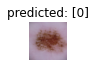

Actual: 0, predicted: [0]


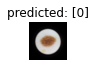

Actual: 0, predicted: [0]


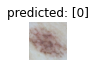

Actual: 0, predicted: [0]


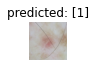

Actual: 1, predicted: [1]


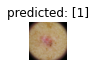

Actual: 1, predicted: [1]


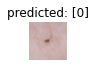

Actual: 1, predicted: [0]


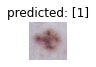

Actual: 1, predicted: [1]


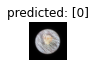

Actual: 0, predicted: [0]


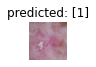

Actual: 1, predicted: [1]


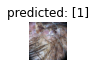

Actual: 1, predicted: [1]


In [ ]:
val_loader_shuffled = DataLoader(dataset_val, batch_size=VAL_BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=True)
visualize_model(resnext_val, val_loader_shuffled, DEVICE, num_images=10)

## SwinTransformers

### 1. SwinTransformer_T

#### Train

* **Tensorboard writer**

In [ ]:
logging.basicConfig(filename="/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/swint/swint_bce.txt", level=logging.INFO,
                        format='[%(asctime)s.%(msecs)03d] %(message)s', datefmt='%H:%M:%S', force=True)
logging.getLogger().addHandler(logging.StreamHandler(sys.stdout))
writer_path = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/swint'

* **Parameters**

In [ ]:
# Parameters 
DEVICE = "cuda" if torch.cuda.is_available() else "cpu" # Device used
print('Device available:', DEVICE)

WD = 1e-8  # weight decay
LR = 1e-4  # learning rate
LR_PATIENCE = 7  # learning rate patience
ES_PATIENCE = 15  # early stopping patience
EPOCHS = 100  # maximum number of epochs

Device available: cuda


In [ ]:
# Number of samples in each set
dataset_sizes = {
    'train': len(dataset_train),
    'val':len(dataset_val),
}

* **Make model**

In [ ]:
swint = make_swin_t(True, DEVICE) # True for pre-trained weights
criterion = nn.BCEWithLogitsLoss()  # Binary Cross-Entropy loss function
optimizer = optim.Adam(swint.parameters(), lr = LR, weight_decay=WD) 
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience= LR_PATIENCE, factor = 0.1, mode="min")

In [ ]:
logging.info('Model:SwinT, LR: 1e-4, LR patience = 7, loss: BCE, optim: ADAM, lr_sched: ReduceOnPlat, WD = 1e-8')

Model:SwinT, LR: 1e-4, LR patience = 7, loss: BCE, optim: ADAM, lr_sched: ReduceOnPlat, WD = 1e-8


* **Train model**

In [ ]:
# Train model
checkpoint_p_swin = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/swint_bce.pth'
swint = train_model(swint, dataloaders, criterion, optimizer, lr_scheduler, checkpoint_p_swin, early_stop_patience=ES_PATIENCE, num_epochs=EPOCHS, writer_path=writer_path)

In [ ]:
# Save best model
torch.save(swint.state_dict(), '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/swint_bce_best.pth')

#### Test

* **Load model**

In [ ]:
swint_val = make_swin_t(False, DEVICE)
swint_val.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/swint_bce_best.pth'))

* **Evaluate model on validation set**

In [ ]:
val_loss_, val_acc_, val_kappa_ = test_model(swint_val, val_loader, DEVICE, criterion)

In [ ]:
logging.info('Final val loss: %.4f, acc: %.4f, kappa: %.4f' % (val_loss_, val_acc_, val_kappa_))

* **Visualize results**

In [ ]:
# Shuffle validation set and plot some of its results
val_loader_shuffled = DataLoader(dataset_val, batch_size=VAL_BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=True)
visualize_model(swint_val, val_loader_shuffled, DEVICE, num_images=10)

### 1. SwinTransformer_B

#### Train

* **Tensorboard writer**

In [ ]:
logging.basicConfig(filename="/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/swint/swinb_bce.txt", level=logging.INFO,
                        format='[%(asctime)s.%(msecs)03d] %(message)s', datefmt='%H:%M:%S', force=True)
logging.getLogger().addHandler(logging.StreamHandler(sys.stdout))
writer_path = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/swinb'

* **Parameters**

In [28]:
# Parameters 
DEVICE = "cuda" if torch.cuda.is_available() else "cpu" # Device used
print('Device available:', DEVICE)

WD = 1e-8  # weight decay
LR = 1e-4  # learning rate
LR_PATIENCE = 7  # learning rate patience
ES_PATIENCE = 15  # early stopping patience
EPOCHS = 100  # maximum number of epochs

Device available: cuda


In [29]:
# Number of samples in each set
dataset_sizes = {
    'train': len(dataset_train),
    'val':len(dataset_val),
}

* **Make model**

In [30]:
swinb = make_swin_b(True, DEVICE) # True for pre-trained weights
criterion = nn.BCEWithLogitsLoss()  # Binary Cross-Entropy loss function
optimizer = optim.Adam(swinb.parameters(), lr = LR, weight_decay=WD) 
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience= LR_PATIENCE, factor = 0.1, mode="min")

Downloading: "https://download.pytorch.org/models/swin_b-68c6b09e.pth" to /root/.cache/torch/hub/checkpoints/swin_b-68c6b09e.pth


  0%|          | 0.00/335M [00:00<?, ?B/s]

In [31]:
logging.info('Model:SwinB, LR: 1e-4, LR patience = 7, loss: BCE, optim: ADAM, lr_sched: ReduceOnPlat, WD = 1e-8')

* **Train model**

In [ ]:
# Train model
checkpoint_p_swin = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/swinb_bce.pth'
swinb = train_model(swinb, dataloaders, criterion, optimizer, lr_scheduler, checkpoint_p_swin, early_stop_patience=ES_PATIENCE, num_epochs=EPOCHS, writer_path=writer_path)

In [ ]:
# Save best model
torch.save(swinb.state_dict(), '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/swinb_bce_best.pth')

#### Test

* **Load model**

In [32]:
swinb_val = make_swin_b(False, DEVICE)
swinb_val.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/swinb_bce_best.pth'))

<All keys matched successfully>

* **Evaluate model on validation set**

In [34]:
val_loss_, val_acc_, val_kappa_ = test_model(swinb_val, val_loader, DEVICE, criterion)

In [ ]:
logging.info('Final val loss: %.4f, acc: %.4f, kappa: %.4f' % (val_loss_, val_acc_, val_kappa_))

* **Visualize results**

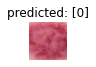

Actual: 0, predicted: [0]


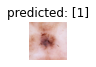

Actual: 1, predicted: [1]


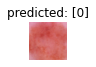

Actual: 0, predicted: [0]


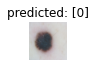

Actual: 1, predicted: [0]


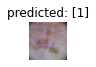

Actual: 1, predicted: [1]


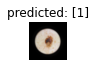

Actual: 1, predicted: [1]


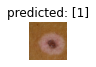

Actual: 0, predicted: [1]


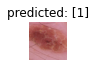

Actual: 1, predicted: [1]


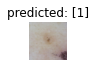

Actual: 1, predicted: [1]


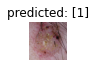

Actual: 1, predicted: [1]


In [35]:
# Shuffle validation set and plot some of its results
val_loader_shuffled = DataLoader(dataset_val, batch_size=VAL_BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=True)
visualize_model(swinb_val, val_loader_shuffled, DEVICE, num_images=10)

## EfficientNet

### 1. EfficientNet-B2

#### Train

* **Tensorboard writer**

In [ ]:
logging.basicConfig(filename="/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/efficientnetb2/efficientnetb2_bce.txt", level=logging.INFO,
                        format='[%(asctime)s.%(msecs)03d] %(message)s', datefmt='%H:%M:%S', force=True)
logging.getLogger().addHandler(logging.StreamHandler(sys.stdout))
writer_path = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/efficientnetb2'

* **Parameters**

In [ ]:
# Parameters 
DEVICE = "cuda" if torch.cuda.is_available() else "cpu" # Device used
print('Device available:', DEVICE)

WD = 1e-8  # weight decay
LR = 1e-4  # learning rate
LR_PATIENCE = 7  # learning rate patience
ES_PATIENCE = 15  # early stopping patience
EPOCHS = 100  # maximum number of epochs

Device available: cuda


In [ ]:
#number of samples in each set
dataset_sizes = {
    'train': len(dataset_train),
    'val':len(dataset_val),
}

* **Make model**

In [ ]:
efficientnet = make_efficientnet_b2(True, DEVICE)# True for pre-trained weights
criterion = nn.BCEWithLogitsLoss()  # Binary Cross-Entropy loss function
optimizer = optim.Adam(efficientnet.parameters(), lr = LR, weight_decay=WD) 
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience= LR_PATIENCE, factor = 0.1, mode="min")

In [ ]:
logging.info('Model:Efficientnet_B2, LR: 1e-4, LR patience = 7, loss: BCE, optim: ADAM, lr_sched: ReduceOnPlat, WD = 1e-8')

* **Train model**

In [ ]:
# Train model
checkpoint_p = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb2_bce_adam.pth'
efficientnet = train_model(efficientnet, dataloaders, criterion, optimizer, lr_scheduler, checkpoint_p, early_stop_patience=ES_PATIENCE, num_epochs=EPOCHS, writer_path=writer_path)

In [ ]:
# Save best model
torch.save(efficientnet.state_dict(), '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb2_bce_best.pth')

#### Test

* **Load model**

In [ ]:
efficientnet_val = make_efficientnet_b2(False, DEVICE)
efficientnet_val.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb2_bce_best.pth'))

* **Evaluate model on validation set**

In [ ]:
val_loss_, val_acc_, val_kappa_ = test_model(efficientnet_val, val_loader, DEVICE, criterion)

In [ ]:
logging.info('Final val loss: %.4f, acc: %.4f, kappa: %.4f' % (val_loss_, val_acc_, val_kappa_))

Final val loss: 0.1831, acc: 0.9472, kappa: 0.9059


* **Visualize results**

In [ ]:
# Shuffle validation set and plot some of its results
val_loader_shuffled = DataLoader(dataset_val, batch_size=VAL_BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=True)
visualize_model(efficientnet_val, val_loader_shuffled, DEVICE, num_images=10)

### 2. EfficientNet-B3

#### Train

* **Tensorboard writer**

In [ ]:
logging.basicConfig(filename="/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/efficientnetb3/efficientnetb3_bce.txt", level=logging.INFO,
                        format='[%(asctime)s.%(msecs)03d] %(message)s', datefmt='%H:%M:%S', force=True)
logging.getLogger().addHandler(logging.StreamHandler(sys.stdout))
writer_path = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/efficientnetb3'

* **Parameters**

In [36]:
# Parameters 
DEVICE = "cuda" if torch.cuda.is_available() else "cpu" # Device used
print('Device available:', DEVICE)

WD = 1e-8  # weight decay
LR = 1e-4  # learning rate
LR_PATIENCE = 7  # learning rate patience
ES_PATIENCE = 15  # early stopping patience
EPOCHS = 100  # maximum number of epochs

Device available: cuda


In [ ]:
#number of samples in each set
dataset_sizes = {
    'train': len(dataset_train),
    'val':len(dataset_val),
}

* **Make model**

In [37]:
efficientnet = make_efficientnet_b3(True, DEVICE)  # True for pre-trained weights
criterion = nn.BCEWithLogitsLoss()  # Binary Cross-Entropy loss function
optimizer = optim.Adam(efficientnet.parameters(), lr = LR, weight_decay=WD) 
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience= LR_PATIENCE, factor = 0.1, mode="min")

Downloading: "https://download.pytorch.org/models/efficientnet_b3_rwightman-cf984f9c.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b3_rwightman-cf984f9c.pth


  0%|          | 0.00/47.2M [00:00<?, ?B/s]

In [ ]:
logging.info('Model:Efficientnet_B3, LR: 1e-4, LR patience = 7, loss: BCE, optim: ADAM, lr_sched: ReduceOnPlat, WD = 1e-8')

* **Train model**

In [ ]:
# Train model
checkpoint_p = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb3_bce_adam.pth'
efficientnet = train_model(efficientnet, dataloaders, criterion, optimizer, lr_scheduler, checkpoint_p, early_stop_patience=ES_PATIENCE, num_epochs=EPOCHS, writer_path=writer_path)

In [ ]:
# Save best model
torch.save(efficientnet.state_dict(), '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb3_bce_best.pth')

#### Test

* **Load model**

In [38]:
efficientnet_val = make_efficientnet_b3(False, DEVICE)
efficientnet_val.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb3_bce_best.pth'))

<All keys matched successfully>

* **Evaluate model on validation set**

In [ ]:
val_loss_, val_acc_, val_kappa_ = test_model(efficientnet_val, val_loader, DEVICE, criterion)

In [ ]:
logging.info('Final val loss: %.4f, acc: %.4f, kappa: %.4f' % (val_loss_, val_acc_, val_kappa_))

Final val loss: 0.1831, acc: 0.9472, kappa: 0.9059


* **Visualize results**

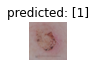

Actual: 1, predicted: [1]


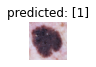

Actual: 1, predicted: [1]


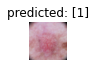

Actual: 1, predicted: [1]


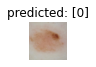

Actual: 0, predicted: [0]


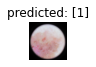

Actual: 1, predicted: [1]


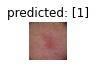

Actual: 1, predicted: [1]


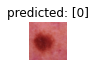

Actual: 0, predicted: [0]


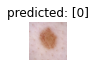

Actual: 0, predicted: [0]


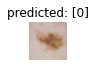

Actual: 0, predicted: [0]


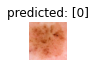

Actual: 1, predicted: [0]


In [39]:
# Shuffle validation set and plot some of its results
val_loader_shuffled = DataLoader(dataset_val, batch_size=VAL_BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=True)
visualize_model(efficientnet_val, val_loader_shuffled, DEVICE, num_images=10)

### 3. EfficientNet-B3 (from scratch)

#### Train

* **Tensorboard writer**

In [ ]:
logging.basicConfig(filename="/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/efficientnetb3_scratch/efficientnetb3_scratch_bce.txt", level=logging.INFO,
                        format='[%(asctime)s.%(msecs)03d] %(message)s', datefmt='%H:%M:%S', force=True)
logging.getLogger().addHandler(logging.StreamHandler(sys.stdout))
writer_path = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/efficientnetb3_scratch'

* **Parameters**

In [ ]:
# Parameters 
DEVICE = "cuda" if torch.cuda.is_available() else "cpu" # Device used
print('Device available:', DEVICE)

WD = 1e-8  # weight decay
LR = 1e-3  # learning rate
LR_PATIENCE = 7  # learning rate patience
ES_PATIENCE = 15  # early stopping patience
EPOCHS = 120  # maximum number of epochs

Device available: cuda


In [ ]:
#number of samples in each set
dataset_sizes = {
    'train': len(dataset_train),
    'val':len(dataset_val),
}

* **Make model**

In [ ]:
efficientnet = make_efficientnet_b3(False, DEVICE)  # True for pre-trained weights
criterion = nn.BCEWithLogitsLoss()  # Binary Cross-Entropy loss function
optimizer = optim.Adam(efficientnet.parameters(), lr = LR, weight_decay=WD) 
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience= LR_PATIENCE, factor = 0.1, mode="min")

In [ ]:
logging.info('Model:Efficientnet_B3_scratch, LR: 1e-3, LR patience = 7, loss: BCE, optim: ADAM, lr_sched: ReduceOnPlat, WD = 1e-8')

Model:EfficientnetB3, LR: 1e-3, LR patience = 7, loss: BCE, optim: ADAM, lr_sched: ReduceOnPlat, WD = 1e-8


* **Train model**

In [ ]:
# Train model
checkpoint_p = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb3_scratch_bce_adam.pth'
efficientnet = train_model(efficientnet, dataloaders, criterion, optimizer, lr_scheduler, checkpoint_p, early_stop_patience=ES_PATIENCE, num_epochs=EPOCHS, writer_path=writer_path, load_checkpoint=checkpoint_p)

Epoch 101/120
---------------


100%|██████████| 475/475 [07:15<00:00,  1.09it/s]



 preds: [[0], [0], [1], [0], [1], [0], [1], [0], [0], [0], [1], [0], [1], [1], [0], [1], [0], [1], [0], [1], [1], [1], [0], [1], [1], [1], [0], [0], [1], [1], [0], [0], [0], [1], [1], [1], [1], [0], [0], [0], [0], [0], [1], [1], [0], [0], [0], [0], [0], [0], [0], [0], [1], [0], [0], [1], [0], [0], [0], [1], [1], [0], [0], [0], [1], [1], [0], [1], [1], [0], [1], [0], [0], [0], [0], [0], [0], [1], [1], [1], [1], [1], [0], [0], [1], [1], [0], [0], [1], [1], [0], [1], [1], [1], [0], [0], [1], [0], [0], [0], [0], [0], [1], [0], [1], [1], [0], [1], [1], [1], [0], [0], [1], [1], [1], [1], [1], [1], [0], [0], [1], [0], [1], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [1], [1], [1], [1], [0], [1], [0], [0], [1], [0], [1], [0], [1], [0], [1], [0], [1], [0], [1], [1], [1], [1], [1], [0], [1], [1], [0], [1], [0], [0], [0], [1], [0], [0], [0], [0], [0], [1], [1], [0], [0], [1], [1], [0], [1], [0], [1], [0], [0], [0], [1], [0], [1], [1], [1], [1], [1], [0], [1], [1], [0], [0], [0], [0], [0], 

100%|██████████| 60/60 [01:22<00:00,  1.38s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 102/120
---------------


100%|██████████| 475/475 [07:08<00:00,  1.11it/s]



 preds: [[1], [0], [1], [1], [0], [0], [0], [1], [1], [0], [1], [1], [1], [1], [0], [0], [0], [0], [1], [0], [1], [0], [0], [0], [1], [1], [1], [0], [1], [0], [0], [1], [0], [1], [0], [0], [1], [0], [0], [0], [0], [0], [1], [1], [1], [1], [0], [1], [1], [1], [0], [1], [0], [0], [0], [1], [1], [0], [0], [0], [0], [1], [0], [0], [0], [1], [0], [0], [1], [0], [1], [0], [1], [0], [0], [1], [0], [1], [0], [0], [0], [0], [1], [0], [1], [1], [0], [0], [0], [0], [1], [1], [0], [0], [0], [1], [0], [0], [1], [1], [0], [0], [1], [1], [1], [0], [1], [0], [0], [0], [1], [0], [1], [0], [0], [1], [1], [1], [1], [1], [1], [0], [0], [0], [1], [0], [1], [0], [1], [0], [0], [0], [1], [0], [1], [0], [1], [0], [1], [0], [1], [1], [1], [1], [1], [0], [0], [1], [0], [0], [0], [0], [1], [1], [0], [1], [0], [1], [0], [0], [0], [1], [0], [0], [1], [1], [1], [1], [0], [0], [0], [1], [0], [0], [1], [1], [1], [0], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [0], [0], [1], [1], [0], [1], [0], [0], [0], [0], 

100%|██████████| 60/60 [01:22<00:00,  1.38s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 103/120
---------------


100%|██████████| 475/475 [07:08<00:00,  1.11it/s]



 preds: [[1], [0], [0], [1], [0], [1], [0], [1], [1], [1], [0], [0], [1], [0], [0], [0], [0], [1], [1], [0], [0], [0], [0], [1], [1], [1], [0], [0], [0], [1], [1], [0], [1], [0], [1], [0], [1], [0], [1], [1], [1], [0], [0], [0], [1], [1], [0], [0], [1], [1], [1], [1], [1], [0], [0], [1], [1], [0], [1], [0], [0], [0], [0], [0], [1], [0], [0], [1], [1], [1], [0], [1], [1], [1], [0], [1], [1], [1], [1], [0], [0], [1], [0], [0], [0], [1], [1], [0], [0], [0], [1], [0], [0], [0], [0], [1], [0], [1], [1], [1], [0], [0], [0], [0], [0], [1], [0], [0], [1], [1], [0], [1], [0], [0], [1], [0], [0], [0], [1], [1], [1], [1], [0], [0], [1], [0], [0], [1], [1], [0], [1], [0], [0], [1], [1], [1], [0], [1], [0], [1], [1], [1], [1], [1], [1], [0], [1], [0], [1], [0], [0], [1], [1], [1], [0], [1], [1], [1], [0], [1], [1], [0], [1], [1], [0], [0], [1], [0], [1], [1], [0], [1], [1], [1], [0], [1], [0], [1], [1], [1], [0], [0], [0], [0], [0], [1], [0], [1], [0], [1], [1], [0], [0], [1], [1], [1], [1], [0], 

100%|██████████| 60/60 [01:22<00:00,  1.37s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 104/120
---------------


100%|██████████| 475/475 [07:08<00:00,  1.11it/s]



 preds: [[0], [1], [0], [0], [0], [0], [0], [1], [0], [1], [1], [1], [1], [0], [0], [0], [1], [1], [1], [1], [1], [0], [1], [1], [0], [0], [0], [1], [1], [0], [1], [0], [0], [0], [1], [0], [0], [0], [1], [0], [1], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [1], [0], [0], [0], [0], [1], [1], [1], [1], [0], [1], [0], [0], [1], [0], [0], [0], [1], [0], [1], [0], [0], [1], [1], [0], [1], [0], [0], [1], [0], [0], [0], [0], [0], [1], [0], [0], [0], [1], [1], [1], [1], [1], [1], [0], [1], [0], [0], [1], [0], [1], [1], [1], [1], [0], [0], [0], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [0], [1], [0], [0], [0], [0], [1], [0], [0], [0], [0], [1], [1], [1], [0], [1], [1], [0], [0], [0], [0], [0], [1], [0], [0], [1], [0], [1], [1], [0], [1], [1], [1], [0], [0], [0], [0], [0], [0], [1], [1], [0], [0], [1], [1], [1], [0], [1], [1], [0], [1], [1], [1], [1], [0], [1], [0], [1], [1], [1], [1], [1], [0], [1], [0], [0], [1], [0], [1], [0], [1], [0], [1], [0], [0], [1], [0], 

100%|██████████| 60/60 [01:22<00:00,  1.37s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 105/120
---------------


100%|██████████| 475/475 [07:06<00:00,  1.11it/s]



 preds: [[1], [1], [0], [0], [0], [1], [0], [1], [0], [0], [1], [0], [1], [0], [1], [0], [0], [0], [0], [0], [0], [0], [1], [1], [1], [0], [0], [0], [0], [1], [0], [1], [0], [0], [0], [1], [1], [0], [0], [1], [1], [0], [1], [1], [0], [0], [1], [1], [0], [1], [1], [0], [0], [1], [1], [0], [1], [1], [0], [1], [1], [0], [0], [0], [1], [0], [0], [0], [0], [0], [0], [0], [1], [1], [0], [0], [0], [1], [1], [1], [0], [0], [0], [1], [0], [1], [1], [1], [1], [1], [0], [0], [1], [0], [0], [1], [1], [0], [1], [1], [0], [0], [0], [0], [1], [1], [0], [0], [0], [0], [1], [0], [0], [1], [1], [0], [1], [0], [0], [0], [1], [0], [0], [1], [0], [0], [1], [1], [0], [1], [1], [0], [0], [0], [1], [1], [1], [0], [1], [0], [0], [0], [0], [1], [0], [1], [0], [0], [0], [0], [0], [1], [1], [0], [1], [0], [0], [1], [0], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [0], [0], [0], [1], [0], [0], [1], [1], [1], [1], [1], [1], [0], [0], [0], [0], [0], [0], [1], [1], [0], [1], [1], [0], [1], [0], [1], [0], [0], 

100%|██████████| 60/60 [01:24<00:00,  1.41s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 106/120
---------------


100%|██████████| 475/475 [07:06<00:00,  1.11it/s]



 preds: [[0], [1], [0], [0], [1], [0], [1], [0], [1], [1], [0], [0], [0], [1], [0], [0], [1], [0], [0], [0], [1], [1], [0], [0], [1], [1], [0], [1], [1], [0], [1], [0], [1], [0], [1], [1], [0], [1], [0], [1], [0], [1], [1], [1], [1], [1], [0], [0], [1], [1], [1], [0], [0], [1], [1], [1], [0], [0], [1], [1], [0], [1], [0], [1], [1], [0], [0], [0], [1], [0], [0], [0], [0], [0], [0], [1], [0], [0], [0], [1], [0], [0], [0], [1], [0], [1], [1], [1], [1], [0], [1], [0], [1], [1], [0], [1], [0], [1], [1], [0], [0], [0], [1], [0], [0], [1], [0], [1], [0], [1], [0], [1], [1], [1], [0], [0], [0], [0], [1], [0], [1], [0], [1], [1], [0], [0], [0], [0], [1], [1], [0], [0], [1], [1], [0], [0], [1], [1], [0], [1], [1], [0], [1], [1], [1], [0], [0], [1], [1], [0], [1], [0], [1], [1], [0], [1], [1], [0], [0], [1], [1], [1], [1], [1], [1], [0], [1], [1], [0], [0], [0], [0], [1], [1], [0], [0], [1], [0], [0], [0], [1], [1], [0], [0], [1], [0], [0], [1], [1], [1], [0], [0], [0], [0], [1], [1], [0], [1], 

100%|██████████| 60/60 [01:24<00:00,  1.40s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 107/120
---------------


100%|██████████| 475/475 [07:09<00:00,  1.11it/s]



 preds: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [0], [0], [0], [1], [1], [1], [1], [0], [0], [0], [0], [0], [1], [0], [1], [0], [0], [0], [0], [1], [0], [1], [0], [0], [0], [1], [0], [0], [0], [0], [1], [0], [1], [0], [0], [0], [0], [0], [0], [0], [1], [1], [1], [0], [1], [0], [0], [0], [1], [0], [0], [1], [0], [0], [0], [0], [0], [1], [0], [1], [0], [1], [1], [1], [1], [1], [0], [1], [0], [1], [0], [0], [1], [0], [0], [0], [0], [0], [1], [0], [0], [0], [0], [0], [0], [0], [1], [1], [1], [0], [1], [0], [0], [1], [1], [0], [0], [1], [1], [1], [0], [1], [0], [0], [1], [1], [1], [0], [0], [1], [1], [0], [1], [1], [1], [0], [0], [1], [0], [0], [1], [1], [1], [1], [1], [0], [1], [0], [1], [1], [0], [1], [0], [0], [0], [1], [0], [0], [1], [0], [0], [0], [1], [1], [1], [1], [0], [1], [0], [1], [1], [1], [0], [0], [0], [0], [0], [1], [0], [0], [0], [1], [0], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], 

100%|██████████| 60/60 [01:22<00:00,  1.37s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 108/120
---------------


100%|██████████| 475/475 [07:07<00:00,  1.11it/s]



 preds: [[1], [0], [1], [1], [0], [1], [0], [0], [1], [0], [1], [0], [1], [1], [0], [0], [1], [0], [0], [1], [1], [0], [0], [0], [0], [1], [0], [1], [1], [0], [1], [0], [0], [0], [0], [1], [0], [1], [0], [0], [0], [1], [1], [1], [0], [1], [0], [0], [0], [0], [1], [0], [1], [0], [1], [1], [1], [1], [0], [1], [1], [0], [1], [0], [0], [0], [1], [0], [0], [1], [1], [1], [1], [0], [0], [1], [1], [0], [1], [1], [0], [1], [0], [1], [0], [1], [1], [0], [1], [0], [1], [1], [0], [1], [1], [0], [1], [1], [1], [1], [0], [0], [1], [0], [0], [1], [0], [0], [1], [1], [0], [1], [1], [0], [1], [1], [0], [1], [0], [1], [0], [1], [0], [0], [1], [0], [0], [0], [0], [1], [1], [1], [1], [1], [0], [1], [0], [1], [0], [1], [1], [0], [1], [1], [1], [0], [0], [0], [0], [1], [1], [0], [0], [1], [0], [1], [0], [0], [0], [0], [0], [0], [0], [1], [1], [1], [1], [0], [0], [0], [1], [1], [1], [0], [0], [0], [1], [0], [0], [0], [0], [0], [1], [1], [1], [0], [0], [1], [0], [1], [1], [1], [1], [0], [0], [0], [1], [1], 

100%|██████████| 60/60 [01:22<00:00,  1.38s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 109/120
---------------


100%|██████████| 475/475 [07:08<00:00,  1.11it/s]



 preds: [[1], [1], [1], [0], [1], [0], [1], [1], [1], [0], [1], [1], [1], [1], [0], [0], [1], [1], [0], [0], [0], [1], [0], [1], [1], [0], [1], [1], [0], [1], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [0], [0], [1], [0], [1], [1], [0], [0], [0], [1], [0], [0], [0], [0], [0], [0], [1], [0], [1], [1], [1], [0], [0], [0], [0], [1], [0], [1], [1], [1], [0], [0], [1], [1], [0], [1], [1], [1], [0], [1], [0], [1], [0], [1], [0], [0], [1], [0], [0], [1], [0], [0], [1], [0], [1], [1], [0], [1], [1], [1], [1], [0], [1], [0], [1], [1], [0], [1], [1], [0], [0], [1], [1], [0], [1], [0], [0], [0], [1], [1], [1], [0], [0], [1], [1], [0], [1], [0], [1], [1], [0], [0], [0], [0], [0], [0], [1], [0], [0], [0], [1], [0], [1], [1], [1], [1], [0], [0], [0], [1], [0], [0], [0], [1], [0], [1], [0], [0], [1], [1], [0], [0], [0], [1], [1], [1], [1], [0], [1], [1], [0], [1], [1], [1], [0], [0], [1], [1], [1], [0], [0], [1], [0], [0], [0], [0], [0], [0], [1], [0], [1], [0], [0], [0], [1], [0], [1], [1], 

100%|██████████| 60/60 [01:24<00:00,  1.40s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 110/120
---------------


100%|██████████| 475/475 [07:09<00:00,  1.10it/s]



 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [0], [0], [1], [0], [1], [0], [1], [1], [0], [0], [1], [1], [1], [0], [0], [1], [0], [0], [0], [0], [0], [0], [0], [0], [1], [1], [0], [1], [1], [0], [1], [1], [0], [0], [0], [1], [0], [0], [1], [1], [1], [0], [0], [0], [1], [0], [0], [0], [1], [0], [0], [1], [0], [0], [0], [0], [0], [0], [1], [1], [1], [0], [1], [1], [1], [0], [0], [1], [1], [0], [0], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [0], [0], [1], [0], [0], [0], [1], [1], [0], [1], [0], [1], [0], [0], [1], [0], [0], [1], [0], [0], [1], [0], [0], [1], [1], [1], [0], [1], [0], [0], [0], [1], [1], [1], [0], [1], [0], [0], [0], [1], [0], [0], [0], [0], [1], [0], [0], [1], [0], [1], [1], [1], [0], [0], [1], [0], [0], [1], [0], [1], [0], [0], [1], [1], [0], [1], [1], [0], [1], [0], [0], [0], [1], [0], [0], [1], [0], [1], [0], [0], [0], [1], [0], [1], [1], [0], [0], [1], [1], [1], [1], [1], [1], 

100%|██████████| 60/60 [01:22<00:00,  1.38s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 111/120
---------------


100%|██████████| 475/475 [07:10<00:00,  1.10it/s]



 preds: [[0], [0], [0], [1], [0], [1], [1], [0], [0], [0], [0], [0], [0], [0], [1], [1], [0], [1], [1], [0], [0], [1], [0], [0], [1], [1], [0], [1], [0], [1], [1], [1], [1], [0], [1], [0], [0], [1], [1], [1], [0], [1], [0], [0], [0], [0], [1], [1], [0], [1], [1], [0], [1], [0], [1], [0], [0], [0], [0], [0], [0], [1], [1], [0], [1], [1], [1], [1], [0], [0], [0], [0], [0], [0], [0], [1], [0], [0], [0], [0], [0], [1], [0], [0], [1], [0], [0], [0], [1], [1], [1], [0], [1], [1], [1], [0], [0], [0], [1], [1], [0], [1], [1], [0], [0], [0], [1], [1], [1], [0], [0], [0], [0], [1], [0], [0], [0], [0], [0], [1], [0], [1], [1], [0], [0], [1], [1], [0], [1], [1], [0], [1], [1], [0], [1], [0], [0], [1], [1], [0], [0], [1], [1], [0], [0], [0], [1], [0], [0], [1], [1], [1], [0], [0], [0], [1], [0], [1], [1], [0], [0], [0], [0], [1], [0], [1], [1], [1], [1], [1], [0], [0], [1], [1], [0], [0], [0], [0], [0], [0], [0], [0], [0], [1], [1], [1], [0], [0], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], 

100%|██████████| 60/60 [01:24<00:00,  1.41s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 112/120
---------------


100%|██████████| 475/475 [07:11<00:00,  1.10it/s]



 preds: [[0], [1], [0], [1], [0], [0], [1], [1], [1], [0], [0], [1], [1], [1], [0], [1], [0], [0], [0], [0], [0], [1], [1], [1], [0], [1], [1], [0], [0], [1], [1], [1], [0], [1], [1], [0], [0], [1], [0], [0], [1], [0], [0], [0], [0], [1], [0], [1], [0], [1], [1], [0], [0], [0], [0], [0], [1], [1], [1], [0], [1], [1], [1], [0], [0], [0], [1], [0], [0], [0], [1], [1], [0], [1], [1], [0], [0], [1], [0], [0], [0], [0], [1], [0], [0], [0], [0], [0], [0], [1], [0], [0], [0], [1], [1], [0], [0], [1], [1], [0], [0], [1], [1], [0], [0], [1], [0], [1], [1], [0], [0], [1], [1], [0], [1], [0], [1], [1], [1], [0], [0], [1], [0], [0], [1], [0], [0], [1], [1], [0], [0], [1], [1], [1], [1], [0], [1], [0], [1], [1], [1], [1], [1], [0], [0], [0], [1], [1], [0], [0], [0], [0], [0], [0], [1], [1], [0], [1], [1], [0], [1], [0], [1], [0], [1], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [1], [1], [0], [0], [0], [1], [1], [0], [0], [0], [1], [1], [1], [0], [1], [0], [1], [0], [1], [1], [1], [0], 

100%|██████████| 60/60 [01:22<00:00,  1.38s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 113/120
---------------


100%|██████████| 475/475 [07:11<00:00,  1.10it/s]



 preds: [[0], [1], [1], [1], [0], [0], [0], [0], [0], [1], [0], [0], [1], [0], [1], [1], [1], [0], [0], [0], [1], [1], [0], [1], [1], [0], [1], [1], [1], [0], [0], [0], [1], [1], [1], [0], [1], [0], [1], [1], [1], [0], [1], [0], [1], [0], [0], [1], [0], [1], [0], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [0], [0], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [0], [1], [0], [1], [1], [1], [1], [1], [0], [0], [1], [0], [0], [0], [0], [0], [0], [0], [1], [0], [0], [0], [1], [1], [1], [0], [0], [0], [0], [1], [0], [0], [1], [1], [0], [1], [0], [0], [0], [1], [0], [0], [1], [0], [1], [1], [0], [1], [0], [1], [0], [0], [0], [0], [1], [0], [0], [1], [1], [0], [1], [1], [0], [0], [0], [1], [0], [0], [1], [0], [1], [0], [0], [0], [0], [1], [1], [1], [1], [0], [0], [0], [1], [1], [0], [1], [1], [0], [1], [1], [1], [0], [1], [0], [1], [1], [1], [0], [1], [0], [1], [0], [0], [1], [0], [0], [0], [0], [1], [1], [1], [1], [0], [0], [1], [1], [0], 

100%|██████████| 60/60 [01:23<00:00,  1.39s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 


Epoch 114/120
---------------


100%|██████████| 475/475 [07:13<00:00,  1.10it/s]



 preds: [[0], [0], [1], [1], [1], [1], [0], [0], [1], [1], [0], [0], [0], [0], [0], [1], [1], [0], [1], [1], [0], [1], [1], [1], [1], [1], [0], [1], [1], [0], [0], [1], [0], [1], [1], [0], [0], [0], [1], [0], [0], [0], [0], [0], [1], [0], [0], [0], [0], [1], [0], [0], [1], [0], [1], [1], [0], [1], [1], [0], [1], [1], [1], [0], [0], [1], [0], [1], [0], [0], [1], [0], [1], [1], [1], [0], [0], [1], [0], [0], [0], [1], [1], [0], [1], [1], [0], [1], [1], [1], [0], [0], [0], [1], [0], [0], [0], [1], [1], [1], [1], [1], [1], [0], [0], [0], [0], [0], [0], [1], [0], [1], [1], [0], [0], [1], [0], [0], [0], [1], [1], [1], [1], [0], [0], [0], [1], [1], [0], [0], [1], [0], [1], [0], [1], [1], [1], [0], [0], [0], [0], [1], [0], [1], [1], [0], [0], [0], [0], [1], [1], [0], [1], [1], [0], [1], [1], [1], [0], [1], [0], [0], [1], [1], [1], [1], [1], [0], [0], [0], [0], [0], [1], [0], [1], [0], [1], [0], [1], [1], [0], [0], [1], [0], [1], [0], [1], [0], [1], [1], [0], [0], [1], [1], [1], [1], [1], [0], 

100%|██████████| 60/60 [01:24<00:00,  1.41s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

EARLY STOP AFTER 114 EPOCHS
Training complete in 119m 56s
Best val loss: 0.309538
Best val acc: 0.8722339304531085
Best val kappa: 0.7441631921612266


In [ ]:
# Save best model
torch.save(efficientnet.state_dict(), '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb3_scratch_bce_best.pth')

#### Test

* **Load model**

In [ ]:
efficientnet_val = make_efficientnet_b3(False, DEVICE)
efficientnet_val.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb3_scratch_bce_best.pth'))

<All keys matched successfully>

* **Evaluate model on validation set**

In [ ]:
val_loss_, val_acc_, val_kappa_ = test_model(efficientnet_val, val_loader, DEVICE, criterion)

100%|██████████| 60/60 [01:22<00:00,  1.37s/it]


 preds: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [0], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

In [ ]:
logging.info('Final val loss: %.4f, acc: %.4f, kappa: %.4f' % (val_loss_, val_acc_, val_kappa_))

Final val loss: 0.3137, acc: 0.8722, kappa: 0.7442


* **Visualize results**

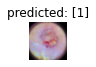

Actual: 1, predicted: [1]


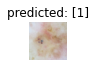

Actual: 1, predicted: [1]


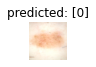

Actual: 0, predicted: [0]


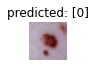

Actual: 1, predicted: [0]


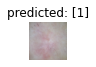

Actual: 1, predicted: [1]


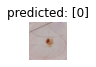

Actual: 1, predicted: [0]


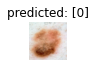

Actual: 0, predicted: [0]


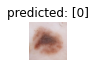

Actual: 0, predicted: [0]


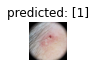

Actual: 1, predicted: [1]


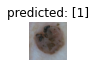

Actual: 1, predicted: [1]


In [ ]:
# Shuffle validation set and plot some of its results
val_loader_shuffled = DataLoader(dataset_val, batch_size=VAL_BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=True)
visualize_model(efficientnet_val, val_loader_shuffled, DEVICE, num_images=10)

### 4. EfficientNet-B4

#### Train

* **Tensorboard writer**

In [ ]:
logging.basicConfig(filename="/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/efficientnetb4/efficientnetb4_bce.txt", level=logging.INFO,
                        format='[%(asctime)s.%(msecs)03d] %(message)s', datefmt='%H:%M:%S', force=True)
logging.getLogger().addHandler(logging.StreamHandler(sys.stdout))
writer_path = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/efficientnetb4'

* **Parameters**

In [ ]:
# Parameters 
DEVICE = "cuda" if torch.cuda.is_available() else "cpu" # Device used
print('Device available:', DEVICE)

WD = 1e-8  # weight decay
LR = 1e-4  # learning rate
LR_PATIENCE = 7  # learning rate patience
ES_PATIENCE = 15  # early stopping patience
EPOCHS = 100  # maximum number of epochs

Device available: cuda


In [ ]:
#number of samples in each set
dataset_sizes = {
    'train': len(dataset_train),
    'val':len(dataset_val),
}

* **Make model**

In [ ]:
efficientnet = make_efficientnet_b4(True, DEVICE)# True for pre-trained weights
criterion = nn.BCEWithLogitsLoss()  # Binary Cross-Entropy loss function
optimizer = optim.Adam(efficientnet.parameters(), lr = LR, weight_decay=WD) 
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience= LR_PATIENCE, factor = 0.1, mode="min")

In [ ]:
logging.info('Model:Efficientnet_B4, LR: 1e-4, LR patience = 7, loss: BCE, optim: ADAM, lr_sched: ReduceOnPlat, WD = 1e-8')

* **Train model**

In [ ]:
# Train model
checkpoint_p = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb4_bce_adam.pth'
efficientnet = train_model(efficientnet, dataloaders, criterion, optimizer, lr_scheduler, checkpoint_p, early_stop_patience=ES_PATIENCE, num_epochs=EPOCHS, writer_path=writer_path)

In [ ]:
# Save best model
torch.save(efficientnet.state_dict(), '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb4_bce_best.pth')

#### Test

* **Load model**

In [ ]:
efficientnet_val = make_efficientnet_b4(False, DEVICE)
efficientnet_val.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb4_bce_best.pth'))

* **Evaluate model on validation set**

In [ ]:
val_loss_, val_acc_, val_kappa_ = test_model(efficientnet_val, val_loader, DEVICE, criterion)

In [ ]:
logging.info('Final val loss: %.4f, acc: %.4f, kappa: %.4f' % (val_loss_, val_acc_, val_kappa_))

Final val loss: 0.1831, acc: 0.9472, kappa: 0.9059


* **Visualize results**

In [ ]:
# Shuffle validation set and plot some of its results
val_loader_shuffled = DataLoader(dataset_val, batch_size=VAL_BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=True)
visualize_model(efficientnet_val, val_loader_shuffled, DEVICE, num_images=10)

### 5. EfficientNet-B5

#### Train

* **Tensorboard writer**

In [ ]:
logging.basicConfig(filename="/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/efficientnetb5/efficientnetb5_bce.txt", level=logging.INFO,
                        format='[%(asctime)s.%(msecs)03d] %(message)s', datefmt='%H:%M:%S', force=True)
logging.getLogger().addHandler(logging.StreamHandler(sys.stdout))
writer_path = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/efficientnetb5'

* **Parameters**

In [ ]:
# Parameters 
DEVICE = "cuda" if torch.cuda.is_available() else "cpu" # Device used
print('Device available:', DEVICE)

WD = 1e-8  # weight decay
LR = 1e-4  # learning rate
LR_PATIENCE = 7  # learning rate patience
ES_PATIENCE = 15  # early stopping patience
EPOCHS = 100  # maximum number of epochs

Device available: cuda


In [ ]:
#number of samples in each set
dataset_sizes = {
    'train': len(dataset_train),
    'val':len(dataset_val),
}

* **Make model**

In [ ]:
efficientnet = make_efficientnet_b5(True, DEVICE)# True for pre-trained weights
criterion = nn.BCEWithLogitsLoss()  # Binary Cross-Entropy loss function
optimizer = optim.Adam(efficientnet.parameters(), lr = LR, weight_decay=WD) 
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience= LR_PATIENCE, factor = 0.1, mode="min")

In [ ]:
logging.info('Model:Efficientnet_B5, LR: 1e-4, LR patience = 7, loss: BCE, optim: ADAM, lr_sched: ReduceOnPlat, WD = 1e-8')

* **Train model**

In [ ]:
# Train model
checkpoint_p = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb5_bce_adam.pth'
efficientnet = train_model(efficientnet, dataloaders, criterion, optimizer, lr_scheduler, checkpoint_p, early_stop_patience=ES_PATIENCE, num_epochs=EPOCHS, writer_path=writer_path)

In [ ]:
# Save best model
torch.save(efficientnet.state_dict(), '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb5_bce_best.pth')

#### Test

* **Load model**

In [ ]:
efficientnet_val = make_efficientnet_b5(False, DEVICE)
efficientnet_val.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb5_bce_best.pth'))

* **Evaluate model on validation set**

In [ ]:
val_loss_, val_acc_, val_kappa_ = test_model(efficientnet_val, val_loader, DEVICE, criterion)

In [ ]:
logging.info('Final val loss: %.4f, acc: %.4f, kappa: %.4f' % (val_loss_, val_acc_, val_kappa_))

Final val loss: 0.1831, acc: 0.9472, kappa: 0.9059


* **Visualize results**

In [ ]:
# Shuffle validation set and plot some of its results
val_loader_shuffled = DataLoader(dataset_val, batch_size=VAL_BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=True)
visualize_model(efficientnet_val, val_loader_shuffled, DEVICE, num_images=10)

### 6. EfficientNet-B6

#### Train

* **Tensorboard writer**

In [ ]:
logging.basicConfig(filename="/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/efficientnetb6/efficientnetb6_bce.txt", level=logging.INFO,
                        format='[%(asctime)s.%(msecs)03d] %(message)s', datefmt='%H:%M:%S', force=True)
logging.getLogger().addHandler(logging.StreamHandler(sys.stdout))
writer_path = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/classification/efficientnetb6'

* **Parameters**

In [ ]:
# Parameters 
DEVICE = "cuda" if torch.cuda.is_available() else "cpu" # Device used
print('Device available:', DEVICE)

WD = 1e-8  # weight decay
LR = 1e-4  # learning rate
LR_PATIENCE = 7  # learning rate patience
ES_PATIENCE = 15  # early stopping patience
EPOCHS = 100  # maximum number of epochs

Device available: cuda


In [ ]:
#number of samples in each set
dataset_sizes = {
    'train': len(dataset_train),
    'val':len(dataset_val),
}

* **Make model**

In [ ]:
efficientnet = make_efficientnet_b6(True, DEVICE)# True for pre-trained weights
criterion = nn.BCEWithLogitsLoss()  # Binary Cross-Entropy loss function
optimizer = optim.Adam(efficientnet.parameters(), lr = LR, weight_decay=WD) 
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience= LR_PATIENCE, factor = 0.1, mode="min")

In [ ]:
logging.info('Model:Efficientnet_B6, LR: 1e-4, LR patience = 7, loss: BCE, optim: ADAM, lr_sched: ReduceOnPlat, WD = 1e-8')

* **Train model**

In [ ]:
# Train model
checkpoint_p = '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb6_bce_adam.pth'
efficientnet = train_model(efficientnet, dataloaders, criterion, optimizer, lr_scheduler, checkpoint_p, early_stop_patience=ES_PATIENCE, num_epochs=EPOCHS, writer_path=writer_path)

In [ ]:
# Save best model
torch.save(efficientnet.state_dict(), '/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb6_bce_best.pth')

#### Test

* **Load model**

In [ ]:
efficientnet_val = make_efficientnet_b6(False, DEVICE)
efficientnet_val.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb6_bce_best.pth'))

* **Evaluate model on validation set**

In [ ]:
val_loss_, val_acc_, val_kappa_ = test_model(efficientnet_val, val_loader, DEVICE, criterion)

In [ ]:
logging.info('Final val loss: %.4f, acc: %.4f, kappa: %.4f' % (val_loss_, val_acc_, val_kappa_))

Final val loss: 0.1831, acc: 0.9472, kappa: 0.9059


* **Visualize results**

In [ ]:
# Shuffle validation set and plot some of its results
val_loader_shuffled = DataLoader(dataset_val, batch_size=VAL_BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=True)
visualize_model(efficientnet_val, val_loader_shuffled, DEVICE, num_images=10)

# Ensembles 

### Load pretrained models

In [ ]:
resnet_50 = make_resnet50(False, DEVICE)
resnet_50.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/resnet_best.pth'))

In [41]:
resnext_50 = make_resnext_50(False, DEVICE)
resnext_50.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/resnext50_best.pth'))

<All keys matched successfully>

In [ ]:
efficientnet_b2 = make_efficientnet_b2(False, DEVICE)
efficientnet_b2.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnet_bce_best.pth'))

<All keys matched successfully>

In [40]:
efficientnet_b3 = make_efficientnet_b3(False, DEVICE)
efficientnet_b3.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb3_bce_best_.pth'))

<All keys matched successfully>

In [ ]:
efficientnet_b3_scr = make_efficientnet_b3(False, DEVICE)
efficientnet_b3_scr.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb3_scratch_2_120e_bce_best_.pth'))

<All keys matched successfully>

In [ ]:
efficientnet_b4 = make_efficientnet_b4(False, DEVICE)
efficientnet_b4.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb4_bce_adam_best.pth'))

<All keys matched successfully>

In [ ]:
efficientnet_b5 = make_efficientnet_b5(False, DEVICE)
efficientnet_b5.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb5_bce_best_.pth'))

<All keys matched successfully>

In [ ]:
efficientnet_b6 = make_efficientnet_b6(False, DEVICE)
efficientnet_b6.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb6_bce_adam_best.pth'))

In [ ]:
swin_t = make_swin_t(False, DEVICE)
swin_t.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/swint_bce_best.pth'))

<All keys matched successfully>

In [42]:
swin_b = make_swin_b(False, DEVICE)
swin_b.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/swinb_bce_best.pth'))

<All keys matched successfully>

### Soft

#### Swin B + EffiNetB4 

In [ ]:
since = time.time()

swin_b.eval()
efficientnet_b4.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_2 = efficientnet_b4(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        outputs = (outputs_sig_1 + outputs_sig_2) / 2.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [01:40<00:00,  1.68s/it]

Test Acc: 0.9189, kappa: 0.8377
Testing complete in 1m 41s


#### Swin B + ResNeXt50 

In [ ]:
since = time.time()

swin_b.eval()
resnext_50.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_2 = resnext_50(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        outputs = (outputs_sig_1 + outputs_sig_2) / 2.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [01:50<00:00,  1.84s/it]

Test Acc: 0.9262, kappa: 0.8524
Testing complete in 1m 50s


#### EffiNetB4 + ResNeXt50

In [ ]:
since = time.time()

resnext_50.eval()
efficientnet_b4.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = resnext_50(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_2 = efficientnet_b4(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        outputs = (outputs_sig_1 + outputs_sig_2) / 2.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [01:24<00:00,  1.40s/it]

Test Acc: 0.9162, kappa: 0.8324
Testing complete in 1m 24s


#### SwinB + EffiNetB4 + ResNeXt50

In [ ]:
since = time.time()

swin_b.eval()
resnext_50.eval()
efficientnet_b4.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_2 = efficientnet_b4(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        outputs_3 = resnext_50(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        outputs = (outputs_sig_1 + outputs_sig_2 + outputs_sig_3) / 3.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [02:00<00:00,  2.01s/it]

Test Acc: 0.9231, kappa: 0.8461
Testing complete in 2m 1s


#### **SwinB + ResNeXt50 + EffiNetB3**

In [ ]:
since = time.time()

swin_b.eval()
resnext_50.eval()
efficientnet_b3.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_2 = efficientnet_b3(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        outputs_3 = resnext_50(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        outputs = (outputs_sig_1 + outputs_sig_2 + outputs_sig_3) / 3.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [01:51<00:00,  1.86s/it]

Test Acc: 0.9273, kappa: 0.8545
Testing complete in 1m 52s


In [ ]:
since = time.time()

swin_b.eval()
resnext_50.eval()
efficientnet_b3.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_2 = efficientnet_b3(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        outputs_3 = resnext_50(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        outputs = (outputs_sig_1 + outputs_sig_2 + outputs_sig_3) / 3.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [01:50<00:00,  1.83s/it]

Test Acc: 0.9252, kappa: 0.8503
Testing complete in 1m 50s


#### SwinB + EffiNetB4 + ResNeXt50 + EffiNetB3

In [ ]:
since = time.time()

swin_b.eval()
resnext_50.eval()
efficientnet_b4.eval()
efficientnet_b3.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_2 = efficientnet_b4(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        outputs_3 = resnext_50(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        outputs_4 = efficientnet_b3(inputs)
        outputs_sig_4 = torch.sigmoid(outputs_4)
        outputs = (outputs_sig_1 + outputs_sig_2 + outputs_sig_3 + outputs_sig_4) / 4.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [02:01<00:00,  2.03s/it]

Test Acc: 0.9249, kappa: 0.8498
Testing complete in 2m 2s


#### SwinB + ResNeXt50 + EffiNetB3 (scratch)

In [ ]:
since = time.time()

swin_b.eval()
resnext_50.eval()
efficientnet_b3_scr.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_2 = efficientnet_b3_scr(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        outputs_3 = resnext_50(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        outputs = (outputs_sig_1 + outputs_sig_2 + outputs_sig_3) / 3.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [01:47<00:00,  1.79s/it]

Test Acc: 0.9207, kappa: 0.8413
Testing complete in 1m 47s


#### Swin B + EffiNetB2

In [ ]:
since = time.time()

swin_b.eval()
efficientnet_b2.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_2 = efficientnet_b2(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        outputs = (outputs_sig_1 + outputs_sig_2) / 2.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [09:50<00:00,  9.83s/it]

Test Acc: 0.9257, kappa: 0.8513
Testing complete in 9m 50s


#### Swin B + ResNeXt50 + EffiNetB2

In [ ]:
since = time.time()

swin_b.eval()
resnext_50.eval()
efficientnet_b2.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_2 = efficientnet_b2(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        outputs_3 = resnext_50(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        outputs = (outputs_sig_1 + outputs_sig_2 + outputs_sig_3) / 3.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [01:45<00:00,  1.75s/it]

Test Acc: 0.9257, kappa: 0.8513
Testing complete in 1m 45s


#### Swin B + ResNeXt50 + EffiNetB3 + EffiNetB2

In [ ]:
since = time.time()

swin_b.eval()
resnext_50.eval()
efficientnet_b3.eval()
efficientnet_b2.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_2 = efficientnet_b2(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        outputs_3 = efficientnet_b3(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        outputs_4 = resnext_50(inputs)
        outputs_sig_4 = torch.sigmoid(outputs_4)
        outputs = (outputs_sig_1 + outputs_sig_2 + outputs_sig_3 + outputs_sig_4) / 4.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [01:58<00:00,  1.98s/it]

Test Acc: 0.9268, kappa: 0.8534
Testing complete in 1m 59s


#### SwinB + SwinT + ResNeXt50

In [ ]:
since = time.time()

swin_b.eval()
swin_t.eval()
resnext_50.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_2 = swin_t(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        outputs_3 = resnext_50(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        outputs = (outputs_sig_1 + outputs_sig_2 + outputs_sig_3) / 3.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [02:07<00:00,  2.12s/it]

Test Acc: 0.9231, kappa: 0.8461
Testing complete in 2m 7s


#### SwinB + SwinT + ResNeXt50 + EffiNetB3

In [ ]:
since = time.time()

swin_b.eval()
swin_t.eval()
resnext_50.eval()
efficientnet_b3.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_2 = swin_t(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        outputs_3 = resnext_50(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        outputs_4 = efficientnet_b3(inputs)
        outputs_sig_4 = torch.sigmoid(outputs_4)
        outputs = (outputs_sig_1 + outputs_sig_2 + outputs_sig_3 + outputs_sig_4) / 4.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [02:11<00:00,  2.19s/it]

Test Acc: 0.9244, kappa: 0.8487
Testing complete in 2m 12s


#### SwinB + SwinT + ResNeXt50 + EffiNetB4

In [ ]:
since = time.time()

swin_b.eval()
swin_t.eval()
resnext_50.eval()
efficientnet_b4.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_2 = swin_t(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        outputs_3 = resnext_50(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        outputs_4 = efficientnet_b4(inputs)
        outputs_sig_4 = torch.sigmoid(outputs_4)
        outputs = (outputs_sig_1 + outputs_sig_2 + outputs_sig_3 + outputs_sig_4) / 4.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [02:15<00:00,  2.26s/it]

Test Acc: 0.9220, kappa: 0.8440
Testing complete in 2m 15s


#### SwinB + SwinT + ResNeXt50 + EffiNetB4 + EffiNetB3 + EffiNetB2

In [ ]:
since = time.time()

swin_b.eval()
swin_t.eval()
resnext_50.eval()
efficientnet_b4.eval()
efficientnet_b3.eval()
efficientnet_b2.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_2 = swin_t(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        outputs_3 = resnext_50(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        outputs_4 = efficientnet_b4(inputs)
        outputs_sig_4 = torch.sigmoid(outputs_4)
        outputs_5 = efficientnet_b3(inputs)
        outputs_sig_5 = torch.sigmoid(outputs_5)
        outputs_6 = efficientnet_b2(inputs)
        outputs_sig_6 = torch.sigmoid(outputs_6)
        outputs = (outputs_sig_1 + outputs_sig_2 + outputs_sig_3 + outputs_sig_4 + outputs_sig_5 + outputs_sig_6) / 6.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [02:34<00:00,  2.58s/it]

Test Acc: 0.9265, kappa: 0.8529
Testing complete in 2m 35s


#### SwinB + EffiNetB3 + ResNeXt50 + EffiNetB5

In [ ]:
since = time.time()

swin_b.eval()
resnext_50.eval()
efficientnet_b3.eval()
efficientnet_b5.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_2 = efficientnet_b5(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        outputs_3 = resnext_50(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        outputs_4 = efficientnet_b3(inputs)
        outputs_sig_4 = torch.sigmoid(outputs_4)
        outputs = (outputs_sig_1 + outputs_sig_2 + outputs_sig_3 + outputs_sig_4) / 4.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [02:10<00:00,  2.17s/it]

Test Acc: 0.9252, kappa: 0.8503
Testing complete in 2m 10s


#### SwinB + EffiNetB3 + ResNeXt50 + ResNet50

In [ ]:
since = time.time()

swin_b.eval()
resnet_50.eval()
efficientnet_b3.eval()
efficientnet_b5.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_2 = efficientnet_b5(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        outputs_3 = resnet_50(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        outputs_4 = efficientnet_b3(inputs)
        outputs_sig_4 = torch.sigmoid(outputs_4)
        outputs = (outputs_sig_1 + outputs_sig_2 + outputs_sig_3 + outputs_sig_4) / 4.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [02:01<00:00,  2.03s/it]

Test Acc: 0.9252, kappa: 0.8503
Testing complete in 2m 2s


#### SwinB + ResNeXt50 + EffiNetB4 + EffiNetB3 + EffiNetB2

In [ ]:
since = time.time()

swin_b.eval()
resnext_50.eval()
efficientnet_b4.eval()
efficientnet_b3.eval()
efficientnet_b2.eval()

running_labels = []
running_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        outputs_3 = resnext_50(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        outputs_4 = efficientnet_b4(inputs)
        outputs_sig_4 = torch.sigmoid(outputs_4)
        outputs_5 = efficientnet_b3(inputs)
        outputs_sig_5 = torch.sigmoid(outputs_5)
        outputs_6 = efficientnet_b2(inputs)
        outputs_sig_6 = torch.sigmoid(outputs_6)
        outputs = (outputs_sig_1 + outputs_sig_3 + outputs_sig_4 + outputs_sig_5 + outputs_sig_6) / 5.0
        preds = ((outputs>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [02:11<00:00,  2.20s/it]

Test Acc: 0.9257, kappa: 0.8513
Testing complete in 2m 12s


### Hard

#### SwinB + EffiNetB4

In [ ]:
since = time.time()

swin_b.eval()
efficientnet_b4.eval()

running_labels = []
swin_b_preds = []
effnet_b4_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        preds = ((outputs_sig_1>0.5)*1).float()
        swin_b_preds = swin_b_preds + preds.int().cpu().tolist()

        outputs_2 = efficientnet_b4(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        preds = ((outputs_sig_2>0.5)*1).float()
        effnet_b4_preds = effnet_b4_preds + preds.int().cpu().tolist()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        
    preds = np.transpose(np.array([swin_b_preds, effnet_b4_preds]))
    running_preds = [Counter(sorted(row, reverse=True)).most_common(1)[0][0] for row in np.squeeze(preds)]
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [02:05<00:00,  2.10s/it]

Test Acc: 0.8788, kappa: 0.7582
Testing complete in 2m 6s


#### SwinB + ResNeXt50

In [ ]:
since = time.time()

swin_b.eval()
resnext_50.eval()

running_labels = []
swin_b_preds = []
resnext_50_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        preds = ((outputs_sig_1>0.5)*1).float()
        swin_b_preds = swin_b_preds + preds.int().cpu().tolist()

        outputs_2 = resnext_50(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        preds = ((outputs_sig_2>0.5)*1).float()
        resnext_50_preds = resnext_50_preds + preds.int().cpu().tolist()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        
    preds = np.transpose(np.array([swin_b_preds, resnext_50_preds]))
    running_preds = [Counter(sorted(row, reverse=True)).most_common(1)[0][0] for row in np.squeeze(preds)]
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [01:37<00:00,  1.63s/it]

Test Acc: 0.9136, kappa: 0.8273
Testing complete in 1m 38s


#### SwinB + EffiNetB4 + ResNeXt50

In [ ]:
since = time.time()

swin_b.eval()
efficientnet_b4.eval()
resnext_50.eval()

running_labels = []
swin_b_preds = []
effnet_b4_preds = []
resnext_50_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        preds = ((outputs_sig_1>0.5)*1).float()
        swin_b_preds = swin_b_preds + preds.int().cpu().tolist()

        outputs_2 = efficientnet_b4(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        preds = ((outputs_sig_2>0.5)*1).float()
        effnet_b4_preds = effnet_b4_preds + preds.int().cpu().tolist()

        outputs_3 = resnext_50(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        preds = ((outputs_sig_3>0.5)*1).float()
        resnext_50_preds = resnext_50_preds + preds.int().cpu().tolist()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        
    preds = np.transpose(np.array([swin_b_preds, effnet_b4_preds, resnext_50_preds]))
    running_preds = [Counter(sorted(row, reverse=True)).most_common(1)[0][0] for row in np.squeeze(preds)]
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [01:53<00:00,  1.90s/it]

Test Acc: 0.9220, kappa: 0.8440
Testing complete in 1m 54s


#### SwinB + ResNeXt50 + EffiNetB3

In [ ]:
since = time.time()

swin_b.eval()
efficientnet_b3.eval()
resnext_50.eval()

running_labels = []
swin_b_preds = []
effnet_b3_preds = []
resnext_50_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        preds = ((outputs_sig_1>0.5)*1).float()
        swin_b_preds = swin_b_preds + preds.int().cpu().tolist()

        outputs_2 = efficientnet_b3(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        preds = ((outputs_sig_2>0.5)*1).float()
        effnet_b3_preds = effnet_b3_preds + preds.int().cpu().tolist()

        outputs_3 = resnext_50(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        preds = ((outputs_sig_3>0.5)*1).float()
        resnext_50_preds = resnext_50_preds + preds.int().cpu().tolist()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        
    preds = np.transpose(np.array([swin_b_preds, effnet_b3_preds, resnext_50_preds]))
    running_preds = [Counter(sorted(row, reverse=True)).most_common(1)[0][0] for row in np.squeeze(preds)]
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [01:55<00:00,  1.93s/it]

Test Acc: 0.9270, kappa: 0.8540
Testing complete in 1m 56s


#### SwinB + EffiNetB4 + ResNeXt50 + EffiNetB3

In [ ]:
since = time.time()

swin_b.eval()
efficientnet_b4.eval()
resnext_50.eval()
efficientnet_b3.eval()

running_labels = []
swin_b_preds = []
effnet_b4_preds = []
resnext_50_preds = []
effnet_b3_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        preds = ((outputs_sig_1>0.5)*1).float()
        swin_b_preds = swin_b_preds + preds.int().cpu().tolist()

        outputs_2 = efficientnet_b4(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        preds = ((outputs_sig_2>0.5)*1).float()
        effnet_b4_preds = effnet_b4_preds + preds.int().cpu().tolist()

        outputs_3 = resnext_50(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        preds = ((outputs_sig_3>0.5)*1).float()
        resnext_50_preds = resnext_50_preds + preds.int().cpu().tolist()

        outputs_4 = efficientnet_b3(inputs)
        outputs_sig_4 = torch.sigmoid(outputs_4)
        preds = ((outputs_sig_4>0.5)*1).float()
        effnet_b3_preds = effnet_b3_preds + preds.int().cpu().tolist()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        
    preds = np.transpose(np.array([swin_b_preds, effnet_b4_preds, resnext_50_preds, effnet_b3_preds]))
    running_preds = [Counter(sorted(row, reverse=True)).most_common(1)[0][0] for row in np.squeeze(preds)]
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [02:01<00:00,  2.02s/it]

Test Acc: 0.9149, kappa: 0.8299
Testing complete in 2m 1s


#### SwinB + EffiNetB3 + ResNeXt50 + EffiNetB2

In [ ]:
since = time.time()

swin_b.eval()
efficientnet_b2.eval()
resnext_50.eval()
efficientnet_b3.eval()

running_labels = []
swin_b_preds = []
effnet_b2_preds = []
resnext_50_preds = []
effnet_b3_preds = []

# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_sig_1 = torch.sigmoid(outputs_1)
        preds = ((outputs_sig_1>0.5)*1).float()
        swin_b_preds = swin_b_preds + preds.int().cpu().tolist()

        outputs_2 = efficientnet_b2(inputs)
        outputs_sig_2 = torch.sigmoid(outputs_2)
        preds = ((outputs_sig_2>0.5)*1).float()
        effnet_b2_preds = effnet_b2_preds + preds.int().cpu().tolist()

        outputs_3 = resnext_50(inputs)
        outputs_sig_3 = torch.sigmoid(outputs_3)
        preds = ((outputs_sig_3>0.5)*1).float()
        resnext_50_preds = resnext_50_preds + preds.int().cpu().tolist()

        outputs_4 = efficientnet_b3(inputs)
        outputs_sig_4 = torch.sigmoid(outputs_4)
        preds = ((outputs_sig_4>0.5)*1).float()
        effnet_b3_preds = effnet_b3_preds + preds.int().cpu().tolist()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        
    preds = np.transpose(np.array([swin_b_preds, effnet_b2_preds, resnext_50_preds, effnet_b3_preds]))
    running_preds = [Counter(sorted(row, reverse=True)).most_common(1)[0][0] for row in np.squeeze(preds)]
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [01:55<00:00,  1.93s/it]

Test Acc: 0.9273, kappa: 0.8546
Testing complete in 1m 56s


# Best Pipeline

## Visualization

* **Load models**

In [43]:
swin_b = make_swin_b(False, DEVICE)
swin_b.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/swinb_bce_best.pth'))

resnext_50 = make_resnext_50(False, DEVICE)
resnext_50.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/resnext50_best.pth'))

efficientnet_b3 = make_efficientnet_b3(False, DEVICE)
efficientnet_b3.load_state_dict(torch.load('/content/drive/MyDrive/CAD_Dataset/Tensorboard/checkpoints/efficientnetb3_bce_best_.pth'))

<All keys matched successfully>

* **Validation predictions**

In [44]:
since = time.time()

swin_b.eval()
resnext_50.eval()
efficientnet_b3.eval()

running_labels = []
running_preds = []
outputs_all = []
# Iterate over data.
with torch.no_grad():
    for batch in tqdm(val_loader):
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_2 = resnext_50(inputs)
        outputs_3 = efficientnet_b3(inputs)

        outputs_1_sig = torch.sigmoid(outputs_1)
        outputs_2_sig = torch.sigmoid(outputs_2)
        outputs_3_sig = torch.sigmoid(outputs_3)

        outputs = (outputs_1 + outputs_2 + outputs_3) / 3.0
        outputs_sig = (outputs_1_sig + outputs_2_sig + outputs_3_sig) / 3.0
        preds = ((outputs_sig>0.5)*1).float()
        
        running_labels = running_labels + labels.int().cpu().tolist()
        running_preds = running_preds + preds.int().cpu().tolist()
        probas = torch.sigmoid(outputs)
        outputs_all.append(probas.cpu().numpy())
  
    test_kappa = cohen_kappa_score(running_labels, running_preds)
    test_acc = accuracy_score(running_labels, running_preds)
    print(f'Test Acc: {test_acc:.4f}, kappa: {test_kappa:.4f}')

    time_elapsed = time.time() - since
    print(f'Testing complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

100%|██████████| 60/60 [23:36<00:00, 23.61s/it]

Test Acc: 0.9273, kappa: 0.8545
Testing complete in 23m 36s


* **Confusion matrix**

Confusion matrix, without normalization


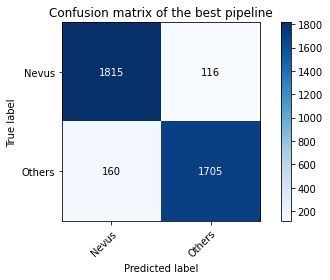

In [69]:
plot_confusion_matrix(running_labels, running_preds, ['Nevus', 'Others'],
                          normalize=False,
                          title='Confusion matrix of the best pipeline',
                          cmap=plt.cm.Blues)

* **Roc Curve**

(3796,)
(3796, 1)


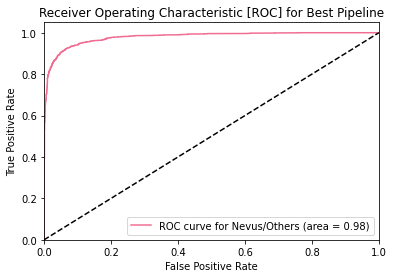

{0: 0.9788249569948755}

In [67]:
probas_ = np.vstack(outputs_all)
plot_roc(running_labels, probas_, True, 'Best Pipeline', n_classes=1)

* **Plot images with their class prediction**

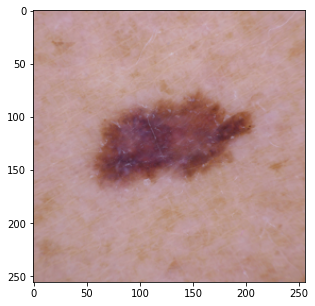

Actual: 1, predicted: tensor([1.], device='cuda:0')


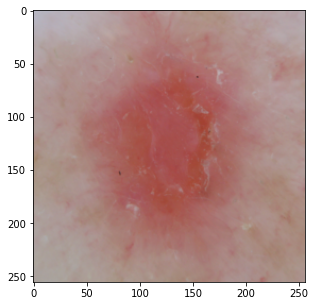

Actual: 1, predicted: tensor([1.], device='cuda:0')


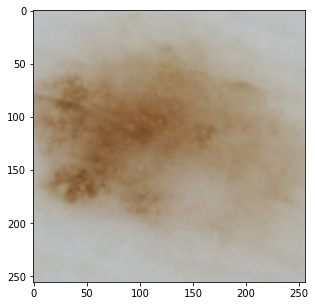

Actual: 1, predicted: tensor([1.], device='cuda:0')


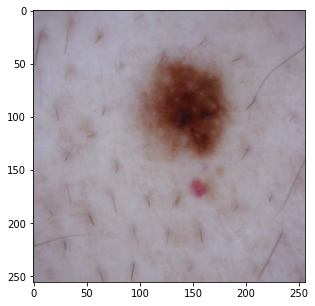

Actual: 0, predicted: tensor([0.], device='cuda:0')


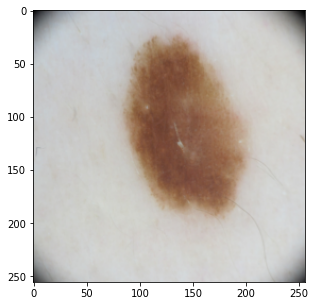

Actual: 0, predicted: tensor([0.], device='cuda:0')


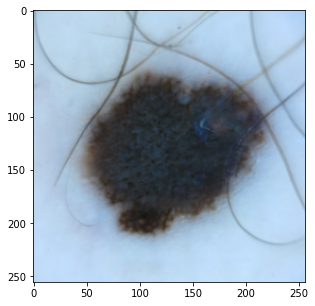

Actual: 0, predicted: tensor([0.], device='cuda:0')


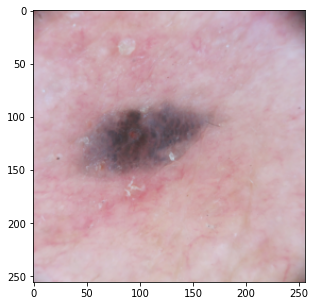

Actual: 0, predicted: tensor([0.], device='cuda:0')


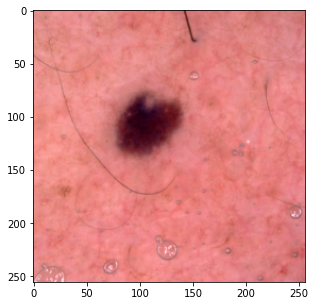

Actual: 0, predicted: tensor([0.], device='cuda:0')


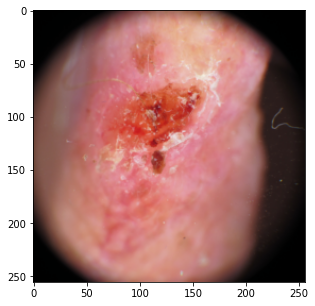

Actual: 1, predicted: tensor([1.], device='cuda:0')


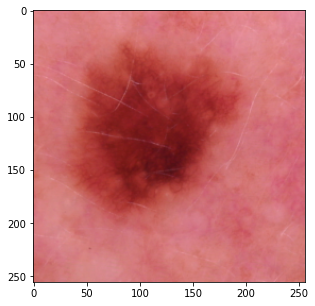

Actual: 0, predicted: tensor([0.], device='cuda:0')


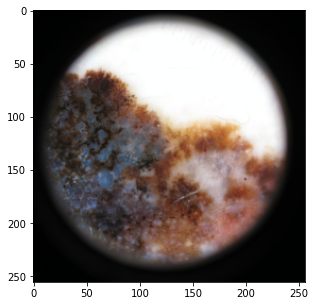

Actual: 1, predicted: tensor([1.], device='cuda:0')


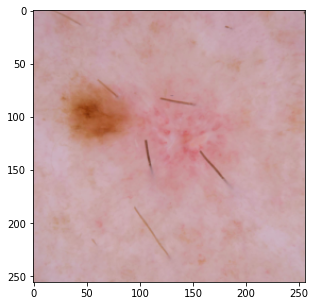

Actual: 1, predicted: tensor([1.], device='cuda:0')


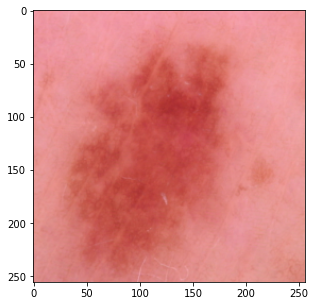

Actual: 0, predicted: tensor([0.], device='cuda:0')


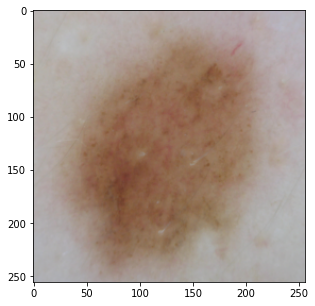

Actual: 0, predicted: tensor([0.], device='cuda:0')


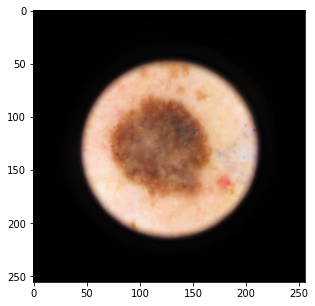

Actual: 0, predicted: tensor([0.], device='cuda:0')


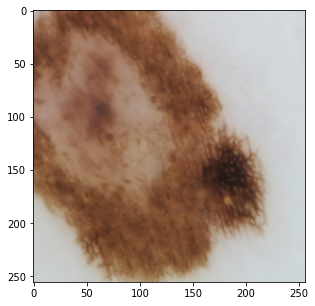

Actual: 0, predicted: tensor([0.], device='cuda:0')


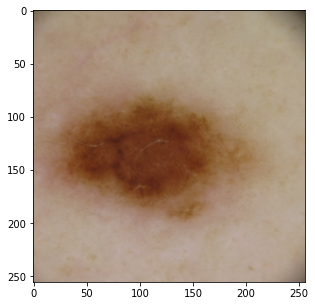

Actual: 0, predicted: tensor([0.], device='cuda:0')


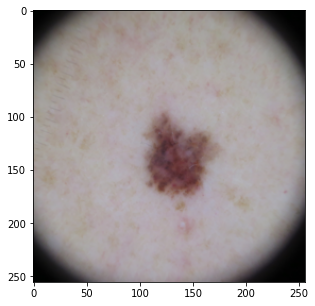

Actual: 0, predicted: tensor([0.], device='cuda:0')


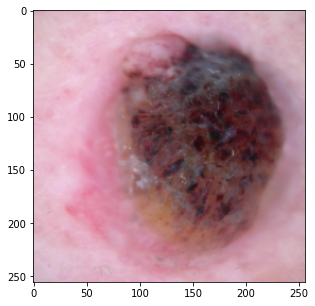

Actual: 1, predicted: tensor([1.], device='cuda:0')


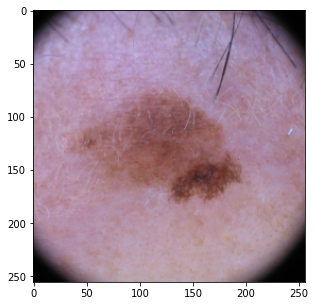

Actual: 1, predicted: tensor([1.], device='cuda:0')


In [ ]:
num_images = 20
val_loader_shuffled = DataLoader(dataset_val, batch_size=VAL_BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=True)

swin_b.eval()
resnext_50.eval()
efficientnet_b3.eval()

images_so_far = 0
with torch.no_grad():
    for batch in val_loader_shuffled:
        inputs = batch["image"].to(DEVICE)
        labels = batch["label"].to(DEVICE)

        outputs_1 = swin_b(inputs)
        outputs_2 = resnext_50(inputs)
        outputs_3 = efficientnet_b3(inputs)
        outputs = (outputs_1 + outputs_2 + outputs_3) / 3.0
        preds = ((outputs>0.5)*1).float()
        # _, preds = torch.max(outputs, 1)

        for j in range(inputs.size()[0]):
            images_so_far += 1
            fig = plt.figure(figsize=(5,5))

            imshow(inputs.cpu().data[j])
            print(f'Actual: {labels[j]}, predicted: {preds[j]}')
            plt.show()

            if images_so_far == num_images:
                break
        if images_so_far == num_images:
                break

## Test inference

* **Test set predictions**

In [ ]:
test_df = pd.read_csv(test_csv_path)
test_ids = []
test_preds = []
for i, row in test_df.iterrows():
  img_id = row['image_id'] # obtain image file name start 
  
  img_path = test_img_folder + '/' + img_id + '.jpg' # file path of the original image 
  image = Image.open(img_path)  # open the original image as RGB
  image = img_transforms(image).unsqueeze(0).to(DEVICE)

  outputs_1 = swin_b(image)
  outputs_2 = resnext_50(image)
  outputs_3 = efficientnet_b3(image)
  outputs = (outputs_1 + outputs_2 + outputs_3) / 3.0
  preds = ((outputs>0.5)*1).float()
  test_preds = test_preds + preds.int().cpu().tolist()
  test_ids.append(img_id)
  print(f"Image {row['image_id']} done")

Streaming output truncated to the last 5000 lines.
Image xxx01341 done
Image xxx01342 done
Image xxx01343 done
Image xxx01344 done
Image xxx01345 done
Image xxx01346 done
Image xxx01347 done
Image xxx01348 done
Image xxx01349 done
Image xxx01350 done
Image xxx01351 done
Image xxx01352 done
Image xxx01353 done
Image xxx01354 done
Image xxx01355 done
Image xxx01356 done
Image xxx01357 done
Image xxx01358 done
Image xxx01359 done
Image xxx01360 done
Image xxx01361 done
Image xxx01362 done
Image xxx01363 done
Image xxx01364 done
Image xxx01365 done
Image xxx01366 done
Image xxx01367 done
Image xxx01368 done
Image xxx01369 done
Image xxx01370 done
Image xxx01371 done
Image xxx01372 done
Image xxx01373 done
Image xxx01374 done
Image xxx01375 done
Image xxx01376 done
Image xxx01377 done
Image xxx01378 done
Image xxx01379 done
Image xxx01380 done
Image xxx01381 done
Image xxx01382 done
Image xxx01383 done
Image xxx01384 done
Image xxx01385 done
Image xxx01386 done
Image xxx01387 done
Image xxx

* **Save test set predictions**

In [ ]:
# Save the test prediction as a dafatframe
test_dict = {'img_id': test_ids, 'prediction': np.squeeze(np.array(test_preds))}
test_inf_df = pd.DataFrame(test_dict)

# Uncomment the next line to save the dataframe
# test_inf_df.to_csv('/content/drive/MyDrive/CAD_Dataset/Challenge1_test/test_results_ch1_dl.csv')